In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import sys
sys.path.append('../')
import torch
import numpy as np
import argparse
import matplotlib.pyplot as plt
from model import AlignmentModel
from torch.utils.data import DataLoader
from vqa_dataset import VQADataset
from cc_dataset import CCDataset

In [5]:
device = "cuda:1"

In [6]:
# Load Model
model_path = "../checkpoints/2020_12_23_1/epch0_bidx6400.pt"
model = AlignmentModel().to(device)
model_data = torch.load(model_path)
model.load_state_dict(model_data["model_state_dict"])
model.eval()

None

In [7]:
class Namespace:
    def __init__(self, opts):
        self.__dict__.update(opts)

In [41]:
args = argparse.Namespace(
    max_seq_len = 16,
    annotation_path = '/private/home/sash/.cache/torch/mmf/data/datasets/vqa2/defaults/annotations/imdb_val2014.npy',
    batch_size = 32,
    feature_path = '/private/home/sash/.cache/torch/mmf/data/datasets/coco/defaults/features/trainval2014.lmdb',
)

In [11]:
def collate_fn(batch):
    image_feats = []
    text_feats = []
    for sample in batch:
        image_feats.append(sample["img_feat"])
        text_feats.append(sample["text_feat"])
    image_feats = torch.mean(torch.stack(image_feats), dim=1).to(device)
    text_feats = torch.stack(text_feats).to(device)
    return [image_feats, text_feats]

dataset = VQADataset(args)
eval_dataloader = DataLoader(
        dataset,
        batch_size=args.batch_size,
        shuffle=True,
        collate_fn=collate_fn,
        drop_last=True,
    )

NameError: name 'args' is not defined

In [12]:
with torch.no_grad():
    diag_distribution = []
    print(f"Eval on downstream...")
    for batch_idx, batch in enumerate(eval_dataloader):
        image_feat_batch = batch[0]  # B x 2048
        text_feat_batch = batch[1]
        image_repr, text_repr = model(image_feat_batch, text_feat_batch)
        dotproduct = image_repr.mm(text_repr.t())
        diag = dotproduct.detach().cpu().diagonal()
        diag_distribution += diag
        
        if batch_idx % 100 == 0:
            print("Saving downstream diag")
            torch.save(torch.tensor(diag_distribution), f"/private/home/sash/downstream_diag/{batch_idx}.pt")

        print(batch_idx)


Eval on downstream...
Saving downstream diag
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
Saving downstream diag
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
Saving downstream diag
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254

1774
1775
1776
1777
1778
1779
1780
1781
1782
1783
1784
1785
1786
1787
1788
1789
1790
1791
1792
1793
1794
1795
1796
1797
1798
1799
Saving downstream diag
1800
1801
1802
1803
1804
1805
1806
1807
1808
1809
1810
1811
1812
1813
1814
1815
1816
1817
1818
1819
1820
1821
1822
1823
1824
1825
1826
1827
1828
1829
1830
1831
1832
1833
1834
1835
1836
1837
1838
1839
1840
1841
1842
1843
1844
1845
1846
1847
1848
1849
1850
1851
1852
1853
1854
1855
1856
1857
1858
1859
1860
1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
Saving downstream diag
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964

3340
3341
3342
3343
3344
3345
3346
3347
3348
3349
3350
3351
3352
3353
3354
3355
3356
3357
3358
3359
3360
3361
3362
3363
3364
3365
3366
3367
3368
3369
3370
3371
3372
3373
3374
3375
3376
3377
3378
3379
3380
3381
3382
3383
3384
3385
3386
3387
3388
3389
3390
3391
3392
3393
3394
3395
3396
3397
3398
3399
Saving downstream diag
3400
3401
3402
3403
3404
3405
3406
3407
3408
3409
3410
3411
3412
3413
3414
3415
3416
3417
3418
3419
3420
3421
3422
3423
3424
3425
3426
3427
3428
3429
3430
3431
3432
3433
3434
3435
3436
3437
3438
3439
3440
3441
3442
3443
3444
3445
3446
3447
3448
3449
3450
3451
3452
3453
3454
3455
3456
3457
3458
3459
3460
3461
3462
3463
3464
3465
3466
3467
3468
3469
3470
3471
3472
3473
3474
3475
3476
3477
3478
3479
3480
3481
3482
3483
3484
3485
3486
3487
3488
3489
3490
3491
3492
3493
3494
3495
3496
3497
3498
3499
Saving downstream diag
3500
3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530

4906
4907
4908
4909
4910
4911
4912
4913
4914
4915
4916
4917
4918
4919
4920
4921
4922
4923
4924
4925
4926
4927
4928
4929
4930
4931
4932
4933
4934
4935
4936
4937
4938
4939
4940
4941
4942
4943
4944
4945
4946
4947
4948
4949
4950
4951
4952
4953
4954
4955
4956
4957
4958
4959
4960
4961
4962
4963
4964
4965
4966
4967
4968
4969
4970
4971
4972
4973
4974
4975
4976
4977
4978
4979
4980
4981
4982
4983
4984
4985
4986
4987
4988
4989
4990
4991
4992
4993
4994
4995
4996
4997
4998
4999
Saving downstream diag
5000
5001
5002
5003
5004
5005
5006
5007
5008
5009
5010
5011
5012
5013
5014
5015
5016
5017
5018
5019
5020
5021
5022
5023
5024
5025
5026
5027
5028
5029
5030
5031
5032
5033
5034
5035
5036
5037
5038
5039
5040
5041
5042
5043
5044
5045
5046
5047
5048
5049
5050
5051
5052
5053
5054
5055
5056
5057
5058
5059
5060
5061
5062
5063
5064
5065
5066
5067
5068
5069
5070
5071
5072
5073
5074
5075
5076
5077
5078
5079
5080
5081
5082
5083
5084
5085
5086
5087
5088
5089
5090
5091
5092
5093
5094
5095
5096
5097
5098
5099
Saving 

6476
6477
6478
6479
6480
6481
6482
6483
6484
6485
6486
6487
6488
6489
6490
6491
6492
6493
6494
6495
6496
6497
6498
6499
Saving downstream diag
6500
6501
6502
6503
6504
6505
6506
6507
6508
6509
6510
6511
6512
6513
6514
6515
6516
6517
6518
6519
6520
6521
6522
6523
6524
6525
6526
6527
6528
6529
6530
6531
6532
6533
6534
6535
6536
6537
6538
6539
6540
6541
6542
6543
6544
6545
6546
6547
6548
6549
6550
6551
6552
6553
6554
6555
6556
6557
6558
6559
6560
6561
6562
6563
6564
6565
6566
6567
6568
6569
6570
6571
6572
6573
6574
6575
6576
6577
6578
6579
6580
6581
6582
6583
6584
6585
6586
6587
6588
6589
6590
6591
6592
6593
6594
6595
6596
6597
6598
6599
Saving downstream diag
6600
6601
6602
6603
6604
6605
6606
6607
6608
6609
6610
6611
6612
6613
6614
6615
6616
6617
6618
6619
6620
6621
6622
6623
6624
6625
6626
6627
6628
6629
6630
6631
6632
6633
6634
6635
6636
6637
6638
6639
6640
6641
6642
6643
6644
6645
6646
6647
6648
6649
6650
6651
6652
6653
6654
6655
6656
6657
6658
6659
6660
6661
6662
6663
6664
6665
6666

In [13]:
pretrain_args = argparse.Namespace(
    max_seq_len = 16,
    annotation_path = '/private/home/sash/.cache/torch/mmf/data/datasets/cc/defaults/annotations/train_all.npy',
    batch_size = 32,
    feature_path = '/private/home/sash/.cache/torch/mmf/data/datasets/cc/defaults/features/cc_train.lmdb',
)

In [12]:
pretrain_dataset = CCDataset(pretrain_args)
pretrain_dataloader = DataLoader(
        pretrain_dataset,
        batch_size=pretrain_args.batch_size,
        shuffle=True,
        collate_fn=collate_fn,
        drop_last=True,
    )

In [14]:
with torch.no_grad():
    pretrain_distribution = []
    print(f"Eval on pretrain...")
    for batch_idx, batch in enumerate(pretrain_dataloader):
        image_feat_batch = batch[0]  # B x 2048
        text_feat_batch = batch[1]
        image_repr, text_repr = model(image_feat_batch, text_feat_batch)
        dotproduct = image_repr.mm(text_repr.t())
        diag = dotproduct.detach().cpu().diagonal()
        assert 0
        pretrain_distribution += diag
        
        if batch_idx % 100 == 0:
            print("Saving pretrain diag")
            torch.save(torch.tensor(pretrain_distribution), f"/private/home/sash/pretrain_diag_notebook/{batch_idx}.pt")

        print(batch_idx)
        
torch.save(torch.tensor(pretrain_distribution), f"/private/home/sash/pretrain_diag_notebook/final.pt")

Eval on pretrain...


AssertionError: 

In [28]:
# Read pretrain distribution
import os
down_distribution = []
downstream_path = "/private/home/sash/downstream_diag"
for filename in os.listdir(downstream_path):
    file_path = os.path.join(downstream_path, filename)
    down_distribution.append(torch.load(file_path))
down_distribution = torch.cat(down_distribution)

In [29]:
# Read pretrain and downstream distribution
pretrain_distribution = []
pretrain_path = "/private/home/sash/pretrain_diag"
for filename in os.listdir(pretrain_path):
    file_path = os.path.join(pretrain_path, filename)
    pretrain_distribution.append(torch.load(file_path))
pretrain_distribution = torch.cat(pretrain_distribution)

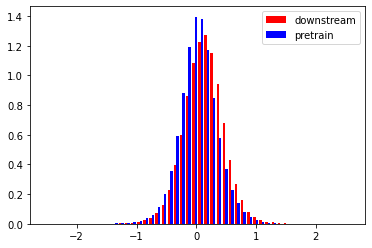

In [31]:
plt.hist([down_distribution, pretrain_distribution], 50, density=True, color=['red', 'blue'], label=["downstream", "pretrain"])
plt.legend(prop={'size': 10})


In [4]:
xs = [
    100, 
200, 
300, 
400, 
500, 
600, 
700, 
800, 
900, 
1000,
1100,
1200,
1300,
1400,
1500,
1600,
1700,
1800,
1900,
2000,
2100,
2200,
2300,
2400,
2500,
2600,
2700,
2800,
2900,
3000,
3100,
3200,
3300,
3400,
3500,
3600,
3700,
3800,
3900,
4000,
4100,
4200,
4300,
4400,
4500,
4600,
4700,
4800,
4900,
5000,
5100,
5200,
5300,
5400,
5500,
5600,
5700,
5800,
5900,
6000,
6100,
6200,
6300,
6400
]

losses = [
324.2850646972656,
123.12796783447266,
89.18533325195312,
153.70809936523438,
145.0987091064453,
98.1839370727539,
84.39369201660156,
117.84397888183594,
105.89808654785156,
 60.10276794433594,
 79.52745056152344,
 79.9685287475586,
 111.59124755859375,
 82.74748992919922,
 90.14264678955078,
 146.78713989257812,
 57.16227722167969,
 113.32687377929688,
 50.94266128540039,
 133.17076110839844,
 79.13629913330078,
 82.63462829589844,
 148.47555541992188,
 87.98960876464844,
 88.6976318359375,
 150.36428833007812,
 104.9771728515625,
 85.43858337402344,
 88.55961608886719,
 40.0499153137207,
 54.238380432128906,
 66.27338409423828,
 62.875892639160156,
 95.07054138183594,
 91.78831481933594,
 44.21363067626953,
 69.930908203125,
 74.38565063476562,
 86.82615661621094,
 99.474365234375,
 86.00137329101562,
 89.28105926513672,
 66.86557006835938,
 82.20364379882812,
 77.38309478759766,
 60.96763610839844,
 100.67293548583984,
 80.67239379882812,
 63.318756103515625,
 69.39591979980469,
 99.16594696044922,
 61.7433967590332,
 118.96089172363281,
 128.2719268798828,
 68.60043334960938,
 94.37184143066406,
 86.49464416503906,
 86.16084289550781,
 58.94681167602539,
 59.563289642333984,
 77.57012939453125,
 82.78203582763672,
 110.0587158203125,
 60.31461715698242,
]

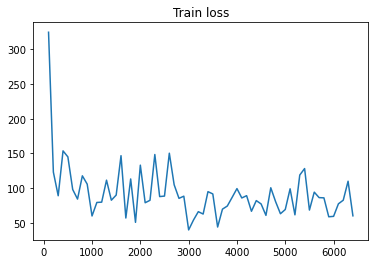

In [5]:
plt.title("Train loss")
plt.plot(xs, losses, '-')
plt.show()

In [16]:
import os
eval_loss = {}
for filename in os.listdir("../checkpoints/losses_2020_12_23_1"):
    num_iteration = int(filename[15:-3])
    path = os.path.join("../checkpoints/losses_2020_12_23_1", filename)
    loss = torch.load(path).item()
    eval_loss[num_iteration] = loss

In [21]:
eval_losses = []
for idx in range(1, 65):
    eval_losses.append(eval_loss[idx*100])

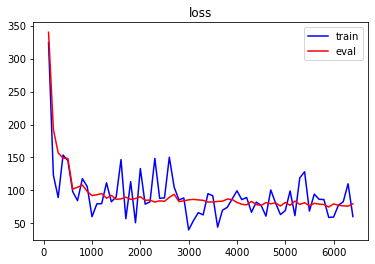

In [29]:
plt.title("loss")
plt.plot(xs, losses, 'b', label='train')
plt.plot(xs, eval_losses, 'r', label='eval')
plt.legend(loc="upper right")
plt.show()

In [57]:
from loss import ContrastiveLoss

with torch.no_grad():
    model = AlignmentModel().to(device)
    eval_losses = {}
    criterion = ContrastiveLoss(margin=0.2, device=device)
    eval_ckpt_loss = {}
    for filename in os.listdir("../checkpoints/2020_12_23_1"):
        model_path = f"../checkpoints/2020_12_23_1/{filename}"
        model_data = torch.load(model_path)
        model.load_state_dict(model_data["model_state_dict"])
        model.eval()

        # eval with the model - 
        dataset = VQADataset(args)
        eval_dataloader = DataLoader(
            dataset,
            batch_size=args.batch_size,
            shuffle=True,
            collate_fn=collate_fn,
            drop_last=True,
        )

        losses = []
        for batch_idx, batch in enumerate(eval_dataloader):
            image_feat_batch = batch[0]  # B x 2048
            text_feat_batch = batch[1]
            image_repr, text_repr = model(image_feat_batch, text_feat_batch)
            loss = criterion(image_repr, text_repr)
            losses.append(loss.item())
            print(f"{filename}: {batch_idx} done")

        eval_ckpt_loss[filename] = sum(losses)/len(losses)
        torch.save(torch.tensor([sum(losses)/len(losses)]), f"../checkpoints/losses_2020_12_23_1/loss_{filename}")
        print(f"{filename} loss: {sum(losses)/len(losses)} done")

epch0_bidx1000.pt: 0 done
epch0_bidx1000.pt: 1 done
epch0_bidx1000.pt: 2 done
epch0_bidx1000.pt: 3 done
epch0_bidx1000.pt: 4 done
epch0_bidx1000.pt: 5 done
epch0_bidx1000.pt: 6 done
epch0_bidx1000.pt: 7 done
epch0_bidx1000.pt: 8 done
epch0_bidx1000.pt: 9 done
epch0_bidx1000.pt: 10 done
epch0_bidx1000.pt: 11 done
epch0_bidx1000.pt: 12 done
epch0_bidx1000.pt: 13 done
epch0_bidx1000.pt: 14 done
epch0_bidx1000.pt: 15 done
epch0_bidx1000.pt: 16 done
epch0_bidx1000.pt: 17 done
epch0_bidx1000.pt: 18 done
epch0_bidx1000.pt: 19 done
epch0_bidx1000.pt: 20 done
epch0_bidx1000.pt: 21 done
epch0_bidx1000.pt: 22 done
epch0_bidx1000.pt: 23 done
epch0_bidx1000.pt: 24 done
epch0_bidx1000.pt: 25 done
epch0_bidx1000.pt: 26 done
epch0_bidx1000.pt: 27 done
epch0_bidx1000.pt: 28 done
epch0_bidx1000.pt: 29 done
epch0_bidx1000.pt: 30 done
epch0_bidx1000.pt: 31 done
epch0_bidx1000.pt: 32 done
epch0_bidx1000.pt: 33 done
epch0_bidx1000.pt: 34 done
epch0_bidx1000.pt: 35 done
epch0_bidx1000.pt: 36 done
epch0_bidx1

epch0_bidx1000.pt: 321 done
epch0_bidx1000.pt: 322 done
epch0_bidx1000.pt: 323 done
epch0_bidx1000.pt: 324 done
epch0_bidx1000.pt: 325 done
epch0_bidx1000.pt: 326 done
epch0_bidx1000.pt: 327 done
epch0_bidx1000.pt: 328 done
epch0_bidx1000.pt: 329 done
epch0_bidx1000.pt: 330 done
epch0_bidx1000.pt: 331 done
epch0_bidx1000.pt: 332 done
epch0_bidx1000.pt: 333 done
epch0_bidx1000.pt: 334 done
epch0_bidx1000.pt: 335 done
epch0_bidx1000.pt: 336 done
epch0_bidx1000.pt: 337 done
epch0_bidx1000.pt: 338 done
epch0_bidx1000.pt: 339 done
epch0_bidx1000.pt: 340 done
epch0_bidx1000.pt: 341 done
epch0_bidx1000.pt: 342 done
epch0_bidx1000.pt: 343 done
epch0_bidx1000.pt: 344 done
epch0_bidx1000.pt: 345 done
epch0_bidx1000.pt: 346 done
epch0_bidx1000.pt: 347 done
epch0_bidx1000.pt: 348 done
epch0_bidx1000.pt: 349 done
epch0_bidx1000.pt: 350 done
epch0_bidx1000.pt: 351 done
epch0_bidx1000.pt: 352 done
epch0_bidx1000.pt: 353 done
epch0_bidx1000.pt: 354 done
epch0_bidx1000.pt: 355 done
epch0_bidx1000.pt: 3

epch0_bidx1000.pt: 614 done
epch0_bidx1000.pt: 615 done
epch0_bidx1000.pt: 616 done
epch0_bidx1000.pt: 617 done
epch0_bidx1000.pt: 618 done
epch0_bidx1000.pt: 619 done
epch0_bidx1000.pt: 620 done
epch0_bidx1000.pt: 621 done
epch0_bidx1000.pt: 622 done
epch0_bidx1000.pt: 623 done
epch0_bidx1000.pt: 624 done
epch0_bidx1000.pt: 625 done
epch0_bidx1000.pt: 626 done
epch0_bidx1000.pt: 627 done
epch0_bidx1000.pt: 628 done
epch0_bidx1000.pt: 629 done
epch0_bidx1000.pt: 630 done
epch0_bidx1000.pt: 631 done
epch0_bidx1000.pt: 632 done
epch0_bidx1000.pt: 633 done
epch0_bidx1000.pt: 634 done
epch0_bidx1000.pt: 635 done
epch0_bidx1000.pt: 636 done
epch0_bidx1000.pt: 637 done
epch0_bidx1000.pt: 638 done
epch0_bidx1000.pt: 639 done
epch0_bidx1000.pt: 640 done
epch0_bidx1000.pt: 641 done
epch0_bidx1000.pt: 642 done
epch0_bidx1000.pt: 643 done
epch0_bidx1000.pt: 644 done
epch0_bidx1000.pt: 645 done
epch0_bidx1000.pt: 646 done
epch0_bidx1000.pt: 647 done
epch0_bidx1000.pt: 648 done
epch0_bidx1000.pt: 6

epch0_bidx1000.pt: 907 done
epch0_bidx1000.pt: 908 done
epch0_bidx1000.pt: 909 done
epch0_bidx1000.pt: 910 done
epch0_bidx1000.pt: 911 done
epch0_bidx1000.pt: 912 done
epch0_bidx1000.pt: 913 done
epch0_bidx1000.pt: 914 done
epch0_bidx1000.pt: 915 done
epch0_bidx1000.pt: 916 done
epch0_bidx1000.pt: 917 done
epch0_bidx1000.pt: 918 done
epch0_bidx1000.pt: 919 done
epch0_bidx1000.pt: 920 done
epch0_bidx1000.pt: 921 done
epch0_bidx1000.pt: 922 done
epch0_bidx1000.pt: 923 done
epch0_bidx1000.pt: 924 done
epch0_bidx1000.pt: 925 done
epch0_bidx1000.pt: 926 done
epch0_bidx1000.pt: 927 done
epch0_bidx1000.pt: 928 done
epch0_bidx1000.pt: 929 done
epch0_bidx1000.pt: 930 done
epch0_bidx1000.pt: 931 done
epch0_bidx1000.pt: 932 done
epch0_bidx1000.pt: 933 done
epch0_bidx1000.pt: 934 done
epch0_bidx1000.pt: 935 done
epch0_bidx1000.pt: 936 done
epch0_bidx1000.pt: 937 done
epch0_bidx1000.pt: 938 done
epch0_bidx1000.pt: 939 done
epch0_bidx1000.pt: 940 done
epch0_bidx1000.pt: 941 done
epch0_bidx1000.pt: 9

epch0_bidx1000.pt: 1193 done
epch0_bidx1000.pt: 1194 done
epch0_bidx1000.pt: 1195 done
epch0_bidx1000.pt: 1196 done
epch0_bidx1000.pt: 1197 done
epch0_bidx1000.pt: 1198 done
epch0_bidx1000.pt: 1199 done
epch0_bidx1000.pt: 1200 done
epch0_bidx1000.pt: 1201 done
epch0_bidx1000.pt: 1202 done
epch0_bidx1000.pt: 1203 done
epch0_bidx1000.pt: 1204 done
epch0_bidx1000.pt: 1205 done
epch0_bidx1000.pt: 1206 done
epch0_bidx1000.pt: 1207 done
epch0_bidx1000.pt: 1208 done
epch0_bidx1000.pt: 1209 done
epch0_bidx1000.pt: 1210 done
epch0_bidx1000.pt: 1211 done
epch0_bidx1000.pt: 1212 done
epch0_bidx1000.pt: 1213 done
epch0_bidx1000.pt: 1214 done
epch0_bidx1000.pt: 1215 done
epch0_bidx1000.pt: 1216 done
epch0_bidx1000.pt: 1217 done
epch0_bidx1000.pt: 1218 done
epch0_bidx1000.pt: 1219 done
epch0_bidx1000.pt: 1220 done
epch0_bidx1000.pt: 1221 done
epch0_bidx1000.pt: 1222 done
epch0_bidx1000.pt: 1223 done
epch0_bidx1000.pt: 1224 done
epch0_bidx1000.pt: 1225 done
epch0_bidx1000.pt: 1226 done
epch0_bidx1000

epch0_bidx1000.pt: 1476 done
epch0_bidx1000.pt: 1477 done
epch0_bidx1000.pt: 1478 done
epch0_bidx1000.pt: 1479 done
epch0_bidx1000.pt: 1480 done
epch0_bidx1000.pt: 1481 done
epch0_bidx1000.pt: 1482 done
epch0_bidx1000.pt: 1483 done
epch0_bidx1000.pt: 1484 done
epch0_bidx1000.pt: 1485 done
epch0_bidx1000.pt: 1486 done
epch0_bidx1000.pt: 1487 done
epch0_bidx1000.pt: 1488 done
epch0_bidx1000.pt: 1489 done
epch0_bidx1000.pt: 1490 done
epch0_bidx1000.pt: 1491 done
epch0_bidx1000.pt: 1492 done
epch0_bidx1000.pt: 1493 done
epch0_bidx1000.pt: 1494 done
epch0_bidx1000.pt: 1495 done
epch0_bidx1000.pt: 1496 done
epch0_bidx1000.pt: 1497 done
epch0_bidx1000.pt: 1498 done
epch0_bidx1000.pt: 1499 done
epch0_bidx1000.pt: 1500 done
epch0_bidx1000.pt: 1501 done
epch0_bidx1000.pt: 1502 done
epch0_bidx1000.pt: 1503 done
epch0_bidx1000.pt: 1504 done
epch0_bidx1000.pt: 1505 done
epch0_bidx1000.pt: 1506 done
epch0_bidx1000.pt: 1507 done
epch0_bidx1000.pt: 1508 done
epch0_bidx1000.pt: 1509 done
epch0_bidx1000

epch0_bidx1000.pt: 1759 done
epch0_bidx1000.pt: 1760 done
epch0_bidx1000.pt: 1761 done
epch0_bidx1000.pt: 1762 done
epch0_bidx1000.pt: 1763 done
epch0_bidx1000.pt: 1764 done
epch0_bidx1000.pt: 1765 done
epch0_bidx1000.pt: 1766 done
epch0_bidx1000.pt: 1767 done
epch0_bidx1000.pt: 1768 done
epch0_bidx1000.pt: 1769 done
epch0_bidx1000.pt: 1770 done
epch0_bidx1000.pt: 1771 done
epch0_bidx1000.pt: 1772 done
epch0_bidx1000.pt: 1773 done
epch0_bidx1000.pt: 1774 done
epch0_bidx1000.pt: 1775 done
epch0_bidx1000.pt: 1776 done
epch0_bidx1000.pt: 1777 done
epch0_bidx1000.pt: 1778 done
epch0_bidx1000.pt: 1779 done
epch0_bidx1000.pt: 1780 done
epch0_bidx1000.pt: 1781 done
epch0_bidx1000.pt: 1782 done
epch0_bidx1000.pt: 1783 done
epch0_bidx1000.pt: 1784 done
epch0_bidx1000.pt: 1785 done
epch0_bidx1000.pt: 1786 done
epch0_bidx1000.pt: 1787 done
epch0_bidx1000.pt: 1788 done
epch0_bidx1000.pt: 1789 done
epch0_bidx1000.pt: 1790 done
epch0_bidx1000.pt: 1791 done
epch0_bidx1000.pt: 1792 done
epch0_bidx1000

epch0_bidx1000.pt: 2042 done
epch0_bidx1000.pt: 2043 done
epch0_bidx1000.pt: 2044 done
epch0_bidx1000.pt: 2045 done
epch0_bidx1000.pt: 2046 done
epch0_bidx1000.pt: 2047 done
epch0_bidx1000.pt: 2048 done
epch0_bidx1000.pt: 2049 done
epch0_bidx1000.pt: 2050 done
epch0_bidx1000.pt: 2051 done
epch0_bidx1000.pt: 2052 done
epch0_bidx1000.pt: 2053 done
epch0_bidx1000.pt: 2054 done
epch0_bidx1000.pt: 2055 done
epch0_bidx1000.pt: 2056 done
epch0_bidx1000.pt: 2057 done
epch0_bidx1000.pt: 2058 done
epch0_bidx1000.pt: 2059 done
epch0_bidx1000.pt: 2060 done
epch0_bidx1000.pt: 2061 done
epch0_bidx1000.pt: 2062 done
epch0_bidx1000.pt: 2063 done
epch0_bidx1000.pt: 2064 done
epch0_bidx1000.pt: 2065 done
epch0_bidx1000.pt: 2066 done
epch0_bidx1000.pt: 2067 done
epch0_bidx1000.pt: 2068 done
epch0_bidx1000.pt: 2069 done
epch0_bidx1000.pt: 2070 done
epch0_bidx1000.pt: 2071 done
epch0_bidx1000.pt: 2072 done
epch0_bidx1000.pt: 2073 done
epch0_bidx1000.pt: 2074 done
epch0_bidx1000.pt: 2075 done
epch0_bidx1000

epch0_bidx1000.pt: 2325 done
epch0_bidx1000.pt: 2326 done
epch0_bidx1000.pt: 2327 done
epch0_bidx1000.pt: 2328 done
epch0_bidx1000.pt: 2329 done
epch0_bidx1000.pt: 2330 done
epch0_bidx1000.pt: 2331 done
epch0_bidx1000.pt: 2332 done
epch0_bidx1000.pt: 2333 done
epch0_bidx1000.pt: 2334 done
epch0_bidx1000.pt: 2335 done
epch0_bidx1000.pt: 2336 done
epch0_bidx1000.pt: 2337 done
epch0_bidx1000.pt: 2338 done
epch0_bidx1000.pt: 2339 done
epch0_bidx1000.pt: 2340 done
epch0_bidx1000.pt: 2341 done
epch0_bidx1000.pt: 2342 done
epch0_bidx1000.pt: 2343 done
epch0_bidx1000.pt: 2344 done
epch0_bidx1000.pt: 2345 done
epch0_bidx1000.pt: 2346 done
epch0_bidx1000.pt: 2347 done
epch0_bidx1000.pt: 2348 done
epch0_bidx1000.pt: 2349 done
epch0_bidx1000.pt: 2350 done
epch0_bidx1000.pt: 2351 done
epch0_bidx1000.pt: 2352 done
epch0_bidx1000.pt: 2353 done
epch0_bidx1000.pt: 2354 done
epch0_bidx1000.pt: 2355 done
epch0_bidx1000.pt: 2356 done
epch0_bidx1000.pt: 2357 done
epch0_bidx1000.pt: 2358 done
epch0_bidx1000

epch0_bidx1000.pt: 2608 done
epch0_bidx1000.pt: 2609 done
epch0_bidx1000.pt: 2610 done
epch0_bidx1000.pt: 2611 done
epch0_bidx1000.pt: 2612 done
epch0_bidx1000.pt: 2613 done
epch0_bidx1000.pt: 2614 done
epch0_bidx1000.pt: 2615 done
epch0_bidx1000.pt: 2616 done
epch0_bidx1000.pt: 2617 done
epch0_bidx1000.pt: 2618 done
epch0_bidx1000.pt: 2619 done
epch0_bidx1000.pt: 2620 done
epch0_bidx1000.pt: 2621 done
epch0_bidx1000.pt: 2622 done
epch0_bidx1000.pt: 2623 done
epch0_bidx1000.pt: 2624 done
epch0_bidx1000.pt: 2625 done
epch0_bidx1000.pt: 2626 done
epch0_bidx1000.pt: 2627 done
epch0_bidx1000.pt: 2628 done
epch0_bidx1000.pt: 2629 done
epch0_bidx1000.pt: 2630 done
epch0_bidx1000.pt: 2631 done
epch0_bidx1000.pt: 2632 done
epch0_bidx1000.pt: 2633 done
epch0_bidx1000.pt: 2634 done
epch0_bidx1000.pt: 2635 done
epch0_bidx1000.pt: 2636 done
epch0_bidx1000.pt: 2637 done
epch0_bidx1000.pt: 2638 done
epch0_bidx1000.pt: 2639 done
epch0_bidx1000.pt: 2640 done
epch0_bidx1000.pt: 2641 done
epch0_bidx1000

epch0_bidx1000.pt: 2891 done
epch0_bidx1000.pt: 2892 done
epch0_bidx1000.pt: 2893 done
epch0_bidx1000.pt: 2894 done
epch0_bidx1000.pt: 2895 done
epch0_bidx1000.pt: 2896 done
epch0_bidx1000.pt: 2897 done
epch0_bidx1000.pt: 2898 done
epch0_bidx1000.pt: 2899 done
epch0_bidx1000.pt: 2900 done
epch0_bidx1000.pt: 2901 done
epch0_bidx1000.pt: 2902 done
epch0_bidx1000.pt: 2903 done
epch0_bidx1000.pt: 2904 done
epch0_bidx1000.pt: 2905 done
epch0_bidx1000.pt: 2906 done
epch0_bidx1000.pt: 2907 done
epch0_bidx1000.pt: 2908 done
epch0_bidx1000.pt: 2909 done
epch0_bidx1000.pt: 2910 done
epch0_bidx1000.pt: 2911 done
epch0_bidx1000.pt: 2912 done
epch0_bidx1000.pt: 2913 done
epch0_bidx1000.pt: 2914 done
epch0_bidx1000.pt: 2915 done
epch0_bidx1000.pt: 2916 done
epch0_bidx1000.pt: 2917 done
epch0_bidx1000.pt: 2918 done
epch0_bidx1000.pt: 2919 done
epch0_bidx1000.pt: 2920 done
epch0_bidx1000.pt: 2921 done
epch0_bidx1000.pt: 2922 done
epch0_bidx1000.pt: 2923 done
epch0_bidx1000.pt: 2924 done
epch0_bidx1000

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



epch0_bidx1200.pt: 677 done
epch0_bidx1200.pt: 678 done
epch0_bidx1200.pt: 679 done
epch0_bidx1200.pt: 680 done
epch0_bidx1200.pt: 681 done
epch0_bidx1200.pt: 682 done
epch0_bidx1200.pt: 683 done
epch0_bidx1200.pt: 684 done
epch0_bidx1200.pt: 685 done
epch0_bidx1200.pt: 686 done
epch0_bidx1200.pt: 687 done
epch0_bidx1200.pt: 688 done
epch0_bidx1200.pt: 689 done
epch0_bidx1200.pt: 690 done
epch0_bidx1200.pt: 691 done
epch0_bidx1200.pt: 692 done
epch0_bidx1200.pt: 693 done
epch0_bidx1200.pt: 694 done
epch0_bidx1200.pt: 695 done
epch0_bidx1200.pt: 696 done
epch0_bidx1200.pt: 697 done
epch0_bidx1200.pt: 698 done
epch0_bidx1200.pt: 699 done
epch0_bidx1200.pt: 700 done
epch0_bidx1200.pt: 701 done
epch0_bidx1200.pt: 702 done
epch0_bidx1200.pt: 703 done
epch0_bidx1200.pt: 704 done
epch0_bidx1200.pt: 705 done
epch0_bidx1200.pt: 706 done
epch0_bidx1200.pt: 707 done
epch0_bidx1200.pt: 708 done
epch0_bidx1200.pt: 709 done
epch0_bidx1200.pt: 710 done
epch0_bidx1200.pt: 711 done
epch0_bidx1200.pt: 7

epch0_bidx1200.pt: 971 done
epch0_bidx1200.pt: 972 done
epch0_bidx1200.pt: 973 done
epch0_bidx1200.pt: 974 done
epch0_bidx1200.pt: 975 done
epch0_bidx1200.pt: 976 done
epch0_bidx1200.pt: 977 done
epch0_bidx1200.pt: 978 done
epch0_bidx1200.pt: 979 done
epch0_bidx1200.pt: 980 done
epch0_bidx1200.pt: 981 done
epch0_bidx1200.pt: 982 done
epch0_bidx1200.pt: 983 done
epch0_bidx1200.pt: 984 done
epch0_bidx1200.pt: 985 done
epch0_bidx1200.pt: 986 done
epch0_bidx1200.pt: 987 done
epch0_bidx1200.pt: 988 done
epch0_bidx1200.pt: 989 done
epch0_bidx1200.pt: 990 done
epch0_bidx1200.pt: 991 done
epch0_bidx1200.pt: 992 done
epch0_bidx1200.pt: 993 done
epch0_bidx1200.pt: 994 done
epch0_bidx1200.pt: 995 done
epch0_bidx1200.pt: 996 done
epch0_bidx1200.pt: 997 done
epch0_bidx1200.pt: 998 done
epch0_bidx1200.pt: 999 done
epch0_bidx1200.pt: 1000 done
epch0_bidx1200.pt: 1001 done
epch0_bidx1200.pt: 1002 done
epch0_bidx1200.pt: 1003 done
epch0_bidx1200.pt: 1004 done
epch0_bidx1200.pt: 1005 done
epch0_bidx1200

epch0_bidx1200.pt: 1258 done
epch0_bidx1200.pt: 1259 done
epch0_bidx1200.pt: 1260 done
epch0_bidx1200.pt: 1261 done
epch0_bidx1200.pt: 1262 done
epch0_bidx1200.pt: 1263 done
epch0_bidx1200.pt: 1264 done
epch0_bidx1200.pt: 1265 done
epch0_bidx1200.pt: 1266 done
epch0_bidx1200.pt: 1267 done
epch0_bidx1200.pt: 1268 done
epch0_bidx1200.pt: 1269 done
epch0_bidx1200.pt: 1270 done
epch0_bidx1200.pt: 1271 done
epch0_bidx1200.pt: 1272 done
epch0_bidx1200.pt: 1273 done
epch0_bidx1200.pt: 1274 done
epch0_bidx1200.pt: 1275 done
epch0_bidx1200.pt: 1276 done
epch0_bidx1200.pt: 1277 done
epch0_bidx1200.pt: 1278 done
epch0_bidx1200.pt: 1279 done
epch0_bidx1200.pt: 1280 done
epch0_bidx1200.pt: 1281 done
epch0_bidx1200.pt: 1282 done
epch0_bidx1200.pt: 1283 done
epch0_bidx1200.pt: 1284 done
epch0_bidx1200.pt: 1285 done
epch0_bidx1200.pt: 1286 done
epch0_bidx1200.pt: 1287 done
epch0_bidx1200.pt: 1288 done
epch0_bidx1200.pt: 1289 done
epch0_bidx1200.pt: 1290 done
epch0_bidx1200.pt: 1291 done
epch0_bidx1200

epch0_bidx1200.pt: 1543 done
epch0_bidx1200.pt: 1544 done
epch0_bidx1200.pt: 1545 done
epch0_bidx1200.pt: 1546 done
epch0_bidx1200.pt: 1547 done
epch0_bidx1200.pt: 1548 done
epch0_bidx1200.pt: 1549 done
epch0_bidx1200.pt: 1550 done
epch0_bidx1200.pt: 1551 done
epch0_bidx1200.pt: 1552 done
epch0_bidx1200.pt: 1553 done
epch0_bidx1200.pt: 1554 done
epch0_bidx1200.pt: 1555 done
epch0_bidx1200.pt: 1556 done
epch0_bidx1200.pt: 1557 done
epch0_bidx1200.pt: 1558 done
epch0_bidx1200.pt: 1559 done
epch0_bidx1200.pt: 1560 done
epch0_bidx1200.pt: 1561 done
epch0_bidx1200.pt: 1562 done
epch0_bidx1200.pt: 1563 done
epch0_bidx1200.pt: 1564 done
epch0_bidx1200.pt: 1565 done
epch0_bidx1200.pt: 1566 done
epch0_bidx1200.pt: 1567 done
epch0_bidx1200.pt: 1568 done
epch0_bidx1200.pt: 1569 done
epch0_bidx1200.pt: 1570 done
epch0_bidx1200.pt: 1571 done
epch0_bidx1200.pt: 1572 done
epch0_bidx1200.pt: 1573 done
epch0_bidx1200.pt: 1574 done
epch0_bidx1200.pt: 1575 done
epch0_bidx1200.pt: 1576 done
epch0_bidx1200

epch0_bidx1200.pt: 1829 done
epch0_bidx1200.pt: 1830 done
epch0_bidx1200.pt: 1831 done
epch0_bidx1200.pt: 1832 done
epch0_bidx1200.pt: 1833 done
epch0_bidx1200.pt: 1834 done
epch0_bidx1200.pt: 1835 done
epch0_bidx1200.pt: 1836 done
epch0_bidx1200.pt: 1837 done
epch0_bidx1200.pt: 1838 done
epch0_bidx1200.pt: 1839 done
epch0_bidx1200.pt: 1840 done
epch0_bidx1200.pt: 1841 done
epch0_bidx1200.pt: 1842 done
epch0_bidx1200.pt: 1843 done
epch0_bidx1200.pt: 1844 done
epch0_bidx1200.pt: 1845 done
epch0_bidx1200.pt: 1846 done
epch0_bidx1200.pt: 1847 done
epch0_bidx1200.pt: 1848 done
epch0_bidx1200.pt: 1849 done
epch0_bidx1200.pt: 1850 done
epch0_bidx1200.pt: 1851 done
epch0_bidx1200.pt: 1852 done
epch0_bidx1200.pt: 1853 done
epch0_bidx1200.pt: 1854 done
epch0_bidx1200.pt: 1855 done
epch0_bidx1200.pt: 1856 done
epch0_bidx1200.pt: 1857 done
epch0_bidx1200.pt: 1858 done
epch0_bidx1200.pt: 1859 done
epch0_bidx1200.pt: 1860 done
epch0_bidx1200.pt: 1861 done
epch0_bidx1200.pt: 1862 done
epch0_bidx1200

epch0_bidx1200.pt: 2114 done
epch0_bidx1200.pt: 2115 done
epch0_bidx1200.pt: 2116 done
epch0_bidx1200.pt: 2117 done
epch0_bidx1200.pt: 2118 done
epch0_bidx1200.pt: 2119 done
epch0_bidx1200.pt: 2120 done
epch0_bidx1200.pt: 2121 done
epch0_bidx1200.pt: 2122 done
epch0_bidx1200.pt: 2123 done
epch0_bidx1200.pt: 2124 done
epch0_bidx1200.pt: 2125 done
epch0_bidx1200.pt: 2126 done
epch0_bidx1200.pt: 2127 done
epch0_bidx1200.pt: 2128 done
epch0_bidx1200.pt: 2129 done
epch0_bidx1200.pt: 2130 done
epch0_bidx1200.pt: 2131 done
epch0_bidx1200.pt: 2132 done
epch0_bidx1200.pt: 2133 done
epch0_bidx1200.pt: 2134 done
epch0_bidx1200.pt: 2135 done
epch0_bidx1200.pt: 2136 done
epch0_bidx1200.pt: 2137 done
epch0_bidx1200.pt: 2138 done
epch0_bidx1200.pt: 2139 done
epch0_bidx1200.pt: 2140 done
epch0_bidx1200.pt: 2141 done
epch0_bidx1200.pt: 2142 done
epch0_bidx1200.pt: 2143 done
epch0_bidx1200.pt: 2144 done
epch0_bidx1200.pt: 2145 done
epch0_bidx1200.pt: 2146 done
epch0_bidx1200.pt: 2147 done
epch0_bidx1200

epch0_bidx1200.pt: 2399 done
epch0_bidx1200.pt: 2400 done
epch0_bidx1200.pt: 2401 done
epch0_bidx1200.pt: 2402 done
epch0_bidx1200.pt: 2403 done
epch0_bidx1200.pt: 2404 done
epch0_bidx1200.pt: 2405 done
epch0_bidx1200.pt: 2406 done
epch0_bidx1200.pt: 2407 done
epch0_bidx1200.pt: 2408 done
epch0_bidx1200.pt: 2409 done
epch0_bidx1200.pt: 2410 done
epch0_bidx1200.pt: 2411 done
epch0_bidx1200.pt: 2412 done
epch0_bidx1200.pt: 2413 done
epch0_bidx1200.pt: 2414 done
epch0_bidx1200.pt: 2415 done
epch0_bidx1200.pt: 2416 done
epch0_bidx1200.pt: 2417 done
epch0_bidx1200.pt: 2418 done
epch0_bidx1200.pt: 2419 done
epch0_bidx1200.pt: 2420 done
epch0_bidx1200.pt: 2421 done
epch0_bidx1200.pt: 2422 done
epch0_bidx1200.pt: 2423 done
epch0_bidx1200.pt: 2424 done
epch0_bidx1200.pt: 2425 done
epch0_bidx1200.pt: 2426 done
epch0_bidx1200.pt: 2427 done
epch0_bidx1200.pt: 2428 done
epch0_bidx1200.pt: 2429 done
epch0_bidx1200.pt: 2430 done
epch0_bidx1200.pt: 2431 done
epch0_bidx1200.pt: 2432 done
epch0_bidx1200

epch0_bidx1200.pt: 2684 done
epch0_bidx1200.pt: 2685 done
epch0_bidx1200.pt: 2686 done
epch0_bidx1200.pt: 2687 done
epch0_bidx1200.pt: 2688 done
epch0_bidx1200.pt: 2689 done
epch0_bidx1200.pt: 2690 done
epch0_bidx1200.pt: 2691 done
epch0_bidx1200.pt: 2692 done
epch0_bidx1200.pt: 2693 done
epch0_bidx1200.pt: 2694 done
epch0_bidx1200.pt: 2695 done
epch0_bidx1200.pt: 2696 done
epch0_bidx1200.pt: 2697 done
epch0_bidx1200.pt: 2698 done
epch0_bidx1200.pt: 2699 done
epch0_bidx1200.pt: 2700 done
epch0_bidx1200.pt: 2701 done
epch0_bidx1200.pt: 2702 done
epch0_bidx1200.pt: 2703 done
epch0_bidx1200.pt: 2704 done
epch0_bidx1200.pt: 2705 done
epch0_bidx1200.pt: 2706 done
epch0_bidx1200.pt: 2707 done
epch0_bidx1200.pt: 2708 done
epch0_bidx1200.pt: 2709 done
epch0_bidx1200.pt: 2710 done
epch0_bidx1200.pt: 2711 done
epch0_bidx1200.pt: 2712 done
epch0_bidx1200.pt: 2713 done
epch0_bidx1200.pt: 2714 done
epch0_bidx1200.pt: 2715 done
epch0_bidx1200.pt: 2716 done
epch0_bidx1200.pt: 2717 done
epch0_bidx1200

epch0_bidx1200.pt: 2968 done
epch0_bidx1200.pt: 2969 done
epch0_bidx1200.pt: 2970 done
epch0_bidx1200.pt: 2971 done
epch0_bidx1200.pt: 2972 done
epch0_bidx1200.pt: 2973 done
epch0_bidx1200.pt: 2974 done
epch0_bidx1200.pt: 2975 done
epch0_bidx1200.pt: 2976 done
epch0_bidx1200.pt: 2977 done
epch0_bidx1200.pt: 2978 done
epch0_bidx1200.pt: 2979 done
epch0_bidx1200.pt: 2980 done
epch0_bidx1200.pt: 2981 done
epch0_bidx1200.pt: 2982 done
epch0_bidx1200.pt: 2983 done
epch0_bidx1200.pt: 2984 done
epch0_bidx1200.pt: 2985 done
epch0_bidx1200.pt: 2986 done
epch0_bidx1200.pt: 2987 done
epch0_bidx1200.pt: 2988 done
epch0_bidx1200.pt: 2989 done
epch0_bidx1200.pt: 2990 done
epch0_bidx1200.pt: 2991 done
epch0_bidx1200.pt: 2992 done
epch0_bidx1200.pt: 2993 done
epch0_bidx1200.pt: 2994 done
epch0_bidx1200.pt: 2995 done
epch0_bidx1200.pt: 2996 done
epch0_bidx1200.pt: 2997 done
epch0_bidx1200.pt: 2998 done
epch0_bidx1200.pt: 2999 done
epch0_bidx1200.pt: 3000 done
epch0_bidx1200.pt: 3001 done
epch0_bidx1200

epch0_bidx1200.pt: 3251 done
epch0_bidx1200.pt: 3252 done
epch0_bidx1200.pt: 3253 done
epch0_bidx1200.pt: 3254 done
epch0_bidx1200.pt: 3255 done
epch0_bidx1200.pt: 3256 done
epch0_bidx1200.pt: 3257 done
epch0_bidx1200.pt: 3258 done
epch0_bidx1200.pt: 3259 done
epch0_bidx1200.pt: 3260 done
epch0_bidx1200.pt: 3261 done
epch0_bidx1200.pt: 3262 done
epch0_bidx1200.pt: 3263 done
epch0_bidx1200.pt: 3264 done
epch0_bidx1200.pt: 3265 done
epch0_bidx1200.pt: 3266 done
epch0_bidx1200.pt: 3267 done
epch0_bidx1200.pt: 3268 done
epch0_bidx1200.pt: 3269 done
epch0_bidx1200.pt: 3270 done
epch0_bidx1200.pt: 3271 done
epch0_bidx1200.pt: 3272 done
epch0_bidx1200.pt: 3273 done
epch0_bidx1200.pt: 3274 done
epch0_bidx1200.pt: 3275 done
epch0_bidx1200.pt: 3276 done
epch0_bidx1200.pt: 3277 done
epch0_bidx1200.pt: 3278 done
epch0_bidx1200.pt: 3279 done
epch0_bidx1200.pt: 3280 done
epch0_bidx1200.pt: 3281 done
epch0_bidx1200.pt: 3282 done
epch0_bidx1200.pt: 3283 done
epch0_bidx1200.pt: 3284 done
epch0_bidx1200

epch0_bidx1200.pt: 3535 done
epch0_bidx1200.pt: 3536 done
epch0_bidx1200.pt: 3537 done
epch0_bidx1200.pt: 3538 done
epch0_bidx1200.pt: 3539 done
epch0_bidx1200.pt: 3540 done
epch0_bidx1200.pt: 3541 done
epch0_bidx1200.pt: 3542 done
epch0_bidx1200.pt: 3543 done
epch0_bidx1200.pt: 3544 done
epch0_bidx1200.pt: 3545 done
epch0_bidx1200.pt: 3546 done
epch0_bidx1200.pt: 3547 done
epch0_bidx1200.pt: 3548 done
epch0_bidx1200.pt: 3549 done
epch0_bidx1200.pt: 3550 done
epch0_bidx1200.pt: 3551 done
epch0_bidx1200.pt: 3552 done
epch0_bidx1200.pt: 3553 done
epch0_bidx1200.pt: 3554 done
epch0_bidx1200.pt: 3555 done
epch0_bidx1200.pt: 3556 done
epch0_bidx1200.pt: 3557 done
epch0_bidx1200.pt: 3558 done
epch0_bidx1200.pt: 3559 done
epch0_bidx1200.pt: 3560 done
epch0_bidx1200.pt: 3561 done
epch0_bidx1200.pt: 3562 done
epch0_bidx1200.pt: 3563 done
epch0_bidx1200.pt: 3564 done
epch0_bidx1200.pt: 3565 done
epch0_bidx1200.pt: 3566 done
epch0_bidx1200.pt: 3567 done
epch0_bidx1200.pt: 3568 done
epch0_bidx1200

epch0_bidx1200.pt: 3820 done
epch0_bidx1200.pt: 3821 done
epch0_bidx1200.pt: 3822 done
epch0_bidx1200.pt: 3823 done
epch0_bidx1200.pt: 3824 done
epch0_bidx1200.pt: 3825 done
epch0_bidx1200.pt: 3826 done
epch0_bidx1200.pt: 3827 done
epch0_bidx1200.pt: 3828 done
epch0_bidx1200.pt: 3829 done
epch0_bidx1200.pt: 3830 done
epch0_bidx1200.pt: 3831 done
epch0_bidx1200.pt: 3832 done
epch0_bidx1200.pt: 3833 done
epch0_bidx1200.pt: 3834 done
epch0_bidx1200.pt: 3835 done
epch0_bidx1200.pt: 3836 done
epch0_bidx1200.pt: 3837 done
epch0_bidx1200.pt: 3838 done
epch0_bidx1200.pt: 3839 done
epch0_bidx1200.pt: 3840 done
epch0_bidx1200.pt: 3841 done
epch0_bidx1200.pt: 3842 done
epch0_bidx1200.pt: 3843 done
epch0_bidx1200.pt: 3844 done
epch0_bidx1200.pt: 3845 done
epch0_bidx1200.pt: 3846 done
epch0_bidx1200.pt: 3847 done
epch0_bidx1200.pt: 3848 done
epch0_bidx1200.pt: 3849 done
epch0_bidx1200.pt: 3850 done
epch0_bidx1200.pt: 3851 done
epch0_bidx1200.pt: 3852 done
epch0_bidx1200.pt: 3853 done
epch0_bidx1200

epch0_bidx1200.pt: 4103 done
epch0_bidx1200.pt: 4104 done
epch0_bidx1200.pt: 4105 done
epch0_bidx1200.pt: 4106 done
epch0_bidx1200.pt: 4107 done
epch0_bidx1200.pt: 4108 done
epch0_bidx1200.pt: 4109 done
epch0_bidx1200.pt: 4110 done
epch0_bidx1200.pt: 4111 done
epch0_bidx1200.pt: 4112 done
epch0_bidx1200.pt: 4113 done
epch0_bidx1200.pt: 4114 done
epch0_bidx1200.pt: 4115 done
epch0_bidx1200.pt: 4116 done
epch0_bidx1200.pt: 4117 done
epch0_bidx1200.pt: 4118 done
epch0_bidx1200.pt: 4119 done
epch0_bidx1200.pt: 4120 done
epch0_bidx1200.pt: 4121 done
epch0_bidx1200.pt: 4122 done
epch0_bidx1200.pt: 4123 done
epch0_bidx1200.pt: 4124 done
epch0_bidx1200.pt: 4125 done
epch0_bidx1200.pt: 4126 done
epch0_bidx1200.pt: 4127 done
epch0_bidx1200.pt: 4128 done
epch0_bidx1200.pt: 4129 done
epch0_bidx1200.pt: 4130 done
epch0_bidx1200.pt: 4131 done
epch0_bidx1200.pt: 4132 done
epch0_bidx1200.pt: 4133 done
epch0_bidx1200.pt: 4134 done
epch0_bidx1200.pt: 4135 done
epch0_bidx1200.pt: 4136 done
epch0_bidx1200

epch0_bidx1200.pt: 4389 done
epch0_bidx1200.pt: 4390 done
epch0_bidx1200.pt: 4391 done
epch0_bidx1200.pt: 4392 done
epch0_bidx1200.pt: 4393 done
epch0_bidx1200.pt: 4394 done
epch0_bidx1200.pt: 4395 done
epch0_bidx1200.pt: 4396 done
epch0_bidx1200.pt: 4397 done
epch0_bidx1200.pt: 4398 done
epch0_bidx1200.pt: 4399 done
epch0_bidx1200.pt: 4400 done
epch0_bidx1200.pt: 4401 done
epch0_bidx1200.pt: 4402 done
epch0_bidx1200.pt: 4403 done
epch0_bidx1200.pt: 4404 done
epch0_bidx1200.pt: 4405 done
epch0_bidx1200.pt: 4406 done
epch0_bidx1200.pt: 4407 done
epch0_bidx1200.pt: 4408 done
epch0_bidx1200.pt: 4409 done
epch0_bidx1200.pt: 4410 done
epch0_bidx1200.pt: 4411 done
epch0_bidx1200.pt: 4412 done
epch0_bidx1200.pt: 4413 done
epch0_bidx1200.pt: 4414 done
epch0_bidx1200.pt: 4415 done
epch0_bidx1200.pt: 4416 done
epch0_bidx1200.pt: 4417 done
epch0_bidx1200.pt: 4418 done
epch0_bidx1200.pt: 4419 done
epch0_bidx1200.pt: 4420 done
epch0_bidx1200.pt: 4421 done
epch0_bidx1200.pt: 4422 done
epch0_bidx1200

epch0_bidx1200.pt: 4672 done
epch0_bidx1200.pt: 4673 done
epch0_bidx1200.pt: 4674 done
epch0_bidx1200.pt: 4675 done
epch0_bidx1200.pt: 4676 done
epch0_bidx1200.pt: 4677 done
epch0_bidx1200.pt: 4678 done
epch0_bidx1200.pt: 4679 done
epch0_bidx1200.pt: 4680 done
epch0_bidx1200.pt: 4681 done
epch0_bidx1200.pt: 4682 done
epch0_bidx1200.pt: 4683 done
epch0_bidx1200.pt: 4684 done
epch0_bidx1200.pt: 4685 done
epch0_bidx1200.pt: 4686 done
epch0_bidx1200.pt: 4687 done
epch0_bidx1200.pt: 4688 done
epch0_bidx1200.pt: 4689 done
epch0_bidx1200.pt: 4690 done
epch0_bidx1200.pt: 4691 done
epch0_bidx1200.pt: 4692 done
epch0_bidx1200.pt: 4693 done
epch0_bidx1200.pt: 4694 done
epch0_bidx1200.pt: 4695 done
epch0_bidx1200.pt: 4696 done
epch0_bidx1200.pt: 4697 done
epch0_bidx1200.pt: 4698 done
epch0_bidx1200.pt: 4699 done
epch0_bidx1200.pt: 4700 done
epch0_bidx1200.pt: 4701 done
epch0_bidx1200.pt: 4702 done
epch0_bidx1200.pt: 4703 done
epch0_bidx1200.pt: 4704 done
epch0_bidx1200.pt: 4705 done
epch0_bidx1200

epch0_bidx1200.pt: 4956 done
epch0_bidx1200.pt: 4957 done
epch0_bidx1200.pt: 4958 done
epch0_bidx1200.pt: 4959 done
epch0_bidx1200.pt: 4960 done
epch0_bidx1200.pt: 4961 done
epch0_bidx1200.pt: 4962 done
epch0_bidx1200.pt: 4963 done
epch0_bidx1200.pt: 4964 done
epch0_bidx1200.pt: 4965 done
epch0_bidx1200.pt: 4966 done
epch0_bidx1200.pt: 4967 done
epch0_bidx1200.pt: 4968 done
epch0_bidx1200.pt: 4969 done
epch0_bidx1200.pt: 4970 done
epch0_bidx1200.pt: 4971 done
epch0_bidx1200.pt: 4972 done
epch0_bidx1200.pt: 4973 done
epch0_bidx1200.pt: 4974 done
epch0_bidx1200.pt: 4975 done
epch0_bidx1200.pt: 4976 done
epch0_bidx1200.pt: 4977 done
epch0_bidx1200.pt: 4978 done
epch0_bidx1200.pt: 4979 done
epch0_bidx1200.pt: 4980 done
epch0_bidx1200.pt: 4981 done
epch0_bidx1200.pt: 4982 done
epch0_bidx1200.pt: 4983 done
epch0_bidx1200.pt: 4984 done
epch0_bidx1200.pt: 4985 done
epch0_bidx1200.pt: 4986 done
epch0_bidx1200.pt: 4987 done
epch0_bidx1200.pt: 4988 done
epch0_bidx1200.pt: 4989 done
epch0_bidx1200

epch0_bidx1200.pt: 5240 done
epch0_bidx1200.pt: 5241 done
epch0_bidx1200.pt: 5242 done
epch0_bidx1200.pt: 5243 done
epch0_bidx1200.pt: 5244 done
epch0_bidx1200.pt: 5245 done
epch0_bidx1200.pt: 5246 done
epch0_bidx1200.pt: 5247 done
epch0_bidx1200.pt: 5248 done
epch0_bidx1200.pt: 5249 done
epch0_bidx1200.pt: 5250 done
epch0_bidx1200.pt: 5251 done
epch0_bidx1200.pt: 5252 done
epch0_bidx1200.pt: 5253 done
epch0_bidx1200.pt: 5254 done
epch0_bidx1200.pt: 5255 done
epch0_bidx1200.pt: 5256 done
epch0_bidx1200.pt: 5257 done
epch0_bidx1200.pt: 5258 done
epch0_bidx1200.pt: 5259 done
epch0_bidx1200.pt: 5260 done
epch0_bidx1200.pt: 5261 done
epch0_bidx1200.pt: 5262 done
epch0_bidx1200.pt: 5263 done
epch0_bidx1200.pt: 5264 done
epch0_bidx1200.pt: 5265 done
epch0_bidx1200.pt: 5266 done
epch0_bidx1200.pt: 5267 done
epch0_bidx1200.pt: 5268 done
epch0_bidx1200.pt: 5269 done
epch0_bidx1200.pt: 5270 done
epch0_bidx1200.pt: 5271 done
epch0_bidx1200.pt: 5272 done
epch0_bidx1200.pt: 5273 done
epch0_bidx1200

epch0_bidx1200.pt: 5524 done
epch0_bidx1200.pt: 5525 done
epch0_bidx1200.pt: 5526 done
epch0_bidx1200.pt: 5527 done
epch0_bidx1200.pt: 5528 done
epch0_bidx1200.pt: 5529 done
epch0_bidx1200.pt: 5530 done
epch0_bidx1200.pt: 5531 done
epch0_bidx1200.pt: 5532 done
epch0_bidx1200.pt: 5533 done
epch0_bidx1200.pt: 5534 done
epch0_bidx1200.pt: 5535 done
epch0_bidx1200.pt: 5536 done
epch0_bidx1200.pt: 5537 done
epch0_bidx1200.pt: 5538 done
epch0_bidx1200.pt: 5539 done
epch0_bidx1200.pt: 5540 done
epch0_bidx1200.pt: 5541 done
epch0_bidx1200.pt: 5542 done
epch0_bidx1200.pt: 5543 done
epch0_bidx1200.pt: 5544 done
epch0_bidx1200.pt: 5545 done
epch0_bidx1200.pt: 5546 done
epch0_bidx1200.pt: 5547 done
epch0_bidx1200.pt: 5548 done
epch0_bidx1200.pt: 5549 done
epch0_bidx1200.pt: 5550 done
epch0_bidx1200.pt: 5551 done
epch0_bidx1200.pt: 5552 done
epch0_bidx1200.pt: 5553 done
epch0_bidx1200.pt: 5554 done
epch0_bidx1200.pt: 5555 done
epch0_bidx1200.pt: 5556 done
epch0_bidx1200.pt: 5557 done
epch0_bidx1200

epch0_bidx1200.pt: 5808 done
epch0_bidx1200.pt: 5809 done
epch0_bidx1200.pt: 5810 done
epch0_bidx1200.pt: 5811 done
epch0_bidx1200.pt: 5812 done
epch0_bidx1200.pt: 5813 done
epch0_bidx1200.pt: 5814 done
epch0_bidx1200.pt: 5815 done
epch0_bidx1200.pt: 5816 done
epch0_bidx1200.pt: 5817 done
epch0_bidx1200.pt: 5818 done
epch0_bidx1200.pt: 5819 done
epch0_bidx1200.pt: 5820 done
epch0_bidx1200.pt: 5821 done
epch0_bidx1200.pt: 5822 done
epch0_bidx1200.pt: 5823 done
epch0_bidx1200.pt: 5824 done
epch0_bidx1200.pt: 5825 done
epch0_bidx1200.pt: 5826 done
epch0_bidx1200.pt: 5827 done
epch0_bidx1200.pt: 5828 done
epch0_bidx1200.pt: 5829 done
epch0_bidx1200.pt: 5830 done
epch0_bidx1200.pt: 5831 done
epch0_bidx1200.pt: 5832 done
epch0_bidx1200.pt: 5833 done
epch0_bidx1200.pt: 5834 done
epch0_bidx1200.pt: 5835 done
epch0_bidx1200.pt: 5836 done
epch0_bidx1200.pt: 5837 done
epch0_bidx1200.pt: 5838 done
epch0_bidx1200.pt: 5839 done
epch0_bidx1200.pt: 5840 done
epch0_bidx1200.pt: 5841 done
epch0_bidx1200

epch0_bidx1200.pt: 6092 done
epch0_bidx1200.pt: 6093 done
epch0_bidx1200.pt: 6094 done
epch0_bidx1200.pt: 6095 done
epch0_bidx1200.pt: 6096 done
epch0_bidx1200.pt: 6097 done
epch0_bidx1200.pt: 6098 done
epch0_bidx1200.pt: 6099 done
epch0_bidx1200.pt: 6100 done
epch0_bidx1200.pt: 6101 done
epch0_bidx1200.pt: 6102 done
epch0_bidx1200.pt: 6103 done
epch0_bidx1200.pt: 6104 done
epch0_bidx1200.pt: 6105 done
epch0_bidx1200.pt: 6106 done
epch0_bidx1200.pt: 6107 done
epch0_bidx1200.pt: 6108 done
epch0_bidx1200.pt: 6109 done
epch0_bidx1200.pt: 6110 done
epch0_bidx1200.pt: 6111 done
epch0_bidx1200.pt: 6112 done
epch0_bidx1200.pt: 6113 done
epch0_bidx1200.pt: 6114 done
epch0_bidx1200.pt: 6115 done
epch0_bidx1200.pt: 6116 done
epch0_bidx1200.pt: 6117 done
epch0_bidx1200.pt: 6118 done
epch0_bidx1200.pt: 6119 done
epch0_bidx1200.pt: 6120 done
epch0_bidx1200.pt: 6121 done
epch0_bidx1200.pt: 6122 done
epch0_bidx1200.pt: 6123 done
epch0_bidx1200.pt: 6124 done
epch0_bidx1200.pt: 6125 done
epch0_bidx1200

epch0_bidx1200.pt: 6376 done
epch0_bidx1200.pt: 6377 done
epch0_bidx1200.pt: 6378 done
epch0_bidx1200.pt: 6379 done
epch0_bidx1200.pt: 6380 done
epch0_bidx1200.pt: 6381 done
epch0_bidx1200.pt: 6382 done
epch0_bidx1200.pt: 6383 done
epch0_bidx1200.pt: 6384 done
epch0_bidx1200.pt: 6385 done
epch0_bidx1200.pt: 6386 done
epch0_bidx1200.pt: 6387 done
epch0_bidx1200.pt: 6388 done
epch0_bidx1200.pt: 6389 done
epch0_bidx1200.pt: 6390 done
epch0_bidx1200.pt: 6391 done
epch0_bidx1200.pt: 6392 done
epch0_bidx1200.pt: 6393 done
epch0_bidx1200.pt: 6394 done
epch0_bidx1200.pt: 6395 done
epch0_bidx1200.pt: 6396 done
epch0_bidx1200.pt: 6397 done
epch0_bidx1200.pt: 6398 done
epch0_bidx1200.pt: 6399 done
epch0_bidx1200.pt: 6400 done
epch0_bidx1200.pt: 6401 done
epch0_bidx1200.pt: 6402 done
epch0_bidx1200.pt: 6403 done
epch0_bidx1200.pt: 6404 done
epch0_bidx1200.pt: 6405 done
epch0_bidx1200.pt: 6406 done
epch0_bidx1200.pt: 6407 done
epch0_bidx1200.pt: 6408 done
epch0_bidx1200.pt: 6409 done
epch0_bidx1200

epch0_bidx1200.pt: 6660 done
epch0_bidx1200.pt: 6661 done
epch0_bidx1200.pt: 6662 done
epch0_bidx1200.pt: 6663 done
epch0_bidx1200.pt: 6664 done
epch0_bidx1200.pt: 6665 done
epch0_bidx1200.pt: 6666 done
epch0_bidx1200.pt: 6667 done
epch0_bidx1200.pt: 6668 done
epch0_bidx1200.pt: 6669 done
epch0_bidx1200.pt: 6670 done
epch0_bidx1200.pt: 6671 done
epch0_bidx1200.pt: 6672 done
epch0_bidx1200.pt: 6673 done
epch0_bidx1200.pt: 6674 done
epch0_bidx1200.pt: 6675 done
epch0_bidx1200.pt: 6676 done
epch0_bidx1200.pt: 6677 done
epch0_bidx1200.pt: 6678 done
epch0_bidx1200.pt: 6679 done
epch0_bidx1200.pt: 6680 done
epch0_bidx1200.pt: 6681 done
epch0_bidx1200.pt: 6682 done
epch0_bidx1200.pt: 6683 done
epch0_bidx1200.pt: 6684 done
epch0_bidx1200.pt: 6685 done
epch0_bidx1200.pt: 6686 done
epch0_bidx1200.pt: 6687 done
epch0_bidx1200.pt: 6688 done
epch0_bidx1200.pt: 6689 done
epch0_bidx1200.pt: 6690 done
epch0_bidx1200.pt: 6691 done
epch0_bidx1200.pt: 6692 done
epch0_bidx1200.pt: 6693 done
epch0_bidx1200

epch0_bidx1300.pt: 257 done
epch0_bidx1300.pt: 258 done
epch0_bidx1300.pt: 259 done
epch0_bidx1300.pt: 260 done
epch0_bidx1300.pt: 261 done
epch0_bidx1300.pt: 262 done
epch0_bidx1300.pt: 263 done
epch0_bidx1300.pt: 264 done
epch0_bidx1300.pt: 265 done
epch0_bidx1300.pt: 266 done
epch0_bidx1300.pt: 267 done
epch0_bidx1300.pt: 268 done
epch0_bidx1300.pt: 269 done
epch0_bidx1300.pt: 270 done
epch0_bidx1300.pt: 271 done
epch0_bidx1300.pt: 272 done
epch0_bidx1300.pt: 273 done
epch0_bidx1300.pt: 274 done
epch0_bidx1300.pt: 275 done
epch0_bidx1300.pt: 276 done
epch0_bidx1300.pt: 277 done
epch0_bidx1300.pt: 278 done
epch0_bidx1300.pt: 279 done
epch0_bidx1300.pt: 280 done
epch0_bidx1300.pt: 281 done
epch0_bidx1300.pt: 282 done
epch0_bidx1300.pt: 283 done
epch0_bidx1300.pt: 284 done
epch0_bidx1300.pt: 285 done
epch0_bidx1300.pt: 286 done
epch0_bidx1300.pt: 287 done
epch0_bidx1300.pt: 288 done
epch0_bidx1300.pt: 289 done
epch0_bidx1300.pt: 290 done
epch0_bidx1300.pt: 291 done
epch0_bidx1300.pt: 2

epch0_bidx1300.pt: 552 done
epch0_bidx1300.pt: 553 done
epch0_bidx1300.pt: 554 done
epch0_bidx1300.pt: 555 done
epch0_bidx1300.pt: 556 done
epch0_bidx1300.pt: 557 done
epch0_bidx1300.pt: 558 done
epch0_bidx1300.pt: 559 done
epch0_bidx1300.pt: 560 done
epch0_bidx1300.pt: 561 done
epch0_bidx1300.pt: 562 done
epch0_bidx1300.pt: 563 done
epch0_bidx1300.pt: 564 done
epch0_bidx1300.pt: 565 done
epch0_bidx1300.pt: 566 done
epch0_bidx1300.pt: 567 done
epch0_bidx1300.pt: 568 done
epch0_bidx1300.pt: 569 done
epch0_bidx1300.pt: 570 done
epch0_bidx1300.pt: 571 done
epch0_bidx1300.pt: 572 done
epch0_bidx1300.pt: 573 done
epch0_bidx1300.pt: 574 done
epch0_bidx1300.pt: 575 done
epch0_bidx1300.pt: 576 done
epch0_bidx1300.pt: 577 done
epch0_bidx1300.pt: 578 done
epch0_bidx1300.pt: 579 done
epch0_bidx1300.pt: 580 done
epch0_bidx1300.pt: 581 done
epch0_bidx1300.pt: 582 done
epch0_bidx1300.pt: 583 done
epch0_bidx1300.pt: 584 done
epch0_bidx1300.pt: 585 done
epch0_bidx1300.pt: 586 done
epch0_bidx1300.pt: 5

epch0_bidx1300.pt: 845 done
epch0_bidx1300.pt: 846 done
epch0_bidx1300.pt: 847 done
epch0_bidx1300.pt: 848 done
epch0_bidx1300.pt: 849 done
epch0_bidx1300.pt: 850 done
epch0_bidx1300.pt: 851 done
epch0_bidx1300.pt: 852 done
epch0_bidx1300.pt: 853 done
epch0_bidx1300.pt: 854 done
epch0_bidx1300.pt: 855 done
epch0_bidx1300.pt: 856 done
epch0_bidx1300.pt: 857 done
epch0_bidx1300.pt: 858 done
epch0_bidx1300.pt: 859 done
epch0_bidx1300.pt: 860 done
epch0_bidx1300.pt: 861 done
epch0_bidx1300.pt: 862 done
epch0_bidx1300.pt: 863 done
epch0_bidx1300.pt: 864 done
epch0_bidx1300.pt: 865 done
epch0_bidx1300.pt: 866 done
epch0_bidx1300.pt: 867 done
epch0_bidx1300.pt: 868 done
epch0_bidx1300.pt: 869 done
epch0_bidx1300.pt: 870 done
epch0_bidx1300.pt: 871 done
epch0_bidx1300.pt: 872 done
epch0_bidx1300.pt: 873 done
epch0_bidx1300.pt: 874 done
epch0_bidx1300.pt: 875 done
epch0_bidx1300.pt: 876 done
epch0_bidx1300.pt: 877 done
epch0_bidx1300.pt: 878 done
epch0_bidx1300.pt: 879 done
epch0_bidx1300.pt: 8

epch0_bidx1300.pt: 1133 done
epch0_bidx1300.pt: 1134 done
epch0_bidx1300.pt: 1135 done
epch0_bidx1300.pt: 1136 done
epch0_bidx1300.pt: 1137 done
epch0_bidx1300.pt: 1138 done
epch0_bidx1300.pt: 1139 done
epch0_bidx1300.pt: 1140 done
epch0_bidx1300.pt: 1141 done
epch0_bidx1300.pt: 1142 done
epch0_bidx1300.pt: 1143 done
epch0_bidx1300.pt: 1144 done
epch0_bidx1300.pt: 1145 done
epch0_bidx1300.pt: 1146 done
epch0_bidx1300.pt: 1147 done
epch0_bidx1300.pt: 1148 done
epch0_bidx1300.pt: 1149 done
epch0_bidx1300.pt: 1150 done
epch0_bidx1300.pt: 1151 done
epch0_bidx1300.pt: 1152 done
epch0_bidx1300.pt: 1153 done
epch0_bidx1300.pt: 1154 done
epch0_bidx1300.pt: 1155 done
epch0_bidx1300.pt: 1156 done
epch0_bidx1300.pt: 1157 done
epch0_bidx1300.pt: 1158 done
epch0_bidx1300.pt: 1159 done
epch0_bidx1300.pt: 1160 done
epch0_bidx1300.pt: 1161 done
epch0_bidx1300.pt: 1162 done
epch0_bidx1300.pt: 1163 done
epch0_bidx1300.pt: 1164 done
epch0_bidx1300.pt: 1165 done
epch0_bidx1300.pt: 1166 done
epch0_bidx1300

epch0_bidx1300.pt: 1417 done
epch0_bidx1300.pt: 1418 done
epch0_bidx1300.pt: 1419 done
epch0_bidx1300.pt: 1420 done
epch0_bidx1300.pt: 1421 done
epch0_bidx1300.pt: 1422 done
epch0_bidx1300.pt: 1423 done
epch0_bidx1300.pt: 1424 done
epch0_bidx1300.pt: 1425 done
epch0_bidx1300.pt: 1426 done
epch0_bidx1300.pt: 1427 done
epch0_bidx1300.pt: 1428 done
epch0_bidx1300.pt: 1429 done
epch0_bidx1300.pt: 1430 done
epch0_bidx1300.pt: 1431 done
epch0_bidx1300.pt: 1432 done
epch0_bidx1300.pt: 1433 done
epch0_bidx1300.pt: 1434 done
epch0_bidx1300.pt: 1435 done
epch0_bidx1300.pt: 1436 done
epch0_bidx1300.pt: 1437 done
epch0_bidx1300.pt: 1438 done
epch0_bidx1300.pt: 1439 done
epch0_bidx1300.pt: 1440 done
epch0_bidx1300.pt: 1441 done
epch0_bidx1300.pt: 1442 done
epch0_bidx1300.pt: 1443 done
epch0_bidx1300.pt: 1444 done
epch0_bidx1300.pt: 1445 done
epch0_bidx1300.pt: 1446 done
epch0_bidx1300.pt: 1447 done
epch0_bidx1300.pt: 1448 done
epch0_bidx1300.pt: 1449 done
epch0_bidx1300.pt: 1450 done
epch0_bidx1300

epch0_bidx1300.pt: 1701 done
epch0_bidx1300.pt: 1702 done
epch0_bidx1300.pt: 1703 done
epch0_bidx1300.pt: 1704 done
epch0_bidx1300.pt: 1705 done
epch0_bidx1300.pt: 1706 done
epch0_bidx1300.pt: 1707 done
epch0_bidx1300.pt: 1708 done
epch0_bidx1300.pt: 1709 done
epch0_bidx1300.pt: 1710 done
epch0_bidx1300.pt: 1711 done
epch0_bidx1300.pt: 1712 done
epch0_bidx1300.pt: 1713 done
epch0_bidx1300.pt: 1714 done
epch0_bidx1300.pt: 1715 done
epch0_bidx1300.pt: 1716 done
epch0_bidx1300.pt: 1717 done
epch0_bidx1300.pt: 1718 done
epch0_bidx1300.pt: 1719 done
epch0_bidx1300.pt: 1720 done
epch0_bidx1300.pt: 1721 done
epch0_bidx1300.pt: 1722 done
epch0_bidx1300.pt: 1723 done
epch0_bidx1300.pt: 1724 done
epch0_bidx1300.pt: 1725 done
epch0_bidx1300.pt: 1726 done
epch0_bidx1300.pt: 1727 done
epch0_bidx1300.pt: 1728 done
epch0_bidx1300.pt: 1729 done
epch0_bidx1300.pt: 1730 done
epch0_bidx1300.pt: 1731 done
epch0_bidx1300.pt: 1732 done
epch0_bidx1300.pt: 1733 done
epch0_bidx1300.pt: 1734 done
epch0_bidx1300

epch0_bidx1300.pt: 1986 done
epch0_bidx1300.pt: 1987 done
epch0_bidx1300.pt: 1988 done
epch0_bidx1300.pt: 1989 done
epch0_bidx1300.pt: 1990 done
epch0_bidx1300.pt: 1991 done
epch0_bidx1300.pt: 1992 done
epch0_bidx1300.pt: 1993 done
epch0_bidx1300.pt: 1994 done
epch0_bidx1300.pt: 1995 done
epch0_bidx1300.pt: 1996 done
epch0_bidx1300.pt: 1997 done
epch0_bidx1300.pt: 1998 done
epch0_bidx1300.pt: 1999 done
epch0_bidx1300.pt: 2000 done
epch0_bidx1300.pt: 2001 done
epch0_bidx1300.pt: 2002 done
epch0_bidx1300.pt: 2003 done
epch0_bidx1300.pt: 2004 done
epch0_bidx1300.pt: 2005 done
epch0_bidx1300.pt: 2006 done
epch0_bidx1300.pt: 2007 done
epch0_bidx1300.pt: 2008 done
epch0_bidx1300.pt: 2009 done
epch0_bidx1300.pt: 2010 done
epch0_bidx1300.pt: 2011 done
epch0_bidx1300.pt: 2012 done
epch0_bidx1300.pt: 2013 done
epch0_bidx1300.pt: 2014 done
epch0_bidx1300.pt: 2015 done
epch0_bidx1300.pt: 2016 done
epch0_bidx1300.pt: 2017 done
epch0_bidx1300.pt: 2018 done
epch0_bidx1300.pt: 2019 done
epch0_bidx1300

epch0_bidx1300.pt: 2271 done
epch0_bidx1300.pt: 2272 done
epch0_bidx1300.pt: 2273 done
epch0_bidx1300.pt: 2274 done
epch0_bidx1300.pt: 2275 done
epch0_bidx1300.pt: 2276 done
epch0_bidx1300.pt: 2277 done
epch0_bidx1300.pt: 2278 done
epch0_bidx1300.pt: 2279 done
epch0_bidx1300.pt: 2280 done
epch0_bidx1300.pt: 2281 done
epch0_bidx1300.pt: 2282 done
epch0_bidx1300.pt: 2283 done
epch0_bidx1300.pt: 2284 done
epch0_bidx1300.pt: 2285 done
epch0_bidx1300.pt: 2286 done
epch0_bidx1300.pt: 2287 done
epch0_bidx1300.pt: 2288 done
epch0_bidx1300.pt: 2289 done
epch0_bidx1300.pt: 2290 done
epch0_bidx1300.pt: 2291 done
epch0_bidx1300.pt: 2292 done
epch0_bidx1300.pt: 2293 done
epch0_bidx1300.pt: 2294 done
epch0_bidx1300.pt: 2295 done
epch0_bidx1300.pt: 2296 done
epch0_bidx1300.pt: 2297 done
epch0_bidx1300.pt: 2298 done
epch0_bidx1300.pt: 2299 done
epch0_bidx1300.pt: 2300 done
epch0_bidx1300.pt: 2301 done
epch0_bidx1300.pt: 2302 done
epch0_bidx1300.pt: 2303 done
epch0_bidx1300.pt: 2304 done
epch0_bidx1300

epch0_bidx1300.pt: 2555 done
epch0_bidx1300.pt: 2556 done
epch0_bidx1300.pt: 2557 done
epch0_bidx1300.pt: 2558 done
epch0_bidx1300.pt: 2559 done
epch0_bidx1300.pt: 2560 done
epch0_bidx1300.pt: 2561 done
epch0_bidx1300.pt: 2562 done
epch0_bidx1300.pt: 2563 done
epch0_bidx1300.pt: 2564 done
epch0_bidx1300.pt: 2565 done
epch0_bidx1300.pt: 2566 done
epch0_bidx1300.pt: 2567 done
epch0_bidx1300.pt: 2568 done
epch0_bidx1300.pt: 2569 done
epch0_bidx1300.pt: 2570 done
epch0_bidx1300.pt: 2571 done
epch0_bidx1300.pt: 2572 done
epch0_bidx1300.pt: 2573 done
epch0_bidx1300.pt: 2574 done
epch0_bidx1300.pt: 2575 done
epch0_bidx1300.pt: 2576 done
epch0_bidx1300.pt: 2577 done
epch0_bidx1300.pt: 2578 done
epch0_bidx1300.pt: 2579 done
epch0_bidx1300.pt: 2580 done
epch0_bidx1300.pt: 2581 done
epch0_bidx1300.pt: 2582 done
epch0_bidx1300.pt: 2583 done
epch0_bidx1300.pt: 2584 done
epch0_bidx1300.pt: 2585 done
epch0_bidx1300.pt: 2586 done
epch0_bidx1300.pt: 2587 done
epch0_bidx1300.pt: 2588 done
epch0_bidx1300

epch0_bidx1300.pt: 2841 done
epch0_bidx1300.pt: 2842 done
epch0_bidx1300.pt: 2843 done
epch0_bidx1300.pt: 2844 done
epch0_bidx1300.pt: 2845 done
epch0_bidx1300.pt: 2846 done
epch0_bidx1300.pt: 2847 done
epch0_bidx1300.pt: 2848 done
epch0_bidx1300.pt: 2849 done
epch0_bidx1300.pt: 2850 done
epch0_bidx1300.pt: 2851 done
epch0_bidx1300.pt: 2852 done
epch0_bidx1300.pt: 2853 done
epch0_bidx1300.pt: 2854 done
epch0_bidx1300.pt: 2855 done
epch0_bidx1300.pt: 2856 done
epch0_bidx1300.pt: 2857 done
epch0_bidx1300.pt: 2858 done
epch0_bidx1300.pt: 2859 done
epch0_bidx1300.pt: 2860 done
epch0_bidx1300.pt: 2861 done
epch0_bidx1300.pt: 2862 done
epch0_bidx1300.pt: 2863 done
epch0_bidx1300.pt: 2864 done
epch0_bidx1300.pt: 2865 done
epch0_bidx1300.pt: 2866 done
epch0_bidx1300.pt: 2867 done
epch0_bidx1300.pt: 2868 done
epch0_bidx1300.pt: 2869 done
epch0_bidx1300.pt: 2870 done
epch0_bidx1300.pt: 2871 done
epch0_bidx1300.pt: 2872 done
epch0_bidx1300.pt: 2873 done
epch0_bidx1300.pt: 2874 done
epch0_bidx1300

epch0_bidx1300.pt: 3127 done
epch0_bidx1300.pt: 3128 done
epch0_bidx1300.pt: 3129 done
epch0_bidx1300.pt: 3130 done
epch0_bidx1300.pt: 3131 done
epch0_bidx1300.pt: 3132 done
epch0_bidx1300.pt: 3133 done
epch0_bidx1300.pt: 3134 done
epch0_bidx1300.pt: 3135 done
epch0_bidx1300.pt: 3136 done
epch0_bidx1300.pt: 3137 done
epch0_bidx1300.pt: 3138 done
epch0_bidx1300.pt: 3139 done
epch0_bidx1300.pt: 3140 done
epch0_bidx1300.pt: 3141 done
epch0_bidx1300.pt: 3142 done
epch0_bidx1300.pt: 3143 done
epch0_bidx1300.pt: 3144 done
epch0_bidx1300.pt: 3145 done
epch0_bidx1300.pt: 3146 done
epch0_bidx1300.pt: 3147 done
epch0_bidx1300.pt: 3148 done
epch0_bidx1300.pt: 3149 done
epch0_bidx1300.pt: 3150 done
epch0_bidx1300.pt: 3151 done
epch0_bidx1300.pt: 3152 done
epch0_bidx1300.pt: 3153 done
epch0_bidx1300.pt: 3154 done
epch0_bidx1300.pt: 3155 done
epch0_bidx1300.pt: 3156 done
epch0_bidx1300.pt: 3157 done
epch0_bidx1300.pt: 3158 done
epch0_bidx1300.pt: 3159 done
epch0_bidx1300.pt: 3160 done
epch0_bidx1300

epch0_bidx1300.pt: 3411 done
epch0_bidx1300.pt: 3412 done
epch0_bidx1300.pt: 3413 done
epch0_bidx1300.pt: 3414 done
epch0_bidx1300.pt: 3415 done
epch0_bidx1300.pt: 3416 done
epch0_bidx1300.pt: 3417 done
epch0_bidx1300.pt: 3418 done
epch0_bidx1300.pt: 3419 done
epch0_bidx1300.pt: 3420 done
epch0_bidx1300.pt: 3421 done
epch0_bidx1300.pt: 3422 done
epch0_bidx1300.pt: 3423 done
epch0_bidx1300.pt: 3424 done
epch0_bidx1300.pt: 3425 done
epch0_bidx1300.pt: 3426 done
epch0_bidx1300.pt: 3427 done
epch0_bidx1300.pt: 3428 done
epch0_bidx1300.pt: 3429 done
epch0_bidx1300.pt: 3430 done
epch0_bidx1300.pt: 3431 done
epch0_bidx1300.pt: 3432 done
epch0_bidx1300.pt: 3433 done
epch0_bidx1300.pt: 3434 done
epch0_bidx1300.pt: 3435 done
epch0_bidx1300.pt: 3436 done
epch0_bidx1300.pt: 3437 done
epch0_bidx1300.pt: 3438 done
epch0_bidx1300.pt: 3439 done
epch0_bidx1300.pt: 3440 done
epch0_bidx1300.pt: 3441 done
epch0_bidx1300.pt: 3442 done
epch0_bidx1300.pt: 3443 done
epch0_bidx1300.pt: 3444 done
epch0_bidx1300

epch0_bidx1300.pt: 3695 done
epch0_bidx1300.pt: 3696 done
epch0_bidx1300.pt: 3697 done
epch0_bidx1300.pt: 3698 done
epch0_bidx1300.pt: 3699 done
epch0_bidx1300.pt: 3700 done
epch0_bidx1300.pt: 3701 done
epch0_bidx1300.pt: 3702 done
epch0_bidx1300.pt: 3703 done
epch0_bidx1300.pt: 3704 done
epch0_bidx1300.pt: 3705 done
epch0_bidx1300.pt: 3706 done
epch0_bidx1300.pt: 3707 done
epch0_bidx1300.pt: 3708 done
epch0_bidx1300.pt: 3709 done
epch0_bidx1300.pt: 3710 done
epch0_bidx1300.pt: 3711 done
epch0_bidx1300.pt: 3712 done
epch0_bidx1300.pt: 3713 done
epch0_bidx1300.pt: 3714 done
epch0_bidx1300.pt: 3715 done
epch0_bidx1300.pt: 3716 done
epch0_bidx1300.pt: 3717 done
epch0_bidx1300.pt: 3718 done
epch0_bidx1300.pt: 3719 done
epch0_bidx1300.pt: 3720 done
epch0_bidx1300.pt: 3721 done
epch0_bidx1300.pt: 3722 done
epch0_bidx1300.pt: 3723 done
epch0_bidx1300.pt: 3724 done
epch0_bidx1300.pt: 3725 done
epch0_bidx1300.pt: 3726 done
epch0_bidx1300.pt: 3727 done
epch0_bidx1300.pt: 3728 done
epch0_bidx1300

epch0_bidx1300.pt: 3978 done
epch0_bidx1300.pt: 3979 done
epch0_bidx1300.pt: 3980 done
epch0_bidx1300.pt: 3981 done
epch0_bidx1300.pt: 3982 done
epch0_bidx1300.pt: 3983 done
epch0_bidx1300.pt: 3984 done
epch0_bidx1300.pt: 3985 done
epch0_bidx1300.pt: 3986 done
epch0_bidx1300.pt: 3987 done
epch0_bidx1300.pt: 3988 done
epch0_bidx1300.pt: 3989 done
epch0_bidx1300.pt: 3990 done
epch0_bidx1300.pt: 3991 done
epch0_bidx1300.pt: 3992 done
epch0_bidx1300.pt: 3993 done
epch0_bidx1300.pt: 3994 done
epch0_bidx1300.pt: 3995 done
epch0_bidx1300.pt: 3996 done
epch0_bidx1300.pt: 3997 done
epch0_bidx1300.pt: 3998 done
epch0_bidx1300.pt: 3999 done
epch0_bidx1300.pt: 4000 done
epch0_bidx1300.pt: 4001 done
epch0_bidx1300.pt: 4002 done
epch0_bidx1300.pt: 4003 done
epch0_bidx1300.pt: 4004 done
epch0_bidx1300.pt: 4005 done
epch0_bidx1300.pt: 4006 done
epch0_bidx1300.pt: 4007 done
epch0_bidx1300.pt: 4008 done
epch0_bidx1300.pt: 4009 done
epch0_bidx1300.pt: 4010 done
epch0_bidx1300.pt: 4011 done
epch0_bidx1300

epch0_bidx1300.pt: 4264 done
epch0_bidx1300.pt: 4265 done
epch0_bidx1300.pt: 4266 done
epch0_bidx1300.pt: 4267 done
epch0_bidx1300.pt: 4268 done
epch0_bidx1300.pt: 4269 done
epch0_bidx1300.pt: 4270 done
epch0_bidx1300.pt: 4271 done
epch0_bidx1300.pt: 4272 done
epch0_bidx1300.pt: 4273 done
epch0_bidx1300.pt: 4274 done
epch0_bidx1300.pt: 4275 done
epch0_bidx1300.pt: 4276 done
epch0_bidx1300.pt: 4277 done
epch0_bidx1300.pt: 4278 done
epch0_bidx1300.pt: 4279 done
epch0_bidx1300.pt: 4280 done
epch0_bidx1300.pt: 4281 done
epch0_bidx1300.pt: 4282 done
epch0_bidx1300.pt: 4283 done
epch0_bidx1300.pt: 4284 done
epch0_bidx1300.pt: 4285 done
epch0_bidx1300.pt: 4286 done
epch0_bidx1300.pt: 4287 done
epch0_bidx1300.pt: 4288 done
epch0_bidx1300.pt: 4289 done
epch0_bidx1300.pt: 4290 done
epch0_bidx1300.pt: 4291 done
epch0_bidx1300.pt: 4292 done
epch0_bidx1300.pt: 4293 done
epch0_bidx1300.pt: 4294 done
epch0_bidx1300.pt: 4295 done
epch0_bidx1300.pt: 4296 done
epch0_bidx1300.pt: 4297 done
epch0_bidx1300

epch0_bidx1300.pt: 4550 done
epch0_bidx1300.pt: 4551 done
epch0_bidx1300.pt: 4552 done
epch0_bidx1300.pt: 4553 done
epch0_bidx1300.pt: 4554 done
epch0_bidx1300.pt: 4555 done
epch0_bidx1300.pt: 4556 done
epch0_bidx1300.pt: 4557 done
epch0_bidx1300.pt: 4558 done
epch0_bidx1300.pt: 4559 done
epch0_bidx1300.pt: 4560 done
epch0_bidx1300.pt: 4561 done
epch0_bidx1300.pt: 4562 done
epch0_bidx1300.pt: 4563 done
epch0_bidx1300.pt: 4564 done
epch0_bidx1300.pt: 4565 done
epch0_bidx1300.pt: 4566 done
epch0_bidx1300.pt: 4567 done
epch0_bidx1300.pt: 4568 done
epch0_bidx1300.pt: 4569 done
epch0_bidx1300.pt: 4570 done
epch0_bidx1300.pt: 4571 done
epch0_bidx1300.pt: 4572 done
epch0_bidx1300.pt: 4573 done
epch0_bidx1300.pt: 4574 done
epch0_bidx1300.pt: 4575 done
epch0_bidx1300.pt: 4576 done
epch0_bidx1300.pt: 4577 done
epch0_bidx1300.pt: 4578 done
epch0_bidx1300.pt: 4579 done
epch0_bidx1300.pt: 4580 done
epch0_bidx1300.pt: 4581 done
epch0_bidx1300.pt: 4582 done
epch0_bidx1300.pt: 4583 done
epch0_bidx1300

epch0_bidx1300.pt: 4834 done
epch0_bidx1300.pt: 4835 done
epch0_bidx1300.pt: 4836 done
epch0_bidx1300.pt: 4837 done
epch0_bidx1300.pt: 4838 done
epch0_bidx1300.pt: 4839 done
epch0_bidx1300.pt: 4840 done
epch0_bidx1300.pt: 4841 done
epch0_bidx1300.pt: 4842 done
epch0_bidx1300.pt: 4843 done
epch0_bidx1300.pt: 4844 done
epch0_bidx1300.pt: 4845 done
epch0_bidx1300.pt: 4846 done
epch0_bidx1300.pt: 4847 done
epch0_bidx1300.pt: 4848 done
epch0_bidx1300.pt: 4849 done
epch0_bidx1300.pt: 4850 done
epch0_bidx1300.pt: 4851 done
epch0_bidx1300.pt: 4852 done
epch0_bidx1300.pt: 4853 done
epch0_bidx1300.pt: 4854 done
epch0_bidx1300.pt: 4855 done
epch0_bidx1300.pt: 4856 done
epch0_bidx1300.pt: 4857 done
epch0_bidx1300.pt: 4858 done
epch0_bidx1300.pt: 4859 done
epch0_bidx1300.pt: 4860 done
epch0_bidx1300.pt: 4861 done
epch0_bidx1300.pt: 4862 done
epch0_bidx1300.pt: 4863 done
epch0_bidx1300.pt: 4864 done
epch0_bidx1300.pt: 4865 done
epch0_bidx1300.pt: 4866 done
epch0_bidx1300.pt: 4867 done
epch0_bidx1300

epch0_bidx1300.pt: 5117 done
epch0_bidx1300.pt: 5118 done
epch0_bidx1300.pt: 5119 done
epch0_bidx1300.pt: 5120 done
epch0_bidx1300.pt: 5121 done
epch0_bidx1300.pt: 5122 done
epch0_bidx1300.pt: 5123 done
epch0_bidx1300.pt: 5124 done
epch0_bidx1300.pt: 5125 done
epch0_bidx1300.pt: 5126 done
epch0_bidx1300.pt: 5127 done
epch0_bidx1300.pt: 5128 done
epch0_bidx1300.pt: 5129 done
epch0_bidx1300.pt: 5130 done
epch0_bidx1300.pt: 5131 done
epch0_bidx1300.pt: 5132 done
epch0_bidx1300.pt: 5133 done
epch0_bidx1300.pt: 5134 done
epch0_bidx1300.pt: 5135 done
epch0_bidx1300.pt: 5136 done
epch0_bidx1300.pt: 5137 done
epch0_bidx1300.pt: 5138 done
epch0_bidx1300.pt: 5139 done
epch0_bidx1300.pt: 5140 done
epch0_bidx1300.pt: 5141 done
epch0_bidx1300.pt: 5142 done
epch0_bidx1300.pt: 5143 done
epch0_bidx1300.pt: 5144 done
epch0_bidx1300.pt: 5145 done
epch0_bidx1300.pt: 5146 done
epch0_bidx1300.pt: 5147 done
epch0_bidx1300.pt: 5148 done
epch0_bidx1300.pt: 5149 done
epch0_bidx1300.pt: 5150 done
epch0_bidx1300

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



epch0_bidx1700.pt: 4857 done
epch0_bidx1700.pt: 4858 done
epch0_bidx1700.pt: 4859 done
epch0_bidx1700.pt: 4860 done
epch0_bidx1700.pt: 4861 done
epch0_bidx1700.pt: 4862 done
epch0_bidx1700.pt: 4863 done
epch0_bidx1700.pt: 4864 done
epch0_bidx1700.pt: 4865 done
epch0_bidx1700.pt: 4866 done
epch0_bidx1700.pt: 4867 done
epch0_bidx1700.pt: 4868 done
epch0_bidx1700.pt: 4869 done
epch0_bidx1700.pt: 4870 done
epch0_bidx1700.pt: 4871 done
epch0_bidx1700.pt: 4872 done
epch0_bidx1700.pt: 4873 done
epch0_bidx1700.pt: 4874 done
epch0_bidx1700.pt: 4875 done
epch0_bidx1700.pt: 4876 done
epch0_bidx1700.pt: 4877 done
epch0_bidx1700.pt: 4878 done
epch0_bidx1700.pt: 4879 done
epch0_bidx1700.pt: 4880 done
epch0_bidx1700.pt: 4881 done
epch0_bidx1700.pt: 4882 done
epch0_bidx1700.pt: 4883 done
epch0_bidx1700.pt: 4884 done
epch0_bidx1700.pt: 4885 done
epch0_bidx1700.pt: 4886 done
epch0_bidx1700.pt: 4887 done
epch0_bidx1700.pt: 4888 done
epch0_bidx1700.pt: 4889 done
epch0_bidx1700.pt: 4890 done
epch0_bidx1700

epch0_bidx1700.pt: 5143 done
epch0_bidx1700.pt: 5144 done
epch0_bidx1700.pt: 5145 done
epch0_bidx1700.pt: 5146 done
epch0_bidx1700.pt: 5147 done
epch0_bidx1700.pt: 5148 done
epch0_bidx1700.pt: 5149 done
epch0_bidx1700.pt: 5150 done
epch0_bidx1700.pt: 5151 done
epch0_bidx1700.pt: 5152 done
epch0_bidx1700.pt: 5153 done
epch0_bidx1700.pt: 5154 done
epch0_bidx1700.pt: 5155 done
epch0_bidx1700.pt: 5156 done
epch0_bidx1700.pt: 5157 done
epch0_bidx1700.pt: 5158 done
epch0_bidx1700.pt: 5159 done
epch0_bidx1700.pt: 5160 done
epch0_bidx1700.pt: 5161 done
epch0_bidx1700.pt: 5162 done
epch0_bidx1700.pt: 5163 done
epch0_bidx1700.pt: 5164 done
epch0_bidx1700.pt: 5165 done
epch0_bidx1700.pt: 5166 done
epch0_bidx1700.pt: 5167 done
epch0_bidx1700.pt: 5168 done
epch0_bidx1700.pt: 5169 done
epch0_bidx1700.pt: 5170 done
epch0_bidx1700.pt: 5171 done
epch0_bidx1700.pt: 5172 done
epch0_bidx1700.pt: 5173 done
epch0_bidx1700.pt: 5174 done
epch0_bidx1700.pt: 5175 done
epch0_bidx1700.pt: 5176 done
epch0_bidx1700

epch0_bidx1700.pt: 5429 done
epch0_bidx1700.pt: 5430 done
epch0_bidx1700.pt: 5431 done
epch0_bidx1700.pt: 5432 done
epch0_bidx1700.pt: 5433 done
epch0_bidx1700.pt: 5434 done
epch0_bidx1700.pt: 5435 done
epch0_bidx1700.pt: 5436 done
epch0_bidx1700.pt: 5437 done
epch0_bidx1700.pt: 5438 done
epch0_bidx1700.pt: 5439 done
epch0_bidx1700.pt: 5440 done
epch0_bidx1700.pt: 5441 done
epch0_bidx1700.pt: 5442 done
epch0_bidx1700.pt: 5443 done
epch0_bidx1700.pt: 5444 done
epch0_bidx1700.pt: 5445 done
epch0_bidx1700.pt: 5446 done
epch0_bidx1700.pt: 5447 done
epch0_bidx1700.pt: 5448 done
epch0_bidx1700.pt: 5449 done
epch0_bidx1700.pt: 5450 done
epch0_bidx1700.pt: 5451 done
epch0_bidx1700.pt: 5452 done
epch0_bidx1700.pt: 5453 done
epch0_bidx1700.pt: 5454 done
epch0_bidx1700.pt: 5455 done
epch0_bidx1700.pt: 5456 done
epch0_bidx1700.pt: 5457 done
epch0_bidx1700.pt: 5458 done
epch0_bidx1700.pt: 5459 done
epch0_bidx1700.pt: 5460 done
epch0_bidx1700.pt: 5461 done
epch0_bidx1700.pt: 5462 done
epch0_bidx1700

epch0_bidx1700.pt: 5713 done
epch0_bidx1700.pt: 5714 done
epch0_bidx1700.pt: 5715 done
epch0_bidx1700.pt: 5716 done
epch0_bidx1700.pt: 5717 done
epch0_bidx1700.pt: 5718 done
epch0_bidx1700.pt: 5719 done
epch0_bidx1700.pt: 5720 done
epch0_bidx1700.pt: 5721 done
epch0_bidx1700.pt: 5722 done
epch0_bidx1700.pt: 5723 done
epch0_bidx1700.pt: 5724 done
epch0_bidx1700.pt: 5725 done
epch0_bidx1700.pt: 5726 done
epch0_bidx1700.pt: 5727 done
epch0_bidx1700.pt: 5728 done
epch0_bidx1700.pt: 5729 done
epch0_bidx1700.pt: 5730 done
epch0_bidx1700.pt: 5731 done
epch0_bidx1700.pt: 5732 done
epch0_bidx1700.pt: 5733 done
epch0_bidx1700.pt: 5734 done
epch0_bidx1700.pt: 5735 done
epch0_bidx1700.pt: 5736 done
epch0_bidx1700.pt: 5737 done
epch0_bidx1700.pt: 5738 done
epch0_bidx1700.pt: 5739 done
epch0_bidx1700.pt: 5740 done
epch0_bidx1700.pt: 5741 done
epch0_bidx1700.pt: 5742 done
epch0_bidx1700.pt: 5743 done
epch0_bidx1700.pt: 5744 done
epch0_bidx1700.pt: 5745 done
epch0_bidx1700.pt: 5746 done
epch0_bidx1700

epch0_bidx1700.pt: 5997 done
epch0_bidx1700.pt: 5998 done
epch0_bidx1700.pt: 5999 done
epch0_bidx1700.pt: 6000 done
epch0_bidx1700.pt: 6001 done
epch0_bidx1700.pt: 6002 done
epch0_bidx1700.pt: 6003 done
epch0_bidx1700.pt: 6004 done
epch0_bidx1700.pt: 6005 done
epch0_bidx1700.pt: 6006 done
epch0_bidx1700.pt: 6007 done
epch0_bidx1700.pt: 6008 done
epch0_bidx1700.pt: 6009 done
epch0_bidx1700.pt: 6010 done
epch0_bidx1700.pt: 6011 done
epch0_bidx1700.pt: 6012 done
epch0_bidx1700.pt: 6013 done
epch0_bidx1700.pt: 6014 done
epch0_bidx1700.pt: 6015 done
epch0_bidx1700.pt: 6016 done
epch0_bidx1700.pt: 6017 done
epch0_bidx1700.pt: 6018 done
epch0_bidx1700.pt: 6019 done
epch0_bidx1700.pt: 6020 done
epch0_bidx1700.pt: 6021 done
epch0_bidx1700.pt: 6022 done
epch0_bidx1700.pt: 6023 done
epch0_bidx1700.pt: 6024 done
epch0_bidx1700.pt: 6025 done
epch0_bidx1700.pt: 6026 done
epch0_bidx1700.pt: 6027 done
epch0_bidx1700.pt: 6028 done
epch0_bidx1700.pt: 6029 done
epch0_bidx1700.pt: 6030 done
epch0_bidx1700

epch0_bidx1700.pt: 6281 done
epch0_bidx1700.pt: 6282 done
epch0_bidx1700.pt: 6283 done
epch0_bidx1700.pt: 6284 done
epch0_bidx1700.pt: 6285 done
epch0_bidx1700.pt: 6286 done
epch0_bidx1700.pt: 6287 done
epch0_bidx1700.pt: 6288 done
epch0_bidx1700.pt: 6289 done
epch0_bidx1700.pt: 6290 done
epch0_bidx1700.pt: 6291 done
epch0_bidx1700.pt: 6292 done
epch0_bidx1700.pt: 6293 done
epch0_bidx1700.pt: 6294 done
epch0_bidx1700.pt: 6295 done
epch0_bidx1700.pt: 6296 done
epch0_bidx1700.pt: 6297 done
epch0_bidx1700.pt: 6298 done
epch0_bidx1700.pt: 6299 done
epch0_bidx1700.pt: 6300 done
epch0_bidx1700.pt: 6301 done
epch0_bidx1700.pt: 6302 done
epch0_bidx1700.pt: 6303 done
epch0_bidx1700.pt: 6304 done
epch0_bidx1700.pt: 6305 done
epch0_bidx1700.pt: 6306 done
epch0_bidx1700.pt: 6307 done
epch0_bidx1700.pt: 6308 done
epch0_bidx1700.pt: 6309 done
epch0_bidx1700.pt: 6310 done
epch0_bidx1700.pt: 6311 done
epch0_bidx1700.pt: 6312 done
epch0_bidx1700.pt: 6313 done
epch0_bidx1700.pt: 6314 done
epch0_bidx1700

epch0_bidx1700.pt: 6565 done
epch0_bidx1700.pt: 6566 done
epch0_bidx1700.pt: 6567 done
epch0_bidx1700.pt: 6568 done
epch0_bidx1700.pt: 6569 done
epch0_bidx1700.pt: 6570 done
epch0_bidx1700.pt: 6571 done
epch0_bidx1700.pt: 6572 done
epch0_bidx1700.pt: 6573 done
epch0_bidx1700.pt: 6574 done
epch0_bidx1700.pt: 6575 done
epch0_bidx1700.pt: 6576 done
epch0_bidx1700.pt: 6577 done
epch0_bidx1700.pt: 6578 done
epch0_bidx1700.pt: 6579 done
epch0_bidx1700.pt: 6580 done
epch0_bidx1700.pt: 6581 done
epch0_bidx1700.pt: 6582 done
epch0_bidx1700.pt: 6583 done
epch0_bidx1700.pt: 6584 done
epch0_bidx1700.pt: 6585 done
epch0_bidx1700.pt: 6586 done
epch0_bidx1700.pt: 6587 done
epch0_bidx1700.pt: 6588 done
epch0_bidx1700.pt: 6589 done
epch0_bidx1700.pt: 6590 done
epch0_bidx1700.pt: 6591 done
epch0_bidx1700.pt: 6592 done
epch0_bidx1700.pt: 6593 done
epch0_bidx1700.pt: 6594 done
epch0_bidx1700.pt: 6595 done
epch0_bidx1700.pt: 6596 done
epch0_bidx1700.pt: 6597 done
epch0_bidx1700.pt: 6598 done
epch0_bidx1700

epch0_bidx1800.pt: 158 done
epch0_bidx1800.pt: 159 done
epch0_bidx1800.pt: 160 done
epch0_bidx1800.pt: 161 done
epch0_bidx1800.pt: 162 done
epch0_bidx1800.pt: 163 done
epch0_bidx1800.pt: 164 done
epch0_bidx1800.pt: 165 done
epch0_bidx1800.pt: 166 done
epch0_bidx1800.pt: 167 done
epch0_bidx1800.pt: 168 done
epch0_bidx1800.pt: 169 done
epch0_bidx1800.pt: 170 done
epch0_bidx1800.pt: 171 done
epch0_bidx1800.pt: 172 done
epch0_bidx1800.pt: 173 done
epch0_bidx1800.pt: 174 done
epch0_bidx1800.pt: 175 done
epch0_bidx1800.pt: 176 done
epch0_bidx1800.pt: 177 done
epch0_bidx1800.pt: 178 done
epch0_bidx1800.pt: 179 done
epch0_bidx1800.pt: 180 done
epch0_bidx1800.pt: 181 done
epch0_bidx1800.pt: 182 done
epch0_bidx1800.pt: 183 done
epch0_bidx1800.pt: 184 done
epch0_bidx1800.pt: 185 done
epch0_bidx1800.pt: 186 done
epch0_bidx1800.pt: 187 done
epch0_bidx1800.pt: 188 done
epch0_bidx1800.pt: 189 done
epch0_bidx1800.pt: 190 done
epch0_bidx1800.pt: 191 done
epch0_bidx1800.pt: 192 done
epch0_bidx1800.pt: 1

epch0_bidx1800.pt: 453 done
epch0_bidx1800.pt: 454 done
epch0_bidx1800.pt: 455 done
epch0_bidx1800.pt: 456 done
epch0_bidx1800.pt: 457 done
epch0_bidx1800.pt: 458 done
epch0_bidx1800.pt: 459 done
epch0_bidx1800.pt: 460 done
epch0_bidx1800.pt: 461 done
epch0_bidx1800.pt: 462 done
epch0_bidx1800.pt: 463 done
epch0_bidx1800.pt: 464 done
epch0_bidx1800.pt: 465 done
epch0_bidx1800.pt: 466 done
epch0_bidx1800.pt: 467 done
epch0_bidx1800.pt: 468 done
epch0_bidx1800.pt: 469 done
epch0_bidx1800.pt: 470 done
epch0_bidx1800.pt: 471 done
epch0_bidx1800.pt: 472 done
epch0_bidx1800.pt: 473 done
epch0_bidx1800.pt: 474 done
epch0_bidx1800.pt: 475 done
epch0_bidx1800.pt: 476 done
epch0_bidx1800.pt: 477 done
epch0_bidx1800.pt: 478 done
epch0_bidx1800.pt: 479 done
epch0_bidx1800.pt: 480 done
epch0_bidx1800.pt: 481 done
epch0_bidx1800.pt: 482 done
epch0_bidx1800.pt: 483 done
epch0_bidx1800.pt: 484 done
epch0_bidx1800.pt: 485 done
epch0_bidx1800.pt: 486 done
epch0_bidx1800.pt: 487 done
epch0_bidx1800.pt: 4

epch0_bidx1800.pt: 748 done
epch0_bidx1800.pt: 749 done
epch0_bidx1800.pt: 750 done
epch0_bidx1800.pt: 751 done
epch0_bidx1800.pt: 752 done
epch0_bidx1800.pt: 753 done
epch0_bidx1800.pt: 754 done
epch0_bidx1800.pt: 755 done
epch0_bidx1800.pt: 756 done
epch0_bidx1800.pt: 757 done
epch0_bidx1800.pt: 758 done
epch0_bidx1800.pt: 759 done
epch0_bidx1800.pt: 760 done
epch0_bidx1800.pt: 761 done
epch0_bidx1800.pt: 762 done
epch0_bidx1800.pt: 763 done
epch0_bidx1800.pt: 764 done
epch0_bidx1800.pt: 765 done
epch0_bidx1800.pt: 766 done
epch0_bidx1800.pt: 767 done
epch0_bidx1800.pt: 768 done
epch0_bidx1800.pt: 769 done
epch0_bidx1800.pt: 770 done
epch0_bidx1800.pt: 771 done
epch0_bidx1800.pt: 772 done
epch0_bidx1800.pt: 773 done
epch0_bidx1800.pt: 774 done
epch0_bidx1800.pt: 775 done
epch0_bidx1800.pt: 776 done
epch0_bidx1800.pt: 777 done
epch0_bidx1800.pt: 778 done
epch0_bidx1800.pt: 779 done
epch0_bidx1800.pt: 780 done
epch0_bidx1800.pt: 781 done
epch0_bidx1800.pt: 782 done
epch0_bidx1800.pt: 7

epch0_bidx1800.pt: 1043 done
epch0_bidx1800.pt: 1044 done
epch0_bidx1800.pt: 1045 done
epch0_bidx1800.pt: 1046 done
epch0_bidx1800.pt: 1047 done
epch0_bidx1800.pt: 1048 done
epch0_bidx1800.pt: 1049 done
epch0_bidx1800.pt: 1050 done
epch0_bidx1800.pt: 1051 done
epch0_bidx1800.pt: 1052 done
epch0_bidx1800.pt: 1053 done
epch0_bidx1800.pt: 1054 done
epch0_bidx1800.pt: 1055 done
epch0_bidx1800.pt: 1056 done
epch0_bidx1800.pt: 1057 done
epch0_bidx1800.pt: 1058 done
epch0_bidx1800.pt: 1059 done
epch0_bidx1800.pt: 1060 done
epch0_bidx1800.pt: 1061 done
epch0_bidx1800.pt: 1062 done
epch0_bidx1800.pt: 1063 done
epch0_bidx1800.pt: 1064 done
epch0_bidx1800.pt: 1065 done
epch0_bidx1800.pt: 1066 done
epch0_bidx1800.pt: 1067 done
epch0_bidx1800.pt: 1068 done
epch0_bidx1800.pt: 1069 done
epch0_bidx1800.pt: 1070 done
epch0_bidx1800.pt: 1071 done
epch0_bidx1800.pt: 1072 done
epch0_bidx1800.pt: 1073 done
epch0_bidx1800.pt: 1074 done
epch0_bidx1800.pt: 1075 done
epch0_bidx1800.pt: 1076 done
epch0_bidx1800

epch0_bidx1800.pt: 1330 done
epch0_bidx1800.pt: 1331 done
epch0_bidx1800.pt: 1332 done
epch0_bidx1800.pt: 1333 done
epch0_bidx1800.pt: 1334 done
epch0_bidx1800.pt: 1335 done
epch0_bidx1800.pt: 1336 done
epch0_bidx1800.pt: 1337 done
epch0_bidx1800.pt: 1338 done
epch0_bidx1800.pt: 1339 done
epch0_bidx1800.pt: 1340 done
epch0_bidx1800.pt: 1341 done
epch0_bidx1800.pt: 1342 done
epch0_bidx1800.pt: 1343 done
epch0_bidx1800.pt: 1344 done
epch0_bidx1800.pt: 1345 done
epch0_bidx1800.pt: 1346 done
epch0_bidx1800.pt: 1347 done
epch0_bidx1800.pt: 1348 done
epch0_bidx1800.pt: 1349 done
epch0_bidx1800.pt: 1350 done
epch0_bidx1800.pt: 1351 done
epch0_bidx1800.pt: 1352 done
epch0_bidx1800.pt: 1353 done
epch0_bidx1800.pt: 1354 done
epch0_bidx1800.pt: 1355 done
epch0_bidx1800.pt: 1356 done
epch0_bidx1800.pt: 1357 done
epch0_bidx1800.pt: 1358 done
epch0_bidx1800.pt: 1359 done
epch0_bidx1800.pt: 1360 done
epch0_bidx1800.pt: 1361 done
epch0_bidx1800.pt: 1362 done
epch0_bidx1800.pt: 1363 done
epch0_bidx1800

epch0_bidx1800.pt: 1615 done
epch0_bidx1800.pt: 1616 done
epch0_bidx1800.pt: 1617 done
epch0_bidx1800.pt: 1618 done
epch0_bidx1800.pt: 1619 done
epch0_bidx1800.pt: 1620 done
epch0_bidx1800.pt: 1621 done
epch0_bidx1800.pt: 1622 done
epch0_bidx1800.pt: 1623 done
epch0_bidx1800.pt: 1624 done
epch0_bidx1800.pt: 1625 done
epch0_bidx1800.pt: 1626 done
epch0_bidx1800.pt: 1627 done
epch0_bidx1800.pt: 1628 done
epch0_bidx1800.pt: 1629 done
epch0_bidx1800.pt: 1630 done
epch0_bidx1800.pt: 1631 done
epch0_bidx1800.pt: 1632 done
epch0_bidx1800.pt: 1633 done
epch0_bidx1800.pt: 1634 done
epch0_bidx1800.pt: 1635 done
epch0_bidx1800.pt: 1636 done
epch0_bidx1800.pt: 1637 done
epch0_bidx1800.pt: 1638 done
epch0_bidx1800.pt: 1639 done
epch0_bidx1800.pt: 1640 done
epch0_bidx1800.pt: 1641 done
epch0_bidx1800.pt: 1642 done
epch0_bidx1800.pt: 1643 done
epch0_bidx1800.pt: 1644 done
epch0_bidx1800.pt: 1645 done
epch0_bidx1800.pt: 1646 done
epch0_bidx1800.pt: 1647 done
epch0_bidx1800.pt: 1648 done
epch0_bidx1800

epch0_bidx1800.pt: 1902 done
epch0_bidx1800.pt: 1903 done
epch0_bidx1800.pt: 1904 done
epch0_bidx1800.pt: 1905 done
epch0_bidx1800.pt: 1906 done
epch0_bidx1800.pt: 1907 done
epch0_bidx1800.pt: 1908 done
epch0_bidx1800.pt: 1909 done
epch0_bidx1800.pt: 1910 done
epch0_bidx1800.pt: 1911 done
epch0_bidx1800.pt: 1912 done
epch0_bidx1800.pt: 1913 done
epch0_bidx1800.pt: 1914 done
epch0_bidx1800.pt: 1915 done
epch0_bidx1800.pt: 1916 done
epch0_bidx1800.pt: 1917 done
epch0_bidx1800.pt: 1918 done
epch0_bidx1800.pt: 1919 done
epch0_bidx1800.pt: 1920 done
epch0_bidx1800.pt: 1921 done
epch0_bidx1800.pt: 1922 done
epch0_bidx1800.pt: 1923 done
epch0_bidx1800.pt: 1924 done
epch0_bidx1800.pt: 1925 done
epch0_bidx1800.pt: 1926 done
epch0_bidx1800.pt: 1927 done
epch0_bidx1800.pt: 1928 done
epch0_bidx1800.pt: 1929 done
epch0_bidx1800.pt: 1930 done
epch0_bidx1800.pt: 1931 done
epch0_bidx1800.pt: 1932 done
epch0_bidx1800.pt: 1933 done
epch0_bidx1800.pt: 1934 done
epch0_bidx1800.pt: 1935 done
epch0_bidx1800

epch0_bidx1800.pt: 2189 done
epch0_bidx1800.pt: 2190 done
epch0_bidx1800.pt: 2191 done
epch0_bidx1800.pt: 2192 done
epch0_bidx1800.pt: 2193 done
epch0_bidx1800.pt: 2194 done
epch0_bidx1800.pt: 2195 done
epch0_bidx1800.pt: 2196 done
epch0_bidx1800.pt: 2197 done
epch0_bidx1800.pt: 2198 done
epch0_bidx1800.pt: 2199 done
epch0_bidx1800.pt: 2200 done
epch0_bidx1800.pt: 2201 done
epch0_bidx1800.pt: 2202 done
epch0_bidx1800.pt: 2203 done
epch0_bidx1800.pt: 2204 done
epch0_bidx1800.pt: 2205 done
epch0_bidx1800.pt: 2206 done
epch0_bidx1800.pt: 2207 done
epch0_bidx1800.pt: 2208 done
epch0_bidx1800.pt: 2209 done
epch0_bidx1800.pt: 2210 done
epch0_bidx1800.pt: 2211 done
epch0_bidx1800.pt: 2212 done
epch0_bidx1800.pt: 2213 done
epch0_bidx1800.pt: 2214 done
epch0_bidx1800.pt: 2215 done
epch0_bidx1800.pt: 2216 done
epch0_bidx1800.pt: 2217 done
epch0_bidx1800.pt: 2218 done
epch0_bidx1800.pt: 2219 done
epch0_bidx1800.pt: 2220 done
epch0_bidx1800.pt: 2221 done
epch0_bidx1800.pt: 2222 done
epch0_bidx1800

epch0_bidx1800.pt: 2474 done
epch0_bidx1800.pt: 2475 done
epch0_bidx1800.pt: 2476 done
epch0_bidx1800.pt: 2477 done
epch0_bidx1800.pt: 2478 done
epch0_bidx1800.pt: 2479 done
epch0_bidx1800.pt: 2480 done
epch0_bidx1800.pt: 2481 done
epch0_bidx1800.pt: 2482 done
epch0_bidx1800.pt: 2483 done
epch0_bidx1800.pt: 2484 done
epch0_bidx1800.pt: 2485 done
epch0_bidx1800.pt: 2486 done
epch0_bidx1800.pt: 2487 done
epch0_bidx1800.pt: 2488 done
epch0_bidx1800.pt: 2489 done
epch0_bidx1800.pt: 2490 done
epch0_bidx1800.pt: 2491 done
epch0_bidx1800.pt: 2492 done
epch0_bidx1800.pt: 2493 done
epch0_bidx1800.pt: 2494 done
epch0_bidx1800.pt: 2495 done
epch0_bidx1800.pt: 2496 done
epch0_bidx1800.pt: 2497 done
epch0_bidx1800.pt: 2498 done
epch0_bidx1800.pt: 2499 done
epch0_bidx1800.pt: 2500 done
epch0_bidx1800.pt: 2501 done
epch0_bidx1800.pt: 2502 done
epch0_bidx1800.pt: 2503 done
epch0_bidx1800.pt: 2504 done
epch0_bidx1800.pt: 2505 done
epch0_bidx1800.pt: 2506 done
epch0_bidx1800.pt: 2507 done
epch0_bidx1800

epch0_bidx1800.pt: 2760 done
epch0_bidx1800.pt: 2761 done
epch0_bidx1800.pt: 2762 done
epch0_bidx1800.pt: 2763 done
epch0_bidx1800.pt: 2764 done
epch0_bidx1800.pt: 2765 done
epch0_bidx1800.pt: 2766 done
epch0_bidx1800.pt: 2767 done
epch0_bidx1800.pt: 2768 done
epch0_bidx1800.pt: 2769 done
epch0_bidx1800.pt: 2770 done
epch0_bidx1800.pt: 2771 done
epch0_bidx1800.pt: 2772 done
epch0_bidx1800.pt: 2773 done
epch0_bidx1800.pt: 2774 done
epch0_bidx1800.pt: 2775 done
epch0_bidx1800.pt: 2776 done
epch0_bidx1800.pt: 2777 done
epch0_bidx1800.pt: 2778 done
epch0_bidx1800.pt: 2779 done
epch0_bidx1800.pt: 2780 done
epch0_bidx1800.pt: 2781 done
epch0_bidx1800.pt: 2782 done
epch0_bidx1800.pt: 2783 done
epch0_bidx1800.pt: 2784 done
epch0_bidx1800.pt: 2785 done
epch0_bidx1800.pt: 2786 done
epch0_bidx1800.pt: 2787 done
epch0_bidx1800.pt: 2788 done
epch0_bidx1800.pt: 2789 done
epch0_bidx1800.pt: 2790 done
epch0_bidx1800.pt: 2791 done
epch0_bidx1800.pt: 2792 done
epch0_bidx1800.pt: 2793 done
epch0_bidx1800

epch0_bidx1800.pt: 3047 done
epch0_bidx1800.pt: 3048 done
epch0_bidx1800.pt: 3049 done
epch0_bidx1800.pt: 3050 done
epch0_bidx1800.pt: 3051 done
epch0_bidx1800.pt: 3052 done
epch0_bidx1800.pt: 3053 done
epch0_bidx1800.pt: 3054 done
epch0_bidx1800.pt: 3055 done
epch0_bidx1800.pt: 3056 done
epch0_bidx1800.pt: 3057 done
epch0_bidx1800.pt: 3058 done
epch0_bidx1800.pt: 3059 done
epch0_bidx1800.pt: 3060 done
epch0_bidx1800.pt: 3061 done
epch0_bidx1800.pt: 3062 done
epch0_bidx1800.pt: 3063 done
epch0_bidx1800.pt: 3064 done
epch0_bidx1800.pt: 3065 done
epch0_bidx1800.pt: 3066 done
epch0_bidx1800.pt: 3067 done
epch0_bidx1800.pt: 3068 done
epch0_bidx1800.pt: 3069 done
epch0_bidx1800.pt: 3070 done
epch0_bidx1800.pt: 3071 done
epch0_bidx1800.pt: 3072 done
epch0_bidx1800.pt: 3073 done
epch0_bidx1800.pt: 3074 done
epch0_bidx1800.pt: 3075 done
epch0_bidx1800.pt: 3076 done
epch0_bidx1800.pt: 3077 done
epch0_bidx1800.pt: 3078 done
epch0_bidx1800.pt: 3079 done
epch0_bidx1800.pt: 3080 done
epch0_bidx1800

epch0_bidx1800.pt: 3333 done
epch0_bidx1800.pt: 3334 done
epch0_bidx1800.pt: 3335 done
epch0_bidx1800.pt: 3336 done
epch0_bidx1800.pt: 3337 done
epch0_bidx1800.pt: 3338 done
epch0_bidx1800.pt: 3339 done
epch0_bidx1800.pt: 3340 done
epch0_bidx1800.pt: 3341 done
epch0_bidx1800.pt: 3342 done
epch0_bidx1800.pt: 3343 done
epch0_bidx1800.pt: 3344 done
epch0_bidx1800.pt: 3345 done
epch0_bidx1800.pt: 3346 done
epch0_bidx1800.pt: 3347 done
epch0_bidx1800.pt: 3348 done
epch0_bidx1800.pt: 3349 done
epch0_bidx1800.pt: 3350 done
epch0_bidx1800.pt: 3351 done
epch0_bidx1800.pt: 3352 done
epch0_bidx1800.pt: 3353 done
epch0_bidx1800.pt: 3354 done
epch0_bidx1800.pt: 3355 done
epch0_bidx1800.pt: 3356 done
epch0_bidx1800.pt: 3357 done
epch0_bidx1800.pt: 3358 done
epch0_bidx1800.pt: 3359 done
epch0_bidx1800.pt: 3360 done
epch0_bidx1800.pt: 3361 done
epch0_bidx1800.pt: 3362 done
epch0_bidx1800.pt: 3363 done
epch0_bidx1800.pt: 3364 done
epch0_bidx1800.pt: 3365 done
epch0_bidx1800.pt: 3366 done
epch0_bidx1800

epch0_bidx1800.pt: 3616 done
epch0_bidx1800.pt: 3617 done
epch0_bidx1800.pt: 3618 done
epch0_bidx1800.pt: 3619 done
epch0_bidx1800.pt: 3620 done
epch0_bidx1800.pt: 3621 done
epch0_bidx1800.pt: 3622 done
epch0_bidx1800.pt: 3623 done
epch0_bidx1800.pt: 3624 done
epch0_bidx1800.pt: 3625 done
epch0_bidx1800.pt: 3626 done
epch0_bidx1800.pt: 3627 done
epch0_bidx1800.pt: 3628 done
epch0_bidx1800.pt: 3629 done
epch0_bidx1800.pt: 3630 done
epch0_bidx1800.pt: 3631 done
epch0_bidx1800.pt: 3632 done
epch0_bidx1800.pt: 3633 done
epch0_bidx1800.pt: 3634 done
epch0_bidx1800.pt: 3635 done
epch0_bidx1800.pt: 3636 done
epch0_bidx1800.pt: 3637 done
epch0_bidx1800.pt: 3638 done
epch0_bidx1800.pt: 3639 done
epch0_bidx1800.pt: 3640 done
epch0_bidx1800.pt: 3641 done
epch0_bidx1800.pt: 3642 done
epch0_bidx1800.pt: 3643 done
epch0_bidx1800.pt: 3644 done
epch0_bidx1800.pt: 3645 done
epch0_bidx1800.pt: 3646 done
epch0_bidx1800.pt: 3647 done
epch0_bidx1800.pt: 3648 done
epch0_bidx1800.pt: 3649 done
epch0_bidx1800

epch0_bidx1800.pt: 3899 done
epch0_bidx1800.pt: 3900 done
epch0_bidx1800.pt: 3901 done
epch0_bidx1800.pt: 3902 done
epch0_bidx1800.pt: 3903 done
epch0_bidx1800.pt: 3904 done
epch0_bidx1800.pt: 3905 done
epch0_bidx1800.pt: 3906 done
epch0_bidx1800.pt: 3907 done
epch0_bidx1800.pt: 3908 done
epch0_bidx1800.pt: 3909 done
epch0_bidx1800.pt: 3910 done
epch0_bidx1800.pt: 3911 done
epch0_bidx1800.pt: 3912 done
epch0_bidx1800.pt: 3913 done
epch0_bidx1800.pt: 3914 done
epch0_bidx1800.pt: 3915 done
epch0_bidx1800.pt: 3916 done
epch0_bidx1800.pt: 3917 done
epch0_bidx1800.pt: 3918 done
epch0_bidx1800.pt: 3919 done
epch0_bidx1800.pt: 3920 done
epch0_bidx1800.pt: 3921 done
epch0_bidx1800.pt: 3922 done
epch0_bidx1800.pt: 3923 done
epch0_bidx1800.pt: 3924 done
epch0_bidx1800.pt: 3925 done
epch0_bidx1800.pt: 3926 done
epch0_bidx1800.pt: 3927 done
epch0_bidx1800.pt: 3928 done
epch0_bidx1800.pt: 3929 done
epch0_bidx1800.pt: 3930 done
epch0_bidx1800.pt: 3931 done
epch0_bidx1800.pt: 3932 done
epch0_bidx1800

epch0_bidx1800.pt: 4184 done
epch0_bidx1800.pt: 4185 done
epch0_bidx1800.pt: 4186 done
epch0_bidx1800.pt: 4187 done
epch0_bidx1800.pt: 4188 done
epch0_bidx1800.pt: 4189 done
epch0_bidx1800.pt: 4190 done
epch0_bidx1800.pt: 4191 done
epch0_bidx1800.pt: 4192 done
epch0_bidx1800.pt: 4193 done
epch0_bidx1800.pt: 4194 done
epch0_bidx1800.pt: 4195 done
epch0_bidx1800.pt: 4196 done
epch0_bidx1800.pt: 4197 done
epch0_bidx1800.pt: 4198 done
epch0_bidx1800.pt: 4199 done
epch0_bidx1800.pt: 4200 done
epch0_bidx1800.pt: 4201 done
epch0_bidx1800.pt: 4202 done
epch0_bidx1800.pt: 4203 done
epch0_bidx1800.pt: 4204 done
epch0_bidx1800.pt: 4205 done
epch0_bidx1800.pt: 4206 done
epch0_bidx1800.pt: 4207 done
epch0_bidx1800.pt: 4208 done
epch0_bidx1800.pt: 4209 done
epch0_bidx1800.pt: 4210 done
epch0_bidx1800.pt: 4211 done
epch0_bidx1800.pt: 4212 done
epch0_bidx1800.pt: 4213 done
epch0_bidx1800.pt: 4214 done
epch0_bidx1800.pt: 4215 done
epch0_bidx1800.pt: 4216 done
epch0_bidx1800.pt: 4217 done
epch0_bidx1800

epch0_bidx1800.pt: 4471 done
epch0_bidx1800.pt: 4472 done
epch0_bidx1800.pt: 4473 done
epch0_bidx1800.pt: 4474 done
epch0_bidx1800.pt: 4475 done
epch0_bidx1800.pt: 4476 done
epch0_bidx1800.pt: 4477 done
epch0_bidx1800.pt: 4478 done
epch0_bidx1800.pt: 4479 done
epch0_bidx1800.pt: 4480 done
epch0_bidx1800.pt: 4481 done
epch0_bidx1800.pt: 4482 done
epch0_bidx1800.pt: 4483 done
epch0_bidx1800.pt: 4484 done
epch0_bidx1800.pt: 4485 done
epch0_bidx1800.pt: 4486 done
epch0_bidx1800.pt: 4487 done
epch0_bidx1800.pt: 4488 done
epch0_bidx1800.pt: 4489 done
epch0_bidx1800.pt: 4490 done
epch0_bidx1800.pt: 4491 done
epch0_bidx1800.pt: 4492 done
epch0_bidx1800.pt: 4493 done
epch0_bidx1800.pt: 4494 done
epch0_bidx1800.pt: 4495 done
epch0_bidx1800.pt: 4496 done
epch0_bidx1800.pt: 4497 done
epch0_bidx1800.pt: 4498 done
epch0_bidx1800.pt: 4499 done
epch0_bidx1800.pt: 4500 done
epch0_bidx1800.pt: 4501 done
epch0_bidx1800.pt: 4502 done
epch0_bidx1800.pt: 4503 done
epch0_bidx1800.pt: 4504 done
epch0_bidx1800

epch0_bidx1800.pt: 4754 done
epch0_bidx1800.pt: 4755 done
epch0_bidx1800.pt: 4756 done
epch0_bidx1800.pt: 4757 done
epch0_bidx1800.pt: 4758 done
epch0_bidx1800.pt: 4759 done
epch0_bidx1800.pt: 4760 done
epch0_bidx1800.pt: 4761 done
epch0_bidx1800.pt: 4762 done
epch0_bidx1800.pt: 4763 done
epch0_bidx1800.pt: 4764 done
epch0_bidx1800.pt: 4765 done
epch0_bidx1800.pt: 4766 done
epch0_bidx1800.pt: 4767 done
epch0_bidx1800.pt: 4768 done
epch0_bidx1800.pt: 4769 done
epch0_bidx1800.pt: 4770 done
epch0_bidx1800.pt: 4771 done
epch0_bidx1800.pt: 4772 done
epch0_bidx1800.pt: 4773 done
epch0_bidx1800.pt: 4774 done
epch0_bidx1800.pt: 4775 done
epch0_bidx1800.pt: 4776 done
epch0_bidx1800.pt: 4777 done
epch0_bidx1800.pt: 4778 done
epch0_bidx1800.pt: 4779 done
epch0_bidx1800.pt: 4780 done
epch0_bidx1800.pt: 4781 done
epch0_bidx1800.pt: 4782 done
epch0_bidx1800.pt: 4783 done
epch0_bidx1800.pt: 4784 done
epch0_bidx1800.pt: 4785 done
epch0_bidx1800.pt: 4786 done
epch0_bidx1800.pt: 4787 done
epch0_bidx1800

epch0_bidx1800.pt: 5037 done
epch0_bidx1800.pt: 5038 done
epch0_bidx1800.pt: 5039 done
epch0_bidx1800.pt: 5040 done
epch0_bidx1800.pt: 5041 done
epch0_bidx1800.pt: 5042 done
epch0_bidx1800.pt: 5043 done
epch0_bidx1800.pt: 5044 done
epch0_bidx1800.pt: 5045 done
epch0_bidx1800.pt: 5046 done
epch0_bidx1800.pt: 5047 done
epch0_bidx1800.pt: 5048 done
epch0_bidx1800.pt: 5049 done
epch0_bidx1800.pt: 5050 done
epch0_bidx1800.pt: 5051 done
epch0_bidx1800.pt: 5052 done
epch0_bidx1800.pt: 5053 done
epch0_bidx1800.pt: 5054 done
epch0_bidx1800.pt: 5055 done
epch0_bidx1800.pt: 5056 done
epch0_bidx1800.pt: 5057 done
epch0_bidx1800.pt: 5058 done
epch0_bidx1800.pt: 5059 done
epch0_bidx1800.pt: 5060 done
epch0_bidx1800.pt: 5061 done
epch0_bidx1800.pt: 5062 done
epch0_bidx1800.pt: 5063 done
epch0_bidx1800.pt: 5064 done
epch0_bidx1800.pt: 5065 done
epch0_bidx1800.pt: 5066 done
epch0_bidx1800.pt: 5067 done
epch0_bidx1800.pt: 5068 done
epch0_bidx1800.pt: 5069 done
epch0_bidx1800.pt: 5070 done
epch0_bidx1800

epch0_bidx1800.pt: 5323 done
epch0_bidx1800.pt: 5324 done
epch0_bidx1800.pt: 5325 done
epch0_bidx1800.pt: 5326 done
epch0_bidx1800.pt: 5327 done
epch0_bidx1800.pt: 5328 done
epch0_bidx1800.pt: 5329 done
epch0_bidx1800.pt: 5330 done
epch0_bidx1800.pt: 5331 done
epch0_bidx1800.pt: 5332 done
epch0_bidx1800.pt: 5333 done
epch0_bidx1800.pt: 5334 done
epch0_bidx1800.pt: 5335 done
epch0_bidx1800.pt: 5336 done
epch0_bidx1800.pt: 5337 done
epch0_bidx1800.pt: 5338 done
epch0_bidx1800.pt: 5339 done
epch0_bidx1800.pt: 5340 done
epch0_bidx1800.pt: 5341 done
epch0_bidx1800.pt: 5342 done
epch0_bidx1800.pt: 5343 done
epch0_bidx1800.pt: 5344 done
epch0_bidx1800.pt: 5345 done
epch0_bidx1800.pt: 5346 done
epch0_bidx1800.pt: 5347 done
epch0_bidx1800.pt: 5348 done
epch0_bidx1800.pt: 5349 done
epch0_bidx1800.pt: 5350 done
epch0_bidx1800.pt: 5351 done
epch0_bidx1800.pt: 5352 done
epch0_bidx1800.pt: 5353 done
epch0_bidx1800.pt: 5354 done
epch0_bidx1800.pt: 5355 done
epch0_bidx1800.pt: 5356 done
epch0_bidx1800

epch0_bidx1800.pt: 5606 done
epch0_bidx1800.pt: 5607 done
epch0_bidx1800.pt: 5608 done
epch0_bidx1800.pt: 5609 done
epch0_bidx1800.pt: 5610 done
epch0_bidx1800.pt: 5611 done
epch0_bidx1800.pt: 5612 done
epch0_bidx1800.pt: 5613 done
epch0_bidx1800.pt: 5614 done
epch0_bidx1800.pt: 5615 done
epch0_bidx1800.pt: 5616 done
epch0_bidx1800.pt: 5617 done
epch0_bidx1800.pt: 5618 done
epch0_bidx1800.pt: 5619 done
epch0_bidx1800.pt: 5620 done
epch0_bidx1800.pt: 5621 done
epch0_bidx1800.pt: 5622 done
epch0_bidx1800.pt: 5623 done
epch0_bidx1800.pt: 5624 done
epch0_bidx1800.pt: 5625 done
epch0_bidx1800.pt: 5626 done
epch0_bidx1800.pt: 5627 done
epch0_bidx1800.pt: 5628 done
epch0_bidx1800.pt: 5629 done
epch0_bidx1800.pt: 5630 done
epch0_bidx1800.pt: 5631 done
epch0_bidx1800.pt: 5632 done
epch0_bidx1800.pt: 5633 done
epch0_bidx1800.pt: 5634 done
epch0_bidx1800.pt: 5635 done
epch0_bidx1800.pt: 5636 done
epch0_bidx1800.pt: 5637 done
epch0_bidx1800.pt: 5638 done
epch0_bidx1800.pt: 5639 done
epch0_bidx1800

epch0_bidx1800.pt: 5891 done
epch0_bidx1800.pt: 5892 done
epch0_bidx1800.pt: 5893 done
epch0_bidx1800.pt: 5894 done
epch0_bidx1800.pt: 5895 done
epch0_bidx1800.pt: 5896 done
epch0_bidx1800.pt: 5897 done
epch0_bidx1800.pt: 5898 done
epch0_bidx1800.pt: 5899 done
epch0_bidx1800.pt: 5900 done
epch0_bidx1800.pt: 5901 done
epch0_bidx1800.pt: 5902 done
epch0_bidx1800.pt: 5903 done
epch0_bidx1800.pt: 5904 done
epch0_bidx1800.pt: 5905 done
epch0_bidx1800.pt: 5906 done
epch0_bidx1800.pt: 5907 done
epch0_bidx1800.pt: 5908 done
epch0_bidx1800.pt: 5909 done
epch0_bidx1800.pt: 5910 done
epch0_bidx1800.pt: 5911 done
epch0_bidx1800.pt: 5912 done
epch0_bidx1800.pt: 5913 done
epch0_bidx1800.pt: 5914 done
epch0_bidx1800.pt: 5915 done
epch0_bidx1800.pt: 5916 done
epch0_bidx1800.pt: 5917 done
epch0_bidx1800.pt: 5918 done
epch0_bidx1800.pt: 5919 done
epch0_bidx1800.pt: 5920 done
epch0_bidx1800.pt: 5921 done
epch0_bidx1800.pt: 5922 done
epch0_bidx1800.pt: 5923 done
epch0_bidx1800.pt: 5924 done
epch0_bidx1800

epch0_bidx1800.pt: 6175 done
epch0_bidx1800.pt: 6176 done
epch0_bidx1800.pt: 6177 done
epch0_bidx1800.pt: 6178 done
epch0_bidx1800.pt: 6179 done
epch0_bidx1800.pt: 6180 done
epch0_bidx1800.pt: 6181 done
epch0_bidx1800.pt: 6182 done
epch0_bidx1800.pt: 6183 done
epch0_bidx1800.pt: 6184 done
epch0_bidx1800.pt: 6185 done
epch0_bidx1800.pt: 6186 done
epch0_bidx1800.pt: 6187 done
epch0_bidx1800.pt: 6188 done
epch0_bidx1800.pt: 6189 done
epch0_bidx1800.pt: 6190 done
epch0_bidx1800.pt: 6191 done
epch0_bidx1800.pt: 6192 done
epch0_bidx1800.pt: 6193 done
epch0_bidx1800.pt: 6194 done
epch0_bidx1800.pt: 6195 done
epch0_bidx1800.pt: 6196 done
epch0_bidx1800.pt: 6197 done
epch0_bidx1800.pt: 6198 done
epch0_bidx1800.pt: 6199 done
epch0_bidx1800.pt: 6200 done
epch0_bidx1800.pt: 6201 done
epch0_bidx1800.pt: 6202 done
epch0_bidx1800.pt: 6203 done
epch0_bidx1800.pt: 6204 done
epch0_bidx1800.pt: 6205 done
epch0_bidx1800.pt: 6206 done
epch0_bidx1800.pt: 6207 done
epch0_bidx1800.pt: 6208 done
epch0_bidx1800

epch0_bidx1800.pt: 6458 done
epch0_bidx1800.pt: 6459 done
epch0_bidx1800.pt: 6460 done
epch0_bidx1800.pt: 6461 done
epch0_bidx1800.pt: 6462 done
epch0_bidx1800.pt: 6463 done
epch0_bidx1800.pt: 6464 done
epch0_bidx1800.pt: 6465 done
epch0_bidx1800.pt: 6466 done
epch0_bidx1800.pt: 6467 done
epch0_bidx1800.pt: 6468 done
epch0_bidx1800.pt: 6469 done
epch0_bidx1800.pt: 6470 done
epch0_bidx1800.pt: 6471 done
epch0_bidx1800.pt: 6472 done
epch0_bidx1800.pt: 6473 done
epch0_bidx1800.pt: 6474 done
epch0_bidx1800.pt: 6475 done
epch0_bidx1800.pt: 6476 done
epch0_bidx1800.pt: 6477 done
epch0_bidx1800.pt: 6478 done
epch0_bidx1800.pt: 6479 done
epch0_bidx1800.pt: 6480 done
epch0_bidx1800.pt: 6481 done
epch0_bidx1800.pt: 6482 done
epch0_bidx1800.pt: 6483 done
epch0_bidx1800.pt: 6484 done
epch0_bidx1800.pt: 6485 done
epch0_bidx1800.pt: 6486 done
epch0_bidx1800.pt: 6487 done
epch0_bidx1800.pt: 6488 done
epch0_bidx1800.pt: 6489 done
epch0_bidx1800.pt: 6490 done
epch0_bidx1800.pt: 6491 done
epch0_bidx1800

epch0_bidx1900.pt: 48 done
epch0_bidx1900.pt: 49 done
epch0_bidx1900.pt: 50 done
epch0_bidx1900.pt: 51 done
epch0_bidx1900.pt: 52 done
epch0_bidx1900.pt: 53 done
epch0_bidx1900.pt: 54 done
epch0_bidx1900.pt: 55 done
epch0_bidx1900.pt: 56 done
epch0_bidx1900.pt: 57 done
epch0_bidx1900.pt: 58 done
epch0_bidx1900.pt: 59 done
epch0_bidx1900.pt: 60 done
epch0_bidx1900.pt: 61 done
epch0_bidx1900.pt: 62 done
epch0_bidx1900.pt: 63 done
epch0_bidx1900.pt: 64 done
epch0_bidx1900.pt: 65 done
epch0_bidx1900.pt: 66 done
epch0_bidx1900.pt: 67 done
epch0_bidx1900.pt: 68 done
epch0_bidx1900.pt: 69 done
epch0_bidx1900.pt: 70 done
epch0_bidx1900.pt: 71 done
epch0_bidx1900.pt: 72 done
epch0_bidx1900.pt: 73 done
epch0_bidx1900.pt: 74 done
epch0_bidx1900.pt: 75 done
epch0_bidx1900.pt: 76 done
epch0_bidx1900.pt: 77 done
epch0_bidx1900.pt: 78 done
epch0_bidx1900.pt: 79 done
epch0_bidx1900.pt: 80 done
epch0_bidx1900.pt: 81 done
epch0_bidx1900.pt: 82 done
epch0_bidx1900.pt: 83 done
epch0_bidx1900.pt: 84 done
e

epch0_bidx1900.pt: 344 done
epch0_bidx1900.pt: 345 done
epch0_bidx1900.pt: 346 done
epch0_bidx1900.pt: 347 done
epch0_bidx1900.pt: 348 done
epch0_bidx1900.pt: 349 done
epch0_bidx1900.pt: 350 done
epch0_bidx1900.pt: 351 done
epch0_bidx1900.pt: 352 done
epch0_bidx1900.pt: 353 done
epch0_bidx1900.pt: 354 done
epch0_bidx1900.pt: 355 done
epch0_bidx1900.pt: 356 done
epch0_bidx1900.pt: 357 done
epch0_bidx1900.pt: 358 done
epch0_bidx1900.pt: 359 done
epch0_bidx1900.pt: 360 done
epch0_bidx1900.pt: 361 done
epch0_bidx1900.pt: 362 done
epch0_bidx1900.pt: 363 done
epch0_bidx1900.pt: 364 done
epch0_bidx1900.pt: 365 done
epch0_bidx1900.pt: 366 done
epch0_bidx1900.pt: 367 done
epch0_bidx1900.pt: 368 done
epch0_bidx1900.pt: 369 done
epch0_bidx1900.pt: 370 done
epch0_bidx1900.pt: 371 done
epch0_bidx1900.pt: 372 done
epch0_bidx1900.pt: 373 done
epch0_bidx1900.pt: 374 done
epch0_bidx1900.pt: 375 done
epch0_bidx1900.pt: 376 done
epch0_bidx1900.pt: 377 done
epch0_bidx1900.pt: 378 done
epch0_bidx1900.pt: 3

epch0_bidx1900.pt: 639 done
epch0_bidx1900.pt: 640 done
epch0_bidx1900.pt: 641 done
epch0_bidx1900.pt: 642 done
epch0_bidx1900.pt: 643 done
epch0_bidx1900.pt: 644 done
epch0_bidx1900.pt: 645 done
epch0_bidx1900.pt: 646 done
epch0_bidx1900.pt: 647 done
epch0_bidx1900.pt: 648 done
epch0_bidx1900.pt: 649 done
epch0_bidx1900.pt: 650 done
epch0_bidx1900.pt: 651 done
epch0_bidx1900.pt: 652 done
epch0_bidx1900.pt: 653 done
epch0_bidx1900.pt: 654 done
epch0_bidx1900.pt: 655 done
epch0_bidx1900.pt: 656 done
epch0_bidx1900.pt: 657 done
epch0_bidx1900.pt: 658 done
epch0_bidx1900.pt: 659 done
epch0_bidx1900.pt: 660 done
epch0_bidx1900.pt: 661 done
epch0_bidx1900.pt: 662 done
epch0_bidx1900.pt: 663 done
epch0_bidx1900.pt: 664 done
epch0_bidx1900.pt: 665 done
epch0_bidx1900.pt: 666 done
epch0_bidx1900.pt: 667 done
epch0_bidx1900.pt: 668 done
epch0_bidx1900.pt: 669 done
epch0_bidx1900.pt: 670 done
epch0_bidx1900.pt: 671 done
epch0_bidx1900.pt: 672 done
epch0_bidx1900.pt: 673 done
epch0_bidx1900.pt: 6

epch0_bidx1900.pt: 935 done
epch0_bidx1900.pt: 936 done
epch0_bidx1900.pt: 937 done
epch0_bidx1900.pt: 938 done
epch0_bidx1900.pt: 939 done
epch0_bidx1900.pt: 940 done
epch0_bidx1900.pt: 941 done
epch0_bidx1900.pt: 942 done
epch0_bidx1900.pt: 943 done
epch0_bidx1900.pt: 944 done
epch0_bidx1900.pt: 945 done
epch0_bidx1900.pt: 946 done
epch0_bidx1900.pt: 947 done
epch0_bidx1900.pt: 948 done
epch0_bidx1900.pt: 949 done
epch0_bidx1900.pt: 950 done
epch0_bidx1900.pt: 951 done
epch0_bidx1900.pt: 952 done
epch0_bidx1900.pt: 953 done
epch0_bidx1900.pt: 954 done
epch0_bidx1900.pt: 955 done
epch0_bidx1900.pt: 956 done
epch0_bidx1900.pt: 957 done
epch0_bidx1900.pt: 958 done
epch0_bidx1900.pt: 959 done
epch0_bidx1900.pt: 960 done
epch0_bidx1900.pt: 961 done
epch0_bidx1900.pt: 962 done
epch0_bidx1900.pt: 963 done
epch0_bidx1900.pt: 964 done
epch0_bidx1900.pt: 965 done
epch0_bidx1900.pt: 966 done
epch0_bidx1900.pt: 967 done
epch0_bidx1900.pt: 968 done
epch0_bidx1900.pt: 969 done
epch0_bidx1900.pt: 9

epch0_bidx1900.pt: 1220 done
epch0_bidx1900.pt: 1221 done
epch0_bidx1900.pt: 1222 done
epch0_bidx1900.pt: 1223 done
epch0_bidx1900.pt: 1224 done
epch0_bidx1900.pt: 1225 done
epch0_bidx1900.pt: 1226 done
epch0_bidx1900.pt: 1227 done
epch0_bidx1900.pt: 1228 done
epch0_bidx1900.pt: 1229 done
epch0_bidx1900.pt: 1230 done
epch0_bidx1900.pt: 1231 done
epch0_bidx1900.pt: 1232 done
epch0_bidx1900.pt: 1233 done
epch0_bidx1900.pt: 1234 done
epch0_bidx1900.pt: 1235 done
epch0_bidx1900.pt: 1236 done
epch0_bidx1900.pt: 1237 done
epch0_bidx1900.pt: 1238 done
epch0_bidx1900.pt: 1239 done
epch0_bidx1900.pt: 1240 done
epch0_bidx1900.pt: 1241 done
epch0_bidx1900.pt: 1242 done
epch0_bidx1900.pt: 1243 done
epch0_bidx1900.pt: 1244 done
epch0_bidx1900.pt: 1245 done
epch0_bidx1900.pt: 1246 done
epch0_bidx1900.pt: 1247 done
epch0_bidx1900.pt: 1248 done
epch0_bidx1900.pt: 1249 done
epch0_bidx1900.pt: 1250 done
epch0_bidx1900.pt: 1251 done
epch0_bidx1900.pt: 1252 done
epch0_bidx1900.pt: 1253 done
epch0_bidx1900

epch0_bidx1900.pt: 1504 done
epch0_bidx1900.pt: 1505 done
epch0_bidx1900.pt: 1506 done
epch0_bidx1900.pt: 1507 done
epch0_bidx1900.pt: 1508 done
epch0_bidx1900.pt: 1509 done
epch0_bidx1900.pt: 1510 done
epch0_bidx1900.pt: 1511 done
epch0_bidx1900.pt: 1512 done
epch0_bidx1900.pt: 1513 done
epch0_bidx1900.pt: 1514 done
epch0_bidx1900.pt: 1515 done
epch0_bidx1900.pt: 1516 done
epch0_bidx1900.pt: 1517 done
epch0_bidx1900.pt: 1518 done
epch0_bidx1900.pt: 1519 done
epch0_bidx1900.pt: 1520 done
epch0_bidx1900.pt: 1521 done
epch0_bidx1900.pt: 1522 done
epch0_bidx1900.pt: 1523 done
epch0_bidx1900.pt: 1524 done
epch0_bidx1900.pt: 1525 done
epch0_bidx1900.pt: 1526 done
epch0_bidx1900.pt: 1527 done
epch0_bidx1900.pt: 1528 done
epch0_bidx1900.pt: 1529 done
epch0_bidx1900.pt: 1530 done
epch0_bidx1900.pt: 1531 done
epch0_bidx1900.pt: 1532 done
epch0_bidx1900.pt: 1533 done
epch0_bidx1900.pt: 1534 done
epch0_bidx1900.pt: 1535 done
epch0_bidx1900.pt: 1536 done
epch0_bidx1900.pt: 1537 done
epch0_bidx1900

epch0_bidx1900.pt: 1789 done
epch0_bidx1900.pt: 1790 done
epch0_bidx1900.pt: 1791 done
epch0_bidx1900.pt: 1792 done
epch0_bidx1900.pt: 1793 done
epch0_bidx1900.pt: 1794 done
epch0_bidx1900.pt: 1795 done
epch0_bidx1900.pt: 1796 done
epch0_bidx1900.pt: 1797 done
epch0_bidx1900.pt: 1798 done
epch0_bidx1900.pt: 1799 done
epch0_bidx1900.pt: 1800 done
epch0_bidx1900.pt: 1801 done
epch0_bidx1900.pt: 1802 done
epch0_bidx1900.pt: 1803 done
epch0_bidx1900.pt: 1804 done
epch0_bidx1900.pt: 1805 done
epch0_bidx1900.pt: 1806 done
epch0_bidx1900.pt: 1807 done
epch0_bidx1900.pt: 1808 done
epch0_bidx1900.pt: 1809 done
epch0_bidx1900.pt: 1810 done
epch0_bidx1900.pt: 1811 done
epch0_bidx1900.pt: 1812 done
epch0_bidx1900.pt: 1813 done
epch0_bidx1900.pt: 1814 done
epch0_bidx1900.pt: 1815 done
epch0_bidx1900.pt: 1816 done
epch0_bidx1900.pt: 1817 done
epch0_bidx1900.pt: 1818 done
epch0_bidx1900.pt: 1819 done
epch0_bidx1900.pt: 1820 done
epch0_bidx1900.pt: 1821 done
epch0_bidx1900.pt: 1822 done
epch0_bidx1900

epch0_bidx1900.pt: 2072 done
epch0_bidx1900.pt: 2073 done
epch0_bidx1900.pt: 2074 done
epch0_bidx1900.pt: 2075 done
epch0_bidx1900.pt: 2076 done
epch0_bidx1900.pt: 2077 done
epch0_bidx1900.pt: 2078 done
epch0_bidx1900.pt: 2079 done
epch0_bidx1900.pt: 2080 done
epch0_bidx1900.pt: 2081 done
epch0_bidx1900.pt: 2082 done
epch0_bidx1900.pt: 2083 done
epch0_bidx1900.pt: 2084 done
epch0_bidx1900.pt: 2085 done
epch0_bidx1900.pt: 2086 done
epch0_bidx1900.pt: 2087 done
epch0_bidx1900.pt: 2088 done
epch0_bidx1900.pt: 2089 done
epch0_bidx1900.pt: 2090 done
epch0_bidx1900.pt: 2091 done
epch0_bidx1900.pt: 2092 done
epch0_bidx1900.pt: 2093 done
epch0_bidx1900.pt: 2094 done
epch0_bidx1900.pt: 2095 done
epch0_bidx1900.pt: 2096 done
epch0_bidx1900.pt: 2097 done
epch0_bidx1900.pt: 2098 done
epch0_bidx1900.pt: 2099 done
epch0_bidx1900.pt: 2100 done
epch0_bidx1900.pt: 2101 done
epch0_bidx1900.pt: 2102 done
epch0_bidx1900.pt: 2103 done
epch0_bidx1900.pt: 2104 done
epch0_bidx1900.pt: 2105 done
epch0_bidx1900

epch0_bidx1900.pt: 2358 done
epch0_bidx1900.pt: 2359 done
epch0_bidx1900.pt: 2360 done
epch0_bidx1900.pt: 2361 done
epch0_bidx1900.pt: 2362 done
epch0_bidx1900.pt: 2363 done
epch0_bidx1900.pt: 2364 done
epch0_bidx1900.pt: 2365 done
epch0_bidx1900.pt: 2366 done
epch0_bidx1900.pt: 2367 done
epch0_bidx1900.pt: 2368 done
epch0_bidx1900.pt: 2369 done
epch0_bidx1900.pt: 2370 done
epch0_bidx1900.pt: 2371 done
epch0_bidx1900.pt: 2372 done
epch0_bidx1900.pt: 2373 done
epch0_bidx1900.pt: 2374 done
epch0_bidx1900.pt: 2375 done
epch0_bidx1900.pt: 2376 done
epch0_bidx1900.pt: 2377 done
epch0_bidx1900.pt: 2378 done
epch0_bidx1900.pt: 2379 done
epch0_bidx1900.pt: 2380 done
epch0_bidx1900.pt: 2381 done
epch0_bidx1900.pt: 2382 done
epch0_bidx1900.pt: 2383 done
epch0_bidx1900.pt: 2384 done
epch0_bidx1900.pt: 2385 done
epch0_bidx1900.pt: 2386 done
epch0_bidx1900.pt: 2387 done
epch0_bidx1900.pt: 2388 done
epch0_bidx1900.pt: 2389 done
epch0_bidx1900.pt: 2390 done
epch0_bidx1900.pt: 2391 done
epch0_bidx1900

epch0_bidx1900.pt: 2644 done
epch0_bidx1900.pt: 2645 done
epch0_bidx1900.pt: 2646 done
epch0_bidx1900.pt: 2647 done
epch0_bidx1900.pt: 2648 done
epch0_bidx1900.pt: 2649 done
epch0_bidx1900.pt: 2650 done
epch0_bidx1900.pt: 2651 done
epch0_bidx1900.pt: 2652 done
epch0_bidx1900.pt: 2653 done
epch0_bidx1900.pt: 2654 done
epch0_bidx1900.pt: 2655 done
epch0_bidx1900.pt: 2656 done
epch0_bidx1900.pt: 2657 done
epch0_bidx1900.pt: 2658 done
epch0_bidx1900.pt: 2659 done
epch0_bidx1900.pt: 2660 done
epch0_bidx1900.pt: 2661 done
epch0_bidx1900.pt: 2662 done
epch0_bidx1900.pt: 2663 done
epch0_bidx1900.pt: 2664 done
epch0_bidx1900.pt: 2665 done
epch0_bidx1900.pt: 2666 done
epch0_bidx1900.pt: 2667 done
epch0_bidx1900.pt: 2668 done
epch0_bidx1900.pt: 2669 done
epch0_bidx1900.pt: 2670 done
epch0_bidx1900.pt: 2671 done
epch0_bidx1900.pt: 2672 done
epch0_bidx1900.pt: 2673 done
epch0_bidx1900.pt: 2674 done
epch0_bidx1900.pt: 2675 done
epch0_bidx1900.pt: 2676 done
epch0_bidx1900.pt: 2677 done
epch0_bidx1900

epch0_bidx1900.pt: 2928 done
epch0_bidx1900.pt: 2929 done
epch0_bidx1900.pt: 2930 done
epch0_bidx1900.pt: 2931 done
epch0_bidx1900.pt: 2932 done
epch0_bidx1900.pt: 2933 done
epch0_bidx1900.pt: 2934 done
epch0_bidx1900.pt: 2935 done
epch0_bidx1900.pt: 2936 done
epch0_bidx1900.pt: 2937 done
epch0_bidx1900.pt: 2938 done
epch0_bidx1900.pt: 2939 done
epch0_bidx1900.pt: 2940 done
epch0_bidx1900.pt: 2941 done
epch0_bidx1900.pt: 2942 done
epch0_bidx1900.pt: 2943 done
epch0_bidx1900.pt: 2944 done
epch0_bidx1900.pt: 2945 done
epch0_bidx1900.pt: 2946 done
epch0_bidx1900.pt: 2947 done
epch0_bidx1900.pt: 2948 done
epch0_bidx1900.pt: 2949 done
epch0_bidx1900.pt: 2950 done
epch0_bidx1900.pt: 2951 done
epch0_bidx1900.pt: 2952 done
epch0_bidx1900.pt: 2953 done
epch0_bidx1900.pt: 2954 done
epch0_bidx1900.pt: 2955 done
epch0_bidx1900.pt: 2956 done
epch0_bidx1900.pt: 2957 done
epch0_bidx1900.pt: 2958 done
epch0_bidx1900.pt: 2959 done
epch0_bidx1900.pt: 2960 done
epch0_bidx1900.pt: 2961 done
epch0_bidx1900

epch0_bidx1900.pt: 3211 done
epch0_bidx1900.pt: 3212 done
epch0_bidx1900.pt: 3213 done
epch0_bidx1900.pt: 3214 done
epch0_bidx1900.pt: 3215 done
epch0_bidx1900.pt: 3216 done
epch0_bidx1900.pt: 3217 done
epch0_bidx1900.pt: 3218 done
epch0_bidx1900.pt: 3219 done
epch0_bidx1900.pt: 3220 done
epch0_bidx1900.pt: 3221 done
epch0_bidx1900.pt: 3222 done
epch0_bidx1900.pt: 3223 done
epch0_bidx1900.pt: 3224 done
epch0_bidx1900.pt: 3225 done
epch0_bidx1900.pt: 3226 done
epch0_bidx1900.pt: 3227 done
epch0_bidx1900.pt: 3228 done
epch0_bidx1900.pt: 3229 done
epch0_bidx1900.pt: 3230 done
epch0_bidx1900.pt: 3231 done
epch0_bidx1900.pt: 3232 done
epch0_bidx1900.pt: 3233 done
epch0_bidx1900.pt: 3234 done
epch0_bidx1900.pt: 3235 done
epch0_bidx1900.pt: 3236 done
epch0_bidx1900.pt: 3237 done
epch0_bidx1900.pt: 3238 done
epch0_bidx1900.pt: 3239 done
epch0_bidx1900.pt: 3240 done
epch0_bidx1900.pt: 3241 done
epch0_bidx1900.pt: 3242 done
epch0_bidx1900.pt: 3243 done
epch0_bidx1900.pt: 3244 done
epch0_bidx1900

epch0_bidx1900.pt: 3495 done
epch0_bidx1900.pt: 3496 done
epch0_bidx1900.pt: 3497 done
epch0_bidx1900.pt: 3498 done
epch0_bidx1900.pt: 3499 done
epch0_bidx1900.pt: 3500 done
epch0_bidx1900.pt: 3501 done
epch0_bidx1900.pt: 3502 done
epch0_bidx1900.pt: 3503 done
epch0_bidx1900.pt: 3504 done
epch0_bidx1900.pt: 3505 done
epch0_bidx1900.pt: 3506 done
epch0_bidx1900.pt: 3507 done
epch0_bidx1900.pt: 3508 done
epch0_bidx1900.pt: 3509 done
epch0_bidx1900.pt: 3510 done
epch0_bidx1900.pt: 3511 done
epch0_bidx1900.pt: 3512 done
epch0_bidx1900.pt: 3513 done
epch0_bidx1900.pt: 3514 done
epch0_bidx1900.pt: 3515 done
epch0_bidx1900.pt: 3516 done
epch0_bidx1900.pt: 3517 done
epch0_bidx1900.pt: 3518 done
epch0_bidx1900.pt: 3519 done
epch0_bidx1900.pt: 3520 done
epch0_bidx1900.pt: 3521 done
epch0_bidx1900.pt: 3522 done
epch0_bidx1900.pt: 3523 done
epch0_bidx1900.pt: 3524 done
epch0_bidx1900.pt: 3525 done
epch0_bidx1900.pt: 3526 done
epch0_bidx1900.pt: 3527 done
epch0_bidx1900.pt: 3528 done
epch0_bidx1900

epch0_bidx1900.pt: 3779 done
epch0_bidx1900.pt: 3780 done
epch0_bidx1900.pt: 3781 done
epch0_bidx1900.pt: 3782 done
epch0_bidx1900.pt: 3783 done
epch0_bidx1900.pt: 3784 done
epch0_bidx1900.pt: 3785 done
epch0_bidx1900.pt: 3786 done
epch0_bidx1900.pt: 3787 done
epch0_bidx1900.pt: 3788 done
epch0_bidx1900.pt: 3789 done
epch0_bidx1900.pt: 3790 done
epch0_bidx1900.pt: 3791 done
epch0_bidx1900.pt: 3792 done
epch0_bidx1900.pt: 3793 done
epch0_bidx1900.pt: 3794 done
epch0_bidx1900.pt: 3795 done
epch0_bidx1900.pt: 3796 done
epch0_bidx1900.pt: 3797 done
epch0_bidx1900.pt: 3798 done
epch0_bidx1900.pt: 3799 done
epch0_bidx1900.pt: 3800 done
epch0_bidx1900.pt: 3801 done
epch0_bidx1900.pt: 3802 done
epch0_bidx1900.pt: 3803 done
epch0_bidx1900.pt: 3804 done
epch0_bidx1900.pt: 3805 done
epch0_bidx1900.pt: 3806 done
epch0_bidx1900.pt: 3807 done
epch0_bidx1900.pt: 3808 done
epch0_bidx1900.pt: 3809 done
epch0_bidx1900.pt: 3810 done
epch0_bidx1900.pt: 3811 done
epch0_bidx1900.pt: 3812 done
epch0_bidx1900

epch0_bidx1900.pt: 4062 done
epch0_bidx1900.pt: 4063 done
epch0_bidx1900.pt: 4064 done
epch0_bidx1900.pt: 4065 done
epch0_bidx1900.pt: 4066 done
epch0_bidx1900.pt: 4067 done
epch0_bidx1900.pt: 4068 done
epch0_bidx1900.pt: 4069 done
epch0_bidx1900.pt: 4070 done
epch0_bidx1900.pt: 4071 done
epch0_bidx1900.pt: 4072 done
epch0_bidx1900.pt: 4073 done
epch0_bidx1900.pt: 4074 done
epch0_bidx1900.pt: 4075 done
epch0_bidx1900.pt: 4076 done
epch0_bidx1900.pt: 4077 done
epch0_bidx1900.pt: 4078 done
epch0_bidx1900.pt: 4079 done
epch0_bidx1900.pt: 4080 done
epch0_bidx1900.pt: 4081 done
epch0_bidx1900.pt: 4082 done
epch0_bidx1900.pt: 4083 done
epch0_bidx1900.pt: 4084 done
epch0_bidx1900.pt: 4085 done
epch0_bidx1900.pt: 4086 done
epch0_bidx1900.pt: 4087 done
epch0_bidx1900.pt: 4088 done
epch0_bidx1900.pt: 4089 done
epch0_bidx1900.pt: 4090 done
epch0_bidx1900.pt: 4091 done
epch0_bidx1900.pt: 4092 done
epch0_bidx1900.pt: 4093 done
epch0_bidx1900.pt: 4094 done
epch0_bidx1900.pt: 4095 done
epch0_bidx1900

epch0_bidx1900.pt: 4347 done
epch0_bidx1900.pt: 4348 done
epch0_bidx1900.pt: 4349 done
epch0_bidx1900.pt: 4350 done
epch0_bidx1900.pt: 4351 done
epch0_bidx1900.pt: 4352 done
epch0_bidx1900.pt: 4353 done
epch0_bidx1900.pt: 4354 done
epch0_bidx1900.pt: 4355 done
epch0_bidx1900.pt: 4356 done
epch0_bidx1900.pt: 4357 done
epch0_bidx1900.pt: 4358 done
epch0_bidx1900.pt: 4359 done
epch0_bidx1900.pt: 4360 done
epch0_bidx1900.pt: 4361 done
epch0_bidx1900.pt: 4362 done
epch0_bidx1900.pt: 4363 done
epch0_bidx1900.pt: 4364 done
epch0_bidx1900.pt: 4365 done
epch0_bidx1900.pt: 4366 done
epch0_bidx1900.pt: 4367 done
epch0_bidx1900.pt: 4368 done
epch0_bidx1900.pt: 4369 done
epch0_bidx1900.pt: 4370 done
epch0_bidx1900.pt: 4371 done
epch0_bidx1900.pt: 4372 done
epch0_bidx1900.pt: 4373 done
epch0_bidx1900.pt: 4374 done
epch0_bidx1900.pt: 4375 done
epch0_bidx1900.pt: 4376 done
epch0_bidx1900.pt: 4377 done
epch0_bidx1900.pt: 4378 done
epch0_bidx1900.pt: 4379 done
epch0_bidx1900.pt: 4380 done
epch0_bidx1900

epch0_bidx1900.pt: 4631 done
epch0_bidx1900.pt: 4632 done
epch0_bidx1900.pt: 4633 done
epch0_bidx1900.pt: 4634 done
epch0_bidx1900.pt: 4635 done
epch0_bidx1900.pt: 4636 done
epch0_bidx1900.pt: 4637 done
epch0_bidx1900.pt: 4638 done
epch0_bidx1900.pt: 4639 done
epch0_bidx1900.pt: 4640 done
epch0_bidx1900.pt: 4641 done
epch0_bidx1900.pt: 4642 done
epch0_bidx1900.pt: 4643 done
epch0_bidx1900.pt: 4644 done
epch0_bidx1900.pt: 4645 done
epch0_bidx1900.pt: 4646 done
epch0_bidx1900.pt: 4647 done
epch0_bidx1900.pt: 4648 done
epch0_bidx1900.pt: 4649 done
epch0_bidx1900.pt: 4650 done
epch0_bidx1900.pt: 4651 done
epch0_bidx1900.pt: 4652 done
epch0_bidx1900.pt: 4653 done
epch0_bidx1900.pt: 4654 done
epch0_bidx1900.pt: 4655 done
epch0_bidx1900.pt: 4656 done
epch0_bidx1900.pt: 4657 done
epch0_bidx1900.pt: 4658 done
epch0_bidx1900.pt: 4659 done
epch0_bidx1900.pt: 4660 done
epch0_bidx1900.pt: 4661 done
epch0_bidx1900.pt: 4662 done
epch0_bidx1900.pt: 4663 done
epch0_bidx1900.pt: 4664 done
epch0_bidx1900

epch0_bidx1900.pt: 4914 done
epch0_bidx1900.pt: 4915 done
epch0_bidx1900.pt: 4916 done
epch0_bidx1900.pt: 4917 done
epch0_bidx1900.pt: 4918 done
epch0_bidx1900.pt: 4919 done
epch0_bidx1900.pt: 4920 done
epch0_bidx1900.pt: 4921 done
epch0_bidx1900.pt: 4922 done
epch0_bidx1900.pt: 4923 done
epch0_bidx1900.pt: 4924 done
epch0_bidx1900.pt: 4925 done
epch0_bidx1900.pt: 4926 done
epch0_bidx1900.pt: 4927 done
epch0_bidx1900.pt: 4928 done
epch0_bidx1900.pt: 4929 done
epch0_bidx1900.pt: 4930 done
epch0_bidx1900.pt: 4931 done
epch0_bidx1900.pt: 4932 done
epch0_bidx1900.pt: 4933 done
epch0_bidx1900.pt: 4934 done
epch0_bidx1900.pt: 4935 done
epch0_bidx1900.pt: 4936 done
epch0_bidx1900.pt: 4937 done
epch0_bidx1900.pt: 4938 done
epch0_bidx1900.pt: 4939 done
epch0_bidx1900.pt: 4940 done
epch0_bidx1900.pt: 4941 done
epch0_bidx1900.pt: 4942 done
epch0_bidx1900.pt: 4943 done
epch0_bidx1900.pt: 4944 done
epch0_bidx1900.pt: 4945 done
epch0_bidx1900.pt: 4946 done
epch0_bidx1900.pt: 4947 done
epch0_bidx1900

epch0_bidx1900.pt: 5199 done
epch0_bidx1900.pt: 5200 done
epch0_bidx1900.pt: 5201 done
epch0_bidx1900.pt: 5202 done
epch0_bidx1900.pt: 5203 done
epch0_bidx1900.pt: 5204 done
epch0_bidx1900.pt: 5205 done
epch0_bidx1900.pt: 5206 done
epch0_bidx1900.pt: 5207 done
epch0_bidx1900.pt: 5208 done
epch0_bidx1900.pt: 5209 done
epch0_bidx1900.pt: 5210 done
epch0_bidx1900.pt: 5211 done
epch0_bidx1900.pt: 5212 done
epch0_bidx1900.pt: 5213 done
epch0_bidx1900.pt: 5214 done
epch0_bidx1900.pt: 5215 done
epch0_bidx1900.pt: 5216 done
epch0_bidx1900.pt: 5217 done
epch0_bidx1900.pt: 5218 done
epch0_bidx1900.pt: 5219 done
epch0_bidx1900.pt: 5220 done
epch0_bidx1900.pt: 5221 done
epch0_bidx1900.pt: 5222 done
epch0_bidx1900.pt: 5223 done
epch0_bidx1900.pt: 5224 done
epch0_bidx1900.pt: 5225 done
epch0_bidx1900.pt: 5226 done
epch0_bidx1900.pt: 5227 done
epch0_bidx1900.pt: 5228 done
epch0_bidx1900.pt: 5229 done
epch0_bidx1900.pt: 5230 done
epch0_bidx1900.pt: 5231 done
epch0_bidx1900.pt: 5232 done
epch0_bidx1900

epch0_bidx1900.pt: 5484 done
epch0_bidx1900.pt: 5485 done
epch0_bidx1900.pt: 5486 done
epch0_bidx1900.pt: 5487 done
epch0_bidx1900.pt: 5488 done
epch0_bidx1900.pt: 5489 done
epch0_bidx1900.pt: 5490 done
epch0_bidx1900.pt: 5491 done
epch0_bidx1900.pt: 5492 done
epch0_bidx1900.pt: 5493 done
epch0_bidx1900.pt: 5494 done
epch0_bidx1900.pt: 5495 done
epch0_bidx1900.pt: 5496 done
epch0_bidx1900.pt: 5497 done
epch0_bidx1900.pt: 5498 done
epch0_bidx1900.pt: 5499 done
epch0_bidx1900.pt: 5500 done
epch0_bidx1900.pt: 5501 done
epch0_bidx1900.pt: 5502 done
epch0_bidx1900.pt: 5503 done
epch0_bidx1900.pt: 5504 done
epch0_bidx1900.pt: 5505 done
epch0_bidx1900.pt: 5506 done
epch0_bidx1900.pt: 5507 done
epch0_bidx1900.pt: 5508 done
epch0_bidx1900.pt: 5509 done
epch0_bidx1900.pt: 5510 done
epch0_bidx1900.pt: 5511 done
epch0_bidx1900.pt: 5512 done
epch0_bidx1900.pt: 5513 done
epch0_bidx1900.pt: 5514 done
epch0_bidx1900.pt: 5515 done
epch0_bidx1900.pt: 5516 done
epch0_bidx1900.pt: 5517 done
epch0_bidx1900

epch0_bidx1900.pt: 5769 done
epch0_bidx1900.pt: 5770 done
epch0_bidx1900.pt: 5771 done
epch0_bidx1900.pt: 5772 done
epch0_bidx1900.pt: 5773 done
epch0_bidx1900.pt: 5774 done
epch0_bidx1900.pt: 5775 done
epch0_bidx1900.pt: 5776 done
epch0_bidx1900.pt: 5777 done
epch0_bidx1900.pt: 5778 done
epch0_bidx1900.pt: 5779 done
epch0_bidx1900.pt: 5780 done
epch0_bidx1900.pt: 5781 done
epch0_bidx1900.pt: 5782 done
epch0_bidx1900.pt: 5783 done
epch0_bidx1900.pt: 5784 done
epch0_bidx1900.pt: 5785 done
epch0_bidx1900.pt: 5786 done
epch0_bidx1900.pt: 5787 done
epch0_bidx1900.pt: 5788 done
epch0_bidx1900.pt: 5789 done
epch0_bidx1900.pt: 5790 done
epch0_bidx1900.pt: 5791 done
epch0_bidx1900.pt: 5792 done
epch0_bidx1900.pt: 5793 done
epch0_bidx1900.pt: 5794 done
epch0_bidx1900.pt: 5795 done
epch0_bidx1900.pt: 5796 done
epch0_bidx1900.pt: 5797 done
epch0_bidx1900.pt: 5798 done
epch0_bidx1900.pt: 5799 done
epch0_bidx1900.pt: 5800 done
epch0_bidx1900.pt: 5801 done
epch0_bidx1900.pt: 5802 done
epch0_bidx1900

epch0_bidx1900.pt: 6055 done
epch0_bidx1900.pt: 6056 done
epch0_bidx1900.pt: 6057 done
epch0_bidx1900.pt: 6058 done
epch0_bidx1900.pt: 6059 done
epch0_bidx1900.pt: 6060 done
epch0_bidx1900.pt: 6061 done
epch0_bidx1900.pt: 6062 done
epch0_bidx1900.pt: 6063 done
epch0_bidx1900.pt: 6064 done
epch0_bidx1900.pt: 6065 done
epch0_bidx1900.pt: 6066 done
epch0_bidx1900.pt: 6067 done
epch0_bidx1900.pt: 6068 done
epch0_bidx1900.pt: 6069 done
epch0_bidx1900.pt: 6070 done
epch0_bidx1900.pt: 6071 done
epch0_bidx1900.pt: 6072 done
epch0_bidx1900.pt: 6073 done
epch0_bidx1900.pt: 6074 done
epch0_bidx1900.pt: 6075 done
epch0_bidx1900.pt: 6076 done
epch0_bidx1900.pt: 6077 done
epch0_bidx1900.pt: 6078 done
epch0_bidx1900.pt: 6079 done
epch0_bidx1900.pt: 6080 done
epch0_bidx1900.pt: 6081 done
epch0_bidx1900.pt: 6082 done
epch0_bidx1900.pt: 6083 done
epch0_bidx1900.pt: 6084 done
epch0_bidx1900.pt: 6085 done
epch0_bidx1900.pt: 6086 done
epch0_bidx1900.pt: 6087 done
epch0_bidx1900.pt: 6088 done
epch0_bidx1900

epch0_bidx1900.pt: 6339 done
epch0_bidx1900.pt: 6340 done
epch0_bidx1900.pt: 6341 done
epch0_bidx1900.pt: 6342 done
epch0_bidx1900.pt: 6343 done
epch0_bidx1900.pt: 6344 done
epch0_bidx1900.pt: 6345 done
epch0_bidx1900.pt: 6346 done
epch0_bidx1900.pt: 6347 done
epch0_bidx1900.pt: 6348 done
epch0_bidx1900.pt: 6349 done
epch0_bidx1900.pt: 6350 done
epch0_bidx1900.pt: 6351 done
epch0_bidx1900.pt: 6352 done
epch0_bidx1900.pt: 6353 done
epch0_bidx1900.pt: 6354 done
epch0_bidx1900.pt: 6355 done
epch0_bidx1900.pt: 6356 done
epch0_bidx1900.pt: 6357 done
epch0_bidx1900.pt: 6358 done
epch0_bidx1900.pt: 6359 done
epch0_bidx1900.pt: 6360 done
epch0_bidx1900.pt: 6361 done
epch0_bidx1900.pt: 6362 done
epch0_bidx1900.pt: 6363 done
epch0_bidx1900.pt: 6364 done
epch0_bidx1900.pt: 6365 done
epch0_bidx1900.pt: 6366 done
epch0_bidx1900.pt: 6367 done
epch0_bidx1900.pt: 6368 done
epch0_bidx1900.pt: 6369 done
epch0_bidx1900.pt: 6370 done
epch0_bidx1900.pt: 6371 done
epch0_bidx1900.pt: 6372 done
epch0_bidx1900

epch0_bidx1900.pt: 6622 done
epch0_bidx1900.pt: 6623 done
epch0_bidx1900.pt: 6624 done
epch0_bidx1900.pt: 6625 done
epch0_bidx1900.pt: 6626 done
epch0_bidx1900.pt: 6627 done
epch0_bidx1900.pt: 6628 done
epch0_bidx1900.pt: 6629 done
epch0_bidx1900.pt: 6630 done
epch0_bidx1900.pt: 6631 done
epch0_bidx1900.pt: 6632 done
epch0_bidx1900.pt: 6633 done
epch0_bidx1900.pt: 6634 done
epch0_bidx1900.pt: 6635 done
epch0_bidx1900.pt: 6636 done
epch0_bidx1900.pt: 6637 done
epch0_bidx1900.pt: 6638 done
epch0_bidx1900.pt: 6639 done
epch0_bidx1900.pt: 6640 done
epch0_bidx1900.pt: 6641 done
epch0_bidx1900.pt: 6642 done
epch0_bidx1900.pt: 6643 done
epch0_bidx1900.pt: 6644 done
epch0_bidx1900.pt: 6645 done
epch0_bidx1900.pt: 6646 done
epch0_bidx1900.pt: 6647 done
epch0_bidx1900.pt: 6648 done
epch0_bidx1900.pt: 6649 done
epch0_bidx1900.pt: 6650 done
epch0_bidx1900.pt: 6651 done
epch0_bidx1900.pt: 6652 done
epch0_bidx1900.pt: 6653 done
epch0_bidx1900.pt: 6654 done
epch0_bidx1900.pt: 6655 done
epch0_bidx1900

epch0_bidx2000.pt: 220 done
epch0_bidx2000.pt: 221 done
epch0_bidx2000.pt: 222 done
epch0_bidx2000.pt: 223 done
epch0_bidx2000.pt: 224 done
epch0_bidx2000.pt: 225 done
epch0_bidx2000.pt: 226 done
epch0_bidx2000.pt: 227 done
epch0_bidx2000.pt: 228 done
epch0_bidx2000.pt: 229 done
epch0_bidx2000.pt: 230 done
epch0_bidx2000.pt: 231 done
epch0_bidx2000.pt: 232 done
epch0_bidx2000.pt: 233 done
epch0_bidx2000.pt: 234 done
epch0_bidx2000.pt: 235 done
epch0_bidx2000.pt: 236 done
epch0_bidx2000.pt: 237 done
epch0_bidx2000.pt: 238 done
epch0_bidx2000.pt: 239 done
epch0_bidx2000.pt: 240 done
epch0_bidx2000.pt: 241 done
epch0_bidx2000.pt: 242 done
epch0_bidx2000.pt: 243 done
epch0_bidx2000.pt: 244 done
epch0_bidx2000.pt: 245 done
epch0_bidx2000.pt: 246 done
epch0_bidx2000.pt: 247 done
epch0_bidx2000.pt: 248 done
epch0_bidx2000.pt: 249 done
epch0_bidx2000.pt: 250 done
epch0_bidx2000.pt: 251 done
epch0_bidx2000.pt: 252 done
epch0_bidx2000.pt: 253 done
epch0_bidx2000.pt: 254 done
epch0_bidx2000.pt: 2

epch0_bidx2000.pt: 516 done
epch0_bidx2000.pt: 517 done
epch0_bidx2000.pt: 518 done
epch0_bidx2000.pt: 519 done
epch0_bidx2000.pt: 520 done
epch0_bidx2000.pt: 521 done
epch0_bidx2000.pt: 522 done
epch0_bidx2000.pt: 523 done
epch0_bidx2000.pt: 524 done
epch0_bidx2000.pt: 525 done
epch0_bidx2000.pt: 526 done
epch0_bidx2000.pt: 527 done
epch0_bidx2000.pt: 528 done
epch0_bidx2000.pt: 529 done
epch0_bidx2000.pt: 530 done
epch0_bidx2000.pt: 531 done
epch0_bidx2000.pt: 532 done
epch0_bidx2000.pt: 533 done
epch0_bidx2000.pt: 534 done
epch0_bidx2000.pt: 535 done
epch0_bidx2000.pt: 536 done
epch0_bidx2000.pt: 537 done
epch0_bidx2000.pt: 538 done
epch0_bidx2000.pt: 539 done
epch0_bidx2000.pt: 540 done
epch0_bidx2000.pt: 541 done
epch0_bidx2000.pt: 542 done
epch0_bidx2000.pt: 543 done
epch0_bidx2000.pt: 544 done
epch0_bidx2000.pt: 545 done
epch0_bidx2000.pt: 546 done
epch0_bidx2000.pt: 547 done
epch0_bidx2000.pt: 548 done
epch0_bidx2000.pt: 549 done
epch0_bidx2000.pt: 550 done
epch0_bidx2000.pt: 5

epch0_bidx2000.pt: 811 done
epch0_bidx2000.pt: 812 done
epch0_bidx2000.pt: 813 done
epch0_bidx2000.pt: 814 done
epch0_bidx2000.pt: 815 done
epch0_bidx2000.pt: 816 done
epch0_bidx2000.pt: 817 done
epch0_bidx2000.pt: 818 done
epch0_bidx2000.pt: 819 done
epch0_bidx2000.pt: 820 done
epch0_bidx2000.pt: 821 done
epch0_bidx2000.pt: 822 done
epch0_bidx2000.pt: 823 done
epch0_bidx2000.pt: 824 done
epch0_bidx2000.pt: 825 done
epch0_bidx2000.pt: 826 done
epch0_bidx2000.pt: 827 done
epch0_bidx2000.pt: 828 done
epch0_bidx2000.pt: 829 done
epch0_bidx2000.pt: 830 done
epch0_bidx2000.pt: 831 done
epch0_bidx2000.pt: 832 done
epch0_bidx2000.pt: 833 done
epch0_bidx2000.pt: 834 done
epch0_bidx2000.pt: 835 done
epch0_bidx2000.pt: 836 done
epch0_bidx2000.pt: 837 done
epch0_bidx2000.pt: 838 done
epch0_bidx2000.pt: 839 done
epch0_bidx2000.pt: 840 done
epch0_bidx2000.pt: 841 done
epch0_bidx2000.pt: 842 done
epch0_bidx2000.pt: 843 done
epch0_bidx2000.pt: 844 done
epch0_bidx2000.pt: 845 done
epch0_bidx2000.pt: 8

epch0_bidx2000.pt: 1101 done
epch0_bidx2000.pt: 1102 done
epch0_bidx2000.pt: 1103 done
epch0_bidx2000.pt: 1104 done
epch0_bidx2000.pt: 1105 done
epch0_bidx2000.pt: 1106 done
epch0_bidx2000.pt: 1107 done
epch0_bidx2000.pt: 1108 done
epch0_bidx2000.pt: 1109 done
epch0_bidx2000.pt: 1110 done
epch0_bidx2000.pt: 1111 done
epch0_bidx2000.pt: 1112 done
epch0_bidx2000.pt: 1113 done
epch0_bidx2000.pt: 1114 done
epch0_bidx2000.pt: 1115 done
epch0_bidx2000.pt: 1116 done
epch0_bidx2000.pt: 1117 done
epch0_bidx2000.pt: 1118 done
epch0_bidx2000.pt: 1119 done
epch0_bidx2000.pt: 1120 done
epch0_bidx2000.pt: 1121 done
epch0_bidx2000.pt: 1122 done
epch0_bidx2000.pt: 1123 done
epch0_bidx2000.pt: 1124 done
epch0_bidx2000.pt: 1125 done
epch0_bidx2000.pt: 1126 done
epch0_bidx2000.pt: 1127 done
epch0_bidx2000.pt: 1128 done
epch0_bidx2000.pt: 1129 done
epch0_bidx2000.pt: 1130 done
epch0_bidx2000.pt: 1131 done
epch0_bidx2000.pt: 1132 done
epch0_bidx2000.pt: 1133 done
epch0_bidx2000.pt: 1134 done
epch0_bidx2000

epch0_bidx2000.pt: 1388 done
epch0_bidx2000.pt: 1389 done
epch0_bidx2000.pt: 1390 done
epch0_bidx2000.pt: 1391 done
epch0_bidx2000.pt: 1392 done
epch0_bidx2000.pt: 1393 done
epch0_bidx2000.pt: 1394 done
epch0_bidx2000.pt: 1395 done
epch0_bidx2000.pt: 1396 done
epch0_bidx2000.pt: 1397 done
epch0_bidx2000.pt: 1398 done
epch0_bidx2000.pt: 1399 done
epch0_bidx2000.pt: 1400 done
epch0_bidx2000.pt: 1401 done
epch0_bidx2000.pt: 1402 done
epch0_bidx2000.pt: 1403 done
epch0_bidx2000.pt: 1404 done
epch0_bidx2000.pt: 1405 done
epch0_bidx2000.pt: 1406 done
epch0_bidx2000.pt: 1407 done
epch0_bidx2000.pt: 1408 done
epch0_bidx2000.pt: 1409 done
epch0_bidx2000.pt: 1410 done
epch0_bidx2000.pt: 1411 done
epch0_bidx2000.pt: 1412 done
epch0_bidx2000.pt: 1413 done
epch0_bidx2000.pt: 1414 done
epch0_bidx2000.pt: 1415 done
epch0_bidx2000.pt: 1416 done
epch0_bidx2000.pt: 1417 done
epch0_bidx2000.pt: 1418 done
epch0_bidx2000.pt: 1419 done
epch0_bidx2000.pt: 1420 done
epch0_bidx2000.pt: 1421 done
epch0_bidx2000

epch0_bidx2000.pt: 1673 done
epch0_bidx2000.pt: 1674 done
epch0_bidx2000.pt: 1675 done
epch0_bidx2000.pt: 1676 done
epch0_bidx2000.pt: 1677 done
epch0_bidx2000.pt: 1678 done
epch0_bidx2000.pt: 1679 done
epch0_bidx2000.pt: 1680 done
epch0_bidx2000.pt: 1681 done
epch0_bidx2000.pt: 1682 done
epch0_bidx2000.pt: 1683 done
epch0_bidx2000.pt: 1684 done
epch0_bidx2000.pt: 1685 done
epch0_bidx2000.pt: 1686 done
epch0_bidx2000.pt: 1687 done
epch0_bidx2000.pt: 1688 done
epch0_bidx2000.pt: 1689 done
epch0_bidx2000.pt: 1690 done
epch0_bidx2000.pt: 1691 done
epch0_bidx2000.pt: 1692 done
epch0_bidx2000.pt: 1693 done
epch0_bidx2000.pt: 1694 done
epch0_bidx2000.pt: 1695 done
epch0_bidx2000.pt: 1696 done
epch0_bidx2000.pt: 1697 done
epch0_bidx2000.pt: 1698 done
epch0_bidx2000.pt: 1699 done
epch0_bidx2000.pt: 1700 done
epch0_bidx2000.pt: 1701 done
epch0_bidx2000.pt: 1702 done
epch0_bidx2000.pt: 1703 done
epch0_bidx2000.pt: 1704 done
epch0_bidx2000.pt: 1705 done
epch0_bidx2000.pt: 1706 done
epch0_bidx2000

epch0_bidx2000.pt: 1956 done
epch0_bidx2000.pt: 1957 done
epch0_bidx2000.pt: 1958 done
epch0_bidx2000.pt: 1959 done
epch0_bidx2000.pt: 1960 done
epch0_bidx2000.pt: 1961 done
epch0_bidx2000.pt: 1962 done
epch0_bidx2000.pt: 1963 done
epch0_bidx2000.pt: 1964 done
epch0_bidx2000.pt: 1965 done
epch0_bidx2000.pt: 1966 done
epch0_bidx2000.pt: 1967 done
epch0_bidx2000.pt: 1968 done
epch0_bidx2000.pt: 1969 done
epch0_bidx2000.pt: 1970 done
epch0_bidx2000.pt: 1971 done
epch0_bidx2000.pt: 1972 done
epch0_bidx2000.pt: 1973 done
epch0_bidx2000.pt: 1974 done
epch0_bidx2000.pt: 1975 done
epch0_bidx2000.pt: 1976 done
epch0_bidx2000.pt: 1977 done
epch0_bidx2000.pt: 1978 done
epch0_bidx2000.pt: 1979 done
epch0_bidx2000.pt: 1980 done
epch0_bidx2000.pt: 1981 done
epch0_bidx2000.pt: 1982 done
epch0_bidx2000.pt: 1983 done
epch0_bidx2000.pt: 1984 done
epch0_bidx2000.pt: 1985 done
epch0_bidx2000.pt: 1986 done
epch0_bidx2000.pt: 1987 done
epch0_bidx2000.pt: 1988 done
epch0_bidx2000.pt: 1989 done
epch0_bidx2000

epch0_bidx2000.pt: 2241 done
epch0_bidx2000.pt: 2242 done
epch0_bidx2000.pt: 2243 done
epch0_bidx2000.pt: 2244 done
epch0_bidx2000.pt: 2245 done
epch0_bidx2000.pt: 2246 done
epch0_bidx2000.pt: 2247 done
epch0_bidx2000.pt: 2248 done
epch0_bidx2000.pt: 2249 done
epch0_bidx2000.pt: 2250 done
epch0_bidx2000.pt: 2251 done
epch0_bidx2000.pt: 2252 done
epch0_bidx2000.pt: 2253 done
epch0_bidx2000.pt: 2254 done
epch0_bidx2000.pt: 2255 done
epch0_bidx2000.pt: 2256 done
epch0_bidx2000.pt: 2257 done
epch0_bidx2000.pt: 2258 done
epch0_bidx2000.pt: 2259 done
epch0_bidx2000.pt: 2260 done
epch0_bidx2000.pt: 2261 done
epch0_bidx2000.pt: 2262 done
epch0_bidx2000.pt: 2263 done
epch0_bidx2000.pt: 2264 done
epch0_bidx2000.pt: 2265 done
epch0_bidx2000.pt: 2266 done
epch0_bidx2000.pt: 2267 done
epch0_bidx2000.pt: 2268 done
epch0_bidx2000.pt: 2269 done
epch0_bidx2000.pt: 2270 done
epch0_bidx2000.pt: 2271 done
epch0_bidx2000.pt: 2272 done
epch0_bidx2000.pt: 2273 done
epch0_bidx2000.pt: 2274 done
epch0_bidx2000

epch0_bidx2000.pt: 2524 done
epch0_bidx2000.pt: 2525 done
epch0_bidx2000.pt: 2526 done
epch0_bidx2000.pt: 2527 done
epch0_bidx2000.pt: 2528 done
epch0_bidx2000.pt: 2529 done
epch0_bidx2000.pt: 2530 done
epch0_bidx2000.pt: 2531 done
epch0_bidx2000.pt: 2532 done
epch0_bidx2000.pt: 2533 done
epch0_bidx2000.pt: 2534 done
epch0_bidx2000.pt: 2535 done
epch0_bidx2000.pt: 2536 done
epch0_bidx2000.pt: 2537 done
epch0_bidx2000.pt: 2538 done
epch0_bidx2000.pt: 2539 done
epch0_bidx2000.pt: 2540 done
epch0_bidx2000.pt: 2541 done
epch0_bidx2000.pt: 2542 done
epch0_bidx2000.pt: 2543 done
epch0_bidx2000.pt: 2544 done
epch0_bidx2000.pt: 2545 done
epch0_bidx2000.pt: 2546 done
epch0_bidx2000.pt: 2547 done
epch0_bidx2000.pt: 2548 done
epch0_bidx2000.pt: 2549 done
epch0_bidx2000.pt: 2550 done
epch0_bidx2000.pt: 2551 done
epch0_bidx2000.pt: 2552 done
epch0_bidx2000.pt: 2553 done
epch0_bidx2000.pt: 2554 done
epch0_bidx2000.pt: 2555 done
epch0_bidx2000.pt: 2556 done
epch0_bidx2000.pt: 2557 done
epch0_bidx2000

epch0_bidx2000.pt: 2807 done
epch0_bidx2000.pt: 2808 done
epch0_bidx2000.pt: 2809 done
epch0_bidx2000.pt: 2810 done
epch0_bidx2000.pt: 2811 done
epch0_bidx2000.pt: 2812 done
epch0_bidx2000.pt: 2813 done
epch0_bidx2000.pt: 2814 done
epch0_bidx2000.pt: 2815 done
epch0_bidx2000.pt: 2816 done
epch0_bidx2000.pt: 2817 done
epch0_bidx2000.pt: 2818 done
epch0_bidx2000.pt: 2819 done
epch0_bidx2000.pt: 2820 done
epch0_bidx2000.pt: 2821 done
epch0_bidx2000.pt: 2822 done
epch0_bidx2000.pt: 2823 done
epch0_bidx2000.pt: 2824 done
epch0_bidx2000.pt: 2825 done
epch0_bidx2000.pt: 2826 done
epch0_bidx2000.pt: 2827 done
epch0_bidx2000.pt: 2828 done
epch0_bidx2000.pt: 2829 done
epch0_bidx2000.pt: 2830 done
epch0_bidx2000.pt: 2831 done
epch0_bidx2000.pt: 2832 done
epch0_bidx2000.pt: 2833 done
epch0_bidx2000.pt: 2834 done
epch0_bidx2000.pt: 2835 done
epch0_bidx2000.pt: 2836 done
epch0_bidx2000.pt: 2837 done
epch0_bidx2000.pt: 2838 done
epch0_bidx2000.pt: 2839 done
epch0_bidx2000.pt: 2840 done
epch0_bidx2000

epch0_bidx2000.pt: 3091 done
epch0_bidx2000.pt: 3092 done
epch0_bidx2000.pt: 3093 done
epch0_bidx2000.pt: 3094 done
epch0_bidx2000.pt: 3095 done
epch0_bidx2000.pt: 3096 done
epch0_bidx2000.pt: 3097 done
epch0_bidx2000.pt: 3098 done
epch0_bidx2000.pt: 3099 done
epch0_bidx2000.pt: 3100 done
epch0_bidx2000.pt: 3101 done
epch0_bidx2000.pt: 3102 done
epch0_bidx2000.pt: 3103 done
epch0_bidx2000.pt: 3104 done
epch0_bidx2000.pt: 3105 done
epch0_bidx2000.pt: 3106 done
epch0_bidx2000.pt: 3107 done
epch0_bidx2000.pt: 3108 done
epch0_bidx2000.pt: 3109 done
epch0_bidx2000.pt: 3110 done
epch0_bidx2000.pt: 3111 done
epch0_bidx2000.pt: 3112 done
epch0_bidx2000.pt: 3113 done
epch0_bidx2000.pt: 3114 done
epch0_bidx2000.pt: 3115 done
epch0_bidx2000.pt: 3116 done
epch0_bidx2000.pt: 3117 done
epch0_bidx2000.pt: 3118 done
epch0_bidx2000.pt: 3119 done
epch0_bidx2000.pt: 3120 done
epch0_bidx2000.pt: 3121 done
epch0_bidx2000.pt: 3122 done
epch0_bidx2000.pt: 3123 done
epch0_bidx2000.pt: 3124 done
epch0_bidx2000

epch0_bidx2000.pt: 3376 done
epch0_bidx2000.pt: 3377 done
epch0_bidx2000.pt: 3378 done
epch0_bidx2000.pt: 3379 done
epch0_bidx2000.pt: 3380 done
epch0_bidx2000.pt: 3381 done
epch0_bidx2000.pt: 3382 done
epch0_bidx2000.pt: 3383 done
epch0_bidx2000.pt: 3384 done
epch0_bidx2000.pt: 3385 done
epch0_bidx2000.pt: 3386 done
epch0_bidx2000.pt: 3387 done
epch0_bidx2000.pt: 3388 done
epch0_bidx2000.pt: 3389 done
epch0_bidx2000.pt: 3390 done
epch0_bidx2000.pt: 3391 done
epch0_bidx2000.pt: 3392 done
epch0_bidx2000.pt: 3393 done
epch0_bidx2000.pt: 3394 done
epch0_bidx2000.pt: 3395 done
epch0_bidx2000.pt: 3396 done
epch0_bidx2000.pt: 3397 done
epch0_bidx2000.pt: 3398 done
epch0_bidx2000.pt: 3399 done
epch0_bidx2000.pt: 3400 done
epch0_bidx2000.pt: 3401 done
epch0_bidx2000.pt: 3402 done
epch0_bidx2000.pt: 3403 done
epch0_bidx2000.pt: 3404 done
epch0_bidx2000.pt: 3405 done
epch0_bidx2000.pt: 3406 done
epch0_bidx2000.pt: 3407 done
epch0_bidx2000.pt: 3408 done
epch0_bidx2000.pt: 3409 done
epch0_bidx2000

epch0_bidx2000.pt: 3659 done
epch0_bidx2000.pt: 3660 done
epch0_bidx2000.pt: 3661 done
epch0_bidx2000.pt: 3662 done
epch0_bidx2000.pt: 3663 done
epch0_bidx2000.pt: 3664 done
epch0_bidx2000.pt: 3665 done
epch0_bidx2000.pt: 3666 done
epch0_bidx2000.pt: 3667 done
epch0_bidx2000.pt: 3668 done
epch0_bidx2000.pt: 3669 done
epch0_bidx2000.pt: 3670 done
epch0_bidx2000.pt: 3671 done
epch0_bidx2000.pt: 3672 done
epch0_bidx2000.pt: 3673 done
epch0_bidx2000.pt: 3674 done
epch0_bidx2000.pt: 3675 done
epch0_bidx2000.pt: 3676 done
epch0_bidx2000.pt: 3677 done
epch0_bidx2000.pt: 3678 done
epch0_bidx2000.pt: 3679 done
epch0_bidx2000.pt: 3680 done
epch0_bidx2000.pt: 3681 done
epch0_bidx2000.pt: 3682 done
epch0_bidx2000.pt: 3683 done
epch0_bidx2000.pt: 3684 done
epch0_bidx2000.pt: 3685 done
epch0_bidx2000.pt: 3686 done
epch0_bidx2000.pt: 3687 done
epch0_bidx2000.pt: 3688 done
epch0_bidx2000.pt: 3689 done
epch0_bidx2000.pt: 3690 done
epch0_bidx2000.pt: 3691 done
epch0_bidx2000.pt: 3692 done
epch0_bidx2000

epch0_bidx2000.pt: 3944 done
epch0_bidx2000.pt: 3945 done
epch0_bidx2000.pt: 3946 done
epch0_bidx2000.pt: 3947 done
epch0_bidx2000.pt: 3948 done
epch0_bidx2000.pt: 3949 done
epch0_bidx2000.pt: 3950 done
epch0_bidx2000.pt: 3951 done
epch0_bidx2000.pt: 3952 done
epch0_bidx2000.pt: 3953 done
epch0_bidx2000.pt: 3954 done
epch0_bidx2000.pt: 3955 done
epch0_bidx2000.pt: 3956 done
epch0_bidx2000.pt: 3957 done
epch0_bidx2000.pt: 3958 done
epch0_bidx2000.pt: 3959 done
epch0_bidx2000.pt: 3960 done
epch0_bidx2000.pt: 3961 done
epch0_bidx2000.pt: 3962 done
epch0_bidx2000.pt: 3963 done
epch0_bidx2000.pt: 3964 done
epch0_bidx2000.pt: 3965 done
epch0_bidx2000.pt: 3966 done
epch0_bidx2000.pt: 3967 done
epch0_bidx2000.pt: 3968 done
epch0_bidx2000.pt: 3969 done
epch0_bidx2000.pt: 3970 done
epch0_bidx2000.pt: 3971 done
epch0_bidx2000.pt: 3972 done
epch0_bidx2000.pt: 3973 done
epch0_bidx2000.pt: 3974 done
epch0_bidx2000.pt: 3975 done
epch0_bidx2000.pt: 3976 done
epch0_bidx2000.pt: 3977 done
epch0_bidx2000

epch0_bidx2000.pt: 4228 done
epch0_bidx2000.pt: 4229 done
epch0_bidx2000.pt: 4230 done
epch0_bidx2000.pt: 4231 done
epch0_bidx2000.pt: 4232 done
epch0_bidx2000.pt: 4233 done
epch0_bidx2000.pt: 4234 done
epch0_bidx2000.pt: 4235 done
epch0_bidx2000.pt: 4236 done
epch0_bidx2000.pt: 4237 done
epch0_bidx2000.pt: 4238 done
epch0_bidx2000.pt: 4239 done
epch0_bidx2000.pt: 4240 done
epch0_bidx2000.pt: 4241 done
epch0_bidx2000.pt: 4242 done
epch0_bidx2000.pt: 4243 done
epch0_bidx2000.pt: 4244 done
epch0_bidx2000.pt: 4245 done
epch0_bidx2000.pt: 4246 done
epch0_bidx2000.pt: 4247 done
epch0_bidx2000.pt: 4248 done
epch0_bidx2000.pt: 4249 done
epch0_bidx2000.pt: 4250 done
epch0_bidx2000.pt: 4251 done
epch0_bidx2000.pt: 4252 done
epch0_bidx2000.pt: 4253 done
epch0_bidx2000.pt: 4254 done
epch0_bidx2000.pt: 4255 done
epch0_bidx2000.pt: 4256 done
epch0_bidx2000.pt: 4257 done
epch0_bidx2000.pt: 4258 done
epch0_bidx2000.pt: 4259 done
epch0_bidx2000.pt: 4260 done
epch0_bidx2000.pt: 4261 done
epch0_bidx2000

epch0_bidx2000.pt: 4512 done
epch0_bidx2000.pt: 4513 done
epch0_bidx2000.pt: 4514 done
epch0_bidx2000.pt: 4515 done
epch0_bidx2000.pt: 4516 done
epch0_bidx2000.pt: 4517 done
epch0_bidx2000.pt: 4518 done
epch0_bidx2000.pt: 4519 done
epch0_bidx2000.pt: 4520 done
epch0_bidx2000.pt: 4521 done
epch0_bidx2000.pt: 4522 done
epch0_bidx2000.pt: 4523 done
epch0_bidx2000.pt: 4524 done
epch0_bidx2000.pt: 4525 done
epch0_bidx2000.pt: 4526 done
epch0_bidx2000.pt: 4527 done
epch0_bidx2000.pt: 4528 done
epch0_bidx2000.pt: 4529 done
epch0_bidx2000.pt: 4530 done
epch0_bidx2000.pt: 4531 done
epch0_bidx2000.pt: 4532 done
epch0_bidx2000.pt: 4533 done
epch0_bidx2000.pt: 4534 done
epch0_bidx2000.pt: 4535 done
epch0_bidx2000.pt: 4536 done
epch0_bidx2000.pt: 4537 done
epch0_bidx2000.pt: 4538 done
epch0_bidx2000.pt: 4539 done
epch0_bidx2000.pt: 4540 done
epch0_bidx2000.pt: 4541 done
epch0_bidx2000.pt: 4542 done
epch0_bidx2000.pt: 4543 done
epch0_bidx2000.pt: 4544 done
epch0_bidx2000.pt: 4545 done
epch0_bidx2000

epch0_bidx2000.pt: 4796 done
epch0_bidx2000.pt: 4797 done
epch0_bidx2000.pt: 4798 done
epch0_bidx2000.pt: 4799 done
epch0_bidx2000.pt: 4800 done
epch0_bidx2000.pt: 4801 done
epch0_bidx2000.pt: 4802 done
epch0_bidx2000.pt: 4803 done
epch0_bidx2000.pt: 4804 done
epch0_bidx2000.pt: 4805 done
epch0_bidx2000.pt: 4806 done
epch0_bidx2000.pt: 4807 done
epch0_bidx2000.pt: 4808 done
epch0_bidx2000.pt: 4809 done
epch0_bidx2000.pt: 4810 done
epch0_bidx2000.pt: 4811 done
epch0_bidx2000.pt: 4812 done
epch0_bidx2000.pt: 4813 done
epch0_bidx2000.pt: 4814 done
epch0_bidx2000.pt: 4815 done
epch0_bidx2000.pt: 4816 done
epch0_bidx2000.pt: 4817 done
epch0_bidx2000.pt: 4818 done
epch0_bidx2000.pt: 4819 done
epch0_bidx2000.pt: 4820 done
epch0_bidx2000.pt: 4821 done
epch0_bidx2000.pt: 4822 done
epch0_bidx2000.pt: 4823 done
epch0_bidx2000.pt: 4824 done
epch0_bidx2000.pt: 4825 done
epch0_bidx2000.pt: 4826 done
epch0_bidx2000.pt: 4827 done
epch0_bidx2000.pt: 4828 done
epch0_bidx2000.pt: 4829 done
epch0_bidx2000

epch0_bidx2000.pt: 5080 done
epch0_bidx2000.pt: 5081 done
epch0_bidx2000.pt: 5082 done
epch0_bidx2000.pt: 5083 done
epch0_bidx2000.pt: 5084 done
epch0_bidx2000.pt: 5085 done
epch0_bidx2000.pt: 5086 done
epch0_bidx2000.pt: 5087 done
epch0_bidx2000.pt: 5088 done
epch0_bidx2000.pt: 5089 done
epch0_bidx2000.pt: 5090 done
epch0_bidx2000.pt: 5091 done
epch0_bidx2000.pt: 5092 done
epch0_bidx2000.pt: 5093 done
epch0_bidx2000.pt: 5094 done
epch0_bidx2000.pt: 5095 done
epch0_bidx2000.pt: 5096 done
epch0_bidx2000.pt: 5097 done
epch0_bidx2000.pt: 5098 done
epch0_bidx2000.pt: 5099 done
epch0_bidx2000.pt: 5100 done
epch0_bidx2000.pt: 5101 done
epch0_bidx2000.pt: 5102 done
epch0_bidx2000.pt: 5103 done
epch0_bidx2000.pt: 5104 done
epch0_bidx2000.pt: 5105 done
epch0_bidx2000.pt: 5106 done
epch0_bidx2000.pt: 5107 done
epch0_bidx2000.pt: 5108 done
epch0_bidx2000.pt: 5109 done
epch0_bidx2000.pt: 5110 done
epch0_bidx2000.pt: 5111 done
epch0_bidx2000.pt: 5112 done
epch0_bidx2000.pt: 5113 done
epch0_bidx2000

epch0_bidx2000.pt: 5365 done
epch0_bidx2000.pt: 5366 done
epch0_bidx2000.pt: 5367 done
epch0_bidx2000.pt: 5368 done
epch0_bidx2000.pt: 5369 done
epch0_bidx2000.pt: 5370 done
epch0_bidx2000.pt: 5371 done
epch0_bidx2000.pt: 5372 done
epch0_bidx2000.pt: 5373 done
epch0_bidx2000.pt: 5374 done
epch0_bidx2000.pt: 5375 done
epch0_bidx2000.pt: 5376 done
epch0_bidx2000.pt: 5377 done
epch0_bidx2000.pt: 5378 done
epch0_bidx2000.pt: 5379 done
epch0_bidx2000.pt: 5380 done
epch0_bidx2000.pt: 5381 done
epch0_bidx2000.pt: 5382 done
epch0_bidx2000.pt: 5383 done
epch0_bidx2000.pt: 5384 done
epch0_bidx2000.pt: 5385 done
epch0_bidx2000.pt: 5386 done
epch0_bidx2000.pt: 5387 done
epch0_bidx2000.pt: 5388 done
epch0_bidx2000.pt: 5389 done
epch0_bidx2000.pt: 5390 done
epch0_bidx2000.pt: 5391 done
epch0_bidx2000.pt: 5392 done
epch0_bidx2000.pt: 5393 done
epch0_bidx2000.pt: 5394 done
epch0_bidx2000.pt: 5395 done
epch0_bidx2000.pt: 5396 done
epch0_bidx2000.pt: 5397 done
epch0_bidx2000.pt: 5398 done
epch0_bidx2000

epch0_bidx2000.pt: 5651 done
epch0_bidx2000.pt: 5652 done
epch0_bidx2000.pt: 5653 done
epch0_bidx2000.pt: 5654 done
epch0_bidx2000.pt: 5655 done
epch0_bidx2000.pt: 5656 done
epch0_bidx2000.pt: 5657 done
epch0_bidx2000.pt: 5658 done
epch0_bidx2000.pt: 5659 done
epch0_bidx2000.pt: 5660 done
epch0_bidx2000.pt: 5661 done
epch0_bidx2000.pt: 5662 done
epch0_bidx2000.pt: 5663 done
epch0_bidx2000.pt: 5664 done
epch0_bidx2000.pt: 5665 done
epch0_bidx2000.pt: 5666 done
epch0_bidx2000.pt: 5667 done
epch0_bidx2000.pt: 5668 done
epch0_bidx2000.pt: 5669 done
epch0_bidx2000.pt: 5670 done
epch0_bidx2000.pt: 5671 done
epch0_bidx2000.pt: 5672 done
epch0_bidx2000.pt: 5673 done
epch0_bidx2000.pt: 5674 done
epch0_bidx2000.pt: 5675 done
epch0_bidx2000.pt: 5676 done
epch0_bidx2000.pt: 5677 done
epch0_bidx2000.pt: 5678 done
epch0_bidx2000.pt: 5679 done
epch0_bidx2000.pt: 5680 done
epch0_bidx2000.pt: 5681 done
epch0_bidx2000.pt: 5682 done
epch0_bidx2000.pt: 5683 done
epch0_bidx2000.pt: 5684 done
epch0_bidx2000

epch0_bidx2000.pt: 5934 done
epch0_bidx2000.pt: 5935 done
epch0_bidx2000.pt: 5936 done
epch0_bidx2000.pt: 5937 done
epch0_bidx2000.pt: 5938 done
epch0_bidx2000.pt: 5939 done
epch0_bidx2000.pt: 5940 done
epch0_bidx2000.pt: 5941 done
epch0_bidx2000.pt: 5942 done
epch0_bidx2000.pt: 5943 done
epch0_bidx2000.pt: 5944 done
epch0_bidx2000.pt: 5945 done
epch0_bidx2000.pt: 5946 done
epch0_bidx2000.pt: 5947 done
epch0_bidx2000.pt: 5948 done
epch0_bidx2000.pt: 5949 done
epch0_bidx2000.pt: 5950 done
epch0_bidx2000.pt: 5951 done
epch0_bidx2000.pt: 5952 done
epch0_bidx2000.pt: 5953 done
epch0_bidx2000.pt: 5954 done
epch0_bidx2000.pt: 5955 done
epch0_bidx2000.pt: 5956 done
epch0_bidx2000.pt: 5957 done
epch0_bidx2000.pt: 5958 done
epch0_bidx2000.pt: 5959 done
epch0_bidx2000.pt: 5960 done
epch0_bidx2000.pt: 5961 done
epch0_bidx2000.pt: 5962 done
epch0_bidx2000.pt: 5963 done
epch0_bidx2000.pt: 5964 done
epch0_bidx2000.pt: 5965 done
epch0_bidx2000.pt: 5966 done
epch0_bidx2000.pt: 5967 done
epch0_bidx2000

epch0_bidx2000.pt: 6221 done
epch0_bidx2000.pt: 6222 done
epch0_bidx2000.pt: 6223 done
epch0_bidx2000.pt: 6224 done
epch0_bidx2000.pt: 6225 done
epch0_bidx2000.pt: 6226 done
epch0_bidx2000.pt: 6227 done
epch0_bidx2000.pt: 6228 done
epch0_bidx2000.pt: 6229 done
epch0_bidx2000.pt: 6230 done
epch0_bidx2000.pt: 6231 done
epch0_bidx2000.pt: 6232 done
epch0_bidx2000.pt: 6233 done
epch0_bidx2000.pt: 6234 done
epch0_bidx2000.pt: 6235 done
epch0_bidx2000.pt: 6236 done
epch0_bidx2000.pt: 6237 done
epch0_bidx2000.pt: 6238 done
epch0_bidx2000.pt: 6239 done
epch0_bidx2000.pt: 6240 done
epch0_bidx2000.pt: 6241 done
epch0_bidx2000.pt: 6242 done
epch0_bidx2000.pt: 6243 done
epch0_bidx2000.pt: 6244 done
epch0_bidx2000.pt: 6245 done
epch0_bidx2000.pt: 6246 done
epch0_bidx2000.pt: 6247 done
epch0_bidx2000.pt: 6248 done
epch0_bidx2000.pt: 6249 done
epch0_bidx2000.pt: 6250 done
epch0_bidx2000.pt: 6251 done
epch0_bidx2000.pt: 6252 done
epch0_bidx2000.pt: 6253 done
epch0_bidx2000.pt: 6254 done
epch0_bidx2000

epch0_bidx2000.pt: 6506 done
epch0_bidx2000.pt: 6507 done
epch0_bidx2000.pt: 6508 done
epch0_bidx2000.pt: 6509 done
epch0_bidx2000.pt: 6510 done
epch0_bidx2000.pt: 6511 done
epch0_bidx2000.pt: 6512 done
epch0_bidx2000.pt: 6513 done
epch0_bidx2000.pt: 6514 done
epch0_bidx2000.pt: 6515 done
epch0_bidx2000.pt: 6516 done
epch0_bidx2000.pt: 6517 done
epch0_bidx2000.pt: 6518 done
epch0_bidx2000.pt: 6519 done
epch0_bidx2000.pt: 6520 done
epch0_bidx2000.pt: 6521 done
epch0_bidx2000.pt: 6522 done
epch0_bidx2000.pt: 6523 done
epch0_bidx2000.pt: 6524 done
epch0_bidx2000.pt: 6525 done
epch0_bidx2000.pt: 6526 done
epch0_bidx2000.pt: 6527 done
epch0_bidx2000.pt: 6528 done
epch0_bidx2000.pt: 6529 done
epch0_bidx2000.pt: 6530 done
epch0_bidx2000.pt: 6531 done
epch0_bidx2000.pt: 6532 done
epch0_bidx2000.pt: 6533 done
epch0_bidx2000.pt: 6534 done
epch0_bidx2000.pt: 6535 done
epch0_bidx2000.pt: 6536 done
epch0_bidx2000.pt: 6537 done
epch0_bidx2000.pt: 6538 done
epch0_bidx2000.pt: 6539 done
epch0_bidx2000

epch0_bidx200.pt: 100 done
epch0_bidx200.pt: 101 done
epch0_bidx200.pt: 102 done
epch0_bidx200.pt: 103 done
epch0_bidx200.pt: 104 done
epch0_bidx200.pt: 105 done
epch0_bidx200.pt: 106 done
epch0_bidx200.pt: 107 done
epch0_bidx200.pt: 108 done
epch0_bidx200.pt: 109 done
epch0_bidx200.pt: 110 done
epch0_bidx200.pt: 111 done
epch0_bidx200.pt: 112 done
epch0_bidx200.pt: 113 done
epch0_bidx200.pt: 114 done
epch0_bidx200.pt: 115 done
epch0_bidx200.pt: 116 done
epch0_bidx200.pt: 117 done
epch0_bidx200.pt: 118 done
epch0_bidx200.pt: 119 done
epch0_bidx200.pt: 120 done
epch0_bidx200.pt: 121 done
epch0_bidx200.pt: 122 done
epch0_bidx200.pt: 123 done
epch0_bidx200.pt: 124 done
epch0_bidx200.pt: 125 done
epch0_bidx200.pt: 126 done
epch0_bidx200.pt: 127 done
epch0_bidx200.pt: 128 done
epch0_bidx200.pt: 129 done
epch0_bidx200.pt: 130 done
epch0_bidx200.pt: 131 done
epch0_bidx200.pt: 132 done
epch0_bidx200.pt: 133 done
epch0_bidx200.pt: 134 done
epch0_bidx200.pt: 135 done
epch0_bidx200.pt: 136 done
e

epch0_bidx200.pt: 406 done
epch0_bidx200.pt: 407 done
epch0_bidx200.pt: 408 done
epch0_bidx200.pt: 409 done
epch0_bidx200.pt: 410 done
epch0_bidx200.pt: 411 done
epch0_bidx200.pt: 412 done
epch0_bidx200.pt: 413 done
epch0_bidx200.pt: 414 done
epch0_bidx200.pt: 415 done
epch0_bidx200.pt: 416 done
epch0_bidx200.pt: 417 done
epch0_bidx200.pt: 418 done
epch0_bidx200.pt: 419 done
epch0_bidx200.pt: 420 done
epch0_bidx200.pt: 421 done
epch0_bidx200.pt: 422 done
epch0_bidx200.pt: 423 done
epch0_bidx200.pt: 424 done
epch0_bidx200.pt: 425 done
epch0_bidx200.pt: 426 done
epch0_bidx200.pt: 427 done
epch0_bidx200.pt: 428 done
epch0_bidx200.pt: 429 done
epch0_bidx200.pt: 430 done
epch0_bidx200.pt: 431 done
epch0_bidx200.pt: 432 done
epch0_bidx200.pt: 433 done
epch0_bidx200.pt: 434 done
epch0_bidx200.pt: 435 done
epch0_bidx200.pt: 436 done
epch0_bidx200.pt: 437 done
epch0_bidx200.pt: 438 done
epch0_bidx200.pt: 439 done
epch0_bidx200.pt: 440 done
epch0_bidx200.pt: 441 done
epch0_bidx200.pt: 442 done
e

epch0_bidx200.pt: 710 done
epch0_bidx200.pt: 711 done
epch0_bidx200.pt: 712 done
epch0_bidx200.pt: 713 done
epch0_bidx200.pt: 714 done
epch0_bidx200.pt: 715 done
epch0_bidx200.pt: 716 done
epch0_bidx200.pt: 717 done
epch0_bidx200.pt: 718 done
epch0_bidx200.pt: 719 done
epch0_bidx200.pt: 720 done
epch0_bidx200.pt: 721 done
epch0_bidx200.pt: 722 done
epch0_bidx200.pt: 723 done
epch0_bidx200.pt: 724 done
epch0_bidx200.pt: 725 done
epch0_bidx200.pt: 726 done
epch0_bidx200.pt: 727 done
epch0_bidx200.pt: 728 done
epch0_bidx200.pt: 729 done
epch0_bidx200.pt: 730 done
epch0_bidx200.pt: 731 done
epch0_bidx200.pt: 732 done
epch0_bidx200.pt: 733 done
epch0_bidx200.pt: 734 done
epch0_bidx200.pt: 735 done
epch0_bidx200.pt: 736 done
epch0_bidx200.pt: 737 done
epch0_bidx200.pt: 738 done
epch0_bidx200.pt: 739 done
epch0_bidx200.pt: 740 done
epch0_bidx200.pt: 741 done
epch0_bidx200.pt: 742 done
epch0_bidx200.pt: 743 done
epch0_bidx200.pt: 744 done
epch0_bidx200.pt: 745 done
epch0_bidx200.pt: 746 done
e

epch0_bidx200.pt: 1015 done
epch0_bidx200.pt: 1016 done
epch0_bidx200.pt: 1017 done
epch0_bidx200.pt: 1018 done
epch0_bidx200.pt: 1019 done
epch0_bidx200.pt: 1020 done
epch0_bidx200.pt: 1021 done
epch0_bidx200.pt: 1022 done
epch0_bidx200.pt: 1023 done
epch0_bidx200.pt: 1024 done
epch0_bidx200.pt: 1025 done
epch0_bidx200.pt: 1026 done
epch0_bidx200.pt: 1027 done
epch0_bidx200.pt: 1028 done
epch0_bidx200.pt: 1029 done
epch0_bidx200.pt: 1030 done
epch0_bidx200.pt: 1031 done
epch0_bidx200.pt: 1032 done
epch0_bidx200.pt: 1033 done
epch0_bidx200.pt: 1034 done
epch0_bidx200.pt: 1035 done
epch0_bidx200.pt: 1036 done
epch0_bidx200.pt: 1037 done
epch0_bidx200.pt: 1038 done
epch0_bidx200.pt: 1039 done
epch0_bidx200.pt: 1040 done
epch0_bidx200.pt: 1041 done
epch0_bidx200.pt: 1042 done
epch0_bidx200.pt: 1043 done
epch0_bidx200.pt: 1044 done
epch0_bidx200.pt: 1045 done
epch0_bidx200.pt: 1046 done
epch0_bidx200.pt: 1047 done
epch0_bidx200.pt: 1048 done
epch0_bidx200.pt: 1049 done
epch0_bidx200.pt: 10

epch0_bidx200.pt: 1310 done
epch0_bidx200.pt: 1311 done
epch0_bidx200.pt: 1312 done
epch0_bidx200.pt: 1313 done
epch0_bidx200.pt: 1314 done
epch0_bidx200.pt: 1315 done
epch0_bidx200.pt: 1316 done
epch0_bidx200.pt: 1317 done
epch0_bidx200.pt: 1318 done
epch0_bidx200.pt: 1319 done
epch0_bidx200.pt: 1320 done
epch0_bidx200.pt: 1321 done
epch0_bidx200.pt: 1322 done
epch0_bidx200.pt: 1323 done
epch0_bidx200.pt: 1324 done
epch0_bidx200.pt: 1325 done
epch0_bidx200.pt: 1326 done
epch0_bidx200.pt: 1327 done
epch0_bidx200.pt: 1328 done
epch0_bidx200.pt: 1329 done
epch0_bidx200.pt: 1330 done
epch0_bidx200.pt: 1331 done
epch0_bidx200.pt: 1332 done
epch0_bidx200.pt: 1333 done
epch0_bidx200.pt: 1334 done
epch0_bidx200.pt: 1335 done
epch0_bidx200.pt: 1336 done
epch0_bidx200.pt: 1337 done
epch0_bidx200.pt: 1338 done
epch0_bidx200.pt: 1339 done
epch0_bidx200.pt: 1340 done
epch0_bidx200.pt: 1341 done
epch0_bidx200.pt: 1342 done
epch0_bidx200.pt: 1343 done
epch0_bidx200.pt: 1344 done
epch0_bidx200.pt: 13

epch0_bidx200.pt: 1606 done
epch0_bidx200.pt: 1607 done
epch0_bidx200.pt: 1608 done
epch0_bidx200.pt: 1609 done
epch0_bidx200.pt: 1610 done
epch0_bidx200.pt: 1611 done
epch0_bidx200.pt: 1612 done
epch0_bidx200.pt: 1613 done
epch0_bidx200.pt: 1614 done
epch0_bidx200.pt: 1615 done
epch0_bidx200.pt: 1616 done
epch0_bidx200.pt: 1617 done
epch0_bidx200.pt: 1618 done
epch0_bidx200.pt: 1619 done
epch0_bidx200.pt: 1620 done
epch0_bidx200.pt: 1621 done
epch0_bidx200.pt: 1622 done
epch0_bidx200.pt: 1623 done
epch0_bidx200.pt: 1624 done
epch0_bidx200.pt: 1625 done
epch0_bidx200.pt: 1626 done
epch0_bidx200.pt: 1627 done
epch0_bidx200.pt: 1628 done
epch0_bidx200.pt: 1629 done
epch0_bidx200.pt: 1630 done
epch0_bidx200.pt: 1631 done
epch0_bidx200.pt: 1632 done
epch0_bidx200.pt: 1633 done
epch0_bidx200.pt: 1634 done
epch0_bidx200.pt: 1635 done
epch0_bidx200.pt: 1636 done
epch0_bidx200.pt: 1637 done
epch0_bidx200.pt: 1638 done
epch0_bidx200.pt: 1639 done
epch0_bidx200.pt: 1640 done
epch0_bidx200.pt: 16

epch0_bidx200.pt: 1900 done
epch0_bidx200.pt: 1901 done
epch0_bidx200.pt: 1902 done
epch0_bidx200.pt: 1903 done
epch0_bidx200.pt: 1904 done
epch0_bidx200.pt: 1905 done
epch0_bidx200.pt: 1906 done
epch0_bidx200.pt: 1907 done
epch0_bidx200.pt: 1908 done
epch0_bidx200.pt: 1909 done
epch0_bidx200.pt: 1910 done
epch0_bidx200.pt: 1911 done
epch0_bidx200.pt: 1912 done
epch0_bidx200.pt: 1913 done
epch0_bidx200.pt: 1914 done
epch0_bidx200.pt: 1915 done
epch0_bidx200.pt: 1916 done
epch0_bidx200.pt: 1917 done
epch0_bidx200.pt: 1918 done
epch0_bidx200.pt: 1919 done
epch0_bidx200.pt: 1920 done
epch0_bidx200.pt: 1921 done
epch0_bidx200.pt: 1922 done
epch0_bidx200.pt: 1923 done
epch0_bidx200.pt: 1924 done
epch0_bidx200.pt: 1925 done
epch0_bidx200.pt: 1926 done
epch0_bidx200.pt: 1927 done
epch0_bidx200.pt: 1928 done
epch0_bidx200.pt: 1929 done
epch0_bidx200.pt: 1930 done
epch0_bidx200.pt: 1931 done
epch0_bidx200.pt: 1932 done
epch0_bidx200.pt: 1933 done
epch0_bidx200.pt: 1934 done
epch0_bidx200.pt: 19

epch0_bidx200.pt: 2195 done
epch0_bidx200.pt: 2196 done
epch0_bidx200.pt: 2197 done
epch0_bidx200.pt: 2198 done
epch0_bidx200.pt: 2199 done
epch0_bidx200.pt: 2200 done
epch0_bidx200.pt: 2201 done
epch0_bidx200.pt: 2202 done
epch0_bidx200.pt: 2203 done
epch0_bidx200.pt: 2204 done
epch0_bidx200.pt: 2205 done
epch0_bidx200.pt: 2206 done
epch0_bidx200.pt: 2207 done
epch0_bidx200.pt: 2208 done
epch0_bidx200.pt: 2209 done
epch0_bidx200.pt: 2210 done
epch0_bidx200.pt: 2211 done
epch0_bidx200.pt: 2212 done
epch0_bidx200.pt: 2213 done
epch0_bidx200.pt: 2214 done
epch0_bidx200.pt: 2215 done
epch0_bidx200.pt: 2216 done
epch0_bidx200.pt: 2217 done
epch0_bidx200.pt: 2218 done
epch0_bidx200.pt: 2219 done
epch0_bidx200.pt: 2220 done
epch0_bidx200.pt: 2221 done
epch0_bidx200.pt: 2222 done
epch0_bidx200.pt: 2223 done
epch0_bidx200.pt: 2224 done
epch0_bidx200.pt: 2225 done
epch0_bidx200.pt: 2226 done
epch0_bidx200.pt: 2227 done
epch0_bidx200.pt: 2228 done
epch0_bidx200.pt: 2229 done
epch0_bidx200.pt: 22

epch0_bidx200.pt: 2491 done
epch0_bidx200.pt: 2492 done
epch0_bidx200.pt: 2493 done
epch0_bidx200.pt: 2494 done
epch0_bidx200.pt: 2495 done
epch0_bidx200.pt: 2496 done
epch0_bidx200.pt: 2497 done
epch0_bidx200.pt: 2498 done
epch0_bidx200.pt: 2499 done
epch0_bidx200.pt: 2500 done
epch0_bidx200.pt: 2501 done
epch0_bidx200.pt: 2502 done
epch0_bidx200.pt: 2503 done
epch0_bidx200.pt: 2504 done
epch0_bidx200.pt: 2505 done
epch0_bidx200.pt: 2506 done
epch0_bidx200.pt: 2507 done
epch0_bidx200.pt: 2508 done
epch0_bidx200.pt: 2509 done
epch0_bidx200.pt: 2510 done
epch0_bidx200.pt: 2511 done
epch0_bidx200.pt: 2512 done
epch0_bidx200.pt: 2513 done
epch0_bidx200.pt: 2514 done
epch0_bidx200.pt: 2515 done
epch0_bidx200.pt: 2516 done
epch0_bidx200.pt: 2517 done
epch0_bidx200.pt: 2518 done
epch0_bidx200.pt: 2519 done
epch0_bidx200.pt: 2520 done
epch0_bidx200.pt: 2521 done
epch0_bidx200.pt: 2522 done
epch0_bidx200.pt: 2523 done
epch0_bidx200.pt: 2524 done
epch0_bidx200.pt: 2525 done
epch0_bidx200.pt: 25

epch0_bidx200.pt: 2785 done
epch0_bidx200.pt: 2786 done
epch0_bidx200.pt: 2787 done
epch0_bidx200.pt: 2788 done
epch0_bidx200.pt: 2789 done
epch0_bidx200.pt: 2790 done
epch0_bidx200.pt: 2791 done
epch0_bidx200.pt: 2792 done
epch0_bidx200.pt: 2793 done
epch0_bidx200.pt: 2794 done
epch0_bidx200.pt: 2795 done
epch0_bidx200.pt: 2796 done
epch0_bidx200.pt: 2797 done
epch0_bidx200.pt: 2798 done
epch0_bidx200.pt: 2799 done
epch0_bidx200.pt: 2800 done
epch0_bidx200.pt: 2801 done
epch0_bidx200.pt: 2802 done
epch0_bidx200.pt: 2803 done
epch0_bidx200.pt: 2804 done
epch0_bidx200.pt: 2805 done
epch0_bidx200.pt: 2806 done
epch0_bidx200.pt: 2807 done
epch0_bidx200.pt: 2808 done
epch0_bidx200.pt: 2809 done
epch0_bidx200.pt: 2810 done
epch0_bidx200.pt: 2811 done
epch0_bidx200.pt: 2812 done
epch0_bidx200.pt: 2813 done
epch0_bidx200.pt: 2814 done
epch0_bidx200.pt: 2815 done
epch0_bidx200.pt: 2816 done
epch0_bidx200.pt: 2817 done
epch0_bidx200.pt: 2818 done
epch0_bidx200.pt: 2819 done
epch0_bidx200.pt: 28

epch0_bidx200.pt: 3080 done
epch0_bidx200.pt: 3081 done
epch0_bidx200.pt: 3082 done
epch0_bidx200.pt: 3083 done
epch0_bidx200.pt: 3084 done
epch0_bidx200.pt: 3085 done
epch0_bidx200.pt: 3086 done
epch0_bidx200.pt: 3087 done
epch0_bidx200.pt: 3088 done
epch0_bidx200.pt: 3089 done
epch0_bidx200.pt: 3090 done
epch0_bidx200.pt: 3091 done
epch0_bidx200.pt: 3092 done
epch0_bidx200.pt: 3093 done
epch0_bidx200.pt: 3094 done
epch0_bidx200.pt: 3095 done
epch0_bidx200.pt: 3096 done
epch0_bidx200.pt: 3097 done
epch0_bidx200.pt: 3098 done
epch0_bidx200.pt: 3099 done
epch0_bidx200.pt: 3100 done
epch0_bidx200.pt: 3101 done
epch0_bidx200.pt: 3102 done
epch0_bidx200.pt: 3103 done
epch0_bidx200.pt: 3104 done
epch0_bidx200.pt: 3105 done
epch0_bidx200.pt: 3106 done
epch0_bidx200.pt: 3107 done
epch0_bidx200.pt: 3108 done
epch0_bidx200.pt: 3109 done
epch0_bidx200.pt: 3110 done
epch0_bidx200.pt: 3111 done
epch0_bidx200.pt: 3112 done
epch0_bidx200.pt: 3113 done
epch0_bidx200.pt: 3114 done
epch0_bidx200.pt: 31

epch0_bidx200.pt: 3375 done
epch0_bidx200.pt: 3376 done
epch0_bidx200.pt: 3377 done
epch0_bidx200.pt: 3378 done
epch0_bidx200.pt: 3379 done
epch0_bidx200.pt: 3380 done
epch0_bidx200.pt: 3381 done
epch0_bidx200.pt: 3382 done
epch0_bidx200.pt: 3383 done
epch0_bidx200.pt: 3384 done
epch0_bidx200.pt: 3385 done
epch0_bidx200.pt: 3386 done
epch0_bidx200.pt: 3387 done
epch0_bidx200.pt: 3388 done
epch0_bidx200.pt: 3389 done
epch0_bidx200.pt: 3390 done
epch0_bidx200.pt: 3391 done
epch0_bidx200.pt: 3392 done
epch0_bidx200.pt: 3393 done
epch0_bidx200.pt: 3394 done
epch0_bidx200.pt: 3395 done
epch0_bidx200.pt: 3396 done
epch0_bidx200.pt: 3397 done
epch0_bidx200.pt: 3398 done
epch0_bidx200.pt: 3399 done
epch0_bidx200.pt: 3400 done
epch0_bidx200.pt: 3401 done
epch0_bidx200.pt: 3402 done
epch0_bidx200.pt: 3403 done
epch0_bidx200.pt: 3404 done
epch0_bidx200.pt: 3405 done
epch0_bidx200.pt: 3406 done
epch0_bidx200.pt: 3407 done
epch0_bidx200.pt: 3408 done
epch0_bidx200.pt: 3409 done
epch0_bidx200.pt: 34

epch0_bidx200.pt: 3670 done
epch0_bidx200.pt: 3671 done
epch0_bidx200.pt: 3672 done
epch0_bidx200.pt: 3673 done
epch0_bidx200.pt: 3674 done
epch0_bidx200.pt: 3675 done
epch0_bidx200.pt: 3676 done
epch0_bidx200.pt: 3677 done
epch0_bidx200.pt: 3678 done
epch0_bidx200.pt: 3679 done
epch0_bidx200.pt: 3680 done
epch0_bidx200.pt: 3681 done
epch0_bidx200.pt: 3682 done
epch0_bidx200.pt: 3683 done
epch0_bidx200.pt: 3684 done
epch0_bidx200.pt: 3685 done
epch0_bidx200.pt: 3686 done
epch0_bidx200.pt: 3687 done
epch0_bidx200.pt: 3688 done
epch0_bidx200.pt: 3689 done
epch0_bidx200.pt: 3690 done
epch0_bidx200.pt: 3691 done
epch0_bidx200.pt: 3692 done
epch0_bidx200.pt: 3693 done
epch0_bidx200.pt: 3694 done
epch0_bidx200.pt: 3695 done
epch0_bidx200.pt: 3696 done
epch0_bidx200.pt: 3697 done
epch0_bidx200.pt: 3698 done
epch0_bidx200.pt: 3699 done
epch0_bidx200.pt: 3700 done
epch0_bidx200.pt: 3701 done
epch0_bidx200.pt: 3702 done
epch0_bidx200.pt: 3703 done
epch0_bidx200.pt: 3704 done
epch0_bidx200.pt: 37

epch0_bidx200.pt: 3965 done
epch0_bidx200.pt: 3966 done
epch0_bidx200.pt: 3967 done
epch0_bidx200.pt: 3968 done
epch0_bidx200.pt: 3969 done
epch0_bidx200.pt: 3970 done
epch0_bidx200.pt: 3971 done
epch0_bidx200.pt: 3972 done
epch0_bidx200.pt: 3973 done
epch0_bidx200.pt: 3974 done
epch0_bidx200.pt: 3975 done
epch0_bidx200.pt: 3976 done
epch0_bidx200.pt: 3977 done
epch0_bidx200.pt: 3978 done
epch0_bidx200.pt: 3979 done
epch0_bidx200.pt: 3980 done
epch0_bidx200.pt: 3981 done
epch0_bidx200.pt: 3982 done
epch0_bidx200.pt: 3983 done
epch0_bidx200.pt: 3984 done
epch0_bidx200.pt: 3985 done
epch0_bidx200.pt: 3986 done
epch0_bidx200.pt: 3987 done
epch0_bidx200.pt: 3988 done
epch0_bidx200.pt: 3989 done
epch0_bidx200.pt: 3990 done
epch0_bidx200.pt: 3991 done
epch0_bidx200.pt: 3992 done
epch0_bidx200.pt: 3993 done
epch0_bidx200.pt: 3994 done
epch0_bidx200.pt: 3995 done
epch0_bidx200.pt: 3996 done
epch0_bidx200.pt: 3997 done
epch0_bidx200.pt: 3998 done
epch0_bidx200.pt: 3999 done
epch0_bidx200.pt: 40

epch0_bidx200.pt: 4260 done
epch0_bidx200.pt: 4261 done
epch0_bidx200.pt: 4262 done
epch0_bidx200.pt: 4263 done
epch0_bidx200.pt: 4264 done
epch0_bidx200.pt: 4265 done
epch0_bidx200.pt: 4266 done
epch0_bidx200.pt: 4267 done
epch0_bidx200.pt: 4268 done
epch0_bidx200.pt: 4269 done
epch0_bidx200.pt: 4270 done
epch0_bidx200.pt: 4271 done
epch0_bidx200.pt: 4272 done
epch0_bidx200.pt: 4273 done
epch0_bidx200.pt: 4274 done
epch0_bidx200.pt: 4275 done
epch0_bidx200.pt: 4276 done
epch0_bidx200.pt: 4277 done
epch0_bidx200.pt: 4278 done
epch0_bidx200.pt: 4279 done
epch0_bidx200.pt: 4280 done
epch0_bidx200.pt: 4281 done
epch0_bidx200.pt: 4282 done
epch0_bidx200.pt: 4283 done
epch0_bidx200.pt: 4284 done
epch0_bidx200.pt: 4285 done
epch0_bidx200.pt: 4286 done
epch0_bidx200.pt: 4287 done
epch0_bidx200.pt: 4288 done
epch0_bidx200.pt: 4289 done
epch0_bidx200.pt: 4290 done
epch0_bidx200.pt: 4291 done
epch0_bidx200.pt: 4292 done
epch0_bidx200.pt: 4293 done
epch0_bidx200.pt: 4294 done
epch0_bidx200.pt: 42

epch0_bidx200.pt: 4554 done
epch0_bidx200.pt: 4555 done
epch0_bidx200.pt: 4556 done
epch0_bidx200.pt: 4557 done
epch0_bidx200.pt: 4558 done
epch0_bidx200.pt: 4559 done
epch0_bidx200.pt: 4560 done
epch0_bidx200.pt: 4561 done
epch0_bidx200.pt: 4562 done
epch0_bidx200.pt: 4563 done
epch0_bidx200.pt: 4564 done
epch0_bidx200.pt: 4565 done
epch0_bidx200.pt: 4566 done
epch0_bidx200.pt: 4567 done
epch0_bidx200.pt: 4568 done
epch0_bidx200.pt: 4569 done
epch0_bidx200.pt: 4570 done
epch0_bidx200.pt: 4571 done
epch0_bidx200.pt: 4572 done
epch0_bidx200.pt: 4573 done
epch0_bidx200.pt: 4574 done
epch0_bidx200.pt: 4575 done
epch0_bidx200.pt: 4576 done
epch0_bidx200.pt: 4577 done
epch0_bidx200.pt: 4578 done
epch0_bidx200.pt: 4579 done
epch0_bidx200.pt: 4580 done
epch0_bidx200.pt: 4581 done
epch0_bidx200.pt: 4582 done
epch0_bidx200.pt: 4583 done
epch0_bidx200.pt: 4584 done
epch0_bidx200.pt: 4585 done
epch0_bidx200.pt: 4586 done
epch0_bidx200.pt: 4587 done
epch0_bidx200.pt: 4588 done
epch0_bidx200.pt: 45

epch0_bidx200.pt: 4848 done
epch0_bidx200.pt: 4849 done
epch0_bidx200.pt: 4850 done
epch0_bidx200.pt: 4851 done
epch0_bidx200.pt: 4852 done
epch0_bidx200.pt: 4853 done
epch0_bidx200.pt: 4854 done
epch0_bidx200.pt: 4855 done
epch0_bidx200.pt: 4856 done
epch0_bidx200.pt: 4857 done
epch0_bidx200.pt: 4858 done
epch0_bidx200.pt: 4859 done
epch0_bidx200.pt: 4860 done
epch0_bidx200.pt: 4861 done
epch0_bidx200.pt: 4862 done
epch0_bidx200.pt: 4863 done
epch0_bidx200.pt: 4864 done
epch0_bidx200.pt: 4865 done
epch0_bidx200.pt: 4866 done
epch0_bidx200.pt: 4867 done
epch0_bidx200.pt: 4868 done
epch0_bidx200.pt: 4869 done
epch0_bidx200.pt: 4870 done
epch0_bidx200.pt: 4871 done
epch0_bidx200.pt: 4872 done
epch0_bidx200.pt: 4873 done
epch0_bidx200.pt: 4874 done
epch0_bidx200.pt: 4875 done
epch0_bidx200.pt: 4876 done
epch0_bidx200.pt: 4877 done
epch0_bidx200.pt: 4878 done
epch0_bidx200.pt: 4879 done
epch0_bidx200.pt: 4880 done
epch0_bidx200.pt: 4881 done
epch0_bidx200.pt: 4882 done
epch0_bidx200.pt: 48

epch0_bidx200.pt: 5144 done
epch0_bidx200.pt: 5145 done
epch0_bidx200.pt: 5146 done
epch0_bidx200.pt: 5147 done
epch0_bidx200.pt: 5148 done
epch0_bidx200.pt: 5149 done
epch0_bidx200.pt: 5150 done
epch0_bidx200.pt: 5151 done
epch0_bidx200.pt: 5152 done
epch0_bidx200.pt: 5153 done
epch0_bidx200.pt: 5154 done
epch0_bidx200.pt: 5155 done
epch0_bidx200.pt: 5156 done
epch0_bidx200.pt: 5157 done
epch0_bidx200.pt: 5158 done
epch0_bidx200.pt: 5159 done
epch0_bidx200.pt: 5160 done
epch0_bidx200.pt: 5161 done
epch0_bidx200.pt: 5162 done
epch0_bidx200.pt: 5163 done
epch0_bidx200.pt: 5164 done
epch0_bidx200.pt: 5165 done
epch0_bidx200.pt: 5166 done
epch0_bidx200.pt: 5167 done
epch0_bidx200.pt: 5168 done
epch0_bidx200.pt: 5169 done
epch0_bidx200.pt: 5170 done
epch0_bidx200.pt: 5171 done
epch0_bidx200.pt: 5172 done
epch0_bidx200.pt: 5173 done
epch0_bidx200.pt: 5174 done
epch0_bidx200.pt: 5175 done
epch0_bidx200.pt: 5176 done
epch0_bidx200.pt: 5177 done
epch0_bidx200.pt: 5178 done
epch0_bidx200.pt: 51

epch0_bidx200.pt: 5440 done
epch0_bidx200.pt: 5441 done
epch0_bidx200.pt: 5442 done
epch0_bidx200.pt: 5443 done
epch0_bidx200.pt: 5444 done
epch0_bidx200.pt: 5445 done
epch0_bidx200.pt: 5446 done
epch0_bidx200.pt: 5447 done
epch0_bidx200.pt: 5448 done
epch0_bidx200.pt: 5449 done
epch0_bidx200.pt: 5450 done
epch0_bidx200.pt: 5451 done
epch0_bidx200.pt: 5452 done
epch0_bidx200.pt: 5453 done
epch0_bidx200.pt: 5454 done
epch0_bidx200.pt: 5455 done
epch0_bidx200.pt: 5456 done
epch0_bidx200.pt: 5457 done
epch0_bidx200.pt: 5458 done
epch0_bidx200.pt: 5459 done
epch0_bidx200.pt: 5460 done
epch0_bidx200.pt: 5461 done
epch0_bidx200.pt: 5462 done
epch0_bidx200.pt: 5463 done
epch0_bidx200.pt: 5464 done
epch0_bidx200.pt: 5465 done
epch0_bidx200.pt: 5466 done
epch0_bidx200.pt: 5467 done
epch0_bidx200.pt: 5468 done
epch0_bidx200.pt: 5469 done
epch0_bidx200.pt: 5470 done
epch0_bidx200.pt: 5471 done
epch0_bidx200.pt: 5472 done
epch0_bidx200.pt: 5473 done
epch0_bidx200.pt: 5474 done
epch0_bidx200.pt: 54

epch0_bidx200.pt: 5737 done
epch0_bidx200.pt: 5738 done
epch0_bidx200.pt: 5739 done
epch0_bidx200.pt: 5740 done
epch0_bidx200.pt: 5741 done
epch0_bidx200.pt: 5742 done
epch0_bidx200.pt: 5743 done
epch0_bidx200.pt: 5744 done
epch0_bidx200.pt: 5745 done
epch0_bidx200.pt: 5746 done
epch0_bidx200.pt: 5747 done
epch0_bidx200.pt: 5748 done
epch0_bidx200.pt: 5749 done
epch0_bidx200.pt: 5750 done
epch0_bidx200.pt: 5751 done
epch0_bidx200.pt: 5752 done
epch0_bidx200.pt: 5753 done
epch0_bidx200.pt: 5754 done
epch0_bidx200.pt: 5755 done
epch0_bidx200.pt: 5756 done
epch0_bidx200.pt: 5757 done
epch0_bidx200.pt: 5758 done
epch0_bidx200.pt: 5759 done
epch0_bidx200.pt: 5760 done
epch0_bidx200.pt: 5761 done
epch0_bidx200.pt: 5762 done
epch0_bidx200.pt: 5763 done
epch0_bidx200.pt: 5764 done
epch0_bidx200.pt: 5765 done
epch0_bidx200.pt: 5766 done
epch0_bidx200.pt: 5767 done
epch0_bidx200.pt: 5768 done
epch0_bidx200.pt: 5769 done
epch0_bidx200.pt: 5770 done
epch0_bidx200.pt: 5771 done
epch0_bidx200.pt: 57

epch0_bidx200.pt: 6033 done
epch0_bidx200.pt: 6034 done
epch0_bidx200.pt: 6035 done
epch0_bidx200.pt: 6036 done
epch0_bidx200.pt: 6037 done
epch0_bidx200.pt: 6038 done
epch0_bidx200.pt: 6039 done
epch0_bidx200.pt: 6040 done
epch0_bidx200.pt: 6041 done
epch0_bidx200.pt: 6042 done
epch0_bidx200.pt: 6043 done
epch0_bidx200.pt: 6044 done
epch0_bidx200.pt: 6045 done
epch0_bidx200.pt: 6046 done
epch0_bidx200.pt: 6047 done
epch0_bidx200.pt: 6048 done
epch0_bidx200.pt: 6049 done
epch0_bidx200.pt: 6050 done
epch0_bidx200.pt: 6051 done
epch0_bidx200.pt: 6052 done
epch0_bidx200.pt: 6053 done
epch0_bidx200.pt: 6054 done
epch0_bidx200.pt: 6055 done
epch0_bidx200.pt: 6056 done
epch0_bidx200.pt: 6057 done
epch0_bidx200.pt: 6058 done
epch0_bidx200.pt: 6059 done
epch0_bidx200.pt: 6060 done
epch0_bidx200.pt: 6061 done
epch0_bidx200.pt: 6062 done
epch0_bidx200.pt: 6063 done
epch0_bidx200.pt: 6064 done
epch0_bidx200.pt: 6065 done
epch0_bidx200.pt: 6066 done
epch0_bidx200.pt: 6067 done
epch0_bidx200.pt: 60

epch0_bidx200.pt: 6328 done
epch0_bidx200.pt: 6329 done
epch0_bidx200.pt: 6330 done
epch0_bidx200.pt: 6331 done
epch0_bidx200.pt: 6332 done
epch0_bidx200.pt: 6333 done
epch0_bidx200.pt: 6334 done
epch0_bidx200.pt: 6335 done
epch0_bidx200.pt: 6336 done
epch0_bidx200.pt: 6337 done
epch0_bidx200.pt: 6338 done
epch0_bidx200.pt: 6339 done
epch0_bidx200.pt: 6340 done
epch0_bidx200.pt: 6341 done
epch0_bidx200.pt: 6342 done
epch0_bidx200.pt: 6343 done
epch0_bidx200.pt: 6344 done
epch0_bidx200.pt: 6345 done
epch0_bidx200.pt: 6346 done
epch0_bidx200.pt: 6347 done
epch0_bidx200.pt: 6348 done
epch0_bidx200.pt: 6349 done
epch0_bidx200.pt: 6350 done
epch0_bidx200.pt: 6351 done
epch0_bidx200.pt: 6352 done
epch0_bidx200.pt: 6353 done
epch0_bidx200.pt: 6354 done
epch0_bidx200.pt: 6355 done
epch0_bidx200.pt: 6356 done
epch0_bidx200.pt: 6357 done
epch0_bidx200.pt: 6358 done
epch0_bidx200.pt: 6359 done
epch0_bidx200.pt: 6360 done
epch0_bidx200.pt: 6361 done
epch0_bidx200.pt: 6362 done
epch0_bidx200.pt: 63

epch0_bidx200.pt: 6621 done
epch0_bidx200.pt: 6622 done
epch0_bidx200.pt: 6623 done
epch0_bidx200.pt: 6624 done
epch0_bidx200.pt: 6625 done
epch0_bidx200.pt: 6626 done
epch0_bidx200.pt: 6627 done
epch0_bidx200.pt: 6628 done
epch0_bidx200.pt: 6629 done
epch0_bidx200.pt: 6630 done
epch0_bidx200.pt: 6631 done
epch0_bidx200.pt: 6632 done
epch0_bidx200.pt: 6633 done
epch0_bidx200.pt: 6634 done
epch0_bidx200.pt: 6635 done
epch0_bidx200.pt: 6636 done
epch0_bidx200.pt: 6637 done
epch0_bidx200.pt: 6638 done
epch0_bidx200.pt: 6639 done
epch0_bidx200.pt: 6640 done
epch0_bidx200.pt: 6641 done
epch0_bidx200.pt: 6642 done
epch0_bidx200.pt: 6643 done
epch0_bidx200.pt: 6644 done
epch0_bidx200.pt: 6645 done
epch0_bidx200.pt: 6646 done
epch0_bidx200.pt: 6647 done
epch0_bidx200.pt: 6648 done
epch0_bidx200.pt: 6649 done
epch0_bidx200.pt: 6650 done
epch0_bidx200.pt: 6651 done
epch0_bidx200.pt: 6652 done
epch0_bidx200.pt: 6653 done
epch0_bidx200.pt: 6654 done
epch0_bidx200.pt: 6655 done
epch0_bidx200.pt: 66

epch0_bidx2100.pt: 219 done
epch0_bidx2100.pt: 220 done
epch0_bidx2100.pt: 221 done
epch0_bidx2100.pt: 222 done
epch0_bidx2100.pt: 223 done
epch0_bidx2100.pt: 224 done
epch0_bidx2100.pt: 225 done
epch0_bidx2100.pt: 226 done
epch0_bidx2100.pt: 227 done
epch0_bidx2100.pt: 228 done
epch0_bidx2100.pt: 229 done
epch0_bidx2100.pt: 230 done
epch0_bidx2100.pt: 231 done
epch0_bidx2100.pt: 232 done
epch0_bidx2100.pt: 233 done
epch0_bidx2100.pt: 234 done
epch0_bidx2100.pt: 235 done
epch0_bidx2100.pt: 236 done
epch0_bidx2100.pt: 237 done
epch0_bidx2100.pt: 238 done
epch0_bidx2100.pt: 239 done
epch0_bidx2100.pt: 240 done
epch0_bidx2100.pt: 241 done
epch0_bidx2100.pt: 242 done
epch0_bidx2100.pt: 243 done
epch0_bidx2100.pt: 244 done
epch0_bidx2100.pt: 245 done
epch0_bidx2100.pt: 246 done
epch0_bidx2100.pt: 247 done
epch0_bidx2100.pt: 248 done
epch0_bidx2100.pt: 249 done
epch0_bidx2100.pt: 250 done
epch0_bidx2100.pt: 251 done
epch0_bidx2100.pt: 252 done
epch0_bidx2100.pt: 253 done
epch0_bidx2100.pt: 2

epch0_bidx2100.pt: 513 done
epch0_bidx2100.pt: 514 done
epch0_bidx2100.pt: 515 done
epch0_bidx2100.pt: 516 done
epch0_bidx2100.pt: 517 done
epch0_bidx2100.pt: 518 done
epch0_bidx2100.pt: 519 done
epch0_bidx2100.pt: 520 done
epch0_bidx2100.pt: 521 done
epch0_bidx2100.pt: 522 done
epch0_bidx2100.pt: 523 done
epch0_bidx2100.pt: 524 done
epch0_bidx2100.pt: 525 done
epch0_bidx2100.pt: 526 done
epch0_bidx2100.pt: 527 done
epch0_bidx2100.pt: 528 done
epch0_bidx2100.pt: 529 done
epch0_bidx2100.pt: 530 done
epch0_bidx2100.pt: 531 done
epch0_bidx2100.pt: 532 done
epch0_bidx2100.pt: 533 done
epch0_bidx2100.pt: 534 done
epch0_bidx2100.pt: 535 done
epch0_bidx2100.pt: 536 done
epch0_bidx2100.pt: 537 done
epch0_bidx2100.pt: 538 done
epch0_bidx2100.pt: 539 done
epch0_bidx2100.pt: 540 done
epch0_bidx2100.pt: 541 done
epch0_bidx2100.pt: 542 done
epch0_bidx2100.pt: 543 done
epch0_bidx2100.pt: 544 done
epch0_bidx2100.pt: 545 done
epch0_bidx2100.pt: 546 done
epch0_bidx2100.pt: 547 done
epch0_bidx2100.pt: 5

epch0_bidx2100.pt: 806 done
epch0_bidx2100.pt: 807 done
epch0_bidx2100.pt: 808 done
epch0_bidx2100.pt: 809 done
epch0_bidx2100.pt: 810 done
epch0_bidx2100.pt: 811 done
epch0_bidx2100.pt: 812 done
epch0_bidx2100.pt: 813 done
epch0_bidx2100.pt: 814 done
epch0_bidx2100.pt: 815 done
epch0_bidx2100.pt: 816 done
epch0_bidx2100.pt: 817 done
epch0_bidx2100.pt: 818 done
epch0_bidx2100.pt: 819 done
epch0_bidx2100.pt: 820 done
epch0_bidx2100.pt: 821 done
epch0_bidx2100.pt: 822 done
epch0_bidx2100.pt: 823 done
epch0_bidx2100.pt: 824 done
epch0_bidx2100.pt: 825 done
epch0_bidx2100.pt: 826 done
epch0_bidx2100.pt: 827 done
epch0_bidx2100.pt: 828 done
epch0_bidx2100.pt: 829 done
epch0_bidx2100.pt: 830 done
epch0_bidx2100.pt: 831 done
epch0_bidx2100.pt: 832 done
epch0_bidx2100.pt: 833 done
epch0_bidx2100.pt: 834 done
epch0_bidx2100.pt: 835 done
epch0_bidx2100.pt: 836 done
epch0_bidx2100.pt: 837 done
epch0_bidx2100.pt: 838 done
epch0_bidx2100.pt: 839 done
epch0_bidx2100.pt: 840 done
epch0_bidx2100.pt: 8

epch0_bidx2100.pt: 1099 done
epch0_bidx2100.pt: 1100 done
epch0_bidx2100.pt: 1101 done
epch0_bidx2100.pt: 1102 done
epch0_bidx2100.pt: 1103 done
epch0_bidx2100.pt: 1104 done
epch0_bidx2100.pt: 1105 done
epch0_bidx2100.pt: 1106 done
epch0_bidx2100.pt: 1107 done
epch0_bidx2100.pt: 1108 done
epch0_bidx2100.pt: 1109 done
epch0_bidx2100.pt: 1110 done
epch0_bidx2100.pt: 1111 done
epch0_bidx2100.pt: 1112 done
epch0_bidx2100.pt: 1113 done
epch0_bidx2100.pt: 1114 done
epch0_bidx2100.pt: 1115 done
epch0_bidx2100.pt: 1116 done
epch0_bidx2100.pt: 1117 done
epch0_bidx2100.pt: 1118 done
epch0_bidx2100.pt: 1119 done
epch0_bidx2100.pt: 1120 done
epch0_bidx2100.pt: 1121 done
epch0_bidx2100.pt: 1122 done
epch0_bidx2100.pt: 1123 done
epch0_bidx2100.pt: 1124 done
epch0_bidx2100.pt: 1125 done
epch0_bidx2100.pt: 1126 done
epch0_bidx2100.pt: 1127 done
epch0_bidx2100.pt: 1128 done
epch0_bidx2100.pt: 1129 done
epch0_bidx2100.pt: 1130 done
epch0_bidx2100.pt: 1131 done
epch0_bidx2100.pt: 1132 done
epch0_bidx2100

epch0_bidx2100.pt: 1385 done
epch0_bidx2100.pt: 1386 done
epch0_bidx2100.pt: 1387 done
epch0_bidx2100.pt: 1388 done
epch0_bidx2100.pt: 1389 done
epch0_bidx2100.pt: 1390 done
epch0_bidx2100.pt: 1391 done
epch0_bidx2100.pt: 1392 done
epch0_bidx2100.pt: 1393 done
epch0_bidx2100.pt: 1394 done
epch0_bidx2100.pt: 1395 done
epch0_bidx2100.pt: 1396 done
epch0_bidx2100.pt: 1397 done
epch0_bidx2100.pt: 1398 done
epch0_bidx2100.pt: 1399 done
epch0_bidx2100.pt: 1400 done
epch0_bidx2100.pt: 1401 done
epch0_bidx2100.pt: 1402 done
epch0_bidx2100.pt: 1403 done
epch0_bidx2100.pt: 1404 done
epch0_bidx2100.pt: 1405 done
epch0_bidx2100.pt: 1406 done
epch0_bidx2100.pt: 1407 done
epch0_bidx2100.pt: 1408 done
epch0_bidx2100.pt: 1409 done
epch0_bidx2100.pt: 1410 done
epch0_bidx2100.pt: 1411 done
epch0_bidx2100.pt: 1412 done
epch0_bidx2100.pt: 1413 done
epch0_bidx2100.pt: 1414 done
epch0_bidx2100.pt: 1415 done
epch0_bidx2100.pt: 1416 done
epch0_bidx2100.pt: 1417 done
epch0_bidx2100.pt: 1418 done
epch0_bidx2100

epch0_bidx2100.pt: 1670 done
epch0_bidx2100.pt: 1671 done
epch0_bidx2100.pt: 1672 done
epch0_bidx2100.pt: 1673 done
epch0_bidx2100.pt: 1674 done
epch0_bidx2100.pt: 1675 done
epch0_bidx2100.pt: 1676 done
epch0_bidx2100.pt: 1677 done
epch0_bidx2100.pt: 1678 done
epch0_bidx2100.pt: 1679 done
epch0_bidx2100.pt: 1680 done
epch0_bidx2100.pt: 1681 done
epch0_bidx2100.pt: 1682 done
epch0_bidx2100.pt: 1683 done
epch0_bidx2100.pt: 1684 done
epch0_bidx2100.pt: 1685 done
epch0_bidx2100.pt: 1686 done
epch0_bidx2100.pt: 1687 done
epch0_bidx2100.pt: 1688 done
epch0_bidx2100.pt: 1689 done
epch0_bidx2100.pt: 1690 done
epch0_bidx2100.pt: 1691 done
epch0_bidx2100.pt: 1692 done
epch0_bidx2100.pt: 1693 done
epch0_bidx2100.pt: 1694 done
epch0_bidx2100.pt: 1695 done
epch0_bidx2100.pt: 1696 done
epch0_bidx2100.pt: 1697 done
epch0_bidx2100.pt: 1698 done
epch0_bidx2100.pt: 1699 done
epch0_bidx2100.pt: 1700 done
epch0_bidx2100.pt: 1701 done
epch0_bidx2100.pt: 1702 done
epch0_bidx2100.pt: 1703 done
epch0_bidx2100

epch0_bidx2100.pt: 1954 done
epch0_bidx2100.pt: 1955 done
epch0_bidx2100.pt: 1956 done
epch0_bidx2100.pt: 1957 done
epch0_bidx2100.pt: 1958 done
epch0_bidx2100.pt: 1959 done
epch0_bidx2100.pt: 1960 done
epch0_bidx2100.pt: 1961 done
epch0_bidx2100.pt: 1962 done
epch0_bidx2100.pt: 1963 done
epch0_bidx2100.pt: 1964 done
epch0_bidx2100.pt: 1965 done
epch0_bidx2100.pt: 1966 done
epch0_bidx2100.pt: 1967 done
epch0_bidx2100.pt: 1968 done
epch0_bidx2100.pt: 1969 done
epch0_bidx2100.pt: 1970 done
epch0_bidx2100.pt: 1971 done
epch0_bidx2100.pt: 1972 done
epch0_bidx2100.pt: 1973 done
epch0_bidx2100.pt: 1974 done
epch0_bidx2100.pt: 1975 done
epch0_bidx2100.pt: 1976 done
epch0_bidx2100.pt: 1977 done
epch0_bidx2100.pt: 1978 done
epch0_bidx2100.pt: 1979 done
epch0_bidx2100.pt: 1980 done
epch0_bidx2100.pt: 1981 done
epch0_bidx2100.pt: 1982 done
epch0_bidx2100.pt: 1983 done
epch0_bidx2100.pt: 1984 done
epch0_bidx2100.pt: 1985 done
epch0_bidx2100.pt: 1986 done
epch0_bidx2100.pt: 1987 done
epch0_bidx2100

epch0_bidx2100.pt: 2237 done
epch0_bidx2100.pt: 2238 done
epch0_bidx2100.pt: 2239 done
epch0_bidx2100.pt: 2240 done
epch0_bidx2100.pt: 2241 done
epch0_bidx2100.pt: 2242 done
epch0_bidx2100.pt: 2243 done
epch0_bidx2100.pt: 2244 done
epch0_bidx2100.pt: 2245 done
epch0_bidx2100.pt: 2246 done
epch0_bidx2100.pt: 2247 done
epch0_bidx2100.pt: 2248 done
epch0_bidx2100.pt: 2249 done
epch0_bidx2100.pt: 2250 done
epch0_bidx2100.pt: 2251 done
epch0_bidx2100.pt: 2252 done
epch0_bidx2100.pt: 2253 done
epch0_bidx2100.pt: 2254 done
epch0_bidx2100.pt: 2255 done
epch0_bidx2100.pt: 2256 done
epch0_bidx2100.pt: 2257 done
epch0_bidx2100.pt: 2258 done
epch0_bidx2100.pt: 2259 done
epch0_bidx2100.pt: 2260 done
epch0_bidx2100.pt: 2261 done
epch0_bidx2100.pt: 2262 done
epch0_bidx2100.pt: 2263 done
epch0_bidx2100.pt: 2264 done
epch0_bidx2100.pt: 2265 done
epch0_bidx2100.pt: 2266 done
epch0_bidx2100.pt: 2267 done
epch0_bidx2100.pt: 2268 done
epch0_bidx2100.pt: 2269 done
epch0_bidx2100.pt: 2270 done
epch0_bidx2100

epch0_bidx2100.pt: 2523 done
epch0_bidx2100.pt: 2524 done
epch0_bidx2100.pt: 2525 done
epch0_bidx2100.pt: 2526 done
epch0_bidx2100.pt: 2527 done
epch0_bidx2100.pt: 2528 done
epch0_bidx2100.pt: 2529 done
epch0_bidx2100.pt: 2530 done
epch0_bidx2100.pt: 2531 done
epch0_bidx2100.pt: 2532 done
epch0_bidx2100.pt: 2533 done
epch0_bidx2100.pt: 2534 done
epch0_bidx2100.pt: 2535 done
epch0_bidx2100.pt: 2536 done
epch0_bidx2100.pt: 2537 done
epch0_bidx2100.pt: 2538 done
epch0_bidx2100.pt: 2539 done
epch0_bidx2100.pt: 2540 done
epch0_bidx2100.pt: 2541 done
epch0_bidx2100.pt: 2542 done
epch0_bidx2100.pt: 2543 done
epch0_bidx2100.pt: 2544 done
epch0_bidx2100.pt: 2545 done
epch0_bidx2100.pt: 2546 done
epch0_bidx2100.pt: 2547 done
epch0_bidx2100.pt: 2548 done
epch0_bidx2100.pt: 2549 done
epch0_bidx2100.pt: 2550 done
epch0_bidx2100.pt: 2551 done
epch0_bidx2100.pt: 2552 done
epch0_bidx2100.pt: 2553 done
epch0_bidx2100.pt: 2554 done
epch0_bidx2100.pt: 2555 done
epch0_bidx2100.pt: 2556 done
epch0_bidx2100

epch0_bidx2100.pt: 2807 done
epch0_bidx2100.pt: 2808 done
epch0_bidx2100.pt: 2809 done
epch0_bidx2100.pt: 2810 done
epch0_bidx2100.pt: 2811 done
epch0_bidx2100.pt: 2812 done
epch0_bidx2100.pt: 2813 done
epch0_bidx2100.pt: 2814 done
epch0_bidx2100.pt: 2815 done
epch0_bidx2100.pt: 2816 done
epch0_bidx2100.pt: 2817 done
epch0_bidx2100.pt: 2818 done
epch0_bidx2100.pt: 2819 done
epch0_bidx2100.pt: 2820 done
epch0_bidx2100.pt: 2821 done
epch0_bidx2100.pt: 2822 done
epch0_bidx2100.pt: 2823 done
epch0_bidx2100.pt: 2824 done
epch0_bidx2100.pt: 2825 done
epch0_bidx2100.pt: 2826 done
epch0_bidx2100.pt: 2827 done
epch0_bidx2100.pt: 2828 done
epch0_bidx2100.pt: 2829 done
epch0_bidx2100.pt: 2830 done
epch0_bidx2100.pt: 2831 done
epch0_bidx2100.pt: 2832 done
epch0_bidx2100.pt: 2833 done
epch0_bidx2100.pt: 2834 done
epch0_bidx2100.pt: 2835 done
epch0_bidx2100.pt: 2836 done
epch0_bidx2100.pt: 2837 done
epch0_bidx2100.pt: 2838 done
epch0_bidx2100.pt: 2839 done
epch0_bidx2100.pt: 2840 done
epch0_bidx2100

epch0_bidx2100.pt: 3091 done
epch0_bidx2100.pt: 3092 done
epch0_bidx2100.pt: 3093 done
epch0_bidx2100.pt: 3094 done
epch0_bidx2100.pt: 3095 done
epch0_bidx2100.pt: 3096 done
epch0_bidx2100.pt: 3097 done
epch0_bidx2100.pt: 3098 done
epch0_bidx2100.pt: 3099 done
epch0_bidx2100.pt: 3100 done
epch0_bidx2100.pt: 3101 done
epch0_bidx2100.pt: 3102 done
epch0_bidx2100.pt: 3103 done
epch0_bidx2100.pt: 3104 done
epch0_bidx2100.pt: 3105 done
epch0_bidx2100.pt: 3106 done
epch0_bidx2100.pt: 3107 done
epch0_bidx2100.pt: 3108 done
epch0_bidx2100.pt: 3109 done
epch0_bidx2100.pt: 3110 done
epch0_bidx2100.pt: 3111 done
epch0_bidx2100.pt: 3112 done
epch0_bidx2100.pt: 3113 done
epch0_bidx2100.pt: 3114 done
epch0_bidx2100.pt: 3115 done
epch0_bidx2100.pt: 3116 done
epch0_bidx2100.pt: 3117 done
epch0_bidx2100.pt: 3118 done
epch0_bidx2100.pt: 3119 done
epch0_bidx2100.pt: 3120 done
epch0_bidx2100.pt: 3121 done
epch0_bidx2100.pt: 3122 done
epch0_bidx2100.pt: 3123 done
epch0_bidx2100.pt: 3124 done
epch0_bidx2100

epch0_bidx2100.pt: 3374 done
epch0_bidx2100.pt: 3375 done
epch0_bidx2100.pt: 3376 done
epch0_bidx2100.pt: 3377 done
epch0_bidx2100.pt: 3378 done
epch0_bidx2100.pt: 3379 done
epch0_bidx2100.pt: 3380 done
epch0_bidx2100.pt: 3381 done
epch0_bidx2100.pt: 3382 done
epch0_bidx2100.pt: 3383 done
epch0_bidx2100.pt: 3384 done
epch0_bidx2100.pt: 3385 done
epch0_bidx2100.pt: 3386 done
epch0_bidx2100.pt: 3387 done
epch0_bidx2100.pt: 3388 done
epch0_bidx2100.pt: 3389 done
epch0_bidx2100.pt: 3390 done
epch0_bidx2100.pt: 3391 done
epch0_bidx2100.pt: 3392 done
epch0_bidx2100.pt: 3393 done
epch0_bidx2100.pt: 3394 done
epch0_bidx2100.pt: 3395 done
epch0_bidx2100.pt: 3396 done
epch0_bidx2100.pt: 3397 done
epch0_bidx2100.pt: 3398 done
epch0_bidx2100.pt: 3399 done
epch0_bidx2100.pt: 3400 done
epch0_bidx2100.pt: 3401 done
epch0_bidx2100.pt: 3402 done
epch0_bidx2100.pt: 3403 done
epch0_bidx2100.pt: 3404 done
epch0_bidx2100.pt: 3405 done
epch0_bidx2100.pt: 3406 done
epch0_bidx2100.pt: 3407 done
epch0_bidx2100

epch0_bidx2100.pt: 3660 done
epch0_bidx2100.pt: 3661 done
epch0_bidx2100.pt: 3662 done
epch0_bidx2100.pt: 3663 done
epch0_bidx2100.pt: 3664 done
epch0_bidx2100.pt: 3665 done
epch0_bidx2100.pt: 3666 done
epch0_bidx2100.pt: 3667 done
epch0_bidx2100.pt: 3668 done
epch0_bidx2100.pt: 3669 done
epch0_bidx2100.pt: 3670 done
epch0_bidx2100.pt: 3671 done
epch0_bidx2100.pt: 3672 done
epch0_bidx2100.pt: 3673 done
epch0_bidx2100.pt: 3674 done
epch0_bidx2100.pt: 3675 done
epch0_bidx2100.pt: 3676 done
epch0_bidx2100.pt: 3677 done
epch0_bidx2100.pt: 3678 done
epch0_bidx2100.pt: 3679 done
epch0_bidx2100.pt: 3680 done
epch0_bidx2100.pt: 3681 done
epch0_bidx2100.pt: 3682 done
epch0_bidx2100.pt: 3683 done
epch0_bidx2100.pt: 3684 done
epch0_bidx2100.pt: 3685 done
epch0_bidx2100.pt: 3686 done
epch0_bidx2100.pt: 3687 done
epch0_bidx2100.pt: 3688 done
epch0_bidx2100.pt: 3689 done
epch0_bidx2100.pt: 3690 done
epch0_bidx2100.pt: 3691 done
epch0_bidx2100.pt: 3692 done
epch0_bidx2100.pt: 3693 done
epch0_bidx2100

epch0_bidx2100.pt: 3943 done
epch0_bidx2100.pt: 3944 done
epch0_bidx2100.pt: 3945 done
epch0_bidx2100.pt: 3946 done
epch0_bidx2100.pt: 3947 done
epch0_bidx2100.pt: 3948 done
epch0_bidx2100.pt: 3949 done
epch0_bidx2100.pt: 3950 done
epch0_bidx2100.pt: 3951 done
epch0_bidx2100.pt: 3952 done
epch0_bidx2100.pt: 3953 done
epch0_bidx2100.pt: 3954 done
epch0_bidx2100.pt: 3955 done
epch0_bidx2100.pt: 3956 done
epch0_bidx2100.pt: 3957 done
epch0_bidx2100.pt: 3958 done
epch0_bidx2100.pt: 3959 done
epch0_bidx2100.pt: 3960 done
epch0_bidx2100.pt: 3961 done
epch0_bidx2100.pt: 3962 done
epch0_bidx2100.pt: 3963 done
epch0_bidx2100.pt: 3964 done
epch0_bidx2100.pt: 3965 done
epch0_bidx2100.pt: 3966 done
epch0_bidx2100.pt: 3967 done
epch0_bidx2100.pt: 3968 done
epch0_bidx2100.pt: 3969 done
epch0_bidx2100.pt: 3970 done
epch0_bidx2100.pt: 3971 done
epch0_bidx2100.pt: 3972 done
epch0_bidx2100.pt: 3973 done
epch0_bidx2100.pt: 3974 done
epch0_bidx2100.pt: 3975 done
epch0_bidx2100.pt: 3976 done
epch0_bidx2100

epch0_bidx2100.pt: 4229 done
epch0_bidx2100.pt: 4230 done
epch0_bidx2100.pt: 4231 done
epch0_bidx2100.pt: 4232 done
epch0_bidx2100.pt: 4233 done
epch0_bidx2100.pt: 4234 done
epch0_bidx2100.pt: 4235 done
epch0_bidx2100.pt: 4236 done
epch0_bidx2100.pt: 4237 done
epch0_bidx2100.pt: 4238 done
epch0_bidx2100.pt: 4239 done
epch0_bidx2100.pt: 4240 done
epch0_bidx2100.pt: 4241 done
epch0_bidx2100.pt: 4242 done
epch0_bidx2100.pt: 4243 done
epch0_bidx2100.pt: 4244 done
epch0_bidx2100.pt: 4245 done
epch0_bidx2100.pt: 4246 done
epch0_bidx2100.pt: 4247 done
epch0_bidx2100.pt: 4248 done
epch0_bidx2100.pt: 4249 done
epch0_bidx2100.pt: 4250 done
epch0_bidx2100.pt: 4251 done
epch0_bidx2100.pt: 4252 done
epch0_bidx2100.pt: 4253 done
epch0_bidx2100.pt: 4254 done
epch0_bidx2100.pt: 4255 done
epch0_bidx2100.pt: 4256 done
epch0_bidx2100.pt: 4257 done
epch0_bidx2100.pt: 4258 done
epch0_bidx2100.pt: 4259 done
epch0_bidx2100.pt: 4260 done
epch0_bidx2100.pt: 4261 done
epch0_bidx2100.pt: 4262 done
epch0_bidx2100

epch0_bidx2100.pt: 4513 done
epch0_bidx2100.pt: 4514 done
epch0_bidx2100.pt: 4515 done
epch0_bidx2100.pt: 4516 done
epch0_bidx2100.pt: 4517 done
epch0_bidx2100.pt: 4518 done
epch0_bidx2100.pt: 4519 done
epch0_bidx2100.pt: 4520 done
epch0_bidx2100.pt: 4521 done
epch0_bidx2100.pt: 4522 done
epch0_bidx2100.pt: 4523 done
epch0_bidx2100.pt: 4524 done
epch0_bidx2100.pt: 4525 done
epch0_bidx2100.pt: 4526 done
epch0_bidx2100.pt: 4527 done
epch0_bidx2100.pt: 4528 done
epch0_bidx2100.pt: 4529 done
epch0_bidx2100.pt: 4530 done
epch0_bidx2100.pt: 4531 done
epch0_bidx2100.pt: 4532 done
epch0_bidx2100.pt: 4533 done
epch0_bidx2100.pt: 4534 done
epch0_bidx2100.pt: 4535 done
epch0_bidx2100.pt: 4536 done
epch0_bidx2100.pt: 4537 done
epch0_bidx2100.pt: 4538 done
epch0_bidx2100.pt: 4539 done
epch0_bidx2100.pt: 4540 done
epch0_bidx2100.pt: 4541 done
epch0_bidx2100.pt: 4542 done
epch0_bidx2100.pt: 4543 done
epch0_bidx2100.pt: 4544 done
epch0_bidx2100.pt: 4545 done
epch0_bidx2100.pt: 4546 done
epch0_bidx2100

epch0_bidx2100.pt: 4797 done
epch0_bidx2100.pt: 4798 done
epch0_bidx2100.pt: 4799 done
epch0_bidx2100.pt: 4800 done
epch0_bidx2100.pt: 4801 done
epch0_bidx2100.pt: 4802 done
epch0_bidx2100.pt: 4803 done
epch0_bidx2100.pt: 4804 done
epch0_bidx2100.pt: 4805 done
epch0_bidx2100.pt: 4806 done
epch0_bidx2100.pt: 4807 done
epch0_bidx2100.pt: 4808 done
epch0_bidx2100.pt: 4809 done
epch0_bidx2100.pt: 4810 done
epch0_bidx2100.pt: 4811 done
epch0_bidx2100.pt: 4812 done
epch0_bidx2100.pt: 4813 done
epch0_bidx2100.pt: 4814 done
epch0_bidx2100.pt: 4815 done
epch0_bidx2100.pt: 4816 done
epch0_bidx2100.pt: 4817 done
epch0_bidx2100.pt: 4818 done
epch0_bidx2100.pt: 4819 done
epch0_bidx2100.pt: 4820 done
epch0_bidx2100.pt: 4821 done
epch0_bidx2100.pt: 4822 done
epch0_bidx2100.pt: 4823 done
epch0_bidx2100.pt: 4824 done
epch0_bidx2100.pt: 4825 done
epch0_bidx2100.pt: 4826 done
epch0_bidx2100.pt: 4827 done
epch0_bidx2100.pt: 4828 done
epch0_bidx2100.pt: 4829 done
epch0_bidx2100.pt: 4830 done
epch0_bidx2100

epch0_bidx2100.pt: 5080 done
epch0_bidx2100.pt: 5081 done
epch0_bidx2100.pt: 5082 done
epch0_bidx2100.pt: 5083 done
epch0_bidx2100.pt: 5084 done
epch0_bidx2100.pt: 5085 done
epch0_bidx2100.pt: 5086 done
epch0_bidx2100.pt: 5087 done
epch0_bidx2100.pt: 5088 done
epch0_bidx2100.pt: 5089 done
epch0_bidx2100.pt: 5090 done
epch0_bidx2100.pt: 5091 done
epch0_bidx2100.pt: 5092 done
epch0_bidx2100.pt: 5093 done
epch0_bidx2100.pt: 5094 done
epch0_bidx2100.pt: 5095 done
epch0_bidx2100.pt: 5096 done
epch0_bidx2100.pt: 5097 done
epch0_bidx2100.pt: 5098 done
epch0_bidx2100.pt: 5099 done
epch0_bidx2100.pt: 5100 done
epch0_bidx2100.pt: 5101 done
epch0_bidx2100.pt: 5102 done
epch0_bidx2100.pt: 5103 done
epch0_bidx2100.pt: 5104 done
epch0_bidx2100.pt: 5105 done
epch0_bidx2100.pt: 5106 done
epch0_bidx2100.pt: 5107 done
epch0_bidx2100.pt: 5108 done
epch0_bidx2100.pt: 5109 done
epch0_bidx2100.pt: 5110 done
epch0_bidx2100.pt: 5111 done
epch0_bidx2100.pt: 5112 done
epch0_bidx2100.pt: 5113 done
epch0_bidx2100

epch0_bidx2100.pt: 5366 done
epch0_bidx2100.pt: 5367 done
epch0_bidx2100.pt: 5368 done
epch0_bidx2100.pt: 5369 done
epch0_bidx2100.pt: 5370 done
epch0_bidx2100.pt: 5371 done
epch0_bidx2100.pt: 5372 done
epch0_bidx2100.pt: 5373 done
epch0_bidx2100.pt: 5374 done
epch0_bidx2100.pt: 5375 done
epch0_bidx2100.pt: 5376 done
epch0_bidx2100.pt: 5377 done
epch0_bidx2100.pt: 5378 done
epch0_bidx2100.pt: 5379 done
epch0_bidx2100.pt: 5380 done
epch0_bidx2100.pt: 5381 done
epch0_bidx2100.pt: 5382 done
epch0_bidx2100.pt: 5383 done
epch0_bidx2100.pt: 5384 done
epch0_bidx2100.pt: 5385 done
epch0_bidx2100.pt: 5386 done
epch0_bidx2100.pt: 5387 done
epch0_bidx2100.pt: 5388 done
epch0_bidx2100.pt: 5389 done
epch0_bidx2100.pt: 5390 done
epch0_bidx2100.pt: 5391 done
epch0_bidx2100.pt: 5392 done
epch0_bidx2100.pt: 5393 done
epch0_bidx2100.pt: 5394 done
epch0_bidx2100.pt: 5395 done
epch0_bidx2100.pt: 5396 done
epch0_bidx2100.pt: 5397 done
epch0_bidx2100.pt: 5398 done
epch0_bidx2100.pt: 5399 done
epch0_bidx2100

epch0_bidx2100.pt: 5652 done
epch0_bidx2100.pt: 5653 done
epch0_bidx2100.pt: 5654 done
epch0_bidx2100.pt: 5655 done
epch0_bidx2100.pt: 5656 done
epch0_bidx2100.pt: 5657 done
epch0_bidx2100.pt: 5658 done
epch0_bidx2100.pt: 5659 done
epch0_bidx2100.pt: 5660 done
epch0_bidx2100.pt: 5661 done
epch0_bidx2100.pt: 5662 done
epch0_bidx2100.pt: 5663 done
epch0_bidx2100.pt: 5664 done
epch0_bidx2100.pt: 5665 done
epch0_bidx2100.pt: 5666 done
epch0_bidx2100.pt: 5667 done
epch0_bidx2100.pt: 5668 done
epch0_bidx2100.pt: 5669 done
epch0_bidx2100.pt: 5670 done
epch0_bidx2100.pt: 5671 done
epch0_bidx2100.pt: 5672 done
epch0_bidx2100.pt: 5673 done
epch0_bidx2100.pt: 5674 done
epch0_bidx2100.pt: 5675 done
epch0_bidx2100.pt: 5676 done
epch0_bidx2100.pt: 5677 done
epch0_bidx2100.pt: 5678 done
epch0_bidx2100.pt: 5679 done
epch0_bidx2100.pt: 5680 done
epch0_bidx2100.pt: 5681 done
epch0_bidx2100.pt: 5682 done
epch0_bidx2100.pt: 5683 done
epch0_bidx2100.pt: 5684 done
epch0_bidx2100.pt: 5685 done
epch0_bidx2100

epch0_bidx2100.pt: 5936 done
epch0_bidx2100.pt: 5937 done
epch0_bidx2100.pt: 5938 done
epch0_bidx2100.pt: 5939 done
epch0_bidx2100.pt: 5940 done
epch0_bidx2100.pt: 5941 done
epch0_bidx2100.pt: 5942 done
epch0_bidx2100.pt: 5943 done
epch0_bidx2100.pt: 5944 done
epch0_bidx2100.pt: 5945 done
epch0_bidx2100.pt: 5946 done
epch0_bidx2100.pt: 5947 done
epch0_bidx2100.pt: 5948 done
epch0_bidx2100.pt: 5949 done
epch0_bidx2100.pt: 5950 done
epch0_bidx2100.pt: 5951 done
epch0_bidx2100.pt: 5952 done
epch0_bidx2100.pt: 5953 done
epch0_bidx2100.pt: 5954 done
epch0_bidx2100.pt: 5955 done
epch0_bidx2100.pt: 5956 done
epch0_bidx2100.pt: 5957 done
epch0_bidx2100.pt: 5958 done
epch0_bidx2100.pt: 5959 done
epch0_bidx2100.pt: 5960 done
epch0_bidx2100.pt: 5961 done
epch0_bidx2100.pt: 5962 done
epch0_bidx2100.pt: 5963 done
epch0_bidx2100.pt: 5964 done
epch0_bidx2100.pt: 5965 done
epch0_bidx2100.pt: 5966 done
epch0_bidx2100.pt: 5967 done
epch0_bidx2100.pt: 5968 done
epch0_bidx2100.pt: 5969 done
epch0_bidx2100

epch0_bidx2100.pt: 6220 done
epch0_bidx2100.pt: 6221 done
epch0_bidx2100.pt: 6222 done
epch0_bidx2100.pt: 6223 done
epch0_bidx2100.pt: 6224 done
epch0_bidx2100.pt: 6225 done
epch0_bidx2100.pt: 6226 done
epch0_bidx2100.pt: 6227 done
epch0_bidx2100.pt: 6228 done
epch0_bidx2100.pt: 6229 done
epch0_bidx2100.pt: 6230 done
epch0_bidx2100.pt: 6231 done
epch0_bidx2100.pt: 6232 done
epch0_bidx2100.pt: 6233 done
epch0_bidx2100.pt: 6234 done
epch0_bidx2100.pt: 6235 done
epch0_bidx2100.pt: 6236 done
epch0_bidx2100.pt: 6237 done
epch0_bidx2100.pt: 6238 done
epch0_bidx2100.pt: 6239 done
epch0_bidx2100.pt: 6240 done
epch0_bidx2100.pt: 6241 done
epch0_bidx2100.pt: 6242 done
epch0_bidx2100.pt: 6243 done
epch0_bidx2100.pt: 6244 done
epch0_bidx2100.pt: 6245 done
epch0_bidx2100.pt: 6246 done
epch0_bidx2100.pt: 6247 done
epch0_bidx2100.pt: 6248 done
epch0_bidx2100.pt: 6249 done
epch0_bidx2100.pt: 6250 done
epch0_bidx2100.pt: 6251 done
epch0_bidx2100.pt: 6252 done
epch0_bidx2100.pt: 6253 done
epch0_bidx2100

epch0_bidx2100.pt: 6504 done
epch0_bidx2100.pt: 6505 done
epch0_bidx2100.pt: 6506 done
epch0_bidx2100.pt: 6507 done
epch0_bidx2100.pt: 6508 done
epch0_bidx2100.pt: 6509 done
epch0_bidx2100.pt: 6510 done
epch0_bidx2100.pt: 6511 done
epch0_bidx2100.pt: 6512 done
epch0_bidx2100.pt: 6513 done
epch0_bidx2100.pt: 6514 done
epch0_bidx2100.pt: 6515 done
epch0_bidx2100.pt: 6516 done
epch0_bidx2100.pt: 6517 done
epch0_bidx2100.pt: 6518 done
epch0_bidx2100.pt: 6519 done
epch0_bidx2100.pt: 6520 done
epch0_bidx2100.pt: 6521 done
epch0_bidx2100.pt: 6522 done
epch0_bidx2100.pt: 6523 done
epch0_bidx2100.pt: 6524 done
epch0_bidx2100.pt: 6525 done
epch0_bidx2100.pt: 6526 done
epch0_bidx2100.pt: 6527 done
epch0_bidx2100.pt: 6528 done
epch0_bidx2100.pt: 6529 done
epch0_bidx2100.pt: 6530 done
epch0_bidx2100.pt: 6531 done
epch0_bidx2100.pt: 6532 done
epch0_bidx2100.pt: 6533 done
epch0_bidx2100.pt: 6534 done
epch0_bidx2100.pt: 6535 done
epch0_bidx2100.pt: 6536 done
epch0_bidx2100.pt: 6537 done
epch0_bidx2100

epch0_bidx2200.pt: 94 done
epch0_bidx2200.pt: 95 done
epch0_bidx2200.pt: 96 done
epch0_bidx2200.pt: 97 done
epch0_bidx2200.pt: 98 done
epch0_bidx2200.pt: 99 done
epch0_bidx2200.pt: 100 done
epch0_bidx2200.pt: 101 done
epch0_bidx2200.pt: 102 done
epch0_bidx2200.pt: 103 done
epch0_bidx2200.pt: 104 done
epch0_bidx2200.pt: 105 done
epch0_bidx2200.pt: 106 done
epch0_bidx2200.pt: 107 done
epch0_bidx2200.pt: 108 done
epch0_bidx2200.pt: 109 done
epch0_bidx2200.pt: 110 done
epch0_bidx2200.pt: 111 done
epch0_bidx2200.pt: 112 done
epch0_bidx2200.pt: 113 done
epch0_bidx2200.pt: 114 done
epch0_bidx2200.pt: 115 done
epch0_bidx2200.pt: 116 done
epch0_bidx2200.pt: 117 done
epch0_bidx2200.pt: 118 done
epch0_bidx2200.pt: 119 done
epch0_bidx2200.pt: 120 done
epch0_bidx2200.pt: 121 done
epch0_bidx2200.pt: 122 done
epch0_bidx2200.pt: 123 done
epch0_bidx2200.pt: 124 done
epch0_bidx2200.pt: 125 done
epch0_bidx2200.pt: 126 done
epch0_bidx2200.pt: 127 done
epch0_bidx2200.pt: 128 done
epch0_bidx2200.pt: 129 don

epch0_bidx2200.pt: 387 done
epch0_bidx2200.pt: 388 done
epch0_bidx2200.pt: 389 done
epch0_bidx2200.pt: 390 done
epch0_bidx2200.pt: 391 done
epch0_bidx2200.pt: 392 done
epch0_bidx2200.pt: 393 done
epch0_bidx2200.pt: 394 done
epch0_bidx2200.pt: 395 done
epch0_bidx2200.pt: 396 done
epch0_bidx2200.pt: 397 done
epch0_bidx2200.pt: 398 done
epch0_bidx2200.pt: 399 done
epch0_bidx2200.pt: 400 done
epch0_bidx2200.pt: 401 done
epch0_bidx2200.pt: 402 done
epch0_bidx2200.pt: 403 done
epch0_bidx2200.pt: 404 done
epch0_bidx2200.pt: 405 done
epch0_bidx2200.pt: 406 done
epch0_bidx2200.pt: 407 done
epch0_bidx2200.pt: 408 done
epch0_bidx2200.pt: 409 done
epch0_bidx2200.pt: 410 done
epch0_bidx2200.pt: 411 done
epch0_bidx2200.pt: 412 done
epch0_bidx2200.pt: 413 done
epch0_bidx2200.pt: 414 done
epch0_bidx2200.pt: 415 done
epch0_bidx2200.pt: 416 done
epch0_bidx2200.pt: 417 done
epch0_bidx2200.pt: 418 done
epch0_bidx2200.pt: 419 done
epch0_bidx2200.pt: 420 done
epch0_bidx2200.pt: 421 done
epch0_bidx2200.pt: 4

epch0_bidx2200.pt: 681 done
epch0_bidx2200.pt: 682 done
epch0_bidx2200.pt: 683 done
epch0_bidx2200.pt: 684 done
epch0_bidx2200.pt: 685 done
epch0_bidx2200.pt: 686 done
epch0_bidx2200.pt: 687 done
epch0_bidx2200.pt: 688 done
epch0_bidx2200.pt: 689 done
epch0_bidx2200.pt: 690 done
epch0_bidx2200.pt: 691 done
epch0_bidx2200.pt: 692 done
epch0_bidx2200.pt: 693 done
epch0_bidx2200.pt: 694 done
epch0_bidx2200.pt: 695 done
epch0_bidx2200.pt: 696 done
epch0_bidx2200.pt: 697 done
epch0_bidx2200.pt: 698 done
epch0_bidx2200.pt: 699 done
epch0_bidx2200.pt: 700 done
epch0_bidx2200.pt: 701 done
epch0_bidx2200.pt: 702 done
epch0_bidx2200.pt: 703 done
epch0_bidx2200.pt: 704 done
epch0_bidx2200.pt: 705 done
epch0_bidx2200.pt: 706 done
epch0_bidx2200.pt: 707 done
epch0_bidx2200.pt: 708 done
epch0_bidx2200.pt: 709 done
epch0_bidx2200.pt: 710 done
epch0_bidx2200.pt: 711 done
epch0_bidx2200.pt: 712 done
epch0_bidx2200.pt: 713 done
epch0_bidx2200.pt: 714 done
epch0_bidx2200.pt: 715 done
epch0_bidx2200.pt: 7

epch0_bidx2200.pt: 975 done
epch0_bidx2200.pt: 976 done
epch0_bidx2200.pt: 977 done
epch0_bidx2200.pt: 978 done
epch0_bidx2200.pt: 979 done
epch0_bidx2200.pt: 980 done
epch0_bidx2200.pt: 981 done
epch0_bidx2200.pt: 982 done
epch0_bidx2200.pt: 983 done
epch0_bidx2200.pt: 984 done
epch0_bidx2200.pt: 985 done
epch0_bidx2200.pt: 986 done
epch0_bidx2200.pt: 987 done
epch0_bidx2200.pt: 988 done
epch0_bidx2200.pt: 989 done
epch0_bidx2200.pt: 990 done
epch0_bidx2200.pt: 991 done
epch0_bidx2200.pt: 992 done
epch0_bidx2200.pt: 993 done
epch0_bidx2200.pt: 994 done
epch0_bidx2200.pt: 995 done
epch0_bidx2200.pt: 996 done
epch0_bidx2200.pt: 997 done
epch0_bidx2200.pt: 998 done
epch0_bidx2200.pt: 999 done
epch0_bidx2200.pt: 1000 done
epch0_bidx2200.pt: 1001 done
epch0_bidx2200.pt: 1002 done
epch0_bidx2200.pt: 1003 done
epch0_bidx2200.pt: 1004 done
epch0_bidx2200.pt: 1005 done
epch0_bidx2200.pt: 1006 done
epch0_bidx2200.pt: 1007 done
epch0_bidx2200.pt: 1008 done
epch0_bidx2200.pt: 1009 done
epch0_bidx

epch0_bidx2200.pt: 1261 done
epch0_bidx2200.pt: 1262 done
epch0_bidx2200.pt: 1263 done
epch0_bidx2200.pt: 1264 done
epch0_bidx2200.pt: 1265 done
epch0_bidx2200.pt: 1266 done
epch0_bidx2200.pt: 1267 done
epch0_bidx2200.pt: 1268 done
epch0_bidx2200.pt: 1269 done
epch0_bidx2200.pt: 1270 done
epch0_bidx2200.pt: 1271 done
epch0_bidx2200.pt: 1272 done
epch0_bidx2200.pt: 1273 done
epch0_bidx2200.pt: 1274 done
epch0_bidx2200.pt: 1275 done
epch0_bidx2200.pt: 1276 done
epch0_bidx2200.pt: 1277 done
epch0_bidx2200.pt: 1278 done
epch0_bidx2200.pt: 1279 done
epch0_bidx2200.pt: 1280 done
epch0_bidx2200.pt: 1281 done
epch0_bidx2200.pt: 1282 done
epch0_bidx2200.pt: 1283 done
epch0_bidx2200.pt: 1284 done
epch0_bidx2200.pt: 1285 done
epch0_bidx2200.pt: 1286 done
epch0_bidx2200.pt: 1287 done
epch0_bidx2200.pt: 1288 done
epch0_bidx2200.pt: 1289 done
epch0_bidx2200.pt: 1290 done
epch0_bidx2200.pt: 1291 done
epch0_bidx2200.pt: 1292 done
epch0_bidx2200.pt: 1293 done
epch0_bidx2200.pt: 1294 done
epch0_bidx2200

epch0_bidx2200.pt: 1547 done
epch0_bidx2200.pt: 1548 done
epch0_bidx2200.pt: 1549 done
epch0_bidx2200.pt: 1550 done
epch0_bidx2200.pt: 1551 done
epch0_bidx2200.pt: 1552 done
epch0_bidx2200.pt: 1553 done
epch0_bidx2200.pt: 1554 done
epch0_bidx2200.pt: 1555 done
epch0_bidx2200.pt: 1556 done
epch0_bidx2200.pt: 1557 done
epch0_bidx2200.pt: 1558 done
epch0_bidx2200.pt: 1559 done
epch0_bidx2200.pt: 1560 done
epch0_bidx2200.pt: 1561 done
epch0_bidx2200.pt: 1562 done
epch0_bidx2200.pt: 1563 done
epch0_bidx2200.pt: 1564 done
epch0_bidx2200.pt: 1565 done
epch0_bidx2200.pt: 1566 done
epch0_bidx2200.pt: 1567 done
epch0_bidx2200.pt: 1568 done
epch0_bidx2200.pt: 1569 done
epch0_bidx2200.pt: 1570 done
epch0_bidx2200.pt: 1571 done
epch0_bidx2200.pt: 1572 done
epch0_bidx2200.pt: 1573 done
epch0_bidx2200.pt: 1574 done
epch0_bidx2200.pt: 1575 done
epch0_bidx2200.pt: 1576 done
epch0_bidx2200.pt: 1577 done
epch0_bidx2200.pt: 1578 done
epch0_bidx2200.pt: 1579 done
epch0_bidx2200.pt: 1580 done
epch0_bidx2200

epch0_bidx2200.pt: 1832 done
epch0_bidx2200.pt: 1833 done
epch0_bidx2200.pt: 1834 done
epch0_bidx2200.pt: 1835 done
epch0_bidx2200.pt: 1836 done
epch0_bidx2200.pt: 1837 done
epch0_bidx2200.pt: 1838 done
epch0_bidx2200.pt: 1839 done
epch0_bidx2200.pt: 1840 done
epch0_bidx2200.pt: 1841 done
epch0_bidx2200.pt: 1842 done
epch0_bidx2200.pt: 1843 done
epch0_bidx2200.pt: 1844 done
epch0_bidx2200.pt: 1845 done
epch0_bidx2200.pt: 1846 done
epch0_bidx2200.pt: 1847 done
epch0_bidx2200.pt: 1848 done
epch0_bidx2200.pt: 1849 done
epch0_bidx2200.pt: 1850 done
epch0_bidx2200.pt: 1851 done
epch0_bidx2200.pt: 1852 done
epch0_bidx2200.pt: 1853 done
epch0_bidx2200.pt: 1854 done
epch0_bidx2200.pt: 1855 done
epch0_bidx2200.pt: 1856 done
epch0_bidx2200.pt: 1857 done
epch0_bidx2200.pt: 1858 done
epch0_bidx2200.pt: 1859 done
epch0_bidx2200.pt: 1860 done
epch0_bidx2200.pt: 1861 done
epch0_bidx2200.pt: 1862 done
epch0_bidx2200.pt: 1863 done
epch0_bidx2200.pt: 1864 done
epch0_bidx2200.pt: 1865 done
epch0_bidx2200

epch0_bidx2200.pt: 2117 done
epch0_bidx2200.pt: 2118 done
epch0_bidx2200.pt: 2119 done
epch0_bidx2200.pt: 2120 done
epch0_bidx2200.pt: 2121 done
epch0_bidx2200.pt: 2122 done
epch0_bidx2200.pt: 2123 done
epch0_bidx2200.pt: 2124 done
epch0_bidx2200.pt: 2125 done
epch0_bidx2200.pt: 2126 done
epch0_bidx2200.pt: 2127 done
epch0_bidx2200.pt: 2128 done
epch0_bidx2200.pt: 2129 done
epch0_bidx2200.pt: 2130 done
epch0_bidx2200.pt: 2131 done
epch0_bidx2200.pt: 2132 done
epch0_bidx2200.pt: 2133 done
epch0_bidx2200.pt: 2134 done
epch0_bidx2200.pt: 2135 done
epch0_bidx2200.pt: 2136 done
epch0_bidx2200.pt: 2137 done
epch0_bidx2200.pt: 2138 done
epch0_bidx2200.pt: 2139 done
epch0_bidx2200.pt: 2140 done
epch0_bidx2200.pt: 2141 done
epch0_bidx2200.pt: 2142 done
epch0_bidx2200.pt: 2143 done
epch0_bidx2200.pt: 2144 done
epch0_bidx2200.pt: 2145 done
epch0_bidx2200.pt: 2146 done
epch0_bidx2200.pt: 2147 done
epch0_bidx2200.pt: 2148 done
epch0_bidx2200.pt: 2149 done
epch0_bidx2200.pt: 2150 done
epch0_bidx2200

epch0_bidx2200.pt: 2402 done
epch0_bidx2200.pt: 2403 done
epch0_bidx2200.pt: 2404 done
epch0_bidx2200.pt: 2405 done
epch0_bidx2200.pt: 2406 done
epch0_bidx2200.pt: 2407 done
epch0_bidx2200.pt: 2408 done
epch0_bidx2200.pt: 2409 done
epch0_bidx2200.pt: 2410 done
epch0_bidx2200.pt: 2411 done
epch0_bidx2200.pt: 2412 done
epch0_bidx2200.pt: 2413 done
epch0_bidx2200.pt: 2414 done
epch0_bidx2200.pt: 2415 done
epch0_bidx2200.pt: 2416 done
epch0_bidx2200.pt: 2417 done
epch0_bidx2200.pt: 2418 done
epch0_bidx2200.pt: 2419 done
epch0_bidx2200.pt: 2420 done
epch0_bidx2200.pt: 2421 done
epch0_bidx2200.pt: 2422 done
epch0_bidx2200.pt: 2423 done
epch0_bidx2200.pt: 2424 done
epch0_bidx2200.pt: 2425 done
epch0_bidx2200.pt: 2426 done
epch0_bidx2200.pt: 2427 done
epch0_bidx2200.pt: 2428 done
epch0_bidx2200.pt: 2429 done
epch0_bidx2200.pt: 2430 done
epch0_bidx2200.pt: 2431 done
epch0_bidx2200.pt: 2432 done
epch0_bidx2200.pt: 2433 done
epch0_bidx2200.pt: 2434 done
epch0_bidx2200.pt: 2435 done
epch0_bidx2200

epch0_bidx2200.pt: 2687 done
epch0_bidx2200.pt: 2688 done
epch0_bidx2200.pt: 2689 done
epch0_bidx2200.pt: 2690 done
epch0_bidx2200.pt: 2691 done
epch0_bidx2200.pt: 2692 done
epch0_bidx2200.pt: 2693 done
epch0_bidx2200.pt: 2694 done
epch0_bidx2200.pt: 2695 done
epch0_bidx2200.pt: 2696 done
epch0_bidx2200.pt: 2697 done
epch0_bidx2200.pt: 2698 done
epch0_bidx2200.pt: 2699 done
epch0_bidx2200.pt: 2700 done
epch0_bidx2200.pt: 2701 done
epch0_bidx2200.pt: 2702 done
epch0_bidx2200.pt: 2703 done
epch0_bidx2200.pt: 2704 done
epch0_bidx2200.pt: 2705 done
epch0_bidx2200.pt: 2706 done
epch0_bidx2200.pt: 2707 done
epch0_bidx2200.pt: 2708 done
epch0_bidx2200.pt: 2709 done
epch0_bidx2200.pt: 2710 done
epch0_bidx2200.pt: 2711 done
epch0_bidx2200.pt: 2712 done
epch0_bidx2200.pt: 2713 done
epch0_bidx2200.pt: 2714 done
epch0_bidx2200.pt: 2715 done
epch0_bidx2200.pt: 2716 done
epch0_bidx2200.pt: 2717 done
epch0_bidx2200.pt: 2718 done
epch0_bidx2200.pt: 2719 done
epch0_bidx2200.pt: 2720 done
epch0_bidx2200

epch0_bidx2200.pt: 2971 done
epch0_bidx2200.pt: 2972 done
epch0_bidx2200.pt: 2973 done
epch0_bidx2200.pt: 2974 done
epch0_bidx2200.pt: 2975 done
epch0_bidx2200.pt: 2976 done
epch0_bidx2200.pt: 2977 done
epch0_bidx2200.pt: 2978 done
epch0_bidx2200.pt: 2979 done
epch0_bidx2200.pt: 2980 done
epch0_bidx2200.pt: 2981 done
epch0_bidx2200.pt: 2982 done
epch0_bidx2200.pt: 2983 done
epch0_bidx2200.pt: 2984 done
epch0_bidx2200.pt: 2985 done
epch0_bidx2200.pt: 2986 done
epch0_bidx2200.pt: 2987 done
epch0_bidx2200.pt: 2988 done
epch0_bidx2200.pt: 2989 done
epch0_bidx2200.pt: 2990 done
epch0_bidx2200.pt: 2991 done
epch0_bidx2200.pt: 2992 done
epch0_bidx2200.pt: 2993 done
epch0_bidx2200.pt: 2994 done
epch0_bidx2200.pt: 2995 done
epch0_bidx2200.pt: 2996 done
epch0_bidx2200.pt: 2997 done
epch0_bidx2200.pt: 2998 done
epch0_bidx2200.pt: 2999 done
epch0_bidx2200.pt: 3000 done
epch0_bidx2200.pt: 3001 done
epch0_bidx2200.pt: 3002 done
epch0_bidx2200.pt: 3003 done
epch0_bidx2200.pt: 3004 done
epch0_bidx2200

epch0_bidx2200.pt: 3256 done
epch0_bidx2200.pt: 3257 done
epch0_bidx2200.pt: 3258 done
epch0_bidx2200.pt: 3259 done
epch0_bidx2200.pt: 3260 done
epch0_bidx2200.pt: 3261 done
epch0_bidx2200.pt: 3262 done
epch0_bidx2200.pt: 3263 done
epch0_bidx2200.pt: 3264 done
epch0_bidx2200.pt: 3265 done
epch0_bidx2200.pt: 3266 done
epch0_bidx2200.pt: 3267 done
epch0_bidx2200.pt: 3268 done
epch0_bidx2200.pt: 3269 done
epch0_bidx2200.pt: 3270 done
epch0_bidx2200.pt: 3271 done
epch0_bidx2200.pt: 3272 done
epch0_bidx2200.pt: 3273 done
epch0_bidx2200.pt: 3274 done
epch0_bidx2200.pt: 3275 done
epch0_bidx2200.pt: 3276 done
epch0_bidx2200.pt: 3277 done
epch0_bidx2200.pt: 3278 done
epch0_bidx2200.pt: 3279 done
epch0_bidx2200.pt: 3280 done
epch0_bidx2200.pt: 3281 done
epch0_bidx2200.pt: 3282 done
epch0_bidx2200.pt: 3283 done
epch0_bidx2200.pt: 3284 done
epch0_bidx2200.pt: 3285 done
epch0_bidx2200.pt: 3286 done
epch0_bidx2200.pt: 3287 done
epch0_bidx2200.pt: 3288 done
epch0_bidx2200.pt: 3289 done
epch0_bidx2200

epch0_bidx2200.pt: 3542 done
epch0_bidx2200.pt: 3543 done
epch0_bidx2200.pt: 3544 done
epch0_bidx2200.pt: 3545 done
epch0_bidx2200.pt: 3546 done
epch0_bidx2200.pt: 3547 done
epch0_bidx2200.pt: 3548 done
epch0_bidx2200.pt: 3549 done
epch0_bidx2200.pt: 3550 done
epch0_bidx2200.pt: 3551 done
epch0_bidx2200.pt: 3552 done
epch0_bidx2200.pt: 3553 done
epch0_bidx2200.pt: 3554 done
epch0_bidx2200.pt: 3555 done
epch0_bidx2200.pt: 3556 done
epch0_bidx2200.pt: 3557 done
epch0_bidx2200.pt: 3558 done
epch0_bidx2200.pt: 3559 done
epch0_bidx2200.pt: 3560 done
epch0_bidx2200.pt: 3561 done
epch0_bidx2200.pt: 3562 done
epch0_bidx2200.pt: 3563 done
epch0_bidx2200.pt: 3564 done
epch0_bidx2200.pt: 3565 done
epch0_bidx2200.pt: 3566 done
epch0_bidx2200.pt: 3567 done
epch0_bidx2200.pt: 3568 done
epch0_bidx2200.pt: 3569 done
epch0_bidx2200.pt: 3570 done
epch0_bidx2200.pt: 3571 done
epch0_bidx2200.pt: 3572 done
epch0_bidx2200.pt: 3573 done
epch0_bidx2200.pt: 3574 done
epch0_bidx2200.pt: 3575 done
epch0_bidx2200

epch0_bidx2200.pt: 3825 done
epch0_bidx2200.pt: 3826 done
epch0_bidx2200.pt: 3827 done
epch0_bidx2200.pt: 3828 done
epch0_bidx2200.pt: 3829 done
epch0_bidx2200.pt: 3830 done
epch0_bidx2200.pt: 3831 done
epch0_bidx2200.pt: 3832 done
epch0_bidx2200.pt: 3833 done
epch0_bidx2200.pt: 3834 done
epch0_bidx2200.pt: 3835 done
epch0_bidx2200.pt: 3836 done
epch0_bidx2200.pt: 3837 done
epch0_bidx2200.pt: 3838 done
epch0_bidx2200.pt: 3839 done
epch0_bidx2200.pt: 3840 done
epch0_bidx2200.pt: 3841 done
epch0_bidx2200.pt: 3842 done
epch0_bidx2200.pt: 3843 done
epch0_bidx2200.pt: 3844 done
epch0_bidx2200.pt: 3845 done
epch0_bidx2200.pt: 3846 done
epch0_bidx2200.pt: 3847 done
epch0_bidx2200.pt: 3848 done
epch0_bidx2200.pt: 3849 done
epch0_bidx2200.pt: 3850 done
epch0_bidx2200.pt: 3851 done
epch0_bidx2200.pt: 3852 done
epch0_bidx2200.pt: 3853 done
epch0_bidx2200.pt: 3854 done
epch0_bidx2200.pt: 3855 done
epch0_bidx2200.pt: 3856 done
epch0_bidx2200.pt: 3857 done
epch0_bidx2200.pt: 3858 done
epch0_bidx2200

epch0_bidx2200.pt: 4111 done
epch0_bidx2200.pt: 4112 done
epch0_bidx2200.pt: 4113 done
epch0_bidx2200.pt: 4114 done
epch0_bidx2200.pt: 4115 done
epch0_bidx2200.pt: 4116 done
epch0_bidx2200.pt: 4117 done
epch0_bidx2200.pt: 4118 done
epch0_bidx2200.pt: 4119 done
epch0_bidx2200.pt: 4120 done
epch0_bidx2200.pt: 4121 done
epch0_bidx2200.pt: 4122 done
epch0_bidx2200.pt: 4123 done
epch0_bidx2200.pt: 4124 done
epch0_bidx2200.pt: 4125 done
epch0_bidx2200.pt: 4126 done
epch0_bidx2200.pt: 4127 done
epch0_bidx2200.pt: 4128 done
epch0_bidx2200.pt: 4129 done
epch0_bidx2200.pt: 4130 done
epch0_bidx2200.pt: 4131 done
epch0_bidx2200.pt: 4132 done
epch0_bidx2200.pt: 4133 done
epch0_bidx2200.pt: 4134 done
epch0_bidx2200.pt: 4135 done
epch0_bidx2200.pt: 4136 done
epch0_bidx2200.pt: 4137 done
epch0_bidx2200.pt: 4138 done
epch0_bidx2200.pt: 4139 done
epch0_bidx2200.pt: 4140 done
epch0_bidx2200.pt: 4141 done
epch0_bidx2200.pt: 4142 done
epch0_bidx2200.pt: 4143 done
epch0_bidx2200.pt: 4144 done
epch0_bidx2200

epch0_bidx2200.pt: 4398 done
epch0_bidx2200.pt: 4399 done
epch0_bidx2200.pt: 4400 done
epch0_bidx2200.pt: 4401 done
epch0_bidx2200.pt: 4402 done
epch0_bidx2200.pt: 4403 done
epch0_bidx2200.pt: 4404 done
epch0_bidx2200.pt: 4405 done
epch0_bidx2200.pt: 4406 done
epch0_bidx2200.pt: 4407 done
epch0_bidx2200.pt: 4408 done
epch0_bidx2200.pt: 4409 done
epch0_bidx2200.pt: 4410 done
epch0_bidx2200.pt: 4411 done
epch0_bidx2200.pt: 4412 done
epch0_bidx2200.pt: 4413 done
epch0_bidx2200.pt: 4414 done
epch0_bidx2200.pt: 4415 done
epch0_bidx2200.pt: 4416 done
epch0_bidx2200.pt: 4417 done
epch0_bidx2200.pt: 4418 done
epch0_bidx2200.pt: 4419 done
epch0_bidx2200.pt: 4420 done
epch0_bidx2200.pt: 4421 done
epch0_bidx2200.pt: 4422 done
epch0_bidx2200.pt: 4423 done
epch0_bidx2200.pt: 4424 done
epch0_bidx2200.pt: 4425 done
epch0_bidx2200.pt: 4426 done
epch0_bidx2200.pt: 4427 done
epch0_bidx2200.pt: 4428 done
epch0_bidx2200.pt: 4429 done
epch0_bidx2200.pt: 4430 done
epch0_bidx2200.pt: 4431 done
epch0_bidx2200

epch0_bidx2200.pt: 4681 done
epch0_bidx2200.pt: 4682 done
epch0_bidx2200.pt: 4683 done
epch0_bidx2200.pt: 4684 done
epch0_bidx2200.pt: 4685 done
epch0_bidx2200.pt: 4686 done
epch0_bidx2200.pt: 4687 done
epch0_bidx2200.pt: 4688 done
epch0_bidx2200.pt: 4689 done
epch0_bidx2200.pt: 4690 done
epch0_bidx2200.pt: 4691 done
epch0_bidx2200.pt: 4692 done
epch0_bidx2200.pt: 4693 done
epch0_bidx2200.pt: 4694 done
epch0_bidx2200.pt: 4695 done
epch0_bidx2200.pt: 4696 done
epch0_bidx2200.pt: 4697 done
epch0_bidx2200.pt: 4698 done
epch0_bidx2200.pt: 4699 done
epch0_bidx2200.pt: 4700 done
epch0_bidx2200.pt: 4701 done
epch0_bidx2200.pt: 4702 done
epch0_bidx2200.pt: 4703 done
epch0_bidx2200.pt: 4704 done
epch0_bidx2200.pt: 4705 done
epch0_bidx2200.pt: 4706 done
epch0_bidx2200.pt: 4707 done
epch0_bidx2200.pt: 4708 done
epch0_bidx2200.pt: 4709 done
epch0_bidx2200.pt: 4710 done
epch0_bidx2200.pt: 4711 done
epch0_bidx2200.pt: 4712 done
epch0_bidx2200.pt: 4713 done
epch0_bidx2200.pt: 4714 done
epch0_bidx2200

epch0_bidx2200.pt: 4967 done
epch0_bidx2200.pt: 4968 done
epch0_bidx2200.pt: 4969 done
epch0_bidx2200.pt: 4970 done
epch0_bidx2200.pt: 4971 done
epch0_bidx2200.pt: 4972 done
epch0_bidx2200.pt: 4973 done
epch0_bidx2200.pt: 4974 done
epch0_bidx2200.pt: 4975 done
epch0_bidx2200.pt: 4976 done
epch0_bidx2200.pt: 4977 done
epch0_bidx2200.pt: 4978 done
epch0_bidx2200.pt: 4979 done
epch0_bidx2200.pt: 4980 done
epch0_bidx2200.pt: 4981 done
epch0_bidx2200.pt: 4982 done
epch0_bidx2200.pt: 4983 done
epch0_bidx2200.pt: 4984 done
epch0_bidx2200.pt: 4985 done
epch0_bidx2200.pt: 4986 done
epch0_bidx2200.pt: 4987 done
epch0_bidx2200.pt: 4988 done
epch0_bidx2200.pt: 4989 done
epch0_bidx2200.pt: 4990 done
epch0_bidx2200.pt: 4991 done
epch0_bidx2200.pt: 4992 done
epch0_bidx2200.pt: 4993 done
epch0_bidx2200.pt: 4994 done
epch0_bidx2200.pt: 4995 done
epch0_bidx2200.pt: 4996 done
epch0_bidx2200.pt: 4997 done
epch0_bidx2200.pt: 4998 done
epch0_bidx2200.pt: 4999 done
epch0_bidx2200.pt: 5000 done
epch0_bidx2200

epch0_bidx2200.pt: 5254 done
epch0_bidx2200.pt: 5255 done
epch0_bidx2200.pt: 5256 done
epch0_bidx2200.pt: 5257 done
epch0_bidx2200.pt: 5258 done
epch0_bidx2200.pt: 5259 done
epch0_bidx2200.pt: 5260 done
epch0_bidx2200.pt: 5261 done
epch0_bidx2200.pt: 5262 done
epch0_bidx2200.pt: 5263 done
epch0_bidx2200.pt: 5264 done
epch0_bidx2200.pt: 5265 done
epch0_bidx2200.pt: 5266 done
epch0_bidx2200.pt: 5267 done
epch0_bidx2200.pt: 5268 done
epch0_bidx2200.pt: 5269 done
epch0_bidx2200.pt: 5270 done
epch0_bidx2200.pt: 5271 done
epch0_bidx2200.pt: 5272 done
epch0_bidx2200.pt: 5273 done
epch0_bidx2200.pt: 5274 done
epch0_bidx2200.pt: 5275 done
epch0_bidx2200.pt: 5276 done
epch0_bidx2200.pt: 5277 done
epch0_bidx2200.pt: 5278 done
epch0_bidx2200.pt: 5279 done
epch0_bidx2200.pt: 5280 done
epch0_bidx2200.pt: 5281 done
epch0_bidx2200.pt: 5282 done
epch0_bidx2200.pt: 5283 done
epch0_bidx2200.pt: 5284 done
epch0_bidx2200.pt: 5285 done
epch0_bidx2200.pt: 5286 done
epch0_bidx2200.pt: 5287 done
epch0_bidx2200

epch0_bidx2200.pt: 5540 done
epch0_bidx2200.pt: 5541 done
epch0_bidx2200.pt: 5542 done
epch0_bidx2200.pt: 5543 done
epch0_bidx2200.pt: 5544 done
epch0_bidx2200.pt: 5545 done
epch0_bidx2200.pt: 5546 done
epch0_bidx2200.pt: 5547 done
epch0_bidx2200.pt: 5548 done
epch0_bidx2200.pt: 5549 done
epch0_bidx2200.pt: 5550 done
epch0_bidx2200.pt: 5551 done
epch0_bidx2200.pt: 5552 done
epch0_bidx2200.pt: 5553 done
epch0_bidx2200.pt: 5554 done
epch0_bidx2200.pt: 5555 done
epch0_bidx2200.pt: 5556 done
epch0_bidx2200.pt: 5557 done
epch0_bidx2200.pt: 5558 done
epch0_bidx2200.pt: 5559 done
epch0_bidx2200.pt: 5560 done
epch0_bidx2200.pt: 5561 done
epch0_bidx2200.pt: 5562 done
epch0_bidx2200.pt: 5563 done
epch0_bidx2200.pt: 5564 done
epch0_bidx2200.pt: 5565 done
epch0_bidx2200.pt: 5566 done
epch0_bidx2200.pt: 5567 done
epch0_bidx2200.pt: 5568 done
epch0_bidx2200.pt: 5569 done
epch0_bidx2200.pt: 5570 done
epch0_bidx2200.pt: 5571 done
epch0_bidx2200.pt: 5572 done
epch0_bidx2200.pt: 5573 done
epch0_bidx2200

epch0_bidx2200.pt: 5825 done
epch0_bidx2200.pt: 5826 done
epch0_bidx2200.pt: 5827 done
epch0_bidx2200.pt: 5828 done
epch0_bidx2200.pt: 5829 done
epch0_bidx2200.pt: 5830 done
epch0_bidx2200.pt: 5831 done
epch0_bidx2200.pt: 5832 done
epch0_bidx2200.pt: 5833 done
epch0_bidx2200.pt: 5834 done
epch0_bidx2200.pt: 5835 done
epch0_bidx2200.pt: 5836 done
epch0_bidx2200.pt: 5837 done
epch0_bidx2200.pt: 5838 done
epch0_bidx2200.pt: 5839 done
epch0_bidx2200.pt: 5840 done
epch0_bidx2200.pt: 5841 done
epch0_bidx2200.pt: 5842 done
epch0_bidx2200.pt: 5843 done
epch0_bidx2200.pt: 5844 done
epch0_bidx2200.pt: 5845 done
epch0_bidx2200.pt: 5846 done
epch0_bidx2200.pt: 5847 done
epch0_bidx2200.pt: 5848 done
epch0_bidx2200.pt: 5849 done
epch0_bidx2200.pt: 5850 done
epch0_bidx2200.pt: 5851 done
epch0_bidx2200.pt: 5852 done
epch0_bidx2200.pt: 5853 done
epch0_bidx2200.pt: 5854 done
epch0_bidx2200.pt: 5855 done
epch0_bidx2200.pt: 5856 done
epch0_bidx2200.pt: 5857 done
epch0_bidx2200.pt: 5858 done
epch0_bidx2200

epch0_bidx2200.pt: 6109 done
epch0_bidx2200.pt: 6110 done
epch0_bidx2200.pt: 6111 done
epch0_bidx2200.pt: 6112 done
epch0_bidx2200.pt: 6113 done
epch0_bidx2200.pt: 6114 done
epch0_bidx2200.pt: 6115 done
epch0_bidx2200.pt: 6116 done
epch0_bidx2200.pt: 6117 done
epch0_bidx2200.pt: 6118 done
epch0_bidx2200.pt: 6119 done
epch0_bidx2200.pt: 6120 done
epch0_bidx2200.pt: 6121 done
epch0_bidx2200.pt: 6122 done
epch0_bidx2200.pt: 6123 done
epch0_bidx2200.pt: 6124 done
epch0_bidx2200.pt: 6125 done
epch0_bidx2200.pt: 6126 done
epch0_bidx2200.pt: 6127 done
epch0_bidx2200.pt: 6128 done
epch0_bidx2200.pt: 6129 done
epch0_bidx2200.pt: 6130 done
epch0_bidx2200.pt: 6131 done
epch0_bidx2200.pt: 6132 done
epch0_bidx2200.pt: 6133 done
epch0_bidx2200.pt: 6134 done
epch0_bidx2200.pt: 6135 done
epch0_bidx2200.pt: 6136 done
epch0_bidx2200.pt: 6137 done
epch0_bidx2200.pt: 6138 done
epch0_bidx2200.pt: 6139 done
epch0_bidx2200.pt: 6140 done
epch0_bidx2200.pt: 6141 done
epch0_bidx2200.pt: 6142 done
epch0_bidx2200

epch0_bidx2200.pt: 6394 done
epch0_bidx2200.pt: 6395 done
epch0_bidx2200.pt: 6396 done
epch0_bidx2200.pt: 6397 done
epch0_bidx2200.pt: 6398 done
epch0_bidx2200.pt: 6399 done
epch0_bidx2200.pt: 6400 done
epch0_bidx2200.pt: 6401 done
epch0_bidx2200.pt: 6402 done
epch0_bidx2200.pt: 6403 done
epch0_bidx2200.pt: 6404 done
epch0_bidx2200.pt: 6405 done
epch0_bidx2200.pt: 6406 done
epch0_bidx2200.pt: 6407 done
epch0_bidx2200.pt: 6408 done
epch0_bidx2200.pt: 6409 done
epch0_bidx2200.pt: 6410 done
epch0_bidx2200.pt: 6411 done
epch0_bidx2200.pt: 6412 done
epch0_bidx2200.pt: 6413 done
epch0_bidx2200.pt: 6414 done
epch0_bidx2200.pt: 6415 done
epch0_bidx2200.pt: 6416 done
epch0_bidx2200.pt: 6417 done
epch0_bidx2200.pt: 6418 done
epch0_bidx2200.pt: 6419 done
epch0_bidx2200.pt: 6420 done
epch0_bidx2200.pt: 6421 done
epch0_bidx2200.pt: 6422 done
epch0_bidx2200.pt: 6423 done
epch0_bidx2200.pt: 6424 done
epch0_bidx2200.pt: 6425 done
epch0_bidx2200.pt: 6426 done
epch0_bidx2200.pt: 6427 done
epch0_bidx2200

epch0_bidx2200.pt: 6679 done
epch0_bidx2200.pt: 6680 done
epch0_bidx2200.pt: 6681 done
epch0_bidx2200.pt: 6682 done
epch0_bidx2200.pt: 6683 done
epch0_bidx2200.pt: 6684 done
epch0_bidx2200.pt: 6685 done
epch0_bidx2200.pt: 6686 done
epch0_bidx2200.pt: 6687 done
epch0_bidx2200.pt: 6688 done
epch0_bidx2200.pt: 6689 done
epch0_bidx2200.pt: 6690 done
epch0_bidx2200.pt: 6691 done
epch0_bidx2200.pt: 6692 done
epch0_bidx2200.pt: 6693 done
epch0_bidx2200.pt: 6694 done
epch0_bidx2200.pt: 6695 done
epch0_bidx2200.pt: 6696 done
epch0_bidx2200.pt: 6697 done
epch0_bidx2200.pt loss: 85.28721973553598 done
epch0_bidx2300.pt: 0 done
epch0_bidx2300.pt: 1 done
epch0_bidx2300.pt: 2 done
epch0_bidx2300.pt: 3 done
epch0_bidx2300.pt: 4 done
epch0_bidx2300.pt: 5 done
epch0_bidx2300.pt: 6 done
epch0_bidx2300.pt: 7 done
epch0_bidx2300.pt: 8 done
epch0_bidx2300.pt: 9 done
epch0_bidx2300.pt: 10 done
epch0_bidx2300.pt: 11 done
epch0_bidx2300.pt: 12 done
epch0_bidx2300.pt: 13 done
epch0_bidx2300.pt: 14 done
epch0_b

epch0_bidx2300.pt: 276 done
epch0_bidx2300.pt: 277 done
epch0_bidx2300.pt: 278 done
epch0_bidx2300.pt: 279 done
epch0_bidx2300.pt: 280 done
epch0_bidx2300.pt: 281 done
epch0_bidx2300.pt: 282 done
epch0_bidx2300.pt: 283 done
epch0_bidx2300.pt: 284 done
epch0_bidx2300.pt: 285 done
epch0_bidx2300.pt: 286 done
epch0_bidx2300.pt: 287 done
epch0_bidx2300.pt: 288 done
epch0_bidx2300.pt: 289 done
epch0_bidx2300.pt: 290 done
epch0_bidx2300.pt: 291 done
epch0_bidx2300.pt: 292 done
epch0_bidx2300.pt: 293 done
epch0_bidx2300.pt: 294 done
epch0_bidx2300.pt: 295 done
epch0_bidx2300.pt: 296 done
epch0_bidx2300.pt: 297 done
epch0_bidx2300.pt: 298 done
epch0_bidx2300.pt: 299 done
epch0_bidx2300.pt: 300 done
epch0_bidx2300.pt: 301 done
epch0_bidx2300.pt: 302 done
epch0_bidx2300.pt: 303 done
epch0_bidx2300.pt: 304 done
epch0_bidx2300.pt: 305 done
epch0_bidx2300.pt: 306 done
epch0_bidx2300.pt: 307 done
epch0_bidx2300.pt: 308 done
epch0_bidx2300.pt: 309 done
epch0_bidx2300.pt: 310 done
epch0_bidx2300.pt: 3

epch0_bidx2300.pt: 572 done
epch0_bidx2300.pt: 573 done
epch0_bidx2300.pt: 574 done
epch0_bidx2300.pt: 575 done
epch0_bidx2300.pt: 576 done
epch0_bidx2300.pt: 577 done
epch0_bidx2300.pt: 578 done
epch0_bidx2300.pt: 579 done
epch0_bidx2300.pt: 580 done
epch0_bidx2300.pt: 581 done
epch0_bidx2300.pt: 582 done
epch0_bidx2300.pt: 583 done
epch0_bidx2300.pt: 584 done
epch0_bidx2300.pt: 585 done
epch0_bidx2300.pt: 586 done
epch0_bidx2300.pt: 587 done
epch0_bidx2300.pt: 588 done
epch0_bidx2300.pt: 589 done
epch0_bidx2300.pt: 590 done
epch0_bidx2300.pt: 591 done
epch0_bidx2300.pt: 592 done
epch0_bidx2300.pt: 593 done
epch0_bidx2300.pt: 594 done
epch0_bidx2300.pt: 595 done
epch0_bidx2300.pt: 596 done
epch0_bidx2300.pt: 597 done
epch0_bidx2300.pt: 598 done
epch0_bidx2300.pt: 599 done
epch0_bidx2300.pt: 600 done
epch0_bidx2300.pt: 601 done
epch0_bidx2300.pt: 602 done
epch0_bidx2300.pt: 603 done
epch0_bidx2300.pt: 604 done
epch0_bidx2300.pt: 605 done
epch0_bidx2300.pt: 606 done
epch0_bidx2300.pt: 6

epch0_bidx2300.pt: 868 done
epch0_bidx2300.pt: 869 done
epch0_bidx2300.pt: 870 done
epch0_bidx2300.pt: 871 done
epch0_bidx2300.pt: 872 done
epch0_bidx2300.pt: 873 done
epch0_bidx2300.pt: 874 done
epch0_bidx2300.pt: 875 done
epch0_bidx2300.pt: 876 done
epch0_bidx2300.pt: 877 done
epch0_bidx2300.pt: 878 done
epch0_bidx2300.pt: 879 done
epch0_bidx2300.pt: 880 done
epch0_bidx2300.pt: 881 done
epch0_bidx2300.pt: 882 done
epch0_bidx2300.pt: 883 done
epch0_bidx2300.pt: 884 done
epch0_bidx2300.pt: 885 done
epch0_bidx2300.pt: 886 done
epch0_bidx2300.pt: 887 done
epch0_bidx2300.pt: 888 done
epch0_bidx2300.pt: 889 done
epch0_bidx2300.pt: 890 done
epch0_bidx2300.pt: 891 done
epch0_bidx2300.pt: 892 done
epch0_bidx2300.pt: 893 done
epch0_bidx2300.pt: 894 done
epch0_bidx2300.pt: 895 done
epch0_bidx2300.pt: 896 done
epch0_bidx2300.pt: 897 done
epch0_bidx2300.pt: 898 done
epch0_bidx2300.pt: 899 done
epch0_bidx2300.pt: 900 done
epch0_bidx2300.pt: 901 done
epch0_bidx2300.pt: 902 done
epch0_bidx2300.pt: 9

epch0_bidx2300.pt: 1156 done
epch0_bidx2300.pt: 1157 done
epch0_bidx2300.pt: 1158 done
epch0_bidx2300.pt: 1159 done
epch0_bidx2300.pt: 1160 done
epch0_bidx2300.pt: 1161 done
epch0_bidx2300.pt: 1162 done
epch0_bidx2300.pt: 1163 done
epch0_bidx2300.pt: 1164 done
epch0_bidx2300.pt: 1165 done
epch0_bidx2300.pt: 1166 done
epch0_bidx2300.pt: 1167 done
epch0_bidx2300.pt: 1168 done
epch0_bidx2300.pt: 1169 done
epch0_bidx2300.pt: 1170 done
epch0_bidx2300.pt: 1171 done
epch0_bidx2300.pt: 1172 done
epch0_bidx2300.pt: 1173 done
epch0_bidx2300.pt: 1174 done
epch0_bidx2300.pt: 1175 done
epch0_bidx2300.pt: 1176 done
epch0_bidx2300.pt: 1177 done
epch0_bidx2300.pt: 1178 done
epch0_bidx2300.pt: 1179 done
epch0_bidx2300.pt: 1180 done
epch0_bidx2300.pt: 1181 done
epch0_bidx2300.pt: 1182 done
epch0_bidx2300.pt: 1183 done
epch0_bidx2300.pt: 1184 done
epch0_bidx2300.pt: 1185 done
epch0_bidx2300.pt: 1186 done
epch0_bidx2300.pt: 1187 done
epch0_bidx2300.pt: 1188 done
epch0_bidx2300.pt: 1189 done
epch0_bidx2300

epch0_bidx2300.pt: 1442 done
epch0_bidx2300.pt: 1443 done
epch0_bidx2300.pt: 1444 done
epch0_bidx2300.pt: 1445 done
epch0_bidx2300.pt: 1446 done
epch0_bidx2300.pt: 1447 done
epch0_bidx2300.pt: 1448 done
epch0_bidx2300.pt: 1449 done
epch0_bidx2300.pt: 1450 done
epch0_bidx2300.pt: 1451 done
epch0_bidx2300.pt: 1452 done
epch0_bidx2300.pt: 1453 done
epch0_bidx2300.pt: 1454 done
epch0_bidx2300.pt: 1455 done
epch0_bidx2300.pt: 1456 done
epch0_bidx2300.pt: 1457 done
epch0_bidx2300.pt: 1458 done
epch0_bidx2300.pt: 1459 done
epch0_bidx2300.pt: 1460 done
epch0_bidx2300.pt: 1461 done
epch0_bidx2300.pt: 1462 done
epch0_bidx2300.pt: 1463 done
epch0_bidx2300.pt: 1464 done
epch0_bidx2300.pt: 1465 done
epch0_bidx2300.pt: 1466 done
epch0_bidx2300.pt: 1467 done
epch0_bidx2300.pt: 1468 done
epch0_bidx2300.pt: 1469 done
epch0_bidx2300.pt: 1470 done
epch0_bidx2300.pt: 1471 done
epch0_bidx2300.pt: 1472 done
epch0_bidx2300.pt: 1473 done
epch0_bidx2300.pt: 1474 done
epch0_bidx2300.pt: 1475 done
epch0_bidx2300

epch0_bidx2300.pt: 1725 done
epch0_bidx2300.pt: 1726 done
epch0_bidx2300.pt: 1727 done
epch0_bidx2300.pt: 1728 done
epch0_bidx2300.pt: 1729 done
epch0_bidx2300.pt: 1730 done
epch0_bidx2300.pt: 1731 done
epch0_bidx2300.pt: 1732 done
epch0_bidx2300.pt: 1733 done
epch0_bidx2300.pt: 1734 done
epch0_bidx2300.pt: 1735 done
epch0_bidx2300.pt: 1736 done
epch0_bidx2300.pt: 1737 done
epch0_bidx2300.pt: 1738 done
epch0_bidx2300.pt: 1739 done
epch0_bidx2300.pt: 1740 done
epch0_bidx2300.pt: 1741 done
epch0_bidx2300.pt: 1742 done
epch0_bidx2300.pt: 1743 done
epch0_bidx2300.pt: 1744 done
epch0_bidx2300.pt: 1745 done
epch0_bidx2300.pt: 1746 done
epch0_bidx2300.pt: 1747 done
epch0_bidx2300.pt: 1748 done
epch0_bidx2300.pt: 1749 done
epch0_bidx2300.pt: 1750 done
epch0_bidx2300.pt: 1751 done
epch0_bidx2300.pt: 1752 done
epch0_bidx2300.pt: 1753 done
epch0_bidx2300.pt: 1754 done
epch0_bidx2300.pt: 1755 done
epch0_bidx2300.pt: 1756 done
epch0_bidx2300.pt: 1757 done
epch0_bidx2300.pt: 1758 done
epch0_bidx2300

epch0_bidx2300.pt: 2008 done
epch0_bidx2300.pt: 2009 done
epch0_bidx2300.pt: 2010 done
epch0_bidx2300.pt: 2011 done
epch0_bidx2300.pt: 2012 done
epch0_bidx2300.pt: 2013 done
epch0_bidx2300.pt: 2014 done
epch0_bidx2300.pt: 2015 done
epch0_bidx2300.pt: 2016 done
epch0_bidx2300.pt: 2017 done
epch0_bidx2300.pt: 2018 done
epch0_bidx2300.pt: 2019 done
epch0_bidx2300.pt: 2020 done
epch0_bidx2300.pt: 2021 done
epch0_bidx2300.pt: 2022 done
epch0_bidx2300.pt: 2023 done
epch0_bidx2300.pt: 2024 done
epch0_bidx2300.pt: 2025 done
epch0_bidx2300.pt: 2026 done
epch0_bidx2300.pt: 2027 done
epch0_bidx2300.pt: 2028 done
epch0_bidx2300.pt: 2029 done
epch0_bidx2300.pt: 2030 done
epch0_bidx2300.pt: 2031 done
epch0_bidx2300.pt: 2032 done
epch0_bidx2300.pt: 2033 done
epch0_bidx2300.pt: 2034 done
epch0_bidx2300.pt: 2035 done
epch0_bidx2300.pt: 2036 done
epch0_bidx2300.pt: 2037 done
epch0_bidx2300.pt: 2038 done
epch0_bidx2300.pt: 2039 done
epch0_bidx2300.pt: 2040 done
epch0_bidx2300.pt: 2041 done
epch0_bidx2300

epch0_bidx2300.pt: 2292 done
epch0_bidx2300.pt: 2293 done
epch0_bidx2300.pt: 2294 done
epch0_bidx2300.pt: 2295 done
epch0_bidx2300.pt: 2296 done
epch0_bidx2300.pt: 2297 done
epch0_bidx2300.pt: 2298 done
epch0_bidx2300.pt: 2299 done
epch0_bidx2300.pt: 2300 done
epch0_bidx2300.pt: 2301 done
epch0_bidx2300.pt: 2302 done
epch0_bidx2300.pt: 2303 done
epch0_bidx2300.pt: 2304 done
epch0_bidx2300.pt: 2305 done
epch0_bidx2300.pt: 2306 done
epch0_bidx2300.pt: 2307 done
epch0_bidx2300.pt: 2308 done
epch0_bidx2300.pt: 2309 done
epch0_bidx2300.pt: 2310 done
epch0_bidx2300.pt: 2311 done
epch0_bidx2300.pt: 2312 done
epch0_bidx2300.pt: 2313 done
epch0_bidx2300.pt: 2314 done
epch0_bidx2300.pt: 2315 done
epch0_bidx2300.pt: 2316 done
epch0_bidx2300.pt: 2317 done
epch0_bidx2300.pt: 2318 done
epch0_bidx2300.pt: 2319 done
epch0_bidx2300.pt: 2320 done
epch0_bidx2300.pt: 2321 done
epch0_bidx2300.pt: 2322 done
epch0_bidx2300.pt: 2323 done
epch0_bidx2300.pt: 2324 done
epch0_bidx2300.pt: 2325 done
epch0_bidx2300

epch0_bidx2300.pt: 2575 done
epch0_bidx2300.pt: 2576 done
epch0_bidx2300.pt: 2577 done
epch0_bidx2300.pt: 2578 done
epch0_bidx2300.pt: 2579 done
epch0_bidx2300.pt: 2580 done
epch0_bidx2300.pt: 2581 done
epch0_bidx2300.pt: 2582 done
epch0_bidx2300.pt: 2583 done
epch0_bidx2300.pt: 2584 done
epch0_bidx2300.pt: 2585 done
epch0_bidx2300.pt: 2586 done
epch0_bidx2300.pt: 2587 done
epch0_bidx2300.pt: 2588 done
epch0_bidx2300.pt: 2589 done
epch0_bidx2300.pt: 2590 done
epch0_bidx2300.pt: 2591 done
epch0_bidx2300.pt: 2592 done
epch0_bidx2300.pt: 2593 done
epch0_bidx2300.pt: 2594 done
epch0_bidx2300.pt: 2595 done
epch0_bidx2300.pt: 2596 done
epch0_bidx2300.pt: 2597 done
epch0_bidx2300.pt: 2598 done
epch0_bidx2300.pt: 2599 done
epch0_bidx2300.pt: 2600 done
epch0_bidx2300.pt: 2601 done
epch0_bidx2300.pt: 2602 done
epch0_bidx2300.pt: 2603 done
epch0_bidx2300.pt: 2604 done
epch0_bidx2300.pt: 2605 done
epch0_bidx2300.pt: 2606 done
epch0_bidx2300.pt: 2607 done
epch0_bidx2300.pt: 2608 done
epch0_bidx2300

epch0_bidx2300.pt: 2860 done
epch0_bidx2300.pt: 2861 done
epch0_bidx2300.pt: 2862 done
epch0_bidx2300.pt: 2863 done
epch0_bidx2300.pt: 2864 done
epch0_bidx2300.pt: 2865 done
epch0_bidx2300.pt: 2866 done
epch0_bidx2300.pt: 2867 done
epch0_bidx2300.pt: 2868 done
epch0_bidx2300.pt: 2869 done
epch0_bidx2300.pt: 2870 done
epch0_bidx2300.pt: 2871 done
epch0_bidx2300.pt: 2872 done
epch0_bidx2300.pt: 2873 done
epch0_bidx2300.pt: 2874 done
epch0_bidx2300.pt: 2875 done
epch0_bidx2300.pt: 2876 done
epch0_bidx2300.pt: 2877 done
epch0_bidx2300.pt: 2878 done
epch0_bidx2300.pt: 2879 done
epch0_bidx2300.pt: 2880 done
epch0_bidx2300.pt: 2881 done
epch0_bidx2300.pt: 2882 done
epch0_bidx2300.pt: 2883 done
epch0_bidx2300.pt: 2884 done
epch0_bidx2300.pt: 2885 done
epch0_bidx2300.pt: 2886 done
epch0_bidx2300.pt: 2887 done
epch0_bidx2300.pt: 2888 done
epch0_bidx2300.pt: 2889 done
epch0_bidx2300.pt: 2890 done
epch0_bidx2300.pt: 2891 done
epch0_bidx2300.pt: 2892 done
epch0_bidx2300.pt: 2893 done
epch0_bidx2300

epch0_bidx2300.pt: 3144 done
epch0_bidx2300.pt: 3145 done
epch0_bidx2300.pt: 3146 done
epch0_bidx2300.pt: 3147 done
epch0_bidx2300.pt: 3148 done
epch0_bidx2300.pt: 3149 done
epch0_bidx2300.pt: 3150 done
epch0_bidx2300.pt: 3151 done
epch0_bidx2300.pt: 3152 done
epch0_bidx2300.pt: 3153 done
epch0_bidx2300.pt: 3154 done
epch0_bidx2300.pt: 3155 done
epch0_bidx2300.pt: 3156 done
epch0_bidx2300.pt: 3157 done
epch0_bidx2300.pt: 3158 done
epch0_bidx2300.pt: 3159 done
epch0_bidx2300.pt: 3160 done
epch0_bidx2300.pt: 3161 done
epch0_bidx2300.pt: 3162 done
epch0_bidx2300.pt: 3163 done
epch0_bidx2300.pt: 3164 done
epch0_bidx2300.pt: 3165 done
epch0_bidx2300.pt: 3166 done
epch0_bidx2300.pt: 3167 done
epch0_bidx2300.pt: 3168 done
epch0_bidx2300.pt: 3169 done
epch0_bidx2300.pt: 3170 done
epch0_bidx2300.pt: 3171 done
epch0_bidx2300.pt: 3172 done
epch0_bidx2300.pt: 3173 done
epch0_bidx2300.pt: 3174 done
epch0_bidx2300.pt: 3175 done
epch0_bidx2300.pt: 3176 done
epch0_bidx2300.pt: 3177 done
epch0_bidx2300

epch0_bidx2300.pt: 3429 done
epch0_bidx2300.pt: 3430 done
epch0_bidx2300.pt: 3431 done
epch0_bidx2300.pt: 3432 done
epch0_bidx2300.pt: 3433 done
epch0_bidx2300.pt: 3434 done
epch0_bidx2300.pt: 3435 done
epch0_bidx2300.pt: 3436 done
epch0_bidx2300.pt: 3437 done
epch0_bidx2300.pt: 3438 done
epch0_bidx2300.pt: 3439 done
epch0_bidx2300.pt: 3440 done
epch0_bidx2300.pt: 3441 done
epch0_bidx2300.pt: 3442 done
epch0_bidx2300.pt: 3443 done
epch0_bidx2300.pt: 3444 done
epch0_bidx2300.pt: 3445 done
epch0_bidx2300.pt: 3446 done
epch0_bidx2300.pt: 3447 done
epch0_bidx2300.pt: 3448 done
epch0_bidx2300.pt: 3449 done
epch0_bidx2300.pt: 3450 done
epch0_bidx2300.pt: 3451 done
epch0_bidx2300.pt: 3452 done
epch0_bidx2300.pt: 3453 done
epch0_bidx2300.pt: 3454 done
epch0_bidx2300.pt: 3455 done
epch0_bidx2300.pt: 3456 done
epch0_bidx2300.pt: 3457 done
epch0_bidx2300.pt: 3458 done
epch0_bidx2300.pt: 3459 done
epch0_bidx2300.pt: 3460 done
epch0_bidx2300.pt: 3461 done
epch0_bidx2300.pt: 3462 done
epch0_bidx2300

epch0_bidx2300.pt: 3714 done
epch0_bidx2300.pt: 3715 done
epch0_bidx2300.pt: 3716 done
epch0_bidx2300.pt: 3717 done
epch0_bidx2300.pt: 3718 done
epch0_bidx2300.pt: 3719 done
epch0_bidx2300.pt: 3720 done
epch0_bidx2300.pt: 3721 done
epch0_bidx2300.pt: 3722 done
epch0_bidx2300.pt: 3723 done
epch0_bidx2300.pt: 3724 done
epch0_bidx2300.pt: 3725 done
epch0_bidx2300.pt: 3726 done
epch0_bidx2300.pt: 3727 done
epch0_bidx2300.pt: 3728 done
epch0_bidx2300.pt: 3729 done
epch0_bidx2300.pt: 3730 done
epch0_bidx2300.pt: 3731 done
epch0_bidx2300.pt: 3732 done
epch0_bidx2300.pt: 3733 done
epch0_bidx2300.pt: 3734 done
epch0_bidx2300.pt: 3735 done
epch0_bidx2300.pt: 3736 done
epch0_bidx2300.pt: 3737 done
epch0_bidx2300.pt: 3738 done
epch0_bidx2300.pt: 3739 done
epch0_bidx2300.pt: 3740 done
epch0_bidx2300.pt: 3741 done
epch0_bidx2300.pt: 3742 done
epch0_bidx2300.pt: 3743 done
epch0_bidx2300.pt: 3744 done
epch0_bidx2300.pt: 3745 done
epch0_bidx2300.pt: 3746 done
epch0_bidx2300.pt: 3747 done
epch0_bidx2300

epch0_bidx2300.pt: 4000 done
epch0_bidx2300.pt: 4001 done
epch0_bidx2300.pt: 4002 done
epch0_bidx2300.pt: 4003 done
epch0_bidx2300.pt: 4004 done
epch0_bidx2300.pt: 4005 done
epch0_bidx2300.pt: 4006 done
epch0_bidx2300.pt: 4007 done
epch0_bidx2300.pt: 4008 done
epch0_bidx2300.pt: 4009 done
epch0_bidx2300.pt: 4010 done
epch0_bidx2300.pt: 4011 done
epch0_bidx2300.pt: 4012 done
epch0_bidx2300.pt: 4013 done
epch0_bidx2300.pt: 4014 done
epch0_bidx2300.pt: 4015 done
epch0_bidx2300.pt: 4016 done
epch0_bidx2300.pt: 4017 done
epch0_bidx2300.pt: 4018 done
epch0_bidx2300.pt: 4019 done
epch0_bidx2300.pt: 4020 done
epch0_bidx2300.pt: 4021 done
epch0_bidx2300.pt: 4022 done
epch0_bidx2300.pt: 4023 done
epch0_bidx2300.pt: 4024 done
epch0_bidx2300.pt: 4025 done
epch0_bidx2300.pt: 4026 done
epch0_bidx2300.pt: 4027 done
epch0_bidx2300.pt: 4028 done
epch0_bidx2300.pt: 4029 done
epch0_bidx2300.pt: 4030 done
epch0_bidx2300.pt: 4031 done
epch0_bidx2300.pt: 4032 done
epch0_bidx2300.pt: 4033 done
epch0_bidx2300

epch0_bidx2300.pt: 4283 done
epch0_bidx2300.pt: 4284 done
epch0_bidx2300.pt: 4285 done
epch0_bidx2300.pt: 4286 done
epch0_bidx2300.pt: 4287 done
epch0_bidx2300.pt: 4288 done
epch0_bidx2300.pt: 4289 done
epch0_bidx2300.pt: 4290 done
epch0_bidx2300.pt: 4291 done
epch0_bidx2300.pt: 4292 done
epch0_bidx2300.pt: 4293 done
epch0_bidx2300.pt: 4294 done
epch0_bidx2300.pt: 4295 done
epch0_bidx2300.pt: 4296 done
epch0_bidx2300.pt: 4297 done
epch0_bidx2300.pt: 4298 done
epch0_bidx2300.pt: 4299 done
epch0_bidx2300.pt: 4300 done
epch0_bidx2300.pt: 4301 done
epch0_bidx2300.pt: 4302 done
epch0_bidx2300.pt: 4303 done
epch0_bidx2300.pt: 4304 done
epch0_bidx2300.pt: 4305 done
epch0_bidx2300.pt: 4306 done
epch0_bidx2300.pt: 4307 done
epch0_bidx2300.pt: 4308 done
epch0_bidx2300.pt: 4309 done
epch0_bidx2300.pt: 4310 done
epch0_bidx2300.pt: 4311 done
epch0_bidx2300.pt: 4312 done
epch0_bidx2300.pt: 4313 done
epch0_bidx2300.pt: 4314 done
epch0_bidx2300.pt: 4315 done
epch0_bidx2300.pt: 4316 done
epch0_bidx2300

epch0_bidx2300.pt: 4568 done
epch0_bidx2300.pt: 4569 done
epch0_bidx2300.pt: 4570 done
epch0_bidx2300.pt: 4571 done
epch0_bidx2300.pt: 4572 done
epch0_bidx2300.pt: 4573 done
epch0_bidx2300.pt: 4574 done
epch0_bidx2300.pt: 4575 done
epch0_bidx2300.pt: 4576 done
epch0_bidx2300.pt: 4577 done
epch0_bidx2300.pt: 4578 done
epch0_bidx2300.pt: 4579 done
epch0_bidx2300.pt: 4580 done
epch0_bidx2300.pt: 4581 done
epch0_bidx2300.pt: 4582 done
epch0_bidx2300.pt: 4583 done
epch0_bidx2300.pt: 4584 done
epch0_bidx2300.pt: 4585 done
epch0_bidx2300.pt: 4586 done
epch0_bidx2300.pt: 4587 done
epch0_bidx2300.pt: 4588 done
epch0_bidx2300.pt: 4589 done
epch0_bidx2300.pt: 4590 done
epch0_bidx2300.pt: 4591 done
epch0_bidx2300.pt: 4592 done
epch0_bidx2300.pt: 4593 done
epch0_bidx2300.pt: 4594 done
epch0_bidx2300.pt: 4595 done
epch0_bidx2300.pt: 4596 done
epch0_bidx2300.pt: 4597 done
epch0_bidx2300.pt: 4598 done
epch0_bidx2300.pt: 4599 done
epch0_bidx2300.pt: 4600 done
epch0_bidx2300.pt: 4601 done
epch0_bidx2300

epch0_bidx2300.pt: 4854 done
epch0_bidx2300.pt: 4855 done
epch0_bidx2300.pt: 4856 done
epch0_bidx2300.pt: 4857 done
epch0_bidx2300.pt: 4858 done
epch0_bidx2300.pt: 4859 done
epch0_bidx2300.pt: 4860 done
epch0_bidx2300.pt: 4861 done
epch0_bidx2300.pt: 4862 done
epch0_bidx2300.pt: 4863 done
epch0_bidx2300.pt: 4864 done
epch0_bidx2300.pt: 4865 done
epch0_bidx2300.pt: 4866 done
epch0_bidx2300.pt: 4867 done
epch0_bidx2300.pt: 4868 done
epch0_bidx2300.pt: 4869 done
epch0_bidx2300.pt: 4870 done
epch0_bidx2300.pt: 4871 done
epch0_bidx2300.pt: 4872 done
epch0_bidx2300.pt: 4873 done
epch0_bidx2300.pt: 4874 done
epch0_bidx2300.pt: 4875 done
epch0_bidx2300.pt: 4876 done
epch0_bidx2300.pt: 4877 done
epch0_bidx2300.pt: 4878 done
epch0_bidx2300.pt: 4879 done
epch0_bidx2300.pt: 4880 done
epch0_bidx2300.pt: 4881 done
epch0_bidx2300.pt: 4882 done
epch0_bidx2300.pt: 4883 done
epch0_bidx2300.pt: 4884 done
epch0_bidx2300.pt: 4885 done
epch0_bidx2300.pt: 4886 done
epch0_bidx2300.pt: 4887 done
epch0_bidx2300

epch0_bidx2300.pt: 5140 done
epch0_bidx2300.pt: 5141 done
epch0_bidx2300.pt: 5142 done
epch0_bidx2300.pt: 5143 done
epch0_bidx2300.pt: 5144 done
epch0_bidx2300.pt: 5145 done
epch0_bidx2300.pt: 5146 done
epch0_bidx2300.pt: 5147 done
epch0_bidx2300.pt: 5148 done
epch0_bidx2300.pt: 5149 done
epch0_bidx2300.pt: 5150 done
epch0_bidx2300.pt: 5151 done
epch0_bidx2300.pt: 5152 done
epch0_bidx2300.pt: 5153 done
epch0_bidx2300.pt: 5154 done
epch0_bidx2300.pt: 5155 done
epch0_bidx2300.pt: 5156 done
epch0_bidx2300.pt: 5157 done
epch0_bidx2300.pt: 5158 done
epch0_bidx2300.pt: 5159 done
epch0_bidx2300.pt: 5160 done
epch0_bidx2300.pt: 5161 done
epch0_bidx2300.pt: 5162 done
epch0_bidx2300.pt: 5163 done
epch0_bidx2300.pt: 5164 done
epch0_bidx2300.pt: 5165 done
epch0_bidx2300.pt: 5166 done
epch0_bidx2300.pt: 5167 done
epch0_bidx2300.pt: 5168 done
epch0_bidx2300.pt: 5169 done
epch0_bidx2300.pt: 5170 done
epch0_bidx2300.pt: 5171 done
epch0_bidx2300.pt: 5172 done
epch0_bidx2300.pt: 5173 done
epch0_bidx2300

epch0_bidx2300.pt: 5423 done
epch0_bidx2300.pt: 5424 done
epch0_bidx2300.pt: 5425 done
epch0_bidx2300.pt: 5426 done
epch0_bidx2300.pt: 5427 done
epch0_bidx2300.pt: 5428 done
epch0_bidx2300.pt: 5429 done
epch0_bidx2300.pt: 5430 done
epch0_bidx2300.pt: 5431 done
epch0_bidx2300.pt: 5432 done
epch0_bidx2300.pt: 5433 done
epch0_bidx2300.pt: 5434 done
epch0_bidx2300.pt: 5435 done
epch0_bidx2300.pt: 5436 done
epch0_bidx2300.pt: 5437 done
epch0_bidx2300.pt: 5438 done
epch0_bidx2300.pt: 5439 done
epch0_bidx2300.pt: 5440 done
epch0_bidx2300.pt: 5441 done
epch0_bidx2300.pt: 5442 done
epch0_bidx2300.pt: 5443 done
epch0_bidx2300.pt: 5444 done
epch0_bidx2300.pt: 5445 done
epch0_bidx2300.pt: 5446 done
epch0_bidx2300.pt: 5447 done
epch0_bidx2300.pt: 5448 done
epch0_bidx2300.pt: 5449 done
epch0_bidx2300.pt: 5450 done
epch0_bidx2300.pt: 5451 done
epch0_bidx2300.pt: 5452 done
epch0_bidx2300.pt: 5453 done
epch0_bidx2300.pt: 5454 done
epch0_bidx2300.pt: 5455 done
epch0_bidx2300.pt: 5456 done
epch0_bidx2300

epch0_bidx2300.pt: 5707 done
epch0_bidx2300.pt: 5708 done
epch0_bidx2300.pt: 5709 done
epch0_bidx2300.pt: 5710 done
epch0_bidx2300.pt: 5711 done
epch0_bidx2300.pt: 5712 done
epch0_bidx2300.pt: 5713 done
epch0_bidx2300.pt: 5714 done
epch0_bidx2300.pt: 5715 done
epch0_bidx2300.pt: 5716 done
epch0_bidx2300.pt: 5717 done
epch0_bidx2300.pt: 5718 done
epch0_bidx2300.pt: 5719 done
epch0_bidx2300.pt: 5720 done
epch0_bidx2300.pt: 5721 done
epch0_bidx2300.pt: 5722 done
epch0_bidx2300.pt: 5723 done
epch0_bidx2300.pt: 5724 done
epch0_bidx2300.pt: 5725 done
epch0_bidx2300.pt: 5726 done
epch0_bidx2300.pt: 5727 done
epch0_bidx2300.pt: 5728 done
epch0_bidx2300.pt: 5729 done
epch0_bidx2300.pt: 5730 done
epch0_bidx2300.pt: 5731 done
epch0_bidx2300.pt: 5732 done
epch0_bidx2300.pt: 5733 done
epch0_bidx2300.pt: 5734 done
epch0_bidx2300.pt: 5735 done
epch0_bidx2300.pt: 5736 done
epch0_bidx2300.pt: 5737 done
epch0_bidx2300.pt: 5738 done
epch0_bidx2300.pt: 5739 done
epch0_bidx2300.pt: 5740 done
epch0_bidx2300

epch0_bidx2300.pt: 5994 done
epch0_bidx2300.pt: 5995 done
epch0_bidx2300.pt: 5996 done
epch0_bidx2300.pt: 5997 done
epch0_bidx2300.pt: 5998 done
epch0_bidx2300.pt: 5999 done
epch0_bidx2300.pt: 6000 done
epch0_bidx2300.pt: 6001 done
epch0_bidx2300.pt: 6002 done
epch0_bidx2300.pt: 6003 done
epch0_bidx2300.pt: 6004 done
epch0_bidx2300.pt: 6005 done
epch0_bidx2300.pt: 6006 done
epch0_bidx2300.pt: 6007 done
epch0_bidx2300.pt: 6008 done
epch0_bidx2300.pt: 6009 done
epch0_bidx2300.pt: 6010 done
epch0_bidx2300.pt: 6011 done
epch0_bidx2300.pt: 6012 done
epch0_bidx2300.pt: 6013 done
epch0_bidx2300.pt: 6014 done
epch0_bidx2300.pt: 6015 done
epch0_bidx2300.pt: 6016 done
epch0_bidx2300.pt: 6017 done
epch0_bidx2300.pt: 6018 done
epch0_bidx2300.pt: 6019 done
epch0_bidx2300.pt: 6020 done
epch0_bidx2300.pt: 6021 done
epch0_bidx2300.pt: 6022 done
epch0_bidx2300.pt: 6023 done
epch0_bidx2300.pt: 6024 done
epch0_bidx2300.pt: 6025 done
epch0_bidx2300.pt: 6026 done
epch0_bidx2300.pt: 6027 done
epch0_bidx2300

epch0_bidx2300.pt: 6279 done
epch0_bidx2300.pt: 6280 done
epch0_bidx2300.pt: 6281 done
epch0_bidx2300.pt: 6282 done
epch0_bidx2300.pt: 6283 done
epch0_bidx2300.pt: 6284 done
epch0_bidx2300.pt: 6285 done
epch0_bidx2300.pt: 6286 done
epch0_bidx2300.pt: 6287 done
epch0_bidx2300.pt: 6288 done
epch0_bidx2300.pt: 6289 done
epch0_bidx2300.pt: 6290 done
epch0_bidx2300.pt: 6291 done
epch0_bidx2300.pt: 6292 done
epch0_bidx2300.pt: 6293 done
epch0_bidx2300.pt: 6294 done
epch0_bidx2300.pt: 6295 done
epch0_bidx2300.pt: 6296 done
epch0_bidx2300.pt: 6297 done
epch0_bidx2300.pt: 6298 done
epch0_bidx2300.pt: 6299 done
epch0_bidx2300.pt: 6300 done
epch0_bidx2300.pt: 6301 done
epch0_bidx2300.pt: 6302 done
epch0_bidx2300.pt: 6303 done
epch0_bidx2300.pt: 6304 done
epch0_bidx2300.pt: 6305 done
epch0_bidx2300.pt: 6306 done
epch0_bidx2300.pt: 6307 done
epch0_bidx2300.pt: 6308 done
epch0_bidx2300.pt: 6309 done
epch0_bidx2300.pt: 6310 done
epch0_bidx2300.pt: 6311 done
epch0_bidx2300.pt: 6312 done
epch0_bidx2300

epch0_bidx2300.pt: 6564 done
epch0_bidx2300.pt: 6565 done
epch0_bidx2300.pt: 6566 done
epch0_bidx2300.pt: 6567 done
epch0_bidx2300.pt: 6568 done
epch0_bidx2300.pt: 6569 done
epch0_bidx2300.pt: 6570 done
epch0_bidx2300.pt: 6571 done
epch0_bidx2300.pt: 6572 done
epch0_bidx2300.pt: 6573 done
epch0_bidx2300.pt: 6574 done
epch0_bidx2300.pt: 6575 done
epch0_bidx2300.pt: 6576 done
epch0_bidx2300.pt: 6577 done
epch0_bidx2300.pt: 6578 done
epch0_bidx2300.pt: 6579 done
epch0_bidx2300.pt: 6580 done
epch0_bidx2300.pt: 6581 done
epch0_bidx2300.pt: 6582 done
epch0_bidx2300.pt: 6583 done
epch0_bidx2300.pt: 6584 done
epch0_bidx2300.pt: 6585 done
epch0_bidx2300.pt: 6586 done
epch0_bidx2300.pt: 6587 done
epch0_bidx2300.pt: 6588 done
epch0_bidx2300.pt: 6589 done
epch0_bidx2300.pt: 6590 done
epch0_bidx2300.pt: 6591 done
epch0_bidx2300.pt: 6592 done
epch0_bidx2300.pt: 6593 done
epch0_bidx2300.pt: 6594 done
epch0_bidx2300.pt: 6595 done
epch0_bidx2300.pt: 6596 done
epch0_bidx2300.pt: 6597 done
epch0_bidx2300

epch0_bidx2400.pt: 160 done
epch0_bidx2400.pt: 161 done
epch0_bidx2400.pt: 162 done
epch0_bidx2400.pt: 163 done
epch0_bidx2400.pt: 164 done
epch0_bidx2400.pt: 165 done
epch0_bidx2400.pt: 166 done
epch0_bidx2400.pt: 167 done
epch0_bidx2400.pt: 168 done
epch0_bidx2400.pt: 169 done
epch0_bidx2400.pt: 170 done
epch0_bidx2400.pt: 171 done
epch0_bidx2400.pt: 172 done
epch0_bidx2400.pt: 173 done
epch0_bidx2400.pt: 174 done
epch0_bidx2400.pt: 175 done
epch0_bidx2400.pt: 176 done
epch0_bidx2400.pt: 177 done
epch0_bidx2400.pt: 178 done
epch0_bidx2400.pt: 179 done
epch0_bidx2400.pt: 180 done
epch0_bidx2400.pt: 181 done
epch0_bidx2400.pt: 182 done
epch0_bidx2400.pt: 183 done
epch0_bidx2400.pt: 184 done
epch0_bidx2400.pt: 185 done
epch0_bidx2400.pt: 186 done
epch0_bidx2400.pt: 187 done
epch0_bidx2400.pt: 188 done
epch0_bidx2400.pt: 189 done
epch0_bidx2400.pt: 190 done
epch0_bidx2400.pt: 191 done
epch0_bidx2400.pt: 192 done
epch0_bidx2400.pt: 193 done
epch0_bidx2400.pt: 194 done
epch0_bidx2400.pt: 1

epch0_bidx2400.pt: 456 done
epch0_bidx2400.pt: 457 done
epch0_bidx2400.pt: 458 done
epch0_bidx2400.pt: 459 done
epch0_bidx2400.pt: 460 done
epch0_bidx2400.pt: 461 done
epch0_bidx2400.pt: 462 done
epch0_bidx2400.pt: 463 done
epch0_bidx2400.pt: 464 done
epch0_bidx2400.pt: 465 done
epch0_bidx2400.pt: 466 done
epch0_bidx2400.pt: 467 done
epch0_bidx2400.pt: 468 done
epch0_bidx2400.pt: 469 done
epch0_bidx2400.pt: 470 done
epch0_bidx2400.pt: 471 done
epch0_bidx2400.pt: 472 done
epch0_bidx2400.pt: 473 done
epch0_bidx2400.pt: 474 done
epch0_bidx2400.pt: 475 done
epch0_bidx2400.pt: 476 done
epch0_bidx2400.pt: 477 done
epch0_bidx2400.pt: 478 done
epch0_bidx2400.pt: 479 done
epch0_bidx2400.pt: 480 done
epch0_bidx2400.pt: 481 done
epch0_bidx2400.pt: 482 done
epch0_bidx2400.pt: 483 done
epch0_bidx2400.pt: 484 done
epch0_bidx2400.pt: 485 done
epch0_bidx2400.pt: 486 done
epch0_bidx2400.pt: 487 done
epch0_bidx2400.pt: 488 done
epch0_bidx2400.pt: 489 done
epch0_bidx2400.pt: 490 done
epch0_bidx2400.pt: 4

epch0_bidx2400.pt: 749 done
epch0_bidx2400.pt: 750 done
epch0_bidx2400.pt: 751 done
epch0_bidx2400.pt: 752 done
epch0_bidx2400.pt: 753 done
epch0_bidx2400.pt: 754 done
epch0_bidx2400.pt: 755 done
epch0_bidx2400.pt: 756 done
epch0_bidx2400.pt: 757 done
epch0_bidx2400.pt: 758 done
epch0_bidx2400.pt: 759 done
epch0_bidx2400.pt: 760 done
epch0_bidx2400.pt: 761 done
epch0_bidx2400.pt: 762 done
epch0_bidx2400.pt: 763 done
epch0_bidx2400.pt: 764 done
epch0_bidx2400.pt: 765 done
epch0_bidx2400.pt: 766 done
epch0_bidx2400.pt: 767 done
epch0_bidx2400.pt: 768 done
epch0_bidx2400.pt: 769 done
epch0_bidx2400.pt: 770 done
epch0_bidx2400.pt: 771 done
epch0_bidx2400.pt: 772 done
epch0_bidx2400.pt: 773 done
epch0_bidx2400.pt: 774 done
epch0_bidx2400.pt: 775 done
epch0_bidx2400.pt: 776 done
epch0_bidx2400.pt: 777 done
epch0_bidx2400.pt: 778 done
epch0_bidx2400.pt: 779 done
epch0_bidx2400.pt: 780 done
epch0_bidx2400.pt: 781 done
epch0_bidx2400.pt: 782 done
epch0_bidx2400.pt: 783 done
epch0_bidx2400.pt: 7

epch0_bidx2400.pt: 1042 done
epch0_bidx2400.pt: 1043 done
epch0_bidx2400.pt: 1044 done
epch0_bidx2400.pt: 1045 done
epch0_bidx2400.pt: 1046 done
epch0_bidx2400.pt: 1047 done
epch0_bidx2400.pt: 1048 done
epch0_bidx2400.pt: 1049 done
epch0_bidx2400.pt: 1050 done
epch0_bidx2400.pt: 1051 done
epch0_bidx2400.pt: 1052 done
epch0_bidx2400.pt: 1053 done
epch0_bidx2400.pt: 1054 done
epch0_bidx2400.pt: 1055 done
epch0_bidx2400.pt: 1056 done
epch0_bidx2400.pt: 1057 done
epch0_bidx2400.pt: 1058 done
epch0_bidx2400.pt: 1059 done
epch0_bidx2400.pt: 1060 done
epch0_bidx2400.pt: 1061 done
epch0_bidx2400.pt: 1062 done
epch0_bidx2400.pt: 1063 done
epch0_bidx2400.pt: 1064 done
epch0_bidx2400.pt: 1065 done
epch0_bidx2400.pt: 1066 done
epch0_bidx2400.pt: 1067 done
epch0_bidx2400.pt: 1068 done
epch0_bidx2400.pt: 1069 done
epch0_bidx2400.pt: 1070 done
epch0_bidx2400.pt: 1071 done
epch0_bidx2400.pt: 1072 done
epch0_bidx2400.pt: 1073 done
epch0_bidx2400.pt: 1074 done
epch0_bidx2400.pt: 1075 done
epch0_bidx2400

epch0_bidx2400.pt: 1327 done
epch0_bidx2400.pt: 1328 done
epch0_bidx2400.pt: 1329 done
epch0_bidx2400.pt: 1330 done
epch0_bidx2400.pt: 1331 done
epch0_bidx2400.pt: 1332 done
epch0_bidx2400.pt: 1333 done
epch0_bidx2400.pt: 1334 done
epch0_bidx2400.pt: 1335 done
epch0_bidx2400.pt: 1336 done
epch0_bidx2400.pt: 1337 done
epch0_bidx2400.pt: 1338 done
epch0_bidx2400.pt: 1339 done
epch0_bidx2400.pt: 1340 done
epch0_bidx2400.pt: 1341 done
epch0_bidx2400.pt: 1342 done
epch0_bidx2400.pt: 1343 done
epch0_bidx2400.pt: 1344 done
epch0_bidx2400.pt: 1345 done
epch0_bidx2400.pt: 1346 done
epch0_bidx2400.pt: 1347 done
epch0_bidx2400.pt: 1348 done
epch0_bidx2400.pt: 1349 done
epch0_bidx2400.pt: 1350 done
epch0_bidx2400.pt: 1351 done
epch0_bidx2400.pt: 1352 done
epch0_bidx2400.pt: 1353 done
epch0_bidx2400.pt: 1354 done
epch0_bidx2400.pt: 1355 done
epch0_bidx2400.pt: 1356 done
epch0_bidx2400.pt: 1357 done
epch0_bidx2400.pt: 1358 done
epch0_bidx2400.pt: 1359 done
epch0_bidx2400.pt: 1360 done
epch0_bidx2400

epch0_bidx2400.pt: 1610 done
epch0_bidx2400.pt: 1611 done
epch0_bidx2400.pt: 1612 done
epch0_bidx2400.pt: 1613 done
epch0_bidx2400.pt: 1614 done
epch0_bidx2400.pt: 1615 done
epch0_bidx2400.pt: 1616 done
epch0_bidx2400.pt: 1617 done
epch0_bidx2400.pt: 1618 done
epch0_bidx2400.pt: 1619 done
epch0_bidx2400.pt: 1620 done
epch0_bidx2400.pt: 1621 done
epch0_bidx2400.pt: 1622 done
epch0_bidx2400.pt: 1623 done
epch0_bidx2400.pt: 1624 done
epch0_bidx2400.pt: 1625 done
epch0_bidx2400.pt: 1626 done
epch0_bidx2400.pt: 1627 done
epch0_bidx2400.pt: 1628 done
epch0_bidx2400.pt: 1629 done
epch0_bidx2400.pt: 1630 done
epch0_bidx2400.pt: 1631 done
epch0_bidx2400.pt: 1632 done
epch0_bidx2400.pt: 1633 done
epch0_bidx2400.pt: 1634 done
epch0_bidx2400.pt: 1635 done
epch0_bidx2400.pt: 1636 done
epch0_bidx2400.pt: 1637 done
epch0_bidx2400.pt: 1638 done
epch0_bidx2400.pt: 1639 done
epch0_bidx2400.pt: 1640 done
epch0_bidx2400.pt: 1641 done
epch0_bidx2400.pt: 1642 done
epch0_bidx2400.pt: 1643 done
epch0_bidx2400

epch0_bidx2400.pt: 1896 done
epch0_bidx2400.pt: 1897 done
epch0_bidx2400.pt: 1898 done
epch0_bidx2400.pt: 1899 done
epch0_bidx2400.pt: 1900 done
epch0_bidx2400.pt: 1901 done
epch0_bidx2400.pt: 1902 done
epch0_bidx2400.pt: 1903 done
epch0_bidx2400.pt: 1904 done
epch0_bidx2400.pt: 1905 done
epch0_bidx2400.pt: 1906 done
epch0_bidx2400.pt: 1907 done
epch0_bidx2400.pt: 1908 done
epch0_bidx2400.pt: 1909 done
epch0_bidx2400.pt: 1910 done
epch0_bidx2400.pt: 1911 done
epch0_bidx2400.pt: 1912 done
epch0_bidx2400.pt: 1913 done
epch0_bidx2400.pt: 1914 done
epch0_bidx2400.pt: 1915 done
epch0_bidx2400.pt: 1916 done
epch0_bidx2400.pt: 1917 done
epch0_bidx2400.pt: 1918 done
epch0_bidx2400.pt: 1919 done
epch0_bidx2400.pt: 1920 done
epch0_bidx2400.pt: 1921 done
epch0_bidx2400.pt: 1922 done
epch0_bidx2400.pt: 1923 done
epch0_bidx2400.pt: 1924 done
epch0_bidx2400.pt: 1925 done
epch0_bidx2400.pt: 1926 done
epch0_bidx2400.pt: 1927 done
epch0_bidx2400.pt: 1928 done
epch0_bidx2400.pt: 1929 done
epch0_bidx2400

epch0_bidx2400.pt: 2183 done
epch0_bidx2400.pt: 2184 done
epch0_bidx2400.pt: 2185 done
epch0_bidx2400.pt: 2186 done
epch0_bidx2400.pt: 2187 done
epch0_bidx2400.pt: 2188 done
epch0_bidx2400.pt: 2189 done
epch0_bidx2400.pt: 2190 done
epch0_bidx2400.pt: 2191 done
epch0_bidx2400.pt: 2192 done
epch0_bidx2400.pt: 2193 done
epch0_bidx2400.pt: 2194 done
epch0_bidx2400.pt: 2195 done
epch0_bidx2400.pt: 2196 done
epch0_bidx2400.pt: 2197 done
epch0_bidx2400.pt: 2198 done
epch0_bidx2400.pt: 2199 done
epch0_bidx2400.pt: 2200 done
epch0_bidx2400.pt: 2201 done
epch0_bidx2400.pt: 2202 done
epch0_bidx2400.pt: 2203 done
epch0_bidx2400.pt: 2204 done
epch0_bidx2400.pt: 2205 done
epch0_bidx2400.pt: 2206 done
epch0_bidx2400.pt: 2207 done
epch0_bidx2400.pt: 2208 done
epch0_bidx2400.pt: 2209 done
epch0_bidx2400.pt: 2210 done
epch0_bidx2400.pt: 2211 done
epch0_bidx2400.pt: 2212 done
epch0_bidx2400.pt: 2213 done
epch0_bidx2400.pt: 2214 done
epch0_bidx2400.pt: 2215 done
epch0_bidx2400.pt: 2216 done
epch0_bidx2400

epch0_bidx2400.pt: 2468 done
epch0_bidx2400.pt: 2469 done
epch0_bidx2400.pt: 2470 done
epch0_bidx2400.pt: 2471 done
epch0_bidx2400.pt: 2472 done
epch0_bidx2400.pt: 2473 done
epch0_bidx2400.pt: 2474 done
epch0_bidx2400.pt: 2475 done
epch0_bidx2400.pt: 2476 done
epch0_bidx2400.pt: 2477 done
epch0_bidx2400.pt: 2478 done
epch0_bidx2400.pt: 2479 done
epch0_bidx2400.pt: 2480 done
epch0_bidx2400.pt: 2481 done
epch0_bidx2400.pt: 2482 done
epch0_bidx2400.pt: 2483 done
epch0_bidx2400.pt: 2484 done
epch0_bidx2400.pt: 2485 done
epch0_bidx2400.pt: 2486 done
epch0_bidx2400.pt: 2487 done
epch0_bidx2400.pt: 2488 done
epch0_bidx2400.pt: 2489 done
epch0_bidx2400.pt: 2490 done
epch0_bidx2400.pt: 2491 done
epch0_bidx2400.pt: 2492 done
epch0_bidx2400.pt: 2493 done
epch0_bidx2400.pt: 2494 done
epch0_bidx2400.pt: 2495 done
epch0_bidx2400.pt: 2496 done
epch0_bidx2400.pt: 2497 done
epch0_bidx2400.pt: 2498 done
epch0_bidx2400.pt: 2499 done
epch0_bidx2400.pt: 2500 done
epch0_bidx2400.pt: 2501 done
epch0_bidx2400

epch0_bidx2400.pt: 2753 done
epch0_bidx2400.pt: 2754 done
epch0_bidx2400.pt: 2755 done
epch0_bidx2400.pt: 2756 done
epch0_bidx2400.pt: 2757 done
epch0_bidx2400.pt: 2758 done
epch0_bidx2400.pt: 2759 done
epch0_bidx2400.pt: 2760 done
epch0_bidx2400.pt: 2761 done
epch0_bidx2400.pt: 2762 done
epch0_bidx2400.pt: 2763 done
epch0_bidx2400.pt: 2764 done
epch0_bidx2400.pt: 2765 done
epch0_bidx2400.pt: 2766 done
epch0_bidx2400.pt: 2767 done
epch0_bidx2400.pt: 2768 done
epch0_bidx2400.pt: 2769 done
epch0_bidx2400.pt: 2770 done
epch0_bidx2400.pt: 2771 done
epch0_bidx2400.pt: 2772 done
epch0_bidx2400.pt: 2773 done
epch0_bidx2400.pt: 2774 done
epch0_bidx2400.pt: 2775 done
epch0_bidx2400.pt: 2776 done
epch0_bidx2400.pt: 2777 done
epch0_bidx2400.pt: 2778 done
epch0_bidx2400.pt: 2779 done
epch0_bidx2400.pt: 2780 done
epch0_bidx2400.pt: 2781 done
epch0_bidx2400.pt: 2782 done
epch0_bidx2400.pt: 2783 done
epch0_bidx2400.pt: 2784 done
epch0_bidx2400.pt: 2785 done
epch0_bidx2400.pt: 2786 done
epch0_bidx2400

epch0_bidx2400.pt: 3037 done
epch0_bidx2400.pt: 3038 done
epch0_bidx2400.pt: 3039 done
epch0_bidx2400.pt: 3040 done
epch0_bidx2400.pt: 3041 done
epch0_bidx2400.pt: 3042 done
epch0_bidx2400.pt: 3043 done
epch0_bidx2400.pt: 3044 done
epch0_bidx2400.pt: 3045 done
epch0_bidx2400.pt: 3046 done
epch0_bidx2400.pt: 3047 done
epch0_bidx2400.pt: 3048 done
epch0_bidx2400.pt: 3049 done
epch0_bidx2400.pt: 3050 done
epch0_bidx2400.pt: 3051 done
epch0_bidx2400.pt: 3052 done
epch0_bidx2400.pt: 3053 done
epch0_bidx2400.pt: 3054 done
epch0_bidx2400.pt: 3055 done
epch0_bidx2400.pt: 3056 done
epch0_bidx2400.pt: 3057 done
epch0_bidx2400.pt: 3058 done
epch0_bidx2400.pt: 3059 done
epch0_bidx2400.pt: 3060 done
epch0_bidx2400.pt: 3061 done
epch0_bidx2400.pt: 3062 done
epch0_bidx2400.pt: 3063 done
epch0_bidx2400.pt: 3064 done
epch0_bidx2400.pt: 3065 done
epch0_bidx2400.pt: 3066 done
epch0_bidx2400.pt: 3067 done
epch0_bidx2400.pt: 3068 done
epch0_bidx2400.pt: 3069 done
epch0_bidx2400.pt: 3070 done
epch0_bidx2400

epch0_bidx2400.pt: 3324 done
epch0_bidx2400.pt: 3325 done
epch0_bidx2400.pt: 3326 done
epch0_bidx2400.pt: 3327 done
epch0_bidx2400.pt: 3328 done
epch0_bidx2400.pt: 3329 done
epch0_bidx2400.pt: 3330 done
epch0_bidx2400.pt: 3331 done
epch0_bidx2400.pt: 3332 done
epch0_bidx2400.pt: 3333 done
epch0_bidx2400.pt: 3334 done
epch0_bidx2400.pt: 3335 done
epch0_bidx2400.pt: 3336 done
epch0_bidx2400.pt: 3337 done
epch0_bidx2400.pt: 3338 done
epch0_bidx2400.pt: 3339 done
epch0_bidx2400.pt: 3340 done
epch0_bidx2400.pt: 3341 done
epch0_bidx2400.pt: 3342 done
epch0_bidx2400.pt: 3343 done
epch0_bidx2400.pt: 3344 done
epch0_bidx2400.pt: 3345 done
epch0_bidx2400.pt: 3346 done
epch0_bidx2400.pt: 3347 done
epch0_bidx2400.pt: 3348 done
epch0_bidx2400.pt: 3349 done
epch0_bidx2400.pt: 3350 done
epch0_bidx2400.pt: 3351 done
epch0_bidx2400.pt: 3352 done
epch0_bidx2400.pt: 3353 done
epch0_bidx2400.pt: 3354 done
epch0_bidx2400.pt: 3355 done
epch0_bidx2400.pt: 3356 done
epch0_bidx2400.pt: 3357 done
epch0_bidx2400

epch0_bidx2400.pt: 3609 done
epch0_bidx2400.pt: 3610 done
epch0_bidx2400.pt: 3611 done
epch0_bidx2400.pt: 3612 done
epch0_bidx2400.pt: 3613 done
epch0_bidx2400.pt: 3614 done
epch0_bidx2400.pt: 3615 done
epch0_bidx2400.pt: 3616 done
epch0_bidx2400.pt: 3617 done
epch0_bidx2400.pt: 3618 done
epch0_bidx2400.pt: 3619 done
epch0_bidx2400.pt: 3620 done
epch0_bidx2400.pt: 3621 done
epch0_bidx2400.pt: 3622 done
epch0_bidx2400.pt: 3623 done
epch0_bidx2400.pt: 3624 done
epch0_bidx2400.pt: 3625 done
epch0_bidx2400.pt: 3626 done
epch0_bidx2400.pt: 3627 done
epch0_bidx2400.pt: 3628 done
epch0_bidx2400.pt: 3629 done
epch0_bidx2400.pt: 3630 done
epch0_bidx2400.pt: 3631 done
epch0_bidx2400.pt: 3632 done
epch0_bidx2400.pt: 3633 done
epch0_bidx2400.pt: 3634 done
epch0_bidx2400.pt: 3635 done
epch0_bidx2400.pt: 3636 done
epch0_bidx2400.pt: 3637 done
epch0_bidx2400.pt: 3638 done
epch0_bidx2400.pt: 3639 done
epch0_bidx2400.pt: 3640 done
epch0_bidx2400.pt: 3641 done
epch0_bidx2400.pt: 3642 done
epch0_bidx2400

epch0_bidx2400.pt: 3895 done
epch0_bidx2400.pt: 3896 done
epch0_bidx2400.pt: 3897 done
epch0_bidx2400.pt: 3898 done
epch0_bidx2400.pt: 3899 done
epch0_bidx2400.pt: 3900 done
epch0_bidx2400.pt: 3901 done
epch0_bidx2400.pt: 3902 done
epch0_bidx2400.pt: 3903 done
epch0_bidx2400.pt: 3904 done
epch0_bidx2400.pt: 3905 done
epch0_bidx2400.pt: 3906 done
epch0_bidx2400.pt: 3907 done
epch0_bidx2400.pt: 3908 done
epch0_bidx2400.pt: 3909 done
epch0_bidx2400.pt: 3910 done
epch0_bidx2400.pt: 3911 done
epch0_bidx2400.pt: 3912 done
epch0_bidx2400.pt: 3913 done
epch0_bidx2400.pt: 3914 done
epch0_bidx2400.pt: 3915 done
epch0_bidx2400.pt: 3916 done
epch0_bidx2400.pt: 3917 done
epch0_bidx2400.pt: 3918 done
epch0_bidx2400.pt: 3919 done
epch0_bidx2400.pt: 3920 done
epch0_bidx2400.pt: 3921 done
epch0_bidx2400.pt: 3922 done
epch0_bidx2400.pt: 3923 done
epch0_bidx2400.pt: 3924 done
epch0_bidx2400.pt: 3925 done
epch0_bidx2400.pt: 3926 done
epch0_bidx2400.pt: 3927 done
epch0_bidx2400.pt: 3928 done
epch0_bidx2400

epch0_bidx2400.pt: 4182 done
epch0_bidx2400.pt: 4183 done
epch0_bidx2400.pt: 4184 done
epch0_bidx2400.pt: 4185 done
epch0_bidx2400.pt: 4186 done
epch0_bidx2400.pt: 4187 done
epch0_bidx2400.pt: 4188 done
epch0_bidx2400.pt: 4189 done
epch0_bidx2400.pt: 4190 done
epch0_bidx2400.pt: 4191 done
epch0_bidx2400.pt: 4192 done
epch0_bidx2400.pt: 4193 done
epch0_bidx2400.pt: 4194 done
epch0_bidx2400.pt: 4195 done
epch0_bidx2400.pt: 4196 done
epch0_bidx2400.pt: 4197 done
epch0_bidx2400.pt: 4198 done
epch0_bidx2400.pt: 4199 done
epch0_bidx2400.pt: 4200 done
epch0_bidx2400.pt: 4201 done
epch0_bidx2400.pt: 4202 done
epch0_bidx2400.pt: 4203 done
epch0_bidx2400.pt: 4204 done
epch0_bidx2400.pt: 4205 done
epch0_bidx2400.pt: 4206 done
epch0_bidx2400.pt: 4207 done
epch0_bidx2400.pt: 4208 done
epch0_bidx2400.pt: 4209 done
epch0_bidx2400.pt: 4210 done
epch0_bidx2400.pt: 4211 done
epch0_bidx2400.pt: 4212 done
epch0_bidx2400.pt: 4213 done
epch0_bidx2400.pt: 4214 done
epch0_bidx2400.pt: 4215 done
epch0_bidx2400

epch0_bidx2400.pt: 4467 done
epch0_bidx2400.pt: 4468 done
epch0_bidx2400.pt: 4469 done
epch0_bidx2400.pt: 4470 done
epch0_bidx2400.pt: 4471 done
epch0_bidx2400.pt: 4472 done
epch0_bidx2400.pt: 4473 done
epch0_bidx2400.pt: 4474 done
epch0_bidx2400.pt: 4475 done
epch0_bidx2400.pt: 4476 done
epch0_bidx2400.pt: 4477 done
epch0_bidx2400.pt: 4478 done
epch0_bidx2400.pt: 4479 done
epch0_bidx2400.pt: 4480 done
epch0_bidx2400.pt: 4481 done
epch0_bidx2400.pt: 4482 done
epch0_bidx2400.pt: 4483 done
epch0_bidx2400.pt: 4484 done
epch0_bidx2400.pt: 4485 done
epch0_bidx2400.pt: 4486 done
epch0_bidx2400.pt: 4487 done
epch0_bidx2400.pt: 4488 done
epch0_bidx2400.pt: 4489 done
epch0_bidx2400.pt: 4490 done
epch0_bidx2400.pt: 4491 done
epch0_bidx2400.pt: 4492 done
epch0_bidx2400.pt: 4493 done
epch0_bidx2400.pt: 4494 done
epch0_bidx2400.pt: 4495 done
epch0_bidx2400.pt: 4496 done
epch0_bidx2400.pt: 4497 done
epch0_bidx2400.pt: 4498 done
epch0_bidx2400.pt: 4499 done
epch0_bidx2400.pt: 4500 done
epch0_bidx2400

epch0_bidx2400.pt: 4752 done
epch0_bidx2400.pt: 4753 done
epch0_bidx2400.pt: 4754 done
epch0_bidx2400.pt: 4755 done
epch0_bidx2400.pt: 4756 done
epch0_bidx2400.pt: 4757 done
epch0_bidx2400.pt: 4758 done
epch0_bidx2400.pt: 4759 done
epch0_bidx2400.pt: 4760 done
epch0_bidx2400.pt: 4761 done
epch0_bidx2400.pt: 4762 done
epch0_bidx2400.pt: 4763 done
epch0_bidx2400.pt: 4764 done
epch0_bidx2400.pt: 4765 done
epch0_bidx2400.pt: 4766 done
epch0_bidx2400.pt: 4767 done
epch0_bidx2400.pt: 4768 done
epch0_bidx2400.pt: 4769 done
epch0_bidx2400.pt: 4770 done
epch0_bidx2400.pt: 4771 done
epch0_bidx2400.pt: 4772 done
epch0_bidx2400.pt: 4773 done
epch0_bidx2400.pt: 4774 done
epch0_bidx2400.pt: 4775 done
epch0_bidx2400.pt: 4776 done
epch0_bidx2400.pt: 4777 done
epch0_bidx2400.pt: 4778 done
epch0_bidx2400.pt: 4779 done
epch0_bidx2400.pt: 4780 done
epch0_bidx2400.pt: 4781 done
epch0_bidx2400.pt: 4782 done
epch0_bidx2400.pt: 4783 done
epch0_bidx2400.pt: 4784 done
epch0_bidx2400.pt: 4785 done
epch0_bidx2400

epch0_bidx2400.pt: 5035 done
epch0_bidx2400.pt: 5036 done
epch0_bidx2400.pt: 5037 done
epch0_bidx2400.pt: 5038 done
epch0_bidx2400.pt: 5039 done
epch0_bidx2400.pt: 5040 done
epch0_bidx2400.pt: 5041 done
epch0_bidx2400.pt: 5042 done
epch0_bidx2400.pt: 5043 done
epch0_bidx2400.pt: 5044 done
epch0_bidx2400.pt: 5045 done
epch0_bidx2400.pt: 5046 done
epch0_bidx2400.pt: 5047 done
epch0_bidx2400.pt: 5048 done
epch0_bidx2400.pt: 5049 done
epch0_bidx2400.pt: 5050 done
epch0_bidx2400.pt: 5051 done
epch0_bidx2400.pt: 5052 done
epch0_bidx2400.pt: 5053 done
epch0_bidx2400.pt: 5054 done
epch0_bidx2400.pt: 5055 done
epch0_bidx2400.pt: 5056 done
epch0_bidx2400.pt: 5057 done
epch0_bidx2400.pt: 5058 done
epch0_bidx2400.pt: 5059 done
epch0_bidx2400.pt: 5060 done
epch0_bidx2400.pt: 5061 done
epch0_bidx2400.pt: 5062 done
epch0_bidx2400.pt: 5063 done
epch0_bidx2400.pt: 5064 done
epch0_bidx2400.pt: 5065 done
epch0_bidx2400.pt: 5066 done
epch0_bidx2400.pt: 5067 done
epch0_bidx2400.pt: 5068 done
epch0_bidx2400

epch0_bidx2400.pt: 5318 done
epch0_bidx2400.pt: 5319 done
epch0_bidx2400.pt: 5320 done
epch0_bidx2400.pt: 5321 done
epch0_bidx2400.pt: 5322 done
epch0_bidx2400.pt: 5323 done
epch0_bidx2400.pt: 5324 done
epch0_bidx2400.pt: 5325 done
epch0_bidx2400.pt: 5326 done
epch0_bidx2400.pt: 5327 done
epch0_bidx2400.pt: 5328 done
epch0_bidx2400.pt: 5329 done
epch0_bidx2400.pt: 5330 done
epch0_bidx2400.pt: 5331 done
epch0_bidx2400.pt: 5332 done
epch0_bidx2400.pt: 5333 done
epch0_bidx2400.pt: 5334 done
epch0_bidx2400.pt: 5335 done
epch0_bidx2400.pt: 5336 done
epch0_bidx2400.pt: 5337 done
epch0_bidx2400.pt: 5338 done
epch0_bidx2400.pt: 5339 done
epch0_bidx2400.pt: 5340 done
epch0_bidx2400.pt: 5341 done
epch0_bidx2400.pt: 5342 done
epch0_bidx2400.pt: 5343 done
epch0_bidx2400.pt: 5344 done
epch0_bidx2400.pt: 5345 done
epch0_bidx2400.pt: 5346 done
epch0_bidx2400.pt: 5347 done
epch0_bidx2400.pt: 5348 done
epch0_bidx2400.pt: 5349 done
epch0_bidx2400.pt: 5350 done
epch0_bidx2400.pt: 5351 done
epch0_bidx2400

epch0_bidx2400.pt: 5602 done
epch0_bidx2400.pt: 5603 done
epch0_bidx2400.pt: 5604 done
epch0_bidx2400.pt: 5605 done
epch0_bidx2400.pt: 5606 done
epch0_bidx2400.pt: 5607 done
epch0_bidx2400.pt: 5608 done
epch0_bidx2400.pt: 5609 done
epch0_bidx2400.pt: 5610 done
epch0_bidx2400.pt: 5611 done
epch0_bidx2400.pt: 5612 done
epch0_bidx2400.pt: 5613 done
epch0_bidx2400.pt: 5614 done
epch0_bidx2400.pt: 5615 done
epch0_bidx2400.pt: 5616 done
epch0_bidx2400.pt: 5617 done
epch0_bidx2400.pt: 5618 done
epch0_bidx2400.pt: 5619 done
epch0_bidx2400.pt: 5620 done
epch0_bidx2400.pt: 5621 done
epch0_bidx2400.pt: 5622 done
epch0_bidx2400.pt: 5623 done
epch0_bidx2400.pt: 5624 done
epch0_bidx2400.pt: 5625 done
epch0_bidx2400.pt: 5626 done
epch0_bidx2400.pt: 5627 done
epch0_bidx2400.pt: 5628 done
epch0_bidx2400.pt: 5629 done
epch0_bidx2400.pt: 5630 done
epch0_bidx2400.pt: 5631 done
epch0_bidx2400.pt: 5632 done
epch0_bidx2400.pt: 5633 done
epch0_bidx2400.pt: 5634 done
epch0_bidx2400.pt: 5635 done
epch0_bidx2400

epch0_bidx2400.pt: 5885 done
epch0_bidx2400.pt: 5886 done
epch0_bidx2400.pt: 5887 done
epch0_bidx2400.pt: 5888 done
epch0_bidx2400.pt: 5889 done
epch0_bidx2400.pt: 5890 done
epch0_bidx2400.pt: 5891 done
epch0_bidx2400.pt: 5892 done
epch0_bidx2400.pt: 5893 done
epch0_bidx2400.pt: 5894 done
epch0_bidx2400.pt: 5895 done
epch0_bidx2400.pt: 5896 done
epch0_bidx2400.pt: 5897 done
epch0_bidx2400.pt: 5898 done
epch0_bidx2400.pt: 5899 done
epch0_bidx2400.pt: 5900 done
epch0_bidx2400.pt: 5901 done
epch0_bidx2400.pt: 5902 done
epch0_bidx2400.pt: 5903 done
epch0_bidx2400.pt: 5904 done
epch0_bidx2400.pt: 5905 done
epch0_bidx2400.pt: 5906 done
epch0_bidx2400.pt: 5907 done
epch0_bidx2400.pt: 5908 done
epch0_bidx2400.pt: 5909 done
epch0_bidx2400.pt: 5910 done
epch0_bidx2400.pt: 5911 done
epch0_bidx2400.pt: 5912 done
epch0_bidx2400.pt: 5913 done
epch0_bidx2400.pt: 5914 done
epch0_bidx2400.pt: 5915 done
epch0_bidx2400.pt: 5916 done
epch0_bidx2400.pt: 5917 done
epch0_bidx2400.pt: 5918 done
epch0_bidx2400

epch0_bidx2400.pt: 6169 done
epch0_bidx2400.pt: 6170 done
epch0_bidx2400.pt: 6171 done
epch0_bidx2400.pt: 6172 done
epch0_bidx2400.pt: 6173 done
epch0_bidx2400.pt: 6174 done
epch0_bidx2400.pt: 6175 done
epch0_bidx2400.pt: 6176 done
epch0_bidx2400.pt: 6177 done
epch0_bidx2400.pt: 6178 done
epch0_bidx2400.pt: 6179 done
epch0_bidx2400.pt: 6180 done
epch0_bidx2400.pt: 6181 done
epch0_bidx2400.pt: 6182 done
epch0_bidx2400.pt: 6183 done
epch0_bidx2400.pt: 6184 done
epch0_bidx2400.pt: 6185 done
epch0_bidx2400.pt: 6186 done
epch0_bidx2400.pt: 6187 done
epch0_bidx2400.pt: 6188 done
epch0_bidx2400.pt: 6189 done
epch0_bidx2400.pt: 6190 done
epch0_bidx2400.pt: 6191 done
epch0_bidx2400.pt: 6192 done
epch0_bidx2400.pt: 6193 done
epch0_bidx2400.pt: 6194 done
epch0_bidx2400.pt: 6195 done
epch0_bidx2400.pt: 6196 done
epch0_bidx2400.pt: 6197 done
epch0_bidx2400.pt: 6198 done
epch0_bidx2400.pt: 6199 done
epch0_bidx2400.pt: 6200 done
epch0_bidx2400.pt: 6201 done
epch0_bidx2400.pt: 6202 done
epch0_bidx2400

epch0_bidx2400.pt: 6453 done
epch0_bidx2400.pt: 6454 done
epch0_bidx2400.pt: 6455 done
epch0_bidx2400.pt: 6456 done
epch0_bidx2400.pt: 6457 done
epch0_bidx2400.pt: 6458 done
epch0_bidx2400.pt: 6459 done
epch0_bidx2400.pt: 6460 done
epch0_bidx2400.pt: 6461 done
epch0_bidx2400.pt: 6462 done
epch0_bidx2400.pt: 6463 done
epch0_bidx2400.pt: 6464 done
epch0_bidx2400.pt: 6465 done
epch0_bidx2400.pt: 6466 done
epch0_bidx2400.pt: 6467 done
epch0_bidx2400.pt: 6468 done
epch0_bidx2400.pt: 6469 done
epch0_bidx2400.pt: 6470 done
epch0_bidx2400.pt: 6471 done
epch0_bidx2400.pt: 6472 done
epch0_bidx2400.pt: 6473 done
epch0_bidx2400.pt: 6474 done
epch0_bidx2400.pt: 6475 done
epch0_bidx2400.pt: 6476 done
epch0_bidx2400.pt: 6477 done
epch0_bidx2400.pt: 6478 done
epch0_bidx2400.pt: 6479 done
epch0_bidx2400.pt: 6480 done
epch0_bidx2400.pt: 6481 done
epch0_bidx2400.pt: 6482 done
epch0_bidx2400.pt: 6483 done
epch0_bidx2400.pt: 6484 done
epch0_bidx2400.pt: 6485 done
epch0_bidx2400.pt: 6486 done
epch0_bidx2400

epch0_bidx2500.pt: 40 done
epch0_bidx2500.pt: 41 done
epch0_bidx2500.pt: 42 done
epch0_bidx2500.pt: 43 done
epch0_bidx2500.pt: 44 done
epch0_bidx2500.pt: 45 done
epch0_bidx2500.pt: 46 done
epch0_bidx2500.pt: 47 done
epch0_bidx2500.pt: 48 done
epch0_bidx2500.pt: 49 done
epch0_bidx2500.pt: 50 done
epch0_bidx2500.pt: 51 done
epch0_bidx2500.pt: 52 done
epch0_bidx2500.pt: 53 done
epch0_bidx2500.pt: 54 done
epch0_bidx2500.pt: 55 done
epch0_bidx2500.pt: 56 done
epch0_bidx2500.pt: 57 done
epch0_bidx2500.pt: 58 done
epch0_bidx2500.pt: 59 done
epch0_bidx2500.pt: 60 done
epch0_bidx2500.pt: 61 done
epch0_bidx2500.pt: 62 done
epch0_bidx2500.pt: 63 done
epch0_bidx2500.pt: 64 done
epch0_bidx2500.pt: 65 done
epch0_bidx2500.pt: 66 done
epch0_bidx2500.pt: 67 done
epch0_bidx2500.pt: 68 done
epch0_bidx2500.pt: 69 done
epch0_bidx2500.pt: 70 done
epch0_bidx2500.pt: 71 done
epch0_bidx2500.pt: 72 done
epch0_bidx2500.pt: 73 done
epch0_bidx2500.pt: 74 done
epch0_bidx2500.pt: 75 done
epch0_bidx2500.pt: 76 done
e

epch0_bidx2500.pt: 336 done
epch0_bidx2500.pt: 337 done
epch0_bidx2500.pt: 338 done
epch0_bidx2500.pt: 339 done
epch0_bidx2500.pt: 340 done
epch0_bidx2500.pt: 341 done
epch0_bidx2500.pt: 342 done
epch0_bidx2500.pt: 343 done
epch0_bidx2500.pt: 344 done
epch0_bidx2500.pt: 345 done
epch0_bidx2500.pt: 346 done
epch0_bidx2500.pt: 347 done
epch0_bidx2500.pt: 348 done
epch0_bidx2500.pt: 349 done
epch0_bidx2500.pt: 350 done
epch0_bidx2500.pt: 351 done
epch0_bidx2500.pt: 352 done
epch0_bidx2500.pt: 353 done
epch0_bidx2500.pt: 354 done
epch0_bidx2500.pt: 355 done
epch0_bidx2500.pt: 356 done
epch0_bidx2500.pt: 357 done
epch0_bidx2500.pt: 358 done
epch0_bidx2500.pt: 359 done
epch0_bidx2500.pt: 360 done
epch0_bidx2500.pt: 361 done
epch0_bidx2500.pt: 362 done
epch0_bidx2500.pt: 363 done
epch0_bidx2500.pt: 364 done
epch0_bidx2500.pt: 365 done
epch0_bidx2500.pt: 366 done
epch0_bidx2500.pt: 367 done
epch0_bidx2500.pt: 368 done
epch0_bidx2500.pt: 369 done
epch0_bidx2500.pt: 370 done
epch0_bidx2500.pt: 3

epch0_bidx2500.pt: 632 done
epch0_bidx2500.pt: 633 done
epch0_bidx2500.pt: 634 done
epch0_bidx2500.pt: 635 done
epch0_bidx2500.pt: 636 done
epch0_bidx2500.pt: 637 done
epch0_bidx2500.pt: 638 done
epch0_bidx2500.pt: 639 done
epch0_bidx2500.pt: 640 done
epch0_bidx2500.pt: 641 done
epch0_bidx2500.pt: 642 done
epch0_bidx2500.pt: 643 done
epch0_bidx2500.pt: 644 done
epch0_bidx2500.pt: 645 done
epch0_bidx2500.pt: 646 done
epch0_bidx2500.pt: 647 done
epch0_bidx2500.pt: 648 done
epch0_bidx2500.pt: 649 done
epch0_bidx2500.pt: 650 done
epch0_bidx2500.pt: 651 done
epch0_bidx2500.pt: 652 done
epch0_bidx2500.pt: 653 done
epch0_bidx2500.pt: 654 done
epch0_bidx2500.pt: 655 done
epch0_bidx2500.pt: 656 done
epch0_bidx2500.pt: 657 done
epch0_bidx2500.pt: 658 done
epch0_bidx2500.pt: 659 done
epch0_bidx2500.pt: 660 done
epch0_bidx2500.pt: 661 done
epch0_bidx2500.pt: 662 done
epch0_bidx2500.pt: 663 done
epch0_bidx2500.pt: 664 done
epch0_bidx2500.pt: 665 done
epch0_bidx2500.pt: 666 done
epch0_bidx2500.pt: 6

epch0_bidx2500.pt: 927 done
epch0_bidx2500.pt: 928 done
epch0_bidx2500.pt: 929 done
epch0_bidx2500.pt: 930 done
epch0_bidx2500.pt: 931 done
epch0_bidx2500.pt: 932 done
epch0_bidx2500.pt: 933 done
epch0_bidx2500.pt: 934 done
epch0_bidx2500.pt: 935 done
epch0_bidx2500.pt: 936 done
epch0_bidx2500.pt: 937 done
epch0_bidx2500.pt: 938 done
epch0_bidx2500.pt: 939 done
epch0_bidx2500.pt: 940 done
epch0_bidx2500.pt: 941 done
epch0_bidx2500.pt: 942 done
epch0_bidx2500.pt: 943 done
epch0_bidx2500.pt: 944 done
epch0_bidx2500.pt: 945 done
epch0_bidx2500.pt: 946 done
epch0_bidx2500.pt: 947 done
epch0_bidx2500.pt: 948 done
epch0_bidx2500.pt: 949 done
epch0_bidx2500.pt: 950 done
epch0_bidx2500.pt: 951 done
epch0_bidx2500.pt: 952 done
epch0_bidx2500.pt: 953 done
epch0_bidx2500.pt: 954 done
epch0_bidx2500.pt: 955 done
epch0_bidx2500.pt: 956 done
epch0_bidx2500.pt: 957 done
epch0_bidx2500.pt: 958 done
epch0_bidx2500.pt: 959 done
epch0_bidx2500.pt: 960 done
epch0_bidx2500.pt: 961 done
epch0_bidx2500.pt: 9

epch0_bidx2500.pt: 1213 done
epch0_bidx2500.pt: 1214 done
epch0_bidx2500.pt: 1215 done
epch0_bidx2500.pt: 1216 done
epch0_bidx2500.pt: 1217 done
epch0_bidx2500.pt: 1218 done
epch0_bidx2500.pt: 1219 done
epch0_bidx2500.pt: 1220 done
epch0_bidx2500.pt: 1221 done
epch0_bidx2500.pt: 1222 done
epch0_bidx2500.pt: 1223 done
epch0_bidx2500.pt: 1224 done
epch0_bidx2500.pt: 1225 done
epch0_bidx2500.pt: 1226 done
epch0_bidx2500.pt: 1227 done
epch0_bidx2500.pt: 1228 done
epch0_bidx2500.pt: 1229 done
epch0_bidx2500.pt: 1230 done
epch0_bidx2500.pt: 1231 done
epch0_bidx2500.pt: 1232 done
epch0_bidx2500.pt: 1233 done
epch0_bidx2500.pt: 1234 done
epch0_bidx2500.pt: 1235 done
epch0_bidx2500.pt: 1236 done
epch0_bidx2500.pt: 1237 done
epch0_bidx2500.pt: 1238 done
epch0_bidx2500.pt: 1239 done
epch0_bidx2500.pt: 1240 done
epch0_bidx2500.pt: 1241 done
epch0_bidx2500.pt: 1242 done
epch0_bidx2500.pt: 1243 done
epch0_bidx2500.pt: 1244 done
epch0_bidx2500.pt: 1245 done
epch0_bidx2500.pt: 1246 done
epch0_bidx2500

epch0_bidx2500.pt: 1500 done
epch0_bidx2500.pt: 1501 done
epch0_bidx2500.pt: 1502 done
epch0_bidx2500.pt: 1503 done
epch0_bidx2500.pt: 1504 done
epch0_bidx2500.pt: 1505 done
epch0_bidx2500.pt: 1506 done
epch0_bidx2500.pt: 1507 done
epch0_bidx2500.pt: 1508 done
epch0_bidx2500.pt: 1509 done
epch0_bidx2500.pt: 1510 done
epch0_bidx2500.pt: 1511 done
epch0_bidx2500.pt: 1512 done
epch0_bidx2500.pt: 1513 done
epch0_bidx2500.pt: 1514 done
epch0_bidx2500.pt: 1515 done
epch0_bidx2500.pt: 1516 done
epch0_bidx2500.pt: 1517 done
epch0_bidx2500.pt: 1518 done
epch0_bidx2500.pt: 1519 done
epch0_bidx2500.pt: 1520 done
epch0_bidx2500.pt: 1521 done
epch0_bidx2500.pt: 1522 done
epch0_bidx2500.pt: 1523 done
epch0_bidx2500.pt: 1524 done
epch0_bidx2500.pt: 1525 done
epch0_bidx2500.pt: 1526 done
epch0_bidx2500.pt: 1527 done
epch0_bidx2500.pt: 1528 done
epch0_bidx2500.pt: 1529 done
epch0_bidx2500.pt: 1530 done
epch0_bidx2500.pt: 1531 done
epch0_bidx2500.pt: 1532 done
epch0_bidx2500.pt: 1533 done
epch0_bidx2500

epch0_bidx2500.pt: 1783 done
epch0_bidx2500.pt: 1784 done
epch0_bidx2500.pt: 1785 done
epch0_bidx2500.pt: 1786 done
epch0_bidx2500.pt: 1787 done
epch0_bidx2500.pt: 1788 done
epch0_bidx2500.pt: 1789 done
epch0_bidx2500.pt: 1790 done
epch0_bidx2500.pt: 1791 done
epch0_bidx2500.pt: 1792 done
epch0_bidx2500.pt: 1793 done
epch0_bidx2500.pt: 1794 done
epch0_bidx2500.pt: 1795 done
epch0_bidx2500.pt: 1796 done
epch0_bidx2500.pt: 1797 done
epch0_bidx2500.pt: 1798 done
epch0_bidx2500.pt: 1799 done
epch0_bidx2500.pt: 1800 done
epch0_bidx2500.pt: 1801 done
epch0_bidx2500.pt: 1802 done
epch0_bidx2500.pt: 1803 done
epch0_bidx2500.pt: 1804 done
epch0_bidx2500.pt: 1805 done
epch0_bidx2500.pt: 1806 done
epch0_bidx2500.pt: 1807 done
epch0_bidx2500.pt: 1808 done
epch0_bidx2500.pt: 1809 done
epch0_bidx2500.pt: 1810 done
epch0_bidx2500.pt: 1811 done
epch0_bidx2500.pt: 1812 done
epch0_bidx2500.pt: 1813 done
epch0_bidx2500.pt: 1814 done
epch0_bidx2500.pt: 1815 done
epch0_bidx2500.pt: 1816 done
epch0_bidx2500

epch0_bidx2500.pt: 2069 done
epch0_bidx2500.pt: 2070 done
epch0_bidx2500.pt: 2071 done
epch0_bidx2500.pt: 2072 done
epch0_bidx2500.pt: 2073 done
epch0_bidx2500.pt: 2074 done
epch0_bidx2500.pt: 2075 done
epch0_bidx2500.pt: 2076 done
epch0_bidx2500.pt: 2077 done
epch0_bidx2500.pt: 2078 done
epch0_bidx2500.pt: 2079 done
epch0_bidx2500.pt: 2080 done
epch0_bidx2500.pt: 2081 done
epch0_bidx2500.pt: 2082 done
epch0_bidx2500.pt: 2083 done
epch0_bidx2500.pt: 2084 done
epch0_bidx2500.pt: 2085 done
epch0_bidx2500.pt: 2086 done
epch0_bidx2500.pt: 2087 done
epch0_bidx2500.pt: 2088 done
epch0_bidx2500.pt: 2089 done
epch0_bidx2500.pt: 2090 done
epch0_bidx2500.pt: 2091 done
epch0_bidx2500.pt: 2092 done
epch0_bidx2500.pt: 2093 done
epch0_bidx2500.pt: 2094 done
epch0_bidx2500.pt: 2095 done
epch0_bidx2500.pt: 2096 done
epch0_bidx2500.pt: 2097 done
epch0_bidx2500.pt: 2098 done
epch0_bidx2500.pt: 2099 done
epch0_bidx2500.pt: 2100 done
epch0_bidx2500.pt: 2101 done
epch0_bidx2500.pt: 2102 done
epch0_bidx2500

epch0_bidx2500.pt: 2353 done
epch0_bidx2500.pt: 2354 done
epch0_bidx2500.pt: 2355 done
epch0_bidx2500.pt: 2356 done
epch0_bidx2500.pt: 2357 done
epch0_bidx2500.pt: 2358 done
epch0_bidx2500.pt: 2359 done
epch0_bidx2500.pt: 2360 done
epch0_bidx2500.pt: 2361 done
epch0_bidx2500.pt: 2362 done
epch0_bidx2500.pt: 2363 done
epch0_bidx2500.pt: 2364 done
epch0_bidx2500.pt: 2365 done
epch0_bidx2500.pt: 2366 done
epch0_bidx2500.pt: 2367 done
epch0_bidx2500.pt: 2368 done
epch0_bidx2500.pt: 2369 done
epch0_bidx2500.pt: 2370 done
epch0_bidx2500.pt: 2371 done
epch0_bidx2500.pt: 2372 done
epch0_bidx2500.pt: 2373 done
epch0_bidx2500.pt: 2374 done
epch0_bidx2500.pt: 2375 done
epch0_bidx2500.pt: 2376 done
epch0_bidx2500.pt: 2377 done
epch0_bidx2500.pt: 2378 done
epch0_bidx2500.pt: 2379 done
epch0_bidx2500.pt: 2380 done
epch0_bidx2500.pt: 2381 done
epch0_bidx2500.pt: 2382 done
epch0_bidx2500.pt: 2383 done
epch0_bidx2500.pt: 2384 done
epch0_bidx2500.pt: 2385 done
epch0_bidx2500.pt: 2386 done
epch0_bidx2500

epch0_bidx2500.pt: 2637 done
epch0_bidx2500.pt: 2638 done
epch0_bidx2500.pt: 2639 done
epch0_bidx2500.pt: 2640 done
epch0_bidx2500.pt: 2641 done
epch0_bidx2500.pt: 2642 done
epch0_bidx2500.pt: 2643 done
epch0_bidx2500.pt: 2644 done
epch0_bidx2500.pt: 2645 done
epch0_bidx2500.pt: 2646 done
epch0_bidx2500.pt: 2647 done
epch0_bidx2500.pt: 2648 done
epch0_bidx2500.pt: 2649 done
epch0_bidx2500.pt: 2650 done
epch0_bidx2500.pt: 2651 done
epch0_bidx2500.pt: 2652 done
epch0_bidx2500.pt: 2653 done
epch0_bidx2500.pt: 2654 done
epch0_bidx2500.pt: 2655 done
epch0_bidx2500.pt: 2656 done
epch0_bidx2500.pt: 2657 done
epch0_bidx2500.pt: 2658 done
epch0_bidx2500.pt: 2659 done
epch0_bidx2500.pt: 2660 done
epch0_bidx2500.pt: 2661 done
epch0_bidx2500.pt: 2662 done
epch0_bidx2500.pt: 2663 done
epch0_bidx2500.pt: 2664 done
epch0_bidx2500.pt: 2665 done
epch0_bidx2500.pt: 2666 done
epch0_bidx2500.pt: 2667 done
epch0_bidx2500.pt: 2668 done
epch0_bidx2500.pt: 2669 done
epch0_bidx2500.pt: 2670 done
epch0_bidx2500

epch0_bidx2500.pt: 2920 done
epch0_bidx2500.pt: 2921 done
epch0_bidx2500.pt: 2922 done
epch0_bidx2500.pt: 2923 done
epch0_bidx2500.pt: 2924 done
epch0_bidx2500.pt: 2925 done
epch0_bidx2500.pt: 2926 done
epch0_bidx2500.pt: 2927 done
epch0_bidx2500.pt: 2928 done
epch0_bidx2500.pt: 2929 done
epch0_bidx2500.pt: 2930 done
epch0_bidx2500.pt: 2931 done
epch0_bidx2500.pt: 2932 done
epch0_bidx2500.pt: 2933 done
epch0_bidx2500.pt: 2934 done
epch0_bidx2500.pt: 2935 done
epch0_bidx2500.pt: 2936 done
epch0_bidx2500.pt: 2937 done
epch0_bidx2500.pt: 2938 done
epch0_bidx2500.pt: 2939 done
epch0_bidx2500.pt: 2940 done
epch0_bidx2500.pt: 2941 done
epch0_bidx2500.pt: 2942 done
epch0_bidx2500.pt: 2943 done
epch0_bidx2500.pt: 2944 done
epch0_bidx2500.pt: 2945 done
epch0_bidx2500.pt: 2946 done
epch0_bidx2500.pt: 2947 done
epch0_bidx2500.pt: 2948 done
epch0_bidx2500.pt: 2949 done
epch0_bidx2500.pt: 2950 done
epch0_bidx2500.pt: 2951 done
epch0_bidx2500.pt: 2952 done
epch0_bidx2500.pt: 2953 done
epch0_bidx2500

epch0_bidx2500.pt: 3204 done
epch0_bidx2500.pt: 3205 done
epch0_bidx2500.pt: 3206 done
epch0_bidx2500.pt: 3207 done
epch0_bidx2500.pt: 3208 done
epch0_bidx2500.pt: 3209 done
epch0_bidx2500.pt: 3210 done
epch0_bidx2500.pt: 3211 done
epch0_bidx2500.pt: 3212 done
epch0_bidx2500.pt: 3213 done
epch0_bidx2500.pt: 3214 done
epch0_bidx2500.pt: 3215 done
epch0_bidx2500.pt: 3216 done
epch0_bidx2500.pt: 3217 done
epch0_bidx2500.pt: 3218 done
epch0_bidx2500.pt: 3219 done
epch0_bidx2500.pt: 3220 done
epch0_bidx2500.pt: 3221 done
epch0_bidx2500.pt: 3222 done
epch0_bidx2500.pt: 3223 done
epch0_bidx2500.pt: 3224 done
epch0_bidx2500.pt: 3225 done
epch0_bidx2500.pt: 3226 done
epch0_bidx2500.pt: 3227 done
epch0_bidx2500.pt: 3228 done
epch0_bidx2500.pt: 3229 done
epch0_bidx2500.pt: 3230 done
epch0_bidx2500.pt: 3231 done
epch0_bidx2500.pt: 3232 done
epch0_bidx2500.pt: 3233 done
epch0_bidx2500.pt: 3234 done
epch0_bidx2500.pt: 3235 done
epch0_bidx2500.pt: 3236 done
epch0_bidx2500.pt: 3237 done
epch0_bidx2500

epch0_bidx2500.pt: 3488 done
epch0_bidx2500.pt: 3489 done
epch0_bidx2500.pt: 3490 done
epch0_bidx2500.pt: 3491 done
epch0_bidx2500.pt: 3492 done
epch0_bidx2500.pt: 3493 done
epch0_bidx2500.pt: 3494 done
epch0_bidx2500.pt: 3495 done
epch0_bidx2500.pt: 3496 done
epch0_bidx2500.pt: 3497 done
epch0_bidx2500.pt: 3498 done
epch0_bidx2500.pt: 3499 done
epch0_bidx2500.pt: 3500 done
epch0_bidx2500.pt: 3501 done
epch0_bidx2500.pt: 3502 done
epch0_bidx2500.pt: 3503 done
epch0_bidx2500.pt: 3504 done
epch0_bidx2500.pt: 3505 done
epch0_bidx2500.pt: 3506 done
epch0_bidx2500.pt: 3507 done
epch0_bidx2500.pt: 3508 done
epch0_bidx2500.pt: 3509 done
epch0_bidx2500.pt: 3510 done
epch0_bidx2500.pt: 3511 done
epch0_bidx2500.pt: 3512 done
epch0_bidx2500.pt: 3513 done
epch0_bidx2500.pt: 3514 done
epch0_bidx2500.pt: 3515 done
epch0_bidx2500.pt: 3516 done
epch0_bidx2500.pt: 3517 done
epch0_bidx2500.pt: 3518 done
epch0_bidx2500.pt: 3519 done
epch0_bidx2500.pt: 3520 done
epch0_bidx2500.pt: 3521 done
epch0_bidx2500

epch0_bidx2500.pt: 3772 done
epch0_bidx2500.pt: 3773 done
epch0_bidx2500.pt: 3774 done
epch0_bidx2500.pt: 3775 done
epch0_bidx2500.pt: 3776 done
epch0_bidx2500.pt: 3777 done
epch0_bidx2500.pt: 3778 done
epch0_bidx2500.pt: 3779 done
epch0_bidx2500.pt: 3780 done
epch0_bidx2500.pt: 3781 done
epch0_bidx2500.pt: 3782 done
epch0_bidx2500.pt: 3783 done
epch0_bidx2500.pt: 3784 done
epch0_bidx2500.pt: 3785 done
epch0_bidx2500.pt: 3786 done
epch0_bidx2500.pt: 3787 done
epch0_bidx2500.pt: 3788 done
epch0_bidx2500.pt: 3789 done
epch0_bidx2500.pt: 3790 done
epch0_bidx2500.pt: 3791 done
epch0_bidx2500.pt: 3792 done
epch0_bidx2500.pt: 3793 done
epch0_bidx2500.pt: 3794 done
epch0_bidx2500.pt: 3795 done
epch0_bidx2500.pt: 3796 done
epch0_bidx2500.pt: 3797 done
epch0_bidx2500.pt: 3798 done
epch0_bidx2500.pt: 3799 done
epch0_bidx2500.pt: 3800 done
epch0_bidx2500.pt: 3801 done
epch0_bidx2500.pt: 3802 done
epch0_bidx2500.pt: 3803 done
epch0_bidx2500.pt: 3804 done
epch0_bidx2500.pt: 3805 done
epch0_bidx2500

epch0_bidx2500.pt: 4055 done
epch0_bidx2500.pt: 4056 done
epch0_bidx2500.pt: 4057 done
epch0_bidx2500.pt: 4058 done
epch0_bidx2500.pt: 4059 done
epch0_bidx2500.pt: 4060 done
epch0_bidx2500.pt: 4061 done
epch0_bidx2500.pt: 4062 done
epch0_bidx2500.pt: 4063 done
epch0_bidx2500.pt: 4064 done
epch0_bidx2500.pt: 4065 done
epch0_bidx2500.pt: 4066 done
epch0_bidx2500.pt: 4067 done
epch0_bidx2500.pt: 4068 done
epch0_bidx2500.pt: 4069 done
epch0_bidx2500.pt: 4070 done
epch0_bidx2500.pt: 4071 done
epch0_bidx2500.pt: 4072 done
epch0_bidx2500.pt: 4073 done
epch0_bidx2500.pt: 4074 done
epch0_bidx2500.pt: 4075 done
epch0_bidx2500.pt: 4076 done
epch0_bidx2500.pt: 4077 done
epch0_bidx2500.pt: 4078 done
epch0_bidx2500.pt: 4079 done
epch0_bidx2500.pt: 4080 done
epch0_bidx2500.pt: 4081 done
epch0_bidx2500.pt: 4082 done
epch0_bidx2500.pt: 4083 done
epch0_bidx2500.pt: 4084 done
epch0_bidx2500.pt: 4085 done
epch0_bidx2500.pt: 4086 done
epch0_bidx2500.pt: 4087 done
epch0_bidx2500.pt: 4088 done
epch0_bidx2500

epch0_bidx2500.pt: 4341 done
epch0_bidx2500.pt: 4342 done
epch0_bidx2500.pt: 4343 done
epch0_bidx2500.pt: 4344 done
epch0_bidx2500.pt: 4345 done
epch0_bidx2500.pt: 4346 done
epch0_bidx2500.pt: 4347 done
epch0_bidx2500.pt: 4348 done
epch0_bidx2500.pt: 4349 done
epch0_bidx2500.pt: 4350 done
epch0_bidx2500.pt: 4351 done
epch0_bidx2500.pt: 4352 done
epch0_bidx2500.pt: 4353 done
epch0_bidx2500.pt: 4354 done
epch0_bidx2500.pt: 4355 done
epch0_bidx2500.pt: 4356 done
epch0_bidx2500.pt: 4357 done
epch0_bidx2500.pt: 4358 done
epch0_bidx2500.pt: 4359 done
epch0_bidx2500.pt: 4360 done
epch0_bidx2500.pt: 4361 done
epch0_bidx2500.pt: 4362 done
epch0_bidx2500.pt: 4363 done
epch0_bidx2500.pt: 4364 done
epch0_bidx2500.pt: 4365 done
epch0_bidx2500.pt: 4366 done
epch0_bidx2500.pt: 4367 done
epch0_bidx2500.pt: 4368 done
epch0_bidx2500.pt: 4369 done
epch0_bidx2500.pt: 4370 done
epch0_bidx2500.pt: 4371 done
epch0_bidx2500.pt: 4372 done
epch0_bidx2500.pt: 4373 done
epch0_bidx2500.pt: 4374 done
epch0_bidx2500

epch0_bidx2500.pt: 4624 done
epch0_bidx2500.pt: 4625 done
epch0_bidx2500.pt: 4626 done
epch0_bidx2500.pt: 4627 done
epch0_bidx2500.pt: 4628 done
epch0_bidx2500.pt: 4629 done
epch0_bidx2500.pt: 4630 done
epch0_bidx2500.pt: 4631 done
epch0_bidx2500.pt: 4632 done
epch0_bidx2500.pt: 4633 done
epch0_bidx2500.pt: 4634 done
epch0_bidx2500.pt: 4635 done
epch0_bidx2500.pt: 4636 done
epch0_bidx2500.pt: 4637 done
epch0_bidx2500.pt: 4638 done
epch0_bidx2500.pt: 4639 done
epch0_bidx2500.pt: 4640 done
epch0_bidx2500.pt: 4641 done
epch0_bidx2500.pt: 4642 done
epch0_bidx2500.pt: 4643 done
epch0_bidx2500.pt: 4644 done
epch0_bidx2500.pt: 4645 done
epch0_bidx2500.pt: 4646 done
epch0_bidx2500.pt: 4647 done
epch0_bidx2500.pt: 4648 done
epch0_bidx2500.pt: 4649 done
epch0_bidx2500.pt: 4650 done
epch0_bidx2500.pt: 4651 done
epch0_bidx2500.pt: 4652 done
epch0_bidx2500.pt: 4653 done
epch0_bidx2500.pt: 4654 done
epch0_bidx2500.pt: 4655 done
epch0_bidx2500.pt: 4656 done
epch0_bidx2500.pt: 4657 done
epch0_bidx2500

epch0_bidx2500.pt: 4909 done
epch0_bidx2500.pt: 4910 done
epch0_bidx2500.pt: 4911 done
epch0_bidx2500.pt: 4912 done
epch0_bidx2500.pt: 4913 done
epch0_bidx2500.pt: 4914 done
epch0_bidx2500.pt: 4915 done
epch0_bidx2500.pt: 4916 done
epch0_bidx2500.pt: 4917 done
epch0_bidx2500.pt: 4918 done
epch0_bidx2500.pt: 4919 done
epch0_bidx2500.pt: 4920 done
epch0_bidx2500.pt: 4921 done
epch0_bidx2500.pt: 4922 done
epch0_bidx2500.pt: 4923 done
epch0_bidx2500.pt: 4924 done
epch0_bidx2500.pt: 4925 done
epch0_bidx2500.pt: 4926 done
epch0_bidx2500.pt: 4927 done
epch0_bidx2500.pt: 4928 done
epch0_bidx2500.pt: 4929 done
epch0_bidx2500.pt: 4930 done
epch0_bidx2500.pt: 4931 done
epch0_bidx2500.pt: 4932 done
epch0_bidx2500.pt: 4933 done
epch0_bidx2500.pt: 4934 done
epch0_bidx2500.pt: 4935 done
epch0_bidx2500.pt: 4936 done
epch0_bidx2500.pt: 4937 done
epch0_bidx2500.pt: 4938 done
epch0_bidx2500.pt: 4939 done
epch0_bidx2500.pt: 4940 done
epch0_bidx2500.pt: 4941 done
epch0_bidx2500.pt: 4942 done
epch0_bidx2500

epch0_bidx2500.pt: 5193 done
epch0_bidx2500.pt: 5194 done
epch0_bidx2500.pt: 5195 done
epch0_bidx2500.pt: 5196 done
epch0_bidx2500.pt: 5197 done
epch0_bidx2500.pt: 5198 done
epch0_bidx2500.pt: 5199 done
epch0_bidx2500.pt: 5200 done
epch0_bidx2500.pt: 5201 done
epch0_bidx2500.pt: 5202 done
epch0_bidx2500.pt: 5203 done
epch0_bidx2500.pt: 5204 done
epch0_bidx2500.pt: 5205 done
epch0_bidx2500.pt: 5206 done
epch0_bidx2500.pt: 5207 done
epch0_bidx2500.pt: 5208 done
epch0_bidx2500.pt: 5209 done
epch0_bidx2500.pt: 5210 done
epch0_bidx2500.pt: 5211 done
epch0_bidx2500.pt: 5212 done
epch0_bidx2500.pt: 5213 done
epch0_bidx2500.pt: 5214 done
epch0_bidx2500.pt: 5215 done
epch0_bidx2500.pt: 5216 done
epch0_bidx2500.pt: 5217 done
epch0_bidx2500.pt: 5218 done
epch0_bidx2500.pt: 5219 done
epch0_bidx2500.pt: 5220 done
epch0_bidx2500.pt: 5221 done
epch0_bidx2500.pt: 5222 done
epch0_bidx2500.pt: 5223 done
epch0_bidx2500.pt: 5224 done
epch0_bidx2500.pt: 5225 done
epch0_bidx2500.pt: 5226 done
epch0_bidx2500

epch0_bidx2500.pt: 5477 done
epch0_bidx2500.pt: 5478 done
epch0_bidx2500.pt: 5479 done
epch0_bidx2500.pt: 5480 done
epch0_bidx2500.pt: 5481 done
epch0_bidx2500.pt: 5482 done
epch0_bidx2500.pt: 5483 done
epch0_bidx2500.pt: 5484 done
epch0_bidx2500.pt: 5485 done
epch0_bidx2500.pt: 5486 done
epch0_bidx2500.pt: 5487 done
epch0_bidx2500.pt: 5488 done
epch0_bidx2500.pt: 5489 done
epch0_bidx2500.pt: 5490 done
epch0_bidx2500.pt: 5491 done
epch0_bidx2500.pt: 5492 done
epch0_bidx2500.pt: 5493 done
epch0_bidx2500.pt: 5494 done
epch0_bidx2500.pt: 5495 done
epch0_bidx2500.pt: 5496 done
epch0_bidx2500.pt: 5497 done
epch0_bidx2500.pt: 5498 done
epch0_bidx2500.pt: 5499 done
epch0_bidx2500.pt: 5500 done
epch0_bidx2500.pt: 5501 done
epch0_bidx2500.pt: 5502 done
epch0_bidx2500.pt: 5503 done
epch0_bidx2500.pt: 5504 done
epch0_bidx2500.pt: 5505 done
epch0_bidx2500.pt: 5506 done
epch0_bidx2500.pt: 5507 done
epch0_bidx2500.pt: 5508 done
epch0_bidx2500.pt: 5509 done
epch0_bidx2500.pt: 5510 done
epch0_bidx2500

epch0_bidx2500.pt: 5760 done
epch0_bidx2500.pt: 5761 done
epch0_bidx2500.pt: 5762 done
epch0_bidx2500.pt: 5763 done
epch0_bidx2500.pt: 5764 done
epch0_bidx2500.pt: 5765 done
epch0_bidx2500.pt: 5766 done
epch0_bidx2500.pt: 5767 done
epch0_bidx2500.pt: 5768 done
epch0_bidx2500.pt: 5769 done
epch0_bidx2500.pt: 5770 done
epch0_bidx2500.pt: 5771 done
epch0_bidx2500.pt: 5772 done
epch0_bidx2500.pt: 5773 done
epch0_bidx2500.pt: 5774 done
epch0_bidx2500.pt: 5775 done
epch0_bidx2500.pt: 5776 done
epch0_bidx2500.pt: 5777 done
epch0_bidx2500.pt: 5778 done
epch0_bidx2500.pt: 5779 done
epch0_bidx2500.pt: 5780 done
epch0_bidx2500.pt: 5781 done
epch0_bidx2500.pt: 5782 done
epch0_bidx2500.pt: 5783 done
epch0_bidx2500.pt: 5784 done
epch0_bidx2500.pt: 5785 done
epch0_bidx2500.pt: 5786 done
epch0_bidx2500.pt: 5787 done
epch0_bidx2500.pt: 5788 done
epch0_bidx2500.pt: 5789 done
epch0_bidx2500.pt: 5790 done
epch0_bidx2500.pt: 5791 done
epch0_bidx2500.pt: 5792 done
epch0_bidx2500.pt: 5793 done
epch0_bidx2500

epch0_bidx2500.pt: 6046 done
epch0_bidx2500.pt: 6047 done
epch0_bidx2500.pt: 6048 done
epch0_bidx2500.pt: 6049 done
epch0_bidx2500.pt: 6050 done
epch0_bidx2500.pt: 6051 done
epch0_bidx2500.pt: 6052 done
epch0_bidx2500.pt: 6053 done
epch0_bidx2500.pt: 6054 done
epch0_bidx2500.pt: 6055 done
epch0_bidx2500.pt: 6056 done
epch0_bidx2500.pt: 6057 done
epch0_bidx2500.pt: 6058 done
epch0_bidx2500.pt: 6059 done
epch0_bidx2500.pt: 6060 done
epch0_bidx2500.pt: 6061 done
epch0_bidx2500.pt: 6062 done
epch0_bidx2500.pt: 6063 done
epch0_bidx2500.pt: 6064 done
epch0_bidx2500.pt: 6065 done
epch0_bidx2500.pt: 6066 done
epch0_bidx2500.pt: 6067 done
epch0_bidx2500.pt: 6068 done
epch0_bidx2500.pt: 6069 done
epch0_bidx2500.pt: 6070 done
epch0_bidx2500.pt: 6071 done
epch0_bidx2500.pt: 6072 done
epch0_bidx2500.pt: 6073 done
epch0_bidx2500.pt: 6074 done
epch0_bidx2500.pt: 6075 done
epch0_bidx2500.pt: 6076 done
epch0_bidx2500.pt: 6077 done
epch0_bidx2500.pt: 6078 done
epch0_bidx2500.pt: 6079 done
epch0_bidx2500

epch0_bidx2500.pt: 6332 done
epch0_bidx2500.pt: 6333 done
epch0_bidx2500.pt: 6334 done
epch0_bidx2500.pt: 6335 done
epch0_bidx2500.pt: 6336 done
epch0_bidx2500.pt: 6337 done
epch0_bidx2500.pt: 6338 done
epch0_bidx2500.pt: 6339 done
epch0_bidx2500.pt: 6340 done
epch0_bidx2500.pt: 6341 done
epch0_bidx2500.pt: 6342 done
epch0_bidx2500.pt: 6343 done
epch0_bidx2500.pt: 6344 done
epch0_bidx2500.pt: 6345 done
epch0_bidx2500.pt: 6346 done
epch0_bidx2500.pt: 6347 done
epch0_bidx2500.pt: 6348 done
epch0_bidx2500.pt: 6349 done
epch0_bidx2500.pt: 6350 done
epch0_bidx2500.pt: 6351 done
epch0_bidx2500.pt: 6352 done
epch0_bidx2500.pt: 6353 done
epch0_bidx2500.pt: 6354 done
epch0_bidx2500.pt: 6355 done
epch0_bidx2500.pt: 6356 done
epch0_bidx2500.pt: 6357 done
epch0_bidx2500.pt: 6358 done
epch0_bidx2500.pt: 6359 done
epch0_bidx2500.pt: 6360 done
epch0_bidx2500.pt: 6361 done
epch0_bidx2500.pt: 6362 done
epch0_bidx2500.pt: 6363 done
epch0_bidx2500.pt: 6364 done
epch0_bidx2500.pt: 6365 done
epch0_bidx2500

epch0_bidx2500.pt: 6617 done
epch0_bidx2500.pt: 6618 done
epch0_bidx2500.pt: 6619 done
epch0_bidx2500.pt: 6620 done
epch0_bidx2500.pt: 6621 done
epch0_bidx2500.pt: 6622 done
epch0_bidx2500.pt: 6623 done
epch0_bidx2500.pt: 6624 done
epch0_bidx2500.pt: 6625 done
epch0_bidx2500.pt: 6626 done
epch0_bidx2500.pt: 6627 done
epch0_bidx2500.pt: 6628 done
epch0_bidx2500.pt: 6629 done
epch0_bidx2500.pt: 6630 done
epch0_bidx2500.pt: 6631 done
epch0_bidx2500.pt: 6632 done
epch0_bidx2500.pt: 6633 done
epch0_bidx2500.pt: 6634 done
epch0_bidx2500.pt: 6635 done
epch0_bidx2500.pt: 6636 done
epch0_bidx2500.pt: 6637 done
epch0_bidx2500.pt: 6638 done
epch0_bidx2500.pt: 6639 done
epch0_bidx2500.pt: 6640 done
epch0_bidx2500.pt: 6641 done
epch0_bidx2500.pt: 6642 done
epch0_bidx2500.pt: 6643 done
epch0_bidx2500.pt: 6644 done
epch0_bidx2500.pt: 6645 done
epch0_bidx2500.pt: 6646 done
epch0_bidx2500.pt: 6647 done
epch0_bidx2500.pt: 6648 done
epch0_bidx2500.pt: 6649 done
epch0_bidx2500.pt: 6650 done
epch0_bidx2500

epch0_bidx2600.pt: 211 done
epch0_bidx2600.pt: 212 done
epch0_bidx2600.pt: 213 done
epch0_bidx2600.pt: 214 done
epch0_bidx2600.pt: 215 done
epch0_bidx2600.pt: 216 done
epch0_bidx2600.pt: 217 done
epch0_bidx2600.pt: 218 done
epch0_bidx2600.pt: 219 done
epch0_bidx2600.pt: 220 done
epch0_bidx2600.pt: 221 done
epch0_bidx2600.pt: 222 done
epch0_bidx2600.pt: 223 done
epch0_bidx2600.pt: 224 done
epch0_bidx2600.pt: 225 done
epch0_bidx2600.pt: 226 done
epch0_bidx2600.pt: 227 done
epch0_bidx2600.pt: 228 done
epch0_bidx2600.pt: 229 done
epch0_bidx2600.pt: 230 done
epch0_bidx2600.pt: 231 done
epch0_bidx2600.pt: 232 done
epch0_bidx2600.pt: 233 done
epch0_bidx2600.pt: 234 done
epch0_bidx2600.pt: 235 done
epch0_bidx2600.pt: 236 done
epch0_bidx2600.pt: 237 done
epch0_bidx2600.pt: 238 done
epch0_bidx2600.pt: 239 done
epch0_bidx2600.pt: 240 done
epch0_bidx2600.pt: 241 done
epch0_bidx2600.pt: 242 done
epch0_bidx2600.pt: 243 done
epch0_bidx2600.pt: 244 done
epch0_bidx2600.pt: 245 done
epch0_bidx2600.pt: 2

epch0_bidx2600.pt: 506 done
epch0_bidx2600.pt: 507 done
epch0_bidx2600.pt: 508 done
epch0_bidx2600.pt: 509 done
epch0_bidx2600.pt: 510 done
epch0_bidx2600.pt: 511 done
epch0_bidx2600.pt: 512 done
epch0_bidx2600.pt: 513 done
epch0_bidx2600.pt: 514 done
epch0_bidx2600.pt: 515 done
epch0_bidx2600.pt: 516 done
epch0_bidx2600.pt: 517 done
epch0_bidx2600.pt: 518 done
epch0_bidx2600.pt: 519 done
epch0_bidx2600.pt: 520 done
epch0_bidx2600.pt: 521 done
epch0_bidx2600.pt: 522 done
epch0_bidx2600.pt: 523 done
epch0_bidx2600.pt: 524 done
epch0_bidx2600.pt: 525 done
epch0_bidx2600.pt: 526 done
epch0_bidx2600.pt: 527 done
epch0_bidx2600.pt: 528 done
epch0_bidx2600.pt: 529 done
epch0_bidx2600.pt: 530 done
epch0_bidx2600.pt: 531 done
epch0_bidx2600.pt: 532 done
epch0_bidx2600.pt: 533 done
epch0_bidx2600.pt: 534 done
epch0_bidx2600.pt: 535 done
epch0_bidx2600.pt: 536 done
epch0_bidx2600.pt: 537 done
epch0_bidx2600.pt: 538 done
epch0_bidx2600.pt: 539 done
epch0_bidx2600.pt: 540 done
epch0_bidx2600.pt: 5

epch0_bidx2600.pt: 801 done
epch0_bidx2600.pt: 802 done
epch0_bidx2600.pt: 803 done
epch0_bidx2600.pt: 804 done
epch0_bidx2600.pt: 805 done
epch0_bidx2600.pt: 806 done
epch0_bidx2600.pt: 807 done
epch0_bidx2600.pt: 808 done
epch0_bidx2600.pt: 809 done
epch0_bidx2600.pt: 810 done
epch0_bidx2600.pt: 811 done
epch0_bidx2600.pt: 812 done
epch0_bidx2600.pt: 813 done
epch0_bidx2600.pt: 814 done
epch0_bidx2600.pt: 815 done
epch0_bidx2600.pt: 816 done
epch0_bidx2600.pt: 817 done
epch0_bidx2600.pt: 818 done
epch0_bidx2600.pt: 819 done
epch0_bidx2600.pt: 820 done
epch0_bidx2600.pt: 821 done
epch0_bidx2600.pt: 822 done
epch0_bidx2600.pt: 823 done
epch0_bidx2600.pt: 824 done
epch0_bidx2600.pt: 825 done
epch0_bidx2600.pt: 826 done
epch0_bidx2600.pt: 827 done
epch0_bidx2600.pt: 828 done
epch0_bidx2600.pt: 829 done
epch0_bidx2600.pt: 830 done
epch0_bidx2600.pt: 831 done
epch0_bidx2600.pt: 832 done
epch0_bidx2600.pt: 833 done
epch0_bidx2600.pt: 834 done
epch0_bidx2600.pt: 835 done
epch0_bidx2600.pt: 8

epch0_bidx2600.pt: 1093 done
epch0_bidx2600.pt: 1094 done
epch0_bidx2600.pt: 1095 done
epch0_bidx2600.pt: 1096 done
epch0_bidx2600.pt: 1097 done
epch0_bidx2600.pt: 1098 done
epch0_bidx2600.pt: 1099 done
epch0_bidx2600.pt: 1100 done
epch0_bidx2600.pt: 1101 done
epch0_bidx2600.pt: 1102 done
epch0_bidx2600.pt: 1103 done
epch0_bidx2600.pt: 1104 done
epch0_bidx2600.pt: 1105 done
epch0_bidx2600.pt: 1106 done
epch0_bidx2600.pt: 1107 done
epch0_bidx2600.pt: 1108 done
epch0_bidx2600.pt: 1109 done
epch0_bidx2600.pt: 1110 done
epch0_bidx2600.pt: 1111 done
epch0_bidx2600.pt: 1112 done
epch0_bidx2600.pt: 1113 done
epch0_bidx2600.pt: 1114 done
epch0_bidx2600.pt: 1115 done
epch0_bidx2600.pt: 1116 done
epch0_bidx2600.pt: 1117 done
epch0_bidx2600.pt: 1118 done
epch0_bidx2600.pt: 1119 done
epch0_bidx2600.pt: 1120 done
epch0_bidx2600.pt: 1121 done
epch0_bidx2600.pt: 1122 done
epch0_bidx2600.pt: 1123 done
epch0_bidx2600.pt: 1124 done
epch0_bidx2600.pt: 1125 done
epch0_bidx2600.pt: 1126 done
epch0_bidx2600

epch0_bidx2600.pt: 1379 done
epch0_bidx2600.pt: 1380 done
epch0_bidx2600.pt: 1381 done
epch0_bidx2600.pt: 1382 done
epch0_bidx2600.pt: 1383 done
epch0_bidx2600.pt: 1384 done
epch0_bidx2600.pt: 1385 done
epch0_bidx2600.pt: 1386 done
epch0_bidx2600.pt: 1387 done
epch0_bidx2600.pt: 1388 done
epch0_bidx2600.pt: 1389 done
epch0_bidx2600.pt: 1390 done
epch0_bidx2600.pt: 1391 done
epch0_bidx2600.pt: 1392 done
epch0_bidx2600.pt: 1393 done
epch0_bidx2600.pt: 1394 done
epch0_bidx2600.pt: 1395 done
epch0_bidx2600.pt: 1396 done
epch0_bidx2600.pt: 1397 done
epch0_bidx2600.pt: 1398 done
epch0_bidx2600.pt: 1399 done
epch0_bidx2600.pt: 1400 done
epch0_bidx2600.pt: 1401 done
epch0_bidx2600.pt: 1402 done
epch0_bidx2600.pt: 1403 done
epch0_bidx2600.pt: 1404 done
epch0_bidx2600.pt: 1405 done
epch0_bidx2600.pt: 1406 done
epch0_bidx2600.pt: 1407 done
epch0_bidx2600.pt: 1408 done
epch0_bidx2600.pt: 1409 done
epch0_bidx2600.pt: 1410 done
epch0_bidx2600.pt: 1411 done
epch0_bidx2600.pt: 1412 done
epch0_bidx2600

epch0_bidx2600.pt: 1662 done
epch0_bidx2600.pt: 1663 done
epch0_bidx2600.pt: 1664 done
epch0_bidx2600.pt: 1665 done
epch0_bidx2600.pt: 1666 done
epch0_bidx2600.pt: 1667 done
epch0_bidx2600.pt: 1668 done
epch0_bidx2600.pt: 1669 done
epch0_bidx2600.pt: 1670 done
epch0_bidx2600.pt: 1671 done
epch0_bidx2600.pt: 1672 done
epch0_bidx2600.pt: 1673 done
epch0_bidx2600.pt: 1674 done
epch0_bidx2600.pt: 1675 done
epch0_bidx2600.pt: 1676 done
epch0_bidx2600.pt: 1677 done
epch0_bidx2600.pt: 1678 done
epch0_bidx2600.pt: 1679 done
epch0_bidx2600.pt: 1680 done
epch0_bidx2600.pt: 1681 done
epch0_bidx2600.pt: 1682 done
epch0_bidx2600.pt: 1683 done
epch0_bidx2600.pt: 1684 done
epch0_bidx2600.pt: 1685 done
epch0_bidx2600.pt: 1686 done
epch0_bidx2600.pt: 1687 done
epch0_bidx2600.pt: 1688 done
epch0_bidx2600.pt: 1689 done
epch0_bidx2600.pt: 1690 done
epch0_bidx2600.pt: 1691 done
epch0_bidx2600.pt: 1692 done
epch0_bidx2600.pt: 1693 done
epch0_bidx2600.pt: 1694 done
epch0_bidx2600.pt: 1695 done
epch0_bidx2600

epch0_bidx2600.pt: 1947 done
epch0_bidx2600.pt: 1948 done
epch0_bidx2600.pt: 1949 done
epch0_bidx2600.pt: 1950 done
epch0_bidx2600.pt: 1951 done
epch0_bidx2600.pt: 1952 done
epch0_bidx2600.pt: 1953 done
epch0_bidx2600.pt: 1954 done
epch0_bidx2600.pt: 1955 done
epch0_bidx2600.pt: 1956 done
epch0_bidx2600.pt: 1957 done
epch0_bidx2600.pt: 1958 done
epch0_bidx2600.pt: 1959 done
epch0_bidx2600.pt: 1960 done
epch0_bidx2600.pt: 1961 done
epch0_bidx2600.pt: 1962 done
epch0_bidx2600.pt: 1963 done
epch0_bidx2600.pt: 1964 done
epch0_bidx2600.pt: 1965 done
epch0_bidx2600.pt: 1966 done
epch0_bidx2600.pt: 1967 done
epch0_bidx2600.pt: 1968 done
epch0_bidx2600.pt: 1969 done
epch0_bidx2600.pt: 1970 done
epch0_bidx2600.pt: 1971 done
epch0_bidx2600.pt: 1972 done
epch0_bidx2600.pt: 1973 done
epch0_bidx2600.pt: 1974 done
epch0_bidx2600.pt: 1975 done
epch0_bidx2600.pt: 1976 done
epch0_bidx2600.pt: 1977 done
epch0_bidx2600.pt: 1978 done
epch0_bidx2600.pt: 1979 done
epch0_bidx2600.pt: 1980 done
epch0_bidx2600

epch0_bidx2600.pt: 2231 done
epch0_bidx2600.pt: 2232 done
epch0_bidx2600.pt: 2233 done
epch0_bidx2600.pt: 2234 done
epch0_bidx2600.pt: 2235 done
epch0_bidx2600.pt: 2236 done
epch0_bidx2600.pt: 2237 done
epch0_bidx2600.pt: 2238 done
epch0_bidx2600.pt: 2239 done
epch0_bidx2600.pt: 2240 done
epch0_bidx2600.pt: 2241 done
epch0_bidx2600.pt: 2242 done
epch0_bidx2600.pt: 2243 done
epch0_bidx2600.pt: 2244 done
epch0_bidx2600.pt: 2245 done
epch0_bidx2600.pt: 2246 done
epch0_bidx2600.pt: 2247 done
epch0_bidx2600.pt: 2248 done
epch0_bidx2600.pt: 2249 done
epch0_bidx2600.pt: 2250 done
epch0_bidx2600.pt: 2251 done
epch0_bidx2600.pt: 2252 done
epch0_bidx2600.pt: 2253 done
epch0_bidx2600.pt: 2254 done
epch0_bidx2600.pt: 2255 done
epch0_bidx2600.pt: 2256 done
epch0_bidx2600.pt: 2257 done
epch0_bidx2600.pt: 2258 done
epch0_bidx2600.pt: 2259 done
epch0_bidx2600.pt: 2260 done
epch0_bidx2600.pt: 2261 done
epch0_bidx2600.pt: 2262 done
epch0_bidx2600.pt: 2263 done
epch0_bidx2600.pt: 2264 done
epch0_bidx2600

epch0_bidx2600.pt: 2515 done
epch0_bidx2600.pt: 2516 done
epch0_bidx2600.pt: 2517 done
epch0_bidx2600.pt: 2518 done
epch0_bidx2600.pt: 2519 done
epch0_bidx2600.pt: 2520 done
epch0_bidx2600.pt: 2521 done
epch0_bidx2600.pt: 2522 done
epch0_bidx2600.pt: 2523 done
epch0_bidx2600.pt: 2524 done
epch0_bidx2600.pt: 2525 done
epch0_bidx2600.pt: 2526 done
epch0_bidx2600.pt: 2527 done
epch0_bidx2600.pt: 2528 done
epch0_bidx2600.pt: 2529 done
epch0_bidx2600.pt: 2530 done
epch0_bidx2600.pt: 2531 done
epch0_bidx2600.pt: 2532 done
epch0_bidx2600.pt: 2533 done
epch0_bidx2600.pt: 2534 done
epch0_bidx2600.pt: 2535 done
epch0_bidx2600.pt: 2536 done
epch0_bidx2600.pt: 2537 done
epch0_bidx2600.pt: 2538 done
epch0_bidx2600.pt: 2539 done
epch0_bidx2600.pt: 2540 done
epch0_bidx2600.pt: 2541 done
epch0_bidx2600.pt: 2542 done
epch0_bidx2600.pt: 2543 done
epch0_bidx2600.pt: 2544 done
epch0_bidx2600.pt: 2545 done
epch0_bidx2600.pt: 2546 done
epch0_bidx2600.pt: 2547 done
epch0_bidx2600.pt: 2548 done
epch0_bidx2600

epch0_bidx2600.pt: 2801 done
epch0_bidx2600.pt: 2802 done
epch0_bidx2600.pt: 2803 done
epch0_bidx2600.pt: 2804 done
epch0_bidx2600.pt: 2805 done
epch0_bidx2600.pt: 2806 done
epch0_bidx2600.pt: 2807 done
epch0_bidx2600.pt: 2808 done
epch0_bidx2600.pt: 2809 done
epch0_bidx2600.pt: 2810 done
epch0_bidx2600.pt: 2811 done
epch0_bidx2600.pt: 2812 done
epch0_bidx2600.pt: 2813 done
epch0_bidx2600.pt: 2814 done
epch0_bidx2600.pt: 2815 done
epch0_bidx2600.pt: 2816 done
epch0_bidx2600.pt: 2817 done
epch0_bidx2600.pt: 2818 done
epch0_bidx2600.pt: 2819 done
epch0_bidx2600.pt: 2820 done
epch0_bidx2600.pt: 2821 done
epch0_bidx2600.pt: 2822 done
epch0_bidx2600.pt: 2823 done
epch0_bidx2600.pt: 2824 done
epch0_bidx2600.pt: 2825 done
epch0_bidx2600.pt: 2826 done
epch0_bidx2600.pt: 2827 done
epch0_bidx2600.pt: 2828 done
epch0_bidx2600.pt: 2829 done
epch0_bidx2600.pt: 2830 done
epch0_bidx2600.pt: 2831 done
epch0_bidx2600.pt: 2832 done
epch0_bidx2600.pt: 2833 done
epch0_bidx2600.pt: 2834 done
epch0_bidx2600

epch0_bidx2600.pt: 3086 done
epch0_bidx2600.pt: 3087 done
epch0_bidx2600.pt: 3088 done
epch0_bidx2600.pt: 3089 done
epch0_bidx2600.pt: 3090 done
epch0_bidx2600.pt: 3091 done
epch0_bidx2600.pt: 3092 done
epch0_bidx2600.pt: 3093 done
epch0_bidx2600.pt: 3094 done
epch0_bidx2600.pt: 3095 done
epch0_bidx2600.pt: 3096 done
epch0_bidx2600.pt: 3097 done
epch0_bidx2600.pt: 3098 done
epch0_bidx2600.pt: 3099 done
epch0_bidx2600.pt: 3100 done
epch0_bidx2600.pt: 3101 done
epch0_bidx2600.pt: 3102 done
epch0_bidx2600.pt: 3103 done
epch0_bidx2600.pt: 3104 done
epch0_bidx2600.pt: 3105 done
epch0_bidx2600.pt: 3106 done
epch0_bidx2600.pt: 3107 done
epch0_bidx2600.pt: 3108 done
epch0_bidx2600.pt: 3109 done
epch0_bidx2600.pt: 3110 done
epch0_bidx2600.pt: 3111 done
epch0_bidx2600.pt: 3112 done
epch0_bidx2600.pt: 3113 done
epch0_bidx2600.pt: 3114 done
epch0_bidx2600.pt: 3115 done
epch0_bidx2600.pt: 3116 done
epch0_bidx2600.pt: 3117 done
epch0_bidx2600.pt: 3118 done
epch0_bidx2600.pt: 3119 done
epch0_bidx2600

epch0_bidx2600.pt: 3370 done
epch0_bidx2600.pt: 3371 done
epch0_bidx2600.pt: 3372 done
epch0_bidx2600.pt: 3373 done
epch0_bidx2600.pt: 3374 done
epch0_bidx2600.pt: 3375 done
epch0_bidx2600.pt: 3376 done
epch0_bidx2600.pt: 3377 done
epch0_bidx2600.pt: 3378 done
epch0_bidx2600.pt: 3379 done
epch0_bidx2600.pt: 3380 done
epch0_bidx2600.pt: 3381 done
epch0_bidx2600.pt: 3382 done
epch0_bidx2600.pt: 3383 done
epch0_bidx2600.pt: 3384 done
epch0_bidx2600.pt: 3385 done
epch0_bidx2600.pt: 3386 done
epch0_bidx2600.pt: 3387 done
epch0_bidx2600.pt: 3388 done
epch0_bidx2600.pt: 3389 done
epch0_bidx2600.pt: 3390 done
epch0_bidx2600.pt: 3391 done
epch0_bidx2600.pt: 3392 done
epch0_bidx2600.pt: 3393 done
epch0_bidx2600.pt: 3394 done
epch0_bidx2600.pt: 3395 done
epch0_bidx2600.pt: 3396 done
epch0_bidx2600.pt: 3397 done
epch0_bidx2600.pt: 3398 done
epch0_bidx2600.pt: 3399 done
epch0_bidx2600.pt: 3400 done
epch0_bidx2600.pt: 3401 done
epch0_bidx2600.pt: 3402 done
epch0_bidx2600.pt: 3403 done
epch0_bidx2600

epch0_bidx2600.pt: 3654 done
epch0_bidx2600.pt: 3655 done
epch0_bidx2600.pt: 3656 done
epch0_bidx2600.pt: 3657 done
epch0_bidx2600.pt: 3658 done
epch0_bidx2600.pt: 3659 done
epch0_bidx2600.pt: 3660 done
epch0_bidx2600.pt: 3661 done
epch0_bidx2600.pt: 3662 done
epch0_bidx2600.pt: 3663 done
epch0_bidx2600.pt: 3664 done
epch0_bidx2600.pt: 3665 done
epch0_bidx2600.pt: 3666 done
epch0_bidx2600.pt: 3667 done
epch0_bidx2600.pt: 3668 done
epch0_bidx2600.pt: 3669 done
epch0_bidx2600.pt: 3670 done
epch0_bidx2600.pt: 3671 done
epch0_bidx2600.pt: 3672 done
epch0_bidx2600.pt: 3673 done
epch0_bidx2600.pt: 3674 done
epch0_bidx2600.pt: 3675 done
epch0_bidx2600.pt: 3676 done
epch0_bidx2600.pt: 3677 done
epch0_bidx2600.pt: 3678 done
epch0_bidx2600.pt: 3679 done
epch0_bidx2600.pt: 3680 done
epch0_bidx2600.pt: 3681 done
epch0_bidx2600.pt: 3682 done
epch0_bidx2600.pt: 3683 done
epch0_bidx2600.pt: 3684 done
epch0_bidx2600.pt: 3685 done
epch0_bidx2600.pt: 3686 done
epch0_bidx2600.pt: 3687 done
epch0_bidx2600

epch0_bidx2600.pt: 3937 done
epch0_bidx2600.pt: 3938 done
epch0_bidx2600.pt: 3939 done
epch0_bidx2600.pt: 3940 done
epch0_bidx2600.pt: 3941 done
epch0_bidx2600.pt: 3942 done
epch0_bidx2600.pt: 3943 done
epch0_bidx2600.pt: 3944 done
epch0_bidx2600.pt: 3945 done
epch0_bidx2600.pt: 3946 done
epch0_bidx2600.pt: 3947 done
epch0_bidx2600.pt: 3948 done
epch0_bidx2600.pt: 3949 done
epch0_bidx2600.pt: 3950 done
epch0_bidx2600.pt: 3951 done
epch0_bidx2600.pt: 3952 done
epch0_bidx2600.pt: 3953 done
epch0_bidx2600.pt: 3954 done
epch0_bidx2600.pt: 3955 done
epch0_bidx2600.pt: 3956 done
epch0_bidx2600.pt: 3957 done
epch0_bidx2600.pt: 3958 done
epch0_bidx2600.pt: 3959 done
epch0_bidx2600.pt: 3960 done
epch0_bidx2600.pt: 3961 done
epch0_bidx2600.pt: 3962 done
epch0_bidx2600.pt: 3963 done
epch0_bidx2600.pt: 3964 done
epch0_bidx2600.pt: 3965 done
epch0_bidx2600.pt: 3966 done
epch0_bidx2600.pt: 3967 done
epch0_bidx2600.pt: 3968 done
epch0_bidx2600.pt: 3969 done
epch0_bidx2600.pt: 3970 done
epch0_bidx2600

epch0_bidx2600.pt: 4220 done
epch0_bidx2600.pt: 4221 done
epch0_bidx2600.pt: 4222 done
epch0_bidx2600.pt: 4223 done
epch0_bidx2600.pt: 4224 done
epch0_bidx2600.pt: 4225 done
epch0_bidx2600.pt: 4226 done
epch0_bidx2600.pt: 4227 done
epch0_bidx2600.pt: 4228 done
epch0_bidx2600.pt: 4229 done
epch0_bidx2600.pt: 4230 done
epch0_bidx2600.pt: 4231 done
epch0_bidx2600.pt: 4232 done
epch0_bidx2600.pt: 4233 done
epch0_bidx2600.pt: 4234 done
epch0_bidx2600.pt: 4235 done
epch0_bidx2600.pt: 4236 done
epch0_bidx2600.pt: 4237 done
epch0_bidx2600.pt: 4238 done
epch0_bidx2600.pt: 4239 done
epch0_bidx2600.pt: 4240 done
epch0_bidx2600.pt: 4241 done
epch0_bidx2600.pt: 4242 done
epch0_bidx2600.pt: 4243 done
epch0_bidx2600.pt: 4244 done
epch0_bidx2600.pt: 4245 done
epch0_bidx2600.pt: 4246 done
epch0_bidx2600.pt: 4247 done
epch0_bidx2600.pt: 4248 done
epch0_bidx2600.pt: 4249 done
epch0_bidx2600.pt: 4250 done
epch0_bidx2600.pt: 4251 done
epch0_bidx2600.pt: 4252 done
epch0_bidx2600.pt: 4253 done
epch0_bidx2600

epch0_bidx2600.pt: 4504 done
epch0_bidx2600.pt: 4505 done
epch0_bidx2600.pt: 4506 done
epch0_bidx2600.pt: 4507 done
epch0_bidx2600.pt: 4508 done
epch0_bidx2600.pt: 4509 done
epch0_bidx2600.pt: 4510 done
epch0_bidx2600.pt: 4511 done
epch0_bidx2600.pt: 4512 done
epch0_bidx2600.pt: 4513 done
epch0_bidx2600.pt: 4514 done
epch0_bidx2600.pt: 4515 done
epch0_bidx2600.pt: 4516 done
epch0_bidx2600.pt: 4517 done
epch0_bidx2600.pt: 4518 done
epch0_bidx2600.pt: 4519 done
epch0_bidx2600.pt: 4520 done
epch0_bidx2600.pt: 4521 done
epch0_bidx2600.pt: 4522 done
epch0_bidx2600.pt: 4523 done
epch0_bidx2600.pt: 4524 done
epch0_bidx2600.pt: 4525 done
epch0_bidx2600.pt: 4526 done
epch0_bidx2600.pt: 4527 done
epch0_bidx2600.pt: 4528 done
epch0_bidx2600.pt: 4529 done
epch0_bidx2600.pt: 4530 done
epch0_bidx2600.pt: 4531 done
epch0_bidx2600.pt: 4532 done
epch0_bidx2600.pt: 4533 done
epch0_bidx2600.pt: 4534 done
epch0_bidx2600.pt: 4535 done
epch0_bidx2600.pt: 4536 done
epch0_bidx2600.pt: 4537 done
epch0_bidx2600

epch0_bidx2600.pt: 4789 done
epch0_bidx2600.pt: 4790 done
epch0_bidx2600.pt: 4791 done
epch0_bidx2600.pt: 4792 done
epch0_bidx2600.pt: 4793 done
epch0_bidx2600.pt: 4794 done
epch0_bidx2600.pt: 4795 done
epch0_bidx2600.pt: 4796 done
epch0_bidx2600.pt: 4797 done
epch0_bidx2600.pt: 4798 done
epch0_bidx2600.pt: 4799 done
epch0_bidx2600.pt: 4800 done
epch0_bidx2600.pt: 4801 done
epch0_bidx2600.pt: 4802 done
epch0_bidx2600.pt: 4803 done
epch0_bidx2600.pt: 4804 done
epch0_bidx2600.pt: 4805 done
epch0_bidx2600.pt: 4806 done
epch0_bidx2600.pt: 4807 done
epch0_bidx2600.pt: 4808 done
epch0_bidx2600.pt: 4809 done
epch0_bidx2600.pt: 4810 done
epch0_bidx2600.pt: 4811 done
epch0_bidx2600.pt: 4812 done
epch0_bidx2600.pt: 4813 done
epch0_bidx2600.pt: 4814 done
epch0_bidx2600.pt: 4815 done
epch0_bidx2600.pt: 4816 done
epch0_bidx2600.pt: 4817 done
epch0_bidx2600.pt: 4818 done
epch0_bidx2600.pt: 4819 done
epch0_bidx2600.pt: 4820 done
epch0_bidx2600.pt: 4821 done
epch0_bidx2600.pt: 4822 done
epch0_bidx2600

epch0_bidx2600.pt: 5075 done
epch0_bidx2600.pt: 5076 done
epch0_bidx2600.pt: 5077 done
epch0_bidx2600.pt: 5078 done
epch0_bidx2600.pt: 5079 done
epch0_bidx2600.pt: 5080 done
epch0_bidx2600.pt: 5081 done
epch0_bidx2600.pt: 5082 done
epch0_bidx2600.pt: 5083 done
epch0_bidx2600.pt: 5084 done
epch0_bidx2600.pt: 5085 done
epch0_bidx2600.pt: 5086 done
epch0_bidx2600.pt: 5087 done
epch0_bidx2600.pt: 5088 done
epch0_bidx2600.pt: 5089 done
epch0_bidx2600.pt: 5090 done
epch0_bidx2600.pt: 5091 done
epch0_bidx2600.pt: 5092 done
epch0_bidx2600.pt: 5093 done
epch0_bidx2600.pt: 5094 done
epch0_bidx2600.pt: 5095 done
epch0_bidx2600.pt: 5096 done
epch0_bidx2600.pt: 5097 done
epch0_bidx2600.pt: 5098 done
epch0_bidx2600.pt: 5099 done
epch0_bidx2600.pt: 5100 done
epch0_bidx2600.pt: 5101 done
epch0_bidx2600.pt: 5102 done
epch0_bidx2600.pt: 5103 done
epch0_bidx2600.pt: 5104 done
epch0_bidx2600.pt: 5105 done
epch0_bidx2600.pt: 5106 done
epch0_bidx2600.pt: 5107 done
epch0_bidx2600.pt: 5108 done
epch0_bidx2600

epch0_bidx2600.pt: 5360 done
epch0_bidx2600.pt: 5361 done
epch0_bidx2600.pt: 5362 done
epch0_bidx2600.pt: 5363 done
epch0_bidx2600.pt: 5364 done
epch0_bidx2600.pt: 5365 done
epch0_bidx2600.pt: 5366 done
epch0_bidx2600.pt: 5367 done
epch0_bidx2600.pt: 5368 done
epch0_bidx2600.pt: 5369 done
epch0_bidx2600.pt: 5370 done
epch0_bidx2600.pt: 5371 done
epch0_bidx2600.pt: 5372 done
epch0_bidx2600.pt: 5373 done
epch0_bidx2600.pt: 5374 done
epch0_bidx2600.pt: 5375 done
epch0_bidx2600.pt: 5376 done
epch0_bidx2600.pt: 5377 done
epch0_bidx2600.pt: 5378 done
epch0_bidx2600.pt: 5379 done
epch0_bidx2600.pt: 5380 done
epch0_bidx2600.pt: 5381 done
epch0_bidx2600.pt: 5382 done
epch0_bidx2600.pt: 5383 done
epch0_bidx2600.pt: 5384 done
epch0_bidx2600.pt: 5385 done
epch0_bidx2600.pt: 5386 done
epch0_bidx2600.pt: 5387 done
epch0_bidx2600.pt: 5388 done
epch0_bidx2600.pt: 5389 done
epch0_bidx2600.pt: 5390 done
epch0_bidx2600.pt: 5391 done
epch0_bidx2600.pt: 5392 done
epch0_bidx2600.pt: 5393 done
epch0_bidx2600

epch0_bidx2600.pt: 5646 done
epch0_bidx2600.pt: 5647 done
epch0_bidx2600.pt: 5648 done
epch0_bidx2600.pt: 5649 done
epch0_bidx2600.pt: 5650 done
epch0_bidx2600.pt: 5651 done
epch0_bidx2600.pt: 5652 done
epch0_bidx2600.pt: 5653 done
epch0_bidx2600.pt: 5654 done
epch0_bidx2600.pt: 5655 done
epch0_bidx2600.pt: 5656 done
epch0_bidx2600.pt: 5657 done
epch0_bidx2600.pt: 5658 done
epch0_bidx2600.pt: 5659 done
epch0_bidx2600.pt: 5660 done
epch0_bidx2600.pt: 5661 done
epch0_bidx2600.pt: 5662 done
epch0_bidx2600.pt: 5663 done
epch0_bidx2600.pt: 5664 done
epch0_bidx2600.pt: 5665 done
epch0_bidx2600.pt: 5666 done
epch0_bidx2600.pt: 5667 done
epch0_bidx2600.pt: 5668 done
epch0_bidx2600.pt: 5669 done
epch0_bidx2600.pt: 5670 done
epch0_bidx2600.pt: 5671 done
epch0_bidx2600.pt: 5672 done
epch0_bidx2600.pt: 5673 done
epch0_bidx2600.pt: 5674 done
epch0_bidx2600.pt: 5675 done
epch0_bidx2600.pt: 5676 done
epch0_bidx2600.pt: 5677 done
epch0_bidx2600.pt: 5678 done
epch0_bidx2600.pt: 5679 done
epch0_bidx2600

epch0_bidx2600.pt: 5930 done
epch0_bidx2600.pt: 5931 done
epch0_bidx2600.pt: 5932 done
epch0_bidx2600.pt: 5933 done
epch0_bidx2600.pt: 5934 done
epch0_bidx2600.pt: 5935 done
epch0_bidx2600.pt: 5936 done
epch0_bidx2600.pt: 5937 done
epch0_bidx2600.pt: 5938 done
epch0_bidx2600.pt: 5939 done
epch0_bidx2600.pt: 5940 done
epch0_bidx2600.pt: 5941 done
epch0_bidx2600.pt: 5942 done
epch0_bidx2600.pt: 5943 done
epch0_bidx2600.pt: 5944 done
epch0_bidx2600.pt: 5945 done
epch0_bidx2600.pt: 5946 done
epch0_bidx2600.pt: 5947 done
epch0_bidx2600.pt: 5948 done
epch0_bidx2600.pt: 5949 done
epch0_bidx2600.pt: 5950 done
epch0_bidx2600.pt: 5951 done
epch0_bidx2600.pt: 5952 done
epch0_bidx2600.pt: 5953 done
epch0_bidx2600.pt: 5954 done
epch0_bidx2600.pt: 5955 done
epch0_bidx2600.pt: 5956 done
epch0_bidx2600.pt: 5957 done
epch0_bidx2600.pt: 5958 done
epch0_bidx2600.pt: 5959 done
epch0_bidx2600.pt: 5960 done
epch0_bidx2600.pt: 5961 done
epch0_bidx2600.pt: 5962 done
epch0_bidx2600.pt: 5963 done
epch0_bidx2600

epch0_bidx2600.pt: 6215 done
epch0_bidx2600.pt: 6216 done
epch0_bidx2600.pt: 6217 done
epch0_bidx2600.pt: 6218 done
epch0_bidx2600.pt: 6219 done
epch0_bidx2600.pt: 6220 done
epch0_bidx2600.pt: 6221 done
epch0_bidx2600.pt: 6222 done
epch0_bidx2600.pt: 6223 done
epch0_bidx2600.pt: 6224 done
epch0_bidx2600.pt: 6225 done
epch0_bidx2600.pt: 6226 done
epch0_bidx2600.pt: 6227 done
epch0_bidx2600.pt: 6228 done
epch0_bidx2600.pt: 6229 done
epch0_bidx2600.pt: 6230 done
epch0_bidx2600.pt: 6231 done
epch0_bidx2600.pt: 6232 done
epch0_bidx2600.pt: 6233 done
epch0_bidx2600.pt: 6234 done
epch0_bidx2600.pt: 6235 done
epch0_bidx2600.pt: 6236 done
epch0_bidx2600.pt: 6237 done
epch0_bidx2600.pt: 6238 done
epch0_bidx2600.pt: 6239 done
epch0_bidx2600.pt: 6240 done
epch0_bidx2600.pt: 6241 done
epch0_bidx2600.pt: 6242 done
epch0_bidx2600.pt: 6243 done
epch0_bidx2600.pt: 6244 done
epch0_bidx2600.pt: 6245 done
epch0_bidx2600.pt: 6246 done
epch0_bidx2600.pt: 6247 done
epch0_bidx2600.pt: 6248 done
epch0_bidx2600

epch0_bidx2600.pt: 6499 done
epch0_bidx2600.pt: 6500 done
epch0_bidx2600.pt: 6501 done
epch0_bidx2600.pt: 6502 done
epch0_bidx2600.pt: 6503 done
epch0_bidx2600.pt: 6504 done
epch0_bidx2600.pt: 6505 done
epch0_bidx2600.pt: 6506 done
epch0_bidx2600.pt: 6507 done
epch0_bidx2600.pt: 6508 done
epch0_bidx2600.pt: 6509 done
epch0_bidx2600.pt: 6510 done
epch0_bidx2600.pt: 6511 done
epch0_bidx2600.pt: 6512 done
epch0_bidx2600.pt: 6513 done
epch0_bidx2600.pt: 6514 done
epch0_bidx2600.pt: 6515 done
epch0_bidx2600.pt: 6516 done
epch0_bidx2600.pt: 6517 done
epch0_bidx2600.pt: 6518 done
epch0_bidx2600.pt: 6519 done
epch0_bidx2600.pt: 6520 done
epch0_bidx2600.pt: 6521 done
epch0_bidx2600.pt: 6522 done
epch0_bidx2600.pt: 6523 done
epch0_bidx2600.pt: 6524 done
epch0_bidx2600.pt: 6525 done
epch0_bidx2600.pt: 6526 done
epch0_bidx2600.pt: 6527 done
epch0_bidx2600.pt: 6528 done
epch0_bidx2600.pt: 6529 done
epch0_bidx2600.pt: 6530 done
epch0_bidx2600.pt: 6531 done
epch0_bidx2600.pt: 6532 done
epch0_bidx2600

epch0_bidx2700.pt: 92 done
epch0_bidx2700.pt: 93 done
epch0_bidx2700.pt: 94 done
epch0_bidx2700.pt: 95 done
epch0_bidx2700.pt: 96 done
epch0_bidx2700.pt: 97 done
epch0_bidx2700.pt: 98 done
epch0_bidx2700.pt: 99 done
epch0_bidx2700.pt: 100 done
epch0_bidx2700.pt: 101 done
epch0_bidx2700.pt: 102 done
epch0_bidx2700.pt: 103 done
epch0_bidx2700.pt: 104 done
epch0_bidx2700.pt: 105 done
epch0_bidx2700.pt: 106 done
epch0_bidx2700.pt: 107 done
epch0_bidx2700.pt: 108 done
epch0_bidx2700.pt: 109 done
epch0_bidx2700.pt: 110 done
epch0_bidx2700.pt: 111 done
epch0_bidx2700.pt: 112 done
epch0_bidx2700.pt: 113 done
epch0_bidx2700.pt: 114 done
epch0_bidx2700.pt: 115 done
epch0_bidx2700.pt: 116 done
epch0_bidx2700.pt: 117 done
epch0_bidx2700.pt: 118 done
epch0_bidx2700.pt: 119 done
epch0_bidx2700.pt: 120 done
epch0_bidx2700.pt: 121 done
epch0_bidx2700.pt: 122 done
epch0_bidx2700.pt: 123 done
epch0_bidx2700.pt: 124 done
epch0_bidx2700.pt: 125 done
epch0_bidx2700.pt: 126 done
epch0_bidx2700.pt: 127 done


epch0_bidx2700.pt: 388 done
epch0_bidx2700.pt: 389 done
epch0_bidx2700.pt: 390 done
epch0_bidx2700.pt: 391 done
epch0_bidx2700.pt: 392 done
epch0_bidx2700.pt: 393 done
epch0_bidx2700.pt: 394 done
epch0_bidx2700.pt: 395 done
epch0_bidx2700.pt: 396 done
epch0_bidx2700.pt: 397 done
epch0_bidx2700.pt: 398 done
epch0_bidx2700.pt: 399 done
epch0_bidx2700.pt: 400 done
epch0_bidx2700.pt: 401 done
epch0_bidx2700.pt: 402 done
epch0_bidx2700.pt: 403 done
epch0_bidx2700.pt: 404 done
epch0_bidx2700.pt: 405 done
epch0_bidx2700.pt: 406 done
epch0_bidx2700.pt: 407 done
epch0_bidx2700.pt: 408 done
epch0_bidx2700.pt: 409 done
epch0_bidx2700.pt: 410 done
epch0_bidx2700.pt: 411 done
epch0_bidx2700.pt: 412 done
epch0_bidx2700.pt: 413 done
epch0_bidx2700.pt: 414 done
epch0_bidx2700.pt: 415 done
epch0_bidx2700.pt: 416 done
epch0_bidx2700.pt: 417 done
epch0_bidx2700.pt: 418 done
epch0_bidx2700.pt: 419 done
epch0_bidx2700.pt: 420 done
epch0_bidx2700.pt: 421 done
epch0_bidx2700.pt: 422 done
epch0_bidx2700.pt: 4

epch0_bidx2700.pt: 684 done
epch0_bidx2700.pt: 685 done
epch0_bidx2700.pt: 686 done
epch0_bidx2700.pt: 687 done
epch0_bidx2700.pt: 688 done
epch0_bidx2700.pt: 689 done
epch0_bidx2700.pt: 690 done
epch0_bidx2700.pt: 691 done
epch0_bidx2700.pt: 692 done
epch0_bidx2700.pt: 693 done
epch0_bidx2700.pt: 694 done
epch0_bidx2700.pt: 695 done
epch0_bidx2700.pt: 696 done
epch0_bidx2700.pt: 697 done
epch0_bidx2700.pt: 698 done
epch0_bidx2700.pt: 699 done
epch0_bidx2700.pt: 700 done
epch0_bidx2700.pt: 701 done
epch0_bidx2700.pt: 702 done
epch0_bidx2700.pt: 703 done
epch0_bidx2700.pt: 704 done
epch0_bidx2700.pt: 705 done
epch0_bidx2700.pt: 706 done
epch0_bidx2700.pt: 707 done
epch0_bidx2700.pt: 708 done
epch0_bidx2700.pt: 709 done
epch0_bidx2700.pt: 710 done
epch0_bidx2700.pt: 711 done
epch0_bidx2700.pt: 712 done
epch0_bidx2700.pt: 713 done
epch0_bidx2700.pt: 714 done
epch0_bidx2700.pt: 715 done
epch0_bidx2700.pt: 716 done
epch0_bidx2700.pt: 717 done
epch0_bidx2700.pt: 718 done
epch0_bidx2700.pt: 7

epch0_bidx2700.pt: 977 done
epch0_bidx2700.pt: 978 done
epch0_bidx2700.pt: 979 done
epch0_bidx2700.pt: 980 done
epch0_bidx2700.pt: 981 done
epch0_bidx2700.pt: 982 done
epch0_bidx2700.pt: 983 done
epch0_bidx2700.pt: 984 done
epch0_bidx2700.pt: 985 done
epch0_bidx2700.pt: 986 done
epch0_bidx2700.pt: 987 done
epch0_bidx2700.pt: 988 done
epch0_bidx2700.pt: 989 done
epch0_bidx2700.pt: 990 done
epch0_bidx2700.pt: 991 done
epch0_bidx2700.pt: 992 done
epch0_bidx2700.pt: 993 done
epch0_bidx2700.pt: 994 done
epch0_bidx2700.pt: 995 done
epch0_bidx2700.pt: 996 done
epch0_bidx2700.pt: 997 done
epch0_bidx2700.pt: 998 done
epch0_bidx2700.pt: 999 done
epch0_bidx2700.pt: 1000 done
epch0_bidx2700.pt: 1001 done
epch0_bidx2700.pt: 1002 done
epch0_bidx2700.pt: 1003 done
epch0_bidx2700.pt: 1004 done
epch0_bidx2700.pt: 1005 done
epch0_bidx2700.pt: 1006 done
epch0_bidx2700.pt: 1007 done
epch0_bidx2700.pt: 1008 done
epch0_bidx2700.pt: 1009 done
epch0_bidx2700.pt: 1010 done
epch0_bidx2700.pt: 1011 done
epch0_bi

epch0_bidx2700.pt: 1263 done
epch0_bidx2700.pt: 1264 done
epch0_bidx2700.pt: 1265 done
epch0_bidx2700.pt: 1266 done
epch0_bidx2700.pt: 1267 done
epch0_bidx2700.pt: 1268 done
epch0_bidx2700.pt: 1269 done
epch0_bidx2700.pt: 1270 done
epch0_bidx2700.pt: 1271 done
epch0_bidx2700.pt: 1272 done
epch0_bidx2700.pt: 1273 done
epch0_bidx2700.pt: 1274 done
epch0_bidx2700.pt: 1275 done
epch0_bidx2700.pt: 1276 done
epch0_bidx2700.pt: 1277 done
epch0_bidx2700.pt: 1278 done
epch0_bidx2700.pt: 1279 done
epch0_bidx2700.pt: 1280 done
epch0_bidx2700.pt: 1281 done
epch0_bidx2700.pt: 1282 done
epch0_bidx2700.pt: 1283 done
epch0_bidx2700.pt: 1284 done
epch0_bidx2700.pt: 1285 done
epch0_bidx2700.pt: 1286 done
epch0_bidx2700.pt: 1287 done
epch0_bidx2700.pt: 1288 done
epch0_bidx2700.pt: 1289 done
epch0_bidx2700.pt: 1290 done
epch0_bidx2700.pt: 1291 done
epch0_bidx2700.pt: 1292 done
epch0_bidx2700.pt: 1293 done
epch0_bidx2700.pt: 1294 done
epch0_bidx2700.pt: 1295 done
epch0_bidx2700.pt: 1296 done
epch0_bidx2700

epch0_bidx2700.pt: 1547 done
epch0_bidx2700.pt: 1548 done
epch0_bidx2700.pt: 1549 done
epch0_bidx2700.pt: 1550 done
epch0_bidx2700.pt: 1551 done
epch0_bidx2700.pt: 1552 done
epch0_bidx2700.pt: 1553 done
epch0_bidx2700.pt: 1554 done
epch0_bidx2700.pt: 1555 done
epch0_bidx2700.pt: 1556 done
epch0_bidx2700.pt: 1557 done
epch0_bidx2700.pt: 1558 done
epch0_bidx2700.pt: 1559 done
epch0_bidx2700.pt: 1560 done
epch0_bidx2700.pt: 1561 done
epch0_bidx2700.pt: 1562 done
epch0_bidx2700.pt: 1563 done
epch0_bidx2700.pt: 1564 done
epch0_bidx2700.pt: 1565 done
epch0_bidx2700.pt: 1566 done
epch0_bidx2700.pt: 1567 done
epch0_bidx2700.pt: 1568 done
epch0_bidx2700.pt: 1569 done
epch0_bidx2700.pt: 1570 done
epch0_bidx2700.pt: 1571 done
epch0_bidx2700.pt: 1572 done
epch0_bidx2700.pt: 1573 done
epch0_bidx2700.pt: 1574 done
epch0_bidx2700.pt: 1575 done
epch0_bidx2700.pt: 1576 done
epch0_bidx2700.pt: 1577 done
epch0_bidx2700.pt: 1578 done
epch0_bidx2700.pt: 1579 done
epch0_bidx2700.pt: 1580 done
epch0_bidx2700

epch0_bidx2700.pt: 1832 done
epch0_bidx2700.pt: 1833 done
epch0_bidx2700.pt: 1834 done
epch0_bidx2700.pt: 1835 done
epch0_bidx2700.pt: 1836 done
epch0_bidx2700.pt: 1837 done
epch0_bidx2700.pt: 1838 done
epch0_bidx2700.pt: 1839 done
epch0_bidx2700.pt: 1840 done
epch0_bidx2700.pt: 1841 done
epch0_bidx2700.pt: 1842 done
epch0_bidx2700.pt: 1843 done
epch0_bidx2700.pt: 1844 done
epch0_bidx2700.pt: 1845 done
epch0_bidx2700.pt: 1846 done
epch0_bidx2700.pt: 1847 done
epch0_bidx2700.pt: 1848 done
epch0_bidx2700.pt: 1849 done
epch0_bidx2700.pt: 1850 done
epch0_bidx2700.pt: 1851 done
epch0_bidx2700.pt: 1852 done
epch0_bidx2700.pt: 1853 done
epch0_bidx2700.pt: 1854 done
epch0_bidx2700.pt: 1855 done
epch0_bidx2700.pt: 1856 done
epch0_bidx2700.pt: 1857 done
epch0_bidx2700.pt: 1858 done
epch0_bidx2700.pt: 1859 done
epch0_bidx2700.pt: 1860 done
epch0_bidx2700.pt: 1861 done
epch0_bidx2700.pt: 1862 done
epch0_bidx2700.pt: 1863 done
epch0_bidx2700.pt: 1864 done
epch0_bidx2700.pt: 1865 done
epch0_bidx2700

epch0_bidx2700.pt: 2119 done
epch0_bidx2700.pt: 2120 done
epch0_bidx2700.pt: 2121 done
epch0_bidx2700.pt: 2122 done
epch0_bidx2700.pt: 2123 done
epch0_bidx2700.pt: 2124 done
epch0_bidx2700.pt: 2125 done
epch0_bidx2700.pt: 2126 done
epch0_bidx2700.pt: 2127 done
epch0_bidx2700.pt: 2128 done
epch0_bidx2700.pt: 2129 done
epch0_bidx2700.pt: 2130 done
epch0_bidx2700.pt: 2131 done
epch0_bidx2700.pt: 2132 done
epch0_bidx2700.pt: 2133 done
epch0_bidx2700.pt: 2134 done
epch0_bidx2700.pt: 2135 done
epch0_bidx2700.pt: 2136 done
epch0_bidx2700.pt: 2137 done
epch0_bidx2700.pt: 2138 done
epch0_bidx2700.pt: 2139 done
epch0_bidx2700.pt: 2140 done
epch0_bidx2700.pt: 2141 done
epch0_bidx2700.pt: 2142 done
epch0_bidx2700.pt: 2143 done
epch0_bidx2700.pt: 2144 done
epch0_bidx2700.pt: 2145 done
epch0_bidx2700.pt: 2146 done
epch0_bidx2700.pt: 2147 done
epch0_bidx2700.pt: 2148 done
epch0_bidx2700.pt: 2149 done
epch0_bidx2700.pt: 2150 done
epch0_bidx2700.pt: 2151 done
epch0_bidx2700.pt: 2152 done
epch0_bidx2700

epch0_bidx2700.pt: 2403 done
epch0_bidx2700.pt: 2404 done
epch0_bidx2700.pt: 2405 done
epch0_bidx2700.pt: 2406 done
epch0_bidx2700.pt: 2407 done
epch0_bidx2700.pt: 2408 done
epch0_bidx2700.pt: 2409 done
epch0_bidx2700.pt: 2410 done
epch0_bidx2700.pt: 2411 done
epch0_bidx2700.pt: 2412 done
epch0_bidx2700.pt: 2413 done
epch0_bidx2700.pt: 2414 done
epch0_bidx2700.pt: 2415 done
epch0_bidx2700.pt: 2416 done
epch0_bidx2700.pt: 2417 done
epch0_bidx2700.pt: 2418 done
epch0_bidx2700.pt: 2419 done
epch0_bidx2700.pt: 2420 done
epch0_bidx2700.pt: 2421 done
epch0_bidx2700.pt: 2422 done
epch0_bidx2700.pt: 2423 done
epch0_bidx2700.pt: 2424 done
epch0_bidx2700.pt: 2425 done
epch0_bidx2700.pt: 2426 done
epch0_bidx2700.pt: 2427 done
epch0_bidx2700.pt: 2428 done
epch0_bidx2700.pt: 2429 done
epch0_bidx2700.pt: 2430 done
epch0_bidx2700.pt: 2431 done
epch0_bidx2700.pt: 2432 done
epch0_bidx2700.pt: 2433 done
epch0_bidx2700.pt: 2434 done
epch0_bidx2700.pt: 2435 done
epch0_bidx2700.pt: 2436 done
epch0_bidx2700

epch0_bidx2700.pt: 2688 done
epch0_bidx2700.pt: 2689 done
epch0_bidx2700.pt: 2690 done
epch0_bidx2700.pt: 2691 done
epch0_bidx2700.pt: 2692 done
epch0_bidx2700.pt: 2693 done
epch0_bidx2700.pt: 2694 done
epch0_bidx2700.pt: 2695 done
epch0_bidx2700.pt: 2696 done
epch0_bidx2700.pt: 2697 done
epch0_bidx2700.pt: 2698 done
epch0_bidx2700.pt: 2699 done
epch0_bidx2700.pt: 2700 done
epch0_bidx2700.pt: 2701 done
epch0_bidx2700.pt: 2702 done
epch0_bidx2700.pt: 2703 done
epch0_bidx2700.pt: 2704 done
epch0_bidx2700.pt: 2705 done
epch0_bidx2700.pt: 2706 done
epch0_bidx2700.pt: 2707 done
epch0_bidx2700.pt: 2708 done
epch0_bidx2700.pt: 2709 done
epch0_bidx2700.pt: 2710 done
epch0_bidx2700.pt: 2711 done
epch0_bidx2700.pt: 2712 done
epch0_bidx2700.pt: 2713 done
epch0_bidx2700.pt: 2714 done
epch0_bidx2700.pt: 2715 done
epch0_bidx2700.pt: 2716 done
epch0_bidx2700.pt: 2717 done
epch0_bidx2700.pt: 2718 done
epch0_bidx2700.pt: 2719 done
epch0_bidx2700.pt: 2720 done
epch0_bidx2700.pt: 2721 done
epch0_bidx2700

epch0_bidx2700.pt: 2971 done
epch0_bidx2700.pt: 2972 done
epch0_bidx2700.pt: 2973 done
epch0_bidx2700.pt: 2974 done
epch0_bidx2700.pt: 2975 done
epch0_bidx2700.pt: 2976 done
epch0_bidx2700.pt: 2977 done
epch0_bidx2700.pt: 2978 done
epch0_bidx2700.pt: 2979 done
epch0_bidx2700.pt: 2980 done
epch0_bidx2700.pt: 2981 done
epch0_bidx2700.pt: 2982 done
epch0_bidx2700.pt: 2983 done
epch0_bidx2700.pt: 2984 done
epch0_bidx2700.pt: 2985 done
epch0_bidx2700.pt: 2986 done
epch0_bidx2700.pt: 2987 done
epch0_bidx2700.pt: 2988 done
epch0_bidx2700.pt: 2989 done
epch0_bidx2700.pt: 2990 done
epch0_bidx2700.pt: 2991 done
epch0_bidx2700.pt: 2992 done
epch0_bidx2700.pt: 2993 done
epch0_bidx2700.pt: 2994 done
epch0_bidx2700.pt: 2995 done
epch0_bidx2700.pt: 2996 done
epch0_bidx2700.pt: 2997 done
epch0_bidx2700.pt: 2998 done
epch0_bidx2700.pt: 2999 done
epch0_bidx2700.pt: 3000 done
epch0_bidx2700.pt: 3001 done
epch0_bidx2700.pt: 3002 done
epch0_bidx2700.pt: 3003 done
epch0_bidx2700.pt: 3004 done
epch0_bidx2700

epch0_bidx2700.pt: 3254 done
epch0_bidx2700.pt: 3255 done
epch0_bidx2700.pt: 3256 done
epch0_bidx2700.pt: 3257 done
epch0_bidx2700.pt: 3258 done
epch0_bidx2700.pt: 3259 done
epch0_bidx2700.pt: 3260 done
epch0_bidx2700.pt: 3261 done
epch0_bidx2700.pt: 3262 done
epch0_bidx2700.pt: 3263 done
epch0_bidx2700.pt: 3264 done
epch0_bidx2700.pt: 3265 done
epch0_bidx2700.pt: 3266 done
epch0_bidx2700.pt: 3267 done
epch0_bidx2700.pt: 3268 done
epch0_bidx2700.pt: 3269 done
epch0_bidx2700.pt: 3270 done
epch0_bidx2700.pt: 3271 done
epch0_bidx2700.pt: 3272 done
epch0_bidx2700.pt: 3273 done
epch0_bidx2700.pt: 3274 done
epch0_bidx2700.pt: 3275 done
epch0_bidx2700.pt: 3276 done
epch0_bidx2700.pt: 3277 done
epch0_bidx2700.pt: 3278 done
epch0_bidx2700.pt: 3279 done
epch0_bidx2700.pt: 3280 done
epch0_bidx2700.pt: 3281 done
epch0_bidx2700.pt: 3282 done
epch0_bidx2700.pt: 3283 done
epch0_bidx2700.pt: 3284 done
epch0_bidx2700.pt: 3285 done
epch0_bidx2700.pt: 3286 done
epch0_bidx2700.pt: 3287 done
epch0_bidx2700

epch0_bidx2700.pt: 3539 done
epch0_bidx2700.pt: 3540 done
epch0_bidx2700.pt: 3541 done
epch0_bidx2700.pt: 3542 done
epch0_bidx2700.pt: 3543 done
epch0_bidx2700.pt: 3544 done
epch0_bidx2700.pt: 3545 done
epch0_bidx2700.pt: 3546 done
epch0_bidx2700.pt: 3547 done
epch0_bidx2700.pt: 3548 done
epch0_bidx2700.pt: 3549 done
epch0_bidx2700.pt: 3550 done
epch0_bidx2700.pt: 3551 done
epch0_bidx2700.pt: 3552 done
epch0_bidx2700.pt: 3553 done
epch0_bidx2700.pt: 3554 done
epch0_bidx2700.pt: 3555 done
epch0_bidx2700.pt: 3556 done
epch0_bidx2700.pt: 3557 done
epch0_bidx2700.pt: 3558 done
epch0_bidx2700.pt: 3559 done
epch0_bidx2700.pt: 3560 done
epch0_bidx2700.pt: 3561 done
epch0_bidx2700.pt: 3562 done
epch0_bidx2700.pt: 3563 done
epch0_bidx2700.pt: 3564 done
epch0_bidx2700.pt: 3565 done
epch0_bidx2700.pt: 3566 done
epch0_bidx2700.pt: 3567 done
epch0_bidx2700.pt: 3568 done
epch0_bidx2700.pt: 3569 done
epch0_bidx2700.pt: 3570 done
epch0_bidx2700.pt: 3571 done
epch0_bidx2700.pt: 3572 done
epch0_bidx2700

epch0_bidx2700.pt: 3823 done
epch0_bidx2700.pt: 3824 done
epch0_bidx2700.pt: 3825 done
epch0_bidx2700.pt: 3826 done
epch0_bidx2700.pt: 3827 done
epch0_bidx2700.pt: 3828 done
epch0_bidx2700.pt: 3829 done
epch0_bidx2700.pt: 3830 done
epch0_bidx2700.pt: 3831 done
epch0_bidx2700.pt: 3832 done
epch0_bidx2700.pt: 3833 done
epch0_bidx2700.pt: 3834 done
epch0_bidx2700.pt: 3835 done
epch0_bidx2700.pt: 3836 done
epch0_bidx2700.pt: 3837 done
epch0_bidx2700.pt: 3838 done
epch0_bidx2700.pt: 3839 done
epch0_bidx2700.pt: 3840 done
epch0_bidx2700.pt: 3841 done
epch0_bidx2700.pt: 3842 done
epch0_bidx2700.pt: 3843 done
epch0_bidx2700.pt: 3844 done
epch0_bidx2700.pt: 3845 done
epch0_bidx2700.pt: 3846 done
epch0_bidx2700.pt: 3847 done
epch0_bidx2700.pt: 3848 done
epch0_bidx2700.pt: 3849 done
epch0_bidx2700.pt: 3850 done
epch0_bidx2700.pt: 3851 done
epch0_bidx2700.pt: 3852 done
epch0_bidx2700.pt: 3853 done
epch0_bidx2700.pt: 3854 done
epch0_bidx2700.pt: 3855 done
epch0_bidx2700.pt: 3856 done
epch0_bidx2700

epch0_bidx2700.pt: 4107 done
epch0_bidx2700.pt: 4108 done
epch0_bidx2700.pt: 4109 done
epch0_bidx2700.pt: 4110 done
epch0_bidx2700.pt: 4111 done
epch0_bidx2700.pt: 4112 done
epch0_bidx2700.pt: 4113 done
epch0_bidx2700.pt: 4114 done
epch0_bidx2700.pt: 4115 done
epch0_bidx2700.pt: 4116 done
epch0_bidx2700.pt: 4117 done
epch0_bidx2700.pt: 4118 done
epch0_bidx2700.pt: 4119 done
epch0_bidx2700.pt: 4120 done
epch0_bidx2700.pt: 4121 done
epch0_bidx2700.pt: 4122 done
epch0_bidx2700.pt: 4123 done
epch0_bidx2700.pt: 4124 done
epch0_bidx2700.pt: 4125 done
epch0_bidx2700.pt: 4126 done
epch0_bidx2700.pt: 4127 done
epch0_bidx2700.pt: 4128 done
epch0_bidx2700.pt: 4129 done
epch0_bidx2700.pt: 4130 done
epch0_bidx2700.pt: 4131 done
epch0_bidx2700.pt: 4132 done
epch0_bidx2700.pt: 4133 done
epch0_bidx2700.pt: 4134 done
epch0_bidx2700.pt: 4135 done
epch0_bidx2700.pt: 4136 done
epch0_bidx2700.pt: 4137 done
epch0_bidx2700.pt: 4138 done
epch0_bidx2700.pt: 4139 done
epch0_bidx2700.pt: 4140 done
epch0_bidx2700

epch0_bidx2700.pt: 4391 done
epch0_bidx2700.pt: 4392 done
epch0_bidx2700.pt: 4393 done
epch0_bidx2700.pt: 4394 done
epch0_bidx2700.pt: 4395 done
epch0_bidx2700.pt: 4396 done
epch0_bidx2700.pt: 4397 done
epch0_bidx2700.pt: 4398 done
epch0_bidx2700.pt: 4399 done
epch0_bidx2700.pt: 4400 done
epch0_bidx2700.pt: 4401 done
epch0_bidx2700.pt: 4402 done
epch0_bidx2700.pt: 4403 done
epch0_bidx2700.pt: 4404 done
epch0_bidx2700.pt: 4405 done
epch0_bidx2700.pt: 4406 done
epch0_bidx2700.pt: 4407 done
epch0_bidx2700.pt: 4408 done
epch0_bidx2700.pt: 4409 done
epch0_bidx2700.pt: 4410 done
epch0_bidx2700.pt: 4411 done
epch0_bidx2700.pt: 4412 done
epch0_bidx2700.pt: 4413 done
epch0_bidx2700.pt: 4414 done
epch0_bidx2700.pt: 4415 done
epch0_bidx2700.pt: 4416 done
epch0_bidx2700.pt: 4417 done
epch0_bidx2700.pt: 4418 done
epch0_bidx2700.pt: 4419 done
epch0_bidx2700.pt: 4420 done
epch0_bidx2700.pt: 4421 done
epch0_bidx2700.pt: 4422 done
epch0_bidx2700.pt: 4423 done
epch0_bidx2700.pt: 4424 done
epch0_bidx2700

epch0_bidx2700.pt: 4677 done
epch0_bidx2700.pt: 4678 done
epch0_bidx2700.pt: 4679 done
epch0_bidx2700.pt: 4680 done
epch0_bidx2700.pt: 4681 done
epch0_bidx2700.pt: 4682 done
epch0_bidx2700.pt: 4683 done
epch0_bidx2700.pt: 4684 done
epch0_bidx2700.pt: 4685 done
epch0_bidx2700.pt: 4686 done
epch0_bidx2700.pt: 4687 done
epch0_bidx2700.pt: 4688 done
epch0_bidx2700.pt: 4689 done
epch0_bidx2700.pt: 4690 done
epch0_bidx2700.pt: 4691 done
epch0_bidx2700.pt: 4692 done
epch0_bidx2700.pt: 4693 done
epch0_bidx2700.pt: 4694 done
epch0_bidx2700.pt: 4695 done
epch0_bidx2700.pt: 4696 done
epch0_bidx2700.pt: 4697 done
epch0_bidx2700.pt: 4698 done
epch0_bidx2700.pt: 4699 done
epch0_bidx2700.pt: 4700 done
epch0_bidx2700.pt: 4701 done
epch0_bidx2700.pt: 4702 done
epch0_bidx2700.pt: 4703 done
epch0_bidx2700.pt: 4704 done
epch0_bidx2700.pt: 4705 done
epch0_bidx2700.pt: 4706 done
epch0_bidx2700.pt: 4707 done
epch0_bidx2700.pt: 4708 done
epch0_bidx2700.pt: 4709 done
epch0_bidx2700.pt: 4710 done
epch0_bidx2700

epch0_bidx2700.pt: 4961 done
epch0_bidx2700.pt: 4962 done
epch0_bidx2700.pt: 4963 done
epch0_bidx2700.pt: 4964 done
epch0_bidx2700.pt: 4965 done
epch0_bidx2700.pt: 4966 done
epch0_bidx2700.pt: 4967 done
epch0_bidx2700.pt: 4968 done
epch0_bidx2700.pt: 4969 done
epch0_bidx2700.pt: 4970 done
epch0_bidx2700.pt: 4971 done
epch0_bidx2700.pt: 4972 done
epch0_bidx2700.pt: 4973 done
epch0_bidx2700.pt: 4974 done
epch0_bidx2700.pt: 4975 done
epch0_bidx2700.pt: 4976 done
epch0_bidx2700.pt: 4977 done
epch0_bidx2700.pt: 4978 done
epch0_bidx2700.pt: 4979 done
epch0_bidx2700.pt: 4980 done
epch0_bidx2700.pt: 4981 done
epch0_bidx2700.pt: 4982 done
epch0_bidx2700.pt: 4983 done
epch0_bidx2700.pt: 4984 done
epch0_bidx2700.pt: 4985 done
epch0_bidx2700.pt: 4986 done
epch0_bidx2700.pt: 4987 done
epch0_bidx2700.pt: 4988 done
epch0_bidx2700.pt: 4989 done
epch0_bidx2700.pt: 4990 done
epch0_bidx2700.pt: 4991 done
epch0_bidx2700.pt: 4992 done
epch0_bidx2700.pt: 4993 done
epch0_bidx2700.pt: 4994 done
epch0_bidx2700

epch0_bidx2700.pt: 5245 done
epch0_bidx2700.pt: 5246 done
epch0_bidx2700.pt: 5247 done
epch0_bidx2700.pt: 5248 done
epch0_bidx2700.pt: 5249 done
epch0_bidx2700.pt: 5250 done
epch0_bidx2700.pt: 5251 done
epch0_bidx2700.pt: 5252 done
epch0_bidx2700.pt: 5253 done
epch0_bidx2700.pt: 5254 done
epch0_bidx2700.pt: 5255 done
epch0_bidx2700.pt: 5256 done
epch0_bidx2700.pt: 5257 done
epch0_bidx2700.pt: 5258 done
epch0_bidx2700.pt: 5259 done
epch0_bidx2700.pt: 5260 done
epch0_bidx2700.pt: 5261 done
epch0_bidx2700.pt: 5262 done
epch0_bidx2700.pt: 5263 done
epch0_bidx2700.pt: 5264 done
epch0_bidx2700.pt: 5265 done
epch0_bidx2700.pt: 5266 done
epch0_bidx2700.pt: 5267 done
epch0_bidx2700.pt: 5268 done
epch0_bidx2700.pt: 5269 done
epch0_bidx2700.pt: 5270 done
epch0_bidx2700.pt: 5271 done
epch0_bidx2700.pt: 5272 done
epch0_bidx2700.pt: 5273 done
epch0_bidx2700.pt: 5274 done
epch0_bidx2700.pt: 5275 done
epch0_bidx2700.pt: 5276 done
epch0_bidx2700.pt: 5277 done
epch0_bidx2700.pt: 5278 done
epch0_bidx2700

epch0_bidx2700.pt: 5528 done
epch0_bidx2700.pt: 5529 done
epch0_bidx2700.pt: 5530 done
epch0_bidx2700.pt: 5531 done
epch0_bidx2700.pt: 5532 done
epch0_bidx2700.pt: 5533 done
epch0_bidx2700.pt: 5534 done
epch0_bidx2700.pt: 5535 done
epch0_bidx2700.pt: 5536 done
epch0_bidx2700.pt: 5537 done
epch0_bidx2700.pt: 5538 done
epch0_bidx2700.pt: 5539 done
epch0_bidx2700.pt: 5540 done
epch0_bidx2700.pt: 5541 done
epch0_bidx2700.pt: 5542 done
epch0_bidx2700.pt: 5543 done
epch0_bidx2700.pt: 5544 done
epch0_bidx2700.pt: 5545 done
epch0_bidx2700.pt: 5546 done
epch0_bidx2700.pt: 5547 done
epch0_bidx2700.pt: 5548 done
epch0_bidx2700.pt: 5549 done
epch0_bidx2700.pt: 5550 done
epch0_bidx2700.pt: 5551 done
epch0_bidx2700.pt: 5552 done
epch0_bidx2700.pt: 5553 done
epch0_bidx2700.pt: 5554 done
epch0_bidx2700.pt: 5555 done
epch0_bidx2700.pt: 5556 done
epch0_bidx2700.pt: 5557 done
epch0_bidx2700.pt: 5558 done
epch0_bidx2700.pt: 5559 done
epch0_bidx2700.pt: 5560 done
epch0_bidx2700.pt: 5561 done
epch0_bidx2700

epch0_bidx2700.pt: 5813 done
epch0_bidx2700.pt: 5814 done
epch0_bidx2700.pt: 5815 done
epch0_bidx2700.pt: 5816 done
epch0_bidx2700.pt: 5817 done
epch0_bidx2700.pt: 5818 done
epch0_bidx2700.pt: 5819 done
epch0_bidx2700.pt: 5820 done
epch0_bidx2700.pt: 5821 done
epch0_bidx2700.pt: 5822 done
epch0_bidx2700.pt: 5823 done
epch0_bidx2700.pt: 5824 done
epch0_bidx2700.pt: 5825 done
epch0_bidx2700.pt: 5826 done
epch0_bidx2700.pt: 5827 done
epch0_bidx2700.pt: 5828 done
epch0_bidx2700.pt: 5829 done
epch0_bidx2700.pt: 5830 done
epch0_bidx2700.pt: 5831 done
epch0_bidx2700.pt: 5832 done
epch0_bidx2700.pt: 5833 done
epch0_bidx2700.pt: 5834 done
epch0_bidx2700.pt: 5835 done
epch0_bidx2700.pt: 5836 done
epch0_bidx2700.pt: 5837 done
epch0_bidx2700.pt: 5838 done
epch0_bidx2700.pt: 5839 done
epch0_bidx2700.pt: 5840 done
epch0_bidx2700.pt: 5841 done
epch0_bidx2700.pt: 5842 done
epch0_bidx2700.pt: 5843 done
epch0_bidx2700.pt: 5844 done
epch0_bidx2700.pt: 5845 done
epch0_bidx2700.pt: 5846 done
epch0_bidx2700

epch0_bidx2700.pt: 6097 done
epch0_bidx2700.pt: 6098 done
epch0_bidx2700.pt: 6099 done
epch0_bidx2700.pt: 6100 done
epch0_bidx2700.pt: 6101 done
epch0_bidx2700.pt: 6102 done
epch0_bidx2700.pt: 6103 done
epch0_bidx2700.pt: 6104 done
epch0_bidx2700.pt: 6105 done
epch0_bidx2700.pt: 6106 done
epch0_bidx2700.pt: 6107 done
epch0_bidx2700.pt: 6108 done
epch0_bidx2700.pt: 6109 done
epch0_bidx2700.pt: 6110 done
epch0_bidx2700.pt: 6111 done
epch0_bidx2700.pt: 6112 done
epch0_bidx2700.pt: 6113 done
epch0_bidx2700.pt: 6114 done
epch0_bidx2700.pt: 6115 done
epch0_bidx2700.pt: 6116 done
epch0_bidx2700.pt: 6117 done
epch0_bidx2700.pt: 6118 done
epch0_bidx2700.pt: 6119 done
epch0_bidx2700.pt: 6120 done
epch0_bidx2700.pt: 6121 done
epch0_bidx2700.pt: 6122 done
epch0_bidx2700.pt: 6123 done
epch0_bidx2700.pt: 6124 done
epch0_bidx2700.pt: 6125 done
epch0_bidx2700.pt: 6126 done
epch0_bidx2700.pt: 6127 done
epch0_bidx2700.pt: 6128 done
epch0_bidx2700.pt: 6129 done
epch0_bidx2700.pt: 6130 done
epch0_bidx2700

epch0_bidx2700.pt: 6380 done
epch0_bidx2700.pt: 6381 done
epch0_bidx2700.pt: 6382 done
epch0_bidx2700.pt: 6383 done
epch0_bidx2700.pt: 6384 done
epch0_bidx2700.pt: 6385 done
epch0_bidx2700.pt: 6386 done
epch0_bidx2700.pt: 6387 done
epch0_bidx2700.pt: 6388 done
epch0_bidx2700.pt: 6389 done
epch0_bidx2700.pt: 6390 done
epch0_bidx2700.pt: 6391 done
epch0_bidx2700.pt: 6392 done
epch0_bidx2700.pt: 6393 done
epch0_bidx2700.pt: 6394 done
epch0_bidx2700.pt: 6395 done
epch0_bidx2700.pt: 6396 done
epch0_bidx2700.pt: 6397 done
epch0_bidx2700.pt: 6398 done
epch0_bidx2700.pt: 6399 done
epch0_bidx2700.pt: 6400 done
epch0_bidx2700.pt: 6401 done
epch0_bidx2700.pt: 6402 done
epch0_bidx2700.pt: 6403 done
epch0_bidx2700.pt: 6404 done
epch0_bidx2700.pt: 6405 done
epch0_bidx2700.pt: 6406 done
epch0_bidx2700.pt: 6407 done
epch0_bidx2700.pt: 6408 done
epch0_bidx2700.pt: 6409 done
epch0_bidx2700.pt: 6410 done
epch0_bidx2700.pt: 6411 done
epch0_bidx2700.pt: 6412 done
epch0_bidx2700.pt: 6413 done
epch0_bidx2700

epch0_bidx2700.pt: 6665 done
epch0_bidx2700.pt: 6666 done
epch0_bidx2700.pt: 6667 done
epch0_bidx2700.pt: 6668 done
epch0_bidx2700.pt: 6669 done
epch0_bidx2700.pt: 6670 done
epch0_bidx2700.pt: 6671 done
epch0_bidx2700.pt: 6672 done
epch0_bidx2700.pt: 6673 done
epch0_bidx2700.pt: 6674 done
epch0_bidx2700.pt: 6675 done
epch0_bidx2700.pt: 6676 done
epch0_bidx2700.pt: 6677 done
epch0_bidx2700.pt: 6678 done
epch0_bidx2700.pt: 6679 done
epch0_bidx2700.pt: 6680 done
epch0_bidx2700.pt: 6681 done
epch0_bidx2700.pt: 6682 done
epch0_bidx2700.pt: 6683 done
epch0_bidx2700.pt: 6684 done
epch0_bidx2700.pt: 6685 done
epch0_bidx2700.pt: 6686 done
epch0_bidx2700.pt: 6687 done
epch0_bidx2700.pt: 6688 done
epch0_bidx2700.pt: 6689 done
epch0_bidx2700.pt: 6690 done
epch0_bidx2700.pt: 6691 done
epch0_bidx2700.pt: 6692 done
epch0_bidx2700.pt: 6693 done
epch0_bidx2700.pt: 6694 done
epch0_bidx2700.pt: 6695 done
epch0_bidx2700.pt: 6696 done
epch0_bidx2700.pt: 6697 done
epch0_bidx2700.pt loss: 94.1866732036651 do

epch0_bidx2800.pt: 264 done
epch0_bidx2800.pt: 265 done
epch0_bidx2800.pt: 266 done
epch0_bidx2800.pt: 267 done
epch0_bidx2800.pt: 268 done
epch0_bidx2800.pt: 269 done
epch0_bidx2800.pt: 270 done
epch0_bidx2800.pt: 271 done
epch0_bidx2800.pt: 272 done
epch0_bidx2800.pt: 273 done
epch0_bidx2800.pt: 274 done
epch0_bidx2800.pt: 275 done
epch0_bidx2800.pt: 276 done
epch0_bidx2800.pt: 277 done
epch0_bidx2800.pt: 278 done
epch0_bidx2800.pt: 279 done
epch0_bidx2800.pt: 280 done
epch0_bidx2800.pt: 281 done
epch0_bidx2800.pt: 282 done
epch0_bidx2800.pt: 283 done
epch0_bidx2800.pt: 284 done
epch0_bidx2800.pt: 285 done
epch0_bidx2800.pt: 286 done
epch0_bidx2800.pt: 287 done
epch0_bidx2800.pt: 288 done
epch0_bidx2800.pt: 289 done
epch0_bidx2800.pt: 290 done
epch0_bidx2800.pt: 291 done
epch0_bidx2800.pt: 292 done
epch0_bidx2800.pt: 293 done
epch0_bidx2800.pt: 294 done
epch0_bidx2800.pt: 295 done
epch0_bidx2800.pt: 296 done
epch0_bidx2800.pt: 297 done
epch0_bidx2800.pt: 298 done
epch0_bidx2800.pt: 2

epch0_bidx2800.pt: 560 done
epch0_bidx2800.pt: 561 done
epch0_bidx2800.pt: 562 done
epch0_bidx2800.pt: 563 done
epch0_bidx2800.pt: 564 done
epch0_bidx2800.pt: 565 done
epch0_bidx2800.pt: 566 done
epch0_bidx2800.pt: 567 done
epch0_bidx2800.pt: 568 done
epch0_bidx2800.pt: 569 done
epch0_bidx2800.pt: 570 done
epch0_bidx2800.pt: 571 done
epch0_bidx2800.pt: 572 done
epch0_bidx2800.pt: 573 done
epch0_bidx2800.pt: 574 done
epch0_bidx2800.pt: 575 done
epch0_bidx2800.pt: 576 done
epch0_bidx2800.pt: 577 done
epch0_bidx2800.pt: 578 done
epch0_bidx2800.pt: 579 done
epch0_bidx2800.pt: 580 done
epch0_bidx2800.pt: 581 done
epch0_bidx2800.pt: 582 done
epch0_bidx2800.pt: 583 done
epch0_bidx2800.pt: 584 done
epch0_bidx2800.pt: 585 done
epch0_bidx2800.pt: 586 done
epch0_bidx2800.pt: 587 done
epch0_bidx2800.pt: 588 done
epch0_bidx2800.pt: 589 done
epch0_bidx2800.pt: 590 done
epch0_bidx2800.pt: 591 done
epch0_bidx2800.pt: 592 done
epch0_bidx2800.pt: 593 done
epch0_bidx2800.pt: 594 done
epch0_bidx2800.pt: 5

epch0_bidx2800.pt: 853 done
epch0_bidx2800.pt: 854 done
epch0_bidx2800.pt: 855 done
epch0_bidx2800.pt: 856 done
epch0_bidx2800.pt: 857 done
epch0_bidx2800.pt: 858 done
epch0_bidx2800.pt: 859 done
epch0_bidx2800.pt: 860 done
epch0_bidx2800.pt: 861 done
epch0_bidx2800.pt: 862 done
epch0_bidx2800.pt: 863 done
epch0_bidx2800.pt: 864 done
epch0_bidx2800.pt: 865 done
epch0_bidx2800.pt: 866 done
epch0_bidx2800.pt: 867 done
epch0_bidx2800.pt: 868 done
epch0_bidx2800.pt: 869 done
epch0_bidx2800.pt: 870 done
epch0_bidx2800.pt: 871 done
epch0_bidx2800.pt: 872 done
epch0_bidx2800.pt: 873 done
epch0_bidx2800.pt: 874 done
epch0_bidx2800.pt: 875 done
epch0_bidx2800.pt: 876 done
epch0_bidx2800.pt: 877 done
epch0_bidx2800.pt: 878 done
epch0_bidx2800.pt: 879 done
epch0_bidx2800.pt: 880 done
epch0_bidx2800.pt: 881 done
epch0_bidx2800.pt: 882 done
epch0_bidx2800.pt: 883 done
epch0_bidx2800.pt: 884 done
epch0_bidx2800.pt: 885 done
epch0_bidx2800.pt: 886 done
epch0_bidx2800.pt: 887 done
epch0_bidx2800.pt: 8

epch0_bidx2800.pt: 1142 done
epch0_bidx2800.pt: 1143 done
epch0_bidx2800.pt: 1144 done
epch0_bidx2800.pt: 1145 done
epch0_bidx2800.pt: 1146 done
epch0_bidx2800.pt: 1147 done
epch0_bidx2800.pt: 1148 done
epch0_bidx2800.pt: 1149 done
epch0_bidx2800.pt: 1150 done
epch0_bidx2800.pt: 1151 done
epch0_bidx2800.pt: 1152 done
epch0_bidx2800.pt: 1153 done
epch0_bidx2800.pt: 1154 done
epch0_bidx2800.pt: 1155 done
epch0_bidx2800.pt: 1156 done
epch0_bidx2800.pt: 1157 done
epch0_bidx2800.pt: 1158 done
epch0_bidx2800.pt: 1159 done
epch0_bidx2800.pt: 1160 done
epch0_bidx2800.pt: 1161 done
epch0_bidx2800.pt: 1162 done
epch0_bidx2800.pt: 1163 done
epch0_bidx2800.pt: 1164 done
epch0_bidx2800.pt: 1165 done
epch0_bidx2800.pt: 1166 done
epch0_bidx2800.pt: 1167 done
epch0_bidx2800.pt: 1168 done
epch0_bidx2800.pt: 1169 done
epch0_bidx2800.pt: 1170 done
epch0_bidx2800.pt: 1171 done
epch0_bidx2800.pt: 1172 done
epch0_bidx2800.pt: 1173 done
epch0_bidx2800.pt: 1174 done
epch0_bidx2800.pt: 1175 done
epch0_bidx2800

epch0_bidx2800.pt: 1425 done
epch0_bidx2800.pt: 1426 done
epch0_bidx2800.pt: 1427 done
epch0_bidx2800.pt: 1428 done
epch0_bidx2800.pt: 1429 done
epch0_bidx2800.pt: 1430 done
epch0_bidx2800.pt: 1431 done
epch0_bidx2800.pt: 1432 done
epch0_bidx2800.pt: 1433 done
epch0_bidx2800.pt: 1434 done
epch0_bidx2800.pt: 1435 done
epch0_bidx2800.pt: 1436 done
epch0_bidx2800.pt: 1437 done
epch0_bidx2800.pt: 1438 done
epch0_bidx2800.pt: 1439 done
epch0_bidx2800.pt: 1440 done
epch0_bidx2800.pt: 1441 done
epch0_bidx2800.pt: 1442 done
epch0_bidx2800.pt: 1443 done
epch0_bidx2800.pt: 1444 done
epch0_bidx2800.pt: 1445 done
epch0_bidx2800.pt: 1446 done
epch0_bidx2800.pt: 1447 done
epch0_bidx2800.pt: 1448 done
epch0_bidx2800.pt: 1449 done
epch0_bidx2800.pt: 1450 done
epch0_bidx2800.pt: 1451 done
epch0_bidx2800.pt: 1452 done
epch0_bidx2800.pt: 1453 done
epch0_bidx2800.pt: 1454 done
epch0_bidx2800.pt: 1455 done
epch0_bidx2800.pt: 1456 done
epch0_bidx2800.pt: 1457 done
epch0_bidx2800.pt: 1458 done
epch0_bidx2800

epch0_bidx2800.pt: 1710 done
epch0_bidx2800.pt: 1711 done
epch0_bidx2800.pt: 1712 done
epch0_bidx2800.pt: 1713 done
epch0_bidx2800.pt: 1714 done
epch0_bidx2800.pt: 1715 done
epch0_bidx2800.pt: 1716 done
epch0_bidx2800.pt: 1717 done
epch0_bidx2800.pt: 1718 done
epch0_bidx2800.pt: 1719 done
epch0_bidx2800.pt: 1720 done
epch0_bidx2800.pt: 1721 done
epch0_bidx2800.pt: 1722 done
epch0_bidx2800.pt: 1723 done
epch0_bidx2800.pt: 1724 done
epch0_bidx2800.pt: 1725 done
epch0_bidx2800.pt: 1726 done
epch0_bidx2800.pt: 1727 done
epch0_bidx2800.pt: 1728 done
epch0_bidx2800.pt: 1729 done
epch0_bidx2800.pt: 1730 done
epch0_bidx2800.pt: 1731 done
epch0_bidx2800.pt: 1732 done
epch0_bidx2800.pt: 1733 done
epch0_bidx2800.pt: 1734 done
epch0_bidx2800.pt: 1735 done
epch0_bidx2800.pt: 1736 done
epch0_bidx2800.pt: 1737 done
epch0_bidx2800.pt: 1738 done
epch0_bidx2800.pt: 1739 done
epch0_bidx2800.pt: 1740 done
epch0_bidx2800.pt: 1741 done
epch0_bidx2800.pt: 1742 done
epch0_bidx2800.pt: 1743 done
epch0_bidx2800

epch0_bidx2800.pt: 1995 done
epch0_bidx2800.pt: 1996 done
epch0_bidx2800.pt: 1997 done
epch0_bidx2800.pt: 1998 done
epch0_bidx2800.pt: 1999 done
epch0_bidx2800.pt: 2000 done
epch0_bidx2800.pt: 2001 done
epch0_bidx2800.pt: 2002 done
epch0_bidx2800.pt: 2003 done
epch0_bidx2800.pt: 2004 done
epch0_bidx2800.pt: 2005 done
epch0_bidx2800.pt: 2006 done
epch0_bidx2800.pt: 2007 done
epch0_bidx2800.pt: 2008 done
epch0_bidx2800.pt: 2009 done
epch0_bidx2800.pt: 2010 done
epch0_bidx2800.pt: 2011 done
epch0_bidx2800.pt: 2012 done
epch0_bidx2800.pt: 2013 done
epch0_bidx2800.pt: 2014 done
epch0_bidx2800.pt: 2015 done
epch0_bidx2800.pt: 2016 done
epch0_bidx2800.pt: 2017 done
epch0_bidx2800.pt: 2018 done
epch0_bidx2800.pt: 2019 done
epch0_bidx2800.pt: 2020 done
epch0_bidx2800.pt: 2021 done
epch0_bidx2800.pt: 2022 done
epch0_bidx2800.pt: 2023 done
epch0_bidx2800.pt: 2024 done
epch0_bidx2800.pt: 2025 done
epch0_bidx2800.pt: 2026 done
epch0_bidx2800.pt: 2027 done
epch0_bidx2800.pt: 2028 done
epch0_bidx2800

epch0_bidx2800.pt: 2280 done
epch0_bidx2800.pt: 2281 done
epch0_bidx2800.pt: 2282 done
epch0_bidx2800.pt: 2283 done
epch0_bidx2800.pt: 2284 done
epch0_bidx2800.pt: 2285 done
epch0_bidx2800.pt: 2286 done
epch0_bidx2800.pt: 2287 done
epch0_bidx2800.pt: 2288 done
epch0_bidx2800.pt: 2289 done
epch0_bidx2800.pt: 2290 done
epch0_bidx2800.pt: 2291 done
epch0_bidx2800.pt: 2292 done
epch0_bidx2800.pt: 2293 done
epch0_bidx2800.pt: 2294 done
epch0_bidx2800.pt: 2295 done
epch0_bidx2800.pt: 2296 done
epch0_bidx2800.pt: 2297 done
epch0_bidx2800.pt: 2298 done
epch0_bidx2800.pt: 2299 done
epch0_bidx2800.pt: 2300 done
epch0_bidx2800.pt: 2301 done
epch0_bidx2800.pt: 2302 done
epch0_bidx2800.pt: 2303 done
epch0_bidx2800.pt: 2304 done
epch0_bidx2800.pt: 2305 done
epch0_bidx2800.pt: 2306 done
epch0_bidx2800.pt: 2307 done
epch0_bidx2800.pt: 2308 done
epch0_bidx2800.pt: 2309 done
epch0_bidx2800.pt: 2310 done
epch0_bidx2800.pt: 2311 done
epch0_bidx2800.pt: 2312 done
epch0_bidx2800.pt: 2313 done
epch0_bidx2800

epch0_bidx2800.pt: 2565 done
epch0_bidx2800.pt: 2566 done
epch0_bidx2800.pt: 2567 done
epch0_bidx2800.pt: 2568 done
epch0_bidx2800.pt: 2569 done
epch0_bidx2800.pt: 2570 done
epch0_bidx2800.pt: 2571 done
epch0_bidx2800.pt: 2572 done
epch0_bidx2800.pt: 2573 done
epch0_bidx2800.pt: 2574 done
epch0_bidx2800.pt: 2575 done
epch0_bidx2800.pt: 2576 done
epch0_bidx2800.pt: 2577 done
epch0_bidx2800.pt: 2578 done
epch0_bidx2800.pt: 2579 done
epch0_bidx2800.pt: 2580 done
epch0_bidx2800.pt: 2581 done
epch0_bidx2800.pt: 2582 done
epch0_bidx2800.pt: 2583 done
epch0_bidx2800.pt: 2584 done
epch0_bidx2800.pt: 2585 done
epch0_bidx2800.pt: 2586 done
epch0_bidx2800.pt: 2587 done
epch0_bidx2800.pt: 2588 done
epch0_bidx2800.pt: 2589 done
epch0_bidx2800.pt: 2590 done
epch0_bidx2800.pt: 2591 done
epch0_bidx2800.pt: 2592 done
epch0_bidx2800.pt: 2593 done
epch0_bidx2800.pt: 2594 done
epch0_bidx2800.pt: 2595 done
epch0_bidx2800.pt: 2596 done
epch0_bidx2800.pt: 2597 done
epch0_bidx2800.pt: 2598 done
epch0_bidx2800

epch0_bidx2800.pt: 2850 done
epch0_bidx2800.pt: 2851 done
epch0_bidx2800.pt: 2852 done
epch0_bidx2800.pt: 2853 done
epch0_bidx2800.pt: 2854 done
epch0_bidx2800.pt: 2855 done
epch0_bidx2800.pt: 2856 done
epch0_bidx2800.pt: 2857 done
epch0_bidx2800.pt: 2858 done
epch0_bidx2800.pt: 2859 done
epch0_bidx2800.pt: 2860 done
epch0_bidx2800.pt: 2861 done
epch0_bidx2800.pt: 2862 done
epch0_bidx2800.pt: 2863 done
epch0_bidx2800.pt: 2864 done
epch0_bidx2800.pt: 2865 done
epch0_bidx2800.pt: 2866 done
epch0_bidx2800.pt: 2867 done
epch0_bidx2800.pt: 2868 done
epch0_bidx2800.pt: 2869 done
epch0_bidx2800.pt: 2870 done
epch0_bidx2800.pt: 2871 done
epch0_bidx2800.pt: 2872 done
epch0_bidx2800.pt: 2873 done
epch0_bidx2800.pt: 2874 done
epch0_bidx2800.pt: 2875 done
epch0_bidx2800.pt: 2876 done
epch0_bidx2800.pt: 2877 done
epch0_bidx2800.pt: 2878 done
epch0_bidx2800.pt: 2879 done
epch0_bidx2800.pt: 2880 done
epch0_bidx2800.pt: 2881 done
epch0_bidx2800.pt: 2882 done
epch0_bidx2800.pt: 2883 done
epch0_bidx2800

epch0_bidx2800.pt: 3134 done
epch0_bidx2800.pt: 3135 done
epch0_bidx2800.pt: 3136 done
epch0_bidx2800.pt: 3137 done
epch0_bidx2800.pt: 3138 done
epch0_bidx2800.pt: 3139 done
epch0_bidx2800.pt: 3140 done
epch0_bidx2800.pt: 3141 done
epch0_bidx2800.pt: 3142 done
epch0_bidx2800.pt: 3143 done
epch0_bidx2800.pt: 3144 done
epch0_bidx2800.pt: 3145 done
epch0_bidx2800.pt: 3146 done
epch0_bidx2800.pt: 3147 done
epch0_bidx2800.pt: 3148 done
epch0_bidx2800.pt: 3149 done
epch0_bidx2800.pt: 3150 done
epch0_bidx2800.pt: 3151 done
epch0_bidx2800.pt: 3152 done
epch0_bidx2800.pt: 3153 done
epch0_bidx2800.pt: 3154 done
epch0_bidx2800.pt: 3155 done
epch0_bidx2800.pt: 3156 done
epch0_bidx2800.pt: 3157 done
epch0_bidx2800.pt: 3158 done
epch0_bidx2800.pt: 3159 done
epch0_bidx2800.pt: 3160 done
epch0_bidx2800.pt: 3161 done
epch0_bidx2800.pt: 3162 done
epch0_bidx2800.pt: 3163 done
epch0_bidx2800.pt: 3164 done
epch0_bidx2800.pt: 3165 done
epch0_bidx2800.pt: 3166 done
epch0_bidx2800.pt: 3167 done
epch0_bidx2800

epch0_bidx2800.pt: 3417 done
epch0_bidx2800.pt: 3418 done
epch0_bidx2800.pt: 3419 done
epch0_bidx2800.pt: 3420 done
epch0_bidx2800.pt: 3421 done
epch0_bidx2800.pt: 3422 done
epch0_bidx2800.pt: 3423 done
epch0_bidx2800.pt: 3424 done
epch0_bidx2800.pt: 3425 done
epch0_bidx2800.pt: 3426 done
epch0_bidx2800.pt: 3427 done
epch0_bidx2800.pt: 3428 done
epch0_bidx2800.pt: 3429 done
epch0_bidx2800.pt: 3430 done
epch0_bidx2800.pt: 3431 done
epch0_bidx2800.pt: 3432 done
epch0_bidx2800.pt: 3433 done
epch0_bidx2800.pt: 3434 done
epch0_bidx2800.pt: 3435 done
epch0_bidx2800.pt: 3436 done
epch0_bidx2800.pt: 3437 done
epch0_bidx2800.pt: 3438 done
epch0_bidx2800.pt: 3439 done
epch0_bidx2800.pt: 3440 done
epch0_bidx2800.pt: 3441 done
epch0_bidx2800.pt: 3442 done
epch0_bidx2800.pt: 3443 done
epch0_bidx2800.pt: 3444 done
epch0_bidx2800.pt: 3445 done
epch0_bidx2800.pt: 3446 done
epch0_bidx2800.pt: 3447 done
epch0_bidx2800.pt: 3448 done
epch0_bidx2800.pt: 3449 done
epch0_bidx2800.pt: 3450 done
epch0_bidx2800

epch0_bidx2800.pt: 3700 done
epch0_bidx2800.pt: 3701 done
epch0_bidx2800.pt: 3702 done
epch0_bidx2800.pt: 3703 done
epch0_bidx2800.pt: 3704 done
epch0_bidx2800.pt: 3705 done
epch0_bidx2800.pt: 3706 done
epch0_bidx2800.pt: 3707 done
epch0_bidx2800.pt: 3708 done
epch0_bidx2800.pt: 3709 done
epch0_bidx2800.pt: 3710 done
epch0_bidx2800.pt: 3711 done
epch0_bidx2800.pt: 3712 done
epch0_bidx2800.pt: 3713 done
epch0_bidx2800.pt: 3714 done
epch0_bidx2800.pt: 3715 done
epch0_bidx2800.pt: 3716 done
epch0_bidx2800.pt: 3717 done
epch0_bidx2800.pt: 3718 done
epch0_bidx2800.pt: 3719 done
epch0_bidx2800.pt: 3720 done
epch0_bidx2800.pt: 3721 done
epch0_bidx2800.pt: 3722 done
epch0_bidx2800.pt: 3723 done
epch0_bidx2800.pt: 3724 done
epch0_bidx2800.pt: 3725 done
epch0_bidx2800.pt: 3726 done
epch0_bidx2800.pt: 3727 done
epch0_bidx2800.pt: 3728 done
epch0_bidx2800.pt: 3729 done
epch0_bidx2800.pt: 3730 done
epch0_bidx2800.pt: 3731 done
epch0_bidx2800.pt: 3732 done
epch0_bidx2800.pt: 3733 done
epch0_bidx2800

epch0_bidx2800.pt: 3984 done
epch0_bidx2800.pt: 3985 done
epch0_bidx2800.pt: 3986 done
epch0_bidx2800.pt: 3987 done
epch0_bidx2800.pt: 3988 done
epch0_bidx2800.pt: 3989 done
epch0_bidx2800.pt: 3990 done
epch0_bidx2800.pt: 3991 done
epch0_bidx2800.pt: 3992 done
epch0_bidx2800.pt: 3993 done
epch0_bidx2800.pt: 3994 done
epch0_bidx2800.pt: 3995 done
epch0_bidx2800.pt: 3996 done
epch0_bidx2800.pt: 3997 done
epch0_bidx2800.pt: 3998 done
epch0_bidx2800.pt: 3999 done
epch0_bidx2800.pt: 4000 done
epch0_bidx2800.pt: 4001 done
epch0_bidx2800.pt: 4002 done
epch0_bidx2800.pt: 4003 done
epch0_bidx2800.pt: 4004 done
epch0_bidx2800.pt: 4005 done
epch0_bidx2800.pt: 4006 done
epch0_bidx2800.pt: 4007 done
epch0_bidx2800.pt: 4008 done
epch0_bidx2800.pt: 4009 done
epch0_bidx2800.pt: 4010 done
epch0_bidx2800.pt: 4011 done
epch0_bidx2800.pt: 4012 done
epch0_bidx2800.pt: 4013 done
epch0_bidx2800.pt: 4014 done
epch0_bidx2800.pt: 4015 done
epch0_bidx2800.pt: 4016 done
epch0_bidx2800.pt: 4017 done
epch0_bidx2800

epch0_bidx2800.pt: 4271 done
epch0_bidx2800.pt: 4272 done
epch0_bidx2800.pt: 4273 done
epch0_bidx2800.pt: 4274 done
epch0_bidx2800.pt: 4275 done
epch0_bidx2800.pt: 4276 done
epch0_bidx2800.pt: 4277 done
epch0_bidx2800.pt: 4278 done
epch0_bidx2800.pt: 4279 done
epch0_bidx2800.pt: 4280 done
epch0_bidx2800.pt: 4281 done
epch0_bidx2800.pt: 4282 done
epch0_bidx2800.pt: 4283 done
epch0_bidx2800.pt: 4284 done
epch0_bidx2800.pt: 4285 done
epch0_bidx2800.pt: 4286 done
epch0_bidx2800.pt: 4287 done
epch0_bidx2800.pt: 4288 done
epch0_bidx2800.pt: 4289 done
epch0_bidx2800.pt: 4290 done
epch0_bidx2800.pt: 4291 done
epch0_bidx2800.pt: 4292 done
epch0_bidx2800.pt: 4293 done
epch0_bidx2800.pt: 4294 done
epch0_bidx2800.pt: 4295 done
epch0_bidx2800.pt: 4296 done
epch0_bidx2800.pt: 4297 done
epch0_bidx2800.pt: 4298 done
epch0_bidx2800.pt: 4299 done
epch0_bidx2800.pt: 4300 done
epch0_bidx2800.pt: 4301 done
epch0_bidx2800.pt: 4302 done
epch0_bidx2800.pt: 4303 done
epch0_bidx2800.pt: 4304 done
epch0_bidx2800

epch0_bidx2800.pt: 4554 done
epch0_bidx2800.pt: 4555 done
epch0_bidx2800.pt: 4556 done
epch0_bidx2800.pt: 4557 done
epch0_bidx2800.pt: 4558 done
epch0_bidx2800.pt: 4559 done
epch0_bidx2800.pt: 4560 done
epch0_bidx2800.pt: 4561 done
epch0_bidx2800.pt: 4562 done
epch0_bidx2800.pt: 4563 done
epch0_bidx2800.pt: 4564 done
epch0_bidx2800.pt: 4565 done
epch0_bidx2800.pt: 4566 done
epch0_bidx2800.pt: 4567 done
epch0_bidx2800.pt: 4568 done
epch0_bidx2800.pt: 4569 done
epch0_bidx2800.pt: 4570 done
epch0_bidx2800.pt: 4571 done
epch0_bidx2800.pt: 4572 done
epch0_bidx2800.pt: 4573 done
epch0_bidx2800.pt: 4574 done
epch0_bidx2800.pt: 4575 done
epch0_bidx2800.pt: 4576 done
epch0_bidx2800.pt: 4577 done
epch0_bidx2800.pt: 4578 done
epch0_bidx2800.pt: 4579 done
epch0_bidx2800.pt: 4580 done
epch0_bidx2800.pt: 4581 done
epch0_bidx2800.pt: 4582 done
epch0_bidx2800.pt: 4583 done
epch0_bidx2800.pt: 4584 done
epch0_bidx2800.pt: 4585 done
epch0_bidx2800.pt: 4586 done
epch0_bidx2800.pt: 4587 done
epch0_bidx2800

epch0_bidx2800.pt: 4839 done
epch0_bidx2800.pt: 4840 done
epch0_bidx2800.pt: 4841 done
epch0_bidx2800.pt: 4842 done
epch0_bidx2800.pt: 4843 done
epch0_bidx2800.pt: 4844 done
epch0_bidx2800.pt: 4845 done
epch0_bidx2800.pt: 4846 done
epch0_bidx2800.pt: 4847 done
epch0_bidx2800.pt: 4848 done
epch0_bidx2800.pt: 4849 done
epch0_bidx2800.pt: 4850 done
epch0_bidx2800.pt: 4851 done
epch0_bidx2800.pt: 4852 done
epch0_bidx2800.pt: 4853 done
epch0_bidx2800.pt: 4854 done
epch0_bidx2800.pt: 4855 done
epch0_bidx2800.pt: 4856 done
epch0_bidx2800.pt: 4857 done
epch0_bidx2800.pt: 4858 done
epch0_bidx2800.pt: 4859 done
epch0_bidx2800.pt: 4860 done
epch0_bidx2800.pt: 4861 done
epch0_bidx2800.pt: 4862 done
epch0_bidx2800.pt: 4863 done
epch0_bidx2800.pt: 4864 done
epch0_bidx2800.pt: 4865 done
epch0_bidx2800.pt: 4866 done
epch0_bidx2800.pt: 4867 done
epch0_bidx2800.pt: 4868 done
epch0_bidx2800.pt: 4869 done
epch0_bidx2800.pt: 4870 done
epch0_bidx2800.pt: 4871 done
epch0_bidx2800.pt: 4872 done
epch0_bidx2800

epch0_bidx2800.pt: 5123 done
epch0_bidx2800.pt: 5124 done
epch0_bidx2800.pt: 5125 done
epch0_bidx2800.pt: 5126 done
epch0_bidx2800.pt: 5127 done
epch0_bidx2800.pt: 5128 done
epch0_bidx2800.pt: 5129 done
epch0_bidx2800.pt: 5130 done
epch0_bidx2800.pt: 5131 done
epch0_bidx2800.pt: 5132 done
epch0_bidx2800.pt: 5133 done
epch0_bidx2800.pt: 5134 done
epch0_bidx2800.pt: 5135 done
epch0_bidx2800.pt: 5136 done
epch0_bidx2800.pt: 5137 done
epch0_bidx2800.pt: 5138 done
epch0_bidx2800.pt: 5139 done
epch0_bidx2800.pt: 5140 done
epch0_bidx2800.pt: 5141 done
epch0_bidx2800.pt: 5142 done
epch0_bidx2800.pt: 5143 done
epch0_bidx2800.pt: 5144 done
epch0_bidx2800.pt: 5145 done
epch0_bidx2800.pt: 5146 done
epch0_bidx2800.pt: 5147 done
epch0_bidx2800.pt: 5148 done
epch0_bidx2800.pt: 5149 done
epch0_bidx2800.pt: 5150 done
epch0_bidx2800.pt: 5151 done
epch0_bidx2800.pt: 5152 done
epch0_bidx2800.pt: 5153 done
epch0_bidx2800.pt: 5154 done
epch0_bidx2800.pt: 5155 done
epch0_bidx2800.pt: 5156 done
epch0_bidx2800

epch0_bidx2800.pt: 5407 done
epch0_bidx2800.pt: 5408 done
epch0_bidx2800.pt: 5409 done
epch0_bidx2800.pt: 5410 done
epch0_bidx2800.pt: 5411 done
epch0_bidx2800.pt: 5412 done
epch0_bidx2800.pt: 5413 done
epch0_bidx2800.pt: 5414 done
epch0_bidx2800.pt: 5415 done
epch0_bidx2800.pt: 5416 done
epch0_bidx2800.pt: 5417 done
epch0_bidx2800.pt: 5418 done
epch0_bidx2800.pt: 5419 done
epch0_bidx2800.pt: 5420 done
epch0_bidx2800.pt: 5421 done
epch0_bidx2800.pt: 5422 done
epch0_bidx2800.pt: 5423 done
epch0_bidx2800.pt: 5424 done
epch0_bidx2800.pt: 5425 done
epch0_bidx2800.pt: 5426 done
epch0_bidx2800.pt: 5427 done
epch0_bidx2800.pt: 5428 done
epch0_bidx2800.pt: 5429 done
epch0_bidx2800.pt: 5430 done
epch0_bidx2800.pt: 5431 done
epch0_bidx2800.pt: 5432 done
epch0_bidx2800.pt: 5433 done
epch0_bidx2800.pt: 5434 done
epch0_bidx2800.pt: 5435 done
epch0_bidx2800.pt: 5436 done
epch0_bidx2800.pt: 5437 done
epch0_bidx2800.pt: 5438 done
epch0_bidx2800.pt: 5439 done
epch0_bidx2800.pt: 5440 done
epch0_bidx2800

epch0_bidx2800.pt: 5691 done
epch0_bidx2800.pt: 5692 done
epch0_bidx2800.pt: 5693 done
epch0_bidx2800.pt: 5694 done
epch0_bidx2800.pt: 5695 done
epch0_bidx2800.pt: 5696 done
epch0_bidx2800.pt: 5697 done
epch0_bidx2800.pt: 5698 done
epch0_bidx2800.pt: 5699 done
epch0_bidx2800.pt: 5700 done
epch0_bidx2800.pt: 5701 done
epch0_bidx2800.pt: 5702 done
epch0_bidx2800.pt: 5703 done
epch0_bidx2800.pt: 5704 done
epch0_bidx2800.pt: 5705 done
epch0_bidx2800.pt: 5706 done
epch0_bidx2800.pt: 5707 done
epch0_bidx2800.pt: 5708 done
epch0_bidx2800.pt: 5709 done
epch0_bidx2800.pt: 5710 done
epch0_bidx2800.pt: 5711 done
epch0_bidx2800.pt: 5712 done
epch0_bidx2800.pt: 5713 done
epch0_bidx2800.pt: 5714 done
epch0_bidx2800.pt: 5715 done
epch0_bidx2800.pt: 5716 done
epch0_bidx2800.pt: 5717 done
epch0_bidx2800.pt: 5718 done
epch0_bidx2800.pt: 5719 done
epch0_bidx2800.pt: 5720 done
epch0_bidx2800.pt: 5721 done
epch0_bidx2800.pt: 5722 done
epch0_bidx2800.pt: 5723 done
epch0_bidx2800.pt: 5724 done
epch0_bidx2800

epch0_bidx2800.pt: 5975 done
epch0_bidx2800.pt: 5976 done
epch0_bidx2800.pt: 5977 done
epch0_bidx2800.pt: 5978 done
epch0_bidx2800.pt: 5979 done
epch0_bidx2800.pt: 5980 done
epch0_bidx2800.pt: 5981 done
epch0_bidx2800.pt: 5982 done
epch0_bidx2800.pt: 5983 done
epch0_bidx2800.pt: 5984 done
epch0_bidx2800.pt: 5985 done
epch0_bidx2800.pt: 5986 done
epch0_bidx2800.pt: 5987 done
epch0_bidx2800.pt: 5988 done
epch0_bidx2800.pt: 5989 done
epch0_bidx2800.pt: 5990 done
epch0_bidx2800.pt: 5991 done
epch0_bidx2800.pt: 5992 done
epch0_bidx2800.pt: 5993 done
epch0_bidx2800.pt: 5994 done
epch0_bidx2800.pt: 5995 done
epch0_bidx2800.pt: 5996 done
epch0_bidx2800.pt: 5997 done
epch0_bidx2800.pt: 5998 done
epch0_bidx2800.pt: 5999 done
epch0_bidx2800.pt: 6000 done
epch0_bidx2800.pt: 6001 done
epch0_bidx2800.pt: 6002 done
epch0_bidx2800.pt: 6003 done
epch0_bidx2800.pt: 6004 done
epch0_bidx2800.pt: 6005 done
epch0_bidx2800.pt: 6006 done
epch0_bidx2800.pt: 6007 done
epch0_bidx2800.pt: 6008 done
epch0_bidx2800

epch0_bidx2800.pt: 6260 done
epch0_bidx2800.pt: 6261 done
epch0_bidx2800.pt: 6262 done
epch0_bidx2800.pt: 6263 done
epch0_bidx2800.pt: 6264 done
epch0_bidx2800.pt: 6265 done
epch0_bidx2800.pt: 6266 done
epch0_bidx2800.pt: 6267 done
epch0_bidx2800.pt: 6268 done
epch0_bidx2800.pt: 6269 done
epch0_bidx2800.pt: 6270 done
epch0_bidx2800.pt: 6271 done
epch0_bidx2800.pt: 6272 done
epch0_bidx2800.pt: 6273 done
epch0_bidx2800.pt: 6274 done
epch0_bidx2800.pt: 6275 done
epch0_bidx2800.pt: 6276 done
epch0_bidx2800.pt: 6277 done
epch0_bidx2800.pt: 6278 done
epch0_bidx2800.pt: 6279 done
epch0_bidx2800.pt: 6280 done
epch0_bidx2800.pt: 6281 done
epch0_bidx2800.pt: 6282 done
epch0_bidx2800.pt: 6283 done
epch0_bidx2800.pt: 6284 done
epch0_bidx2800.pt: 6285 done
epch0_bidx2800.pt: 6286 done
epch0_bidx2800.pt: 6287 done
epch0_bidx2800.pt: 6288 done
epch0_bidx2800.pt: 6289 done
epch0_bidx2800.pt: 6290 done
epch0_bidx2800.pt: 6291 done
epch0_bidx2800.pt: 6292 done
epch0_bidx2800.pt: 6293 done
epch0_bidx2800

epch0_bidx2800.pt: 6544 done
epch0_bidx2800.pt: 6545 done
epch0_bidx2800.pt: 6546 done
epch0_bidx2800.pt: 6547 done
epch0_bidx2800.pt: 6548 done
epch0_bidx2800.pt: 6549 done
epch0_bidx2800.pt: 6550 done
epch0_bidx2800.pt: 6551 done
epch0_bidx2800.pt: 6552 done
epch0_bidx2800.pt: 6553 done
epch0_bidx2800.pt: 6554 done
epch0_bidx2800.pt: 6555 done
epch0_bidx2800.pt: 6556 done
epch0_bidx2800.pt: 6557 done
epch0_bidx2800.pt: 6558 done
epch0_bidx2800.pt: 6559 done
epch0_bidx2800.pt: 6560 done
epch0_bidx2800.pt: 6561 done
epch0_bidx2800.pt: 6562 done
epch0_bidx2800.pt: 6563 done
epch0_bidx2800.pt: 6564 done
epch0_bidx2800.pt: 6565 done
epch0_bidx2800.pt: 6566 done
epch0_bidx2800.pt: 6567 done
epch0_bidx2800.pt: 6568 done
epch0_bidx2800.pt: 6569 done
epch0_bidx2800.pt: 6570 done
epch0_bidx2800.pt: 6571 done
epch0_bidx2800.pt: 6572 done
epch0_bidx2800.pt: 6573 done
epch0_bidx2800.pt: 6574 done
epch0_bidx2800.pt: 6575 done
epch0_bidx2800.pt: 6576 done
epch0_bidx2800.pt: 6577 done
epch0_bidx2800

epch0_bidx2900.pt: 136 done
epch0_bidx2900.pt: 137 done
epch0_bidx2900.pt: 138 done
epch0_bidx2900.pt: 139 done
epch0_bidx2900.pt: 140 done
epch0_bidx2900.pt: 141 done
epch0_bidx2900.pt: 142 done
epch0_bidx2900.pt: 143 done
epch0_bidx2900.pt: 144 done
epch0_bidx2900.pt: 145 done
epch0_bidx2900.pt: 146 done
epch0_bidx2900.pt: 147 done
epch0_bidx2900.pt: 148 done
epch0_bidx2900.pt: 149 done
epch0_bidx2900.pt: 150 done
epch0_bidx2900.pt: 151 done
epch0_bidx2900.pt: 152 done
epch0_bidx2900.pt: 153 done
epch0_bidx2900.pt: 154 done
epch0_bidx2900.pt: 155 done
epch0_bidx2900.pt: 156 done
epch0_bidx2900.pt: 157 done
epch0_bidx2900.pt: 158 done
epch0_bidx2900.pt: 159 done
epch0_bidx2900.pt: 160 done
epch0_bidx2900.pt: 161 done
epch0_bidx2900.pt: 162 done
epch0_bidx2900.pt: 163 done
epch0_bidx2900.pt: 164 done
epch0_bidx2900.pt: 165 done
epch0_bidx2900.pt: 166 done
epch0_bidx2900.pt: 167 done
epch0_bidx2900.pt: 168 done
epch0_bidx2900.pt: 169 done
epch0_bidx2900.pt: 170 done
epch0_bidx2900.pt: 1

epch0_bidx2900.pt: 432 done
epch0_bidx2900.pt: 433 done
epch0_bidx2900.pt: 434 done
epch0_bidx2900.pt: 435 done
epch0_bidx2900.pt: 436 done
epch0_bidx2900.pt: 437 done
epch0_bidx2900.pt: 438 done
epch0_bidx2900.pt: 439 done
epch0_bidx2900.pt: 440 done
epch0_bidx2900.pt: 441 done
epch0_bidx2900.pt: 442 done
epch0_bidx2900.pt: 443 done
epch0_bidx2900.pt: 444 done
epch0_bidx2900.pt: 445 done
epch0_bidx2900.pt: 446 done
epch0_bidx2900.pt: 447 done
epch0_bidx2900.pt: 448 done
epch0_bidx2900.pt: 449 done
epch0_bidx2900.pt: 450 done
epch0_bidx2900.pt: 451 done
epch0_bidx2900.pt: 452 done
epch0_bidx2900.pt: 453 done
epch0_bidx2900.pt: 454 done
epch0_bidx2900.pt: 455 done
epch0_bidx2900.pt: 456 done
epch0_bidx2900.pt: 457 done
epch0_bidx2900.pt: 458 done
epch0_bidx2900.pt: 459 done
epch0_bidx2900.pt: 460 done
epch0_bidx2900.pt: 461 done
epch0_bidx2900.pt: 462 done
epch0_bidx2900.pt: 463 done
epch0_bidx2900.pt: 464 done
epch0_bidx2900.pt: 465 done
epch0_bidx2900.pt: 466 done
epch0_bidx2900.pt: 4

epch0_bidx2900.pt: 727 done
epch0_bidx2900.pt: 728 done
epch0_bidx2900.pt: 729 done
epch0_bidx2900.pt: 730 done
epch0_bidx2900.pt: 731 done
epch0_bidx2900.pt: 732 done
epch0_bidx2900.pt: 733 done
epch0_bidx2900.pt: 734 done
epch0_bidx2900.pt: 735 done
epch0_bidx2900.pt: 736 done
epch0_bidx2900.pt: 737 done
epch0_bidx2900.pt: 738 done
epch0_bidx2900.pt: 739 done
epch0_bidx2900.pt: 740 done
epch0_bidx2900.pt: 741 done
epch0_bidx2900.pt: 742 done
epch0_bidx2900.pt: 743 done
epch0_bidx2900.pt: 744 done
epch0_bidx2900.pt: 745 done
epch0_bidx2900.pt: 746 done
epch0_bidx2900.pt: 747 done
epch0_bidx2900.pt: 748 done
epch0_bidx2900.pt: 749 done
epch0_bidx2900.pt: 750 done
epch0_bidx2900.pt: 751 done
epch0_bidx2900.pt: 752 done
epch0_bidx2900.pt: 753 done
epch0_bidx2900.pt: 754 done
epch0_bidx2900.pt: 755 done
epch0_bidx2900.pt: 756 done
epch0_bidx2900.pt: 757 done
epch0_bidx2900.pt: 758 done
epch0_bidx2900.pt: 759 done
epch0_bidx2900.pt: 760 done
epch0_bidx2900.pt: 761 done
epch0_bidx2900.pt: 7

epch0_bidx2900.pt: 1022 done
epch0_bidx2900.pt: 1023 done
epch0_bidx2900.pt: 1024 done
epch0_bidx2900.pt: 1025 done
epch0_bidx2900.pt: 1026 done
epch0_bidx2900.pt: 1027 done
epch0_bidx2900.pt: 1028 done
epch0_bidx2900.pt: 1029 done
epch0_bidx2900.pt: 1030 done
epch0_bidx2900.pt: 1031 done
epch0_bidx2900.pt: 1032 done
epch0_bidx2900.pt: 1033 done
epch0_bidx2900.pt: 1034 done
epch0_bidx2900.pt: 1035 done
epch0_bidx2900.pt: 1036 done
epch0_bidx2900.pt: 1037 done
epch0_bidx2900.pt: 1038 done
epch0_bidx2900.pt: 1039 done
epch0_bidx2900.pt: 1040 done
epch0_bidx2900.pt: 1041 done
epch0_bidx2900.pt: 1042 done
epch0_bidx2900.pt: 1043 done
epch0_bidx2900.pt: 1044 done
epch0_bidx2900.pt: 1045 done
epch0_bidx2900.pt: 1046 done
epch0_bidx2900.pt: 1047 done
epch0_bidx2900.pt: 1048 done
epch0_bidx2900.pt: 1049 done
epch0_bidx2900.pt: 1050 done
epch0_bidx2900.pt: 1051 done
epch0_bidx2900.pt: 1052 done
epch0_bidx2900.pt: 1053 done
epch0_bidx2900.pt: 1054 done
epch0_bidx2900.pt: 1055 done
epch0_bidx2900

epch0_bidx2900.pt: 1307 done
epch0_bidx2900.pt: 1308 done
epch0_bidx2900.pt: 1309 done
epch0_bidx2900.pt: 1310 done
epch0_bidx2900.pt: 1311 done
epch0_bidx2900.pt: 1312 done
epch0_bidx2900.pt: 1313 done
epch0_bidx2900.pt: 1314 done
epch0_bidx2900.pt: 1315 done
epch0_bidx2900.pt: 1316 done
epch0_bidx2900.pt: 1317 done
epch0_bidx2900.pt: 1318 done
epch0_bidx2900.pt: 1319 done
epch0_bidx2900.pt: 1320 done
epch0_bidx2900.pt: 1321 done
epch0_bidx2900.pt: 1322 done
epch0_bidx2900.pt: 1323 done
epch0_bidx2900.pt: 1324 done
epch0_bidx2900.pt: 1325 done
epch0_bidx2900.pt: 1326 done
epch0_bidx2900.pt: 1327 done
epch0_bidx2900.pt: 1328 done
epch0_bidx2900.pt: 1329 done
epch0_bidx2900.pt: 1330 done
epch0_bidx2900.pt: 1331 done
epch0_bidx2900.pt: 1332 done
epch0_bidx2900.pt: 1333 done
epch0_bidx2900.pt: 1334 done
epch0_bidx2900.pt: 1335 done
epch0_bidx2900.pt: 1336 done
epch0_bidx2900.pt: 1337 done
epch0_bidx2900.pt: 1338 done
epch0_bidx2900.pt: 1339 done
epch0_bidx2900.pt: 1340 done
epch0_bidx2900

epch0_bidx2900.pt: 1590 done
epch0_bidx2900.pt: 1591 done
epch0_bidx2900.pt: 1592 done
epch0_bidx2900.pt: 1593 done
epch0_bidx2900.pt: 1594 done
epch0_bidx2900.pt: 1595 done
epch0_bidx2900.pt: 1596 done
epch0_bidx2900.pt: 1597 done
epch0_bidx2900.pt: 1598 done
epch0_bidx2900.pt: 1599 done
epch0_bidx2900.pt: 1600 done
epch0_bidx2900.pt: 1601 done
epch0_bidx2900.pt: 1602 done
epch0_bidx2900.pt: 1603 done
epch0_bidx2900.pt: 1604 done
epch0_bidx2900.pt: 1605 done
epch0_bidx2900.pt: 1606 done
epch0_bidx2900.pt: 1607 done
epch0_bidx2900.pt: 1608 done
epch0_bidx2900.pt: 1609 done
epch0_bidx2900.pt: 1610 done
epch0_bidx2900.pt: 1611 done
epch0_bidx2900.pt: 1612 done
epch0_bidx2900.pt: 1613 done
epch0_bidx2900.pt: 1614 done
epch0_bidx2900.pt: 1615 done
epch0_bidx2900.pt: 1616 done
epch0_bidx2900.pt: 1617 done
epch0_bidx2900.pt: 1618 done
epch0_bidx2900.pt: 1619 done
epch0_bidx2900.pt: 1620 done
epch0_bidx2900.pt: 1621 done
epch0_bidx2900.pt: 1622 done
epch0_bidx2900.pt: 1623 done
epch0_bidx2900

epch0_bidx2900.pt: 1873 done
epch0_bidx2900.pt: 1874 done
epch0_bidx2900.pt: 1875 done
epch0_bidx2900.pt: 1876 done
epch0_bidx2900.pt: 1877 done
epch0_bidx2900.pt: 1878 done
epch0_bidx2900.pt: 1879 done
epch0_bidx2900.pt: 1880 done
epch0_bidx2900.pt: 1881 done
epch0_bidx2900.pt: 1882 done
epch0_bidx2900.pt: 1883 done
epch0_bidx2900.pt: 1884 done
epch0_bidx2900.pt: 1885 done
epch0_bidx2900.pt: 1886 done
epch0_bidx2900.pt: 1887 done
epch0_bidx2900.pt: 1888 done
epch0_bidx2900.pt: 1889 done
epch0_bidx2900.pt: 1890 done
epch0_bidx2900.pt: 1891 done
epch0_bidx2900.pt: 1892 done
epch0_bidx2900.pt: 1893 done
epch0_bidx2900.pt: 1894 done
epch0_bidx2900.pt: 1895 done
epch0_bidx2900.pt: 1896 done
epch0_bidx2900.pt: 1897 done
epch0_bidx2900.pt: 1898 done
epch0_bidx2900.pt: 1899 done
epch0_bidx2900.pt: 1900 done
epch0_bidx2900.pt: 1901 done
epch0_bidx2900.pt: 1902 done
epch0_bidx2900.pt: 1903 done
epch0_bidx2900.pt: 1904 done
epch0_bidx2900.pt: 1905 done
epch0_bidx2900.pt: 1906 done
epch0_bidx2900

epch0_bidx2900.pt: 2158 done
epch0_bidx2900.pt: 2159 done
epch0_bidx2900.pt: 2160 done
epch0_bidx2900.pt: 2161 done
epch0_bidx2900.pt: 2162 done
epch0_bidx2900.pt: 2163 done
epch0_bidx2900.pt: 2164 done
epch0_bidx2900.pt: 2165 done
epch0_bidx2900.pt: 2166 done
epch0_bidx2900.pt: 2167 done
epch0_bidx2900.pt: 2168 done
epch0_bidx2900.pt: 2169 done
epch0_bidx2900.pt: 2170 done
epch0_bidx2900.pt: 2171 done
epch0_bidx2900.pt: 2172 done
epch0_bidx2900.pt: 2173 done
epch0_bidx2900.pt: 2174 done
epch0_bidx2900.pt: 2175 done
epch0_bidx2900.pt: 2176 done
epch0_bidx2900.pt: 2177 done
epch0_bidx2900.pt: 2178 done
epch0_bidx2900.pt: 2179 done
epch0_bidx2900.pt: 2180 done
epch0_bidx2900.pt: 2181 done
epch0_bidx2900.pt: 2182 done
epch0_bidx2900.pt: 2183 done
epch0_bidx2900.pt: 2184 done
epch0_bidx2900.pt: 2185 done
epch0_bidx2900.pt: 2186 done
epch0_bidx2900.pt: 2187 done
epch0_bidx2900.pt: 2188 done
epch0_bidx2900.pt: 2189 done
epch0_bidx2900.pt: 2190 done
epch0_bidx2900.pt: 2191 done
epch0_bidx2900

epch0_bidx2900.pt: 2443 done
epch0_bidx2900.pt: 2444 done
epch0_bidx2900.pt: 2445 done
epch0_bidx2900.pt: 2446 done
epch0_bidx2900.pt: 2447 done
epch0_bidx2900.pt: 2448 done
epch0_bidx2900.pt: 2449 done
epch0_bidx2900.pt: 2450 done
epch0_bidx2900.pt: 2451 done
epch0_bidx2900.pt: 2452 done
epch0_bidx2900.pt: 2453 done
epch0_bidx2900.pt: 2454 done
epch0_bidx2900.pt: 2455 done
epch0_bidx2900.pt: 2456 done
epch0_bidx2900.pt: 2457 done
epch0_bidx2900.pt: 2458 done
epch0_bidx2900.pt: 2459 done
epch0_bidx2900.pt: 2460 done
epch0_bidx2900.pt: 2461 done
epch0_bidx2900.pt: 2462 done
epch0_bidx2900.pt: 2463 done
epch0_bidx2900.pt: 2464 done
epch0_bidx2900.pt: 2465 done
epch0_bidx2900.pt: 2466 done
epch0_bidx2900.pt: 2467 done
epch0_bidx2900.pt: 2468 done
epch0_bidx2900.pt: 2469 done
epch0_bidx2900.pt: 2470 done
epch0_bidx2900.pt: 2471 done
epch0_bidx2900.pt: 2472 done
epch0_bidx2900.pt: 2473 done
epch0_bidx2900.pt: 2474 done
epch0_bidx2900.pt: 2475 done
epch0_bidx2900.pt: 2476 done
epch0_bidx2900

epch0_bidx2900.pt: 2728 done
epch0_bidx2900.pt: 2729 done
epch0_bidx2900.pt: 2730 done
epch0_bidx2900.pt: 2731 done
epch0_bidx2900.pt: 2732 done
epch0_bidx2900.pt: 2733 done
epch0_bidx2900.pt: 2734 done
epch0_bidx2900.pt: 2735 done
epch0_bidx2900.pt: 2736 done
epch0_bidx2900.pt: 2737 done
epch0_bidx2900.pt: 2738 done
epch0_bidx2900.pt: 2739 done
epch0_bidx2900.pt: 2740 done
epch0_bidx2900.pt: 2741 done
epch0_bidx2900.pt: 2742 done
epch0_bidx2900.pt: 2743 done
epch0_bidx2900.pt: 2744 done
epch0_bidx2900.pt: 2745 done
epch0_bidx2900.pt: 2746 done
epch0_bidx2900.pt: 2747 done
epch0_bidx2900.pt: 2748 done
epch0_bidx2900.pt: 2749 done
epch0_bidx2900.pt: 2750 done
epch0_bidx2900.pt: 2751 done
epch0_bidx2900.pt: 2752 done
epch0_bidx2900.pt: 2753 done
epch0_bidx2900.pt: 2754 done
epch0_bidx2900.pt: 2755 done
epch0_bidx2900.pt: 2756 done
epch0_bidx2900.pt: 2757 done
epch0_bidx2900.pt: 2758 done
epch0_bidx2900.pt: 2759 done
epch0_bidx2900.pt: 2760 done
epch0_bidx2900.pt: 2761 done
epch0_bidx2900

epch0_bidx2900.pt: 3012 done
epch0_bidx2900.pt: 3013 done
epch0_bidx2900.pt: 3014 done
epch0_bidx2900.pt: 3015 done
epch0_bidx2900.pt: 3016 done
epch0_bidx2900.pt: 3017 done
epch0_bidx2900.pt: 3018 done
epch0_bidx2900.pt: 3019 done
epch0_bidx2900.pt: 3020 done
epch0_bidx2900.pt: 3021 done
epch0_bidx2900.pt: 3022 done
epch0_bidx2900.pt: 3023 done
epch0_bidx2900.pt: 3024 done
epch0_bidx2900.pt: 3025 done
epch0_bidx2900.pt: 3026 done
epch0_bidx2900.pt: 3027 done
epch0_bidx2900.pt: 3028 done
epch0_bidx2900.pt: 3029 done
epch0_bidx2900.pt: 3030 done
epch0_bidx2900.pt: 3031 done
epch0_bidx2900.pt: 3032 done
epch0_bidx2900.pt: 3033 done
epch0_bidx2900.pt: 3034 done
epch0_bidx2900.pt: 3035 done
epch0_bidx2900.pt: 3036 done
epch0_bidx2900.pt: 3037 done
epch0_bidx2900.pt: 3038 done
epch0_bidx2900.pt: 3039 done
epch0_bidx2900.pt: 3040 done
epch0_bidx2900.pt: 3041 done
epch0_bidx2900.pt: 3042 done
epch0_bidx2900.pt: 3043 done
epch0_bidx2900.pt: 3044 done
epch0_bidx2900.pt: 3045 done
epch0_bidx2900

epch0_bidx2900.pt: 3297 done
epch0_bidx2900.pt: 3298 done
epch0_bidx2900.pt: 3299 done
epch0_bidx2900.pt: 3300 done
epch0_bidx2900.pt: 3301 done
epch0_bidx2900.pt: 3302 done
epch0_bidx2900.pt: 3303 done
epch0_bidx2900.pt: 3304 done
epch0_bidx2900.pt: 3305 done
epch0_bidx2900.pt: 3306 done
epch0_bidx2900.pt: 3307 done
epch0_bidx2900.pt: 3308 done
epch0_bidx2900.pt: 3309 done
epch0_bidx2900.pt: 3310 done
epch0_bidx2900.pt: 3311 done
epch0_bidx2900.pt: 3312 done
epch0_bidx2900.pt: 3313 done
epch0_bidx2900.pt: 3314 done
epch0_bidx2900.pt: 3315 done
epch0_bidx2900.pt: 3316 done
epch0_bidx2900.pt: 3317 done
epch0_bidx2900.pt: 3318 done
epch0_bidx2900.pt: 3319 done
epch0_bidx2900.pt: 3320 done
epch0_bidx2900.pt: 3321 done
epch0_bidx2900.pt: 3322 done
epch0_bidx2900.pt: 3323 done
epch0_bidx2900.pt: 3324 done
epch0_bidx2900.pt: 3325 done
epch0_bidx2900.pt: 3326 done
epch0_bidx2900.pt: 3327 done
epch0_bidx2900.pt: 3328 done
epch0_bidx2900.pt: 3329 done
epch0_bidx2900.pt: 3330 done
epch0_bidx2900

epch0_bidx2900.pt: 3582 done
epch0_bidx2900.pt: 3583 done
epch0_bidx2900.pt: 3584 done
epch0_bidx2900.pt: 3585 done
epch0_bidx2900.pt: 3586 done
epch0_bidx2900.pt: 3587 done
epch0_bidx2900.pt: 3588 done
epch0_bidx2900.pt: 3589 done
epch0_bidx2900.pt: 3590 done
epch0_bidx2900.pt: 3591 done
epch0_bidx2900.pt: 3592 done
epch0_bidx2900.pt: 3593 done
epch0_bidx2900.pt: 3594 done
epch0_bidx2900.pt: 3595 done
epch0_bidx2900.pt: 3596 done
epch0_bidx2900.pt: 3597 done
epch0_bidx2900.pt: 3598 done
epch0_bidx2900.pt: 3599 done
epch0_bidx2900.pt: 3600 done
epch0_bidx2900.pt: 3601 done
epch0_bidx2900.pt: 3602 done
epch0_bidx2900.pt: 3603 done
epch0_bidx2900.pt: 3604 done
epch0_bidx2900.pt: 3605 done
epch0_bidx2900.pt: 3606 done
epch0_bidx2900.pt: 3607 done
epch0_bidx2900.pt: 3608 done
epch0_bidx2900.pt: 3609 done
epch0_bidx2900.pt: 3610 done
epch0_bidx2900.pt: 3611 done
epch0_bidx2900.pt: 3612 done
epch0_bidx2900.pt: 3613 done
epch0_bidx2900.pt: 3614 done
epch0_bidx2900.pt: 3615 done
epch0_bidx2900

epch0_bidx2900.pt: 3868 done
epch0_bidx2900.pt: 3869 done
epch0_bidx2900.pt: 3870 done
epch0_bidx2900.pt: 3871 done
epch0_bidx2900.pt: 3872 done
epch0_bidx2900.pt: 3873 done
epch0_bidx2900.pt: 3874 done
epch0_bidx2900.pt: 3875 done
epch0_bidx2900.pt: 3876 done
epch0_bidx2900.pt: 3877 done
epch0_bidx2900.pt: 3878 done
epch0_bidx2900.pt: 3879 done
epch0_bidx2900.pt: 3880 done
epch0_bidx2900.pt: 3881 done
epch0_bidx2900.pt: 3882 done
epch0_bidx2900.pt: 3883 done
epch0_bidx2900.pt: 3884 done
epch0_bidx2900.pt: 3885 done
epch0_bidx2900.pt: 3886 done
epch0_bidx2900.pt: 3887 done
epch0_bidx2900.pt: 3888 done
epch0_bidx2900.pt: 3889 done
epch0_bidx2900.pt: 3890 done
epch0_bidx2900.pt: 3891 done
epch0_bidx2900.pt: 3892 done
epch0_bidx2900.pt: 3893 done
epch0_bidx2900.pt: 3894 done
epch0_bidx2900.pt: 3895 done
epch0_bidx2900.pt: 3896 done
epch0_bidx2900.pt: 3897 done
epch0_bidx2900.pt: 3898 done
epch0_bidx2900.pt: 3899 done
epch0_bidx2900.pt: 3900 done
epch0_bidx2900.pt: 3901 done
epch0_bidx2900

epch0_bidx2900.pt: 4152 done
epch0_bidx2900.pt: 4153 done
epch0_bidx2900.pt: 4154 done
epch0_bidx2900.pt: 4155 done
epch0_bidx2900.pt: 4156 done
epch0_bidx2900.pt: 4157 done
epch0_bidx2900.pt: 4158 done
epch0_bidx2900.pt: 4159 done
epch0_bidx2900.pt: 4160 done
epch0_bidx2900.pt: 4161 done
epch0_bidx2900.pt: 4162 done
epch0_bidx2900.pt: 4163 done
epch0_bidx2900.pt: 4164 done
epch0_bidx2900.pt: 4165 done
epch0_bidx2900.pt: 4166 done
epch0_bidx2900.pt: 4167 done
epch0_bidx2900.pt: 4168 done
epch0_bidx2900.pt: 4169 done
epch0_bidx2900.pt: 4170 done
epch0_bidx2900.pt: 4171 done
epch0_bidx2900.pt: 4172 done
epch0_bidx2900.pt: 4173 done
epch0_bidx2900.pt: 4174 done
epch0_bidx2900.pt: 4175 done
epch0_bidx2900.pt: 4176 done
epch0_bidx2900.pt: 4177 done
epch0_bidx2900.pt: 4178 done
epch0_bidx2900.pt: 4179 done
epch0_bidx2900.pt: 4180 done
epch0_bidx2900.pt: 4181 done
epch0_bidx2900.pt: 4182 done
epch0_bidx2900.pt: 4183 done
epch0_bidx2900.pt: 4184 done
epch0_bidx2900.pt: 4185 done
epch0_bidx2900

epch0_bidx2900.pt: 4437 done
epch0_bidx2900.pt: 4438 done
epch0_bidx2900.pt: 4439 done
epch0_bidx2900.pt: 4440 done
epch0_bidx2900.pt: 4441 done
epch0_bidx2900.pt: 4442 done
epch0_bidx2900.pt: 4443 done
epch0_bidx2900.pt: 4444 done
epch0_bidx2900.pt: 4445 done
epch0_bidx2900.pt: 4446 done
epch0_bidx2900.pt: 4447 done
epch0_bidx2900.pt: 4448 done
epch0_bidx2900.pt: 4449 done
epch0_bidx2900.pt: 4450 done
epch0_bidx2900.pt: 4451 done
epch0_bidx2900.pt: 4452 done
epch0_bidx2900.pt: 4453 done
epch0_bidx2900.pt: 4454 done
epch0_bidx2900.pt: 4455 done
epch0_bidx2900.pt: 4456 done
epch0_bidx2900.pt: 4457 done
epch0_bidx2900.pt: 4458 done
epch0_bidx2900.pt: 4459 done
epch0_bidx2900.pt: 4460 done
epch0_bidx2900.pt: 4461 done
epch0_bidx2900.pt: 4462 done
epch0_bidx2900.pt: 4463 done
epch0_bidx2900.pt: 4464 done
epch0_bidx2900.pt: 4465 done
epch0_bidx2900.pt: 4466 done
epch0_bidx2900.pt: 4467 done
epch0_bidx2900.pt: 4468 done
epch0_bidx2900.pt: 4469 done
epch0_bidx2900.pt: 4470 done
epch0_bidx2900

epch0_bidx2900.pt: 4722 done
epch0_bidx2900.pt: 4723 done
epch0_bidx2900.pt: 4724 done
epch0_bidx2900.pt: 4725 done
epch0_bidx2900.pt: 4726 done
epch0_bidx2900.pt: 4727 done
epch0_bidx2900.pt: 4728 done
epch0_bidx2900.pt: 4729 done
epch0_bidx2900.pt: 4730 done
epch0_bidx2900.pt: 4731 done
epch0_bidx2900.pt: 4732 done
epch0_bidx2900.pt: 4733 done
epch0_bidx2900.pt: 4734 done
epch0_bidx2900.pt: 4735 done
epch0_bidx2900.pt: 4736 done
epch0_bidx2900.pt: 4737 done
epch0_bidx2900.pt: 4738 done
epch0_bidx2900.pt: 4739 done
epch0_bidx2900.pt: 4740 done
epch0_bidx2900.pt: 4741 done
epch0_bidx2900.pt: 4742 done
epch0_bidx2900.pt: 4743 done
epch0_bidx2900.pt: 4744 done
epch0_bidx2900.pt: 4745 done
epch0_bidx2900.pt: 4746 done
epch0_bidx2900.pt: 4747 done
epch0_bidx2900.pt: 4748 done
epch0_bidx2900.pt: 4749 done
epch0_bidx2900.pt: 4750 done
epch0_bidx2900.pt: 4751 done
epch0_bidx2900.pt: 4752 done
epch0_bidx2900.pt: 4753 done
epch0_bidx2900.pt: 4754 done
epch0_bidx2900.pt: 4755 done
epch0_bidx2900

epch0_bidx2900.pt: 5006 done
epch0_bidx2900.pt: 5007 done
epch0_bidx2900.pt: 5008 done
epch0_bidx2900.pt: 5009 done
epch0_bidx2900.pt: 5010 done
epch0_bidx2900.pt: 5011 done
epch0_bidx2900.pt: 5012 done
epch0_bidx2900.pt: 5013 done
epch0_bidx2900.pt: 5014 done
epch0_bidx2900.pt: 5015 done
epch0_bidx2900.pt: 5016 done
epch0_bidx2900.pt: 5017 done
epch0_bidx2900.pt: 5018 done
epch0_bidx2900.pt: 5019 done
epch0_bidx2900.pt: 5020 done
epch0_bidx2900.pt: 5021 done
epch0_bidx2900.pt: 5022 done
epch0_bidx2900.pt: 5023 done
epch0_bidx2900.pt: 5024 done
epch0_bidx2900.pt: 5025 done
epch0_bidx2900.pt: 5026 done
epch0_bidx2900.pt: 5027 done
epch0_bidx2900.pt: 5028 done
epch0_bidx2900.pt: 5029 done
epch0_bidx2900.pt: 5030 done
epch0_bidx2900.pt: 5031 done
epch0_bidx2900.pt: 5032 done
epch0_bidx2900.pt: 5033 done
epch0_bidx2900.pt: 5034 done
epch0_bidx2900.pt: 5035 done
epch0_bidx2900.pt: 5036 done
epch0_bidx2900.pt: 5037 done
epch0_bidx2900.pt: 5038 done
epch0_bidx2900.pt: 5039 done
epch0_bidx2900

epch0_bidx2900.pt: 5290 done
epch0_bidx2900.pt: 5291 done
epch0_bidx2900.pt: 5292 done
epch0_bidx2900.pt: 5293 done
epch0_bidx2900.pt: 5294 done
epch0_bidx2900.pt: 5295 done
epch0_bidx2900.pt: 5296 done
epch0_bidx2900.pt: 5297 done
epch0_bidx2900.pt: 5298 done
epch0_bidx2900.pt: 5299 done
epch0_bidx2900.pt: 5300 done
epch0_bidx2900.pt: 5301 done
epch0_bidx2900.pt: 5302 done
epch0_bidx2900.pt: 5303 done
epch0_bidx2900.pt: 5304 done
epch0_bidx2900.pt: 5305 done
epch0_bidx2900.pt: 5306 done
epch0_bidx2900.pt: 5307 done
epch0_bidx2900.pt: 5308 done
epch0_bidx2900.pt: 5309 done
epch0_bidx2900.pt: 5310 done
epch0_bidx2900.pt: 5311 done
epch0_bidx2900.pt: 5312 done
epch0_bidx2900.pt: 5313 done
epch0_bidx2900.pt: 5314 done
epch0_bidx2900.pt: 5315 done
epch0_bidx2900.pt: 5316 done
epch0_bidx2900.pt: 5317 done
epch0_bidx2900.pt: 5318 done
epch0_bidx2900.pt: 5319 done
epch0_bidx2900.pt: 5320 done
epch0_bidx2900.pt: 5321 done
epch0_bidx2900.pt: 5322 done
epch0_bidx2900.pt: 5323 done
epch0_bidx2900

epch0_bidx2900.pt: 5577 done
epch0_bidx2900.pt: 5578 done
epch0_bidx2900.pt: 5579 done
epch0_bidx2900.pt: 5580 done
epch0_bidx2900.pt: 5581 done
epch0_bidx2900.pt: 5582 done
epch0_bidx2900.pt: 5583 done
epch0_bidx2900.pt: 5584 done
epch0_bidx2900.pt: 5585 done
epch0_bidx2900.pt: 5586 done
epch0_bidx2900.pt: 5587 done
epch0_bidx2900.pt: 5588 done
epch0_bidx2900.pt: 5589 done
epch0_bidx2900.pt: 5590 done
epch0_bidx2900.pt: 5591 done
epch0_bidx2900.pt: 5592 done
epch0_bidx2900.pt: 5593 done
epch0_bidx2900.pt: 5594 done
epch0_bidx2900.pt: 5595 done
epch0_bidx2900.pt: 5596 done
epch0_bidx2900.pt: 5597 done
epch0_bidx2900.pt: 5598 done
epch0_bidx2900.pt: 5599 done
epch0_bidx2900.pt: 5600 done
epch0_bidx2900.pt: 5601 done
epch0_bidx2900.pt: 5602 done
epch0_bidx2900.pt: 5603 done
epch0_bidx2900.pt: 5604 done
epch0_bidx2900.pt: 5605 done
epch0_bidx2900.pt: 5606 done
epch0_bidx2900.pt: 5607 done
epch0_bidx2900.pt: 5608 done
epch0_bidx2900.pt: 5609 done
epch0_bidx2900.pt: 5610 done
epch0_bidx2900

epch0_bidx2900.pt: 5863 done
epch0_bidx2900.pt: 5864 done
epch0_bidx2900.pt: 5865 done
epch0_bidx2900.pt: 5866 done
epch0_bidx2900.pt: 5867 done
epch0_bidx2900.pt: 5868 done
epch0_bidx2900.pt: 5869 done
epch0_bidx2900.pt: 5870 done
epch0_bidx2900.pt: 5871 done
epch0_bidx2900.pt: 5872 done
epch0_bidx2900.pt: 5873 done
epch0_bidx2900.pt: 5874 done
epch0_bidx2900.pt: 5875 done
epch0_bidx2900.pt: 5876 done
epch0_bidx2900.pt: 5877 done
epch0_bidx2900.pt: 5878 done
epch0_bidx2900.pt: 5879 done
epch0_bidx2900.pt: 5880 done
epch0_bidx2900.pt: 5881 done
epch0_bidx2900.pt: 5882 done
epch0_bidx2900.pt: 5883 done
epch0_bidx2900.pt: 5884 done
epch0_bidx2900.pt: 5885 done
epch0_bidx2900.pt: 5886 done
epch0_bidx2900.pt: 5887 done
epch0_bidx2900.pt: 5888 done
epch0_bidx2900.pt: 5889 done
epch0_bidx2900.pt: 5890 done
epch0_bidx2900.pt: 5891 done
epch0_bidx2900.pt: 5892 done
epch0_bidx2900.pt: 5893 done
epch0_bidx2900.pt: 5894 done
epch0_bidx2900.pt: 5895 done
epch0_bidx2900.pt: 5896 done
epch0_bidx2900

epch0_bidx2900.pt: 6147 done
epch0_bidx2900.pt: 6148 done
epch0_bidx2900.pt: 6149 done
epch0_bidx2900.pt: 6150 done
epch0_bidx2900.pt: 6151 done
epch0_bidx2900.pt: 6152 done
epch0_bidx2900.pt: 6153 done
epch0_bidx2900.pt: 6154 done
epch0_bidx2900.pt: 6155 done
epch0_bidx2900.pt: 6156 done
epch0_bidx2900.pt: 6157 done
epch0_bidx2900.pt: 6158 done
epch0_bidx2900.pt: 6159 done
epch0_bidx2900.pt: 6160 done
epch0_bidx2900.pt: 6161 done
epch0_bidx2900.pt: 6162 done
epch0_bidx2900.pt: 6163 done
epch0_bidx2900.pt: 6164 done
epch0_bidx2900.pt: 6165 done
epch0_bidx2900.pt: 6166 done
epch0_bidx2900.pt: 6167 done
epch0_bidx2900.pt: 6168 done
epch0_bidx2900.pt: 6169 done
epch0_bidx2900.pt: 6170 done
epch0_bidx2900.pt: 6171 done
epch0_bidx2900.pt: 6172 done
epch0_bidx2900.pt: 6173 done
epch0_bidx2900.pt: 6174 done
epch0_bidx2900.pt: 6175 done
epch0_bidx2900.pt: 6176 done
epch0_bidx2900.pt: 6177 done
epch0_bidx2900.pt: 6178 done
epch0_bidx2900.pt: 6179 done
epch0_bidx2900.pt: 6180 done
epch0_bidx2900

epch0_bidx2900.pt: 6431 done
epch0_bidx2900.pt: 6432 done
epch0_bidx2900.pt: 6433 done
epch0_bidx2900.pt: 6434 done
epch0_bidx2900.pt: 6435 done
epch0_bidx2900.pt: 6436 done
epch0_bidx2900.pt: 6437 done
epch0_bidx2900.pt: 6438 done
epch0_bidx2900.pt: 6439 done
epch0_bidx2900.pt: 6440 done
epch0_bidx2900.pt: 6441 done
epch0_bidx2900.pt: 6442 done
epch0_bidx2900.pt: 6443 done
epch0_bidx2900.pt: 6444 done
epch0_bidx2900.pt: 6445 done
epch0_bidx2900.pt: 6446 done
epch0_bidx2900.pt: 6447 done
epch0_bidx2900.pt: 6448 done
epch0_bidx2900.pt: 6449 done
epch0_bidx2900.pt: 6450 done
epch0_bidx2900.pt: 6451 done
epch0_bidx2900.pt: 6452 done
epch0_bidx2900.pt: 6453 done
epch0_bidx2900.pt: 6454 done
epch0_bidx2900.pt: 6455 done
epch0_bidx2900.pt: 6456 done
epch0_bidx2900.pt: 6457 done
epch0_bidx2900.pt: 6458 done
epch0_bidx2900.pt: 6459 done
epch0_bidx2900.pt: 6460 done
epch0_bidx2900.pt: 6461 done
epch0_bidx2900.pt: 6462 done
epch0_bidx2900.pt: 6463 done
epch0_bidx2900.pt: 6464 done
epch0_bidx2900

epch0_bidx3000.pt: 16 done
epch0_bidx3000.pt: 17 done
epch0_bidx3000.pt: 18 done
epch0_bidx3000.pt: 19 done
epch0_bidx3000.pt: 20 done
epch0_bidx3000.pt: 21 done
epch0_bidx3000.pt: 22 done
epch0_bidx3000.pt: 23 done
epch0_bidx3000.pt: 24 done
epch0_bidx3000.pt: 25 done
epch0_bidx3000.pt: 26 done
epch0_bidx3000.pt: 27 done
epch0_bidx3000.pt: 28 done
epch0_bidx3000.pt: 29 done
epch0_bidx3000.pt: 30 done
epch0_bidx3000.pt: 31 done
epch0_bidx3000.pt: 32 done
epch0_bidx3000.pt: 33 done
epch0_bidx3000.pt: 34 done
epch0_bidx3000.pt: 35 done
epch0_bidx3000.pt: 36 done
epch0_bidx3000.pt: 37 done
epch0_bidx3000.pt: 38 done
epch0_bidx3000.pt: 39 done
epch0_bidx3000.pt: 40 done
epch0_bidx3000.pt: 41 done
epch0_bidx3000.pt: 42 done
epch0_bidx3000.pt: 43 done
epch0_bidx3000.pt: 44 done
epch0_bidx3000.pt: 45 done
epch0_bidx3000.pt: 46 done
epch0_bidx3000.pt: 47 done
epch0_bidx3000.pt: 48 done
epch0_bidx3000.pt: 49 done
epch0_bidx3000.pt: 50 done
epch0_bidx3000.pt: 51 done
epch0_bidx3000.pt: 52 done
e

epch0_bidx3000.pt: 312 done
epch0_bidx3000.pt: 313 done
epch0_bidx3000.pt: 314 done
epch0_bidx3000.pt: 315 done
epch0_bidx3000.pt: 316 done
epch0_bidx3000.pt: 317 done
epch0_bidx3000.pt: 318 done
epch0_bidx3000.pt: 319 done
epch0_bidx3000.pt: 320 done
epch0_bidx3000.pt: 321 done
epch0_bidx3000.pt: 322 done
epch0_bidx3000.pt: 323 done
epch0_bidx3000.pt: 324 done
epch0_bidx3000.pt: 325 done
epch0_bidx3000.pt: 326 done
epch0_bidx3000.pt: 327 done
epch0_bidx3000.pt: 328 done
epch0_bidx3000.pt: 329 done
epch0_bidx3000.pt: 330 done
epch0_bidx3000.pt: 331 done
epch0_bidx3000.pt: 332 done
epch0_bidx3000.pt: 333 done
epch0_bidx3000.pt: 334 done
epch0_bidx3000.pt: 335 done
epch0_bidx3000.pt: 336 done
epch0_bidx3000.pt: 337 done
epch0_bidx3000.pt: 338 done
epch0_bidx3000.pt: 339 done
epch0_bidx3000.pt: 340 done
epch0_bidx3000.pt: 341 done
epch0_bidx3000.pt: 342 done
epch0_bidx3000.pt: 343 done
epch0_bidx3000.pt: 344 done
epch0_bidx3000.pt: 345 done
epch0_bidx3000.pt: 346 done
epch0_bidx3000.pt: 3

epch0_bidx3000.pt: 606 done
epch0_bidx3000.pt: 607 done
epch0_bidx3000.pt: 608 done
epch0_bidx3000.pt: 609 done
epch0_bidx3000.pt: 610 done
epch0_bidx3000.pt: 611 done
epch0_bidx3000.pt: 612 done
epch0_bidx3000.pt: 613 done
epch0_bidx3000.pt: 614 done
epch0_bidx3000.pt: 615 done
epch0_bidx3000.pt: 616 done
epch0_bidx3000.pt: 617 done
epch0_bidx3000.pt: 618 done
epch0_bidx3000.pt: 619 done
epch0_bidx3000.pt: 620 done
epch0_bidx3000.pt: 621 done
epch0_bidx3000.pt: 622 done
epch0_bidx3000.pt: 623 done
epch0_bidx3000.pt: 624 done
epch0_bidx3000.pt: 625 done
epch0_bidx3000.pt: 626 done
epch0_bidx3000.pt: 627 done
epch0_bidx3000.pt: 628 done
epch0_bidx3000.pt: 629 done
epch0_bidx3000.pt: 630 done
epch0_bidx3000.pt: 631 done
epch0_bidx3000.pt: 632 done
epch0_bidx3000.pt: 633 done
epch0_bidx3000.pt: 634 done
epch0_bidx3000.pt: 635 done
epch0_bidx3000.pt: 636 done
epch0_bidx3000.pt: 637 done
epch0_bidx3000.pt: 638 done
epch0_bidx3000.pt: 639 done
epch0_bidx3000.pt: 640 done
epch0_bidx3000.pt: 6

epch0_bidx3000.pt: 900 done
epch0_bidx3000.pt: 901 done
epch0_bidx3000.pt: 902 done
epch0_bidx3000.pt: 903 done
epch0_bidx3000.pt: 904 done
epch0_bidx3000.pt: 905 done
epch0_bidx3000.pt: 906 done
epch0_bidx3000.pt: 907 done
epch0_bidx3000.pt: 908 done
epch0_bidx3000.pt: 909 done
epch0_bidx3000.pt: 910 done
epch0_bidx3000.pt: 911 done
epch0_bidx3000.pt: 912 done
epch0_bidx3000.pt: 913 done
epch0_bidx3000.pt: 914 done
epch0_bidx3000.pt: 915 done
epch0_bidx3000.pt: 916 done
epch0_bidx3000.pt: 917 done
epch0_bidx3000.pt: 918 done
epch0_bidx3000.pt: 919 done
epch0_bidx3000.pt: 920 done
epch0_bidx3000.pt: 921 done
epch0_bidx3000.pt: 922 done
epch0_bidx3000.pt: 923 done
epch0_bidx3000.pt: 924 done
epch0_bidx3000.pt: 925 done
epch0_bidx3000.pt: 926 done
epch0_bidx3000.pt: 927 done
epch0_bidx3000.pt: 928 done
epch0_bidx3000.pt: 929 done
epch0_bidx3000.pt: 930 done
epch0_bidx3000.pt: 931 done
epch0_bidx3000.pt: 932 done
epch0_bidx3000.pt: 933 done
epch0_bidx3000.pt: 934 done
epch0_bidx3000.pt: 9

epch0_bidx3000.pt: 1187 done
epch0_bidx3000.pt: 1188 done
epch0_bidx3000.pt: 1189 done
epch0_bidx3000.pt: 1190 done
epch0_bidx3000.pt: 1191 done
epch0_bidx3000.pt: 1192 done
epch0_bidx3000.pt: 1193 done
epch0_bidx3000.pt: 1194 done
epch0_bidx3000.pt: 1195 done
epch0_bidx3000.pt: 1196 done
epch0_bidx3000.pt: 1197 done
epch0_bidx3000.pt: 1198 done
epch0_bidx3000.pt: 1199 done
epch0_bidx3000.pt: 1200 done
epch0_bidx3000.pt: 1201 done
epch0_bidx3000.pt: 1202 done
epch0_bidx3000.pt: 1203 done
epch0_bidx3000.pt: 1204 done
epch0_bidx3000.pt: 1205 done
epch0_bidx3000.pt: 1206 done
epch0_bidx3000.pt: 1207 done
epch0_bidx3000.pt: 1208 done
epch0_bidx3000.pt: 1209 done
epch0_bidx3000.pt: 1210 done
epch0_bidx3000.pt: 1211 done
epch0_bidx3000.pt: 1212 done
epch0_bidx3000.pt: 1213 done
epch0_bidx3000.pt: 1214 done
epch0_bidx3000.pt: 1215 done
epch0_bidx3000.pt: 1216 done
epch0_bidx3000.pt: 1217 done
epch0_bidx3000.pt: 1218 done
epch0_bidx3000.pt: 1219 done
epch0_bidx3000.pt: 1220 done
epch0_bidx3000

epch0_bidx3000.pt: 1471 done
epch0_bidx3000.pt: 1472 done
epch0_bidx3000.pt: 1473 done
epch0_bidx3000.pt: 1474 done
epch0_bidx3000.pt: 1475 done
epch0_bidx3000.pt: 1476 done
epch0_bidx3000.pt: 1477 done
epch0_bidx3000.pt: 1478 done
epch0_bidx3000.pt: 1479 done
epch0_bidx3000.pt: 1480 done
epch0_bidx3000.pt: 1481 done
epch0_bidx3000.pt: 1482 done
epch0_bidx3000.pt: 1483 done
epch0_bidx3000.pt: 1484 done
epch0_bidx3000.pt: 1485 done
epch0_bidx3000.pt: 1486 done
epch0_bidx3000.pt: 1487 done
epch0_bidx3000.pt: 1488 done
epch0_bidx3000.pt: 1489 done
epch0_bidx3000.pt: 1490 done
epch0_bidx3000.pt: 1491 done
epch0_bidx3000.pt: 1492 done
epch0_bidx3000.pt: 1493 done
epch0_bidx3000.pt: 1494 done
epch0_bidx3000.pt: 1495 done
epch0_bidx3000.pt: 1496 done
epch0_bidx3000.pt: 1497 done
epch0_bidx3000.pt: 1498 done
epch0_bidx3000.pt: 1499 done
epch0_bidx3000.pt: 1500 done
epch0_bidx3000.pt: 1501 done
epch0_bidx3000.pt: 1502 done
epch0_bidx3000.pt: 1503 done
epch0_bidx3000.pt: 1504 done
epch0_bidx3000

epch0_bidx3000.pt: 1754 done
epch0_bidx3000.pt: 1755 done
epch0_bidx3000.pt: 1756 done
epch0_bidx3000.pt: 1757 done
epch0_bidx3000.pt: 1758 done
epch0_bidx3000.pt: 1759 done
epch0_bidx3000.pt: 1760 done
epch0_bidx3000.pt: 1761 done
epch0_bidx3000.pt: 1762 done
epch0_bidx3000.pt: 1763 done
epch0_bidx3000.pt: 1764 done
epch0_bidx3000.pt: 1765 done
epch0_bidx3000.pt: 1766 done
epch0_bidx3000.pt: 1767 done
epch0_bidx3000.pt: 1768 done
epch0_bidx3000.pt: 1769 done
epch0_bidx3000.pt: 1770 done
epch0_bidx3000.pt: 1771 done
epch0_bidx3000.pt: 1772 done
epch0_bidx3000.pt: 1773 done
epch0_bidx3000.pt: 1774 done
epch0_bidx3000.pt: 1775 done
epch0_bidx3000.pt: 1776 done
epch0_bidx3000.pt: 1777 done
epch0_bidx3000.pt: 1778 done
epch0_bidx3000.pt: 1779 done
epch0_bidx3000.pt: 1780 done
epch0_bidx3000.pt: 1781 done
epch0_bidx3000.pt: 1782 done
epch0_bidx3000.pt: 1783 done
epch0_bidx3000.pt: 1784 done
epch0_bidx3000.pt: 1785 done
epch0_bidx3000.pt: 1786 done
epch0_bidx3000.pt: 1787 done
epch0_bidx3000

epch0_bidx3000.pt: 2038 done
epch0_bidx3000.pt: 2039 done
epch0_bidx3000.pt: 2040 done
epch0_bidx3000.pt: 2041 done
epch0_bidx3000.pt: 2042 done
epch0_bidx3000.pt: 2043 done
epch0_bidx3000.pt: 2044 done
epch0_bidx3000.pt: 2045 done
epch0_bidx3000.pt: 2046 done
epch0_bidx3000.pt: 2047 done
epch0_bidx3000.pt: 2048 done
epch0_bidx3000.pt: 2049 done
epch0_bidx3000.pt: 2050 done
epch0_bidx3000.pt: 2051 done
epch0_bidx3000.pt: 2052 done
epch0_bidx3000.pt: 2053 done
epch0_bidx3000.pt: 2054 done
epch0_bidx3000.pt: 2055 done
epch0_bidx3000.pt: 2056 done
epch0_bidx3000.pt: 2057 done
epch0_bidx3000.pt: 2058 done
epch0_bidx3000.pt: 2059 done
epch0_bidx3000.pt: 2060 done
epch0_bidx3000.pt: 2061 done
epch0_bidx3000.pt: 2062 done
epch0_bidx3000.pt: 2063 done
epch0_bidx3000.pt: 2064 done
epch0_bidx3000.pt: 2065 done
epch0_bidx3000.pt: 2066 done
epch0_bidx3000.pt: 2067 done
epch0_bidx3000.pt: 2068 done
epch0_bidx3000.pt: 2069 done
epch0_bidx3000.pt: 2070 done
epch0_bidx3000.pt: 2071 done
epch0_bidx3000

epch0_bidx3000.pt: 2324 done
epch0_bidx3000.pt: 2325 done
epch0_bidx3000.pt: 2326 done
epch0_bidx3000.pt: 2327 done
epch0_bidx3000.pt: 2328 done
epch0_bidx3000.pt: 2329 done
epch0_bidx3000.pt: 2330 done
epch0_bidx3000.pt: 2331 done
epch0_bidx3000.pt: 2332 done
epch0_bidx3000.pt: 2333 done
epch0_bidx3000.pt: 2334 done
epch0_bidx3000.pt: 2335 done
epch0_bidx3000.pt: 2336 done
epch0_bidx3000.pt: 2337 done
epch0_bidx3000.pt: 2338 done
epch0_bidx3000.pt: 2339 done
epch0_bidx3000.pt: 2340 done
epch0_bidx3000.pt: 2341 done
epch0_bidx3000.pt: 2342 done
epch0_bidx3000.pt: 2343 done
epch0_bidx3000.pt: 2344 done
epch0_bidx3000.pt: 2345 done
epch0_bidx3000.pt: 2346 done
epch0_bidx3000.pt: 2347 done
epch0_bidx3000.pt: 2348 done
epch0_bidx3000.pt: 2349 done
epch0_bidx3000.pt: 2350 done
epch0_bidx3000.pt: 2351 done
epch0_bidx3000.pt: 2352 done
epch0_bidx3000.pt: 2353 done
epch0_bidx3000.pt: 2354 done
epch0_bidx3000.pt: 2355 done
epch0_bidx3000.pt: 2356 done
epch0_bidx3000.pt: 2357 done
epch0_bidx3000

epch0_bidx3000.pt: 2608 done
epch0_bidx3000.pt: 2609 done
epch0_bidx3000.pt: 2610 done
epch0_bidx3000.pt: 2611 done
epch0_bidx3000.pt: 2612 done
epch0_bidx3000.pt: 2613 done
epch0_bidx3000.pt: 2614 done
epch0_bidx3000.pt: 2615 done
epch0_bidx3000.pt: 2616 done
epch0_bidx3000.pt: 2617 done
epch0_bidx3000.pt: 2618 done
epch0_bidx3000.pt: 2619 done
epch0_bidx3000.pt: 2620 done
epch0_bidx3000.pt: 2621 done
epch0_bidx3000.pt: 2622 done
epch0_bidx3000.pt: 2623 done
epch0_bidx3000.pt: 2624 done
epch0_bidx3000.pt: 2625 done
epch0_bidx3000.pt: 2626 done
epch0_bidx3000.pt: 2627 done
epch0_bidx3000.pt: 2628 done
epch0_bidx3000.pt: 2629 done
epch0_bidx3000.pt: 2630 done
epch0_bidx3000.pt: 2631 done
epch0_bidx3000.pt: 2632 done
epch0_bidx3000.pt: 2633 done
epch0_bidx3000.pt: 2634 done
epch0_bidx3000.pt: 2635 done
epch0_bidx3000.pt: 2636 done
epch0_bidx3000.pt: 2637 done
epch0_bidx3000.pt: 2638 done
epch0_bidx3000.pt: 2639 done
epch0_bidx3000.pt: 2640 done
epch0_bidx3000.pt: 2641 done
epch0_bidx3000

epch0_bidx3000.pt: 2894 done
epch0_bidx3000.pt: 2895 done
epch0_bidx3000.pt: 2896 done
epch0_bidx3000.pt: 2897 done
epch0_bidx3000.pt: 2898 done
epch0_bidx3000.pt: 2899 done
epch0_bidx3000.pt: 2900 done
epch0_bidx3000.pt: 2901 done
epch0_bidx3000.pt: 2902 done
epch0_bidx3000.pt: 2903 done
epch0_bidx3000.pt: 2904 done
epch0_bidx3000.pt: 2905 done
epch0_bidx3000.pt: 2906 done
epch0_bidx3000.pt: 2907 done
epch0_bidx3000.pt: 2908 done
epch0_bidx3000.pt: 2909 done
epch0_bidx3000.pt: 2910 done
epch0_bidx3000.pt: 2911 done
epch0_bidx3000.pt: 2912 done
epch0_bidx3000.pt: 2913 done
epch0_bidx3000.pt: 2914 done
epch0_bidx3000.pt: 2915 done
epch0_bidx3000.pt: 2916 done
epch0_bidx3000.pt: 2917 done
epch0_bidx3000.pt: 2918 done
epch0_bidx3000.pt: 2919 done
epch0_bidx3000.pt: 2920 done
epch0_bidx3000.pt: 2921 done
epch0_bidx3000.pt: 2922 done
epch0_bidx3000.pt: 2923 done
epch0_bidx3000.pt: 2924 done
epch0_bidx3000.pt: 2925 done
epch0_bidx3000.pt: 2926 done
epch0_bidx3000.pt: 2927 done
epch0_bidx3000

epch0_bidx3000.pt: 3179 done
epch0_bidx3000.pt: 3180 done
epch0_bidx3000.pt: 3181 done
epch0_bidx3000.pt: 3182 done
epch0_bidx3000.pt: 3183 done
epch0_bidx3000.pt: 3184 done
epch0_bidx3000.pt: 3185 done
epch0_bidx3000.pt: 3186 done
epch0_bidx3000.pt: 3187 done
epch0_bidx3000.pt: 3188 done
epch0_bidx3000.pt: 3189 done
epch0_bidx3000.pt: 3190 done
epch0_bidx3000.pt: 3191 done
epch0_bidx3000.pt: 3192 done
epch0_bidx3000.pt: 3193 done
epch0_bidx3000.pt: 3194 done
epch0_bidx3000.pt: 3195 done
epch0_bidx3000.pt: 3196 done
epch0_bidx3000.pt: 3197 done
epch0_bidx3000.pt: 3198 done
epch0_bidx3000.pt: 3199 done
epch0_bidx3000.pt: 3200 done
epch0_bidx3000.pt: 3201 done
epch0_bidx3000.pt: 3202 done
epch0_bidx3000.pt: 3203 done
epch0_bidx3000.pt: 3204 done
epch0_bidx3000.pt: 3205 done
epch0_bidx3000.pt: 3206 done
epch0_bidx3000.pt: 3207 done
epch0_bidx3000.pt: 3208 done
epch0_bidx3000.pt: 3209 done
epch0_bidx3000.pt: 3210 done
epch0_bidx3000.pt: 3211 done
epch0_bidx3000.pt: 3212 done
epch0_bidx3000

epch0_bidx3000.pt: 3464 done
epch0_bidx3000.pt: 3465 done
epch0_bidx3000.pt: 3466 done
epch0_bidx3000.pt: 3467 done
epch0_bidx3000.pt: 3468 done
epch0_bidx3000.pt: 3469 done
epch0_bidx3000.pt: 3470 done
epch0_bidx3000.pt: 3471 done
epch0_bidx3000.pt: 3472 done
epch0_bidx3000.pt: 3473 done
epch0_bidx3000.pt: 3474 done
epch0_bidx3000.pt: 3475 done
epch0_bidx3000.pt: 3476 done
epch0_bidx3000.pt: 3477 done
epch0_bidx3000.pt: 3478 done
epch0_bidx3000.pt: 3479 done
epch0_bidx3000.pt: 3480 done
epch0_bidx3000.pt: 3481 done
epch0_bidx3000.pt: 3482 done
epch0_bidx3000.pt: 3483 done
epch0_bidx3000.pt: 3484 done
epch0_bidx3000.pt: 3485 done
epch0_bidx3000.pt: 3486 done
epch0_bidx3000.pt: 3487 done
epch0_bidx3000.pt: 3488 done
epch0_bidx3000.pt: 3489 done
epch0_bidx3000.pt: 3490 done
epch0_bidx3000.pt: 3491 done
epch0_bidx3000.pt: 3492 done
epch0_bidx3000.pt: 3493 done
epch0_bidx3000.pt: 3494 done
epch0_bidx3000.pt: 3495 done
epch0_bidx3000.pt: 3496 done
epch0_bidx3000.pt: 3497 done
epch0_bidx3000

epch0_bidx3000.pt: 3748 done
epch0_bidx3000.pt: 3749 done
epch0_bidx3000.pt: 3750 done
epch0_bidx3000.pt: 3751 done
epch0_bidx3000.pt: 3752 done
epch0_bidx3000.pt: 3753 done
epch0_bidx3000.pt: 3754 done
epch0_bidx3000.pt: 3755 done
epch0_bidx3000.pt: 3756 done
epch0_bidx3000.pt: 3757 done
epch0_bidx3000.pt: 3758 done
epch0_bidx3000.pt: 3759 done
epch0_bidx3000.pt: 3760 done
epch0_bidx3000.pt: 3761 done
epch0_bidx3000.pt: 3762 done
epch0_bidx3000.pt: 3763 done
epch0_bidx3000.pt: 3764 done
epch0_bidx3000.pt: 3765 done
epch0_bidx3000.pt: 3766 done
epch0_bidx3000.pt: 3767 done
epch0_bidx3000.pt: 3768 done
epch0_bidx3000.pt: 3769 done
epch0_bidx3000.pt: 3770 done
epch0_bidx3000.pt: 3771 done
epch0_bidx3000.pt: 3772 done
epch0_bidx3000.pt: 3773 done
epch0_bidx3000.pt: 3774 done
epch0_bidx3000.pt: 3775 done
epch0_bidx3000.pt: 3776 done
epch0_bidx3000.pt: 3777 done
epch0_bidx3000.pt: 3778 done
epch0_bidx3000.pt: 3779 done
epch0_bidx3000.pt: 3780 done
epch0_bidx3000.pt: 3781 done
epch0_bidx3000

epch0_bidx3000.pt: 4033 done
epch0_bidx3000.pt: 4034 done
epch0_bidx3000.pt: 4035 done
epch0_bidx3000.pt: 4036 done
epch0_bidx3000.pt: 4037 done
epch0_bidx3000.pt: 4038 done
epch0_bidx3000.pt: 4039 done
epch0_bidx3000.pt: 4040 done
epch0_bidx3000.pt: 4041 done
epch0_bidx3000.pt: 4042 done
epch0_bidx3000.pt: 4043 done
epch0_bidx3000.pt: 4044 done
epch0_bidx3000.pt: 4045 done
epch0_bidx3000.pt: 4046 done
epch0_bidx3000.pt: 4047 done
epch0_bidx3000.pt: 4048 done
epch0_bidx3000.pt: 4049 done
epch0_bidx3000.pt: 4050 done
epch0_bidx3000.pt: 4051 done
epch0_bidx3000.pt: 4052 done
epch0_bidx3000.pt: 4053 done
epch0_bidx3000.pt: 4054 done
epch0_bidx3000.pt: 4055 done
epch0_bidx3000.pt: 4056 done
epch0_bidx3000.pt: 4057 done
epch0_bidx3000.pt: 4058 done
epch0_bidx3000.pt: 4059 done
epch0_bidx3000.pt: 4060 done
epch0_bidx3000.pt: 4061 done
epch0_bidx3000.pt: 4062 done
epch0_bidx3000.pt: 4063 done
epch0_bidx3000.pt: 4064 done
epch0_bidx3000.pt: 4065 done
epch0_bidx3000.pt: 4066 done
epch0_bidx3000

epch0_bidx3000.pt: 4318 done
epch0_bidx3000.pt: 4319 done
epch0_bidx3000.pt: 4320 done
epch0_bidx3000.pt: 4321 done
epch0_bidx3000.pt: 4322 done
epch0_bidx3000.pt: 4323 done
epch0_bidx3000.pt: 4324 done
epch0_bidx3000.pt: 4325 done
epch0_bidx3000.pt: 4326 done
epch0_bidx3000.pt: 4327 done
epch0_bidx3000.pt: 4328 done
epch0_bidx3000.pt: 4329 done
epch0_bidx3000.pt: 4330 done
epch0_bidx3000.pt: 4331 done
epch0_bidx3000.pt: 4332 done
epch0_bidx3000.pt: 4333 done
epch0_bidx3000.pt: 4334 done
epch0_bidx3000.pt: 4335 done
epch0_bidx3000.pt: 4336 done
epch0_bidx3000.pt: 4337 done
epch0_bidx3000.pt: 4338 done
epch0_bidx3000.pt: 4339 done
epch0_bidx3000.pt: 4340 done
epch0_bidx3000.pt: 4341 done
epch0_bidx3000.pt: 4342 done
epch0_bidx3000.pt: 4343 done
epch0_bidx3000.pt: 4344 done
epch0_bidx3000.pt: 4345 done
epch0_bidx3000.pt: 4346 done
epch0_bidx3000.pt: 4347 done
epch0_bidx3000.pt: 4348 done
epch0_bidx3000.pt: 4349 done
epch0_bidx3000.pt: 4350 done
epch0_bidx3000.pt: 4351 done
epch0_bidx3000

epch0_bidx3000.pt: 4603 done
epch0_bidx3000.pt: 4604 done
epch0_bidx3000.pt: 4605 done
epch0_bidx3000.pt: 4606 done
epch0_bidx3000.pt: 4607 done
epch0_bidx3000.pt: 4608 done
epch0_bidx3000.pt: 4609 done
epch0_bidx3000.pt: 4610 done
epch0_bidx3000.pt: 4611 done
epch0_bidx3000.pt: 4612 done
epch0_bidx3000.pt: 4613 done
epch0_bidx3000.pt: 4614 done
epch0_bidx3000.pt: 4615 done
epch0_bidx3000.pt: 4616 done
epch0_bidx3000.pt: 4617 done
epch0_bidx3000.pt: 4618 done
epch0_bidx3000.pt: 4619 done
epch0_bidx3000.pt: 4620 done
epch0_bidx3000.pt: 4621 done
epch0_bidx3000.pt: 4622 done
epch0_bidx3000.pt: 4623 done
epch0_bidx3000.pt: 4624 done
epch0_bidx3000.pt: 4625 done
epch0_bidx3000.pt: 4626 done
epch0_bidx3000.pt: 4627 done
epch0_bidx3000.pt: 4628 done
epch0_bidx3000.pt: 4629 done
epch0_bidx3000.pt: 4630 done
epch0_bidx3000.pt: 4631 done
epch0_bidx3000.pt: 4632 done
epch0_bidx3000.pt: 4633 done
epch0_bidx3000.pt: 4634 done
epch0_bidx3000.pt: 4635 done
epch0_bidx3000.pt: 4636 done
epch0_bidx3000

epch0_bidx3000.pt: 4889 done
epch0_bidx3000.pt: 4890 done
epch0_bidx3000.pt: 4891 done
epch0_bidx3000.pt: 4892 done
epch0_bidx3000.pt: 4893 done
epch0_bidx3000.pt: 4894 done
epch0_bidx3000.pt: 4895 done
epch0_bidx3000.pt: 4896 done
epch0_bidx3000.pt: 4897 done
epch0_bidx3000.pt: 4898 done
epch0_bidx3000.pt: 4899 done
epch0_bidx3000.pt: 4900 done
epch0_bidx3000.pt: 4901 done
epch0_bidx3000.pt: 4902 done
epch0_bidx3000.pt: 4903 done
epch0_bidx3000.pt: 4904 done
epch0_bidx3000.pt: 4905 done
epch0_bidx3000.pt: 4906 done
epch0_bidx3000.pt: 4907 done
epch0_bidx3000.pt: 4908 done
epch0_bidx3000.pt: 4909 done
epch0_bidx3000.pt: 4910 done
epch0_bidx3000.pt: 4911 done
epch0_bidx3000.pt: 4912 done
epch0_bidx3000.pt: 4913 done
epch0_bidx3000.pt: 4914 done
epch0_bidx3000.pt: 4915 done
epch0_bidx3000.pt: 4916 done
epch0_bidx3000.pt: 4917 done
epch0_bidx3000.pt: 4918 done
epch0_bidx3000.pt: 4919 done
epch0_bidx3000.pt: 4920 done
epch0_bidx3000.pt: 4921 done
epch0_bidx3000.pt: 4922 done
epch0_bidx3000

epch0_bidx3000.pt: 5175 done
epch0_bidx3000.pt: 5176 done
epch0_bidx3000.pt: 5177 done
epch0_bidx3000.pt: 5178 done
epch0_bidx3000.pt: 5179 done
epch0_bidx3000.pt: 5180 done
epch0_bidx3000.pt: 5181 done
epch0_bidx3000.pt: 5182 done
epch0_bidx3000.pt: 5183 done
epch0_bidx3000.pt: 5184 done
epch0_bidx3000.pt: 5185 done
epch0_bidx3000.pt: 5186 done
epch0_bidx3000.pt: 5187 done
epch0_bidx3000.pt: 5188 done
epch0_bidx3000.pt: 5189 done
epch0_bidx3000.pt: 5190 done
epch0_bidx3000.pt: 5191 done
epch0_bidx3000.pt: 5192 done
epch0_bidx3000.pt: 5193 done
epch0_bidx3000.pt: 5194 done
epch0_bidx3000.pt: 5195 done
epch0_bidx3000.pt: 5196 done
epch0_bidx3000.pt: 5197 done
epch0_bidx3000.pt: 5198 done
epch0_bidx3000.pt: 5199 done
epch0_bidx3000.pt: 5200 done
epch0_bidx3000.pt: 5201 done
epch0_bidx3000.pt: 5202 done
epch0_bidx3000.pt: 5203 done
epch0_bidx3000.pt: 5204 done
epch0_bidx3000.pt: 5205 done
epch0_bidx3000.pt: 5206 done
epch0_bidx3000.pt: 5207 done
epch0_bidx3000.pt: 5208 done
epch0_bidx3000

epch0_bidx3000.pt: 5461 done
epch0_bidx3000.pt: 5462 done
epch0_bidx3000.pt: 5463 done
epch0_bidx3000.pt: 5464 done
epch0_bidx3000.pt: 5465 done
epch0_bidx3000.pt: 5466 done
epch0_bidx3000.pt: 5467 done
epch0_bidx3000.pt: 5468 done
epch0_bidx3000.pt: 5469 done
epch0_bidx3000.pt: 5470 done
epch0_bidx3000.pt: 5471 done
epch0_bidx3000.pt: 5472 done
epch0_bidx3000.pt: 5473 done
epch0_bidx3000.pt: 5474 done
epch0_bidx3000.pt: 5475 done
epch0_bidx3000.pt: 5476 done
epch0_bidx3000.pt: 5477 done
epch0_bidx3000.pt: 5478 done
epch0_bidx3000.pt: 5479 done
epch0_bidx3000.pt: 5480 done
epch0_bidx3000.pt: 5481 done
epch0_bidx3000.pt: 5482 done
epch0_bidx3000.pt: 5483 done
epch0_bidx3000.pt: 5484 done
epch0_bidx3000.pt: 5485 done
epch0_bidx3000.pt: 5486 done
epch0_bidx3000.pt: 5487 done
epch0_bidx3000.pt: 5488 done
epch0_bidx3000.pt: 5489 done
epch0_bidx3000.pt: 5490 done
epch0_bidx3000.pt: 5491 done
epch0_bidx3000.pt: 5492 done
epch0_bidx3000.pt: 5493 done
epch0_bidx3000.pt: 5494 done
epch0_bidx3000

epch0_bidx3000.pt: 5744 done
epch0_bidx3000.pt: 5745 done
epch0_bidx3000.pt: 5746 done
epch0_bidx3000.pt: 5747 done
epch0_bidx3000.pt: 5748 done
epch0_bidx3000.pt: 5749 done
epch0_bidx3000.pt: 5750 done
epch0_bidx3000.pt: 5751 done
epch0_bidx3000.pt: 5752 done
epch0_bidx3000.pt: 5753 done
epch0_bidx3000.pt: 5754 done
epch0_bidx3000.pt: 5755 done
epch0_bidx3000.pt: 5756 done
epch0_bidx3000.pt: 5757 done
epch0_bidx3000.pt: 5758 done
epch0_bidx3000.pt: 5759 done
epch0_bidx3000.pt: 5760 done
epch0_bidx3000.pt: 5761 done
epch0_bidx3000.pt: 5762 done
epch0_bidx3000.pt: 5763 done
epch0_bidx3000.pt: 5764 done
epch0_bidx3000.pt: 5765 done
epch0_bidx3000.pt: 5766 done
epch0_bidx3000.pt: 5767 done
epch0_bidx3000.pt: 5768 done
epch0_bidx3000.pt: 5769 done
epch0_bidx3000.pt: 5770 done
epch0_bidx3000.pt: 5771 done
epch0_bidx3000.pt: 5772 done
epch0_bidx3000.pt: 5773 done
epch0_bidx3000.pt: 5774 done
epch0_bidx3000.pt: 5775 done
epch0_bidx3000.pt: 5776 done
epch0_bidx3000.pt: 5777 done
epch0_bidx3000

epch0_bidx3000.pt: 6028 done
epch0_bidx3000.pt: 6029 done
epch0_bidx3000.pt: 6030 done
epch0_bidx3000.pt: 6031 done
epch0_bidx3000.pt: 6032 done
epch0_bidx3000.pt: 6033 done
epch0_bidx3000.pt: 6034 done
epch0_bidx3000.pt: 6035 done
epch0_bidx3000.pt: 6036 done
epch0_bidx3000.pt: 6037 done
epch0_bidx3000.pt: 6038 done
epch0_bidx3000.pt: 6039 done
epch0_bidx3000.pt: 6040 done
epch0_bidx3000.pt: 6041 done
epch0_bidx3000.pt: 6042 done
epch0_bidx3000.pt: 6043 done
epch0_bidx3000.pt: 6044 done
epch0_bidx3000.pt: 6045 done
epch0_bidx3000.pt: 6046 done
epch0_bidx3000.pt: 6047 done
epch0_bidx3000.pt: 6048 done
epch0_bidx3000.pt: 6049 done
epch0_bidx3000.pt: 6050 done
epch0_bidx3000.pt: 6051 done
epch0_bidx3000.pt: 6052 done
epch0_bidx3000.pt: 6053 done
epch0_bidx3000.pt: 6054 done
epch0_bidx3000.pt: 6055 done
epch0_bidx3000.pt: 6056 done
epch0_bidx3000.pt: 6057 done
epch0_bidx3000.pt: 6058 done
epch0_bidx3000.pt: 6059 done
epch0_bidx3000.pt: 6060 done
epch0_bidx3000.pt: 6061 done
epch0_bidx3000

epch0_bidx3000.pt: 6314 done
epch0_bidx3000.pt: 6315 done
epch0_bidx3000.pt: 6316 done
epch0_bidx3000.pt: 6317 done
epch0_bidx3000.pt: 6318 done
epch0_bidx3000.pt: 6319 done
epch0_bidx3000.pt: 6320 done
epch0_bidx3000.pt: 6321 done
epch0_bidx3000.pt: 6322 done
epch0_bidx3000.pt: 6323 done
epch0_bidx3000.pt: 6324 done
epch0_bidx3000.pt: 6325 done
epch0_bidx3000.pt: 6326 done
epch0_bidx3000.pt: 6327 done
epch0_bidx3000.pt: 6328 done
epch0_bidx3000.pt: 6329 done
epch0_bidx3000.pt: 6330 done
epch0_bidx3000.pt: 6331 done
epch0_bidx3000.pt: 6332 done
epch0_bidx3000.pt: 6333 done
epch0_bidx3000.pt: 6334 done
epch0_bidx3000.pt: 6335 done
epch0_bidx3000.pt: 6336 done
epch0_bidx3000.pt: 6337 done
epch0_bidx3000.pt: 6338 done
epch0_bidx3000.pt: 6339 done
epch0_bidx3000.pt: 6340 done
epch0_bidx3000.pt: 6341 done
epch0_bidx3000.pt: 6342 done
epch0_bidx3000.pt: 6343 done
epch0_bidx3000.pt: 6344 done
epch0_bidx3000.pt: 6345 done
epch0_bidx3000.pt: 6346 done
epch0_bidx3000.pt: 6347 done
epch0_bidx3000

epch0_bidx3000.pt: 6599 done
epch0_bidx3000.pt: 6600 done
epch0_bidx3000.pt: 6601 done
epch0_bidx3000.pt: 6602 done
epch0_bidx3000.pt: 6603 done
epch0_bidx3000.pt: 6604 done
epch0_bidx3000.pt: 6605 done
epch0_bidx3000.pt: 6606 done
epch0_bidx3000.pt: 6607 done
epch0_bidx3000.pt: 6608 done
epch0_bidx3000.pt: 6609 done
epch0_bidx3000.pt: 6610 done
epch0_bidx3000.pt: 6611 done
epch0_bidx3000.pt: 6612 done
epch0_bidx3000.pt: 6613 done
epch0_bidx3000.pt: 6614 done
epch0_bidx3000.pt: 6615 done
epch0_bidx3000.pt: 6616 done
epch0_bidx3000.pt: 6617 done
epch0_bidx3000.pt: 6618 done
epch0_bidx3000.pt: 6619 done
epch0_bidx3000.pt: 6620 done
epch0_bidx3000.pt: 6621 done
epch0_bidx3000.pt: 6622 done
epch0_bidx3000.pt: 6623 done
epch0_bidx3000.pt: 6624 done
epch0_bidx3000.pt: 6625 done
epch0_bidx3000.pt: 6626 done
epch0_bidx3000.pt: 6627 done
epch0_bidx3000.pt: 6628 done
epch0_bidx3000.pt: 6629 done
epch0_bidx3000.pt: 6630 done
epch0_bidx3000.pt: 6631 done
epch0_bidx3000.pt: 6632 done
epch0_bidx3000

epch0_bidx300.pt: 201 done
epch0_bidx300.pt: 202 done
epch0_bidx300.pt: 203 done
epch0_bidx300.pt: 204 done
epch0_bidx300.pt: 205 done
epch0_bidx300.pt: 206 done
epch0_bidx300.pt: 207 done
epch0_bidx300.pt: 208 done
epch0_bidx300.pt: 209 done
epch0_bidx300.pt: 210 done
epch0_bidx300.pt: 211 done
epch0_bidx300.pt: 212 done
epch0_bidx300.pt: 213 done
epch0_bidx300.pt: 214 done
epch0_bidx300.pt: 215 done
epch0_bidx300.pt: 216 done
epch0_bidx300.pt: 217 done
epch0_bidx300.pt: 218 done
epch0_bidx300.pt: 219 done
epch0_bidx300.pt: 220 done
epch0_bidx300.pt: 221 done
epch0_bidx300.pt: 222 done
epch0_bidx300.pt: 223 done
epch0_bidx300.pt: 224 done
epch0_bidx300.pt: 225 done
epch0_bidx300.pt: 226 done
epch0_bidx300.pt: 227 done
epch0_bidx300.pt: 228 done
epch0_bidx300.pt: 229 done
epch0_bidx300.pt: 230 done
epch0_bidx300.pt: 231 done
epch0_bidx300.pt: 232 done
epch0_bidx300.pt: 233 done
epch0_bidx300.pt: 234 done
epch0_bidx300.pt: 235 done
epch0_bidx300.pt: 236 done
epch0_bidx300.pt: 237 done
e

epch0_bidx300.pt: 508 done
epch0_bidx300.pt: 509 done
epch0_bidx300.pt: 510 done
epch0_bidx300.pt: 511 done
epch0_bidx300.pt: 512 done
epch0_bidx300.pt: 513 done
epch0_bidx300.pt: 514 done
epch0_bidx300.pt: 515 done
epch0_bidx300.pt: 516 done
epch0_bidx300.pt: 517 done
epch0_bidx300.pt: 518 done
epch0_bidx300.pt: 519 done
epch0_bidx300.pt: 520 done
epch0_bidx300.pt: 521 done
epch0_bidx300.pt: 522 done
epch0_bidx300.pt: 523 done
epch0_bidx300.pt: 524 done
epch0_bidx300.pt: 525 done
epch0_bidx300.pt: 526 done
epch0_bidx300.pt: 527 done
epch0_bidx300.pt: 528 done
epch0_bidx300.pt: 529 done
epch0_bidx300.pt: 530 done
epch0_bidx300.pt: 531 done
epch0_bidx300.pt: 532 done
epch0_bidx300.pt: 533 done
epch0_bidx300.pt: 534 done
epch0_bidx300.pt: 535 done
epch0_bidx300.pt: 536 done
epch0_bidx300.pt: 537 done
epch0_bidx300.pt: 538 done
epch0_bidx300.pt: 539 done
epch0_bidx300.pt: 540 done
epch0_bidx300.pt: 541 done
epch0_bidx300.pt: 542 done
epch0_bidx300.pt: 543 done
epch0_bidx300.pt: 544 done
e

epch0_bidx300.pt: 815 done
epch0_bidx300.pt: 816 done
epch0_bidx300.pt: 817 done
epch0_bidx300.pt: 818 done
epch0_bidx300.pt: 819 done
epch0_bidx300.pt: 820 done
epch0_bidx300.pt: 821 done
epch0_bidx300.pt: 822 done
epch0_bidx300.pt: 823 done
epch0_bidx300.pt: 824 done
epch0_bidx300.pt: 825 done
epch0_bidx300.pt: 826 done
epch0_bidx300.pt: 827 done
epch0_bidx300.pt: 828 done
epch0_bidx300.pt: 829 done
epch0_bidx300.pt: 830 done
epch0_bidx300.pt: 831 done
epch0_bidx300.pt: 832 done
epch0_bidx300.pt: 833 done
epch0_bidx300.pt: 834 done
epch0_bidx300.pt: 835 done
epch0_bidx300.pt: 836 done
epch0_bidx300.pt: 837 done
epch0_bidx300.pt: 838 done
epch0_bidx300.pt: 839 done
epch0_bidx300.pt: 840 done
epch0_bidx300.pt: 841 done
epch0_bidx300.pt: 842 done
epch0_bidx300.pt: 843 done
epch0_bidx300.pt: 844 done
epch0_bidx300.pt: 845 done
epch0_bidx300.pt: 846 done
epch0_bidx300.pt: 847 done
epch0_bidx300.pt: 848 done
epch0_bidx300.pt: 849 done
epch0_bidx300.pt: 850 done
epch0_bidx300.pt: 851 done
e

epch0_bidx300.pt: 1117 done
epch0_bidx300.pt: 1118 done
epch0_bidx300.pt: 1119 done
epch0_bidx300.pt: 1120 done
epch0_bidx300.pt: 1121 done
epch0_bidx300.pt: 1122 done
epch0_bidx300.pt: 1123 done
epch0_bidx300.pt: 1124 done
epch0_bidx300.pt: 1125 done
epch0_bidx300.pt: 1126 done
epch0_bidx300.pt: 1127 done
epch0_bidx300.pt: 1128 done
epch0_bidx300.pt: 1129 done
epch0_bidx300.pt: 1130 done
epch0_bidx300.pt: 1131 done
epch0_bidx300.pt: 1132 done
epch0_bidx300.pt: 1133 done
epch0_bidx300.pt: 1134 done
epch0_bidx300.pt: 1135 done
epch0_bidx300.pt: 1136 done
epch0_bidx300.pt: 1137 done
epch0_bidx300.pt: 1138 done
epch0_bidx300.pt: 1139 done
epch0_bidx300.pt: 1140 done
epch0_bidx300.pt: 1141 done
epch0_bidx300.pt: 1142 done
epch0_bidx300.pt: 1143 done
epch0_bidx300.pt: 1144 done
epch0_bidx300.pt: 1145 done
epch0_bidx300.pt: 1146 done
epch0_bidx300.pt: 1147 done
epch0_bidx300.pt: 1148 done
epch0_bidx300.pt: 1149 done
epch0_bidx300.pt: 1150 done
epch0_bidx300.pt: 1151 done
epch0_bidx300.pt: 11

epch0_bidx300.pt: 1413 done
epch0_bidx300.pt: 1414 done
epch0_bidx300.pt: 1415 done
epch0_bidx300.pt: 1416 done
epch0_bidx300.pt: 1417 done
epch0_bidx300.pt: 1418 done
epch0_bidx300.pt: 1419 done
epch0_bidx300.pt: 1420 done
epch0_bidx300.pt: 1421 done
epch0_bidx300.pt: 1422 done
epch0_bidx300.pt: 1423 done
epch0_bidx300.pt: 1424 done
epch0_bidx300.pt: 1425 done
epch0_bidx300.pt: 1426 done
epch0_bidx300.pt: 1427 done
epch0_bidx300.pt: 1428 done
epch0_bidx300.pt: 1429 done
epch0_bidx300.pt: 1430 done
epch0_bidx300.pt: 1431 done
epch0_bidx300.pt: 1432 done
epch0_bidx300.pt: 1433 done
epch0_bidx300.pt: 1434 done
epch0_bidx300.pt: 1435 done
epch0_bidx300.pt: 1436 done
epch0_bidx300.pt: 1437 done
epch0_bidx300.pt: 1438 done
epch0_bidx300.pt: 1439 done
epch0_bidx300.pt: 1440 done
epch0_bidx300.pt: 1441 done
epch0_bidx300.pt: 1442 done
epch0_bidx300.pt: 1443 done
epch0_bidx300.pt: 1444 done
epch0_bidx300.pt: 1445 done
epch0_bidx300.pt: 1446 done
epch0_bidx300.pt: 1447 done
epch0_bidx300.pt: 14

epch0_bidx300.pt: 1709 done
epch0_bidx300.pt: 1710 done
epch0_bidx300.pt: 1711 done
epch0_bidx300.pt: 1712 done
epch0_bidx300.pt: 1713 done
epch0_bidx300.pt: 1714 done
epch0_bidx300.pt: 1715 done
epch0_bidx300.pt: 1716 done
epch0_bidx300.pt: 1717 done
epch0_bidx300.pt: 1718 done
epch0_bidx300.pt: 1719 done
epch0_bidx300.pt: 1720 done
epch0_bidx300.pt: 1721 done
epch0_bidx300.pt: 1722 done
epch0_bidx300.pt: 1723 done
epch0_bidx300.pt: 1724 done
epch0_bidx300.pt: 1725 done
epch0_bidx300.pt: 1726 done
epch0_bidx300.pt: 1727 done
epch0_bidx300.pt: 1728 done
epch0_bidx300.pt: 1729 done
epch0_bidx300.pt: 1730 done
epch0_bidx300.pt: 1731 done
epch0_bidx300.pt: 1732 done
epch0_bidx300.pt: 1733 done
epch0_bidx300.pt: 1734 done
epch0_bidx300.pt: 1735 done
epch0_bidx300.pt: 1736 done
epch0_bidx300.pt: 1737 done
epch0_bidx300.pt: 1738 done
epch0_bidx300.pt: 1739 done
epch0_bidx300.pt: 1740 done
epch0_bidx300.pt: 1741 done
epch0_bidx300.pt: 1742 done
epch0_bidx300.pt: 1743 done
epch0_bidx300.pt: 17

epch0_bidx300.pt: 2003 done
epch0_bidx300.pt: 2004 done
epch0_bidx300.pt: 2005 done
epch0_bidx300.pt: 2006 done
epch0_bidx300.pt: 2007 done
epch0_bidx300.pt: 2008 done
epch0_bidx300.pt: 2009 done
epch0_bidx300.pt: 2010 done
epch0_bidx300.pt: 2011 done
epch0_bidx300.pt: 2012 done
epch0_bidx300.pt: 2013 done
epch0_bidx300.pt: 2014 done
epch0_bidx300.pt: 2015 done
epch0_bidx300.pt: 2016 done
epch0_bidx300.pt: 2017 done
epch0_bidx300.pt: 2018 done
epch0_bidx300.pt: 2019 done
epch0_bidx300.pt: 2020 done
epch0_bidx300.pt: 2021 done
epch0_bidx300.pt: 2022 done
epch0_bidx300.pt: 2023 done
epch0_bidx300.pt: 2024 done
epch0_bidx300.pt: 2025 done
epch0_bidx300.pt: 2026 done
epch0_bidx300.pt: 2027 done
epch0_bidx300.pt: 2028 done
epch0_bidx300.pt: 2029 done
epch0_bidx300.pt: 2030 done
epch0_bidx300.pt: 2031 done
epch0_bidx300.pt: 2032 done
epch0_bidx300.pt: 2033 done
epch0_bidx300.pt: 2034 done
epch0_bidx300.pt: 2035 done
epch0_bidx300.pt: 2036 done
epch0_bidx300.pt: 2037 done
epch0_bidx300.pt: 20

epch0_bidx300.pt: 2299 done
epch0_bidx300.pt: 2300 done
epch0_bidx300.pt: 2301 done
epch0_bidx300.pt: 2302 done
epch0_bidx300.pt: 2303 done
epch0_bidx300.pt: 2304 done
epch0_bidx300.pt: 2305 done
epch0_bidx300.pt: 2306 done
epch0_bidx300.pt: 2307 done
epch0_bidx300.pt: 2308 done
epch0_bidx300.pt: 2309 done
epch0_bidx300.pt: 2310 done
epch0_bidx300.pt: 2311 done
epch0_bidx300.pt: 2312 done
epch0_bidx300.pt: 2313 done
epch0_bidx300.pt: 2314 done
epch0_bidx300.pt: 2315 done
epch0_bidx300.pt: 2316 done
epch0_bidx300.pt: 2317 done
epch0_bidx300.pt: 2318 done
epch0_bidx300.pt: 2319 done
epch0_bidx300.pt: 2320 done
epch0_bidx300.pt: 2321 done
epch0_bidx300.pt: 2322 done
epch0_bidx300.pt: 2323 done
epch0_bidx300.pt: 2324 done
epch0_bidx300.pt: 2325 done
epch0_bidx300.pt: 2326 done
epch0_bidx300.pt: 2327 done
epch0_bidx300.pt: 2328 done
epch0_bidx300.pt: 2329 done
epch0_bidx300.pt: 2330 done
epch0_bidx300.pt: 2331 done
epch0_bidx300.pt: 2332 done
epch0_bidx300.pt: 2333 done
epch0_bidx300.pt: 23

epch0_bidx300.pt: 2594 done
epch0_bidx300.pt: 2595 done
epch0_bidx300.pt: 2596 done
epch0_bidx300.pt: 2597 done
epch0_bidx300.pt: 2598 done
epch0_bidx300.pt: 2599 done
epch0_bidx300.pt: 2600 done
epch0_bidx300.pt: 2601 done
epch0_bidx300.pt: 2602 done
epch0_bidx300.pt: 2603 done
epch0_bidx300.pt: 2604 done
epch0_bidx300.pt: 2605 done
epch0_bidx300.pt: 2606 done
epch0_bidx300.pt: 2607 done
epch0_bidx300.pt: 2608 done
epch0_bidx300.pt: 2609 done
epch0_bidx300.pt: 2610 done
epch0_bidx300.pt: 2611 done
epch0_bidx300.pt: 2612 done
epch0_bidx300.pt: 2613 done
epch0_bidx300.pt: 2614 done
epch0_bidx300.pt: 2615 done
epch0_bidx300.pt: 2616 done
epch0_bidx300.pt: 2617 done
epch0_bidx300.pt: 2618 done
epch0_bidx300.pt: 2619 done
epch0_bidx300.pt: 2620 done
epch0_bidx300.pt: 2621 done
epch0_bidx300.pt: 2622 done
epch0_bidx300.pt: 2623 done
epch0_bidx300.pt: 2624 done
epch0_bidx300.pt: 2625 done
epch0_bidx300.pt: 2626 done
epch0_bidx300.pt: 2627 done
epch0_bidx300.pt: 2628 done
epch0_bidx300.pt: 26

epch0_bidx300.pt: 2889 done
epch0_bidx300.pt: 2890 done
epch0_bidx300.pt: 2891 done
epch0_bidx300.pt: 2892 done
epch0_bidx300.pt: 2893 done
epch0_bidx300.pt: 2894 done
epch0_bidx300.pt: 2895 done
epch0_bidx300.pt: 2896 done
epch0_bidx300.pt: 2897 done
epch0_bidx300.pt: 2898 done
epch0_bidx300.pt: 2899 done
epch0_bidx300.pt: 2900 done
epch0_bidx300.pt: 2901 done
epch0_bidx300.pt: 2902 done
epch0_bidx300.pt: 2903 done
epch0_bidx300.pt: 2904 done
epch0_bidx300.pt: 2905 done
epch0_bidx300.pt: 2906 done
epch0_bidx300.pt: 2907 done
epch0_bidx300.pt: 2908 done
epch0_bidx300.pt: 2909 done
epch0_bidx300.pt: 2910 done
epch0_bidx300.pt: 2911 done
epch0_bidx300.pt: 2912 done
epch0_bidx300.pt: 2913 done
epch0_bidx300.pt: 2914 done
epch0_bidx300.pt: 2915 done
epch0_bidx300.pt: 2916 done
epch0_bidx300.pt: 2917 done
epch0_bidx300.pt: 2918 done
epch0_bidx300.pt: 2919 done
epch0_bidx300.pt: 2920 done
epch0_bidx300.pt: 2921 done
epch0_bidx300.pt: 2922 done
epch0_bidx300.pt: 2923 done
epch0_bidx300.pt: 29

epch0_bidx300.pt: 3185 done
epch0_bidx300.pt: 3186 done
epch0_bidx300.pt: 3187 done
epch0_bidx300.pt: 3188 done
epch0_bidx300.pt: 3189 done
epch0_bidx300.pt: 3190 done
epch0_bidx300.pt: 3191 done
epch0_bidx300.pt: 3192 done
epch0_bidx300.pt: 3193 done
epch0_bidx300.pt: 3194 done
epch0_bidx300.pt: 3195 done
epch0_bidx300.pt: 3196 done
epch0_bidx300.pt: 3197 done
epch0_bidx300.pt: 3198 done
epch0_bidx300.pt: 3199 done
epch0_bidx300.pt: 3200 done
epch0_bidx300.pt: 3201 done
epch0_bidx300.pt: 3202 done
epch0_bidx300.pt: 3203 done
epch0_bidx300.pt: 3204 done
epch0_bidx300.pt: 3205 done
epch0_bidx300.pt: 3206 done
epch0_bidx300.pt: 3207 done
epch0_bidx300.pt: 3208 done
epch0_bidx300.pt: 3209 done
epch0_bidx300.pt: 3210 done
epch0_bidx300.pt: 3211 done
epch0_bidx300.pt: 3212 done
epch0_bidx300.pt: 3213 done
epch0_bidx300.pt: 3214 done
epch0_bidx300.pt: 3215 done
epch0_bidx300.pt: 3216 done
epch0_bidx300.pt: 3217 done
epch0_bidx300.pt: 3218 done
epch0_bidx300.pt: 3219 done
epch0_bidx300.pt: 32

epch0_bidx300.pt: 3480 done
epch0_bidx300.pt: 3481 done
epch0_bidx300.pt: 3482 done
epch0_bidx300.pt: 3483 done
epch0_bidx300.pt: 3484 done
epch0_bidx300.pt: 3485 done
epch0_bidx300.pt: 3486 done
epch0_bidx300.pt: 3487 done
epch0_bidx300.pt: 3488 done
epch0_bidx300.pt: 3489 done
epch0_bidx300.pt: 3490 done
epch0_bidx300.pt: 3491 done
epch0_bidx300.pt: 3492 done
epch0_bidx300.pt: 3493 done
epch0_bidx300.pt: 3494 done
epch0_bidx300.pt: 3495 done
epch0_bidx300.pt: 3496 done
epch0_bidx300.pt: 3497 done
epch0_bidx300.pt: 3498 done
epch0_bidx300.pt: 3499 done
epch0_bidx300.pt: 3500 done
epch0_bidx300.pt: 3501 done
epch0_bidx300.pt: 3502 done
epch0_bidx300.pt: 3503 done
epch0_bidx300.pt: 3504 done
epch0_bidx300.pt: 3505 done
epch0_bidx300.pt: 3506 done
epch0_bidx300.pt: 3507 done
epch0_bidx300.pt: 3508 done
epch0_bidx300.pt: 3509 done
epch0_bidx300.pt: 3510 done
epch0_bidx300.pt: 3511 done
epch0_bidx300.pt: 3512 done
epch0_bidx300.pt: 3513 done
epch0_bidx300.pt: 3514 done
epch0_bidx300.pt: 35

epch0_bidx300.pt: 3773 done
epch0_bidx300.pt: 3774 done
epch0_bidx300.pt: 3775 done
epch0_bidx300.pt: 3776 done
epch0_bidx300.pt: 3777 done
epch0_bidx300.pt: 3778 done
epch0_bidx300.pt: 3779 done
epch0_bidx300.pt: 3780 done
epch0_bidx300.pt: 3781 done
epch0_bidx300.pt: 3782 done
epch0_bidx300.pt: 3783 done
epch0_bidx300.pt: 3784 done
epch0_bidx300.pt: 3785 done
epch0_bidx300.pt: 3786 done
epch0_bidx300.pt: 3787 done
epch0_bidx300.pt: 3788 done
epch0_bidx300.pt: 3789 done
epch0_bidx300.pt: 3790 done
epch0_bidx300.pt: 3791 done
epch0_bidx300.pt: 3792 done
epch0_bidx300.pt: 3793 done
epch0_bidx300.pt: 3794 done
epch0_bidx300.pt: 3795 done
epch0_bidx300.pt: 3796 done
epch0_bidx300.pt: 3797 done
epch0_bidx300.pt: 3798 done
epch0_bidx300.pt: 3799 done
epch0_bidx300.pt: 3800 done
epch0_bidx300.pt: 3801 done
epch0_bidx300.pt: 3802 done
epch0_bidx300.pt: 3803 done
epch0_bidx300.pt: 3804 done
epch0_bidx300.pt: 3805 done
epch0_bidx300.pt: 3806 done
epch0_bidx300.pt: 3807 done
epch0_bidx300.pt: 38

epch0_bidx300.pt: 4067 done
epch0_bidx300.pt: 4068 done
epch0_bidx300.pt: 4069 done
epch0_bidx300.pt: 4070 done
epch0_bidx300.pt: 4071 done
epch0_bidx300.pt: 4072 done
epch0_bidx300.pt: 4073 done
epch0_bidx300.pt: 4074 done
epch0_bidx300.pt: 4075 done
epch0_bidx300.pt: 4076 done
epch0_bidx300.pt: 4077 done
epch0_bidx300.pt: 4078 done
epch0_bidx300.pt: 4079 done
epch0_bidx300.pt: 4080 done
epch0_bidx300.pt: 4081 done
epch0_bidx300.pt: 4082 done
epch0_bidx300.pt: 4083 done
epch0_bidx300.pt: 4084 done
epch0_bidx300.pt: 4085 done
epch0_bidx300.pt: 4086 done
epch0_bidx300.pt: 4087 done
epch0_bidx300.pt: 4088 done
epch0_bidx300.pt: 4089 done
epch0_bidx300.pt: 4090 done
epch0_bidx300.pt: 4091 done
epch0_bidx300.pt: 4092 done
epch0_bidx300.pt: 4093 done
epch0_bidx300.pt: 4094 done
epch0_bidx300.pt: 4095 done
epch0_bidx300.pt: 4096 done
epch0_bidx300.pt: 4097 done
epch0_bidx300.pt: 4098 done
epch0_bidx300.pt: 4099 done
epch0_bidx300.pt: 4100 done
epch0_bidx300.pt: 4101 done
epch0_bidx300.pt: 41

epch0_bidx300.pt: 4362 done
epch0_bidx300.pt: 4363 done
epch0_bidx300.pt: 4364 done
epch0_bidx300.pt: 4365 done
epch0_bidx300.pt: 4366 done
epch0_bidx300.pt: 4367 done
epch0_bidx300.pt: 4368 done
epch0_bidx300.pt: 4369 done
epch0_bidx300.pt: 4370 done
epch0_bidx300.pt: 4371 done
epch0_bidx300.pt: 4372 done
epch0_bidx300.pt: 4373 done
epch0_bidx300.pt: 4374 done
epch0_bidx300.pt: 4375 done
epch0_bidx300.pt: 4376 done
epch0_bidx300.pt: 4377 done
epch0_bidx300.pt: 4378 done
epch0_bidx300.pt: 4379 done
epch0_bidx300.pt: 4380 done
epch0_bidx300.pt: 4381 done
epch0_bidx300.pt: 4382 done
epch0_bidx300.pt: 4383 done
epch0_bidx300.pt: 4384 done
epch0_bidx300.pt: 4385 done
epch0_bidx300.pt: 4386 done
epch0_bidx300.pt: 4387 done
epch0_bidx300.pt: 4388 done
epch0_bidx300.pt: 4389 done
epch0_bidx300.pt: 4390 done
epch0_bidx300.pt: 4391 done
epch0_bidx300.pt: 4392 done
epch0_bidx300.pt: 4393 done
epch0_bidx300.pt: 4394 done
epch0_bidx300.pt: 4395 done
epch0_bidx300.pt: 4396 done
epch0_bidx300.pt: 43

epch0_bidx300.pt: 4655 done
epch0_bidx300.pt: 4656 done
epch0_bidx300.pt: 4657 done
epch0_bidx300.pt: 4658 done
epch0_bidx300.pt: 4659 done
epch0_bidx300.pt: 4660 done
epch0_bidx300.pt: 4661 done
epch0_bidx300.pt: 4662 done
epch0_bidx300.pt: 4663 done
epch0_bidx300.pt: 4664 done
epch0_bidx300.pt: 4665 done
epch0_bidx300.pt: 4666 done
epch0_bidx300.pt: 4667 done
epch0_bidx300.pt: 4668 done
epch0_bidx300.pt: 4669 done
epch0_bidx300.pt: 4670 done
epch0_bidx300.pt: 4671 done
epch0_bidx300.pt: 4672 done
epch0_bidx300.pt: 4673 done
epch0_bidx300.pt: 4674 done
epch0_bidx300.pt: 4675 done
epch0_bidx300.pt: 4676 done
epch0_bidx300.pt: 4677 done
epch0_bidx300.pt: 4678 done
epch0_bidx300.pt: 4679 done
epch0_bidx300.pt: 4680 done
epch0_bidx300.pt: 4681 done
epch0_bidx300.pt: 4682 done
epch0_bidx300.pt: 4683 done
epch0_bidx300.pt: 4684 done
epch0_bidx300.pt: 4685 done
epch0_bidx300.pt: 4686 done
epch0_bidx300.pt: 4687 done
epch0_bidx300.pt: 4688 done
epch0_bidx300.pt: 4689 done
epch0_bidx300.pt: 46

epch0_bidx300.pt: 4951 done
epch0_bidx300.pt: 4952 done
epch0_bidx300.pt: 4953 done
epch0_bidx300.pt: 4954 done
epch0_bidx300.pt: 4955 done
epch0_bidx300.pt: 4956 done
epch0_bidx300.pt: 4957 done
epch0_bidx300.pt: 4958 done
epch0_bidx300.pt: 4959 done
epch0_bidx300.pt: 4960 done
epch0_bidx300.pt: 4961 done
epch0_bidx300.pt: 4962 done
epch0_bidx300.pt: 4963 done
epch0_bidx300.pt: 4964 done
epch0_bidx300.pt: 4965 done
epch0_bidx300.pt: 4966 done
epch0_bidx300.pt: 4967 done
epch0_bidx300.pt: 4968 done
epch0_bidx300.pt: 4969 done
epch0_bidx300.pt: 4970 done
epch0_bidx300.pt: 4971 done
epch0_bidx300.pt: 4972 done
epch0_bidx300.pt: 4973 done
epch0_bidx300.pt: 4974 done
epch0_bidx300.pt: 4975 done
epch0_bidx300.pt: 4976 done
epch0_bidx300.pt: 4977 done
epch0_bidx300.pt: 4978 done
epch0_bidx300.pt: 4979 done
epch0_bidx300.pt: 4980 done
epch0_bidx300.pt: 4981 done
epch0_bidx300.pt: 4982 done
epch0_bidx300.pt: 4983 done
epch0_bidx300.pt: 4984 done
epch0_bidx300.pt: 4985 done
epch0_bidx300.pt: 49

epch0_bidx300.pt: 5245 done
epch0_bidx300.pt: 5246 done
epch0_bidx300.pt: 5247 done
epch0_bidx300.pt: 5248 done
epch0_bidx300.pt: 5249 done
epch0_bidx300.pt: 5250 done
epch0_bidx300.pt: 5251 done
epch0_bidx300.pt: 5252 done
epch0_bidx300.pt: 5253 done
epch0_bidx300.pt: 5254 done
epch0_bidx300.pt: 5255 done
epch0_bidx300.pt: 5256 done
epch0_bidx300.pt: 5257 done
epch0_bidx300.pt: 5258 done
epch0_bidx300.pt: 5259 done
epch0_bidx300.pt: 5260 done
epch0_bidx300.pt: 5261 done
epch0_bidx300.pt: 5262 done
epch0_bidx300.pt: 5263 done
epch0_bidx300.pt: 5264 done
epch0_bidx300.pt: 5265 done
epch0_bidx300.pt: 5266 done
epch0_bidx300.pt: 5267 done
epch0_bidx300.pt: 5268 done
epch0_bidx300.pt: 5269 done
epch0_bidx300.pt: 5270 done
epch0_bidx300.pt: 5271 done
epch0_bidx300.pt: 5272 done
epch0_bidx300.pt: 5273 done
epch0_bidx300.pt: 5274 done
epch0_bidx300.pt: 5275 done
epch0_bidx300.pt: 5276 done
epch0_bidx300.pt: 5277 done
epch0_bidx300.pt: 5278 done
epch0_bidx300.pt: 5279 done
epch0_bidx300.pt: 52

epch0_bidx300.pt: 5538 done
epch0_bidx300.pt: 5539 done
epch0_bidx300.pt: 5540 done
epch0_bidx300.pt: 5541 done
epch0_bidx300.pt: 5542 done
epch0_bidx300.pt: 5543 done
epch0_bidx300.pt: 5544 done
epch0_bidx300.pt: 5545 done
epch0_bidx300.pt: 5546 done
epch0_bidx300.pt: 5547 done
epch0_bidx300.pt: 5548 done
epch0_bidx300.pt: 5549 done
epch0_bidx300.pt: 5550 done
epch0_bidx300.pt: 5551 done
epch0_bidx300.pt: 5552 done
epch0_bidx300.pt: 5553 done
epch0_bidx300.pt: 5554 done
epch0_bidx300.pt: 5555 done
epch0_bidx300.pt: 5556 done
epch0_bidx300.pt: 5557 done
epch0_bidx300.pt: 5558 done
epch0_bidx300.pt: 5559 done
epch0_bidx300.pt: 5560 done
epch0_bidx300.pt: 5561 done
epch0_bidx300.pt: 5562 done
epch0_bidx300.pt: 5563 done
epch0_bidx300.pt: 5564 done
epch0_bidx300.pt: 5565 done
epch0_bidx300.pt: 5566 done
epch0_bidx300.pt: 5567 done
epch0_bidx300.pt: 5568 done
epch0_bidx300.pt: 5569 done
epch0_bidx300.pt: 5570 done
epch0_bidx300.pt: 5571 done
epch0_bidx300.pt: 5572 done
epch0_bidx300.pt: 55

epch0_bidx300.pt: 5832 done
epch0_bidx300.pt: 5833 done
epch0_bidx300.pt: 5834 done
epch0_bidx300.pt: 5835 done
epch0_bidx300.pt: 5836 done
epch0_bidx300.pt: 5837 done
epch0_bidx300.pt: 5838 done
epch0_bidx300.pt: 5839 done
epch0_bidx300.pt: 5840 done
epch0_bidx300.pt: 5841 done
epch0_bidx300.pt: 5842 done
epch0_bidx300.pt: 5843 done
epch0_bidx300.pt: 5844 done
epch0_bidx300.pt: 5845 done
epch0_bidx300.pt: 5846 done
epch0_bidx300.pt: 5847 done
epch0_bidx300.pt: 5848 done
epch0_bidx300.pt: 5849 done
epch0_bidx300.pt: 5850 done
epch0_bidx300.pt: 5851 done
epch0_bidx300.pt: 5852 done
epch0_bidx300.pt: 5853 done
epch0_bidx300.pt: 5854 done
epch0_bidx300.pt: 5855 done
epch0_bidx300.pt: 5856 done
epch0_bidx300.pt: 5857 done
epch0_bidx300.pt: 5858 done
epch0_bidx300.pt: 5859 done
epch0_bidx300.pt: 5860 done
epch0_bidx300.pt: 5861 done
epch0_bidx300.pt: 5862 done
epch0_bidx300.pt: 5863 done
epch0_bidx300.pt: 5864 done
epch0_bidx300.pt: 5865 done
epch0_bidx300.pt: 5866 done
epch0_bidx300.pt: 58

epch0_bidx300.pt: 6128 done
epch0_bidx300.pt: 6129 done
epch0_bidx300.pt: 6130 done
epch0_bidx300.pt: 6131 done
epch0_bidx300.pt: 6132 done
epch0_bidx300.pt: 6133 done
epch0_bidx300.pt: 6134 done
epch0_bidx300.pt: 6135 done
epch0_bidx300.pt: 6136 done
epch0_bidx300.pt: 6137 done
epch0_bidx300.pt: 6138 done
epch0_bidx300.pt: 6139 done
epch0_bidx300.pt: 6140 done
epch0_bidx300.pt: 6141 done
epch0_bidx300.pt: 6142 done
epch0_bidx300.pt: 6143 done
epch0_bidx300.pt: 6144 done
epch0_bidx300.pt: 6145 done
epch0_bidx300.pt: 6146 done
epch0_bidx300.pt: 6147 done
epch0_bidx300.pt: 6148 done
epch0_bidx300.pt: 6149 done
epch0_bidx300.pt: 6150 done
epch0_bidx300.pt: 6151 done
epch0_bidx300.pt: 6152 done
epch0_bidx300.pt: 6153 done
epch0_bidx300.pt: 6154 done
epch0_bidx300.pt: 6155 done
epch0_bidx300.pt: 6156 done
epch0_bidx300.pt: 6157 done
epch0_bidx300.pt: 6158 done
epch0_bidx300.pt: 6159 done
epch0_bidx300.pt: 6160 done
epch0_bidx300.pt: 6161 done
epch0_bidx300.pt: 6162 done
epch0_bidx300.pt: 61

epch0_bidx300.pt: 6424 done
epch0_bidx300.pt: 6425 done
epch0_bidx300.pt: 6426 done
epch0_bidx300.pt: 6427 done
epch0_bidx300.pt: 6428 done
epch0_bidx300.pt: 6429 done
epch0_bidx300.pt: 6430 done
epch0_bidx300.pt: 6431 done
epch0_bidx300.pt: 6432 done
epch0_bidx300.pt: 6433 done
epch0_bidx300.pt: 6434 done
epch0_bidx300.pt: 6435 done
epch0_bidx300.pt: 6436 done
epch0_bidx300.pt: 6437 done
epch0_bidx300.pt: 6438 done
epch0_bidx300.pt: 6439 done
epch0_bidx300.pt: 6440 done
epch0_bidx300.pt: 6441 done
epch0_bidx300.pt: 6442 done
epch0_bidx300.pt: 6443 done
epch0_bidx300.pt: 6444 done
epch0_bidx300.pt: 6445 done
epch0_bidx300.pt: 6446 done
epch0_bidx300.pt: 6447 done
epch0_bidx300.pt: 6448 done
epch0_bidx300.pt: 6449 done
epch0_bidx300.pt: 6450 done
epch0_bidx300.pt: 6451 done
epch0_bidx300.pt: 6452 done
epch0_bidx300.pt: 6453 done
epch0_bidx300.pt: 6454 done
epch0_bidx300.pt: 6455 done
epch0_bidx300.pt: 6456 done
epch0_bidx300.pt: 6457 done
epch0_bidx300.pt: 6458 done
epch0_bidx300.pt: 64

epch0_bidx3100.pt: 20 done
epch0_bidx3100.pt: 21 done
epch0_bidx3100.pt: 22 done
epch0_bidx3100.pt: 23 done
epch0_bidx3100.pt: 24 done
epch0_bidx3100.pt: 25 done
epch0_bidx3100.pt: 26 done
epch0_bidx3100.pt: 27 done
epch0_bidx3100.pt: 28 done
epch0_bidx3100.pt: 29 done
epch0_bidx3100.pt: 30 done
epch0_bidx3100.pt: 31 done
epch0_bidx3100.pt: 32 done
epch0_bidx3100.pt: 33 done
epch0_bidx3100.pt: 34 done
epch0_bidx3100.pt: 35 done
epch0_bidx3100.pt: 36 done
epch0_bidx3100.pt: 37 done
epch0_bidx3100.pt: 38 done
epch0_bidx3100.pt: 39 done
epch0_bidx3100.pt: 40 done
epch0_bidx3100.pt: 41 done
epch0_bidx3100.pt: 42 done
epch0_bidx3100.pt: 43 done
epch0_bidx3100.pt: 44 done
epch0_bidx3100.pt: 45 done
epch0_bidx3100.pt: 46 done
epch0_bidx3100.pt: 47 done
epch0_bidx3100.pt: 48 done
epch0_bidx3100.pt: 49 done
epch0_bidx3100.pt: 50 done
epch0_bidx3100.pt: 51 done
epch0_bidx3100.pt: 52 done
epch0_bidx3100.pt: 53 done
epch0_bidx3100.pt: 54 done
epch0_bidx3100.pt: 55 done
epch0_bidx3100.pt: 56 done
e

epch0_bidx3100.pt: 317 done
epch0_bidx3100.pt: 318 done
epch0_bidx3100.pt: 319 done
epch0_bidx3100.pt: 320 done
epch0_bidx3100.pt: 321 done
epch0_bidx3100.pt: 322 done
epch0_bidx3100.pt: 323 done
epch0_bidx3100.pt: 324 done
epch0_bidx3100.pt: 325 done
epch0_bidx3100.pt: 326 done
epch0_bidx3100.pt: 327 done
epch0_bidx3100.pt: 328 done
epch0_bidx3100.pt: 329 done
epch0_bidx3100.pt: 330 done
epch0_bidx3100.pt: 331 done
epch0_bidx3100.pt: 332 done
epch0_bidx3100.pt: 333 done
epch0_bidx3100.pt: 334 done
epch0_bidx3100.pt: 335 done
epch0_bidx3100.pt: 336 done
epch0_bidx3100.pt: 337 done
epch0_bidx3100.pt: 338 done
epch0_bidx3100.pt: 339 done
epch0_bidx3100.pt: 340 done
epch0_bidx3100.pt: 341 done
epch0_bidx3100.pt: 342 done
epch0_bidx3100.pt: 343 done
epch0_bidx3100.pt: 344 done
epch0_bidx3100.pt: 345 done
epch0_bidx3100.pt: 346 done
epch0_bidx3100.pt: 347 done
epch0_bidx3100.pt: 348 done
epch0_bidx3100.pt: 349 done
epch0_bidx3100.pt: 350 done
epch0_bidx3100.pt: 351 done
epch0_bidx3100.pt: 3

epch0_bidx3100.pt: 612 done
epch0_bidx3100.pt: 613 done
epch0_bidx3100.pt: 614 done
epch0_bidx3100.pt: 615 done
epch0_bidx3100.pt: 616 done
epch0_bidx3100.pt: 617 done
epch0_bidx3100.pt: 618 done
epch0_bidx3100.pt: 619 done
epch0_bidx3100.pt: 620 done
epch0_bidx3100.pt: 621 done
epch0_bidx3100.pt: 622 done
epch0_bidx3100.pt: 623 done
epch0_bidx3100.pt: 624 done
epch0_bidx3100.pt: 625 done
epch0_bidx3100.pt: 626 done
epch0_bidx3100.pt: 627 done
epch0_bidx3100.pt: 628 done
epch0_bidx3100.pt: 629 done
epch0_bidx3100.pt: 630 done
epch0_bidx3100.pt: 631 done
epch0_bidx3100.pt: 632 done
epch0_bidx3100.pt: 633 done
epch0_bidx3100.pt: 634 done
epch0_bidx3100.pt: 635 done
epch0_bidx3100.pt: 636 done
epch0_bidx3100.pt: 637 done
epch0_bidx3100.pt: 638 done
epch0_bidx3100.pt: 639 done
epch0_bidx3100.pt: 640 done
epch0_bidx3100.pt: 641 done
epch0_bidx3100.pt: 642 done
epch0_bidx3100.pt: 643 done
epch0_bidx3100.pt: 644 done
epch0_bidx3100.pt: 645 done
epch0_bidx3100.pt: 646 done
epch0_bidx3100.pt: 6

epch0_bidx3100.pt: 908 done
epch0_bidx3100.pt: 909 done
epch0_bidx3100.pt: 910 done
epch0_bidx3100.pt: 911 done
epch0_bidx3100.pt: 912 done
epch0_bidx3100.pt: 913 done
epch0_bidx3100.pt: 914 done
epch0_bidx3100.pt: 915 done
epch0_bidx3100.pt: 916 done
epch0_bidx3100.pt: 917 done
epch0_bidx3100.pt: 918 done
epch0_bidx3100.pt: 919 done
epch0_bidx3100.pt: 920 done
epch0_bidx3100.pt: 921 done
epch0_bidx3100.pt: 922 done
epch0_bidx3100.pt: 923 done
epch0_bidx3100.pt: 924 done
epch0_bidx3100.pt: 925 done
epch0_bidx3100.pt: 926 done
epch0_bidx3100.pt: 927 done
epch0_bidx3100.pt: 928 done
epch0_bidx3100.pt: 929 done
epch0_bidx3100.pt: 930 done
epch0_bidx3100.pt: 931 done
epch0_bidx3100.pt: 932 done
epch0_bidx3100.pt: 933 done
epch0_bidx3100.pt: 934 done
epch0_bidx3100.pt: 935 done
epch0_bidx3100.pt: 936 done
epch0_bidx3100.pt: 937 done
epch0_bidx3100.pt: 938 done
epch0_bidx3100.pt: 939 done
epch0_bidx3100.pt: 940 done
epch0_bidx3100.pt: 941 done
epch0_bidx3100.pt: 942 done
epch0_bidx3100.pt: 9

epch0_bidx3100.pt: 1195 done
epch0_bidx3100.pt: 1196 done
epch0_bidx3100.pt: 1197 done
epch0_bidx3100.pt: 1198 done
epch0_bidx3100.pt: 1199 done
epch0_bidx3100.pt: 1200 done
epch0_bidx3100.pt: 1201 done
epch0_bidx3100.pt: 1202 done
epch0_bidx3100.pt: 1203 done
epch0_bidx3100.pt: 1204 done
epch0_bidx3100.pt: 1205 done
epch0_bidx3100.pt: 1206 done
epch0_bidx3100.pt: 1207 done
epch0_bidx3100.pt: 1208 done
epch0_bidx3100.pt: 1209 done
epch0_bidx3100.pt: 1210 done
epch0_bidx3100.pt: 1211 done
epch0_bidx3100.pt: 1212 done
epch0_bidx3100.pt: 1213 done
epch0_bidx3100.pt: 1214 done
epch0_bidx3100.pt: 1215 done
epch0_bidx3100.pt: 1216 done
epch0_bidx3100.pt: 1217 done
epch0_bidx3100.pt: 1218 done
epch0_bidx3100.pt: 1219 done
epch0_bidx3100.pt: 1220 done
epch0_bidx3100.pt: 1221 done
epch0_bidx3100.pt: 1222 done
epch0_bidx3100.pt: 1223 done
epch0_bidx3100.pt: 1224 done
epch0_bidx3100.pt: 1225 done
epch0_bidx3100.pt: 1226 done
epch0_bidx3100.pt: 1227 done
epch0_bidx3100.pt: 1228 done
epch0_bidx3100

epch0_bidx3100.pt: 1480 done
epch0_bidx3100.pt: 1481 done
epch0_bidx3100.pt: 1482 done
epch0_bidx3100.pt: 1483 done
epch0_bidx3100.pt: 1484 done
epch0_bidx3100.pt: 1485 done
epch0_bidx3100.pt: 1486 done
epch0_bidx3100.pt: 1487 done
epch0_bidx3100.pt: 1488 done
epch0_bidx3100.pt: 1489 done
epch0_bidx3100.pt: 1490 done
epch0_bidx3100.pt: 1491 done
epch0_bidx3100.pt: 1492 done
epch0_bidx3100.pt: 1493 done
epch0_bidx3100.pt: 1494 done
epch0_bidx3100.pt: 1495 done
epch0_bidx3100.pt: 1496 done
epch0_bidx3100.pt: 1497 done
epch0_bidx3100.pt: 1498 done
epch0_bidx3100.pt: 1499 done
epch0_bidx3100.pt: 1500 done
epch0_bidx3100.pt: 1501 done
epch0_bidx3100.pt: 1502 done
epch0_bidx3100.pt: 1503 done
epch0_bidx3100.pt: 1504 done
epch0_bidx3100.pt: 1505 done
epch0_bidx3100.pt: 1506 done
epch0_bidx3100.pt: 1507 done
epch0_bidx3100.pt: 1508 done
epch0_bidx3100.pt: 1509 done
epch0_bidx3100.pt: 1510 done
epch0_bidx3100.pt: 1511 done
epch0_bidx3100.pt: 1512 done
epch0_bidx3100.pt: 1513 done
epch0_bidx3100

epch0_bidx3100.pt: 1766 done
epch0_bidx3100.pt: 1767 done
epch0_bidx3100.pt: 1768 done
epch0_bidx3100.pt: 1769 done
epch0_bidx3100.pt: 1770 done
epch0_bidx3100.pt: 1771 done
epch0_bidx3100.pt: 1772 done
epch0_bidx3100.pt: 1773 done
epch0_bidx3100.pt: 1774 done
epch0_bidx3100.pt: 1775 done
epch0_bidx3100.pt: 1776 done
epch0_bidx3100.pt: 1777 done
epch0_bidx3100.pt: 1778 done
epch0_bidx3100.pt: 1779 done
epch0_bidx3100.pt: 1780 done
epch0_bidx3100.pt: 1781 done
epch0_bidx3100.pt: 1782 done
epch0_bidx3100.pt: 1783 done
epch0_bidx3100.pt: 1784 done
epch0_bidx3100.pt: 1785 done
epch0_bidx3100.pt: 1786 done
epch0_bidx3100.pt: 1787 done
epch0_bidx3100.pt: 1788 done
epch0_bidx3100.pt: 1789 done
epch0_bidx3100.pt: 1790 done
epch0_bidx3100.pt: 1791 done
epch0_bidx3100.pt: 1792 done
epch0_bidx3100.pt: 1793 done
epch0_bidx3100.pt: 1794 done
epch0_bidx3100.pt: 1795 done
epch0_bidx3100.pt: 1796 done
epch0_bidx3100.pt: 1797 done
epch0_bidx3100.pt: 1798 done
epch0_bidx3100.pt: 1799 done
epch0_bidx3100

epch0_bidx3100.pt: 2050 done
epch0_bidx3100.pt: 2051 done
epch0_bidx3100.pt: 2052 done
epch0_bidx3100.pt: 2053 done
epch0_bidx3100.pt: 2054 done
epch0_bidx3100.pt: 2055 done
epch0_bidx3100.pt: 2056 done
epch0_bidx3100.pt: 2057 done
epch0_bidx3100.pt: 2058 done
epch0_bidx3100.pt: 2059 done
epch0_bidx3100.pt: 2060 done
epch0_bidx3100.pt: 2061 done
epch0_bidx3100.pt: 2062 done
epch0_bidx3100.pt: 2063 done
epch0_bidx3100.pt: 2064 done
epch0_bidx3100.pt: 2065 done
epch0_bidx3100.pt: 2066 done
epch0_bidx3100.pt: 2067 done
epch0_bidx3100.pt: 2068 done
epch0_bidx3100.pt: 2069 done
epch0_bidx3100.pt: 2070 done
epch0_bidx3100.pt: 2071 done
epch0_bidx3100.pt: 2072 done
epch0_bidx3100.pt: 2073 done
epch0_bidx3100.pt: 2074 done
epch0_bidx3100.pt: 2075 done
epch0_bidx3100.pt: 2076 done
epch0_bidx3100.pt: 2077 done
epch0_bidx3100.pt: 2078 done
epch0_bidx3100.pt: 2079 done
epch0_bidx3100.pt: 2080 done
epch0_bidx3100.pt: 2081 done
epch0_bidx3100.pt: 2082 done
epch0_bidx3100.pt: 2083 done
epch0_bidx3100

epch0_bidx3100.pt: 2335 done
epch0_bidx3100.pt: 2336 done
epch0_bidx3100.pt: 2337 done
epch0_bidx3100.pt: 2338 done
epch0_bidx3100.pt: 2339 done
epch0_bidx3100.pt: 2340 done
epch0_bidx3100.pt: 2341 done
epch0_bidx3100.pt: 2342 done
epch0_bidx3100.pt: 2343 done
epch0_bidx3100.pt: 2344 done
epch0_bidx3100.pt: 2345 done
epch0_bidx3100.pt: 2346 done
epch0_bidx3100.pt: 2347 done
epch0_bidx3100.pt: 2348 done
epch0_bidx3100.pt: 2349 done
epch0_bidx3100.pt: 2350 done
epch0_bidx3100.pt: 2351 done
epch0_bidx3100.pt: 2352 done
epch0_bidx3100.pt: 2353 done
epch0_bidx3100.pt: 2354 done
epch0_bidx3100.pt: 2355 done
epch0_bidx3100.pt: 2356 done
epch0_bidx3100.pt: 2357 done
epch0_bidx3100.pt: 2358 done
epch0_bidx3100.pt: 2359 done
epch0_bidx3100.pt: 2360 done
epch0_bidx3100.pt: 2361 done
epch0_bidx3100.pt: 2362 done
epch0_bidx3100.pt: 2363 done
epch0_bidx3100.pt: 2364 done
epch0_bidx3100.pt: 2365 done
epch0_bidx3100.pt: 2366 done
epch0_bidx3100.pt: 2367 done
epch0_bidx3100.pt: 2368 done
epch0_bidx3100

epch0_bidx3100.pt: 2620 done
epch0_bidx3100.pt: 2621 done
epch0_bidx3100.pt: 2622 done
epch0_bidx3100.pt: 2623 done
epch0_bidx3100.pt: 2624 done
epch0_bidx3100.pt: 2625 done
epch0_bidx3100.pt: 2626 done
epch0_bidx3100.pt: 2627 done
epch0_bidx3100.pt: 2628 done
epch0_bidx3100.pt: 2629 done
epch0_bidx3100.pt: 2630 done
epch0_bidx3100.pt: 2631 done
epch0_bidx3100.pt: 2632 done
epch0_bidx3100.pt: 2633 done
epch0_bidx3100.pt: 2634 done
epch0_bidx3100.pt: 2635 done
epch0_bidx3100.pt: 2636 done
epch0_bidx3100.pt: 2637 done
epch0_bidx3100.pt: 2638 done
epch0_bidx3100.pt: 2639 done
epch0_bidx3100.pt: 2640 done
epch0_bidx3100.pt: 2641 done
epch0_bidx3100.pt: 2642 done
epch0_bidx3100.pt: 2643 done
epch0_bidx3100.pt: 2644 done
epch0_bidx3100.pt: 2645 done
epch0_bidx3100.pt: 2646 done
epch0_bidx3100.pt: 2647 done
epch0_bidx3100.pt: 2648 done
epch0_bidx3100.pt: 2649 done
epch0_bidx3100.pt: 2650 done
epch0_bidx3100.pt: 2651 done
epch0_bidx3100.pt: 2652 done
epch0_bidx3100.pt: 2653 done
epch0_bidx3100

epch0_bidx3100.pt: 2906 done
epch0_bidx3100.pt: 2907 done
epch0_bidx3100.pt: 2908 done
epch0_bidx3100.pt: 2909 done
epch0_bidx3100.pt: 2910 done
epch0_bidx3100.pt: 2911 done
epch0_bidx3100.pt: 2912 done
epch0_bidx3100.pt: 2913 done
epch0_bidx3100.pt: 2914 done
epch0_bidx3100.pt: 2915 done
epch0_bidx3100.pt: 2916 done
epch0_bidx3100.pt: 2917 done
epch0_bidx3100.pt: 2918 done
epch0_bidx3100.pt: 2919 done
epch0_bidx3100.pt: 2920 done
epch0_bidx3100.pt: 2921 done
epch0_bidx3100.pt: 2922 done
epch0_bidx3100.pt: 2923 done
epch0_bidx3100.pt: 2924 done
epch0_bidx3100.pt: 2925 done
epch0_bidx3100.pt: 2926 done
epch0_bidx3100.pt: 2927 done
epch0_bidx3100.pt: 2928 done
epch0_bidx3100.pt: 2929 done
epch0_bidx3100.pt: 2930 done
epch0_bidx3100.pt: 2931 done
epch0_bidx3100.pt: 2932 done
epch0_bidx3100.pt: 2933 done
epch0_bidx3100.pt: 2934 done
epch0_bidx3100.pt: 2935 done
epch0_bidx3100.pt: 2936 done
epch0_bidx3100.pt: 2937 done
epch0_bidx3100.pt: 2938 done
epch0_bidx3100.pt: 2939 done
epch0_bidx3100

epch0_bidx3100.pt: 3191 done
epch0_bidx3100.pt: 3192 done
epch0_bidx3100.pt: 3193 done
epch0_bidx3100.pt: 3194 done
epch0_bidx3100.pt: 3195 done
epch0_bidx3100.pt: 3196 done
epch0_bidx3100.pt: 3197 done
epch0_bidx3100.pt: 3198 done
epch0_bidx3100.pt: 3199 done
epch0_bidx3100.pt: 3200 done
epch0_bidx3100.pt: 3201 done
epch0_bidx3100.pt: 3202 done
epch0_bidx3100.pt: 3203 done
epch0_bidx3100.pt: 3204 done
epch0_bidx3100.pt: 3205 done
epch0_bidx3100.pt: 3206 done
epch0_bidx3100.pt: 3207 done
epch0_bidx3100.pt: 3208 done
epch0_bidx3100.pt: 3209 done
epch0_bidx3100.pt: 3210 done
epch0_bidx3100.pt: 3211 done
epch0_bidx3100.pt: 3212 done
epch0_bidx3100.pt: 3213 done
epch0_bidx3100.pt: 3214 done
epch0_bidx3100.pt: 3215 done
epch0_bidx3100.pt: 3216 done
epch0_bidx3100.pt: 3217 done
epch0_bidx3100.pt: 3218 done
epch0_bidx3100.pt: 3219 done
epch0_bidx3100.pt: 3220 done
epch0_bidx3100.pt: 3221 done
epch0_bidx3100.pt: 3222 done
epch0_bidx3100.pt: 3223 done
epch0_bidx3100.pt: 3224 done
epch0_bidx3100

epch0_bidx3100.pt: 3475 done
epch0_bidx3100.pt: 3476 done
epch0_bidx3100.pt: 3477 done
epch0_bidx3100.pt: 3478 done
epch0_bidx3100.pt: 3479 done
epch0_bidx3100.pt: 3480 done
epch0_bidx3100.pt: 3481 done
epch0_bidx3100.pt: 3482 done
epch0_bidx3100.pt: 3483 done
epch0_bidx3100.pt: 3484 done
epch0_bidx3100.pt: 3485 done
epch0_bidx3100.pt: 3486 done
epch0_bidx3100.pt: 3487 done
epch0_bidx3100.pt: 3488 done
epch0_bidx3100.pt: 3489 done
epch0_bidx3100.pt: 3490 done
epch0_bidx3100.pt: 3491 done
epch0_bidx3100.pt: 3492 done
epch0_bidx3100.pt: 3493 done
epch0_bidx3100.pt: 3494 done
epch0_bidx3100.pt: 3495 done
epch0_bidx3100.pt: 3496 done
epch0_bidx3100.pt: 3497 done
epch0_bidx3100.pt: 3498 done
epch0_bidx3100.pt: 3499 done
epch0_bidx3100.pt: 3500 done
epch0_bidx3100.pt: 3501 done
epch0_bidx3100.pt: 3502 done
epch0_bidx3100.pt: 3503 done
epch0_bidx3100.pt: 3504 done
epch0_bidx3100.pt: 3505 done
epch0_bidx3100.pt: 3506 done
epch0_bidx3100.pt: 3507 done
epch0_bidx3100.pt: 3508 done
epch0_bidx3100

epch0_bidx3100.pt: 3760 done
epch0_bidx3100.pt: 3761 done
epch0_bidx3100.pt: 3762 done
epch0_bidx3100.pt: 3763 done
epch0_bidx3100.pt: 3764 done
epch0_bidx3100.pt: 3765 done
epch0_bidx3100.pt: 3766 done
epch0_bidx3100.pt: 3767 done
epch0_bidx3100.pt: 3768 done
epch0_bidx3100.pt: 3769 done
epch0_bidx3100.pt: 3770 done
epch0_bidx3100.pt: 3771 done
epch0_bidx3100.pt: 3772 done
epch0_bidx3100.pt: 3773 done
epch0_bidx3100.pt: 3774 done
epch0_bidx3100.pt: 3775 done
epch0_bidx3100.pt: 3776 done
epch0_bidx3100.pt: 3777 done
epch0_bidx3100.pt: 3778 done
epch0_bidx3100.pt: 3779 done
epch0_bidx3100.pt: 3780 done
epch0_bidx3100.pt: 3781 done
epch0_bidx3100.pt: 3782 done
epch0_bidx3100.pt: 3783 done
epch0_bidx3100.pt: 3784 done
epch0_bidx3100.pt: 3785 done
epch0_bidx3100.pt: 3786 done
epch0_bidx3100.pt: 3787 done
epch0_bidx3100.pt: 3788 done
epch0_bidx3100.pt: 3789 done
epch0_bidx3100.pt: 3790 done
epch0_bidx3100.pt: 3791 done
epch0_bidx3100.pt: 3792 done
epch0_bidx3100.pt: 3793 done
epch0_bidx3100

epch0_bidx3100.pt: 4044 done
epch0_bidx3100.pt: 4045 done
epch0_bidx3100.pt: 4046 done
epch0_bidx3100.pt: 4047 done
epch0_bidx3100.pt: 4048 done
epch0_bidx3100.pt: 4049 done
epch0_bidx3100.pt: 4050 done
epch0_bidx3100.pt: 4051 done
epch0_bidx3100.pt: 4052 done
epch0_bidx3100.pt: 4053 done
epch0_bidx3100.pt: 4054 done
epch0_bidx3100.pt: 4055 done
epch0_bidx3100.pt: 4056 done
epch0_bidx3100.pt: 4057 done
epch0_bidx3100.pt: 4058 done
epch0_bidx3100.pt: 4059 done
epch0_bidx3100.pt: 4060 done
epch0_bidx3100.pt: 4061 done
epch0_bidx3100.pt: 4062 done
epch0_bidx3100.pt: 4063 done
epch0_bidx3100.pt: 4064 done
epch0_bidx3100.pt: 4065 done
epch0_bidx3100.pt: 4066 done
epch0_bidx3100.pt: 4067 done
epch0_bidx3100.pt: 4068 done
epch0_bidx3100.pt: 4069 done
epch0_bidx3100.pt: 4070 done
epch0_bidx3100.pt: 4071 done
epch0_bidx3100.pt: 4072 done
epch0_bidx3100.pt: 4073 done
epch0_bidx3100.pt: 4074 done
epch0_bidx3100.pt: 4075 done
epch0_bidx3100.pt: 4076 done
epch0_bidx3100.pt: 4077 done
epch0_bidx3100

epch0_bidx3100.pt: 4331 done
epch0_bidx3100.pt: 4332 done
epch0_bidx3100.pt: 4333 done
epch0_bidx3100.pt: 4334 done
epch0_bidx3100.pt: 4335 done
epch0_bidx3100.pt: 4336 done
epch0_bidx3100.pt: 4337 done
epch0_bidx3100.pt: 4338 done
epch0_bidx3100.pt: 4339 done
epch0_bidx3100.pt: 4340 done
epch0_bidx3100.pt: 4341 done
epch0_bidx3100.pt: 4342 done
epch0_bidx3100.pt: 4343 done
epch0_bidx3100.pt: 4344 done
epch0_bidx3100.pt: 4345 done
epch0_bidx3100.pt: 4346 done
epch0_bidx3100.pt: 4347 done
epch0_bidx3100.pt: 4348 done
epch0_bidx3100.pt: 4349 done
epch0_bidx3100.pt: 4350 done
epch0_bidx3100.pt: 4351 done
epch0_bidx3100.pt: 4352 done
epch0_bidx3100.pt: 4353 done
epch0_bidx3100.pt: 4354 done
epch0_bidx3100.pt: 4355 done
epch0_bidx3100.pt: 4356 done
epch0_bidx3100.pt: 4357 done
epch0_bidx3100.pt: 4358 done
epch0_bidx3100.pt: 4359 done
epch0_bidx3100.pt: 4360 done
epch0_bidx3100.pt: 4361 done
epch0_bidx3100.pt: 4362 done
epch0_bidx3100.pt: 4363 done
epch0_bidx3100.pt: 4364 done
epch0_bidx3100

epch0_bidx3100.pt: 4616 done
epch0_bidx3100.pt: 4617 done
epch0_bidx3100.pt: 4618 done
epch0_bidx3100.pt: 4619 done
epch0_bidx3100.pt: 4620 done
epch0_bidx3100.pt: 4621 done
epch0_bidx3100.pt: 4622 done
epch0_bidx3100.pt: 4623 done
epch0_bidx3100.pt: 4624 done
epch0_bidx3100.pt: 4625 done
epch0_bidx3100.pt: 4626 done
epch0_bidx3100.pt: 4627 done
epch0_bidx3100.pt: 4628 done
epch0_bidx3100.pt: 4629 done
epch0_bidx3100.pt: 4630 done
epch0_bidx3100.pt: 4631 done
epch0_bidx3100.pt: 4632 done
epch0_bidx3100.pt: 4633 done
epch0_bidx3100.pt: 4634 done
epch0_bidx3100.pt: 4635 done
epch0_bidx3100.pt: 4636 done
epch0_bidx3100.pt: 4637 done
epch0_bidx3100.pt: 4638 done
epch0_bidx3100.pt: 4639 done
epch0_bidx3100.pt: 4640 done
epch0_bidx3100.pt: 4641 done
epch0_bidx3100.pt: 4642 done
epch0_bidx3100.pt: 4643 done
epch0_bidx3100.pt: 4644 done
epch0_bidx3100.pt: 4645 done
epch0_bidx3100.pt: 4646 done
epch0_bidx3100.pt: 4647 done
epch0_bidx3100.pt: 4648 done
epch0_bidx3100.pt: 4649 done
epch0_bidx3100

epch0_bidx3100.pt: 4901 done
epch0_bidx3100.pt: 4902 done
epch0_bidx3100.pt: 4903 done
epch0_bidx3100.pt: 4904 done
epch0_bidx3100.pt: 4905 done
epch0_bidx3100.pt: 4906 done
epch0_bidx3100.pt: 4907 done
epch0_bidx3100.pt: 4908 done
epch0_bidx3100.pt: 4909 done
epch0_bidx3100.pt: 4910 done
epch0_bidx3100.pt: 4911 done
epch0_bidx3100.pt: 4912 done
epch0_bidx3100.pt: 4913 done
epch0_bidx3100.pt: 4914 done
epch0_bidx3100.pt: 4915 done
epch0_bidx3100.pt: 4916 done
epch0_bidx3100.pt: 4917 done
epch0_bidx3100.pt: 4918 done
epch0_bidx3100.pt: 4919 done
epch0_bidx3100.pt: 4920 done
epch0_bidx3100.pt: 4921 done
epch0_bidx3100.pt: 4922 done
epch0_bidx3100.pt: 4923 done
epch0_bidx3100.pt: 4924 done
epch0_bidx3100.pt: 4925 done
epch0_bidx3100.pt: 4926 done
epch0_bidx3100.pt: 4927 done
epch0_bidx3100.pt: 4928 done
epch0_bidx3100.pt: 4929 done
epch0_bidx3100.pt: 4930 done
epch0_bidx3100.pt: 4931 done
epch0_bidx3100.pt: 4932 done
epch0_bidx3100.pt: 4933 done
epch0_bidx3100.pt: 4934 done
epch0_bidx3100

epch0_bidx3100.pt: 5186 done
epch0_bidx3100.pt: 5187 done
epch0_bidx3100.pt: 5188 done
epch0_bidx3100.pt: 5189 done
epch0_bidx3100.pt: 5190 done
epch0_bidx3100.pt: 5191 done
epch0_bidx3100.pt: 5192 done
epch0_bidx3100.pt: 5193 done
epch0_bidx3100.pt: 5194 done
epch0_bidx3100.pt: 5195 done
epch0_bidx3100.pt: 5196 done
epch0_bidx3100.pt: 5197 done
epch0_bidx3100.pt: 5198 done
epch0_bidx3100.pt: 5199 done
epch0_bidx3100.pt: 5200 done
epch0_bidx3100.pt: 5201 done
epch0_bidx3100.pt: 5202 done
epch0_bidx3100.pt: 5203 done
epch0_bidx3100.pt: 5204 done
epch0_bidx3100.pt: 5205 done
epch0_bidx3100.pt: 5206 done
epch0_bidx3100.pt: 5207 done
epch0_bidx3100.pt: 5208 done
epch0_bidx3100.pt: 5209 done
epch0_bidx3100.pt: 5210 done
epch0_bidx3100.pt: 5211 done
epch0_bidx3100.pt: 5212 done
epch0_bidx3100.pt: 5213 done
epch0_bidx3100.pt: 5214 done
epch0_bidx3100.pt: 5215 done
epch0_bidx3100.pt: 5216 done
epch0_bidx3100.pt: 5217 done
epch0_bidx3100.pt: 5218 done
epch0_bidx3100.pt: 5219 done
epch0_bidx3100

epch0_bidx3100.pt: 5471 done
epch0_bidx3100.pt: 5472 done
epch0_bidx3100.pt: 5473 done
epch0_bidx3100.pt: 5474 done
epch0_bidx3100.pt: 5475 done
epch0_bidx3100.pt: 5476 done
epch0_bidx3100.pt: 5477 done
epch0_bidx3100.pt: 5478 done
epch0_bidx3100.pt: 5479 done
epch0_bidx3100.pt: 5480 done
epch0_bidx3100.pt: 5481 done
epch0_bidx3100.pt: 5482 done
epch0_bidx3100.pt: 5483 done
epch0_bidx3100.pt: 5484 done
epch0_bidx3100.pt: 5485 done
epch0_bidx3100.pt: 5486 done
epch0_bidx3100.pt: 5487 done
epch0_bidx3100.pt: 5488 done
epch0_bidx3100.pt: 5489 done
epch0_bidx3100.pt: 5490 done
epch0_bidx3100.pt: 5491 done
epch0_bidx3100.pt: 5492 done
epch0_bidx3100.pt: 5493 done
epch0_bidx3100.pt: 5494 done
epch0_bidx3100.pt: 5495 done
epch0_bidx3100.pt: 5496 done
epch0_bidx3100.pt: 5497 done
epch0_bidx3100.pt: 5498 done
epch0_bidx3100.pt: 5499 done
epch0_bidx3100.pt: 5500 done
epch0_bidx3100.pt: 5501 done
epch0_bidx3100.pt: 5502 done
epch0_bidx3100.pt: 5503 done
epch0_bidx3100.pt: 5504 done
epch0_bidx3100

epch0_bidx3100.pt: 5756 done
epch0_bidx3100.pt: 5757 done
epch0_bidx3100.pt: 5758 done
epch0_bidx3100.pt: 5759 done
epch0_bidx3100.pt: 5760 done
epch0_bidx3100.pt: 5761 done
epch0_bidx3100.pt: 5762 done
epch0_bidx3100.pt: 5763 done
epch0_bidx3100.pt: 5764 done
epch0_bidx3100.pt: 5765 done
epch0_bidx3100.pt: 5766 done
epch0_bidx3100.pt: 5767 done
epch0_bidx3100.pt: 5768 done
epch0_bidx3100.pt: 5769 done
epch0_bidx3100.pt: 5770 done
epch0_bidx3100.pt: 5771 done
epch0_bidx3100.pt: 5772 done
epch0_bidx3100.pt: 5773 done
epch0_bidx3100.pt: 5774 done
epch0_bidx3100.pt: 5775 done
epch0_bidx3100.pt: 5776 done
epch0_bidx3100.pt: 5777 done
epch0_bidx3100.pt: 5778 done
epch0_bidx3100.pt: 5779 done
epch0_bidx3100.pt: 5780 done
epch0_bidx3100.pt: 5781 done
epch0_bidx3100.pt: 5782 done
epch0_bidx3100.pt: 5783 done
epch0_bidx3100.pt: 5784 done
epch0_bidx3100.pt: 5785 done
epch0_bidx3100.pt: 5786 done
epch0_bidx3100.pt: 5787 done
epch0_bidx3100.pt: 5788 done
epch0_bidx3100.pt: 5789 done
epch0_bidx3100

epch0_bidx3100.pt: 6042 done
epch0_bidx3100.pt: 6043 done
epch0_bidx3100.pt: 6044 done
epch0_bidx3100.pt: 6045 done
epch0_bidx3100.pt: 6046 done
epch0_bidx3100.pt: 6047 done
epch0_bidx3100.pt: 6048 done
epch0_bidx3100.pt: 6049 done
epch0_bidx3100.pt: 6050 done
epch0_bidx3100.pt: 6051 done
epch0_bidx3100.pt: 6052 done
epch0_bidx3100.pt: 6053 done
epch0_bidx3100.pt: 6054 done
epch0_bidx3100.pt: 6055 done
epch0_bidx3100.pt: 6056 done
epch0_bidx3100.pt: 6057 done
epch0_bidx3100.pt: 6058 done
epch0_bidx3100.pt: 6059 done
epch0_bidx3100.pt: 6060 done
epch0_bidx3100.pt: 6061 done
epch0_bidx3100.pt: 6062 done
epch0_bidx3100.pt: 6063 done
epch0_bidx3100.pt: 6064 done
epch0_bidx3100.pt: 6065 done
epch0_bidx3100.pt: 6066 done
epch0_bidx3100.pt: 6067 done
epch0_bidx3100.pt: 6068 done
epch0_bidx3100.pt: 6069 done
epch0_bidx3100.pt: 6070 done
epch0_bidx3100.pt: 6071 done
epch0_bidx3100.pt: 6072 done
epch0_bidx3100.pt: 6073 done
epch0_bidx3100.pt: 6074 done
epch0_bidx3100.pt: 6075 done
epch0_bidx3100

epch0_bidx3100.pt: 6327 done
epch0_bidx3100.pt: 6328 done
epch0_bidx3100.pt: 6329 done
epch0_bidx3100.pt: 6330 done
epch0_bidx3100.pt: 6331 done
epch0_bidx3100.pt: 6332 done
epch0_bidx3100.pt: 6333 done
epch0_bidx3100.pt: 6334 done
epch0_bidx3100.pt: 6335 done
epch0_bidx3100.pt: 6336 done
epch0_bidx3100.pt: 6337 done
epch0_bidx3100.pt: 6338 done
epch0_bidx3100.pt: 6339 done
epch0_bidx3100.pt: 6340 done
epch0_bidx3100.pt: 6341 done
epch0_bidx3100.pt: 6342 done
epch0_bidx3100.pt: 6343 done
epch0_bidx3100.pt: 6344 done
epch0_bidx3100.pt: 6345 done
epch0_bidx3100.pt: 6346 done
epch0_bidx3100.pt: 6347 done
epch0_bidx3100.pt: 6348 done
epch0_bidx3100.pt: 6349 done
epch0_bidx3100.pt: 6350 done
epch0_bidx3100.pt: 6351 done
epch0_bidx3100.pt: 6352 done
epch0_bidx3100.pt: 6353 done
epch0_bidx3100.pt: 6354 done
epch0_bidx3100.pt: 6355 done
epch0_bidx3100.pt: 6356 done
epch0_bidx3100.pt: 6357 done
epch0_bidx3100.pt: 6358 done
epch0_bidx3100.pt: 6359 done
epch0_bidx3100.pt: 6360 done
epch0_bidx3100

epch0_bidx3100.pt: 6614 done
epch0_bidx3100.pt: 6615 done
epch0_bidx3100.pt: 6616 done
epch0_bidx3100.pt: 6617 done
epch0_bidx3100.pt: 6618 done
epch0_bidx3100.pt: 6619 done
epch0_bidx3100.pt: 6620 done
epch0_bidx3100.pt: 6621 done
epch0_bidx3100.pt: 6622 done
epch0_bidx3100.pt: 6623 done
epch0_bidx3100.pt: 6624 done
epch0_bidx3100.pt: 6625 done
epch0_bidx3100.pt: 6626 done
epch0_bidx3100.pt: 6627 done
epch0_bidx3100.pt: 6628 done
epch0_bidx3100.pt: 6629 done
epch0_bidx3100.pt: 6630 done
epch0_bidx3100.pt: 6631 done
epch0_bidx3100.pt: 6632 done
epch0_bidx3100.pt: 6633 done
epch0_bidx3100.pt: 6634 done
epch0_bidx3100.pt: 6635 done
epch0_bidx3100.pt: 6636 done
epch0_bidx3100.pt: 6637 done
epch0_bidx3100.pt: 6638 done
epch0_bidx3100.pt: 6639 done
epch0_bidx3100.pt: 6640 done
epch0_bidx3100.pt: 6641 done
epch0_bidx3100.pt: 6642 done
epch0_bidx3100.pt: 6643 done
epch0_bidx3100.pt: 6644 done
epch0_bidx3100.pt: 6645 done
epch0_bidx3100.pt: 6646 done
epch0_bidx3100.pt: 6647 done
epch0_bidx3100

epch0_bidx3200.pt: 208 done
epch0_bidx3200.pt: 209 done
epch0_bidx3200.pt: 210 done
epch0_bidx3200.pt: 211 done
epch0_bidx3200.pt: 212 done
epch0_bidx3200.pt: 213 done
epch0_bidx3200.pt: 214 done
epch0_bidx3200.pt: 215 done
epch0_bidx3200.pt: 216 done
epch0_bidx3200.pt: 217 done
epch0_bidx3200.pt: 218 done
epch0_bidx3200.pt: 219 done
epch0_bidx3200.pt: 220 done
epch0_bidx3200.pt: 221 done
epch0_bidx3200.pt: 222 done
epch0_bidx3200.pt: 223 done
epch0_bidx3200.pt: 224 done
epch0_bidx3200.pt: 225 done
epch0_bidx3200.pt: 226 done
epch0_bidx3200.pt: 227 done
epch0_bidx3200.pt: 228 done
epch0_bidx3200.pt: 229 done
epch0_bidx3200.pt: 230 done
epch0_bidx3200.pt: 231 done
epch0_bidx3200.pt: 232 done
epch0_bidx3200.pt: 233 done
epch0_bidx3200.pt: 234 done
epch0_bidx3200.pt: 235 done
epch0_bidx3200.pt: 236 done
epch0_bidx3200.pt: 237 done
epch0_bidx3200.pt: 238 done
epch0_bidx3200.pt: 239 done
epch0_bidx3200.pt: 240 done
epch0_bidx3200.pt: 241 done
epch0_bidx3200.pt: 242 done
epch0_bidx3200.pt: 2

epch0_bidx3200.pt: 501 done
epch0_bidx3200.pt: 502 done
epch0_bidx3200.pt: 503 done
epch0_bidx3200.pt: 504 done
epch0_bidx3200.pt: 505 done
epch0_bidx3200.pt: 506 done
epch0_bidx3200.pt: 507 done
epch0_bidx3200.pt: 508 done
epch0_bidx3200.pt: 509 done
epch0_bidx3200.pt: 510 done
epch0_bidx3200.pt: 511 done
epch0_bidx3200.pt: 512 done
epch0_bidx3200.pt: 513 done
epch0_bidx3200.pt: 514 done
epch0_bidx3200.pt: 515 done
epch0_bidx3200.pt: 516 done
epch0_bidx3200.pt: 517 done
epch0_bidx3200.pt: 518 done
epch0_bidx3200.pt: 519 done
epch0_bidx3200.pt: 520 done
epch0_bidx3200.pt: 521 done
epch0_bidx3200.pt: 522 done
epch0_bidx3200.pt: 523 done
epch0_bidx3200.pt: 524 done
epch0_bidx3200.pt: 525 done
epch0_bidx3200.pt: 526 done
epch0_bidx3200.pt: 527 done
epch0_bidx3200.pt: 528 done
epch0_bidx3200.pt: 529 done
epch0_bidx3200.pt: 530 done
epch0_bidx3200.pt: 531 done
epch0_bidx3200.pt: 532 done
epch0_bidx3200.pt: 533 done
epch0_bidx3200.pt: 534 done
epch0_bidx3200.pt: 535 done
epch0_bidx3200.pt: 5

epch0_bidx3200.pt: 794 done
epch0_bidx3200.pt: 795 done
epch0_bidx3200.pt: 796 done
epch0_bidx3200.pt: 797 done
epch0_bidx3200.pt: 798 done
epch0_bidx3200.pt: 799 done
epch0_bidx3200.pt: 800 done
epch0_bidx3200.pt: 801 done
epch0_bidx3200.pt: 802 done
epch0_bidx3200.pt: 803 done
epch0_bidx3200.pt: 804 done
epch0_bidx3200.pt: 805 done
epch0_bidx3200.pt: 806 done
epch0_bidx3200.pt: 807 done
epch0_bidx3200.pt: 808 done
epch0_bidx3200.pt: 809 done
epch0_bidx3200.pt: 810 done
epch0_bidx3200.pt: 811 done
epch0_bidx3200.pt: 812 done
epch0_bidx3200.pt: 813 done
epch0_bidx3200.pt: 814 done
epch0_bidx3200.pt: 815 done
epch0_bidx3200.pt: 816 done
epch0_bidx3200.pt: 817 done
epch0_bidx3200.pt: 818 done
epch0_bidx3200.pt: 819 done
epch0_bidx3200.pt: 820 done
epch0_bidx3200.pt: 821 done
epch0_bidx3200.pt: 822 done
epch0_bidx3200.pt: 823 done
epch0_bidx3200.pt: 824 done
epch0_bidx3200.pt: 825 done
epch0_bidx3200.pt: 826 done
epch0_bidx3200.pt: 827 done
epch0_bidx3200.pt: 828 done
epch0_bidx3200.pt: 8

epch0_bidx3200.pt: 1084 done
epch0_bidx3200.pt: 1085 done
epch0_bidx3200.pt: 1086 done
epch0_bidx3200.pt: 1087 done
epch0_bidx3200.pt: 1088 done
epch0_bidx3200.pt: 1089 done
epch0_bidx3200.pt: 1090 done
epch0_bidx3200.pt: 1091 done
epch0_bidx3200.pt: 1092 done
epch0_bidx3200.pt: 1093 done
epch0_bidx3200.pt: 1094 done
epch0_bidx3200.pt: 1095 done
epch0_bidx3200.pt: 1096 done
epch0_bidx3200.pt: 1097 done
epch0_bidx3200.pt: 1098 done
epch0_bidx3200.pt: 1099 done
epch0_bidx3200.pt: 1100 done
epch0_bidx3200.pt: 1101 done
epch0_bidx3200.pt: 1102 done
epch0_bidx3200.pt: 1103 done
epch0_bidx3200.pt: 1104 done
epch0_bidx3200.pt: 1105 done
epch0_bidx3200.pt: 1106 done
epch0_bidx3200.pt: 1107 done
epch0_bidx3200.pt: 1108 done
epch0_bidx3200.pt: 1109 done
epch0_bidx3200.pt: 1110 done
epch0_bidx3200.pt: 1111 done
epch0_bidx3200.pt: 1112 done
epch0_bidx3200.pt: 1113 done
epch0_bidx3200.pt: 1114 done
epch0_bidx3200.pt: 1115 done
epch0_bidx3200.pt: 1116 done
epch0_bidx3200.pt: 1117 done
epch0_bidx3200

epch0_bidx3200.pt: 1369 done
epch0_bidx3200.pt: 1370 done
epch0_bidx3200.pt: 1371 done
epch0_bidx3200.pt: 1372 done
epch0_bidx3200.pt: 1373 done
epch0_bidx3200.pt: 1374 done
epch0_bidx3200.pt: 1375 done
epch0_bidx3200.pt: 1376 done
epch0_bidx3200.pt: 1377 done
epch0_bidx3200.pt: 1378 done
epch0_bidx3200.pt: 1379 done
epch0_bidx3200.pt: 1380 done
epch0_bidx3200.pt: 1381 done
epch0_bidx3200.pt: 1382 done
epch0_bidx3200.pt: 1383 done
epch0_bidx3200.pt: 1384 done
epch0_bidx3200.pt: 1385 done
epch0_bidx3200.pt: 1386 done
epch0_bidx3200.pt: 1387 done
epch0_bidx3200.pt: 1388 done
epch0_bidx3200.pt: 1389 done
epch0_bidx3200.pt: 1390 done
epch0_bidx3200.pt: 1391 done
epch0_bidx3200.pt: 1392 done
epch0_bidx3200.pt: 1393 done
epch0_bidx3200.pt: 1394 done
epch0_bidx3200.pt: 1395 done
epch0_bidx3200.pt: 1396 done
epch0_bidx3200.pt: 1397 done
epch0_bidx3200.pt: 1398 done
epch0_bidx3200.pt: 1399 done
epch0_bidx3200.pt: 1400 done
epch0_bidx3200.pt: 1401 done
epch0_bidx3200.pt: 1402 done
epch0_bidx3200

epch0_bidx3200.pt: 1652 done
epch0_bidx3200.pt: 1653 done
epch0_bidx3200.pt: 1654 done
epch0_bidx3200.pt: 1655 done
epch0_bidx3200.pt: 1656 done
epch0_bidx3200.pt: 1657 done
epch0_bidx3200.pt: 1658 done
epch0_bidx3200.pt: 1659 done
epch0_bidx3200.pt: 1660 done
epch0_bidx3200.pt: 1661 done
epch0_bidx3200.pt: 1662 done
epch0_bidx3200.pt: 1663 done
epch0_bidx3200.pt: 1664 done
epch0_bidx3200.pt: 1665 done
epch0_bidx3200.pt: 1666 done
epch0_bidx3200.pt: 1667 done
epch0_bidx3200.pt: 1668 done
epch0_bidx3200.pt: 1669 done
epch0_bidx3200.pt: 1670 done
epch0_bidx3200.pt: 1671 done
epch0_bidx3200.pt: 1672 done
epch0_bidx3200.pt: 1673 done
epch0_bidx3200.pt: 1674 done
epch0_bidx3200.pt: 1675 done
epch0_bidx3200.pt: 1676 done
epch0_bidx3200.pt: 1677 done
epch0_bidx3200.pt: 1678 done
epch0_bidx3200.pt: 1679 done
epch0_bidx3200.pt: 1680 done
epch0_bidx3200.pt: 1681 done
epch0_bidx3200.pt: 1682 done
epch0_bidx3200.pt: 1683 done
epch0_bidx3200.pt: 1684 done
epch0_bidx3200.pt: 1685 done
epch0_bidx3200

epch0_bidx3200.pt: 1937 done
epch0_bidx3200.pt: 1938 done
epch0_bidx3200.pt: 1939 done
epch0_bidx3200.pt: 1940 done
epch0_bidx3200.pt: 1941 done
epch0_bidx3200.pt: 1942 done
epch0_bidx3200.pt: 1943 done
epch0_bidx3200.pt: 1944 done
epch0_bidx3200.pt: 1945 done
epch0_bidx3200.pt: 1946 done
epch0_bidx3200.pt: 1947 done
epch0_bidx3200.pt: 1948 done
epch0_bidx3200.pt: 1949 done
epch0_bidx3200.pt: 1950 done
epch0_bidx3200.pt: 1951 done
epch0_bidx3200.pt: 1952 done
epch0_bidx3200.pt: 1953 done
epch0_bidx3200.pt: 1954 done
epch0_bidx3200.pt: 1955 done
epch0_bidx3200.pt: 1956 done
epch0_bidx3200.pt: 1957 done
epch0_bidx3200.pt: 1958 done
epch0_bidx3200.pt: 1959 done
epch0_bidx3200.pt: 1960 done
epch0_bidx3200.pt: 1961 done
epch0_bidx3200.pt: 1962 done
epch0_bidx3200.pt: 1963 done
epch0_bidx3200.pt: 1964 done
epch0_bidx3200.pt: 1965 done
epch0_bidx3200.pt: 1966 done
epch0_bidx3200.pt: 1967 done
epch0_bidx3200.pt: 1968 done
epch0_bidx3200.pt: 1969 done
epch0_bidx3200.pt: 1970 done
epch0_bidx3200

epch0_bidx3200.pt: 2222 done
epch0_bidx3200.pt: 2223 done
epch0_bidx3200.pt: 2224 done
epch0_bidx3200.pt: 2225 done
epch0_bidx3200.pt: 2226 done
epch0_bidx3200.pt: 2227 done
epch0_bidx3200.pt: 2228 done
epch0_bidx3200.pt: 2229 done
epch0_bidx3200.pt: 2230 done
epch0_bidx3200.pt: 2231 done
epch0_bidx3200.pt: 2232 done
epch0_bidx3200.pt: 2233 done
epch0_bidx3200.pt: 2234 done
epch0_bidx3200.pt: 2235 done
epch0_bidx3200.pt: 2236 done
epch0_bidx3200.pt: 2237 done
epch0_bidx3200.pt: 2238 done
epch0_bidx3200.pt: 2239 done
epch0_bidx3200.pt: 2240 done
epch0_bidx3200.pt: 2241 done
epch0_bidx3200.pt: 2242 done
epch0_bidx3200.pt: 2243 done
epch0_bidx3200.pt: 2244 done
epch0_bidx3200.pt: 2245 done
epch0_bidx3200.pt: 2246 done
epch0_bidx3200.pt: 2247 done
epch0_bidx3200.pt: 2248 done
epch0_bidx3200.pt: 2249 done
epch0_bidx3200.pt: 2250 done
epch0_bidx3200.pt: 2251 done
epch0_bidx3200.pt: 2252 done
epch0_bidx3200.pt: 2253 done
epch0_bidx3200.pt: 2254 done
epch0_bidx3200.pt: 2255 done
epch0_bidx3200

epch0_bidx3200.pt: 2507 done
epch0_bidx3200.pt: 2508 done
epch0_bidx3200.pt: 2509 done
epch0_bidx3200.pt: 2510 done
epch0_bidx3200.pt: 2511 done
epch0_bidx3200.pt: 2512 done
epch0_bidx3200.pt: 2513 done
epch0_bidx3200.pt: 2514 done
epch0_bidx3200.pt: 2515 done
epch0_bidx3200.pt: 2516 done
epch0_bidx3200.pt: 2517 done
epch0_bidx3200.pt: 2518 done
epch0_bidx3200.pt: 2519 done
epch0_bidx3200.pt: 2520 done
epch0_bidx3200.pt: 2521 done
epch0_bidx3200.pt: 2522 done
epch0_bidx3200.pt: 2523 done
epch0_bidx3200.pt: 2524 done
epch0_bidx3200.pt: 2525 done
epch0_bidx3200.pt: 2526 done
epch0_bidx3200.pt: 2527 done
epch0_bidx3200.pt: 2528 done
epch0_bidx3200.pt: 2529 done
epch0_bidx3200.pt: 2530 done
epch0_bidx3200.pt: 2531 done
epch0_bidx3200.pt: 2532 done
epch0_bidx3200.pt: 2533 done
epch0_bidx3200.pt: 2534 done
epch0_bidx3200.pt: 2535 done
epch0_bidx3200.pt: 2536 done
epch0_bidx3200.pt: 2537 done
epch0_bidx3200.pt: 2538 done
epch0_bidx3200.pt: 2539 done
epch0_bidx3200.pt: 2540 done
epch0_bidx3200

epch0_bidx3200.pt: 2793 done
epch0_bidx3200.pt: 2794 done
epch0_bidx3200.pt: 2795 done
epch0_bidx3200.pt: 2796 done
epch0_bidx3200.pt: 2797 done
epch0_bidx3200.pt: 2798 done
epch0_bidx3200.pt: 2799 done
epch0_bidx3200.pt: 2800 done
epch0_bidx3200.pt: 2801 done
epch0_bidx3200.pt: 2802 done
epch0_bidx3200.pt: 2803 done
epch0_bidx3200.pt: 2804 done
epch0_bidx3200.pt: 2805 done
epch0_bidx3200.pt: 2806 done
epch0_bidx3200.pt: 2807 done
epch0_bidx3200.pt: 2808 done
epch0_bidx3200.pt: 2809 done
epch0_bidx3200.pt: 2810 done
epch0_bidx3200.pt: 2811 done
epch0_bidx3200.pt: 2812 done
epch0_bidx3200.pt: 2813 done
epch0_bidx3200.pt: 2814 done
epch0_bidx3200.pt: 2815 done
epch0_bidx3200.pt: 2816 done
epch0_bidx3200.pt: 2817 done
epch0_bidx3200.pt: 2818 done
epch0_bidx3200.pt: 2819 done
epch0_bidx3200.pt: 2820 done
epch0_bidx3200.pt: 2821 done
epch0_bidx3200.pt: 2822 done
epch0_bidx3200.pt: 2823 done
epch0_bidx3200.pt: 2824 done
epch0_bidx3200.pt: 2825 done
epch0_bidx3200.pt: 2826 done
epch0_bidx3200

epch0_bidx3200.pt: 3078 done
epch0_bidx3200.pt: 3079 done
epch0_bidx3200.pt: 3080 done
epch0_bidx3200.pt: 3081 done
epch0_bidx3200.pt: 3082 done
epch0_bidx3200.pt: 3083 done
epch0_bidx3200.pt: 3084 done
epch0_bidx3200.pt: 3085 done
epch0_bidx3200.pt: 3086 done
epch0_bidx3200.pt: 3087 done
epch0_bidx3200.pt: 3088 done
epch0_bidx3200.pt: 3089 done
epch0_bidx3200.pt: 3090 done
epch0_bidx3200.pt: 3091 done
epch0_bidx3200.pt: 3092 done
epch0_bidx3200.pt: 3093 done
epch0_bidx3200.pt: 3094 done
epch0_bidx3200.pt: 3095 done
epch0_bidx3200.pt: 3096 done
epch0_bidx3200.pt: 3097 done
epch0_bidx3200.pt: 3098 done
epch0_bidx3200.pt: 3099 done
epch0_bidx3200.pt: 3100 done
epch0_bidx3200.pt: 3101 done
epch0_bidx3200.pt: 3102 done
epch0_bidx3200.pt: 3103 done
epch0_bidx3200.pt: 3104 done
epch0_bidx3200.pt: 3105 done
epch0_bidx3200.pt: 3106 done
epch0_bidx3200.pt: 3107 done
epch0_bidx3200.pt: 3108 done
epch0_bidx3200.pt: 3109 done
epch0_bidx3200.pt: 3110 done
epch0_bidx3200.pt: 3111 done
epch0_bidx3200

epch0_bidx3200.pt: 3363 done
epch0_bidx3200.pt: 3364 done
epch0_bidx3200.pt: 3365 done
epch0_bidx3200.pt: 3366 done
epch0_bidx3200.pt: 3367 done
epch0_bidx3200.pt: 3368 done
epch0_bidx3200.pt: 3369 done
epch0_bidx3200.pt: 3370 done
epch0_bidx3200.pt: 3371 done
epch0_bidx3200.pt: 3372 done
epch0_bidx3200.pt: 3373 done
epch0_bidx3200.pt: 3374 done
epch0_bidx3200.pt: 3375 done
epch0_bidx3200.pt: 3376 done
epch0_bidx3200.pt: 3377 done
epch0_bidx3200.pt: 3378 done
epch0_bidx3200.pt: 3379 done
epch0_bidx3200.pt: 3380 done
epch0_bidx3200.pt: 3381 done
epch0_bidx3200.pt: 3382 done
epch0_bidx3200.pt: 3383 done
epch0_bidx3200.pt: 3384 done
epch0_bidx3200.pt: 3385 done
epch0_bidx3200.pt: 3386 done
epch0_bidx3200.pt: 3387 done
epch0_bidx3200.pt: 3388 done
epch0_bidx3200.pt: 3389 done
epch0_bidx3200.pt: 3390 done
epch0_bidx3200.pt: 3391 done
epch0_bidx3200.pt: 3392 done
epch0_bidx3200.pt: 3393 done
epch0_bidx3200.pt: 3394 done
epch0_bidx3200.pt: 3395 done
epch0_bidx3200.pt: 3396 done
epch0_bidx3200

epch0_bidx3200.pt: 3648 done
epch0_bidx3200.pt: 3649 done
epch0_bidx3200.pt: 3650 done
epch0_bidx3200.pt: 3651 done
epch0_bidx3200.pt: 3652 done
epch0_bidx3200.pt: 3653 done
epch0_bidx3200.pt: 3654 done
epch0_bidx3200.pt: 3655 done
epch0_bidx3200.pt: 3656 done
epch0_bidx3200.pt: 3657 done
epch0_bidx3200.pt: 3658 done
epch0_bidx3200.pt: 3659 done
epch0_bidx3200.pt: 3660 done
epch0_bidx3200.pt: 3661 done
epch0_bidx3200.pt: 3662 done
epch0_bidx3200.pt: 3663 done
epch0_bidx3200.pt: 3664 done
epch0_bidx3200.pt: 3665 done
epch0_bidx3200.pt: 3666 done
epch0_bidx3200.pt: 3667 done
epch0_bidx3200.pt: 3668 done
epch0_bidx3200.pt: 3669 done
epch0_bidx3200.pt: 3670 done
epch0_bidx3200.pt: 3671 done
epch0_bidx3200.pt: 3672 done
epch0_bidx3200.pt: 3673 done
epch0_bidx3200.pt: 3674 done
epch0_bidx3200.pt: 3675 done
epch0_bidx3200.pt: 3676 done
epch0_bidx3200.pt: 3677 done
epch0_bidx3200.pt: 3678 done
epch0_bidx3200.pt: 3679 done
epch0_bidx3200.pt: 3680 done
epch0_bidx3200.pt: 3681 done
epch0_bidx3200

epch0_bidx3200.pt: 3931 done
epch0_bidx3200.pt: 3932 done
epch0_bidx3200.pt: 3933 done
epch0_bidx3200.pt: 3934 done
epch0_bidx3200.pt: 3935 done
epch0_bidx3200.pt: 3936 done
epch0_bidx3200.pt: 3937 done
epch0_bidx3200.pt: 3938 done
epch0_bidx3200.pt: 3939 done
epch0_bidx3200.pt: 3940 done
epch0_bidx3200.pt: 3941 done
epch0_bidx3200.pt: 3942 done
epch0_bidx3200.pt: 3943 done
epch0_bidx3200.pt: 3944 done
epch0_bidx3200.pt: 3945 done
epch0_bidx3200.pt: 3946 done
epch0_bidx3200.pt: 3947 done
epch0_bidx3200.pt: 3948 done
epch0_bidx3200.pt: 3949 done
epch0_bidx3200.pt: 3950 done
epch0_bidx3200.pt: 3951 done
epch0_bidx3200.pt: 3952 done
epch0_bidx3200.pt: 3953 done
epch0_bidx3200.pt: 3954 done
epch0_bidx3200.pt: 3955 done
epch0_bidx3200.pt: 3956 done
epch0_bidx3200.pt: 3957 done
epch0_bidx3200.pt: 3958 done
epch0_bidx3200.pt: 3959 done
epch0_bidx3200.pt: 3960 done
epch0_bidx3200.pt: 3961 done
epch0_bidx3200.pt: 3962 done
epch0_bidx3200.pt: 3963 done
epch0_bidx3200.pt: 3964 done
epch0_bidx3200

epch0_bidx3200.pt: 4215 done
epch0_bidx3200.pt: 4216 done
epch0_bidx3200.pt: 4217 done
epch0_bidx3200.pt: 4218 done
epch0_bidx3200.pt: 4219 done
epch0_bidx3200.pt: 4220 done
epch0_bidx3200.pt: 4221 done
epch0_bidx3200.pt: 4222 done
epch0_bidx3200.pt: 4223 done
epch0_bidx3200.pt: 4224 done
epch0_bidx3200.pt: 4225 done
epch0_bidx3200.pt: 4226 done
epch0_bidx3200.pt: 4227 done
epch0_bidx3200.pt: 4228 done
epch0_bidx3200.pt: 4229 done
epch0_bidx3200.pt: 4230 done
epch0_bidx3200.pt: 4231 done
epch0_bidx3200.pt: 4232 done
epch0_bidx3200.pt: 4233 done
epch0_bidx3200.pt: 4234 done
epch0_bidx3200.pt: 4235 done
epch0_bidx3200.pt: 4236 done
epch0_bidx3200.pt: 4237 done
epch0_bidx3200.pt: 4238 done
epch0_bidx3200.pt: 4239 done
epch0_bidx3200.pt: 4240 done
epch0_bidx3200.pt: 4241 done
epch0_bidx3200.pt: 4242 done
epch0_bidx3200.pt: 4243 done
epch0_bidx3200.pt: 4244 done
epch0_bidx3200.pt: 4245 done
epch0_bidx3200.pt: 4246 done
epch0_bidx3200.pt: 4247 done
epch0_bidx3200.pt: 4248 done
epch0_bidx3200

epch0_bidx3200.pt: 4501 done
epch0_bidx3200.pt: 4502 done
epch0_bidx3200.pt: 4503 done
epch0_bidx3200.pt: 4504 done
epch0_bidx3200.pt: 4505 done
epch0_bidx3200.pt: 4506 done
epch0_bidx3200.pt: 4507 done
epch0_bidx3200.pt: 4508 done
epch0_bidx3200.pt: 4509 done
epch0_bidx3200.pt: 4510 done
epch0_bidx3200.pt: 4511 done
epch0_bidx3200.pt: 4512 done
epch0_bidx3200.pt: 4513 done
epch0_bidx3200.pt: 4514 done
epch0_bidx3200.pt: 4515 done
epch0_bidx3200.pt: 4516 done
epch0_bidx3200.pt: 4517 done
epch0_bidx3200.pt: 4518 done
epch0_bidx3200.pt: 4519 done
epch0_bidx3200.pt: 4520 done
epch0_bidx3200.pt: 4521 done
epch0_bidx3200.pt: 4522 done
epch0_bidx3200.pt: 4523 done
epch0_bidx3200.pt: 4524 done
epch0_bidx3200.pt: 4525 done
epch0_bidx3200.pt: 4526 done
epch0_bidx3200.pt: 4527 done
epch0_bidx3200.pt: 4528 done
epch0_bidx3200.pt: 4529 done
epch0_bidx3200.pt: 4530 done
epch0_bidx3200.pt: 4531 done
epch0_bidx3200.pt: 4532 done
epch0_bidx3200.pt: 4533 done
epch0_bidx3200.pt: 4534 done
epch0_bidx3200

epch0_bidx3200.pt: 4787 done
epch0_bidx3200.pt: 4788 done
epch0_bidx3200.pt: 4789 done
epch0_bidx3200.pt: 4790 done
epch0_bidx3200.pt: 4791 done
epch0_bidx3200.pt: 4792 done
epch0_bidx3200.pt: 4793 done
epch0_bidx3200.pt: 4794 done
epch0_bidx3200.pt: 4795 done
epch0_bidx3200.pt: 4796 done
epch0_bidx3200.pt: 4797 done
epch0_bidx3200.pt: 4798 done
epch0_bidx3200.pt: 4799 done
epch0_bidx3200.pt: 4800 done
epch0_bidx3200.pt: 4801 done
epch0_bidx3200.pt: 4802 done
epch0_bidx3200.pt: 4803 done
epch0_bidx3200.pt: 4804 done
epch0_bidx3200.pt: 4805 done
epch0_bidx3200.pt: 4806 done
epch0_bidx3200.pt: 4807 done
epch0_bidx3200.pt: 4808 done
epch0_bidx3200.pt: 4809 done
epch0_bidx3200.pt: 4810 done
epch0_bidx3200.pt: 4811 done
epch0_bidx3200.pt: 4812 done
epch0_bidx3200.pt: 4813 done
epch0_bidx3200.pt: 4814 done
epch0_bidx3200.pt: 4815 done
epch0_bidx3200.pt: 4816 done
epch0_bidx3200.pt: 4817 done
epch0_bidx3200.pt: 4818 done
epch0_bidx3200.pt: 4819 done
epch0_bidx3200.pt: 4820 done
epch0_bidx3200

epch0_bidx3200.pt: 5070 done
epch0_bidx3200.pt: 5071 done
epch0_bidx3200.pt: 5072 done
epch0_bidx3200.pt: 5073 done
epch0_bidx3200.pt: 5074 done
epch0_bidx3200.pt: 5075 done
epch0_bidx3200.pt: 5076 done
epch0_bidx3200.pt: 5077 done
epch0_bidx3200.pt: 5078 done
epch0_bidx3200.pt: 5079 done
epch0_bidx3200.pt: 5080 done
epch0_bidx3200.pt: 5081 done
epch0_bidx3200.pt: 5082 done
epch0_bidx3200.pt: 5083 done
epch0_bidx3200.pt: 5084 done
epch0_bidx3200.pt: 5085 done
epch0_bidx3200.pt: 5086 done
epch0_bidx3200.pt: 5087 done
epch0_bidx3200.pt: 5088 done
epch0_bidx3200.pt: 5089 done
epch0_bidx3200.pt: 5090 done
epch0_bidx3200.pt: 5091 done
epch0_bidx3200.pt: 5092 done
epch0_bidx3200.pt: 5093 done
epch0_bidx3200.pt: 5094 done
epch0_bidx3200.pt: 5095 done
epch0_bidx3200.pt: 5096 done
epch0_bidx3200.pt: 5097 done
epch0_bidx3200.pt: 5098 done
epch0_bidx3200.pt: 5099 done
epch0_bidx3200.pt: 5100 done
epch0_bidx3200.pt: 5101 done
epch0_bidx3200.pt: 5102 done
epch0_bidx3200.pt: 5103 done
epch0_bidx3200

epch0_bidx3200.pt: 5353 done
epch0_bidx3200.pt: 5354 done
epch0_bidx3200.pt: 5355 done
epch0_bidx3200.pt: 5356 done
epch0_bidx3200.pt: 5357 done
epch0_bidx3200.pt: 5358 done
epch0_bidx3200.pt: 5359 done
epch0_bidx3200.pt: 5360 done
epch0_bidx3200.pt: 5361 done
epch0_bidx3200.pt: 5362 done
epch0_bidx3200.pt: 5363 done
epch0_bidx3200.pt: 5364 done
epch0_bidx3200.pt: 5365 done
epch0_bidx3200.pt: 5366 done
epch0_bidx3200.pt: 5367 done
epch0_bidx3200.pt: 5368 done
epch0_bidx3200.pt: 5369 done
epch0_bidx3200.pt: 5370 done
epch0_bidx3200.pt: 5371 done
epch0_bidx3200.pt: 5372 done
epch0_bidx3200.pt: 5373 done
epch0_bidx3200.pt: 5374 done
epch0_bidx3200.pt: 5375 done
epch0_bidx3200.pt: 5376 done
epch0_bidx3200.pt: 5377 done
epch0_bidx3200.pt: 5378 done
epch0_bidx3200.pt: 5379 done
epch0_bidx3200.pt: 5380 done
epch0_bidx3200.pt: 5381 done
epch0_bidx3200.pt: 5382 done
epch0_bidx3200.pt: 5383 done
epch0_bidx3200.pt: 5384 done
epch0_bidx3200.pt: 5385 done
epch0_bidx3200.pt: 5386 done
epch0_bidx3200

epch0_bidx3200.pt: 5639 done
epch0_bidx3200.pt: 5640 done
epch0_bidx3200.pt: 5641 done
epch0_bidx3200.pt: 5642 done
epch0_bidx3200.pt: 5643 done
epch0_bidx3200.pt: 5644 done
epch0_bidx3200.pt: 5645 done
epch0_bidx3200.pt: 5646 done
epch0_bidx3200.pt: 5647 done
epch0_bidx3200.pt: 5648 done
epch0_bidx3200.pt: 5649 done
epch0_bidx3200.pt: 5650 done
epch0_bidx3200.pt: 5651 done
epch0_bidx3200.pt: 5652 done
epch0_bidx3200.pt: 5653 done
epch0_bidx3200.pt: 5654 done
epch0_bidx3200.pt: 5655 done
epch0_bidx3200.pt: 5656 done
epch0_bidx3200.pt: 5657 done
epch0_bidx3200.pt: 5658 done
epch0_bidx3200.pt: 5659 done
epch0_bidx3200.pt: 5660 done
epch0_bidx3200.pt: 5661 done
epch0_bidx3200.pt: 5662 done
epch0_bidx3200.pt: 5663 done
epch0_bidx3200.pt: 5664 done
epch0_bidx3200.pt: 5665 done
epch0_bidx3200.pt: 5666 done
epch0_bidx3200.pt: 5667 done
epch0_bidx3200.pt: 5668 done
epch0_bidx3200.pt: 5669 done
epch0_bidx3200.pt: 5670 done
epch0_bidx3200.pt: 5671 done
epch0_bidx3200.pt: 5672 done
epch0_bidx3200

epch0_bidx3200.pt: 5924 done
epch0_bidx3200.pt: 5925 done
epch0_bidx3200.pt: 5926 done
epch0_bidx3200.pt: 5927 done
epch0_bidx3200.pt: 5928 done
epch0_bidx3200.pt: 5929 done
epch0_bidx3200.pt: 5930 done
epch0_bidx3200.pt: 5931 done
epch0_bidx3200.pt: 5932 done
epch0_bidx3200.pt: 5933 done
epch0_bidx3200.pt: 5934 done
epch0_bidx3200.pt: 5935 done
epch0_bidx3200.pt: 5936 done
epch0_bidx3200.pt: 5937 done
epch0_bidx3200.pt: 5938 done
epch0_bidx3200.pt: 5939 done
epch0_bidx3200.pt: 5940 done
epch0_bidx3200.pt: 5941 done
epch0_bidx3200.pt: 5942 done
epch0_bidx3200.pt: 5943 done
epch0_bidx3200.pt: 5944 done
epch0_bidx3200.pt: 5945 done
epch0_bidx3200.pt: 5946 done
epch0_bidx3200.pt: 5947 done
epch0_bidx3200.pt: 5948 done
epch0_bidx3200.pt: 5949 done
epch0_bidx3200.pt: 5950 done
epch0_bidx3200.pt: 5951 done
epch0_bidx3200.pt: 5952 done
epch0_bidx3200.pt: 5953 done
epch0_bidx3200.pt: 5954 done
epch0_bidx3200.pt: 5955 done
epch0_bidx3200.pt: 5956 done
epch0_bidx3200.pt: 5957 done
epch0_bidx3200

epch0_bidx3200.pt: 6209 done
epch0_bidx3200.pt: 6210 done
epch0_bidx3200.pt: 6211 done
epch0_bidx3200.pt: 6212 done
epch0_bidx3200.pt: 6213 done
epch0_bidx3200.pt: 6214 done
epch0_bidx3200.pt: 6215 done
epch0_bidx3200.pt: 6216 done
epch0_bidx3200.pt: 6217 done
epch0_bidx3200.pt: 6218 done
epch0_bidx3200.pt: 6219 done
epch0_bidx3200.pt: 6220 done
epch0_bidx3200.pt: 6221 done
epch0_bidx3200.pt: 6222 done
epch0_bidx3200.pt: 6223 done
epch0_bidx3200.pt: 6224 done
epch0_bidx3200.pt: 6225 done
epch0_bidx3200.pt: 6226 done
epch0_bidx3200.pt: 6227 done
epch0_bidx3200.pt: 6228 done
epch0_bidx3200.pt: 6229 done
epch0_bidx3200.pt: 6230 done
epch0_bidx3200.pt: 6231 done
epch0_bidx3200.pt: 6232 done
epch0_bidx3200.pt: 6233 done
epch0_bidx3200.pt: 6234 done
epch0_bidx3200.pt: 6235 done
epch0_bidx3200.pt: 6236 done
epch0_bidx3200.pt: 6237 done
epch0_bidx3200.pt: 6238 done
epch0_bidx3200.pt: 6239 done
epch0_bidx3200.pt: 6240 done
epch0_bidx3200.pt: 6241 done
epch0_bidx3200.pt: 6242 done
epch0_bidx3200

epch0_bidx3200.pt: 6494 done
epch0_bidx3200.pt: 6495 done
epch0_bidx3200.pt: 6496 done
epch0_bidx3200.pt: 6497 done
epch0_bidx3200.pt: 6498 done
epch0_bidx3200.pt: 6499 done
epch0_bidx3200.pt: 6500 done
epch0_bidx3200.pt: 6501 done
epch0_bidx3200.pt: 6502 done
epch0_bidx3200.pt: 6503 done
epch0_bidx3200.pt: 6504 done
epch0_bidx3200.pt: 6505 done
epch0_bidx3200.pt: 6506 done
epch0_bidx3200.pt: 6507 done
epch0_bidx3200.pt: 6508 done
epch0_bidx3200.pt: 6509 done
epch0_bidx3200.pt: 6510 done
epch0_bidx3200.pt: 6511 done
epch0_bidx3200.pt: 6512 done
epch0_bidx3200.pt: 6513 done
epch0_bidx3200.pt: 6514 done
epch0_bidx3200.pt: 6515 done
epch0_bidx3200.pt: 6516 done
epch0_bidx3200.pt: 6517 done
epch0_bidx3200.pt: 6518 done
epch0_bidx3200.pt: 6519 done
epch0_bidx3200.pt: 6520 done
epch0_bidx3200.pt: 6521 done
epch0_bidx3200.pt: 6522 done
epch0_bidx3200.pt: 6523 done
epch0_bidx3200.pt: 6524 done
epch0_bidx3200.pt: 6525 done
epch0_bidx3200.pt: 6526 done
epch0_bidx3200.pt: 6527 done
epch0_bidx3200

epch0_bidx3300.pt: 84 done
epch0_bidx3300.pt: 85 done
epch0_bidx3300.pt: 86 done
epch0_bidx3300.pt: 87 done
epch0_bidx3300.pt: 88 done
epch0_bidx3300.pt: 89 done
epch0_bidx3300.pt: 90 done
epch0_bidx3300.pt: 91 done
epch0_bidx3300.pt: 92 done
epch0_bidx3300.pt: 93 done
epch0_bidx3300.pt: 94 done
epch0_bidx3300.pt: 95 done
epch0_bidx3300.pt: 96 done
epch0_bidx3300.pt: 97 done
epch0_bidx3300.pt: 98 done
epch0_bidx3300.pt: 99 done
epch0_bidx3300.pt: 100 done
epch0_bidx3300.pt: 101 done
epch0_bidx3300.pt: 102 done
epch0_bidx3300.pt: 103 done
epch0_bidx3300.pt: 104 done
epch0_bidx3300.pt: 105 done
epch0_bidx3300.pt: 106 done
epch0_bidx3300.pt: 107 done
epch0_bidx3300.pt: 108 done
epch0_bidx3300.pt: 109 done
epch0_bidx3300.pt: 110 done
epch0_bidx3300.pt: 111 done
epch0_bidx3300.pt: 112 done
epch0_bidx3300.pt: 113 done
epch0_bidx3300.pt: 114 done
epch0_bidx3300.pt: 115 done
epch0_bidx3300.pt: 116 done
epch0_bidx3300.pt: 117 done
epch0_bidx3300.pt: 118 done
epch0_bidx3300.pt: 119 done
epch0_bi

epch0_bidx3300.pt: 379 done
epch0_bidx3300.pt: 380 done
epch0_bidx3300.pt: 381 done
epch0_bidx3300.pt: 382 done
epch0_bidx3300.pt: 383 done
epch0_bidx3300.pt: 384 done
epch0_bidx3300.pt: 385 done
epch0_bidx3300.pt: 386 done
epch0_bidx3300.pt: 387 done
epch0_bidx3300.pt: 388 done
epch0_bidx3300.pt: 389 done
epch0_bidx3300.pt: 390 done
epch0_bidx3300.pt: 391 done
epch0_bidx3300.pt: 392 done
epch0_bidx3300.pt: 393 done
epch0_bidx3300.pt: 394 done
epch0_bidx3300.pt: 395 done
epch0_bidx3300.pt: 396 done
epch0_bidx3300.pt: 397 done
epch0_bidx3300.pt: 398 done
epch0_bidx3300.pt: 399 done
epch0_bidx3300.pt: 400 done
epch0_bidx3300.pt: 401 done
epch0_bidx3300.pt: 402 done
epch0_bidx3300.pt: 403 done
epch0_bidx3300.pt: 404 done
epch0_bidx3300.pt: 405 done
epch0_bidx3300.pt: 406 done
epch0_bidx3300.pt: 407 done
epch0_bidx3300.pt: 408 done
epch0_bidx3300.pt: 409 done
epch0_bidx3300.pt: 410 done
epch0_bidx3300.pt: 411 done
epch0_bidx3300.pt: 412 done
epch0_bidx3300.pt: 413 done
epch0_bidx3300.pt: 4

epch0_bidx3300.pt: 676 done
epch0_bidx3300.pt: 677 done
epch0_bidx3300.pt: 678 done
epch0_bidx3300.pt: 679 done
epch0_bidx3300.pt: 680 done
epch0_bidx3300.pt: 681 done
epch0_bidx3300.pt: 682 done
epch0_bidx3300.pt: 683 done
epch0_bidx3300.pt: 684 done
epch0_bidx3300.pt: 685 done
epch0_bidx3300.pt: 686 done
epch0_bidx3300.pt: 687 done
epch0_bidx3300.pt: 688 done
epch0_bidx3300.pt: 689 done
epch0_bidx3300.pt: 690 done
epch0_bidx3300.pt: 691 done
epch0_bidx3300.pt: 692 done
epch0_bidx3300.pt: 693 done
epch0_bidx3300.pt: 694 done
epch0_bidx3300.pt: 695 done
epch0_bidx3300.pt: 696 done
epch0_bidx3300.pt: 697 done
epch0_bidx3300.pt: 698 done
epch0_bidx3300.pt: 699 done
epch0_bidx3300.pt: 700 done
epch0_bidx3300.pt: 701 done
epch0_bidx3300.pt: 702 done
epch0_bidx3300.pt: 703 done
epch0_bidx3300.pt: 704 done
epch0_bidx3300.pt: 705 done
epch0_bidx3300.pt: 706 done
epch0_bidx3300.pt: 707 done
epch0_bidx3300.pt: 708 done
epch0_bidx3300.pt: 709 done
epch0_bidx3300.pt: 710 done
epch0_bidx3300.pt: 7

epch0_bidx3300.pt: 970 done
epch0_bidx3300.pt: 971 done
epch0_bidx3300.pt: 972 done
epch0_bidx3300.pt: 973 done
epch0_bidx3300.pt: 974 done
epch0_bidx3300.pt: 975 done
epch0_bidx3300.pt: 976 done
epch0_bidx3300.pt: 977 done
epch0_bidx3300.pt: 978 done
epch0_bidx3300.pt: 979 done
epch0_bidx3300.pt: 980 done
epch0_bidx3300.pt: 981 done
epch0_bidx3300.pt: 982 done
epch0_bidx3300.pt: 983 done
epch0_bidx3300.pt: 984 done
epch0_bidx3300.pt: 985 done
epch0_bidx3300.pt: 986 done
epch0_bidx3300.pt: 987 done
epch0_bidx3300.pt: 988 done
epch0_bidx3300.pt: 989 done
epch0_bidx3300.pt: 990 done
epch0_bidx3300.pt: 991 done
epch0_bidx3300.pt: 992 done
epch0_bidx3300.pt: 993 done
epch0_bidx3300.pt: 994 done
epch0_bidx3300.pt: 995 done
epch0_bidx3300.pt: 996 done
epch0_bidx3300.pt: 997 done
epch0_bidx3300.pt: 998 done
epch0_bidx3300.pt: 999 done
epch0_bidx3300.pt: 1000 done
epch0_bidx3300.pt: 1001 done
epch0_bidx3300.pt: 1002 done
epch0_bidx3300.pt: 1003 done
epch0_bidx3300.pt: 1004 done
epch0_bidx3300.

epch0_bidx3300.pt: 1255 done
epch0_bidx3300.pt: 1256 done
epch0_bidx3300.pt: 1257 done
epch0_bidx3300.pt: 1258 done
epch0_bidx3300.pt: 1259 done
epch0_bidx3300.pt: 1260 done
epch0_bidx3300.pt: 1261 done
epch0_bidx3300.pt: 1262 done
epch0_bidx3300.pt: 1263 done
epch0_bidx3300.pt: 1264 done
epch0_bidx3300.pt: 1265 done
epch0_bidx3300.pt: 1266 done
epch0_bidx3300.pt: 1267 done
epch0_bidx3300.pt: 1268 done
epch0_bidx3300.pt: 1269 done
epch0_bidx3300.pt: 1270 done
epch0_bidx3300.pt: 1271 done
epch0_bidx3300.pt: 1272 done
epch0_bidx3300.pt: 1273 done
epch0_bidx3300.pt: 1274 done
epch0_bidx3300.pt: 1275 done
epch0_bidx3300.pt: 1276 done
epch0_bidx3300.pt: 1277 done
epch0_bidx3300.pt: 1278 done
epch0_bidx3300.pt: 1279 done
epch0_bidx3300.pt: 1280 done
epch0_bidx3300.pt: 1281 done
epch0_bidx3300.pt: 1282 done
epch0_bidx3300.pt: 1283 done
epch0_bidx3300.pt: 1284 done
epch0_bidx3300.pt: 1285 done
epch0_bidx3300.pt: 1286 done
epch0_bidx3300.pt: 1287 done
epch0_bidx3300.pt: 1288 done
epch0_bidx3300

epch0_bidx3300.pt: 1540 done
epch0_bidx3300.pt: 1541 done
epch0_bidx3300.pt: 1542 done
epch0_bidx3300.pt: 1543 done
epch0_bidx3300.pt: 1544 done
epch0_bidx3300.pt: 1545 done
epch0_bidx3300.pt: 1546 done
epch0_bidx3300.pt: 1547 done
epch0_bidx3300.pt: 1548 done
epch0_bidx3300.pt: 1549 done
epch0_bidx3300.pt: 1550 done
epch0_bidx3300.pt: 1551 done
epch0_bidx3300.pt: 1552 done
epch0_bidx3300.pt: 1553 done
epch0_bidx3300.pt: 1554 done
epch0_bidx3300.pt: 1555 done
epch0_bidx3300.pt: 1556 done
epch0_bidx3300.pt: 1557 done
epch0_bidx3300.pt: 1558 done
epch0_bidx3300.pt: 1559 done
epch0_bidx3300.pt: 1560 done
epch0_bidx3300.pt: 1561 done
epch0_bidx3300.pt: 1562 done
epch0_bidx3300.pt: 1563 done
epch0_bidx3300.pt: 1564 done
epch0_bidx3300.pt: 1565 done
epch0_bidx3300.pt: 1566 done
epch0_bidx3300.pt: 1567 done
epch0_bidx3300.pt: 1568 done
epch0_bidx3300.pt: 1569 done
epch0_bidx3300.pt: 1570 done
epch0_bidx3300.pt: 1571 done
epch0_bidx3300.pt: 1572 done
epch0_bidx3300.pt: 1573 done
epch0_bidx3300

epch0_bidx3300.pt: 1825 done
epch0_bidx3300.pt: 1826 done
epch0_bidx3300.pt: 1827 done
epch0_bidx3300.pt: 1828 done
epch0_bidx3300.pt: 1829 done
epch0_bidx3300.pt: 1830 done
epch0_bidx3300.pt: 1831 done
epch0_bidx3300.pt: 1832 done
epch0_bidx3300.pt: 1833 done
epch0_bidx3300.pt: 1834 done
epch0_bidx3300.pt: 1835 done
epch0_bidx3300.pt: 1836 done
epch0_bidx3300.pt: 1837 done
epch0_bidx3300.pt: 1838 done
epch0_bidx3300.pt: 1839 done
epch0_bidx3300.pt: 1840 done
epch0_bidx3300.pt: 1841 done
epch0_bidx3300.pt: 1842 done
epch0_bidx3300.pt: 1843 done
epch0_bidx3300.pt: 1844 done
epch0_bidx3300.pt: 1845 done
epch0_bidx3300.pt: 1846 done
epch0_bidx3300.pt: 1847 done
epch0_bidx3300.pt: 1848 done
epch0_bidx3300.pt: 1849 done
epch0_bidx3300.pt: 1850 done
epch0_bidx3300.pt: 1851 done
epch0_bidx3300.pt: 1852 done
epch0_bidx3300.pt: 1853 done
epch0_bidx3300.pt: 1854 done
epch0_bidx3300.pt: 1855 done
epch0_bidx3300.pt: 1856 done
epch0_bidx3300.pt: 1857 done
epch0_bidx3300.pt: 1858 done
epch0_bidx3300

epch0_bidx3300.pt: 2110 done
epch0_bidx3300.pt: 2111 done
epch0_bidx3300.pt: 2112 done
epch0_bidx3300.pt: 2113 done
epch0_bidx3300.pt: 2114 done
epch0_bidx3300.pt: 2115 done
epch0_bidx3300.pt: 2116 done
epch0_bidx3300.pt: 2117 done
epch0_bidx3300.pt: 2118 done
epch0_bidx3300.pt: 2119 done
epch0_bidx3300.pt: 2120 done
epch0_bidx3300.pt: 2121 done
epch0_bidx3300.pt: 2122 done
epch0_bidx3300.pt: 2123 done
epch0_bidx3300.pt: 2124 done
epch0_bidx3300.pt: 2125 done
epch0_bidx3300.pt: 2126 done
epch0_bidx3300.pt: 2127 done
epch0_bidx3300.pt: 2128 done
epch0_bidx3300.pt: 2129 done
epch0_bidx3300.pt: 2130 done
epch0_bidx3300.pt: 2131 done
epch0_bidx3300.pt: 2132 done
epch0_bidx3300.pt: 2133 done
epch0_bidx3300.pt: 2134 done
epch0_bidx3300.pt: 2135 done
epch0_bidx3300.pt: 2136 done
epch0_bidx3300.pt: 2137 done
epch0_bidx3300.pt: 2138 done
epch0_bidx3300.pt: 2139 done
epch0_bidx3300.pt: 2140 done
epch0_bidx3300.pt: 2141 done
epch0_bidx3300.pt: 2142 done
epch0_bidx3300.pt: 2143 done
epch0_bidx3300

epch0_bidx3300.pt: 2395 done
epch0_bidx3300.pt: 2396 done
epch0_bidx3300.pt: 2397 done
epch0_bidx3300.pt: 2398 done
epch0_bidx3300.pt: 2399 done
epch0_bidx3300.pt: 2400 done
epch0_bidx3300.pt: 2401 done
epch0_bidx3300.pt: 2402 done
epch0_bidx3300.pt: 2403 done
epch0_bidx3300.pt: 2404 done
epch0_bidx3300.pt: 2405 done
epch0_bidx3300.pt: 2406 done
epch0_bidx3300.pt: 2407 done
epch0_bidx3300.pt: 2408 done
epch0_bidx3300.pt: 2409 done
epch0_bidx3300.pt: 2410 done
epch0_bidx3300.pt: 2411 done
epch0_bidx3300.pt: 2412 done
epch0_bidx3300.pt: 2413 done
epch0_bidx3300.pt: 2414 done
epch0_bidx3300.pt: 2415 done
epch0_bidx3300.pt: 2416 done
epch0_bidx3300.pt: 2417 done
epch0_bidx3300.pt: 2418 done
epch0_bidx3300.pt: 2419 done
epch0_bidx3300.pt: 2420 done
epch0_bidx3300.pt: 2421 done
epch0_bidx3300.pt: 2422 done
epch0_bidx3300.pt: 2423 done
epch0_bidx3300.pt: 2424 done
epch0_bidx3300.pt: 2425 done
epch0_bidx3300.pt: 2426 done
epch0_bidx3300.pt: 2427 done
epch0_bidx3300.pt: 2428 done
epch0_bidx3300

epch0_bidx3300.pt: 2678 done
epch0_bidx3300.pt: 2679 done
epch0_bidx3300.pt: 2680 done
epch0_bidx3300.pt: 2681 done
epch0_bidx3300.pt: 2682 done
epch0_bidx3300.pt: 2683 done
epch0_bidx3300.pt: 2684 done
epch0_bidx3300.pt: 2685 done
epch0_bidx3300.pt: 2686 done
epch0_bidx3300.pt: 2687 done
epch0_bidx3300.pt: 2688 done
epch0_bidx3300.pt: 2689 done
epch0_bidx3300.pt: 2690 done
epch0_bidx3300.pt: 2691 done
epch0_bidx3300.pt: 2692 done
epch0_bidx3300.pt: 2693 done
epch0_bidx3300.pt: 2694 done
epch0_bidx3300.pt: 2695 done
epch0_bidx3300.pt: 2696 done
epch0_bidx3300.pt: 2697 done
epch0_bidx3300.pt: 2698 done
epch0_bidx3300.pt: 2699 done
epch0_bidx3300.pt: 2700 done
epch0_bidx3300.pt: 2701 done
epch0_bidx3300.pt: 2702 done
epch0_bidx3300.pt: 2703 done
epch0_bidx3300.pt: 2704 done
epch0_bidx3300.pt: 2705 done
epch0_bidx3300.pt: 2706 done
epch0_bidx3300.pt: 2707 done
epch0_bidx3300.pt: 2708 done
epch0_bidx3300.pt: 2709 done
epch0_bidx3300.pt: 2710 done
epch0_bidx3300.pt: 2711 done
epch0_bidx3300

epch0_bidx3300.pt: 2962 done
epch0_bidx3300.pt: 2963 done
epch0_bidx3300.pt: 2964 done
epch0_bidx3300.pt: 2965 done
epch0_bidx3300.pt: 2966 done
epch0_bidx3300.pt: 2967 done
epch0_bidx3300.pt: 2968 done
epch0_bidx3300.pt: 2969 done
epch0_bidx3300.pt: 2970 done
epch0_bidx3300.pt: 2971 done
epch0_bidx3300.pt: 2972 done
epch0_bidx3300.pt: 2973 done
epch0_bidx3300.pt: 2974 done
epch0_bidx3300.pt: 2975 done
epch0_bidx3300.pt: 2976 done
epch0_bidx3300.pt: 2977 done
epch0_bidx3300.pt: 2978 done
epch0_bidx3300.pt: 2979 done
epch0_bidx3300.pt: 2980 done
epch0_bidx3300.pt: 2981 done
epch0_bidx3300.pt: 2982 done
epch0_bidx3300.pt: 2983 done
epch0_bidx3300.pt: 2984 done
epch0_bidx3300.pt: 2985 done
epch0_bidx3300.pt: 2986 done
epch0_bidx3300.pt: 2987 done
epch0_bidx3300.pt: 2988 done
epch0_bidx3300.pt: 2989 done
epch0_bidx3300.pt: 2990 done
epch0_bidx3300.pt: 2991 done
epch0_bidx3300.pt: 2992 done
epch0_bidx3300.pt: 2993 done
epch0_bidx3300.pt: 2994 done
epch0_bidx3300.pt: 2995 done
epch0_bidx3300

epch0_bidx3300.pt: 3246 done
epch0_bidx3300.pt: 3247 done
epch0_bidx3300.pt: 3248 done
epch0_bidx3300.pt: 3249 done
epch0_bidx3300.pt: 3250 done
epch0_bidx3300.pt: 3251 done
epch0_bidx3300.pt: 3252 done
epch0_bidx3300.pt: 3253 done
epch0_bidx3300.pt: 3254 done
epch0_bidx3300.pt: 3255 done
epch0_bidx3300.pt: 3256 done
epch0_bidx3300.pt: 3257 done
epch0_bidx3300.pt: 3258 done
epch0_bidx3300.pt: 3259 done
epch0_bidx3300.pt: 3260 done
epch0_bidx3300.pt: 3261 done
epch0_bidx3300.pt: 3262 done
epch0_bidx3300.pt: 3263 done
epch0_bidx3300.pt: 3264 done
epch0_bidx3300.pt: 3265 done
epch0_bidx3300.pt: 3266 done
epch0_bidx3300.pt: 3267 done
epch0_bidx3300.pt: 3268 done
epch0_bidx3300.pt: 3269 done
epch0_bidx3300.pt: 3270 done
epch0_bidx3300.pt: 3271 done
epch0_bidx3300.pt: 3272 done
epch0_bidx3300.pt: 3273 done
epch0_bidx3300.pt: 3274 done
epch0_bidx3300.pt: 3275 done
epch0_bidx3300.pt: 3276 done
epch0_bidx3300.pt: 3277 done
epch0_bidx3300.pt: 3278 done
epch0_bidx3300.pt: 3279 done
epch0_bidx3300

epch0_bidx3300.pt: 3531 done
epch0_bidx3300.pt: 3532 done
epch0_bidx3300.pt: 3533 done
epch0_bidx3300.pt: 3534 done
epch0_bidx3300.pt: 3535 done
epch0_bidx3300.pt: 3536 done
epch0_bidx3300.pt: 3537 done
epch0_bidx3300.pt: 3538 done
epch0_bidx3300.pt: 3539 done
epch0_bidx3300.pt: 3540 done
epch0_bidx3300.pt: 3541 done
epch0_bidx3300.pt: 3542 done
epch0_bidx3300.pt: 3543 done
epch0_bidx3300.pt: 3544 done
epch0_bidx3300.pt: 3545 done
epch0_bidx3300.pt: 3546 done
epch0_bidx3300.pt: 3547 done
epch0_bidx3300.pt: 3548 done
epch0_bidx3300.pt: 3549 done
epch0_bidx3300.pt: 3550 done
epch0_bidx3300.pt: 3551 done
epch0_bidx3300.pt: 3552 done
epch0_bidx3300.pt: 3553 done
epch0_bidx3300.pt: 3554 done
epch0_bidx3300.pt: 3555 done
epch0_bidx3300.pt: 3556 done
epch0_bidx3300.pt: 3557 done
epch0_bidx3300.pt: 3558 done
epch0_bidx3300.pt: 3559 done
epch0_bidx3300.pt: 3560 done
epch0_bidx3300.pt: 3561 done
epch0_bidx3300.pt: 3562 done
epch0_bidx3300.pt: 3563 done
epch0_bidx3300.pt: 3564 done
epch0_bidx3300

epch0_bidx3300.pt: 3816 done
epch0_bidx3300.pt: 3817 done
epch0_bidx3300.pt: 3818 done
epch0_bidx3300.pt: 3819 done
epch0_bidx3300.pt: 3820 done
epch0_bidx3300.pt: 3821 done
epch0_bidx3300.pt: 3822 done
epch0_bidx3300.pt: 3823 done
epch0_bidx3300.pt: 3824 done
epch0_bidx3300.pt: 3825 done
epch0_bidx3300.pt: 3826 done
epch0_bidx3300.pt: 3827 done
epch0_bidx3300.pt: 3828 done
epch0_bidx3300.pt: 3829 done
epch0_bidx3300.pt: 3830 done
epch0_bidx3300.pt: 3831 done
epch0_bidx3300.pt: 3832 done
epch0_bidx3300.pt: 3833 done
epch0_bidx3300.pt: 3834 done
epch0_bidx3300.pt: 3835 done
epch0_bidx3300.pt: 3836 done
epch0_bidx3300.pt: 3837 done
epch0_bidx3300.pt: 3838 done
epch0_bidx3300.pt: 3839 done
epch0_bidx3300.pt: 3840 done
epch0_bidx3300.pt: 3841 done
epch0_bidx3300.pt: 3842 done
epch0_bidx3300.pt: 3843 done
epch0_bidx3300.pt: 3844 done
epch0_bidx3300.pt: 3845 done
epch0_bidx3300.pt: 3846 done
epch0_bidx3300.pt: 3847 done
epch0_bidx3300.pt: 3848 done
epch0_bidx3300.pt: 3849 done
epch0_bidx3300

epch0_bidx3300.pt: 4101 done
epch0_bidx3300.pt: 4102 done
epch0_bidx3300.pt: 4103 done
epch0_bidx3300.pt: 4104 done
epch0_bidx3300.pt: 4105 done
epch0_bidx3300.pt: 4106 done
epch0_bidx3300.pt: 4107 done
epch0_bidx3300.pt: 4108 done
epch0_bidx3300.pt: 4109 done
epch0_bidx3300.pt: 4110 done
epch0_bidx3300.pt: 4111 done
epch0_bidx3300.pt: 4112 done
epch0_bidx3300.pt: 4113 done
epch0_bidx3300.pt: 4114 done
epch0_bidx3300.pt: 4115 done
epch0_bidx3300.pt: 4116 done
epch0_bidx3300.pt: 4117 done
epch0_bidx3300.pt: 4118 done
epch0_bidx3300.pt: 4119 done
epch0_bidx3300.pt: 4120 done
epch0_bidx3300.pt: 4121 done
epch0_bidx3300.pt: 4122 done
epch0_bidx3300.pt: 4123 done
epch0_bidx3300.pt: 4124 done
epch0_bidx3300.pt: 4125 done
epch0_bidx3300.pt: 4126 done
epch0_bidx3300.pt: 4127 done
epch0_bidx3300.pt: 4128 done
epch0_bidx3300.pt: 4129 done
epch0_bidx3300.pt: 4130 done
epch0_bidx3300.pt: 4131 done
epch0_bidx3300.pt: 4132 done
epch0_bidx3300.pt: 4133 done
epch0_bidx3300.pt: 4134 done
epch0_bidx3300

epch0_bidx3300.pt: 4384 done
epch0_bidx3300.pt: 4385 done
epch0_bidx3300.pt: 4386 done
epch0_bidx3300.pt: 4387 done
epch0_bidx3300.pt: 4388 done
epch0_bidx3300.pt: 4389 done
epch0_bidx3300.pt: 4390 done
epch0_bidx3300.pt: 4391 done
epch0_bidx3300.pt: 4392 done
epch0_bidx3300.pt: 4393 done
epch0_bidx3300.pt: 4394 done
epch0_bidx3300.pt: 4395 done
epch0_bidx3300.pt: 4396 done
epch0_bidx3300.pt: 4397 done
epch0_bidx3300.pt: 4398 done
epch0_bidx3300.pt: 4399 done
epch0_bidx3300.pt: 4400 done
epch0_bidx3300.pt: 4401 done
epch0_bidx3300.pt: 4402 done
epch0_bidx3300.pt: 4403 done
epch0_bidx3300.pt: 4404 done
epch0_bidx3300.pt: 4405 done
epch0_bidx3300.pt: 4406 done
epch0_bidx3300.pt: 4407 done
epch0_bidx3300.pt: 4408 done
epch0_bidx3300.pt: 4409 done
epch0_bidx3300.pt: 4410 done
epch0_bidx3300.pt: 4411 done
epch0_bidx3300.pt: 4412 done
epch0_bidx3300.pt: 4413 done
epch0_bidx3300.pt: 4414 done
epch0_bidx3300.pt: 4415 done
epch0_bidx3300.pt: 4416 done
epch0_bidx3300.pt: 4417 done
epch0_bidx3300

epch0_bidx3300.pt: 4667 done
epch0_bidx3300.pt: 4668 done
epch0_bidx3300.pt: 4669 done
epch0_bidx3300.pt: 4670 done
epch0_bidx3300.pt: 4671 done
epch0_bidx3300.pt: 4672 done
epch0_bidx3300.pt: 4673 done
epch0_bidx3300.pt: 4674 done
epch0_bidx3300.pt: 4675 done
epch0_bidx3300.pt: 4676 done
epch0_bidx3300.pt: 4677 done
epch0_bidx3300.pt: 4678 done
epch0_bidx3300.pt: 4679 done
epch0_bidx3300.pt: 4680 done
epch0_bidx3300.pt: 4681 done
epch0_bidx3300.pt: 4682 done
epch0_bidx3300.pt: 4683 done
epch0_bidx3300.pt: 4684 done
epch0_bidx3300.pt: 4685 done
epch0_bidx3300.pt: 4686 done
epch0_bidx3300.pt: 4687 done
epch0_bidx3300.pt: 4688 done
epch0_bidx3300.pt: 4689 done
epch0_bidx3300.pt: 4690 done
epch0_bidx3300.pt: 4691 done
epch0_bidx3300.pt: 4692 done
epch0_bidx3300.pt: 4693 done
epch0_bidx3300.pt: 4694 done
epch0_bidx3300.pt: 4695 done
epch0_bidx3300.pt: 4696 done
epch0_bidx3300.pt: 4697 done
epch0_bidx3300.pt: 4698 done
epch0_bidx3300.pt: 4699 done
epch0_bidx3300.pt: 4700 done
epch0_bidx3300

epch0_bidx3300.pt: 4954 done
epch0_bidx3300.pt: 4955 done
epch0_bidx3300.pt: 4956 done
epch0_bidx3300.pt: 4957 done
epch0_bidx3300.pt: 4958 done
epch0_bidx3300.pt: 4959 done
epch0_bidx3300.pt: 4960 done
epch0_bidx3300.pt: 4961 done
epch0_bidx3300.pt: 4962 done
epch0_bidx3300.pt: 4963 done
epch0_bidx3300.pt: 4964 done
epch0_bidx3300.pt: 4965 done
epch0_bidx3300.pt: 4966 done
epch0_bidx3300.pt: 4967 done
epch0_bidx3300.pt: 4968 done
epch0_bidx3300.pt: 4969 done
epch0_bidx3300.pt: 4970 done
epch0_bidx3300.pt: 4971 done
epch0_bidx3300.pt: 4972 done
epch0_bidx3300.pt: 4973 done
epch0_bidx3300.pt: 4974 done
epch0_bidx3300.pt: 4975 done
epch0_bidx3300.pt: 4976 done
epch0_bidx3300.pt: 4977 done
epch0_bidx3300.pt: 4978 done
epch0_bidx3300.pt: 4979 done
epch0_bidx3300.pt: 4980 done
epch0_bidx3300.pt: 4981 done
epch0_bidx3300.pt: 4982 done
epch0_bidx3300.pt: 4983 done
epch0_bidx3300.pt: 4984 done
epch0_bidx3300.pt: 4985 done
epch0_bidx3300.pt: 4986 done
epch0_bidx3300.pt: 4987 done
epch0_bidx3300

epch0_bidx3300.pt: 5238 done
epch0_bidx3300.pt: 5239 done
epch0_bidx3300.pt: 5240 done
epch0_bidx3300.pt: 5241 done
epch0_bidx3300.pt: 5242 done
epch0_bidx3300.pt: 5243 done
epch0_bidx3300.pt: 5244 done
epch0_bidx3300.pt: 5245 done
epch0_bidx3300.pt: 5246 done
epch0_bidx3300.pt: 5247 done
epch0_bidx3300.pt: 5248 done
epch0_bidx3300.pt: 5249 done
epch0_bidx3300.pt: 5250 done
epch0_bidx3300.pt: 5251 done
epch0_bidx3300.pt: 5252 done
epch0_bidx3300.pt: 5253 done
epch0_bidx3300.pt: 5254 done
epch0_bidx3300.pt: 5255 done
epch0_bidx3300.pt: 5256 done
epch0_bidx3300.pt: 5257 done
epch0_bidx3300.pt: 5258 done
epch0_bidx3300.pt: 5259 done
epch0_bidx3300.pt: 5260 done
epch0_bidx3300.pt: 5261 done
epch0_bidx3300.pt: 5262 done
epch0_bidx3300.pt: 5263 done
epch0_bidx3300.pt: 5264 done
epch0_bidx3300.pt: 5265 done
epch0_bidx3300.pt: 5266 done
epch0_bidx3300.pt: 5267 done
epch0_bidx3300.pt: 5268 done
epch0_bidx3300.pt: 5269 done
epch0_bidx3300.pt: 5270 done
epch0_bidx3300.pt: 5271 done
epch0_bidx3300

epch0_bidx3300.pt: 5522 done
epch0_bidx3300.pt: 5523 done
epch0_bidx3300.pt: 5524 done
epch0_bidx3300.pt: 5525 done
epch0_bidx3300.pt: 5526 done
epch0_bidx3300.pt: 5527 done
epch0_bidx3300.pt: 5528 done
epch0_bidx3300.pt: 5529 done
epch0_bidx3300.pt: 5530 done
epch0_bidx3300.pt: 5531 done
epch0_bidx3300.pt: 5532 done
epch0_bidx3300.pt: 5533 done
epch0_bidx3300.pt: 5534 done
epch0_bidx3300.pt: 5535 done
epch0_bidx3300.pt: 5536 done
epch0_bidx3300.pt: 5537 done
epch0_bidx3300.pt: 5538 done
epch0_bidx3300.pt: 5539 done
epch0_bidx3300.pt: 5540 done
epch0_bidx3300.pt: 5541 done
epch0_bidx3300.pt: 5542 done
epch0_bidx3300.pt: 5543 done
epch0_bidx3300.pt: 5544 done
epch0_bidx3300.pt: 5545 done
epch0_bidx3300.pt: 5546 done
epch0_bidx3300.pt: 5547 done
epch0_bidx3300.pt: 5548 done
epch0_bidx3300.pt: 5549 done
epch0_bidx3300.pt: 5550 done
epch0_bidx3300.pt: 5551 done
epch0_bidx3300.pt: 5552 done
epch0_bidx3300.pt: 5553 done
epch0_bidx3300.pt: 5554 done
epch0_bidx3300.pt: 5555 done
epch0_bidx3300

epch0_bidx3300.pt: 5805 done
epch0_bidx3300.pt: 5806 done
epch0_bidx3300.pt: 5807 done
epch0_bidx3300.pt: 5808 done
epch0_bidx3300.pt: 5809 done
epch0_bidx3300.pt: 5810 done
epch0_bidx3300.pt: 5811 done
epch0_bidx3300.pt: 5812 done
epch0_bidx3300.pt: 5813 done
epch0_bidx3300.pt: 5814 done
epch0_bidx3300.pt: 5815 done
epch0_bidx3300.pt: 5816 done
epch0_bidx3300.pt: 5817 done
epch0_bidx3300.pt: 5818 done
epch0_bidx3300.pt: 5819 done
epch0_bidx3300.pt: 5820 done
epch0_bidx3300.pt: 5821 done
epch0_bidx3300.pt: 5822 done
epch0_bidx3300.pt: 5823 done
epch0_bidx3300.pt: 5824 done
epch0_bidx3300.pt: 5825 done
epch0_bidx3300.pt: 5826 done
epch0_bidx3300.pt: 5827 done
epch0_bidx3300.pt: 5828 done
epch0_bidx3300.pt: 5829 done
epch0_bidx3300.pt: 5830 done
epch0_bidx3300.pt: 5831 done
epch0_bidx3300.pt: 5832 done
epch0_bidx3300.pt: 5833 done
epch0_bidx3300.pt: 5834 done
epch0_bidx3300.pt: 5835 done
epch0_bidx3300.pt: 5836 done
epch0_bidx3300.pt: 5837 done
epch0_bidx3300.pt: 5838 done
epch0_bidx3300

epch0_bidx3300.pt: 6091 done
epch0_bidx3300.pt: 6092 done
epch0_bidx3300.pt: 6093 done
epch0_bidx3300.pt: 6094 done
epch0_bidx3300.pt: 6095 done
epch0_bidx3300.pt: 6096 done
epch0_bidx3300.pt: 6097 done
epch0_bidx3300.pt: 6098 done
epch0_bidx3300.pt: 6099 done
epch0_bidx3300.pt: 6100 done
epch0_bidx3300.pt: 6101 done
epch0_bidx3300.pt: 6102 done
epch0_bidx3300.pt: 6103 done
epch0_bidx3300.pt: 6104 done
epch0_bidx3300.pt: 6105 done
epch0_bidx3300.pt: 6106 done
epch0_bidx3300.pt: 6107 done
epch0_bidx3300.pt: 6108 done
epch0_bidx3300.pt: 6109 done
epch0_bidx3300.pt: 6110 done
epch0_bidx3300.pt: 6111 done
epch0_bidx3300.pt: 6112 done
epch0_bidx3300.pt: 6113 done
epch0_bidx3300.pt: 6114 done
epch0_bidx3300.pt: 6115 done
epch0_bidx3300.pt: 6116 done
epch0_bidx3300.pt: 6117 done
epch0_bidx3300.pt: 6118 done
epch0_bidx3300.pt: 6119 done
epch0_bidx3300.pt: 6120 done
epch0_bidx3300.pt: 6121 done
epch0_bidx3300.pt: 6122 done
epch0_bidx3300.pt: 6123 done
epch0_bidx3300.pt: 6124 done
epch0_bidx3300

epch0_bidx3300.pt: 6375 done
epch0_bidx3300.pt: 6376 done
epch0_bidx3300.pt: 6377 done
epch0_bidx3300.pt: 6378 done
epch0_bidx3300.pt: 6379 done
epch0_bidx3300.pt: 6380 done
epch0_bidx3300.pt: 6381 done
epch0_bidx3300.pt: 6382 done
epch0_bidx3300.pt: 6383 done
epch0_bidx3300.pt: 6384 done
epch0_bidx3300.pt: 6385 done
epch0_bidx3300.pt: 6386 done
epch0_bidx3300.pt: 6387 done
epch0_bidx3300.pt: 6388 done
epch0_bidx3300.pt: 6389 done
epch0_bidx3300.pt: 6390 done
epch0_bidx3300.pt: 6391 done
epch0_bidx3300.pt: 6392 done
epch0_bidx3300.pt: 6393 done
epch0_bidx3300.pt: 6394 done
epch0_bidx3300.pt: 6395 done
epch0_bidx3300.pt: 6396 done
epch0_bidx3300.pt: 6397 done
epch0_bidx3300.pt: 6398 done
epch0_bidx3300.pt: 6399 done
epch0_bidx3300.pt: 6400 done
epch0_bidx3300.pt: 6401 done
epch0_bidx3300.pt: 6402 done
epch0_bidx3300.pt: 6403 done
epch0_bidx3300.pt: 6404 done
epch0_bidx3300.pt: 6405 done
epch0_bidx3300.pt: 6406 done
epch0_bidx3300.pt: 6407 done
epch0_bidx3300.pt: 6408 done
epch0_bidx3300

epch0_bidx3300.pt: 6659 done
epch0_bidx3300.pt: 6660 done
epch0_bidx3300.pt: 6661 done
epch0_bidx3300.pt: 6662 done
epch0_bidx3300.pt: 6663 done
epch0_bidx3300.pt: 6664 done
epch0_bidx3300.pt: 6665 done
epch0_bidx3300.pt: 6666 done
epch0_bidx3300.pt: 6667 done
epch0_bidx3300.pt: 6668 done
epch0_bidx3300.pt: 6669 done
epch0_bidx3300.pt: 6670 done
epch0_bidx3300.pt: 6671 done
epch0_bidx3300.pt: 6672 done
epch0_bidx3300.pt: 6673 done
epch0_bidx3300.pt: 6674 done
epch0_bidx3300.pt: 6675 done
epch0_bidx3300.pt: 6676 done
epch0_bidx3300.pt: 6677 done
epch0_bidx3300.pt: 6678 done
epch0_bidx3300.pt: 6679 done
epch0_bidx3300.pt: 6680 done
epch0_bidx3300.pt: 6681 done
epch0_bidx3300.pt: 6682 done
epch0_bidx3300.pt: 6683 done
epch0_bidx3300.pt: 6684 done
epch0_bidx3300.pt: 6685 done
epch0_bidx3300.pt: 6686 done
epch0_bidx3300.pt: 6687 done
epch0_bidx3300.pt: 6688 done
epch0_bidx3300.pt: 6689 done
epch0_bidx3300.pt: 6690 done
epch0_bidx3300.pt: 6691 done
epch0_bidx3300.pt: 6692 done
epch0_bidx3300

epch0_bidx3400.pt: 258 done
epch0_bidx3400.pt: 259 done
epch0_bidx3400.pt: 260 done
epch0_bidx3400.pt: 261 done
epch0_bidx3400.pt: 262 done
epch0_bidx3400.pt: 263 done
epch0_bidx3400.pt: 264 done
epch0_bidx3400.pt: 265 done
epch0_bidx3400.pt: 266 done
epch0_bidx3400.pt: 267 done
epch0_bidx3400.pt: 268 done
epch0_bidx3400.pt: 269 done
epch0_bidx3400.pt: 270 done
epch0_bidx3400.pt: 271 done
epch0_bidx3400.pt: 272 done
epch0_bidx3400.pt: 273 done
epch0_bidx3400.pt: 274 done
epch0_bidx3400.pt: 275 done
epch0_bidx3400.pt: 276 done
epch0_bidx3400.pt: 277 done
epch0_bidx3400.pt: 278 done
epch0_bidx3400.pt: 279 done
epch0_bidx3400.pt: 280 done
epch0_bidx3400.pt: 281 done
epch0_bidx3400.pt: 282 done
epch0_bidx3400.pt: 283 done
epch0_bidx3400.pt: 284 done
epch0_bidx3400.pt: 285 done
epch0_bidx3400.pt: 286 done
epch0_bidx3400.pt: 287 done
epch0_bidx3400.pt: 288 done
epch0_bidx3400.pt: 289 done
epch0_bidx3400.pt: 290 done
epch0_bidx3400.pt: 291 done
epch0_bidx3400.pt: 292 done
epch0_bidx3400.pt: 2

epch0_bidx3400.pt: 554 done
epch0_bidx3400.pt: 555 done
epch0_bidx3400.pt: 556 done
epch0_bidx3400.pt: 557 done
epch0_bidx3400.pt: 558 done
epch0_bidx3400.pt: 559 done
epch0_bidx3400.pt: 560 done
epch0_bidx3400.pt: 561 done
epch0_bidx3400.pt: 562 done
epch0_bidx3400.pt: 563 done
epch0_bidx3400.pt: 564 done
epch0_bidx3400.pt: 565 done
epch0_bidx3400.pt: 566 done
epch0_bidx3400.pt: 567 done
epch0_bidx3400.pt: 568 done
epch0_bidx3400.pt: 569 done
epch0_bidx3400.pt: 570 done
epch0_bidx3400.pt: 571 done
epch0_bidx3400.pt: 572 done
epch0_bidx3400.pt: 573 done
epch0_bidx3400.pt: 574 done
epch0_bidx3400.pt: 575 done
epch0_bidx3400.pt: 576 done
epch0_bidx3400.pt: 577 done
epch0_bidx3400.pt: 578 done
epch0_bidx3400.pt: 579 done
epch0_bidx3400.pt: 580 done
epch0_bidx3400.pt: 581 done
epch0_bidx3400.pt: 582 done
epch0_bidx3400.pt: 583 done
epch0_bidx3400.pt: 584 done
epch0_bidx3400.pt: 585 done
epch0_bidx3400.pt: 586 done
epch0_bidx3400.pt: 587 done
epch0_bidx3400.pt: 588 done
epch0_bidx3400.pt: 5

epch0_bidx3400.pt: 849 done
epch0_bidx3400.pt: 850 done
epch0_bidx3400.pt: 851 done
epch0_bidx3400.pt: 852 done
epch0_bidx3400.pt: 853 done
epch0_bidx3400.pt: 854 done
epch0_bidx3400.pt: 855 done
epch0_bidx3400.pt: 856 done
epch0_bidx3400.pt: 857 done
epch0_bidx3400.pt: 858 done
epch0_bidx3400.pt: 859 done
epch0_bidx3400.pt: 860 done
epch0_bidx3400.pt: 861 done
epch0_bidx3400.pt: 862 done
epch0_bidx3400.pt: 863 done
epch0_bidx3400.pt: 864 done
epch0_bidx3400.pt: 865 done
epch0_bidx3400.pt: 866 done
epch0_bidx3400.pt: 867 done
epch0_bidx3400.pt: 868 done
epch0_bidx3400.pt: 869 done
epch0_bidx3400.pt: 870 done
epch0_bidx3400.pt: 871 done
epch0_bidx3400.pt: 872 done
epch0_bidx3400.pt: 873 done
epch0_bidx3400.pt: 874 done
epch0_bidx3400.pt: 875 done
epch0_bidx3400.pt: 876 done
epch0_bidx3400.pt: 877 done
epch0_bidx3400.pt: 878 done
epch0_bidx3400.pt: 879 done
epch0_bidx3400.pt: 880 done
epch0_bidx3400.pt: 881 done
epch0_bidx3400.pt: 882 done
epch0_bidx3400.pt: 883 done
epch0_bidx3400.pt: 8

epch0_bidx3400.pt: 1138 done
epch0_bidx3400.pt: 1139 done
epch0_bidx3400.pt: 1140 done
epch0_bidx3400.pt: 1141 done
epch0_bidx3400.pt: 1142 done
epch0_bidx3400.pt: 1143 done
epch0_bidx3400.pt: 1144 done
epch0_bidx3400.pt: 1145 done
epch0_bidx3400.pt: 1146 done
epch0_bidx3400.pt: 1147 done
epch0_bidx3400.pt: 1148 done
epch0_bidx3400.pt: 1149 done
epch0_bidx3400.pt: 1150 done
epch0_bidx3400.pt: 1151 done
epch0_bidx3400.pt: 1152 done
epch0_bidx3400.pt: 1153 done
epch0_bidx3400.pt: 1154 done
epch0_bidx3400.pt: 1155 done
epch0_bidx3400.pt: 1156 done
epch0_bidx3400.pt: 1157 done
epch0_bidx3400.pt: 1158 done
epch0_bidx3400.pt: 1159 done
epch0_bidx3400.pt: 1160 done
epch0_bidx3400.pt: 1161 done
epch0_bidx3400.pt: 1162 done
epch0_bidx3400.pt: 1163 done
epch0_bidx3400.pt: 1164 done
epch0_bidx3400.pt: 1165 done
epch0_bidx3400.pt: 1166 done
epch0_bidx3400.pt: 1167 done
epch0_bidx3400.pt: 1168 done
epch0_bidx3400.pt: 1169 done
epch0_bidx3400.pt: 1170 done
epch0_bidx3400.pt: 1171 done
epch0_bidx3400

epch0_bidx3400.pt: 1424 done
epch0_bidx3400.pt: 1425 done
epch0_bidx3400.pt: 1426 done
epch0_bidx3400.pt: 1427 done
epch0_bidx3400.pt: 1428 done
epch0_bidx3400.pt: 1429 done
epch0_bidx3400.pt: 1430 done
epch0_bidx3400.pt: 1431 done
epch0_bidx3400.pt: 1432 done
epch0_bidx3400.pt: 1433 done
epch0_bidx3400.pt: 1434 done
epch0_bidx3400.pt: 1435 done
epch0_bidx3400.pt: 1436 done
epch0_bidx3400.pt: 1437 done
epch0_bidx3400.pt: 1438 done
epch0_bidx3400.pt: 1439 done
epch0_bidx3400.pt: 1440 done
epch0_bidx3400.pt: 1441 done
epch0_bidx3400.pt: 1442 done
epch0_bidx3400.pt: 1443 done
epch0_bidx3400.pt: 1444 done
epch0_bidx3400.pt: 1445 done
epch0_bidx3400.pt: 1446 done
epch0_bidx3400.pt: 1447 done
epch0_bidx3400.pt: 1448 done
epch0_bidx3400.pt: 1449 done
epch0_bidx3400.pt: 1450 done
epch0_bidx3400.pt: 1451 done
epch0_bidx3400.pt: 1452 done
epch0_bidx3400.pt: 1453 done
epch0_bidx3400.pt: 1454 done
epch0_bidx3400.pt: 1455 done
epch0_bidx3400.pt: 1456 done
epch0_bidx3400.pt: 1457 done
epch0_bidx3400

epch0_bidx3400.pt: 1709 done
epch0_bidx3400.pt: 1710 done
epch0_bidx3400.pt: 1711 done
epch0_bidx3400.pt: 1712 done
epch0_bidx3400.pt: 1713 done
epch0_bidx3400.pt: 1714 done
epch0_bidx3400.pt: 1715 done
epch0_bidx3400.pt: 1716 done
epch0_bidx3400.pt: 1717 done
epch0_bidx3400.pt: 1718 done
epch0_bidx3400.pt: 1719 done
epch0_bidx3400.pt: 1720 done
epch0_bidx3400.pt: 1721 done
epch0_bidx3400.pt: 1722 done
epch0_bidx3400.pt: 1723 done
epch0_bidx3400.pt: 1724 done
epch0_bidx3400.pt: 1725 done
epch0_bidx3400.pt: 1726 done
epch0_bidx3400.pt: 1727 done
epch0_bidx3400.pt: 1728 done
epch0_bidx3400.pt: 1729 done
epch0_bidx3400.pt: 1730 done
epch0_bidx3400.pt: 1731 done
epch0_bidx3400.pt: 1732 done
epch0_bidx3400.pt: 1733 done
epch0_bidx3400.pt: 1734 done
epch0_bidx3400.pt: 1735 done
epch0_bidx3400.pt: 1736 done
epch0_bidx3400.pt: 1737 done
epch0_bidx3400.pt: 1738 done
epch0_bidx3400.pt: 1739 done
epch0_bidx3400.pt: 1740 done
epch0_bidx3400.pt: 1741 done
epch0_bidx3400.pt: 1742 done
epch0_bidx3400

epch0_bidx3400.pt: 1994 done
epch0_bidx3400.pt: 1995 done
epch0_bidx3400.pt: 1996 done
epch0_bidx3400.pt: 1997 done
epch0_bidx3400.pt: 1998 done
epch0_bidx3400.pt: 1999 done
epch0_bidx3400.pt: 2000 done
epch0_bidx3400.pt: 2001 done
epch0_bidx3400.pt: 2002 done
epch0_bidx3400.pt: 2003 done
epch0_bidx3400.pt: 2004 done
epch0_bidx3400.pt: 2005 done
epch0_bidx3400.pt: 2006 done
epch0_bidx3400.pt: 2007 done
epch0_bidx3400.pt: 2008 done
epch0_bidx3400.pt: 2009 done
epch0_bidx3400.pt: 2010 done
epch0_bidx3400.pt: 2011 done
epch0_bidx3400.pt: 2012 done
epch0_bidx3400.pt: 2013 done
epch0_bidx3400.pt: 2014 done
epch0_bidx3400.pt: 2015 done
epch0_bidx3400.pt: 2016 done
epch0_bidx3400.pt: 2017 done
epch0_bidx3400.pt: 2018 done
epch0_bidx3400.pt: 2019 done
epch0_bidx3400.pt: 2020 done
epch0_bidx3400.pt: 2021 done
epch0_bidx3400.pt: 2022 done
epch0_bidx3400.pt: 2023 done
epch0_bidx3400.pt: 2024 done
epch0_bidx3400.pt: 2025 done
epch0_bidx3400.pt: 2026 done
epch0_bidx3400.pt: 2027 done
epch0_bidx3400

epch0_bidx3400.pt: 2277 done
epch0_bidx3400.pt: 2278 done
epch0_bidx3400.pt: 2279 done
epch0_bidx3400.pt: 2280 done
epch0_bidx3400.pt: 2281 done
epch0_bidx3400.pt: 2282 done
epch0_bidx3400.pt: 2283 done
epch0_bidx3400.pt: 2284 done
epch0_bidx3400.pt: 2285 done
epch0_bidx3400.pt: 2286 done
epch0_bidx3400.pt: 2287 done
epch0_bidx3400.pt: 2288 done
epch0_bidx3400.pt: 2289 done
epch0_bidx3400.pt: 2290 done
epch0_bidx3400.pt: 2291 done
epch0_bidx3400.pt: 2292 done
epch0_bidx3400.pt: 2293 done
epch0_bidx3400.pt: 2294 done
epch0_bidx3400.pt: 2295 done
epch0_bidx3400.pt: 2296 done
epch0_bidx3400.pt: 2297 done
epch0_bidx3400.pt: 2298 done
epch0_bidx3400.pt: 2299 done
epch0_bidx3400.pt: 2300 done
epch0_bidx3400.pt: 2301 done
epch0_bidx3400.pt: 2302 done
epch0_bidx3400.pt: 2303 done
epch0_bidx3400.pt: 2304 done
epch0_bidx3400.pt: 2305 done
epch0_bidx3400.pt: 2306 done
epch0_bidx3400.pt: 2307 done
epch0_bidx3400.pt: 2308 done
epch0_bidx3400.pt: 2309 done
epch0_bidx3400.pt: 2310 done
epch0_bidx3400

epch0_bidx3400.pt: 2563 done
epch0_bidx3400.pt: 2564 done
epch0_bidx3400.pt: 2565 done
epch0_bidx3400.pt: 2566 done
epch0_bidx3400.pt: 2567 done
epch0_bidx3400.pt: 2568 done
epch0_bidx3400.pt: 2569 done
epch0_bidx3400.pt: 2570 done
epch0_bidx3400.pt: 2571 done
epch0_bidx3400.pt: 2572 done
epch0_bidx3400.pt: 2573 done
epch0_bidx3400.pt: 2574 done
epch0_bidx3400.pt: 2575 done
epch0_bidx3400.pt: 2576 done
epch0_bidx3400.pt: 2577 done
epch0_bidx3400.pt: 2578 done
epch0_bidx3400.pt: 2579 done
epch0_bidx3400.pt: 2580 done
epch0_bidx3400.pt: 2581 done
epch0_bidx3400.pt: 2582 done
epch0_bidx3400.pt: 2583 done
epch0_bidx3400.pt: 2584 done
epch0_bidx3400.pt: 2585 done
epch0_bidx3400.pt: 2586 done
epch0_bidx3400.pt: 2587 done
epch0_bidx3400.pt: 2588 done
epch0_bidx3400.pt: 2589 done
epch0_bidx3400.pt: 2590 done
epch0_bidx3400.pt: 2591 done
epch0_bidx3400.pt: 2592 done
epch0_bidx3400.pt: 2593 done
epch0_bidx3400.pt: 2594 done
epch0_bidx3400.pt: 2595 done
epch0_bidx3400.pt: 2596 done
epch0_bidx3400

epch0_bidx3400.pt: 2846 done
epch0_bidx3400.pt: 2847 done
epch0_bidx3400.pt: 2848 done
epch0_bidx3400.pt: 2849 done
epch0_bidx3400.pt: 2850 done
epch0_bidx3400.pt: 2851 done
epch0_bidx3400.pt: 2852 done
epch0_bidx3400.pt: 2853 done
epch0_bidx3400.pt: 2854 done
epch0_bidx3400.pt: 2855 done
epch0_bidx3400.pt: 2856 done
epch0_bidx3400.pt: 2857 done
epch0_bidx3400.pt: 2858 done
epch0_bidx3400.pt: 2859 done
epch0_bidx3400.pt: 2860 done
epch0_bidx3400.pt: 2861 done
epch0_bidx3400.pt: 2862 done
epch0_bidx3400.pt: 2863 done
epch0_bidx3400.pt: 2864 done
epch0_bidx3400.pt: 2865 done
epch0_bidx3400.pt: 2866 done
epch0_bidx3400.pt: 2867 done
epch0_bidx3400.pt: 2868 done
epch0_bidx3400.pt: 2869 done
epch0_bidx3400.pt: 2870 done
epch0_bidx3400.pt: 2871 done
epch0_bidx3400.pt: 2872 done
epch0_bidx3400.pt: 2873 done
epch0_bidx3400.pt: 2874 done
epch0_bidx3400.pt: 2875 done
epch0_bidx3400.pt: 2876 done
epch0_bidx3400.pt: 2877 done
epch0_bidx3400.pt: 2878 done
epch0_bidx3400.pt: 2879 done
epch0_bidx3400

epch0_bidx3400.pt: 3129 done
epch0_bidx3400.pt: 3130 done
epch0_bidx3400.pt: 3131 done
epch0_bidx3400.pt: 3132 done
epch0_bidx3400.pt: 3133 done
epch0_bidx3400.pt: 3134 done
epch0_bidx3400.pt: 3135 done
epch0_bidx3400.pt: 3136 done
epch0_bidx3400.pt: 3137 done
epch0_bidx3400.pt: 3138 done
epch0_bidx3400.pt: 3139 done
epch0_bidx3400.pt: 3140 done
epch0_bidx3400.pt: 3141 done
epch0_bidx3400.pt: 3142 done
epch0_bidx3400.pt: 3143 done
epch0_bidx3400.pt: 3144 done
epch0_bidx3400.pt: 3145 done
epch0_bidx3400.pt: 3146 done
epch0_bidx3400.pt: 3147 done
epch0_bidx3400.pt: 3148 done
epch0_bidx3400.pt: 3149 done
epch0_bidx3400.pt: 3150 done
epch0_bidx3400.pt: 3151 done
epch0_bidx3400.pt: 3152 done
epch0_bidx3400.pt: 3153 done
epch0_bidx3400.pt: 3154 done
epch0_bidx3400.pt: 3155 done
epch0_bidx3400.pt: 3156 done
epch0_bidx3400.pt: 3157 done
epch0_bidx3400.pt: 3158 done
epch0_bidx3400.pt: 3159 done
epch0_bidx3400.pt: 3160 done
epch0_bidx3400.pt: 3161 done
epch0_bidx3400.pt: 3162 done
epch0_bidx3400

epch0_bidx3400.pt: 3412 done
epch0_bidx3400.pt: 3413 done
epch0_bidx3400.pt: 3414 done
epch0_bidx3400.pt: 3415 done
epch0_bidx3400.pt: 3416 done
epch0_bidx3400.pt: 3417 done
epch0_bidx3400.pt: 3418 done
epch0_bidx3400.pt: 3419 done
epch0_bidx3400.pt: 3420 done
epch0_bidx3400.pt: 3421 done
epch0_bidx3400.pt: 3422 done
epch0_bidx3400.pt: 3423 done
epch0_bidx3400.pt: 3424 done
epch0_bidx3400.pt: 3425 done
epch0_bidx3400.pt: 3426 done
epch0_bidx3400.pt: 3427 done
epch0_bidx3400.pt: 3428 done
epch0_bidx3400.pt: 3429 done
epch0_bidx3400.pt: 3430 done
epch0_bidx3400.pt: 3431 done
epch0_bidx3400.pt: 3432 done
epch0_bidx3400.pt: 3433 done
epch0_bidx3400.pt: 3434 done
epch0_bidx3400.pt: 3435 done
epch0_bidx3400.pt: 3436 done
epch0_bidx3400.pt: 3437 done
epch0_bidx3400.pt: 3438 done
epch0_bidx3400.pt: 3439 done
epch0_bidx3400.pt: 3440 done
epch0_bidx3400.pt: 3441 done
epch0_bidx3400.pt: 3442 done
epch0_bidx3400.pt: 3443 done
epch0_bidx3400.pt: 3444 done
epch0_bidx3400.pt: 3445 done
epch0_bidx3400

epch0_bidx3400.pt: 3695 done
epch0_bidx3400.pt: 3696 done
epch0_bidx3400.pt: 3697 done
epch0_bidx3400.pt: 3698 done
epch0_bidx3400.pt: 3699 done
epch0_bidx3400.pt: 3700 done
epch0_bidx3400.pt: 3701 done
epch0_bidx3400.pt: 3702 done
epch0_bidx3400.pt: 3703 done
epch0_bidx3400.pt: 3704 done
epch0_bidx3400.pt: 3705 done
epch0_bidx3400.pt: 3706 done
epch0_bidx3400.pt: 3707 done
epch0_bidx3400.pt: 3708 done
epch0_bidx3400.pt: 3709 done
epch0_bidx3400.pt: 3710 done
epch0_bidx3400.pt: 3711 done
epch0_bidx3400.pt: 3712 done
epch0_bidx3400.pt: 3713 done
epch0_bidx3400.pt: 3714 done
epch0_bidx3400.pt: 3715 done
epch0_bidx3400.pt: 3716 done
epch0_bidx3400.pt: 3717 done
epch0_bidx3400.pt: 3718 done
epch0_bidx3400.pt: 3719 done
epch0_bidx3400.pt: 3720 done
epch0_bidx3400.pt: 3721 done
epch0_bidx3400.pt: 3722 done
epch0_bidx3400.pt: 3723 done
epch0_bidx3400.pt: 3724 done
epch0_bidx3400.pt: 3725 done
epch0_bidx3400.pt: 3726 done
epch0_bidx3400.pt: 3727 done
epch0_bidx3400.pt: 3728 done
epch0_bidx3400

epch0_bidx3400.pt: 3981 done
epch0_bidx3400.pt: 3982 done
epch0_bidx3400.pt: 3983 done
epch0_bidx3400.pt: 3984 done
epch0_bidx3400.pt: 3985 done
epch0_bidx3400.pt: 3986 done
epch0_bidx3400.pt: 3987 done
epch0_bidx3400.pt: 3988 done
epch0_bidx3400.pt: 3989 done
epch0_bidx3400.pt: 3990 done
epch0_bidx3400.pt: 3991 done
epch0_bidx3400.pt: 3992 done
epch0_bidx3400.pt: 3993 done
epch0_bidx3400.pt: 3994 done
epch0_bidx3400.pt: 3995 done
epch0_bidx3400.pt: 3996 done
epch0_bidx3400.pt: 3997 done
epch0_bidx3400.pt: 3998 done
epch0_bidx3400.pt: 3999 done
epch0_bidx3400.pt: 4000 done
epch0_bidx3400.pt: 4001 done
epch0_bidx3400.pt: 4002 done
epch0_bidx3400.pt: 4003 done
epch0_bidx3400.pt: 4004 done
epch0_bidx3400.pt: 4005 done
epch0_bidx3400.pt: 4006 done
epch0_bidx3400.pt: 4007 done
epch0_bidx3400.pt: 4008 done
epch0_bidx3400.pt: 4009 done
epch0_bidx3400.pt: 4010 done
epch0_bidx3400.pt: 4011 done
epch0_bidx3400.pt: 4012 done
epch0_bidx3400.pt: 4013 done
epch0_bidx3400.pt: 4014 done
epch0_bidx3400

epch0_bidx3400.pt: 4267 done
epch0_bidx3400.pt: 4268 done
epch0_bidx3400.pt: 4269 done
epch0_bidx3400.pt: 4270 done
epch0_bidx3400.pt: 4271 done
epch0_bidx3400.pt: 4272 done
epch0_bidx3400.pt: 4273 done
epch0_bidx3400.pt: 4274 done
epch0_bidx3400.pt: 4275 done
epch0_bidx3400.pt: 4276 done
epch0_bidx3400.pt: 4277 done
epch0_bidx3400.pt: 4278 done
epch0_bidx3400.pt: 4279 done
epch0_bidx3400.pt: 4280 done
epch0_bidx3400.pt: 4281 done
epch0_bidx3400.pt: 4282 done
epch0_bidx3400.pt: 4283 done
epch0_bidx3400.pt: 4284 done
epch0_bidx3400.pt: 4285 done
epch0_bidx3400.pt: 4286 done
epch0_bidx3400.pt: 4287 done
epch0_bidx3400.pt: 4288 done
epch0_bidx3400.pt: 4289 done
epch0_bidx3400.pt: 4290 done
epch0_bidx3400.pt: 4291 done
epch0_bidx3400.pt: 4292 done
epch0_bidx3400.pt: 4293 done
epch0_bidx3400.pt: 4294 done
epch0_bidx3400.pt: 4295 done
epch0_bidx3400.pt: 4296 done
epch0_bidx3400.pt: 4297 done
epch0_bidx3400.pt: 4298 done
epch0_bidx3400.pt: 4299 done
epch0_bidx3400.pt: 4300 done
epch0_bidx3400

epch0_bidx3400.pt: 4553 done
epch0_bidx3400.pt: 4554 done
epch0_bidx3400.pt: 4555 done
epch0_bidx3400.pt: 4556 done
epch0_bidx3400.pt: 4557 done
epch0_bidx3400.pt: 4558 done
epch0_bidx3400.pt: 4559 done
epch0_bidx3400.pt: 4560 done
epch0_bidx3400.pt: 4561 done
epch0_bidx3400.pt: 4562 done
epch0_bidx3400.pt: 4563 done
epch0_bidx3400.pt: 4564 done
epch0_bidx3400.pt: 4565 done
epch0_bidx3400.pt: 4566 done
epch0_bidx3400.pt: 4567 done
epch0_bidx3400.pt: 4568 done
epch0_bidx3400.pt: 4569 done
epch0_bidx3400.pt: 4570 done
epch0_bidx3400.pt: 4571 done
epch0_bidx3400.pt: 4572 done
epch0_bidx3400.pt: 4573 done
epch0_bidx3400.pt: 4574 done
epch0_bidx3400.pt: 4575 done
epch0_bidx3400.pt: 4576 done
epch0_bidx3400.pt: 4577 done
epch0_bidx3400.pt: 4578 done
epch0_bidx3400.pt: 4579 done
epch0_bidx3400.pt: 4580 done
epch0_bidx3400.pt: 4581 done
epch0_bidx3400.pt: 4582 done
epch0_bidx3400.pt: 4583 done
epch0_bidx3400.pt: 4584 done
epch0_bidx3400.pt: 4585 done
epch0_bidx3400.pt: 4586 done
epch0_bidx3400

epch0_bidx3400.pt: 4839 done
epch0_bidx3400.pt: 4840 done
epch0_bidx3400.pt: 4841 done
epch0_bidx3400.pt: 4842 done
epch0_bidx3400.pt: 4843 done
epch0_bidx3400.pt: 4844 done
epch0_bidx3400.pt: 4845 done
epch0_bidx3400.pt: 4846 done
epch0_bidx3400.pt: 4847 done
epch0_bidx3400.pt: 4848 done
epch0_bidx3400.pt: 4849 done
epch0_bidx3400.pt: 4850 done
epch0_bidx3400.pt: 4851 done
epch0_bidx3400.pt: 4852 done
epch0_bidx3400.pt: 4853 done
epch0_bidx3400.pt: 4854 done
epch0_bidx3400.pt: 4855 done
epch0_bidx3400.pt: 4856 done
epch0_bidx3400.pt: 4857 done
epch0_bidx3400.pt: 4858 done
epch0_bidx3400.pt: 4859 done
epch0_bidx3400.pt: 4860 done
epch0_bidx3400.pt: 4861 done
epch0_bidx3400.pt: 4862 done
epch0_bidx3400.pt: 4863 done
epch0_bidx3400.pt: 4864 done
epch0_bidx3400.pt: 4865 done
epch0_bidx3400.pt: 4866 done
epch0_bidx3400.pt: 4867 done
epch0_bidx3400.pt: 4868 done
epch0_bidx3400.pt: 4869 done
epch0_bidx3400.pt: 4870 done
epch0_bidx3400.pt: 4871 done
epch0_bidx3400.pt: 4872 done
epch0_bidx3400

epch0_bidx3400.pt: 5122 done
epch0_bidx3400.pt: 5123 done
epch0_bidx3400.pt: 5124 done
epch0_bidx3400.pt: 5125 done
epch0_bidx3400.pt: 5126 done
epch0_bidx3400.pt: 5127 done
epch0_bidx3400.pt: 5128 done
epch0_bidx3400.pt: 5129 done
epch0_bidx3400.pt: 5130 done
epch0_bidx3400.pt: 5131 done
epch0_bidx3400.pt: 5132 done
epch0_bidx3400.pt: 5133 done
epch0_bidx3400.pt: 5134 done
epch0_bidx3400.pt: 5135 done
epch0_bidx3400.pt: 5136 done
epch0_bidx3400.pt: 5137 done
epch0_bidx3400.pt: 5138 done
epch0_bidx3400.pt: 5139 done
epch0_bidx3400.pt: 5140 done
epch0_bidx3400.pt: 5141 done
epch0_bidx3400.pt: 5142 done
epch0_bidx3400.pt: 5143 done
epch0_bidx3400.pt: 5144 done
epch0_bidx3400.pt: 5145 done
epch0_bidx3400.pt: 5146 done
epch0_bidx3400.pt: 5147 done
epch0_bidx3400.pt: 5148 done
epch0_bidx3400.pt: 5149 done
epch0_bidx3400.pt: 5150 done
epch0_bidx3400.pt: 5151 done
epch0_bidx3400.pt: 5152 done
epch0_bidx3400.pt: 5153 done
epch0_bidx3400.pt: 5154 done
epch0_bidx3400.pt: 5155 done
epch0_bidx3400

epch0_bidx3400.pt: 5408 done
epch0_bidx3400.pt: 5409 done
epch0_bidx3400.pt: 5410 done
epch0_bidx3400.pt: 5411 done
epch0_bidx3400.pt: 5412 done
epch0_bidx3400.pt: 5413 done
epch0_bidx3400.pt: 5414 done
epch0_bidx3400.pt: 5415 done
epch0_bidx3400.pt: 5416 done
epch0_bidx3400.pt: 5417 done
epch0_bidx3400.pt: 5418 done
epch0_bidx3400.pt: 5419 done
epch0_bidx3400.pt: 5420 done
epch0_bidx3400.pt: 5421 done
epch0_bidx3400.pt: 5422 done
epch0_bidx3400.pt: 5423 done
epch0_bidx3400.pt: 5424 done
epch0_bidx3400.pt: 5425 done
epch0_bidx3400.pt: 5426 done
epch0_bidx3400.pt: 5427 done
epch0_bidx3400.pt: 5428 done
epch0_bidx3400.pt: 5429 done
epch0_bidx3400.pt: 5430 done
epch0_bidx3400.pt: 5431 done
epch0_bidx3400.pt: 5432 done
epch0_bidx3400.pt: 5433 done
epch0_bidx3400.pt: 5434 done
epch0_bidx3400.pt: 5435 done
epch0_bidx3400.pt: 5436 done
epch0_bidx3400.pt: 5437 done
epch0_bidx3400.pt: 5438 done
epch0_bidx3400.pt: 5439 done
epch0_bidx3400.pt: 5440 done
epch0_bidx3400.pt: 5441 done
epch0_bidx3400

epch0_bidx3400.pt: 5692 done
epch0_bidx3400.pt: 5693 done
epch0_bidx3400.pt: 5694 done
epch0_bidx3400.pt: 5695 done
epch0_bidx3400.pt: 5696 done
epch0_bidx3400.pt: 5697 done
epch0_bidx3400.pt: 5698 done
epch0_bidx3400.pt: 5699 done
epch0_bidx3400.pt: 5700 done
epch0_bidx3400.pt: 5701 done
epch0_bidx3400.pt: 5702 done
epch0_bidx3400.pt: 5703 done
epch0_bidx3400.pt: 5704 done
epch0_bidx3400.pt: 5705 done
epch0_bidx3400.pt: 5706 done
epch0_bidx3400.pt: 5707 done
epch0_bidx3400.pt: 5708 done
epch0_bidx3400.pt: 5709 done
epch0_bidx3400.pt: 5710 done
epch0_bidx3400.pt: 5711 done
epch0_bidx3400.pt: 5712 done
epch0_bidx3400.pt: 5713 done
epch0_bidx3400.pt: 5714 done
epch0_bidx3400.pt: 5715 done
epch0_bidx3400.pt: 5716 done
epch0_bidx3400.pt: 5717 done
epch0_bidx3400.pt: 5718 done
epch0_bidx3400.pt: 5719 done
epch0_bidx3400.pt: 5720 done
epch0_bidx3400.pt: 5721 done
epch0_bidx3400.pt: 5722 done
epch0_bidx3400.pt: 5723 done
epch0_bidx3400.pt: 5724 done
epch0_bidx3400.pt: 5725 done
epch0_bidx3400

epch0_bidx3400.pt: 5977 done
epch0_bidx3400.pt: 5978 done
epch0_bidx3400.pt: 5979 done
epch0_bidx3400.pt: 5980 done
epch0_bidx3400.pt: 5981 done
epch0_bidx3400.pt: 5982 done
epch0_bidx3400.pt: 5983 done
epch0_bidx3400.pt: 5984 done
epch0_bidx3400.pt: 5985 done
epch0_bidx3400.pt: 5986 done
epch0_bidx3400.pt: 5987 done
epch0_bidx3400.pt: 5988 done
epch0_bidx3400.pt: 5989 done
epch0_bidx3400.pt: 5990 done
epch0_bidx3400.pt: 5991 done
epch0_bidx3400.pt: 5992 done
epch0_bidx3400.pt: 5993 done
epch0_bidx3400.pt: 5994 done
epch0_bidx3400.pt: 5995 done
epch0_bidx3400.pt: 5996 done
epch0_bidx3400.pt: 5997 done
epch0_bidx3400.pt: 5998 done
epch0_bidx3400.pt: 5999 done
epch0_bidx3400.pt: 6000 done
epch0_bidx3400.pt: 6001 done
epch0_bidx3400.pt: 6002 done
epch0_bidx3400.pt: 6003 done
epch0_bidx3400.pt: 6004 done
epch0_bidx3400.pt: 6005 done
epch0_bidx3400.pt: 6006 done
epch0_bidx3400.pt: 6007 done
epch0_bidx3400.pt: 6008 done
epch0_bidx3400.pt: 6009 done
epch0_bidx3400.pt: 6010 done
epch0_bidx3400

epch0_bidx3400.pt: 6261 done
epch0_bidx3400.pt: 6262 done
epch0_bidx3400.pt: 6263 done
epch0_bidx3400.pt: 6264 done
epch0_bidx3400.pt: 6265 done
epch0_bidx3400.pt: 6266 done
epch0_bidx3400.pt: 6267 done
epch0_bidx3400.pt: 6268 done
epch0_bidx3400.pt: 6269 done
epch0_bidx3400.pt: 6270 done
epch0_bidx3400.pt: 6271 done
epch0_bidx3400.pt: 6272 done
epch0_bidx3400.pt: 6273 done
epch0_bidx3400.pt: 6274 done
epch0_bidx3400.pt: 6275 done
epch0_bidx3400.pt: 6276 done
epch0_bidx3400.pt: 6277 done
epch0_bidx3400.pt: 6278 done
epch0_bidx3400.pt: 6279 done
epch0_bidx3400.pt: 6280 done
epch0_bidx3400.pt: 6281 done
epch0_bidx3400.pt: 6282 done
epch0_bidx3400.pt: 6283 done
epch0_bidx3400.pt: 6284 done
epch0_bidx3400.pt: 6285 done
epch0_bidx3400.pt: 6286 done
epch0_bidx3400.pt: 6287 done
epch0_bidx3400.pt: 6288 done
epch0_bidx3400.pt: 6289 done
epch0_bidx3400.pt: 6290 done
epch0_bidx3400.pt: 6291 done
epch0_bidx3400.pt: 6292 done
epch0_bidx3400.pt: 6293 done
epch0_bidx3400.pt: 6294 done
epch0_bidx3400

epch0_bidx3400.pt: 6545 done
epch0_bidx3400.pt: 6546 done
epch0_bidx3400.pt: 6547 done
epch0_bidx3400.pt: 6548 done
epch0_bidx3400.pt: 6549 done
epch0_bidx3400.pt: 6550 done
epch0_bidx3400.pt: 6551 done
epch0_bidx3400.pt: 6552 done
epch0_bidx3400.pt: 6553 done
epch0_bidx3400.pt: 6554 done
epch0_bidx3400.pt: 6555 done
epch0_bidx3400.pt: 6556 done
epch0_bidx3400.pt: 6557 done
epch0_bidx3400.pt: 6558 done
epch0_bidx3400.pt: 6559 done
epch0_bidx3400.pt: 6560 done
epch0_bidx3400.pt: 6561 done
epch0_bidx3400.pt: 6562 done
epch0_bidx3400.pt: 6563 done
epch0_bidx3400.pt: 6564 done
epch0_bidx3400.pt: 6565 done
epch0_bidx3400.pt: 6566 done
epch0_bidx3400.pt: 6567 done
epch0_bidx3400.pt: 6568 done
epch0_bidx3400.pt: 6569 done
epch0_bidx3400.pt: 6570 done
epch0_bidx3400.pt: 6571 done
epch0_bidx3400.pt: 6572 done
epch0_bidx3400.pt: 6573 done
epch0_bidx3400.pt: 6574 done
epch0_bidx3400.pt: 6575 done
epch0_bidx3400.pt: 6576 done
epch0_bidx3400.pt: 6577 done
epch0_bidx3400.pt: 6578 done
epch0_bidx3400

epch0_bidx3500.pt: 140 done
epch0_bidx3500.pt: 141 done
epch0_bidx3500.pt: 142 done
epch0_bidx3500.pt: 143 done
epch0_bidx3500.pt: 144 done
epch0_bidx3500.pt: 145 done
epch0_bidx3500.pt: 146 done
epch0_bidx3500.pt: 147 done
epch0_bidx3500.pt: 148 done
epch0_bidx3500.pt: 149 done
epch0_bidx3500.pt: 150 done
epch0_bidx3500.pt: 151 done
epch0_bidx3500.pt: 152 done
epch0_bidx3500.pt: 153 done
epch0_bidx3500.pt: 154 done
epch0_bidx3500.pt: 155 done
epch0_bidx3500.pt: 156 done
epch0_bidx3500.pt: 157 done
epch0_bidx3500.pt: 158 done
epch0_bidx3500.pt: 159 done
epch0_bidx3500.pt: 160 done
epch0_bidx3500.pt: 161 done
epch0_bidx3500.pt: 162 done
epch0_bidx3500.pt: 163 done
epch0_bidx3500.pt: 164 done
epch0_bidx3500.pt: 165 done
epch0_bidx3500.pt: 166 done
epch0_bidx3500.pt: 167 done
epch0_bidx3500.pt: 168 done
epch0_bidx3500.pt: 169 done
epch0_bidx3500.pt: 170 done
epch0_bidx3500.pt: 171 done
epch0_bidx3500.pt: 172 done
epch0_bidx3500.pt: 173 done
epch0_bidx3500.pt: 174 done
epch0_bidx3500.pt: 1

epch0_bidx3500.pt: 436 done
epch0_bidx3500.pt: 437 done
epch0_bidx3500.pt: 438 done
epch0_bidx3500.pt: 439 done
epch0_bidx3500.pt: 440 done
epch0_bidx3500.pt: 441 done
epch0_bidx3500.pt: 442 done
epch0_bidx3500.pt: 443 done
epch0_bidx3500.pt: 444 done
epch0_bidx3500.pt: 445 done
epch0_bidx3500.pt: 446 done
epch0_bidx3500.pt: 447 done
epch0_bidx3500.pt: 448 done
epch0_bidx3500.pt: 449 done
epch0_bidx3500.pt: 450 done
epch0_bidx3500.pt: 451 done
epch0_bidx3500.pt: 452 done
epch0_bidx3500.pt: 453 done
epch0_bidx3500.pt: 454 done
epch0_bidx3500.pt: 455 done
epch0_bidx3500.pt: 456 done
epch0_bidx3500.pt: 457 done
epch0_bidx3500.pt: 458 done
epch0_bidx3500.pt: 459 done
epch0_bidx3500.pt: 460 done
epch0_bidx3500.pt: 461 done
epch0_bidx3500.pt: 462 done
epch0_bidx3500.pt: 463 done
epch0_bidx3500.pt: 464 done
epch0_bidx3500.pt: 465 done
epch0_bidx3500.pt: 466 done
epch0_bidx3500.pt: 467 done
epch0_bidx3500.pt: 468 done
epch0_bidx3500.pt: 469 done
epch0_bidx3500.pt: 470 done
epch0_bidx3500.pt: 4

epch0_bidx3500.pt: 732 done
epch0_bidx3500.pt: 733 done
epch0_bidx3500.pt: 734 done
epch0_bidx3500.pt: 735 done
epch0_bidx3500.pt: 736 done
epch0_bidx3500.pt: 737 done
epch0_bidx3500.pt: 738 done
epch0_bidx3500.pt: 739 done
epch0_bidx3500.pt: 740 done
epch0_bidx3500.pt: 741 done
epch0_bidx3500.pt: 742 done
epch0_bidx3500.pt: 743 done
epch0_bidx3500.pt: 744 done
epch0_bidx3500.pt: 745 done
epch0_bidx3500.pt: 746 done
epch0_bidx3500.pt: 747 done
epch0_bidx3500.pt: 748 done
epch0_bidx3500.pt: 749 done
epch0_bidx3500.pt: 750 done
epch0_bidx3500.pt: 751 done
epch0_bidx3500.pt: 752 done
epch0_bidx3500.pt: 753 done
epch0_bidx3500.pt: 754 done
epch0_bidx3500.pt: 755 done
epch0_bidx3500.pt: 756 done
epch0_bidx3500.pt: 757 done
epch0_bidx3500.pt: 758 done
epch0_bidx3500.pt: 759 done
epch0_bidx3500.pt: 760 done
epch0_bidx3500.pt: 761 done
epch0_bidx3500.pt: 762 done
epch0_bidx3500.pt: 763 done
epch0_bidx3500.pt: 764 done
epch0_bidx3500.pt: 765 done
epch0_bidx3500.pt: 766 done
epch0_bidx3500.pt: 7

epch0_bidx3500.pt: 1024 done
epch0_bidx3500.pt: 1025 done
epch0_bidx3500.pt: 1026 done
epch0_bidx3500.pt: 1027 done
epch0_bidx3500.pt: 1028 done
epch0_bidx3500.pt: 1029 done
epch0_bidx3500.pt: 1030 done
epch0_bidx3500.pt: 1031 done
epch0_bidx3500.pt: 1032 done
epch0_bidx3500.pt: 1033 done
epch0_bidx3500.pt: 1034 done
epch0_bidx3500.pt: 1035 done
epch0_bidx3500.pt: 1036 done
epch0_bidx3500.pt: 1037 done
epch0_bidx3500.pt: 1038 done
epch0_bidx3500.pt: 1039 done
epch0_bidx3500.pt: 1040 done
epch0_bidx3500.pt: 1041 done
epch0_bidx3500.pt: 1042 done
epch0_bidx3500.pt: 1043 done
epch0_bidx3500.pt: 1044 done
epch0_bidx3500.pt: 1045 done
epch0_bidx3500.pt: 1046 done
epch0_bidx3500.pt: 1047 done
epch0_bidx3500.pt: 1048 done
epch0_bidx3500.pt: 1049 done
epch0_bidx3500.pt: 1050 done
epch0_bidx3500.pt: 1051 done
epch0_bidx3500.pt: 1052 done
epch0_bidx3500.pt: 1053 done
epch0_bidx3500.pt: 1054 done
epch0_bidx3500.pt: 1055 done
epch0_bidx3500.pt: 1056 done
epch0_bidx3500.pt: 1057 done
epch0_bidx3500

epch0_bidx3500.pt: 1308 done
epch0_bidx3500.pt: 1309 done
epch0_bidx3500.pt: 1310 done
epch0_bidx3500.pt: 1311 done
epch0_bidx3500.pt: 1312 done
epch0_bidx3500.pt: 1313 done
epch0_bidx3500.pt: 1314 done
epch0_bidx3500.pt: 1315 done
epch0_bidx3500.pt: 1316 done
epch0_bidx3500.pt: 1317 done
epch0_bidx3500.pt: 1318 done
epch0_bidx3500.pt: 1319 done
epch0_bidx3500.pt: 1320 done
epch0_bidx3500.pt: 1321 done
epch0_bidx3500.pt: 1322 done
epch0_bidx3500.pt: 1323 done
epch0_bidx3500.pt: 1324 done
epch0_bidx3500.pt: 1325 done
epch0_bidx3500.pt: 1326 done
epch0_bidx3500.pt: 1327 done
epch0_bidx3500.pt: 1328 done
epch0_bidx3500.pt: 1329 done
epch0_bidx3500.pt: 1330 done
epch0_bidx3500.pt: 1331 done
epch0_bidx3500.pt: 1332 done
epch0_bidx3500.pt: 1333 done
epch0_bidx3500.pt: 1334 done
epch0_bidx3500.pt: 1335 done
epch0_bidx3500.pt: 1336 done
epch0_bidx3500.pt: 1337 done
epch0_bidx3500.pt: 1338 done
epch0_bidx3500.pt: 1339 done
epch0_bidx3500.pt: 1340 done
epch0_bidx3500.pt: 1341 done
epch0_bidx3500

epch0_bidx3500.pt: 1592 done
epch0_bidx3500.pt: 1593 done
epch0_bidx3500.pt: 1594 done
epch0_bidx3500.pt: 1595 done
epch0_bidx3500.pt: 1596 done
epch0_bidx3500.pt: 1597 done
epch0_bidx3500.pt: 1598 done
epch0_bidx3500.pt: 1599 done
epch0_bidx3500.pt: 1600 done
epch0_bidx3500.pt: 1601 done
epch0_bidx3500.pt: 1602 done
epch0_bidx3500.pt: 1603 done
epch0_bidx3500.pt: 1604 done
epch0_bidx3500.pt: 1605 done
epch0_bidx3500.pt: 1606 done
epch0_bidx3500.pt: 1607 done
epch0_bidx3500.pt: 1608 done
epch0_bidx3500.pt: 1609 done
epch0_bidx3500.pt: 1610 done
epch0_bidx3500.pt: 1611 done
epch0_bidx3500.pt: 1612 done
epch0_bidx3500.pt: 1613 done
epch0_bidx3500.pt: 1614 done
epch0_bidx3500.pt: 1615 done
epch0_bidx3500.pt: 1616 done
epch0_bidx3500.pt: 1617 done
epch0_bidx3500.pt: 1618 done
epch0_bidx3500.pt: 1619 done
epch0_bidx3500.pt: 1620 done
epch0_bidx3500.pt: 1621 done
epch0_bidx3500.pt: 1622 done
epch0_bidx3500.pt: 1623 done
epch0_bidx3500.pt: 1624 done
epch0_bidx3500.pt: 1625 done
epch0_bidx3500

epch0_bidx3500.pt: 1876 done
epch0_bidx3500.pt: 1877 done
epch0_bidx3500.pt: 1878 done
epch0_bidx3500.pt: 1879 done
epch0_bidx3500.pt: 1880 done
epch0_bidx3500.pt: 1881 done
epch0_bidx3500.pt: 1882 done
epch0_bidx3500.pt: 1883 done
epch0_bidx3500.pt: 1884 done
epch0_bidx3500.pt: 1885 done
epch0_bidx3500.pt: 1886 done
epch0_bidx3500.pt: 1887 done
epch0_bidx3500.pt: 1888 done
epch0_bidx3500.pt: 1889 done
epch0_bidx3500.pt: 1890 done
epch0_bidx3500.pt: 1891 done
epch0_bidx3500.pt: 1892 done
epch0_bidx3500.pt: 1893 done
epch0_bidx3500.pt: 1894 done
epch0_bidx3500.pt: 1895 done
epch0_bidx3500.pt: 1896 done
epch0_bidx3500.pt: 1897 done
epch0_bidx3500.pt: 1898 done
epch0_bidx3500.pt: 1899 done
epch0_bidx3500.pt: 1900 done
epch0_bidx3500.pt: 1901 done
epch0_bidx3500.pt: 1902 done
epch0_bidx3500.pt: 1903 done
epch0_bidx3500.pt: 1904 done
epch0_bidx3500.pt: 1905 done
epch0_bidx3500.pt: 1906 done
epch0_bidx3500.pt: 1907 done
epch0_bidx3500.pt: 1908 done
epch0_bidx3500.pt: 1909 done
epch0_bidx3500

epch0_bidx3500.pt: 2162 done
epch0_bidx3500.pt: 2163 done
epch0_bidx3500.pt: 2164 done
epch0_bidx3500.pt: 2165 done
epch0_bidx3500.pt: 2166 done
epch0_bidx3500.pt: 2167 done
epch0_bidx3500.pt: 2168 done
epch0_bidx3500.pt: 2169 done
epch0_bidx3500.pt: 2170 done
epch0_bidx3500.pt: 2171 done
epch0_bidx3500.pt: 2172 done
epch0_bidx3500.pt: 2173 done
epch0_bidx3500.pt: 2174 done
epch0_bidx3500.pt: 2175 done
epch0_bidx3500.pt: 2176 done
epch0_bidx3500.pt: 2177 done
epch0_bidx3500.pt: 2178 done
epch0_bidx3500.pt: 2179 done
epch0_bidx3500.pt: 2180 done
epch0_bidx3500.pt: 2181 done
epch0_bidx3500.pt: 2182 done
epch0_bidx3500.pt: 2183 done
epch0_bidx3500.pt: 2184 done
epch0_bidx3500.pt: 2185 done
epch0_bidx3500.pt: 2186 done
epch0_bidx3500.pt: 2187 done
epch0_bidx3500.pt: 2188 done
epch0_bidx3500.pt: 2189 done
epch0_bidx3500.pt: 2190 done
epch0_bidx3500.pt: 2191 done
epch0_bidx3500.pt: 2192 done
epch0_bidx3500.pt: 2193 done
epch0_bidx3500.pt: 2194 done
epch0_bidx3500.pt: 2195 done
epch0_bidx3500

epch0_bidx3500.pt: 2447 done
epch0_bidx3500.pt: 2448 done
epch0_bidx3500.pt: 2449 done
epch0_bidx3500.pt: 2450 done
epch0_bidx3500.pt: 2451 done
epch0_bidx3500.pt: 2452 done
epch0_bidx3500.pt: 2453 done
epch0_bidx3500.pt: 2454 done
epch0_bidx3500.pt: 2455 done
epch0_bidx3500.pt: 2456 done
epch0_bidx3500.pt: 2457 done
epch0_bidx3500.pt: 2458 done
epch0_bidx3500.pt: 2459 done
epch0_bidx3500.pt: 2460 done
epch0_bidx3500.pt: 2461 done
epch0_bidx3500.pt: 2462 done
epch0_bidx3500.pt: 2463 done
epch0_bidx3500.pt: 2464 done
epch0_bidx3500.pt: 2465 done
epch0_bidx3500.pt: 2466 done
epch0_bidx3500.pt: 2467 done
epch0_bidx3500.pt: 2468 done
epch0_bidx3500.pt: 2469 done
epch0_bidx3500.pt: 2470 done
epch0_bidx3500.pt: 2471 done
epch0_bidx3500.pt: 2472 done
epch0_bidx3500.pt: 2473 done
epch0_bidx3500.pt: 2474 done
epch0_bidx3500.pt: 2475 done
epch0_bidx3500.pt: 2476 done
epch0_bidx3500.pt: 2477 done
epch0_bidx3500.pt: 2478 done
epch0_bidx3500.pt: 2479 done
epch0_bidx3500.pt: 2480 done
epch0_bidx3500

epch0_bidx3500.pt: 2731 done
epch0_bidx3500.pt: 2732 done
epch0_bidx3500.pt: 2733 done
epch0_bidx3500.pt: 2734 done
epch0_bidx3500.pt: 2735 done
epch0_bidx3500.pt: 2736 done
epch0_bidx3500.pt: 2737 done
epch0_bidx3500.pt: 2738 done
epch0_bidx3500.pt: 2739 done
epch0_bidx3500.pt: 2740 done
epch0_bidx3500.pt: 2741 done
epch0_bidx3500.pt: 2742 done
epch0_bidx3500.pt: 2743 done
epch0_bidx3500.pt: 2744 done
epch0_bidx3500.pt: 2745 done
epch0_bidx3500.pt: 2746 done
epch0_bidx3500.pt: 2747 done
epch0_bidx3500.pt: 2748 done
epch0_bidx3500.pt: 2749 done
epch0_bidx3500.pt: 2750 done
epch0_bidx3500.pt: 2751 done
epch0_bidx3500.pt: 2752 done
epch0_bidx3500.pt: 2753 done
epch0_bidx3500.pt: 2754 done
epch0_bidx3500.pt: 2755 done
epch0_bidx3500.pt: 2756 done
epch0_bidx3500.pt: 2757 done
epch0_bidx3500.pt: 2758 done
epch0_bidx3500.pt: 2759 done
epch0_bidx3500.pt: 2760 done
epch0_bidx3500.pt: 2761 done
epch0_bidx3500.pt: 2762 done
epch0_bidx3500.pt: 2763 done
epch0_bidx3500.pt: 2764 done
epch0_bidx3500

epch0_bidx3500.pt: 3015 done
epch0_bidx3500.pt: 3016 done
epch0_bidx3500.pt: 3017 done
epch0_bidx3500.pt: 3018 done
epch0_bidx3500.pt: 3019 done
epch0_bidx3500.pt: 3020 done
epch0_bidx3500.pt: 3021 done
epch0_bidx3500.pt: 3022 done
epch0_bidx3500.pt: 3023 done
epch0_bidx3500.pt: 3024 done
epch0_bidx3500.pt: 3025 done
epch0_bidx3500.pt: 3026 done
epch0_bidx3500.pt: 3027 done
epch0_bidx3500.pt: 3028 done
epch0_bidx3500.pt: 3029 done
epch0_bidx3500.pt: 3030 done
epch0_bidx3500.pt: 3031 done
epch0_bidx3500.pt: 3032 done
epch0_bidx3500.pt: 3033 done
epch0_bidx3500.pt: 3034 done
epch0_bidx3500.pt: 3035 done
epch0_bidx3500.pt: 3036 done
epch0_bidx3500.pt: 3037 done
epch0_bidx3500.pt: 3038 done
epch0_bidx3500.pt: 3039 done
epch0_bidx3500.pt: 3040 done
epch0_bidx3500.pt: 3041 done
epch0_bidx3500.pt: 3042 done
epch0_bidx3500.pt: 3043 done
epch0_bidx3500.pt: 3044 done
epch0_bidx3500.pt: 3045 done
epch0_bidx3500.pt: 3046 done
epch0_bidx3500.pt: 3047 done
epch0_bidx3500.pt: 3048 done
epch0_bidx3500

epch0_bidx3500.pt: 3298 done
epch0_bidx3500.pt: 3299 done
epch0_bidx3500.pt: 3300 done
epch0_bidx3500.pt: 3301 done
epch0_bidx3500.pt: 3302 done
epch0_bidx3500.pt: 3303 done
epch0_bidx3500.pt: 3304 done
epch0_bidx3500.pt: 3305 done
epch0_bidx3500.pt: 3306 done
epch0_bidx3500.pt: 3307 done
epch0_bidx3500.pt: 3308 done
epch0_bidx3500.pt: 3309 done
epch0_bidx3500.pt: 3310 done
epch0_bidx3500.pt: 3311 done
epch0_bidx3500.pt: 3312 done
epch0_bidx3500.pt: 3313 done
epch0_bidx3500.pt: 3314 done
epch0_bidx3500.pt: 3315 done
epch0_bidx3500.pt: 3316 done
epch0_bidx3500.pt: 3317 done
epch0_bidx3500.pt: 3318 done
epch0_bidx3500.pt: 3319 done
epch0_bidx3500.pt: 3320 done
epch0_bidx3500.pt: 3321 done
epch0_bidx3500.pt: 3322 done
epch0_bidx3500.pt: 3323 done
epch0_bidx3500.pt: 3324 done
epch0_bidx3500.pt: 3325 done
epch0_bidx3500.pt: 3326 done
epch0_bidx3500.pt: 3327 done
epch0_bidx3500.pt: 3328 done
epch0_bidx3500.pt: 3329 done
epch0_bidx3500.pt: 3330 done
epch0_bidx3500.pt: 3331 done
epch0_bidx3500

epch0_bidx3500.pt: 3583 done
epch0_bidx3500.pt: 3584 done
epch0_bidx3500.pt: 3585 done
epch0_bidx3500.pt: 3586 done
epch0_bidx3500.pt: 3587 done
epch0_bidx3500.pt: 3588 done
epch0_bidx3500.pt: 3589 done
epch0_bidx3500.pt: 3590 done
epch0_bidx3500.pt: 3591 done
epch0_bidx3500.pt: 3592 done
epch0_bidx3500.pt: 3593 done
epch0_bidx3500.pt: 3594 done
epch0_bidx3500.pt: 3595 done
epch0_bidx3500.pt: 3596 done
epch0_bidx3500.pt: 3597 done
epch0_bidx3500.pt: 3598 done
epch0_bidx3500.pt: 3599 done
epch0_bidx3500.pt: 3600 done
epch0_bidx3500.pt: 3601 done
epch0_bidx3500.pt: 3602 done
epch0_bidx3500.pt: 3603 done
epch0_bidx3500.pt: 3604 done
epch0_bidx3500.pt: 3605 done
epch0_bidx3500.pt: 3606 done
epch0_bidx3500.pt: 3607 done
epch0_bidx3500.pt: 3608 done
epch0_bidx3500.pt: 3609 done
epch0_bidx3500.pt: 3610 done
epch0_bidx3500.pt: 3611 done
epch0_bidx3500.pt: 3612 done
epch0_bidx3500.pt: 3613 done
epch0_bidx3500.pt: 3614 done
epch0_bidx3500.pt: 3615 done
epch0_bidx3500.pt: 3616 done
epch0_bidx3500

epch0_bidx3500.pt: 3870 done
epch0_bidx3500.pt: 3871 done
epch0_bidx3500.pt: 3872 done
epch0_bidx3500.pt: 3873 done
epch0_bidx3500.pt: 3874 done
epch0_bidx3500.pt: 3875 done
epch0_bidx3500.pt: 3876 done
epch0_bidx3500.pt: 3877 done
epch0_bidx3500.pt: 3878 done
epch0_bidx3500.pt: 3879 done
epch0_bidx3500.pt: 3880 done
epch0_bidx3500.pt: 3881 done
epch0_bidx3500.pt: 3882 done
epch0_bidx3500.pt: 3883 done
epch0_bidx3500.pt: 3884 done
epch0_bidx3500.pt: 3885 done
epch0_bidx3500.pt: 3886 done
epch0_bidx3500.pt: 3887 done
epch0_bidx3500.pt: 3888 done
epch0_bidx3500.pt: 3889 done
epch0_bidx3500.pt: 3890 done
epch0_bidx3500.pt: 3891 done
epch0_bidx3500.pt: 3892 done
epch0_bidx3500.pt: 3893 done
epch0_bidx3500.pt: 3894 done
epch0_bidx3500.pt: 3895 done
epch0_bidx3500.pt: 3896 done
epch0_bidx3500.pt: 3897 done
epch0_bidx3500.pt: 3898 done
epch0_bidx3500.pt: 3899 done
epch0_bidx3500.pt: 3900 done
epch0_bidx3500.pt: 3901 done
epch0_bidx3500.pt: 3902 done
epch0_bidx3500.pt: 3903 done
epch0_bidx3500

epch0_bidx3500.pt: 4156 done
epch0_bidx3500.pt: 4157 done
epch0_bidx3500.pt: 4158 done
epch0_bidx3500.pt: 4159 done
epch0_bidx3500.pt: 4160 done
epch0_bidx3500.pt: 4161 done
epch0_bidx3500.pt: 4162 done
epch0_bidx3500.pt: 4163 done
epch0_bidx3500.pt: 4164 done
epch0_bidx3500.pt: 4165 done
epch0_bidx3500.pt: 4166 done
epch0_bidx3500.pt: 4167 done
epch0_bidx3500.pt: 4168 done
epch0_bidx3500.pt: 4169 done
epch0_bidx3500.pt: 4170 done
epch0_bidx3500.pt: 4171 done
epch0_bidx3500.pt: 4172 done
epch0_bidx3500.pt: 4173 done
epch0_bidx3500.pt: 4174 done
epch0_bidx3500.pt: 4175 done
epch0_bidx3500.pt: 4176 done
epch0_bidx3500.pt: 4177 done
epch0_bidx3500.pt: 4178 done
epch0_bidx3500.pt: 4179 done
epch0_bidx3500.pt: 4180 done
epch0_bidx3500.pt: 4181 done
epch0_bidx3500.pt: 4182 done
epch0_bidx3500.pt: 4183 done
epch0_bidx3500.pt: 4184 done
epch0_bidx3500.pt: 4185 done
epch0_bidx3500.pt: 4186 done
epch0_bidx3500.pt: 4187 done
epch0_bidx3500.pt: 4188 done
epch0_bidx3500.pt: 4189 done
epch0_bidx3500

epch0_bidx3500.pt: 4440 done
epch0_bidx3500.pt: 4441 done
epch0_bidx3500.pt: 4442 done
epch0_bidx3500.pt: 4443 done
epch0_bidx3500.pt: 4444 done
epch0_bidx3500.pt: 4445 done
epch0_bidx3500.pt: 4446 done
epch0_bidx3500.pt: 4447 done
epch0_bidx3500.pt: 4448 done
epch0_bidx3500.pt: 4449 done
epch0_bidx3500.pt: 4450 done
epch0_bidx3500.pt: 4451 done
epch0_bidx3500.pt: 4452 done
epch0_bidx3500.pt: 4453 done
epch0_bidx3500.pt: 4454 done
epch0_bidx3500.pt: 4455 done
epch0_bidx3500.pt: 4456 done
epch0_bidx3500.pt: 4457 done
epch0_bidx3500.pt: 4458 done
epch0_bidx3500.pt: 4459 done
epch0_bidx3500.pt: 4460 done
epch0_bidx3500.pt: 4461 done
epch0_bidx3500.pt: 4462 done
epch0_bidx3500.pt: 4463 done
epch0_bidx3500.pt: 4464 done
epch0_bidx3500.pt: 4465 done
epch0_bidx3500.pt: 4466 done
epch0_bidx3500.pt: 4467 done
epch0_bidx3500.pt: 4468 done
epch0_bidx3500.pt: 4469 done
epch0_bidx3500.pt: 4470 done
epch0_bidx3500.pt: 4471 done
epch0_bidx3500.pt: 4472 done
epch0_bidx3500.pt: 4473 done
epch0_bidx3500

epch0_bidx3500.pt: 4724 done
epch0_bidx3500.pt: 4725 done
epch0_bidx3500.pt: 4726 done
epch0_bidx3500.pt: 4727 done
epch0_bidx3500.pt: 4728 done
epch0_bidx3500.pt: 4729 done
epch0_bidx3500.pt: 4730 done
epch0_bidx3500.pt: 4731 done
epch0_bidx3500.pt: 4732 done
epch0_bidx3500.pt: 4733 done
epch0_bidx3500.pt: 4734 done
epch0_bidx3500.pt: 4735 done
epch0_bidx3500.pt: 4736 done
epch0_bidx3500.pt: 4737 done
epch0_bidx3500.pt: 4738 done
epch0_bidx3500.pt: 4739 done
epch0_bidx3500.pt: 4740 done
epch0_bidx3500.pt: 4741 done
epch0_bidx3500.pt: 4742 done
epch0_bidx3500.pt: 4743 done
epch0_bidx3500.pt: 4744 done
epch0_bidx3500.pt: 4745 done
epch0_bidx3500.pt: 4746 done
epch0_bidx3500.pt: 4747 done
epch0_bidx3500.pt: 4748 done
epch0_bidx3500.pt: 4749 done
epch0_bidx3500.pt: 4750 done
epch0_bidx3500.pt: 4751 done
epch0_bidx3500.pt: 4752 done
epch0_bidx3500.pt: 4753 done
epch0_bidx3500.pt: 4754 done
epch0_bidx3500.pt: 4755 done
epch0_bidx3500.pt: 4756 done
epch0_bidx3500.pt: 4757 done
epch0_bidx3500

epch0_bidx3500.pt: 5009 done
epch0_bidx3500.pt: 5010 done
epch0_bidx3500.pt: 5011 done
epch0_bidx3500.pt: 5012 done
epch0_bidx3500.pt: 5013 done
epch0_bidx3500.pt: 5014 done
epch0_bidx3500.pt: 5015 done
epch0_bidx3500.pt: 5016 done
epch0_bidx3500.pt: 5017 done
epch0_bidx3500.pt: 5018 done
epch0_bidx3500.pt: 5019 done
epch0_bidx3500.pt: 5020 done
epch0_bidx3500.pt: 5021 done
epch0_bidx3500.pt: 5022 done
epch0_bidx3500.pt: 5023 done
epch0_bidx3500.pt: 5024 done
epch0_bidx3500.pt: 5025 done
epch0_bidx3500.pt: 5026 done
epch0_bidx3500.pt: 5027 done
epch0_bidx3500.pt: 5028 done
epch0_bidx3500.pt: 5029 done
epch0_bidx3500.pt: 5030 done
epch0_bidx3500.pt: 5031 done
epch0_bidx3500.pt: 5032 done
epch0_bidx3500.pt: 5033 done
epch0_bidx3500.pt: 5034 done
epch0_bidx3500.pt: 5035 done
epch0_bidx3500.pt: 5036 done
epch0_bidx3500.pt: 5037 done
epch0_bidx3500.pt: 5038 done
epch0_bidx3500.pt: 5039 done
epch0_bidx3500.pt: 5040 done
epch0_bidx3500.pt: 5041 done
epch0_bidx3500.pt: 5042 done
epch0_bidx3500

epch0_bidx3500.pt: 5293 done
epch0_bidx3500.pt: 5294 done
epch0_bidx3500.pt: 5295 done
epch0_bidx3500.pt: 5296 done
epch0_bidx3500.pt: 5297 done
epch0_bidx3500.pt: 5298 done
epch0_bidx3500.pt: 5299 done
epch0_bidx3500.pt: 5300 done
epch0_bidx3500.pt: 5301 done
epch0_bidx3500.pt: 5302 done
epch0_bidx3500.pt: 5303 done
epch0_bidx3500.pt: 5304 done
epch0_bidx3500.pt: 5305 done
epch0_bidx3500.pt: 5306 done
epch0_bidx3500.pt: 5307 done
epch0_bidx3500.pt: 5308 done
epch0_bidx3500.pt: 5309 done
epch0_bidx3500.pt: 5310 done
epch0_bidx3500.pt: 5311 done
epch0_bidx3500.pt: 5312 done
epch0_bidx3500.pt: 5313 done
epch0_bidx3500.pt: 5314 done
epch0_bidx3500.pt: 5315 done
epch0_bidx3500.pt: 5316 done
epch0_bidx3500.pt: 5317 done
epch0_bidx3500.pt: 5318 done
epch0_bidx3500.pt: 5319 done
epch0_bidx3500.pt: 5320 done
epch0_bidx3500.pt: 5321 done
epch0_bidx3500.pt: 5322 done
epch0_bidx3500.pt: 5323 done
epch0_bidx3500.pt: 5324 done
epch0_bidx3500.pt: 5325 done
epch0_bidx3500.pt: 5326 done
epch0_bidx3500

epch0_bidx3500.pt: 5579 done
epch0_bidx3500.pt: 5580 done
epch0_bidx3500.pt: 5581 done
epch0_bidx3500.pt: 5582 done
epch0_bidx3500.pt: 5583 done
epch0_bidx3500.pt: 5584 done
epch0_bidx3500.pt: 5585 done
epch0_bidx3500.pt: 5586 done
epch0_bidx3500.pt: 5587 done
epch0_bidx3500.pt: 5588 done
epch0_bidx3500.pt: 5589 done
epch0_bidx3500.pt: 5590 done
epch0_bidx3500.pt: 5591 done
epch0_bidx3500.pt: 5592 done
epch0_bidx3500.pt: 5593 done
epch0_bidx3500.pt: 5594 done
epch0_bidx3500.pt: 5595 done
epch0_bidx3500.pt: 5596 done
epch0_bidx3500.pt: 5597 done
epch0_bidx3500.pt: 5598 done
epch0_bidx3500.pt: 5599 done
epch0_bidx3500.pt: 5600 done
epch0_bidx3500.pt: 5601 done
epch0_bidx3500.pt: 5602 done
epch0_bidx3500.pt: 5603 done
epch0_bidx3500.pt: 5604 done
epch0_bidx3500.pt: 5605 done
epch0_bidx3500.pt: 5606 done
epch0_bidx3500.pt: 5607 done
epch0_bidx3500.pt: 5608 done
epch0_bidx3500.pt: 5609 done
epch0_bidx3500.pt: 5610 done
epch0_bidx3500.pt: 5611 done
epch0_bidx3500.pt: 5612 done
epch0_bidx3500

epch0_bidx3500.pt: 5862 done
epch0_bidx3500.pt: 5863 done
epch0_bidx3500.pt: 5864 done
epch0_bidx3500.pt: 5865 done
epch0_bidx3500.pt: 5866 done
epch0_bidx3500.pt: 5867 done
epch0_bidx3500.pt: 5868 done
epch0_bidx3500.pt: 5869 done
epch0_bidx3500.pt: 5870 done
epch0_bidx3500.pt: 5871 done
epch0_bidx3500.pt: 5872 done
epch0_bidx3500.pt: 5873 done
epch0_bidx3500.pt: 5874 done
epch0_bidx3500.pt: 5875 done
epch0_bidx3500.pt: 5876 done
epch0_bidx3500.pt: 5877 done
epch0_bidx3500.pt: 5878 done
epch0_bidx3500.pt: 5879 done
epch0_bidx3500.pt: 5880 done
epch0_bidx3500.pt: 5881 done
epch0_bidx3500.pt: 5882 done
epch0_bidx3500.pt: 5883 done
epch0_bidx3500.pt: 5884 done
epch0_bidx3500.pt: 5885 done
epch0_bidx3500.pt: 5886 done
epch0_bidx3500.pt: 5887 done
epch0_bidx3500.pt: 5888 done
epch0_bidx3500.pt: 5889 done
epch0_bidx3500.pt: 5890 done
epch0_bidx3500.pt: 5891 done
epch0_bidx3500.pt: 5892 done
epch0_bidx3500.pt: 5893 done
epch0_bidx3500.pt: 5894 done
epch0_bidx3500.pt: 5895 done
epch0_bidx3500

epch0_bidx3500.pt: 6147 done
epch0_bidx3500.pt: 6148 done
epch0_bidx3500.pt: 6149 done
epch0_bidx3500.pt: 6150 done
epch0_bidx3500.pt: 6151 done
epch0_bidx3500.pt: 6152 done
epch0_bidx3500.pt: 6153 done
epch0_bidx3500.pt: 6154 done
epch0_bidx3500.pt: 6155 done
epch0_bidx3500.pt: 6156 done
epch0_bidx3500.pt: 6157 done
epch0_bidx3500.pt: 6158 done
epch0_bidx3500.pt: 6159 done
epch0_bidx3500.pt: 6160 done
epch0_bidx3500.pt: 6161 done
epch0_bidx3500.pt: 6162 done
epch0_bidx3500.pt: 6163 done
epch0_bidx3500.pt: 6164 done
epch0_bidx3500.pt: 6165 done
epch0_bidx3500.pt: 6166 done
epch0_bidx3500.pt: 6167 done
epch0_bidx3500.pt: 6168 done
epch0_bidx3500.pt: 6169 done
epch0_bidx3500.pt: 6170 done
epch0_bidx3500.pt: 6171 done
epch0_bidx3500.pt: 6172 done
epch0_bidx3500.pt: 6173 done
epch0_bidx3500.pt: 6174 done
epch0_bidx3500.pt: 6175 done
epch0_bidx3500.pt: 6176 done
epch0_bidx3500.pt: 6177 done
epch0_bidx3500.pt: 6178 done
epch0_bidx3500.pt: 6179 done
epch0_bidx3500.pt: 6180 done
epch0_bidx3500

epch0_bidx3500.pt: 6434 done
epch0_bidx3500.pt: 6435 done
epch0_bidx3500.pt: 6436 done
epch0_bidx3500.pt: 6437 done
epch0_bidx3500.pt: 6438 done
epch0_bidx3500.pt: 6439 done
epch0_bidx3500.pt: 6440 done
epch0_bidx3500.pt: 6441 done
epch0_bidx3500.pt: 6442 done
epch0_bidx3500.pt: 6443 done
epch0_bidx3500.pt: 6444 done
epch0_bidx3500.pt: 6445 done
epch0_bidx3500.pt: 6446 done
epch0_bidx3500.pt: 6447 done
epch0_bidx3500.pt: 6448 done
epch0_bidx3500.pt: 6449 done
epch0_bidx3500.pt: 6450 done
epch0_bidx3500.pt: 6451 done
epch0_bidx3500.pt: 6452 done
epch0_bidx3500.pt: 6453 done
epch0_bidx3500.pt: 6454 done
epch0_bidx3500.pt: 6455 done
epch0_bidx3500.pt: 6456 done
epch0_bidx3500.pt: 6457 done
epch0_bidx3500.pt: 6458 done
epch0_bidx3500.pt: 6459 done
epch0_bidx3500.pt: 6460 done
epch0_bidx3500.pt: 6461 done
epch0_bidx3500.pt: 6462 done
epch0_bidx3500.pt: 6463 done
epch0_bidx3500.pt: 6464 done
epch0_bidx3500.pt: 6465 done
epch0_bidx3500.pt: 6466 done
epch0_bidx3500.pt: 6467 done
epch0_bidx3500

epch0_bidx3600.pt: 19 done
epch0_bidx3600.pt: 20 done
epch0_bidx3600.pt: 21 done
epch0_bidx3600.pt: 22 done
epch0_bidx3600.pt: 23 done
epch0_bidx3600.pt: 24 done
epch0_bidx3600.pt: 25 done
epch0_bidx3600.pt: 26 done
epch0_bidx3600.pt: 27 done
epch0_bidx3600.pt: 28 done
epch0_bidx3600.pt: 29 done
epch0_bidx3600.pt: 30 done
epch0_bidx3600.pt: 31 done
epch0_bidx3600.pt: 32 done
epch0_bidx3600.pt: 33 done
epch0_bidx3600.pt: 34 done
epch0_bidx3600.pt: 35 done
epch0_bidx3600.pt: 36 done
epch0_bidx3600.pt: 37 done
epch0_bidx3600.pt: 38 done
epch0_bidx3600.pt: 39 done
epch0_bidx3600.pt: 40 done
epch0_bidx3600.pt: 41 done
epch0_bidx3600.pt: 42 done
epch0_bidx3600.pt: 43 done
epch0_bidx3600.pt: 44 done
epch0_bidx3600.pt: 45 done
epch0_bidx3600.pt: 46 done
epch0_bidx3600.pt: 47 done
epch0_bidx3600.pt: 48 done
epch0_bidx3600.pt: 49 done
epch0_bidx3600.pt: 50 done
epch0_bidx3600.pt: 51 done
epch0_bidx3600.pt: 52 done
epch0_bidx3600.pt: 53 done
epch0_bidx3600.pt: 54 done
epch0_bidx3600.pt: 55 done
e

epch0_bidx3600.pt: 317 done
epch0_bidx3600.pt: 318 done
epch0_bidx3600.pt: 319 done
epch0_bidx3600.pt: 320 done
epch0_bidx3600.pt: 321 done
epch0_bidx3600.pt: 322 done
epch0_bidx3600.pt: 323 done
epch0_bidx3600.pt: 324 done
epch0_bidx3600.pt: 325 done
epch0_bidx3600.pt: 326 done
epch0_bidx3600.pt: 327 done
epch0_bidx3600.pt: 328 done
epch0_bidx3600.pt: 329 done
epch0_bidx3600.pt: 330 done
epch0_bidx3600.pt: 331 done
epch0_bidx3600.pt: 332 done
epch0_bidx3600.pt: 333 done
epch0_bidx3600.pt: 334 done
epch0_bidx3600.pt: 335 done
epch0_bidx3600.pt: 336 done
epch0_bidx3600.pt: 337 done
epch0_bidx3600.pt: 338 done
epch0_bidx3600.pt: 339 done
epch0_bidx3600.pt: 340 done
epch0_bidx3600.pt: 341 done
epch0_bidx3600.pt: 342 done
epch0_bidx3600.pt: 343 done
epch0_bidx3600.pt: 344 done
epch0_bidx3600.pt: 345 done
epch0_bidx3600.pt: 346 done
epch0_bidx3600.pt: 347 done
epch0_bidx3600.pt: 348 done
epch0_bidx3600.pt: 349 done
epch0_bidx3600.pt: 350 done
epch0_bidx3600.pt: 351 done
epch0_bidx3600.pt: 3

epch0_bidx3600.pt: 613 done
epch0_bidx3600.pt: 614 done
epch0_bidx3600.pt: 615 done
epch0_bidx3600.pt: 616 done
epch0_bidx3600.pt: 617 done
epch0_bidx3600.pt: 618 done
epch0_bidx3600.pt: 619 done
epch0_bidx3600.pt: 620 done
epch0_bidx3600.pt: 621 done
epch0_bidx3600.pt: 622 done
epch0_bidx3600.pt: 623 done
epch0_bidx3600.pt: 624 done
epch0_bidx3600.pt: 625 done
epch0_bidx3600.pt: 626 done
epch0_bidx3600.pt: 627 done
epch0_bidx3600.pt: 628 done
epch0_bidx3600.pt: 629 done
epch0_bidx3600.pt: 630 done
epch0_bidx3600.pt: 631 done
epch0_bidx3600.pt: 632 done
epch0_bidx3600.pt: 633 done
epch0_bidx3600.pt: 634 done
epch0_bidx3600.pt: 635 done
epch0_bidx3600.pt: 636 done
epch0_bidx3600.pt: 637 done
epch0_bidx3600.pt: 638 done
epch0_bidx3600.pt: 639 done
epch0_bidx3600.pt: 640 done
epch0_bidx3600.pt: 641 done
epch0_bidx3600.pt: 642 done
epch0_bidx3600.pt: 643 done
epch0_bidx3600.pt: 644 done
epch0_bidx3600.pt: 645 done
epch0_bidx3600.pt: 646 done
epch0_bidx3600.pt: 647 done
epch0_bidx3600.pt: 6

epch0_bidx3600.pt: 907 done
epch0_bidx3600.pt: 908 done
epch0_bidx3600.pt: 909 done
epch0_bidx3600.pt: 910 done
epch0_bidx3600.pt: 911 done
epch0_bidx3600.pt: 912 done
epch0_bidx3600.pt: 913 done
epch0_bidx3600.pt: 914 done
epch0_bidx3600.pt: 915 done
epch0_bidx3600.pt: 916 done
epch0_bidx3600.pt: 917 done
epch0_bidx3600.pt: 918 done
epch0_bidx3600.pt: 919 done
epch0_bidx3600.pt: 920 done
epch0_bidx3600.pt: 921 done
epch0_bidx3600.pt: 922 done
epch0_bidx3600.pt: 923 done
epch0_bidx3600.pt: 924 done
epch0_bidx3600.pt: 925 done
epch0_bidx3600.pt: 926 done
epch0_bidx3600.pt: 927 done
epch0_bidx3600.pt: 928 done
epch0_bidx3600.pt: 929 done
epch0_bidx3600.pt: 930 done
epch0_bidx3600.pt: 931 done
epch0_bidx3600.pt: 932 done
epch0_bidx3600.pt: 933 done
epch0_bidx3600.pt: 934 done
epch0_bidx3600.pt: 935 done
epch0_bidx3600.pt: 936 done
epch0_bidx3600.pt: 937 done
epch0_bidx3600.pt: 938 done
epch0_bidx3600.pt: 939 done
epch0_bidx3600.pt: 940 done
epch0_bidx3600.pt: 941 done
epch0_bidx3600.pt: 9

epch0_bidx3600.pt: 1195 done
epch0_bidx3600.pt: 1196 done
epch0_bidx3600.pt: 1197 done
epch0_bidx3600.pt: 1198 done
epch0_bidx3600.pt: 1199 done
epch0_bidx3600.pt: 1200 done
epch0_bidx3600.pt: 1201 done
epch0_bidx3600.pt: 1202 done
epch0_bidx3600.pt: 1203 done
epch0_bidx3600.pt: 1204 done
epch0_bidx3600.pt: 1205 done
epch0_bidx3600.pt: 1206 done
epch0_bidx3600.pt: 1207 done
epch0_bidx3600.pt: 1208 done
epch0_bidx3600.pt: 1209 done
epch0_bidx3600.pt: 1210 done
epch0_bidx3600.pt: 1211 done
epch0_bidx3600.pt: 1212 done
epch0_bidx3600.pt: 1213 done
epch0_bidx3600.pt: 1214 done
epch0_bidx3600.pt: 1215 done
epch0_bidx3600.pt: 1216 done
epch0_bidx3600.pt: 1217 done
epch0_bidx3600.pt: 1218 done
epch0_bidx3600.pt: 1219 done
epch0_bidx3600.pt: 1220 done
epch0_bidx3600.pt: 1221 done
epch0_bidx3600.pt: 1222 done
epch0_bidx3600.pt: 1223 done
epch0_bidx3600.pt: 1224 done
epch0_bidx3600.pt: 1225 done
epch0_bidx3600.pt: 1226 done
epch0_bidx3600.pt: 1227 done
epch0_bidx3600.pt: 1228 done
epch0_bidx3600

epch0_bidx3600.pt: 1480 done
epch0_bidx3600.pt: 1481 done
epch0_bidx3600.pt: 1482 done
epch0_bidx3600.pt: 1483 done
epch0_bidx3600.pt: 1484 done
epch0_bidx3600.pt: 1485 done
epch0_bidx3600.pt: 1486 done
epch0_bidx3600.pt: 1487 done
epch0_bidx3600.pt: 1488 done
epch0_bidx3600.pt: 1489 done
epch0_bidx3600.pt: 1490 done
epch0_bidx3600.pt: 1491 done
epch0_bidx3600.pt: 1492 done
epch0_bidx3600.pt: 1493 done
epch0_bidx3600.pt: 1494 done
epch0_bidx3600.pt: 1495 done
epch0_bidx3600.pt: 1496 done
epch0_bidx3600.pt: 1497 done
epch0_bidx3600.pt: 1498 done
epch0_bidx3600.pt: 1499 done
epch0_bidx3600.pt: 1500 done
epch0_bidx3600.pt: 1501 done
epch0_bidx3600.pt: 1502 done
epch0_bidx3600.pt: 1503 done
epch0_bidx3600.pt: 1504 done
epch0_bidx3600.pt: 1505 done
epch0_bidx3600.pt: 1506 done
epch0_bidx3600.pt: 1507 done
epch0_bidx3600.pt: 1508 done
epch0_bidx3600.pt: 1509 done
epch0_bidx3600.pt: 1510 done
epch0_bidx3600.pt: 1511 done
epch0_bidx3600.pt: 1512 done
epch0_bidx3600.pt: 1513 done
epch0_bidx3600

epch0_bidx3600.pt: 1763 done
epch0_bidx3600.pt: 1764 done
epch0_bidx3600.pt: 1765 done
epch0_bidx3600.pt: 1766 done
epch0_bidx3600.pt: 1767 done
epch0_bidx3600.pt: 1768 done
epch0_bidx3600.pt: 1769 done
epch0_bidx3600.pt: 1770 done
epch0_bidx3600.pt: 1771 done
epch0_bidx3600.pt: 1772 done
epch0_bidx3600.pt: 1773 done
epch0_bidx3600.pt: 1774 done
epch0_bidx3600.pt: 1775 done
epch0_bidx3600.pt: 1776 done
epch0_bidx3600.pt: 1777 done
epch0_bidx3600.pt: 1778 done
epch0_bidx3600.pt: 1779 done
epch0_bidx3600.pt: 1780 done
epch0_bidx3600.pt: 1781 done
epch0_bidx3600.pt: 1782 done
epch0_bidx3600.pt: 1783 done
epch0_bidx3600.pt: 1784 done
epch0_bidx3600.pt: 1785 done
epch0_bidx3600.pt: 1786 done
epch0_bidx3600.pt: 1787 done
epch0_bidx3600.pt: 1788 done
epch0_bidx3600.pt: 1789 done
epch0_bidx3600.pt: 1790 done
epch0_bidx3600.pt: 1791 done
epch0_bidx3600.pt: 1792 done
epch0_bidx3600.pt: 1793 done
epch0_bidx3600.pt: 1794 done
epch0_bidx3600.pt: 1795 done
epch0_bidx3600.pt: 1796 done
epch0_bidx3600

epch0_bidx3600.pt: 2049 done
epch0_bidx3600.pt: 2050 done
epch0_bidx3600.pt: 2051 done
epch0_bidx3600.pt: 2052 done
epch0_bidx3600.pt: 2053 done
epch0_bidx3600.pt: 2054 done
epch0_bidx3600.pt: 2055 done
epch0_bidx3600.pt: 2056 done
epch0_bidx3600.pt: 2057 done
epch0_bidx3600.pt: 2058 done
epch0_bidx3600.pt: 2059 done
epch0_bidx3600.pt: 2060 done
epch0_bidx3600.pt: 2061 done
epch0_bidx3600.pt: 2062 done
epch0_bidx3600.pt: 2063 done
epch0_bidx3600.pt: 2064 done
epch0_bidx3600.pt: 2065 done
epch0_bidx3600.pt: 2066 done
epch0_bidx3600.pt: 2067 done
epch0_bidx3600.pt: 2068 done
epch0_bidx3600.pt: 2069 done
epch0_bidx3600.pt: 2070 done
epch0_bidx3600.pt: 2071 done
epch0_bidx3600.pt: 2072 done
epch0_bidx3600.pt: 2073 done
epch0_bidx3600.pt: 2074 done
epch0_bidx3600.pt: 2075 done
epch0_bidx3600.pt: 2076 done
epch0_bidx3600.pt: 2077 done
epch0_bidx3600.pt: 2078 done
epch0_bidx3600.pt: 2079 done
epch0_bidx3600.pt: 2080 done
epch0_bidx3600.pt: 2081 done
epch0_bidx3600.pt: 2082 done
epch0_bidx3600

epch0_bidx3600.pt: 2336 done
epch0_bidx3600.pt: 2337 done
epch0_bidx3600.pt: 2338 done
epch0_bidx3600.pt: 2339 done
epch0_bidx3600.pt: 2340 done
epch0_bidx3600.pt: 2341 done
epch0_bidx3600.pt: 2342 done
epch0_bidx3600.pt: 2343 done
epch0_bidx3600.pt: 2344 done
epch0_bidx3600.pt: 2345 done
epch0_bidx3600.pt: 2346 done
epch0_bidx3600.pt: 2347 done
epch0_bidx3600.pt: 2348 done
epch0_bidx3600.pt: 2349 done
epch0_bidx3600.pt: 2350 done
epch0_bidx3600.pt: 2351 done
epch0_bidx3600.pt: 2352 done
epch0_bidx3600.pt: 2353 done
epch0_bidx3600.pt: 2354 done
epch0_bidx3600.pt: 2355 done
epch0_bidx3600.pt: 2356 done
epch0_bidx3600.pt: 2357 done
epch0_bidx3600.pt: 2358 done
epch0_bidx3600.pt: 2359 done
epch0_bidx3600.pt: 2360 done
epch0_bidx3600.pt: 2361 done
epch0_bidx3600.pt: 2362 done
epch0_bidx3600.pt: 2363 done
epch0_bidx3600.pt: 2364 done
epch0_bidx3600.pt: 2365 done
epch0_bidx3600.pt: 2366 done
epch0_bidx3600.pt: 2367 done
epch0_bidx3600.pt: 2368 done
epch0_bidx3600.pt: 2369 done
epch0_bidx3600

epch0_bidx3600.pt: 2621 done
epch0_bidx3600.pt: 2622 done
epch0_bidx3600.pt: 2623 done
epch0_bidx3600.pt: 2624 done
epch0_bidx3600.pt: 2625 done
epch0_bidx3600.pt: 2626 done
epch0_bidx3600.pt: 2627 done
epch0_bidx3600.pt: 2628 done
epch0_bidx3600.pt: 2629 done
epch0_bidx3600.pt: 2630 done
epch0_bidx3600.pt: 2631 done
epch0_bidx3600.pt: 2632 done
epch0_bidx3600.pt: 2633 done
epch0_bidx3600.pt: 2634 done
epch0_bidx3600.pt: 2635 done
epch0_bidx3600.pt: 2636 done
epch0_bidx3600.pt: 2637 done
epch0_bidx3600.pt: 2638 done
epch0_bidx3600.pt: 2639 done
epch0_bidx3600.pt: 2640 done
epch0_bidx3600.pt: 2641 done
epch0_bidx3600.pt: 2642 done
epch0_bidx3600.pt: 2643 done
epch0_bidx3600.pt: 2644 done
epch0_bidx3600.pt: 2645 done
epch0_bidx3600.pt: 2646 done
epch0_bidx3600.pt: 2647 done
epch0_bidx3600.pt: 2648 done
epch0_bidx3600.pt: 2649 done
epch0_bidx3600.pt: 2650 done
epch0_bidx3600.pt: 2651 done
epch0_bidx3600.pt: 2652 done
epch0_bidx3600.pt: 2653 done
epch0_bidx3600.pt: 2654 done
epch0_bidx3600

epch0_bidx3600.pt: 2908 done
epch0_bidx3600.pt: 2909 done
epch0_bidx3600.pt: 2910 done
epch0_bidx3600.pt: 2911 done
epch0_bidx3600.pt: 2912 done
epch0_bidx3600.pt: 2913 done
epch0_bidx3600.pt: 2914 done
epch0_bidx3600.pt: 2915 done
epch0_bidx3600.pt: 2916 done
epch0_bidx3600.pt: 2917 done
epch0_bidx3600.pt: 2918 done
epch0_bidx3600.pt: 2919 done
epch0_bidx3600.pt: 2920 done
epch0_bidx3600.pt: 2921 done
epch0_bidx3600.pt: 2922 done
epch0_bidx3600.pt: 2923 done
epch0_bidx3600.pt: 2924 done
epch0_bidx3600.pt: 2925 done
epch0_bidx3600.pt: 2926 done
epch0_bidx3600.pt: 2927 done
epch0_bidx3600.pt: 2928 done
epch0_bidx3600.pt: 2929 done
epch0_bidx3600.pt: 2930 done
epch0_bidx3600.pt: 2931 done
epch0_bidx3600.pt: 2932 done
epch0_bidx3600.pt: 2933 done
epch0_bidx3600.pt: 2934 done
epch0_bidx3600.pt: 2935 done
epch0_bidx3600.pt: 2936 done
epch0_bidx3600.pt: 2937 done
epch0_bidx3600.pt: 2938 done
epch0_bidx3600.pt: 2939 done
epch0_bidx3600.pt: 2940 done
epch0_bidx3600.pt: 2941 done
epch0_bidx3600

epch0_bidx3600.pt: 3194 done
epch0_bidx3600.pt: 3195 done
epch0_bidx3600.pt: 3196 done
epch0_bidx3600.pt: 3197 done
epch0_bidx3600.pt: 3198 done
epch0_bidx3600.pt: 3199 done
epch0_bidx3600.pt: 3200 done
epch0_bidx3600.pt: 3201 done
epch0_bidx3600.pt: 3202 done
epch0_bidx3600.pt: 3203 done
epch0_bidx3600.pt: 3204 done
epch0_bidx3600.pt: 3205 done
epch0_bidx3600.pt: 3206 done
epch0_bidx3600.pt: 3207 done
epch0_bidx3600.pt: 3208 done
epch0_bidx3600.pt: 3209 done
epch0_bidx3600.pt: 3210 done
epch0_bidx3600.pt: 3211 done
epch0_bidx3600.pt: 3212 done
epch0_bidx3600.pt: 3213 done
epch0_bidx3600.pt: 3214 done
epch0_bidx3600.pt: 3215 done
epch0_bidx3600.pt: 3216 done
epch0_bidx3600.pt: 3217 done
epch0_bidx3600.pt: 3218 done
epch0_bidx3600.pt: 3219 done
epch0_bidx3600.pt: 3220 done
epch0_bidx3600.pt: 3221 done
epch0_bidx3600.pt: 3222 done
epch0_bidx3600.pt: 3223 done
epch0_bidx3600.pt: 3224 done
epch0_bidx3600.pt: 3225 done
epch0_bidx3600.pt: 3226 done
epch0_bidx3600.pt: 3227 done
epch0_bidx3600

epch0_bidx3600.pt: 3477 done
epch0_bidx3600.pt: 3478 done
epch0_bidx3600.pt: 3479 done
epch0_bidx3600.pt: 3480 done
epch0_bidx3600.pt: 3481 done
epch0_bidx3600.pt: 3482 done
epch0_bidx3600.pt: 3483 done
epch0_bidx3600.pt: 3484 done
epch0_bidx3600.pt: 3485 done
epch0_bidx3600.pt: 3486 done
epch0_bidx3600.pt: 3487 done
epch0_bidx3600.pt: 3488 done
epch0_bidx3600.pt: 3489 done
epch0_bidx3600.pt: 3490 done
epch0_bidx3600.pt: 3491 done
epch0_bidx3600.pt: 3492 done
epch0_bidx3600.pt: 3493 done
epch0_bidx3600.pt: 3494 done
epch0_bidx3600.pt: 3495 done
epch0_bidx3600.pt: 3496 done
epch0_bidx3600.pt: 3497 done
epch0_bidx3600.pt: 3498 done
epch0_bidx3600.pt: 3499 done
epch0_bidx3600.pt: 3500 done
epch0_bidx3600.pt: 3501 done
epch0_bidx3600.pt: 3502 done
epch0_bidx3600.pt: 3503 done
epch0_bidx3600.pt: 3504 done
epch0_bidx3600.pt: 3505 done
epch0_bidx3600.pt: 3506 done
epch0_bidx3600.pt: 3507 done
epch0_bidx3600.pt: 3508 done
epch0_bidx3600.pt: 3509 done
epch0_bidx3600.pt: 3510 done
epch0_bidx3600

epch0_bidx3600.pt: 3760 done
epch0_bidx3600.pt: 3761 done
epch0_bidx3600.pt: 3762 done
epch0_bidx3600.pt: 3763 done
epch0_bidx3600.pt: 3764 done
epch0_bidx3600.pt: 3765 done
epch0_bidx3600.pt: 3766 done
epch0_bidx3600.pt: 3767 done
epch0_bidx3600.pt: 3768 done
epch0_bidx3600.pt: 3769 done
epch0_bidx3600.pt: 3770 done
epch0_bidx3600.pt: 3771 done
epch0_bidx3600.pt: 3772 done
epch0_bidx3600.pt: 3773 done
epch0_bidx3600.pt: 3774 done
epch0_bidx3600.pt: 3775 done
epch0_bidx3600.pt: 3776 done
epch0_bidx3600.pt: 3777 done
epch0_bidx3600.pt: 3778 done
epch0_bidx3600.pt: 3779 done
epch0_bidx3600.pt: 3780 done
epch0_bidx3600.pt: 3781 done
epch0_bidx3600.pt: 3782 done
epch0_bidx3600.pt: 3783 done
epch0_bidx3600.pt: 3784 done
epch0_bidx3600.pt: 3785 done
epch0_bidx3600.pt: 3786 done
epch0_bidx3600.pt: 3787 done
epch0_bidx3600.pt: 3788 done
epch0_bidx3600.pt: 3789 done
epch0_bidx3600.pt: 3790 done
epch0_bidx3600.pt: 3791 done
epch0_bidx3600.pt: 3792 done
epch0_bidx3600.pt: 3793 done
epch0_bidx3600

epch0_bidx3600.pt: 4045 done
epch0_bidx3600.pt: 4046 done
epch0_bidx3600.pt: 4047 done
epch0_bidx3600.pt: 4048 done
epch0_bidx3600.pt: 4049 done
epch0_bidx3600.pt: 4050 done
epch0_bidx3600.pt: 4051 done
epch0_bidx3600.pt: 4052 done
epch0_bidx3600.pt: 4053 done
epch0_bidx3600.pt: 4054 done
epch0_bidx3600.pt: 4055 done
epch0_bidx3600.pt: 4056 done
epch0_bidx3600.pt: 4057 done
epch0_bidx3600.pt: 4058 done
epch0_bidx3600.pt: 4059 done
epch0_bidx3600.pt: 4060 done
epch0_bidx3600.pt: 4061 done
epch0_bidx3600.pt: 4062 done
epch0_bidx3600.pt: 4063 done
epch0_bidx3600.pt: 4064 done
epch0_bidx3600.pt: 4065 done
epch0_bidx3600.pt: 4066 done
epch0_bidx3600.pt: 4067 done
epch0_bidx3600.pt: 4068 done
epch0_bidx3600.pt: 4069 done
epch0_bidx3600.pt: 4070 done
epch0_bidx3600.pt: 4071 done
epch0_bidx3600.pt: 4072 done
epch0_bidx3600.pt: 4073 done
epch0_bidx3600.pt: 4074 done
epch0_bidx3600.pt: 4075 done
epch0_bidx3600.pt: 4076 done
epch0_bidx3600.pt: 4077 done
epch0_bidx3600.pt: 4078 done
epch0_bidx3600

epch0_bidx3600.pt: 4328 done
epch0_bidx3600.pt: 4329 done
epch0_bidx3600.pt: 4330 done
epch0_bidx3600.pt: 4331 done
epch0_bidx3600.pt: 4332 done
epch0_bidx3600.pt: 4333 done
epch0_bidx3600.pt: 4334 done
epch0_bidx3600.pt: 4335 done
epch0_bidx3600.pt: 4336 done
epch0_bidx3600.pt: 4337 done
epch0_bidx3600.pt: 4338 done
epch0_bidx3600.pt: 4339 done
epch0_bidx3600.pt: 4340 done
epch0_bidx3600.pt: 4341 done
epch0_bidx3600.pt: 4342 done
epch0_bidx3600.pt: 4343 done
epch0_bidx3600.pt: 4344 done
epch0_bidx3600.pt: 4345 done
epch0_bidx3600.pt: 4346 done
epch0_bidx3600.pt: 4347 done
epch0_bidx3600.pt: 4348 done
epch0_bidx3600.pt: 4349 done
epch0_bidx3600.pt: 4350 done
epch0_bidx3600.pt: 4351 done
epch0_bidx3600.pt: 4352 done
epch0_bidx3600.pt: 4353 done
epch0_bidx3600.pt: 4354 done
epch0_bidx3600.pt: 4355 done
epch0_bidx3600.pt: 4356 done
epch0_bidx3600.pt: 4357 done
epch0_bidx3600.pt: 4358 done
epch0_bidx3600.pt: 4359 done
epch0_bidx3600.pt: 4360 done
epch0_bidx3600.pt: 4361 done
epch0_bidx3600

epch0_bidx3600.pt: 4614 done
epch0_bidx3600.pt: 4615 done
epch0_bidx3600.pt: 4616 done
epch0_bidx3600.pt: 4617 done
epch0_bidx3600.pt: 4618 done
epch0_bidx3600.pt: 4619 done
epch0_bidx3600.pt: 4620 done
epch0_bidx3600.pt: 4621 done
epch0_bidx3600.pt: 4622 done
epch0_bidx3600.pt: 4623 done
epch0_bidx3600.pt: 4624 done
epch0_bidx3600.pt: 4625 done
epch0_bidx3600.pt: 4626 done
epch0_bidx3600.pt: 4627 done
epch0_bidx3600.pt: 4628 done
epch0_bidx3600.pt: 4629 done
epch0_bidx3600.pt: 4630 done
epch0_bidx3600.pt: 4631 done
epch0_bidx3600.pt: 4632 done
epch0_bidx3600.pt: 4633 done
epch0_bidx3600.pt: 4634 done
epch0_bidx3600.pt: 4635 done
epch0_bidx3600.pt: 4636 done
epch0_bidx3600.pt: 4637 done
epch0_bidx3600.pt: 4638 done
epch0_bidx3600.pt: 4639 done
epch0_bidx3600.pt: 4640 done
epch0_bidx3600.pt: 4641 done
epch0_bidx3600.pt: 4642 done
epch0_bidx3600.pt: 4643 done
epch0_bidx3600.pt: 4644 done
epch0_bidx3600.pt: 4645 done
epch0_bidx3600.pt: 4646 done
epch0_bidx3600.pt: 4647 done
epch0_bidx3600

epch0_bidx3600.pt: 4900 done
epch0_bidx3600.pt: 4901 done
epch0_bidx3600.pt: 4902 done
epch0_bidx3600.pt: 4903 done
epch0_bidx3600.pt: 4904 done
epch0_bidx3600.pt: 4905 done
epch0_bidx3600.pt: 4906 done
epch0_bidx3600.pt: 4907 done
epch0_bidx3600.pt: 4908 done
epch0_bidx3600.pt: 4909 done
epch0_bidx3600.pt: 4910 done
epch0_bidx3600.pt: 4911 done
epch0_bidx3600.pt: 4912 done
epch0_bidx3600.pt: 4913 done
epch0_bidx3600.pt: 4914 done
epch0_bidx3600.pt: 4915 done
epch0_bidx3600.pt: 4916 done
epch0_bidx3600.pt: 4917 done
epch0_bidx3600.pt: 4918 done
epch0_bidx3600.pt: 4919 done
epch0_bidx3600.pt: 4920 done
epch0_bidx3600.pt: 4921 done
epch0_bidx3600.pt: 4922 done
epch0_bidx3600.pt: 4923 done
epch0_bidx3600.pt: 4924 done
epch0_bidx3600.pt: 4925 done
epch0_bidx3600.pt: 4926 done
epch0_bidx3600.pt: 4927 done
epch0_bidx3600.pt: 4928 done
epch0_bidx3600.pt: 4929 done
epch0_bidx3600.pt: 4930 done
epch0_bidx3600.pt: 4931 done
epch0_bidx3600.pt: 4932 done
epch0_bidx3600.pt: 4933 done
epch0_bidx3600

epch0_bidx3600.pt: 5186 done
epch0_bidx3600.pt: 5187 done
epch0_bidx3600.pt: 5188 done
epch0_bidx3600.pt: 5189 done
epch0_bidx3600.pt: 5190 done
epch0_bidx3600.pt: 5191 done
epch0_bidx3600.pt: 5192 done
epch0_bidx3600.pt: 5193 done
epch0_bidx3600.pt: 5194 done
epch0_bidx3600.pt: 5195 done
epch0_bidx3600.pt: 5196 done
epch0_bidx3600.pt: 5197 done
epch0_bidx3600.pt: 5198 done
epch0_bidx3600.pt: 5199 done
epch0_bidx3600.pt: 5200 done
epch0_bidx3600.pt: 5201 done
epch0_bidx3600.pt: 5202 done
epch0_bidx3600.pt: 5203 done
epch0_bidx3600.pt: 5204 done
epch0_bidx3600.pt: 5205 done
epch0_bidx3600.pt: 5206 done
epch0_bidx3600.pt: 5207 done
epch0_bidx3600.pt: 5208 done
epch0_bidx3600.pt: 5209 done
epch0_bidx3600.pt: 5210 done
epch0_bidx3600.pt: 5211 done
epch0_bidx3600.pt: 5212 done
epch0_bidx3600.pt: 5213 done
epch0_bidx3600.pt: 5214 done
epch0_bidx3600.pt: 5215 done
epch0_bidx3600.pt: 5216 done
epch0_bidx3600.pt: 5217 done
epch0_bidx3600.pt: 5218 done
epch0_bidx3600.pt: 5219 done
epch0_bidx3600

epch0_bidx3600.pt: 5469 done
epch0_bidx3600.pt: 5470 done
epch0_bidx3600.pt: 5471 done
epch0_bidx3600.pt: 5472 done
epch0_bidx3600.pt: 5473 done
epch0_bidx3600.pt: 5474 done
epch0_bidx3600.pt: 5475 done
epch0_bidx3600.pt: 5476 done
epch0_bidx3600.pt: 5477 done
epch0_bidx3600.pt: 5478 done
epch0_bidx3600.pt: 5479 done
epch0_bidx3600.pt: 5480 done
epch0_bidx3600.pt: 5481 done
epch0_bidx3600.pt: 5482 done
epch0_bidx3600.pt: 5483 done
epch0_bidx3600.pt: 5484 done
epch0_bidx3600.pt: 5485 done
epch0_bidx3600.pt: 5486 done
epch0_bidx3600.pt: 5487 done
epch0_bidx3600.pt: 5488 done
epch0_bidx3600.pt: 5489 done
epch0_bidx3600.pt: 5490 done
epch0_bidx3600.pt: 5491 done
epch0_bidx3600.pt: 5492 done
epch0_bidx3600.pt: 5493 done
epch0_bidx3600.pt: 5494 done
epch0_bidx3600.pt: 5495 done
epch0_bidx3600.pt: 5496 done
epch0_bidx3600.pt: 5497 done
epch0_bidx3600.pt: 5498 done
epch0_bidx3600.pt: 5499 done
epch0_bidx3600.pt: 5500 done
epch0_bidx3600.pt: 5501 done
epch0_bidx3600.pt: 5502 done
epch0_bidx3600

epch0_bidx3600.pt: 5754 done
epch0_bidx3600.pt: 5755 done
epch0_bidx3600.pt: 5756 done
epch0_bidx3600.pt: 5757 done
epch0_bidx3600.pt: 5758 done
epch0_bidx3600.pt: 5759 done
epch0_bidx3600.pt: 5760 done
epch0_bidx3600.pt: 5761 done
epch0_bidx3600.pt: 5762 done
epch0_bidx3600.pt: 5763 done
epch0_bidx3600.pt: 5764 done
epch0_bidx3600.pt: 5765 done
epch0_bidx3600.pt: 5766 done
epch0_bidx3600.pt: 5767 done
epch0_bidx3600.pt: 5768 done
epch0_bidx3600.pt: 5769 done
epch0_bidx3600.pt: 5770 done
epch0_bidx3600.pt: 5771 done
epch0_bidx3600.pt: 5772 done
epch0_bidx3600.pt: 5773 done
epch0_bidx3600.pt: 5774 done
epch0_bidx3600.pt: 5775 done
epch0_bidx3600.pt: 5776 done
epch0_bidx3600.pt: 5777 done
epch0_bidx3600.pt: 5778 done
epch0_bidx3600.pt: 5779 done
epch0_bidx3600.pt: 5780 done
epch0_bidx3600.pt: 5781 done
epch0_bidx3600.pt: 5782 done
epch0_bidx3600.pt: 5783 done
epch0_bidx3600.pt: 5784 done
epch0_bidx3600.pt: 5785 done
epch0_bidx3600.pt: 5786 done
epch0_bidx3600.pt: 5787 done
epch0_bidx3600

epch0_bidx3600.pt: 6039 done
epch0_bidx3600.pt: 6040 done
epch0_bidx3600.pt: 6041 done
epch0_bidx3600.pt: 6042 done
epch0_bidx3600.pt: 6043 done
epch0_bidx3600.pt: 6044 done
epch0_bidx3600.pt: 6045 done
epch0_bidx3600.pt: 6046 done
epch0_bidx3600.pt: 6047 done
epch0_bidx3600.pt: 6048 done
epch0_bidx3600.pt: 6049 done
epch0_bidx3600.pt: 6050 done
epch0_bidx3600.pt: 6051 done
epch0_bidx3600.pt: 6052 done
epch0_bidx3600.pt: 6053 done
epch0_bidx3600.pt: 6054 done
epch0_bidx3600.pt: 6055 done
epch0_bidx3600.pt: 6056 done
epch0_bidx3600.pt: 6057 done
epch0_bidx3600.pt: 6058 done
epch0_bidx3600.pt: 6059 done
epch0_bidx3600.pt: 6060 done
epch0_bidx3600.pt: 6061 done
epch0_bidx3600.pt: 6062 done
epch0_bidx3600.pt: 6063 done
epch0_bidx3600.pt: 6064 done
epch0_bidx3600.pt: 6065 done
epch0_bidx3600.pt: 6066 done
epch0_bidx3600.pt: 6067 done
epch0_bidx3600.pt: 6068 done
epch0_bidx3600.pt: 6069 done
epch0_bidx3600.pt: 6070 done
epch0_bidx3600.pt: 6071 done
epch0_bidx3600.pt: 6072 done
epch0_bidx3600

epch0_bidx3600.pt: 6322 done
epch0_bidx3600.pt: 6323 done
epch0_bidx3600.pt: 6324 done
epch0_bidx3600.pt: 6325 done
epch0_bidx3600.pt: 6326 done
epch0_bidx3600.pt: 6327 done
epch0_bidx3600.pt: 6328 done
epch0_bidx3600.pt: 6329 done
epch0_bidx3600.pt: 6330 done
epch0_bidx3600.pt: 6331 done
epch0_bidx3600.pt: 6332 done
epch0_bidx3600.pt: 6333 done
epch0_bidx3600.pt: 6334 done
epch0_bidx3600.pt: 6335 done
epch0_bidx3600.pt: 6336 done
epch0_bidx3600.pt: 6337 done
epch0_bidx3600.pt: 6338 done
epch0_bidx3600.pt: 6339 done
epch0_bidx3600.pt: 6340 done
epch0_bidx3600.pt: 6341 done
epch0_bidx3600.pt: 6342 done
epch0_bidx3600.pt: 6343 done
epch0_bidx3600.pt: 6344 done
epch0_bidx3600.pt: 6345 done
epch0_bidx3600.pt: 6346 done
epch0_bidx3600.pt: 6347 done
epch0_bidx3600.pt: 6348 done
epch0_bidx3600.pt: 6349 done
epch0_bidx3600.pt: 6350 done
epch0_bidx3600.pt: 6351 done
epch0_bidx3600.pt: 6352 done
epch0_bidx3600.pt: 6353 done
epch0_bidx3600.pt: 6354 done
epch0_bidx3600.pt: 6355 done
epch0_bidx3600

epch0_bidx3600.pt: 6607 done
epch0_bidx3600.pt: 6608 done
epch0_bidx3600.pt: 6609 done
epch0_bidx3600.pt: 6610 done
epch0_bidx3600.pt: 6611 done
epch0_bidx3600.pt: 6612 done
epch0_bidx3600.pt: 6613 done
epch0_bidx3600.pt: 6614 done
epch0_bidx3600.pt: 6615 done
epch0_bidx3600.pt: 6616 done
epch0_bidx3600.pt: 6617 done
epch0_bidx3600.pt: 6618 done
epch0_bidx3600.pt: 6619 done
epch0_bidx3600.pt: 6620 done
epch0_bidx3600.pt: 6621 done
epch0_bidx3600.pt: 6622 done
epch0_bidx3600.pt: 6623 done
epch0_bidx3600.pt: 6624 done
epch0_bidx3600.pt: 6625 done
epch0_bidx3600.pt: 6626 done
epch0_bidx3600.pt: 6627 done
epch0_bidx3600.pt: 6628 done
epch0_bidx3600.pt: 6629 done
epch0_bidx3600.pt: 6630 done
epch0_bidx3600.pt: 6631 done
epch0_bidx3600.pt: 6632 done
epch0_bidx3600.pt: 6633 done
epch0_bidx3600.pt: 6634 done
epch0_bidx3600.pt: 6635 done
epch0_bidx3600.pt: 6636 done
epch0_bidx3600.pt: 6637 done
epch0_bidx3600.pt: 6638 done
epch0_bidx3600.pt: 6639 done
epch0_bidx3600.pt: 6640 done
epch0_bidx3600

epch0_bidx3700.pt: 204 done
epch0_bidx3700.pt: 205 done
epch0_bidx3700.pt: 206 done
epch0_bidx3700.pt: 207 done
epch0_bidx3700.pt: 208 done
epch0_bidx3700.pt: 209 done
epch0_bidx3700.pt: 210 done
epch0_bidx3700.pt: 211 done
epch0_bidx3700.pt: 212 done
epch0_bidx3700.pt: 213 done
epch0_bidx3700.pt: 214 done
epch0_bidx3700.pt: 215 done
epch0_bidx3700.pt: 216 done
epch0_bidx3700.pt: 217 done
epch0_bidx3700.pt: 218 done
epch0_bidx3700.pt: 219 done
epch0_bidx3700.pt: 220 done
epch0_bidx3700.pt: 221 done
epch0_bidx3700.pt: 222 done
epch0_bidx3700.pt: 223 done
epch0_bidx3700.pt: 224 done
epch0_bidx3700.pt: 225 done
epch0_bidx3700.pt: 226 done
epch0_bidx3700.pt: 227 done
epch0_bidx3700.pt: 228 done
epch0_bidx3700.pt: 229 done
epch0_bidx3700.pt: 230 done
epch0_bidx3700.pt: 231 done
epch0_bidx3700.pt: 232 done
epch0_bidx3700.pt: 233 done
epch0_bidx3700.pt: 234 done
epch0_bidx3700.pt: 235 done
epch0_bidx3700.pt: 236 done
epch0_bidx3700.pt: 237 done
epch0_bidx3700.pt: 238 done
epch0_bidx3700.pt: 2

epch0_bidx3700.pt: 499 done
epch0_bidx3700.pt: 500 done
epch0_bidx3700.pt: 501 done
epch0_bidx3700.pt: 502 done
epch0_bidx3700.pt: 503 done
epch0_bidx3700.pt: 504 done
epch0_bidx3700.pt: 505 done
epch0_bidx3700.pt: 506 done
epch0_bidx3700.pt: 507 done
epch0_bidx3700.pt: 508 done
epch0_bidx3700.pt: 509 done
epch0_bidx3700.pt: 510 done
epch0_bidx3700.pt: 511 done
epch0_bidx3700.pt: 512 done
epch0_bidx3700.pt: 513 done
epch0_bidx3700.pt: 514 done
epch0_bidx3700.pt: 515 done
epch0_bidx3700.pt: 516 done
epch0_bidx3700.pt: 517 done
epch0_bidx3700.pt: 518 done
epch0_bidx3700.pt: 519 done
epch0_bidx3700.pt: 520 done
epch0_bidx3700.pt: 521 done
epch0_bidx3700.pt: 522 done
epch0_bidx3700.pt: 523 done
epch0_bidx3700.pt: 524 done
epch0_bidx3700.pt: 525 done
epch0_bidx3700.pt: 526 done
epch0_bidx3700.pt: 527 done
epch0_bidx3700.pt: 528 done
epch0_bidx3700.pt: 529 done
epch0_bidx3700.pt: 530 done
epch0_bidx3700.pt: 531 done
epch0_bidx3700.pt: 532 done
epch0_bidx3700.pt: 533 done
epch0_bidx3700.pt: 5

epch0_bidx3700.pt: 792 done
epch0_bidx3700.pt: 793 done
epch0_bidx3700.pt: 794 done
epch0_bidx3700.pt: 795 done
epch0_bidx3700.pt: 796 done
epch0_bidx3700.pt: 797 done
epch0_bidx3700.pt: 798 done
epch0_bidx3700.pt: 799 done
epch0_bidx3700.pt: 800 done
epch0_bidx3700.pt: 801 done
epch0_bidx3700.pt: 802 done
epch0_bidx3700.pt: 803 done
epch0_bidx3700.pt: 804 done
epch0_bidx3700.pt: 805 done
epch0_bidx3700.pt: 806 done
epch0_bidx3700.pt: 807 done
epch0_bidx3700.pt: 808 done
epch0_bidx3700.pt: 809 done
epch0_bidx3700.pt: 810 done
epch0_bidx3700.pt: 811 done
epch0_bidx3700.pt: 812 done
epch0_bidx3700.pt: 813 done
epch0_bidx3700.pt: 814 done
epch0_bidx3700.pt: 815 done
epch0_bidx3700.pt: 816 done
epch0_bidx3700.pt: 817 done
epch0_bidx3700.pt: 818 done
epch0_bidx3700.pt: 819 done
epch0_bidx3700.pt: 820 done
epch0_bidx3700.pt: 821 done
epch0_bidx3700.pt: 822 done
epch0_bidx3700.pt: 823 done
epch0_bidx3700.pt: 824 done
epch0_bidx3700.pt: 825 done
epch0_bidx3700.pt: 826 done
epch0_bidx3700.pt: 8

epch0_bidx3700.pt: 1082 done
epch0_bidx3700.pt: 1083 done
epch0_bidx3700.pt: 1084 done
epch0_bidx3700.pt: 1085 done
epch0_bidx3700.pt: 1086 done
epch0_bidx3700.pt: 1087 done
epch0_bidx3700.pt: 1088 done
epch0_bidx3700.pt: 1089 done
epch0_bidx3700.pt: 1090 done
epch0_bidx3700.pt: 1091 done
epch0_bidx3700.pt: 1092 done
epch0_bidx3700.pt: 1093 done
epch0_bidx3700.pt: 1094 done
epch0_bidx3700.pt: 1095 done
epch0_bidx3700.pt: 1096 done
epch0_bidx3700.pt: 1097 done
epch0_bidx3700.pt: 1098 done
epch0_bidx3700.pt: 1099 done
epch0_bidx3700.pt: 1100 done
epch0_bidx3700.pt: 1101 done
epch0_bidx3700.pt: 1102 done
epch0_bidx3700.pt: 1103 done
epch0_bidx3700.pt: 1104 done
epch0_bidx3700.pt: 1105 done
epch0_bidx3700.pt: 1106 done
epch0_bidx3700.pt: 1107 done
epch0_bidx3700.pt: 1108 done
epch0_bidx3700.pt: 1109 done
epch0_bidx3700.pt: 1110 done
epch0_bidx3700.pt: 1111 done
epch0_bidx3700.pt: 1112 done
epch0_bidx3700.pt: 1113 done
epch0_bidx3700.pt: 1114 done
epch0_bidx3700.pt: 1115 done
epch0_bidx3700

epch0_bidx3700.pt: 1368 done
epch0_bidx3700.pt: 1369 done
epch0_bidx3700.pt: 1370 done
epch0_bidx3700.pt: 1371 done
epch0_bidx3700.pt: 1372 done
epch0_bidx3700.pt: 1373 done
epch0_bidx3700.pt: 1374 done
epch0_bidx3700.pt: 1375 done
epch0_bidx3700.pt: 1376 done
epch0_bidx3700.pt: 1377 done
epch0_bidx3700.pt: 1378 done
epch0_bidx3700.pt: 1379 done
epch0_bidx3700.pt: 1380 done
epch0_bidx3700.pt: 1381 done
epch0_bidx3700.pt: 1382 done
epch0_bidx3700.pt: 1383 done
epch0_bidx3700.pt: 1384 done
epch0_bidx3700.pt: 1385 done
epch0_bidx3700.pt: 1386 done
epch0_bidx3700.pt: 1387 done
epch0_bidx3700.pt: 1388 done
epch0_bidx3700.pt: 1389 done
epch0_bidx3700.pt: 1390 done
epch0_bidx3700.pt: 1391 done
epch0_bidx3700.pt: 1392 done
epch0_bidx3700.pt: 1393 done
epch0_bidx3700.pt: 1394 done
epch0_bidx3700.pt: 1395 done
epch0_bidx3700.pt: 1396 done
epch0_bidx3700.pt: 1397 done
epch0_bidx3700.pt: 1398 done
epch0_bidx3700.pt: 1399 done
epch0_bidx3700.pt: 1400 done
epch0_bidx3700.pt: 1401 done
epch0_bidx3700

epch0_bidx3700.pt: 1651 done
epch0_bidx3700.pt: 1652 done
epch0_bidx3700.pt: 1653 done
epch0_bidx3700.pt: 1654 done
epch0_bidx3700.pt: 1655 done
epch0_bidx3700.pt: 1656 done
epch0_bidx3700.pt: 1657 done
epch0_bidx3700.pt: 1658 done
epch0_bidx3700.pt: 1659 done
epch0_bidx3700.pt: 1660 done
epch0_bidx3700.pt: 1661 done
epch0_bidx3700.pt: 1662 done
epch0_bidx3700.pt: 1663 done
epch0_bidx3700.pt: 1664 done
epch0_bidx3700.pt: 1665 done
epch0_bidx3700.pt: 1666 done
epch0_bidx3700.pt: 1667 done
epch0_bidx3700.pt: 1668 done
epch0_bidx3700.pt: 1669 done
epch0_bidx3700.pt: 1670 done
epch0_bidx3700.pt: 1671 done
epch0_bidx3700.pt: 1672 done
epch0_bidx3700.pt: 1673 done
epch0_bidx3700.pt: 1674 done
epch0_bidx3700.pt: 1675 done
epch0_bidx3700.pt: 1676 done
epch0_bidx3700.pt: 1677 done
epch0_bidx3700.pt: 1678 done
epch0_bidx3700.pt: 1679 done
epch0_bidx3700.pt: 1680 done
epch0_bidx3700.pt: 1681 done
epch0_bidx3700.pt: 1682 done
epch0_bidx3700.pt: 1683 done
epch0_bidx3700.pt: 1684 done
epch0_bidx3700

epch0_bidx3700.pt: 1935 done
epch0_bidx3700.pt: 1936 done
epch0_bidx3700.pt: 1937 done
epch0_bidx3700.pt: 1938 done
epch0_bidx3700.pt: 1939 done
epch0_bidx3700.pt: 1940 done
epch0_bidx3700.pt: 1941 done
epch0_bidx3700.pt: 1942 done
epch0_bidx3700.pt: 1943 done
epch0_bidx3700.pt: 1944 done
epch0_bidx3700.pt: 1945 done
epch0_bidx3700.pt: 1946 done
epch0_bidx3700.pt: 1947 done
epch0_bidx3700.pt: 1948 done
epch0_bidx3700.pt: 1949 done
epch0_bidx3700.pt: 1950 done
epch0_bidx3700.pt: 1951 done
epch0_bidx3700.pt: 1952 done
epch0_bidx3700.pt: 1953 done
epch0_bidx3700.pt: 1954 done
epch0_bidx3700.pt: 1955 done
epch0_bidx3700.pt: 1956 done
epch0_bidx3700.pt: 1957 done
epch0_bidx3700.pt: 1958 done
epch0_bidx3700.pt: 1959 done
epch0_bidx3700.pt: 1960 done
epch0_bidx3700.pt: 1961 done
epch0_bidx3700.pt: 1962 done
epch0_bidx3700.pt: 1963 done
epch0_bidx3700.pt: 1964 done
epch0_bidx3700.pt: 1965 done
epch0_bidx3700.pt: 1966 done
epch0_bidx3700.pt: 1967 done
epch0_bidx3700.pt: 1968 done
epch0_bidx3700

epch0_bidx3700.pt: 2219 done
epch0_bidx3700.pt: 2220 done
epch0_bidx3700.pt: 2221 done
epch0_bidx3700.pt: 2222 done
epch0_bidx3700.pt: 2223 done
epch0_bidx3700.pt: 2224 done
epch0_bidx3700.pt: 2225 done
epch0_bidx3700.pt: 2226 done
epch0_bidx3700.pt: 2227 done
epch0_bidx3700.pt: 2228 done
epch0_bidx3700.pt: 2229 done
epch0_bidx3700.pt: 2230 done
epch0_bidx3700.pt: 2231 done
epch0_bidx3700.pt: 2232 done
epch0_bidx3700.pt: 2233 done
epch0_bidx3700.pt: 2234 done
epch0_bidx3700.pt: 2235 done
epch0_bidx3700.pt: 2236 done
epch0_bidx3700.pt: 2237 done
epch0_bidx3700.pt: 2238 done
epch0_bidx3700.pt: 2239 done
epch0_bidx3700.pt: 2240 done
epch0_bidx3700.pt: 2241 done
epch0_bidx3700.pt: 2242 done
epch0_bidx3700.pt: 2243 done
epch0_bidx3700.pt: 2244 done
epch0_bidx3700.pt: 2245 done
epch0_bidx3700.pt: 2246 done
epch0_bidx3700.pt: 2247 done
epch0_bidx3700.pt: 2248 done
epch0_bidx3700.pt: 2249 done
epch0_bidx3700.pt: 2250 done
epch0_bidx3700.pt: 2251 done
epch0_bidx3700.pt: 2252 done
epch0_bidx3700

epch0_bidx3700.pt: 2504 done
epch0_bidx3700.pt: 2505 done
epch0_bidx3700.pt: 2506 done
epch0_bidx3700.pt: 2507 done
epch0_bidx3700.pt: 2508 done
epch0_bidx3700.pt: 2509 done
epch0_bidx3700.pt: 2510 done
epch0_bidx3700.pt: 2511 done
epch0_bidx3700.pt: 2512 done
epch0_bidx3700.pt: 2513 done
epch0_bidx3700.pt: 2514 done
epch0_bidx3700.pt: 2515 done
epch0_bidx3700.pt: 2516 done
epch0_bidx3700.pt: 2517 done
epch0_bidx3700.pt: 2518 done
epch0_bidx3700.pt: 2519 done
epch0_bidx3700.pt: 2520 done
epch0_bidx3700.pt: 2521 done
epch0_bidx3700.pt: 2522 done
epch0_bidx3700.pt: 2523 done
epch0_bidx3700.pt: 2524 done
epch0_bidx3700.pt: 2525 done
epch0_bidx3700.pt: 2526 done
epch0_bidx3700.pt: 2527 done
epch0_bidx3700.pt: 2528 done
epch0_bidx3700.pt: 2529 done
epch0_bidx3700.pt: 2530 done
epch0_bidx3700.pt: 2531 done
epch0_bidx3700.pt: 2532 done
epch0_bidx3700.pt: 2533 done
epch0_bidx3700.pt: 2534 done
epch0_bidx3700.pt: 2535 done
epch0_bidx3700.pt: 2536 done
epch0_bidx3700.pt: 2537 done
epch0_bidx3700

epch0_bidx3700.pt: 2789 done
epch0_bidx3700.pt: 2790 done
epch0_bidx3700.pt: 2791 done
epch0_bidx3700.pt: 2792 done
epch0_bidx3700.pt: 2793 done
epch0_bidx3700.pt: 2794 done
epch0_bidx3700.pt: 2795 done
epch0_bidx3700.pt: 2796 done
epch0_bidx3700.pt: 2797 done
epch0_bidx3700.pt: 2798 done
epch0_bidx3700.pt: 2799 done
epch0_bidx3700.pt: 2800 done
epch0_bidx3700.pt: 2801 done
epch0_bidx3700.pt: 2802 done
epch0_bidx3700.pt: 2803 done
epch0_bidx3700.pt: 2804 done
epch0_bidx3700.pt: 2805 done
epch0_bidx3700.pt: 2806 done
epch0_bidx3700.pt: 2807 done
epch0_bidx3700.pt: 2808 done
epch0_bidx3700.pt: 2809 done
epch0_bidx3700.pt: 2810 done
epch0_bidx3700.pt: 2811 done
epch0_bidx3700.pt: 2812 done
epch0_bidx3700.pt: 2813 done
epch0_bidx3700.pt: 2814 done
epch0_bidx3700.pt: 2815 done
epch0_bidx3700.pt: 2816 done
epch0_bidx3700.pt: 2817 done
epch0_bidx3700.pt: 2818 done
epch0_bidx3700.pt: 2819 done
epch0_bidx3700.pt: 2820 done
epch0_bidx3700.pt: 2821 done
epch0_bidx3700.pt: 2822 done
epch0_bidx3700

epch0_bidx3700.pt: 3075 done
epch0_bidx3700.pt: 3076 done
epch0_bidx3700.pt: 3077 done
epch0_bidx3700.pt: 3078 done
epch0_bidx3700.pt: 3079 done
epch0_bidx3700.pt: 3080 done
epch0_bidx3700.pt: 3081 done
epch0_bidx3700.pt: 3082 done
epch0_bidx3700.pt: 3083 done
epch0_bidx3700.pt: 3084 done
epch0_bidx3700.pt: 3085 done
epch0_bidx3700.pt: 3086 done
epch0_bidx3700.pt: 3087 done
epch0_bidx3700.pt: 3088 done
epch0_bidx3700.pt: 3089 done
epch0_bidx3700.pt: 3090 done
epch0_bidx3700.pt: 3091 done
epch0_bidx3700.pt: 3092 done
epch0_bidx3700.pt: 3093 done
epch0_bidx3700.pt: 3094 done
epch0_bidx3700.pt: 3095 done
epch0_bidx3700.pt: 3096 done
epch0_bidx3700.pt: 3097 done
epch0_bidx3700.pt: 3098 done
epch0_bidx3700.pt: 3099 done
epch0_bidx3700.pt: 3100 done
epch0_bidx3700.pt: 3101 done
epch0_bidx3700.pt: 3102 done
epch0_bidx3700.pt: 3103 done
epch0_bidx3700.pt: 3104 done
epch0_bidx3700.pt: 3105 done
epch0_bidx3700.pt: 3106 done
epch0_bidx3700.pt: 3107 done
epch0_bidx3700.pt: 3108 done
epch0_bidx3700

epch0_bidx3700.pt: 3360 done
epch0_bidx3700.pt: 3361 done
epch0_bidx3700.pt: 3362 done
epch0_bidx3700.pt: 3363 done
epch0_bidx3700.pt: 3364 done
epch0_bidx3700.pt: 3365 done
epch0_bidx3700.pt: 3366 done
epch0_bidx3700.pt: 3367 done
epch0_bidx3700.pt: 3368 done
epch0_bidx3700.pt: 3369 done
epch0_bidx3700.pt: 3370 done
epch0_bidx3700.pt: 3371 done
epch0_bidx3700.pt: 3372 done
epch0_bidx3700.pt: 3373 done
epch0_bidx3700.pt: 3374 done
epch0_bidx3700.pt: 3375 done
epch0_bidx3700.pt: 3376 done
epch0_bidx3700.pt: 3377 done
epch0_bidx3700.pt: 3378 done
epch0_bidx3700.pt: 3379 done
epch0_bidx3700.pt: 3380 done
epch0_bidx3700.pt: 3381 done
epch0_bidx3700.pt: 3382 done
epch0_bidx3700.pt: 3383 done
epch0_bidx3700.pt: 3384 done
epch0_bidx3700.pt: 3385 done
epch0_bidx3700.pt: 3386 done
epch0_bidx3700.pt: 3387 done
epch0_bidx3700.pt: 3388 done
epch0_bidx3700.pt: 3389 done
epch0_bidx3700.pt: 3390 done
epch0_bidx3700.pt: 3391 done
epch0_bidx3700.pt: 3392 done
epch0_bidx3700.pt: 3393 done
epch0_bidx3700

epch0_bidx3700.pt: 3644 done
epch0_bidx3700.pt: 3645 done
epch0_bidx3700.pt: 3646 done
epch0_bidx3700.pt: 3647 done
epch0_bidx3700.pt: 3648 done
epch0_bidx3700.pt: 3649 done
epch0_bidx3700.pt: 3650 done
epch0_bidx3700.pt: 3651 done
epch0_bidx3700.pt: 3652 done
epch0_bidx3700.pt: 3653 done
epch0_bidx3700.pt: 3654 done
epch0_bidx3700.pt: 3655 done
epch0_bidx3700.pt: 3656 done
epch0_bidx3700.pt: 3657 done
epch0_bidx3700.pt: 3658 done
epch0_bidx3700.pt: 3659 done
epch0_bidx3700.pt: 3660 done
epch0_bidx3700.pt: 3661 done
epch0_bidx3700.pt: 3662 done
epch0_bidx3700.pt: 3663 done
epch0_bidx3700.pt: 3664 done
epch0_bidx3700.pt: 3665 done
epch0_bidx3700.pt: 3666 done
epch0_bidx3700.pt: 3667 done
epch0_bidx3700.pt: 3668 done
epch0_bidx3700.pt: 3669 done
epch0_bidx3700.pt: 3670 done
epch0_bidx3700.pt: 3671 done
epch0_bidx3700.pt: 3672 done
epch0_bidx3700.pt: 3673 done
epch0_bidx3700.pt: 3674 done
epch0_bidx3700.pt: 3675 done
epch0_bidx3700.pt: 3676 done
epch0_bidx3700.pt: 3677 done
epch0_bidx3700

epch0_bidx3700.pt: 3929 done
epch0_bidx3700.pt: 3930 done
epch0_bidx3700.pt: 3931 done
epch0_bidx3700.pt: 3932 done
epch0_bidx3700.pt: 3933 done
epch0_bidx3700.pt: 3934 done
epch0_bidx3700.pt: 3935 done
epch0_bidx3700.pt: 3936 done
epch0_bidx3700.pt: 3937 done
epch0_bidx3700.pt: 3938 done
epch0_bidx3700.pt: 3939 done
epch0_bidx3700.pt: 3940 done
epch0_bidx3700.pt: 3941 done
epch0_bidx3700.pt: 3942 done
epch0_bidx3700.pt: 3943 done
epch0_bidx3700.pt: 3944 done
epch0_bidx3700.pt: 3945 done
epch0_bidx3700.pt: 3946 done
epch0_bidx3700.pt: 3947 done
epch0_bidx3700.pt: 3948 done
epch0_bidx3700.pt: 3949 done
epch0_bidx3700.pt: 3950 done
epch0_bidx3700.pt: 3951 done
epch0_bidx3700.pt: 3952 done
epch0_bidx3700.pt: 3953 done
epch0_bidx3700.pt: 3954 done
epch0_bidx3700.pt: 3955 done
epch0_bidx3700.pt: 3956 done
epch0_bidx3700.pt: 3957 done
epch0_bidx3700.pt: 3958 done
epch0_bidx3700.pt: 3959 done
epch0_bidx3700.pt: 3960 done
epch0_bidx3700.pt: 3961 done
epch0_bidx3700.pt: 3962 done
epch0_bidx3700

epch0_bidx3700.pt: 4214 done
epch0_bidx3700.pt: 4215 done
epch0_bidx3700.pt: 4216 done
epch0_bidx3700.pt: 4217 done
epch0_bidx3700.pt: 4218 done
epch0_bidx3700.pt: 4219 done
epch0_bidx3700.pt: 4220 done
epch0_bidx3700.pt: 4221 done
epch0_bidx3700.pt: 4222 done
epch0_bidx3700.pt: 4223 done
epch0_bidx3700.pt: 4224 done
epch0_bidx3700.pt: 4225 done
epch0_bidx3700.pt: 4226 done
epch0_bidx3700.pt: 4227 done
epch0_bidx3700.pt: 4228 done
epch0_bidx3700.pt: 4229 done
epch0_bidx3700.pt: 4230 done
epch0_bidx3700.pt: 4231 done
epch0_bidx3700.pt: 4232 done
epch0_bidx3700.pt: 4233 done
epch0_bidx3700.pt: 4234 done
epch0_bidx3700.pt: 4235 done
epch0_bidx3700.pt: 4236 done
epch0_bidx3700.pt: 4237 done
epch0_bidx3700.pt: 4238 done
epch0_bidx3700.pt: 4239 done
epch0_bidx3700.pt: 4240 done
epch0_bidx3700.pt: 4241 done
epch0_bidx3700.pt: 4242 done
epch0_bidx3700.pt: 4243 done
epch0_bidx3700.pt: 4244 done
epch0_bidx3700.pt: 4245 done
epch0_bidx3700.pt: 4246 done
epch0_bidx3700.pt: 4247 done
epch0_bidx3700

epch0_bidx3700.pt: 4498 done
epch0_bidx3700.pt: 4499 done
epch0_bidx3700.pt: 4500 done
epch0_bidx3700.pt: 4501 done
epch0_bidx3700.pt: 4502 done
epch0_bidx3700.pt: 4503 done
epch0_bidx3700.pt: 4504 done
epch0_bidx3700.pt: 4505 done
epch0_bidx3700.pt: 4506 done
epch0_bidx3700.pt: 4507 done
epch0_bidx3700.pt: 4508 done
epch0_bidx3700.pt: 4509 done
epch0_bidx3700.pt: 4510 done
epch0_bidx3700.pt: 4511 done
epch0_bidx3700.pt: 4512 done
epch0_bidx3700.pt: 4513 done
epch0_bidx3700.pt: 4514 done
epch0_bidx3700.pt: 4515 done
epch0_bidx3700.pt: 4516 done
epch0_bidx3700.pt: 4517 done
epch0_bidx3700.pt: 4518 done
epch0_bidx3700.pt: 4519 done
epch0_bidx3700.pt: 4520 done
epch0_bidx3700.pt: 4521 done
epch0_bidx3700.pt: 4522 done
epch0_bidx3700.pt: 4523 done
epch0_bidx3700.pt: 4524 done
epch0_bidx3700.pt: 4525 done
epch0_bidx3700.pt: 4526 done
epch0_bidx3700.pt: 4527 done
epch0_bidx3700.pt: 4528 done
epch0_bidx3700.pt: 4529 done
epch0_bidx3700.pt: 4530 done
epch0_bidx3700.pt: 4531 done
epch0_bidx3700

epch0_bidx3700.pt: 4784 done
epch0_bidx3700.pt: 4785 done
epch0_bidx3700.pt: 4786 done
epch0_bidx3700.pt: 4787 done
epch0_bidx3700.pt: 4788 done
epch0_bidx3700.pt: 4789 done
epch0_bidx3700.pt: 4790 done
epch0_bidx3700.pt: 4791 done
epch0_bidx3700.pt: 4792 done
epch0_bidx3700.pt: 4793 done
epch0_bidx3700.pt: 4794 done
epch0_bidx3700.pt: 4795 done
epch0_bidx3700.pt: 4796 done
epch0_bidx3700.pt: 4797 done
epch0_bidx3700.pt: 4798 done
epch0_bidx3700.pt: 4799 done
epch0_bidx3700.pt: 4800 done
epch0_bidx3700.pt: 4801 done
epch0_bidx3700.pt: 4802 done
epch0_bidx3700.pt: 4803 done
epch0_bidx3700.pt: 4804 done
epch0_bidx3700.pt: 4805 done
epch0_bidx3700.pt: 4806 done
epch0_bidx3700.pt: 4807 done
epch0_bidx3700.pt: 4808 done
epch0_bidx3700.pt: 4809 done
epch0_bidx3700.pt: 4810 done
epch0_bidx3700.pt: 4811 done
epch0_bidx3700.pt: 4812 done
epch0_bidx3700.pt: 4813 done
epch0_bidx3700.pt: 4814 done
epch0_bidx3700.pt: 4815 done
epch0_bidx3700.pt: 4816 done
epch0_bidx3700.pt: 4817 done
epch0_bidx3700

epch0_bidx3700.pt: 5070 done
epch0_bidx3700.pt: 5071 done
epch0_bidx3700.pt: 5072 done
epch0_bidx3700.pt: 5073 done
epch0_bidx3700.pt: 5074 done
epch0_bidx3700.pt: 5075 done
epch0_bidx3700.pt: 5076 done
epch0_bidx3700.pt: 5077 done
epch0_bidx3700.pt: 5078 done
epch0_bidx3700.pt: 5079 done
epch0_bidx3700.pt: 5080 done
epch0_bidx3700.pt: 5081 done
epch0_bidx3700.pt: 5082 done
epch0_bidx3700.pt: 5083 done
epch0_bidx3700.pt: 5084 done
epch0_bidx3700.pt: 5085 done
epch0_bidx3700.pt: 5086 done
epch0_bidx3700.pt: 5087 done
epch0_bidx3700.pt: 5088 done
epch0_bidx3700.pt: 5089 done
epch0_bidx3700.pt: 5090 done
epch0_bidx3700.pt: 5091 done
epch0_bidx3700.pt: 5092 done
epch0_bidx3700.pt: 5093 done
epch0_bidx3700.pt: 5094 done
epch0_bidx3700.pt: 5095 done
epch0_bidx3700.pt: 5096 done
epch0_bidx3700.pt: 5097 done
epch0_bidx3700.pt: 5098 done
epch0_bidx3700.pt: 5099 done
epch0_bidx3700.pt: 5100 done
epch0_bidx3700.pt: 5101 done
epch0_bidx3700.pt: 5102 done
epch0_bidx3700.pt: 5103 done
epch0_bidx3700

epch0_bidx3700.pt: 5355 done
epch0_bidx3700.pt: 5356 done
epch0_bidx3700.pt: 5357 done
epch0_bidx3700.pt: 5358 done
epch0_bidx3700.pt: 5359 done
epch0_bidx3700.pt: 5360 done
epch0_bidx3700.pt: 5361 done
epch0_bidx3700.pt: 5362 done
epch0_bidx3700.pt: 5363 done
epch0_bidx3700.pt: 5364 done
epch0_bidx3700.pt: 5365 done
epch0_bidx3700.pt: 5366 done
epch0_bidx3700.pt: 5367 done
epch0_bidx3700.pt: 5368 done
epch0_bidx3700.pt: 5369 done
epch0_bidx3700.pt: 5370 done
epch0_bidx3700.pt: 5371 done
epch0_bidx3700.pt: 5372 done
epch0_bidx3700.pt: 5373 done
epch0_bidx3700.pt: 5374 done
epch0_bidx3700.pt: 5375 done
epch0_bidx3700.pt: 5376 done
epch0_bidx3700.pt: 5377 done
epch0_bidx3700.pt: 5378 done
epch0_bidx3700.pt: 5379 done
epch0_bidx3700.pt: 5380 done
epch0_bidx3700.pt: 5381 done
epch0_bidx3700.pt: 5382 done
epch0_bidx3700.pt: 5383 done
epch0_bidx3700.pt: 5384 done
epch0_bidx3700.pt: 5385 done
epch0_bidx3700.pt: 5386 done
epch0_bidx3700.pt: 5387 done
epch0_bidx3700.pt: 5388 done
epch0_bidx3700

epch0_bidx3700.pt: 5641 done
epch0_bidx3700.pt: 5642 done
epch0_bidx3700.pt: 5643 done
epch0_bidx3700.pt: 5644 done
epch0_bidx3700.pt: 5645 done
epch0_bidx3700.pt: 5646 done
epch0_bidx3700.pt: 5647 done
epch0_bidx3700.pt: 5648 done
epch0_bidx3700.pt: 5649 done
epch0_bidx3700.pt: 5650 done
epch0_bidx3700.pt: 5651 done
epch0_bidx3700.pt: 5652 done
epch0_bidx3700.pt: 5653 done
epch0_bidx3700.pt: 5654 done
epch0_bidx3700.pt: 5655 done
epch0_bidx3700.pt: 5656 done
epch0_bidx3700.pt: 5657 done
epch0_bidx3700.pt: 5658 done
epch0_bidx3700.pt: 5659 done
epch0_bidx3700.pt: 5660 done
epch0_bidx3700.pt: 5661 done
epch0_bidx3700.pt: 5662 done
epch0_bidx3700.pt: 5663 done
epch0_bidx3700.pt: 5664 done
epch0_bidx3700.pt: 5665 done
epch0_bidx3700.pt: 5666 done
epch0_bidx3700.pt: 5667 done
epch0_bidx3700.pt: 5668 done
epch0_bidx3700.pt: 5669 done
epch0_bidx3700.pt: 5670 done
epch0_bidx3700.pt: 5671 done
epch0_bidx3700.pt: 5672 done
epch0_bidx3700.pt: 5673 done
epch0_bidx3700.pt: 5674 done
epch0_bidx3700

epch0_bidx3700.pt: 5925 done
epch0_bidx3700.pt: 5926 done
epch0_bidx3700.pt: 5927 done
epch0_bidx3700.pt: 5928 done
epch0_bidx3700.pt: 5929 done
epch0_bidx3700.pt: 5930 done
epch0_bidx3700.pt: 5931 done
epch0_bidx3700.pt: 5932 done
epch0_bidx3700.pt: 5933 done
epch0_bidx3700.pt: 5934 done
epch0_bidx3700.pt: 5935 done
epch0_bidx3700.pt: 5936 done
epch0_bidx3700.pt: 5937 done
epch0_bidx3700.pt: 5938 done
epch0_bidx3700.pt: 5939 done
epch0_bidx3700.pt: 5940 done
epch0_bidx3700.pt: 5941 done
epch0_bidx3700.pt: 5942 done
epch0_bidx3700.pt: 5943 done
epch0_bidx3700.pt: 5944 done
epch0_bidx3700.pt: 5945 done
epch0_bidx3700.pt: 5946 done
epch0_bidx3700.pt: 5947 done
epch0_bidx3700.pt: 5948 done
epch0_bidx3700.pt: 5949 done
epch0_bidx3700.pt: 5950 done
epch0_bidx3700.pt: 5951 done
epch0_bidx3700.pt: 5952 done
epch0_bidx3700.pt: 5953 done
epch0_bidx3700.pt: 5954 done
epch0_bidx3700.pt: 5955 done
epch0_bidx3700.pt: 5956 done
epch0_bidx3700.pt: 5957 done
epch0_bidx3700.pt: 5958 done
epch0_bidx3700

epch0_bidx3700.pt: 6208 done
epch0_bidx3700.pt: 6209 done
epch0_bidx3700.pt: 6210 done
epch0_bidx3700.pt: 6211 done
epch0_bidx3700.pt: 6212 done
epch0_bidx3700.pt: 6213 done
epch0_bidx3700.pt: 6214 done
epch0_bidx3700.pt: 6215 done
epch0_bidx3700.pt: 6216 done
epch0_bidx3700.pt: 6217 done
epch0_bidx3700.pt: 6218 done
epch0_bidx3700.pt: 6219 done
epch0_bidx3700.pt: 6220 done
epch0_bidx3700.pt: 6221 done
epch0_bidx3700.pt: 6222 done
epch0_bidx3700.pt: 6223 done
epch0_bidx3700.pt: 6224 done
epch0_bidx3700.pt: 6225 done
epch0_bidx3700.pt: 6226 done
epch0_bidx3700.pt: 6227 done
epch0_bidx3700.pt: 6228 done
epch0_bidx3700.pt: 6229 done
epch0_bidx3700.pt: 6230 done
epch0_bidx3700.pt: 6231 done
epch0_bidx3700.pt: 6232 done
epch0_bidx3700.pt: 6233 done
epch0_bidx3700.pt: 6234 done
epch0_bidx3700.pt: 6235 done
epch0_bidx3700.pt: 6236 done
epch0_bidx3700.pt: 6237 done
epch0_bidx3700.pt: 6238 done
epch0_bidx3700.pt: 6239 done
epch0_bidx3700.pt: 6240 done
epch0_bidx3700.pt: 6241 done
epch0_bidx3700

epch0_bidx3700.pt: 6495 done
epch0_bidx3700.pt: 6496 done
epch0_bidx3700.pt: 6497 done
epch0_bidx3700.pt: 6498 done
epch0_bidx3700.pt: 6499 done
epch0_bidx3700.pt: 6500 done
epch0_bidx3700.pt: 6501 done
epch0_bidx3700.pt: 6502 done
epch0_bidx3700.pt: 6503 done
epch0_bidx3700.pt: 6504 done
epch0_bidx3700.pt: 6505 done
epch0_bidx3700.pt: 6506 done
epch0_bidx3700.pt: 6507 done
epch0_bidx3700.pt: 6508 done
epch0_bidx3700.pt: 6509 done
epch0_bidx3700.pt: 6510 done
epch0_bidx3700.pt: 6511 done
epch0_bidx3700.pt: 6512 done
epch0_bidx3700.pt: 6513 done
epch0_bidx3700.pt: 6514 done
epch0_bidx3700.pt: 6515 done
epch0_bidx3700.pt: 6516 done
epch0_bidx3700.pt: 6517 done
epch0_bidx3700.pt: 6518 done
epch0_bidx3700.pt: 6519 done
epch0_bidx3700.pt: 6520 done
epch0_bidx3700.pt: 6521 done
epch0_bidx3700.pt: 6522 done
epch0_bidx3700.pt: 6523 done
epch0_bidx3700.pt: 6524 done
epch0_bidx3700.pt: 6525 done
epch0_bidx3700.pt: 6526 done
epch0_bidx3700.pt: 6527 done
epch0_bidx3700.pt: 6528 done
epch0_bidx3700

epch0_bidx3800.pt: 88 done
epch0_bidx3800.pt: 89 done
epch0_bidx3800.pt: 90 done
epch0_bidx3800.pt: 91 done
epch0_bidx3800.pt: 92 done
epch0_bidx3800.pt: 93 done
epch0_bidx3800.pt: 94 done
epch0_bidx3800.pt: 95 done
epch0_bidx3800.pt: 96 done
epch0_bidx3800.pt: 97 done
epch0_bidx3800.pt: 98 done
epch0_bidx3800.pt: 99 done
epch0_bidx3800.pt: 100 done
epch0_bidx3800.pt: 101 done
epch0_bidx3800.pt: 102 done
epch0_bidx3800.pt: 103 done
epch0_bidx3800.pt: 104 done
epch0_bidx3800.pt: 105 done
epch0_bidx3800.pt: 106 done
epch0_bidx3800.pt: 107 done
epch0_bidx3800.pt: 108 done
epch0_bidx3800.pt: 109 done
epch0_bidx3800.pt: 110 done
epch0_bidx3800.pt: 111 done
epch0_bidx3800.pt: 112 done
epch0_bidx3800.pt: 113 done
epch0_bidx3800.pt: 114 done
epch0_bidx3800.pt: 115 done
epch0_bidx3800.pt: 116 done
epch0_bidx3800.pt: 117 done
epch0_bidx3800.pt: 118 done
epch0_bidx3800.pt: 119 done
epch0_bidx3800.pt: 120 done
epch0_bidx3800.pt: 121 done
epch0_bidx3800.pt: 122 done
epch0_bidx3800.pt: 123 done
epch

epch0_bidx3800.pt: 384 done
epch0_bidx3800.pt: 385 done
epch0_bidx3800.pt: 386 done
epch0_bidx3800.pt: 387 done
epch0_bidx3800.pt: 388 done
epch0_bidx3800.pt: 389 done
epch0_bidx3800.pt: 390 done
epch0_bidx3800.pt: 391 done
epch0_bidx3800.pt: 392 done
epch0_bidx3800.pt: 393 done
epch0_bidx3800.pt: 394 done
epch0_bidx3800.pt: 395 done
epch0_bidx3800.pt: 396 done
epch0_bidx3800.pt: 397 done
epch0_bidx3800.pt: 398 done
epch0_bidx3800.pt: 399 done
epch0_bidx3800.pt: 400 done
epch0_bidx3800.pt: 401 done
epch0_bidx3800.pt: 402 done
epch0_bidx3800.pt: 403 done
epch0_bidx3800.pt: 404 done
epch0_bidx3800.pt: 405 done
epch0_bidx3800.pt: 406 done
epch0_bidx3800.pt: 407 done
epch0_bidx3800.pt: 408 done
epch0_bidx3800.pt: 409 done
epch0_bidx3800.pt: 410 done
epch0_bidx3800.pt: 411 done
epch0_bidx3800.pt: 412 done
epch0_bidx3800.pt: 413 done
epch0_bidx3800.pt: 414 done
epch0_bidx3800.pt: 415 done
epch0_bidx3800.pt: 416 done
epch0_bidx3800.pt: 417 done
epch0_bidx3800.pt: 418 done
epch0_bidx3800.pt: 4

epch0_bidx3800.pt: 680 done
epch0_bidx3800.pt: 681 done
epch0_bidx3800.pt: 682 done
epch0_bidx3800.pt: 683 done
epch0_bidx3800.pt: 684 done
epch0_bidx3800.pt: 685 done
epch0_bidx3800.pt: 686 done
epch0_bidx3800.pt: 687 done
epch0_bidx3800.pt: 688 done
epch0_bidx3800.pt: 689 done
epch0_bidx3800.pt: 690 done
epch0_bidx3800.pt: 691 done
epch0_bidx3800.pt: 692 done
epch0_bidx3800.pt: 693 done
epch0_bidx3800.pt: 694 done
epch0_bidx3800.pt: 695 done
epch0_bidx3800.pt: 696 done
epch0_bidx3800.pt: 697 done
epch0_bidx3800.pt: 698 done
epch0_bidx3800.pt: 699 done
epch0_bidx3800.pt: 700 done
epch0_bidx3800.pt: 701 done
epch0_bidx3800.pt: 702 done
epch0_bidx3800.pt: 703 done
epch0_bidx3800.pt: 704 done
epch0_bidx3800.pt: 705 done
epch0_bidx3800.pt: 706 done
epch0_bidx3800.pt: 707 done
epch0_bidx3800.pt: 708 done
epch0_bidx3800.pt: 709 done
epch0_bidx3800.pt: 710 done
epch0_bidx3800.pt: 711 done
epch0_bidx3800.pt: 712 done
epch0_bidx3800.pt: 713 done
epch0_bidx3800.pt: 714 done
epch0_bidx3800.pt: 7

epch0_bidx3800.pt: 977 done
epch0_bidx3800.pt: 978 done
epch0_bidx3800.pt: 979 done
epch0_bidx3800.pt: 980 done
epch0_bidx3800.pt: 981 done
epch0_bidx3800.pt: 982 done
epch0_bidx3800.pt: 983 done
epch0_bidx3800.pt: 984 done
epch0_bidx3800.pt: 985 done
epch0_bidx3800.pt: 986 done
epch0_bidx3800.pt: 987 done
epch0_bidx3800.pt: 988 done
epch0_bidx3800.pt: 989 done
epch0_bidx3800.pt: 990 done
epch0_bidx3800.pt: 991 done
epch0_bidx3800.pt: 992 done
epch0_bidx3800.pt: 993 done
epch0_bidx3800.pt: 994 done
epch0_bidx3800.pt: 995 done
epch0_bidx3800.pt: 996 done
epch0_bidx3800.pt: 997 done
epch0_bidx3800.pt: 998 done
epch0_bidx3800.pt: 999 done
epch0_bidx3800.pt: 1000 done
epch0_bidx3800.pt: 1001 done
epch0_bidx3800.pt: 1002 done
epch0_bidx3800.pt: 1003 done
epch0_bidx3800.pt: 1004 done
epch0_bidx3800.pt: 1005 done
epch0_bidx3800.pt: 1006 done
epch0_bidx3800.pt: 1007 done
epch0_bidx3800.pt: 1008 done
epch0_bidx3800.pt: 1009 done
epch0_bidx3800.pt: 1010 done
epch0_bidx3800.pt: 1011 done
epch0_bi

epch0_bidx3800.pt: 1263 done
epch0_bidx3800.pt: 1264 done
epch0_bidx3800.pt: 1265 done
epch0_bidx3800.pt: 1266 done
epch0_bidx3800.pt: 1267 done
epch0_bidx3800.pt: 1268 done
epch0_bidx3800.pt: 1269 done
epch0_bidx3800.pt: 1270 done
epch0_bidx3800.pt: 1271 done
epch0_bidx3800.pt: 1272 done
epch0_bidx3800.pt: 1273 done
epch0_bidx3800.pt: 1274 done
epch0_bidx3800.pt: 1275 done
epch0_bidx3800.pt: 1276 done
epch0_bidx3800.pt: 1277 done
epch0_bidx3800.pt: 1278 done
epch0_bidx3800.pt: 1279 done
epch0_bidx3800.pt: 1280 done
epch0_bidx3800.pt: 1281 done
epch0_bidx3800.pt: 1282 done
epch0_bidx3800.pt: 1283 done
epch0_bidx3800.pt: 1284 done
epch0_bidx3800.pt: 1285 done
epch0_bidx3800.pt: 1286 done
epch0_bidx3800.pt: 1287 done
epch0_bidx3800.pt: 1288 done
epch0_bidx3800.pt: 1289 done
epch0_bidx3800.pt: 1290 done
epch0_bidx3800.pt: 1291 done
epch0_bidx3800.pt: 1292 done
epch0_bidx3800.pt: 1293 done
epch0_bidx3800.pt: 1294 done
epch0_bidx3800.pt: 1295 done
epch0_bidx3800.pt: 1296 done
epch0_bidx3800

epch0_bidx3800.pt: 1547 done
epch0_bidx3800.pt: 1548 done
epch0_bidx3800.pt: 1549 done
epch0_bidx3800.pt: 1550 done
epch0_bidx3800.pt: 1551 done
epch0_bidx3800.pt: 1552 done
epch0_bidx3800.pt: 1553 done
epch0_bidx3800.pt: 1554 done
epch0_bidx3800.pt: 1555 done
epch0_bidx3800.pt: 1556 done
epch0_bidx3800.pt: 1557 done
epch0_bidx3800.pt: 1558 done
epch0_bidx3800.pt: 1559 done
epch0_bidx3800.pt: 1560 done
epch0_bidx3800.pt: 1561 done
epch0_bidx3800.pt: 1562 done
epch0_bidx3800.pt: 1563 done
epch0_bidx3800.pt: 1564 done
epch0_bidx3800.pt: 1565 done
epch0_bidx3800.pt: 1566 done
epch0_bidx3800.pt: 1567 done
epch0_bidx3800.pt: 1568 done
epch0_bidx3800.pt: 1569 done
epch0_bidx3800.pt: 1570 done
epch0_bidx3800.pt: 1571 done
epch0_bidx3800.pt: 1572 done
epch0_bidx3800.pt: 1573 done
epch0_bidx3800.pt: 1574 done
epch0_bidx3800.pt: 1575 done
epch0_bidx3800.pt: 1576 done
epch0_bidx3800.pt: 1577 done
epch0_bidx3800.pt: 1578 done
epch0_bidx3800.pt: 1579 done
epch0_bidx3800.pt: 1580 done
epch0_bidx3800

epch0_bidx3800.pt: 1830 done
epch0_bidx3800.pt: 1831 done
epch0_bidx3800.pt: 1832 done
epch0_bidx3800.pt: 1833 done
epch0_bidx3800.pt: 1834 done
epch0_bidx3800.pt: 1835 done
epch0_bidx3800.pt: 1836 done
epch0_bidx3800.pt: 1837 done
epch0_bidx3800.pt: 1838 done
epch0_bidx3800.pt: 1839 done
epch0_bidx3800.pt: 1840 done
epch0_bidx3800.pt: 1841 done
epch0_bidx3800.pt: 1842 done
epch0_bidx3800.pt: 1843 done
epch0_bidx3800.pt: 1844 done
epch0_bidx3800.pt: 1845 done
epch0_bidx3800.pt: 1846 done
epch0_bidx3800.pt: 1847 done
epch0_bidx3800.pt: 1848 done
epch0_bidx3800.pt: 1849 done
epch0_bidx3800.pt: 1850 done
epch0_bidx3800.pt: 1851 done
epch0_bidx3800.pt: 1852 done
epch0_bidx3800.pt: 1853 done
epch0_bidx3800.pt: 1854 done
epch0_bidx3800.pt: 1855 done
epch0_bidx3800.pt: 1856 done
epch0_bidx3800.pt: 1857 done
epch0_bidx3800.pt: 1858 done
epch0_bidx3800.pt: 1859 done
epch0_bidx3800.pt: 1860 done
epch0_bidx3800.pt: 1861 done
epch0_bidx3800.pt: 1862 done
epch0_bidx3800.pt: 1863 done
epch0_bidx3800

epch0_bidx3800.pt: 2115 done
epch0_bidx3800.pt: 2116 done
epch0_bidx3800.pt: 2117 done
epch0_bidx3800.pt: 2118 done
epch0_bidx3800.pt: 2119 done
epch0_bidx3800.pt: 2120 done
epch0_bidx3800.pt: 2121 done
epch0_bidx3800.pt: 2122 done
epch0_bidx3800.pt: 2123 done
epch0_bidx3800.pt: 2124 done
epch0_bidx3800.pt: 2125 done
epch0_bidx3800.pt: 2126 done
epch0_bidx3800.pt: 2127 done
epch0_bidx3800.pt: 2128 done
epch0_bidx3800.pt: 2129 done
epch0_bidx3800.pt: 2130 done
epch0_bidx3800.pt: 2131 done
epch0_bidx3800.pt: 2132 done
epch0_bidx3800.pt: 2133 done
epch0_bidx3800.pt: 2134 done
epch0_bidx3800.pt: 2135 done
epch0_bidx3800.pt: 2136 done
epch0_bidx3800.pt: 2137 done
epch0_bidx3800.pt: 2138 done
epch0_bidx3800.pt: 2139 done
epch0_bidx3800.pt: 2140 done
epch0_bidx3800.pt: 2141 done
epch0_bidx3800.pt: 2142 done
epch0_bidx3800.pt: 2143 done
epch0_bidx3800.pt: 2144 done
epch0_bidx3800.pt: 2145 done
epch0_bidx3800.pt: 2146 done
epch0_bidx3800.pt: 2147 done
epch0_bidx3800.pt: 2148 done
epch0_bidx3800

epch0_bidx3800.pt: 2401 done
epch0_bidx3800.pt: 2402 done
epch0_bidx3800.pt: 2403 done
epch0_bidx3800.pt: 2404 done
epch0_bidx3800.pt: 2405 done
epch0_bidx3800.pt: 2406 done
epch0_bidx3800.pt: 2407 done
epch0_bidx3800.pt: 2408 done
epch0_bidx3800.pt: 2409 done
epch0_bidx3800.pt: 2410 done
epch0_bidx3800.pt: 2411 done
epch0_bidx3800.pt: 2412 done
epch0_bidx3800.pt: 2413 done
epch0_bidx3800.pt: 2414 done
epch0_bidx3800.pt: 2415 done
epch0_bidx3800.pt: 2416 done
epch0_bidx3800.pt: 2417 done
epch0_bidx3800.pt: 2418 done
epch0_bidx3800.pt: 2419 done
epch0_bidx3800.pt: 2420 done
epch0_bidx3800.pt: 2421 done
epch0_bidx3800.pt: 2422 done
epch0_bidx3800.pt: 2423 done
epch0_bidx3800.pt: 2424 done
epch0_bidx3800.pt: 2425 done
epch0_bidx3800.pt: 2426 done
epch0_bidx3800.pt: 2427 done
epch0_bidx3800.pt: 2428 done
epch0_bidx3800.pt: 2429 done
epch0_bidx3800.pt: 2430 done
epch0_bidx3800.pt: 2431 done
epch0_bidx3800.pt: 2432 done
epch0_bidx3800.pt: 2433 done
epch0_bidx3800.pt: 2434 done
epch0_bidx3800

epch0_bidx3800.pt: 2686 done
epch0_bidx3800.pt: 2687 done
epch0_bidx3800.pt: 2688 done
epch0_bidx3800.pt: 2689 done
epch0_bidx3800.pt: 2690 done
epch0_bidx3800.pt: 2691 done
epch0_bidx3800.pt: 2692 done
epch0_bidx3800.pt: 2693 done
epch0_bidx3800.pt: 2694 done
epch0_bidx3800.pt: 2695 done
epch0_bidx3800.pt: 2696 done
epch0_bidx3800.pt: 2697 done
epch0_bidx3800.pt: 2698 done
epch0_bidx3800.pt: 2699 done
epch0_bidx3800.pt: 2700 done
epch0_bidx3800.pt: 2701 done
epch0_bidx3800.pt: 2702 done
epch0_bidx3800.pt: 2703 done
epch0_bidx3800.pt: 2704 done
epch0_bidx3800.pt: 2705 done
epch0_bidx3800.pt: 2706 done
epch0_bidx3800.pt: 2707 done
epch0_bidx3800.pt: 2708 done
epch0_bidx3800.pt: 2709 done
epch0_bidx3800.pt: 2710 done
epch0_bidx3800.pt: 2711 done
epch0_bidx3800.pt: 2712 done
epch0_bidx3800.pt: 2713 done
epch0_bidx3800.pt: 2714 done
epch0_bidx3800.pt: 2715 done
epch0_bidx3800.pt: 2716 done
epch0_bidx3800.pt: 2717 done
epch0_bidx3800.pt: 2718 done
epch0_bidx3800.pt: 2719 done
epch0_bidx3800

epch0_bidx3800.pt: 2972 done
epch0_bidx3800.pt: 2973 done
epch0_bidx3800.pt: 2974 done
epch0_bidx3800.pt: 2975 done
epch0_bidx3800.pt: 2976 done
epch0_bidx3800.pt: 2977 done
epch0_bidx3800.pt: 2978 done
epch0_bidx3800.pt: 2979 done
epch0_bidx3800.pt: 2980 done
epch0_bidx3800.pt: 2981 done
epch0_bidx3800.pt: 2982 done
epch0_bidx3800.pt: 2983 done
epch0_bidx3800.pt: 2984 done
epch0_bidx3800.pt: 2985 done
epch0_bidx3800.pt: 2986 done
epch0_bidx3800.pt: 2987 done
epch0_bidx3800.pt: 2988 done
epch0_bidx3800.pt: 2989 done
epch0_bidx3800.pt: 2990 done
epch0_bidx3800.pt: 2991 done
epch0_bidx3800.pt: 2992 done
epch0_bidx3800.pt: 2993 done
epch0_bidx3800.pt: 2994 done
epch0_bidx3800.pt: 2995 done
epch0_bidx3800.pt: 2996 done
epch0_bidx3800.pt: 2997 done
epch0_bidx3800.pt: 2998 done
epch0_bidx3800.pt: 2999 done
epch0_bidx3800.pt: 3000 done
epch0_bidx3800.pt: 3001 done
epch0_bidx3800.pt: 3002 done
epch0_bidx3800.pt: 3003 done
epch0_bidx3800.pt: 3004 done
epch0_bidx3800.pt: 3005 done
epch0_bidx3800

epch0_bidx3800.pt: 3255 done
epch0_bidx3800.pt: 3256 done
epch0_bidx3800.pt: 3257 done
epch0_bidx3800.pt: 3258 done
epch0_bidx3800.pt: 3259 done
epch0_bidx3800.pt: 3260 done
epch0_bidx3800.pt: 3261 done
epch0_bidx3800.pt: 3262 done
epch0_bidx3800.pt: 3263 done
epch0_bidx3800.pt: 3264 done
epch0_bidx3800.pt: 3265 done
epch0_bidx3800.pt: 3266 done
epch0_bidx3800.pt: 3267 done
epch0_bidx3800.pt: 3268 done
epch0_bidx3800.pt: 3269 done
epch0_bidx3800.pt: 3270 done
epch0_bidx3800.pt: 3271 done
epch0_bidx3800.pt: 3272 done
epch0_bidx3800.pt: 3273 done
epch0_bidx3800.pt: 3274 done
epch0_bidx3800.pt: 3275 done
epch0_bidx3800.pt: 3276 done
epch0_bidx3800.pt: 3277 done
epch0_bidx3800.pt: 3278 done
epch0_bidx3800.pt: 3279 done
epch0_bidx3800.pt: 3280 done
epch0_bidx3800.pt: 3281 done
epch0_bidx3800.pt: 3282 done
epch0_bidx3800.pt: 3283 done
epch0_bidx3800.pt: 3284 done
epch0_bidx3800.pt: 3285 done
epch0_bidx3800.pt: 3286 done
epch0_bidx3800.pt: 3287 done
epch0_bidx3800.pt: 3288 done
epch0_bidx3800

epch0_bidx3800.pt: 3538 done
epch0_bidx3800.pt: 3539 done
epch0_bidx3800.pt: 3540 done
epch0_bidx3800.pt: 3541 done
epch0_bidx3800.pt: 3542 done
epch0_bidx3800.pt: 3543 done
epch0_bidx3800.pt: 3544 done
epch0_bidx3800.pt: 3545 done
epch0_bidx3800.pt: 3546 done
epch0_bidx3800.pt: 3547 done
epch0_bidx3800.pt: 3548 done
epch0_bidx3800.pt: 3549 done
epch0_bidx3800.pt: 3550 done
epch0_bidx3800.pt: 3551 done
epch0_bidx3800.pt: 3552 done
epch0_bidx3800.pt: 3553 done
epch0_bidx3800.pt: 3554 done
epch0_bidx3800.pt: 3555 done
epch0_bidx3800.pt: 3556 done
epch0_bidx3800.pt: 3557 done
epch0_bidx3800.pt: 3558 done
epch0_bidx3800.pt: 3559 done
epch0_bidx3800.pt: 3560 done
epch0_bidx3800.pt: 3561 done
epch0_bidx3800.pt: 3562 done
epch0_bidx3800.pt: 3563 done
epch0_bidx3800.pt: 3564 done
epch0_bidx3800.pt: 3565 done
epch0_bidx3800.pt: 3566 done
epch0_bidx3800.pt: 3567 done
epch0_bidx3800.pt: 3568 done
epch0_bidx3800.pt: 3569 done
epch0_bidx3800.pt: 3570 done
epch0_bidx3800.pt: 3571 done
epch0_bidx3800

epch0_bidx3800.pt: 3824 done
epch0_bidx3800.pt: 3825 done
epch0_bidx3800.pt: 3826 done
epch0_bidx3800.pt: 3827 done
epch0_bidx3800.pt: 3828 done
epch0_bidx3800.pt: 3829 done
epch0_bidx3800.pt: 3830 done
epch0_bidx3800.pt: 3831 done
epch0_bidx3800.pt: 3832 done
epch0_bidx3800.pt: 3833 done
epch0_bidx3800.pt: 3834 done
epch0_bidx3800.pt: 3835 done
epch0_bidx3800.pt: 3836 done
epch0_bidx3800.pt: 3837 done
epch0_bidx3800.pt: 3838 done
epch0_bidx3800.pt: 3839 done
epch0_bidx3800.pt: 3840 done
epch0_bidx3800.pt: 3841 done
epch0_bidx3800.pt: 3842 done
epch0_bidx3800.pt: 3843 done
epch0_bidx3800.pt: 3844 done
epch0_bidx3800.pt: 3845 done
epch0_bidx3800.pt: 3846 done
epch0_bidx3800.pt: 3847 done
epch0_bidx3800.pt: 3848 done
epch0_bidx3800.pt: 3849 done
epch0_bidx3800.pt: 3850 done
epch0_bidx3800.pt: 3851 done
epch0_bidx3800.pt: 3852 done
epch0_bidx3800.pt: 3853 done
epch0_bidx3800.pt: 3854 done
epch0_bidx3800.pt: 3855 done
epch0_bidx3800.pt: 3856 done
epch0_bidx3800.pt: 3857 done
epch0_bidx3800

epch0_bidx3800.pt: 4109 done
epch0_bidx3800.pt: 4110 done
epch0_bidx3800.pt: 4111 done
epch0_bidx3800.pt: 4112 done
epch0_bidx3800.pt: 4113 done
epch0_bidx3800.pt: 4114 done
epch0_bidx3800.pt: 4115 done
epch0_bidx3800.pt: 4116 done
epch0_bidx3800.pt: 4117 done
epch0_bidx3800.pt: 4118 done
epch0_bidx3800.pt: 4119 done
epch0_bidx3800.pt: 4120 done
epch0_bidx3800.pt: 4121 done
epch0_bidx3800.pt: 4122 done
epch0_bidx3800.pt: 4123 done
epch0_bidx3800.pt: 4124 done
epch0_bidx3800.pt: 4125 done
epch0_bidx3800.pt: 4126 done
epch0_bidx3800.pt: 4127 done
epch0_bidx3800.pt: 4128 done
epch0_bidx3800.pt: 4129 done
epch0_bidx3800.pt: 4130 done
epch0_bidx3800.pt: 4131 done
epch0_bidx3800.pt: 4132 done
epch0_bidx3800.pt: 4133 done
epch0_bidx3800.pt: 4134 done
epch0_bidx3800.pt: 4135 done
epch0_bidx3800.pt: 4136 done
epch0_bidx3800.pt: 4137 done
epch0_bidx3800.pt: 4138 done
epch0_bidx3800.pt: 4139 done
epch0_bidx3800.pt: 4140 done
epch0_bidx3800.pt: 4141 done
epch0_bidx3800.pt: 4142 done
epch0_bidx3800

epch0_bidx3800.pt: 4394 done
epch0_bidx3800.pt: 4395 done
epch0_bidx3800.pt: 4396 done
epch0_bidx3800.pt: 4397 done
epch0_bidx3800.pt: 4398 done
epch0_bidx3800.pt: 4399 done
epch0_bidx3800.pt: 4400 done
epch0_bidx3800.pt: 4401 done
epch0_bidx3800.pt: 4402 done
epch0_bidx3800.pt: 4403 done
epch0_bidx3800.pt: 4404 done
epch0_bidx3800.pt: 4405 done
epch0_bidx3800.pt: 4406 done
epch0_bidx3800.pt: 4407 done
epch0_bidx3800.pt: 4408 done
epch0_bidx3800.pt: 4409 done
epch0_bidx3800.pt: 4410 done
epch0_bidx3800.pt: 4411 done
epch0_bidx3800.pt: 4412 done
epch0_bidx3800.pt: 4413 done
epch0_bidx3800.pt: 4414 done
epch0_bidx3800.pt: 4415 done
epch0_bidx3800.pt: 4416 done
epch0_bidx3800.pt: 4417 done
epch0_bidx3800.pt: 4418 done
epch0_bidx3800.pt: 4419 done
epch0_bidx3800.pt: 4420 done
epch0_bidx3800.pt: 4421 done
epch0_bidx3800.pt: 4422 done
epch0_bidx3800.pt: 4423 done
epch0_bidx3800.pt: 4424 done
epch0_bidx3800.pt: 4425 done
epch0_bidx3800.pt: 4426 done
epch0_bidx3800.pt: 4427 done
epch0_bidx3800

epch0_bidx3800.pt: 4680 done
epch0_bidx3800.pt: 4681 done
epch0_bidx3800.pt: 4682 done
epch0_bidx3800.pt: 4683 done
epch0_bidx3800.pt: 4684 done
epch0_bidx3800.pt: 4685 done
epch0_bidx3800.pt: 4686 done
epch0_bidx3800.pt: 4687 done
epch0_bidx3800.pt: 4688 done
epch0_bidx3800.pt: 4689 done
epch0_bidx3800.pt: 4690 done
epch0_bidx3800.pt: 4691 done
epch0_bidx3800.pt: 4692 done
epch0_bidx3800.pt: 4693 done
epch0_bidx3800.pt: 4694 done
epch0_bidx3800.pt: 4695 done
epch0_bidx3800.pt: 4696 done
epch0_bidx3800.pt: 4697 done
epch0_bidx3800.pt: 4698 done
epch0_bidx3800.pt: 4699 done
epch0_bidx3800.pt: 4700 done
epch0_bidx3800.pt: 4701 done
epch0_bidx3800.pt: 4702 done
epch0_bidx3800.pt: 4703 done
epch0_bidx3800.pt: 4704 done
epch0_bidx3800.pt: 4705 done
epch0_bidx3800.pt: 4706 done
epch0_bidx3800.pt: 4707 done
epch0_bidx3800.pt: 4708 done
epch0_bidx3800.pt: 4709 done
epch0_bidx3800.pt: 4710 done
epch0_bidx3800.pt: 4711 done
epch0_bidx3800.pt: 4712 done
epch0_bidx3800.pt: 4713 done
epch0_bidx3800

epch0_bidx3800.pt: 4965 done
epch0_bidx3800.pt: 4966 done
epch0_bidx3800.pt: 4967 done
epch0_bidx3800.pt: 4968 done
epch0_bidx3800.pt: 4969 done
epch0_bidx3800.pt: 4970 done
epch0_bidx3800.pt: 4971 done
epch0_bidx3800.pt: 4972 done
epch0_bidx3800.pt: 4973 done
epch0_bidx3800.pt: 4974 done
epch0_bidx3800.pt: 4975 done
epch0_bidx3800.pt: 4976 done
epch0_bidx3800.pt: 4977 done
epch0_bidx3800.pt: 4978 done
epch0_bidx3800.pt: 4979 done
epch0_bidx3800.pt: 4980 done
epch0_bidx3800.pt: 4981 done
epch0_bidx3800.pt: 4982 done
epch0_bidx3800.pt: 4983 done
epch0_bidx3800.pt: 4984 done
epch0_bidx3800.pt: 4985 done
epch0_bidx3800.pt: 4986 done
epch0_bidx3800.pt: 4987 done
epch0_bidx3800.pt: 4988 done
epch0_bidx3800.pt: 4989 done
epch0_bidx3800.pt: 4990 done
epch0_bidx3800.pt: 4991 done
epch0_bidx3800.pt: 4992 done
epch0_bidx3800.pt: 4993 done
epch0_bidx3800.pt: 4994 done
epch0_bidx3800.pt: 4995 done
epch0_bidx3800.pt: 4996 done
epch0_bidx3800.pt: 4997 done
epch0_bidx3800.pt: 4998 done
epch0_bidx3800

epch0_bidx3800.pt: 5250 done
epch0_bidx3800.pt: 5251 done
epch0_bidx3800.pt: 5252 done
epch0_bidx3800.pt: 5253 done
epch0_bidx3800.pt: 5254 done
epch0_bidx3800.pt: 5255 done
epch0_bidx3800.pt: 5256 done
epch0_bidx3800.pt: 5257 done
epch0_bidx3800.pt: 5258 done
epch0_bidx3800.pt: 5259 done
epch0_bidx3800.pt: 5260 done
epch0_bidx3800.pt: 5261 done
epch0_bidx3800.pt: 5262 done
epch0_bidx3800.pt: 5263 done
epch0_bidx3800.pt: 5264 done
epch0_bidx3800.pt: 5265 done
epch0_bidx3800.pt: 5266 done
epch0_bidx3800.pt: 5267 done
epch0_bidx3800.pt: 5268 done
epch0_bidx3800.pt: 5269 done
epch0_bidx3800.pt: 5270 done
epch0_bidx3800.pt: 5271 done
epch0_bidx3800.pt: 5272 done
epch0_bidx3800.pt: 5273 done
epch0_bidx3800.pt: 5274 done
epch0_bidx3800.pt: 5275 done
epch0_bidx3800.pt: 5276 done
epch0_bidx3800.pt: 5277 done
epch0_bidx3800.pt: 5278 done
epch0_bidx3800.pt: 5279 done
epch0_bidx3800.pt: 5280 done
epch0_bidx3800.pt: 5281 done
epch0_bidx3800.pt: 5282 done
epch0_bidx3800.pt: 5283 done
epch0_bidx3800

epch0_bidx3800.pt: 5534 done
epch0_bidx3800.pt: 5535 done
epch0_bidx3800.pt: 5536 done
epch0_bidx3800.pt: 5537 done
epch0_bidx3800.pt: 5538 done
epch0_bidx3800.pt: 5539 done
epch0_bidx3800.pt: 5540 done
epch0_bidx3800.pt: 5541 done
epch0_bidx3800.pt: 5542 done
epch0_bidx3800.pt: 5543 done
epch0_bidx3800.pt: 5544 done
epch0_bidx3800.pt: 5545 done
epch0_bidx3800.pt: 5546 done
epch0_bidx3800.pt: 5547 done
epch0_bidx3800.pt: 5548 done
epch0_bidx3800.pt: 5549 done
epch0_bidx3800.pt: 5550 done
epch0_bidx3800.pt: 5551 done
epch0_bidx3800.pt: 5552 done
epch0_bidx3800.pt: 5553 done
epch0_bidx3800.pt: 5554 done
epch0_bidx3800.pt: 5555 done
epch0_bidx3800.pt: 5556 done
epch0_bidx3800.pt: 5557 done
epch0_bidx3800.pt: 5558 done
epch0_bidx3800.pt: 5559 done
epch0_bidx3800.pt: 5560 done
epch0_bidx3800.pt: 5561 done
epch0_bidx3800.pt: 5562 done
epch0_bidx3800.pt: 5563 done
epch0_bidx3800.pt: 5564 done
epch0_bidx3800.pt: 5565 done
epch0_bidx3800.pt: 5566 done
epch0_bidx3800.pt: 5567 done
epch0_bidx3800

epch0_bidx3800.pt: 5818 done
epch0_bidx3800.pt: 5819 done
epch0_bidx3800.pt: 5820 done
epch0_bidx3800.pt: 5821 done
epch0_bidx3800.pt: 5822 done
epch0_bidx3800.pt: 5823 done
epch0_bidx3800.pt: 5824 done
epch0_bidx3800.pt: 5825 done
epch0_bidx3800.pt: 5826 done
epch0_bidx3800.pt: 5827 done
epch0_bidx3800.pt: 5828 done
epch0_bidx3800.pt: 5829 done
epch0_bidx3800.pt: 5830 done
epch0_bidx3800.pt: 5831 done
epch0_bidx3800.pt: 5832 done
epch0_bidx3800.pt: 5833 done
epch0_bidx3800.pt: 5834 done
epch0_bidx3800.pt: 5835 done
epch0_bidx3800.pt: 5836 done
epch0_bidx3800.pt: 5837 done
epch0_bidx3800.pt: 5838 done
epch0_bidx3800.pt: 5839 done
epch0_bidx3800.pt: 5840 done
epch0_bidx3800.pt: 5841 done
epch0_bidx3800.pt: 5842 done
epch0_bidx3800.pt: 5843 done
epch0_bidx3800.pt: 5844 done
epch0_bidx3800.pt: 5845 done
epch0_bidx3800.pt: 5846 done
epch0_bidx3800.pt: 5847 done
epch0_bidx3800.pt: 5848 done
epch0_bidx3800.pt: 5849 done
epch0_bidx3800.pt: 5850 done
epch0_bidx3800.pt: 5851 done
epch0_bidx3800

epch0_bidx3800.pt: 6103 done
epch0_bidx3800.pt: 6104 done
epch0_bidx3800.pt: 6105 done
epch0_bidx3800.pt: 6106 done
epch0_bidx3800.pt: 6107 done
epch0_bidx3800.pt: 6108 done
epch0_bidx3800.pt: 6109 done
epch0_bidx3800.pt: 6110 done
epch0_bidx3800.pt: 6111 done
epch0_bidx3800.pt: 6112 done
epch0_bidx3800.pt: 6113 done
epch0_bidx3800.pt: 6114 done
epch0_bidx3800.pt: 6115 done
epch0_bidx3800.pt: 6116 done
epch0_bidx3800.pt: 6117 done
epch0_bidx3800.pt: 6118 done
epch0_bidx3800.pt: 6119 done
epch0_bidx3800.pt: 6120 done
epch0_bidx3800.pt: 6121 done
epch0_bidx3800.pt: 6122 done
epch0_bidx3800.pt: 6123 done
epch0_bidx3800.pt: 6124 done
epch0_bidx3800.pt: 6125 done
epch0_bidx3800.pt: 6126 done
epch0_bidx3800.pt: 6127 done
epch0_bidx3800.pt: 6128 done
epch0_bidx3800.pt: 6129 done
epch0_bidx3800.pt: 6130 done
epch0_bidx3800.pt: 6131 done
epch0_bidx3800.pt: 6132 done
epch0_bidx3800.pt: 6133 done
epch0_bidx3800.pt: 6134 done
epch0_bidx3800.pt: 6135 done
epch0_bidx3800.pt: 6136 done
epch0_bidx3800

epch0_bidx3800.pt: 6387 done
epch0_bidx3800.pt: 6388 done
epch0_bidx3800.pt: 6389 done
epch0_bidx3800.pt: 6390 done
epch0_bidx3800.pt: 6391 done
epch0_bidx3800.pt: 6392 done
epch0_bidx3800.pt: 6393 done
epch0_bidx3800.pt: 6394 done
epch0_bidx3800.pt: 6395 done
epch0_bidx3800.pt: 6396 done
epch0_bidx3800.pt: 6397 done
epch0_bidx3800.pt: 6398 done
epch0_bidx3800.pt: 6399 done
epch0_bidx3800.pt: 6400 done
epch0_bidx3800.pt: 6401 done
epch0_bidx3800.pt: 6402 done
epch0_bidx3800.pt: 6403 done
epch0_bidx3800.pt: 6404 done
epch0_bidx3800.pt: 6405 done
epch0_bidx3800.pt: 6406 done
epch0_bidx3800.pt: 6407 done
epch0_bidx3800.pt: 6408 done
epch0_bidx3800.pt: 6409 done
epch0_bidx3800.pt: 6410 done
epch0_bidx3800.pt: 6411 done
epch0_bidx3800.pt: 6412 done
epch0_bidx3800.pt: 6413 done
epch0_bidx3800.pt: 6414 done
epch0_bidx3800.pt: 6415 done
epch0_bidx3800.pt: 6416 done
epch0_bidx3800.pt: 6417 done
epch0_bidx3800.pt: 6418 done
epch0_bidx3800.pt: 6419 done
epch0_bidx3800.pt: 6420 done
epch0_bidx3800

epch0_bidx3800.pt: 6672 done
epch0_bidx3800.pt: 6673 done
epch0_bidx3800.pt: 6674 done
epch0_bidx3800.pt: 6675 done
epch0_bidx3800.pt: 6676 done
epch0_bidx3800.pt: 6677 done
epch0_bidx3800.pt: 6678 done
epch0_bidx3800.pt: 6679 done
epch0_bidx3800.pt: 6680 done
epch0_bidx3800.pt: 6681 done
epch0_bidx3800.pt: 6682 done
epch0_bidx3800.pt: 6683 done
epch0_bidx3800.pt: 6684 done
epch0_bidx3800.pt: 6685 done
epch0_bidx3800.pt: 6686 done
epch0_bidx3800.pt: 6687 done
epch0_bidx3800.pt: 6688 done
epch0_bidx3800.pt: 6689 done
epch0_bidx3800.pt: 6690 done
epch0_bidx3800.pt: 6691 done
epch0_bidx3800.pt: 6692 done
epch0_bidx3800.pt: 6693 done
epch0_bidx3800.pt: 6694 done
epch0_bidx3800.pt: 6695 done
epch0_bidx3800.pt: 6696 done
epch0_bidx3800.pt: 6697 done
epch0_bidx3800.pt loss: 86.84329695628985 done
epch0_bidx3900.pt: 0 done
epch0_bidx3900.pt: 1 done
epch0_bidx3900.pt: 2 done
epch0_bidx3900.pt: 3 done
epch0_bidx3900.pt: 4 done
epch0_bidx3900.pt: 5 done
epch0_bidx3900.pt: 6 done
epch0_bidx3900.pt

epch0_bidx3900.pt: 268 done
epch0_bidx3900.pt: 269 done
epch0_bidx3900.pt: 270 done
epch0_bidx3900.pt: 271 done
epch0_bidx3900.pt: 272 done
epch0_bidx3900.pt: 273 done
epch0_bidx3900.pt: 274 done
epch0_bidx3900.pt: 275 done
epch0_bidx3900.pt: 276 done
epch0_bidx3900.pt: 277 done
epch0_bidx3900.pt: 278 done
epch0_bidx3900.pt: 279 done
epch0_bidx3900.pt: 280 done
epch0_bidx3900.pt: 281 done
epch0_bidx3900.pt: 282 done
epch0_bidx3900.pt: 283 done
epch0_bidx3900.pt: 284 done
epch0_bidx3900.pt: 285 done
epch0_bidx3900.pt: 286 done
epch0_bidx3900.pt: 287 done
epch0_bidx3900.pt: 288 done
epch0_bidx3900.pt: 289 done
epch0_bidx3900.pt: 290 done
epch0_bidx3900.pt: 291 done
epch0_bidx3900.pt: 292 done
epch0_bidx3900.pt: 293 done
epch0_bidx3900.pt: 294 done
epch0_bidx3900.pt: 295 done
epch0_bidx3900.pt: 296 done
epch0_bidx3900.pt: 297 done
epch0_bidx3900.pt: 298 done
epch0_bidx3900.pt: 299 done
epch0_bidx3900.pt: 300 done
epch0_bidx3900.pt: 301 done
epch0_bidx3900.pt: 302 done
epch0_bidx3900.pt: 3

epch0_bidx3900.pt: 564 done
epch0_bidx3900.pt: 565 done
epch0_bidx3900.pt: 566 done
epch0_bidx3900.pt: 567 done
epch0_bidx3900.pt: 568 done
epch0_bidx3900.pt: 569 done
epch0_bidx3900.pt: 570 done
epch0_bidx3900.pt: 571 done
epch0_bidx3900.pt: 572 done
epch0_bidx3900.pt: 573 done
epch0_bidx3900.pt: 574 done
epch0_bidx3900.pt: 575 done
epch0_bidx3900.pt: 576 done
epch0_bidx3900.pt: 577 done
epch0_bidx3900.pt: 578 done
epch0_bidx3900.pt: 579 done
epch0_bidx3900.pt: 580 done
epch0_bidx3900.pt: 581 done
epch0_bidx3900.pt: 582 done
epch0_bidx3900.pt: 583 done
epch0_bidx3900.pt: 584 done
epch0_bidx3900.pt: 585 done
epch0_bidx3900.pt: 586 done
epch0_bidx3900.pt: 587 done
epch0_bidx3900.pt: 588 done
epch0_bidx3900.pt: 589 done
epch0_bidx3900.pt: 590 done
epch0_bidx3900.pt: 591 done
epch0_bidx3900.pt: 592 done
epch0_bidx3900.pt: 593 done
epch0_bidx3900.pt: 594 done
epch0_bidx3900.pt: 595 done
epch0_bidx3900.pt: 596 done
epch0_bidx3900.pt: 597 done
epch0_bidx3900.pt: 598 done
epch0_bidx3900.pt: 5

epch0_bidx3900.pt: 857 done
epch0_bidx3900.pt: 858 done
epch0_bidx3900.pt: 859 done
epch0_bidx3900.pt: 860 done
epch0_bidx3900.pt: 861 done
epch0_bidx3900.pt: 862 done
epch0_bidx3900.pt: 863 done
epch0_bidx3900.pt: 864 done
epch0_bidx3900.pt: 865 done
epch0_bidx3900.pt: 866 done
epch0_bidx3900.pt: 867 done
epch0_bidx3900.pt: 868 done
epch0_bidx3900.pt: 869 done
epch0_bidx3900.pt: 870 done
epch0_bidx3900.pt: 871 done
epch0_bidx3900.pt: 872 done
epch0_bidx3900.pt: 873 done
epch0_bidx3900.pt: 874 done
epch0_bidx3900.pt: 875 done
epch0_bidx3900.pt: 876 done
epch0_bidx3900.pt: 877 done
epch0_bidx3900.pt: 878 done
epch0_bidx3900.pt: 879 done
epch0_bidx3900.pt: 880 done
epch0_bidx3900.pt: 881 done
epch0_bidx3900.pt: 882 done
epch0_bidx3900.pt: 883 done
epch0_bidx3900.pt: 884 done
epch0_bidx3900.pt: 885 done
epch0_bidx3900.pt: 886 done
epch0_bidx3900.pt: 887 done
epch0_bidx3900.pt: 888 done
epch0_bidx3900.pt: 889 done
epch0_bidx3900.pt: 890 done
epch0_bidx3900.pt: 891 done
epch0_bidx3900.pt: 8

epch0_bidx3900.pt: 1146 done
epch0_bidx3900.pt: 1147 done
epch0_bidx3900.pt: 1148 done
epch0_bidx3900.pt: 1149 done
epch0_bidx3900.pt: 1150 done
epch0_bidx3900.pt: 1151 done
epch0_bidx3900.pt: 1152 done
epch0_bidx3900.pt: 1153 done
epch0_bidx3900.pt: 1154 done
epch0_bidx3900.pt: 1155 done
epch0_bidx3900.pt: 1156 done
epch0_bidx3900.pt: 1157 done
epch0_bidx3900.pt: 1158 done
epch0_bidx3900.pt: 1159 done
epch0_bidx3900.pt: 1160 done
epch0_bidx3900.pt: 1161 done
epch0_bidx3900.pt: 1162 done
epch0_bidx3900.pt: 1163 done
epch0_bidx3900.pt: 1164 done
epch0_bidx3900.pt: 1165 done
epch0_bidx3900.pt: 1166 done
epch0_bidx3900.pt: 1167 done
epch0_bidx3900.pt: 1168 done
epch0_bidx3900.pt: 1169 done
epch0_bidx3900.pt: 1170 done
epch0_bidx3900.pt: 1171 done
epch0_bidx3900.pt: 1172 done
epch0_bidx3900.pt: 1173 done
epch0_bidx3900.pt: 1174 done
epch0_bidx3900.pt: 1175 done
epch0_bidx3900.pt: 1176 done
epch0_bidx3900.pt: 1177 done
epch0_bidx3900.pt: 1178 done
epch0_bidx3900.pt: 1179 done
epch0_bidx3900

epch0_bidx3900.pt: 1430 done
epch0_bidx3900.pt: 1431 done
epch0_bidx3900.pt: 1432 done
epch0_bidx3900.pt: 1433 done
epch0_bidx3900.pt: 1434 done
epch0_bidx3900.pt: 1435 done
epch0_bidx3900.pt: 1436 done
epch0_bidx3900.pt: 1437 done
epch0_bidx3900.pt: 1438 done
epch0_bidx3900.pt: 1439 done
epch0_bidx3900.pt: 1440 done
epch0_bidx3900.pt: 1441 done
epch0_bidx3900.pt: 1442 done
epch0_bidx3900.pt: 1443 done
epch0_bidx3900.pt: 1444 done
epch0_bidx3900.pt: 1445 done
epch0_bidx3900.pt: 1446 done
epch0_bidx3900.pt: 1447 done
epch0_bidx3900.pt: 1448 done
epch0_bidx3900.pt: 1449 done
epch0_bidx3900.pt: 1450 done
epch0_bidx3900.pt: 1451 done
epch0_bidx3900.pt: 1452 done
epch0_bidx3900.pt: 1453 done
epch0_bidx3900.pt: 1454 done
epch0_bidx3900.pt: 1455 done
epch0_bidx3900.pt: 1456 done
epch0_bidx3900.pt: 1457 done
epch0_bidx3900.pt: 1458 done
epch0_bidx3900.pt: 1459 done
epch0_bidx3900.pt: 1460 done
epch0_bidx3900.pt: 1461 done
epch0_bidx3900.pt: 1462 done
epch0_bidx3900.pt: 1463 done
epch0_bidx3900

epch0_bidx3900.pt: 1715 done
epch0_bidx3900.pt: 1716 done
epch0_bidx3900.pt: 1717 done
epch0_bidx3900.pt: 1718 done
epch0_bidx3900.pt: 1719 done
epch0_bidx3900.pt: 1720 done
epch0_bidx3900.pt: 1721 done
epch0_bidx3900.pt: 1722 done
epch0_bidx3900.pt: 1723 done
epch0_bidx3900.pt: 1724 done
epch0_bidx3900.pt: 1725 done
epch0_bidx3900.pt: 1726 done
epch0_bidx3900.pt: 1727 done
epch0_bidx3900.pt: 1728 done
epch0_bidx3900.pt: 1729 done
epch0_bidx3900.pt: 1730 done
epch0_bidx3900.pt: 1731 done
epch0_bidx3900.pt: 1732 done
epch0_bidx3900.pt: 1733 done
epch0_bidx3900.pt: 1734 done
epch0_bidx3900.pt: 1735 done
epch0_bidx3900.pt: 1736 done
epch0_bidx3900.pt: 1737 done
epch0_bidx3900.pt: 1738 done
epch0_bidx3900.pt: 1739 done
epch0_bidx3900.pt: 1740 done
epch0_bidx3900.pt: 1741 done
epch0_bidx3900.pt: 1742 done
epch0_bidx3900.pt: 1743 done
epch0_bidx3900.pt: 1744 done
epch0_bidx3900.pt: 1745 done
epch0_bidx3900.pt: 1746 done
epch0_bidx3900.pt: 1747 done
epch0_bidx3900.pt: 1748 done
epch0_bidx3900

epch0_bidx3900.pt: 1998 done
epch0_bidx3900.pt: 1999 done
epch0_bidx3900.pt: 2000 done
epch0_bidx3900.pt: 2001 done
epch0_bidx3900.pt: 2002 done
epch0_bidx3900.pt: 2003 done
epch0_bidx3900.pt: 2004 done
epch0_bidx3900.pt: 2005 done
epch0_bidx3900.pt: 2006 done
epch0_bidx3900.pt: 2007 done
epch0_bidx3900.pt: 2008 done
epch0_bidx3900.pt: 2009 done
epch0_bidx3900.pt: 2010 done
epch0_bidx3900.pt: 2011 done
epch0_bidx3900.pt: 2012 done
epch0_bidx3900.pt: 2013 done
epch0_bidx3900.pt: 2014 done
epch0_bidx3900.pt: 2015 done
epch0_bidx3900.pt: 2016 done
epch0_bidx3900.pt: 2017 done
epch0_bidx3900.pt: 2018 done
epch0_bidx3900.pt: 2019 done
epch0_bidx3900.pt: 2020 done
epch0_bidx3900.pt: 2021 done
epch0_bidx3900.pt: 2022 done
epch0_bidx3900.pt: 2023 done
epch0_bidx3900.pt: 2024 done
epch0_bidx3900.pt: 2025 done
epch0_bidx3900.pt: 2026 done
epch0_bidx3900.pt: 2027 done
epch0_bidx3900.pt: 2028 done
epch0_bidx3900.pt: 2029 done
epch0_bidx3900.pt: 2030 done
epch0_bidx3900.pt: 2031 done
epch0_bidx3900

epch0_bidx3900.pt: 2282 done
epch0_bidx3900.pt: 2283 done
epch0_bidx3900.pt: 2284 done
epch0_bidx3900.pt: 2285 done
epch0_bidx3900.pt: 2286 done
epch0_bidx3900.pt: 2287 done
epch0_bidx3900.pt: 2288 done
epch0_bidx3900.pt: 2289 done
epch0_bidx3900.pt: 2290 done
epch0_bidx3900.pt: 2291 done
epch0_bidx3900.pt: 2292 done
epch0_bidx3900.pt: 2293 done
epch0_bidx3900.pt: 2294 done
epch0_bidx3900.pt: 2295 done
epch0_bidx3900.pt: 2296 done
epch0_bidx3900.pt: 2297 done
epch0_bidx3900.pt: 2298 done
epch0_bidx3900.pt: 2299 done
epch0_bidx3900.pt: 2300 done
epch0_bidx3900.pt: 2301 done
epch0_bidx3900.pt: 2302 done
epch0_bidx3900.pt: 2303 done
epch0_bidx3900.pt: 2304 done
epch0_bidx3900.pt: 2305 done
epch0_bidx3900.pt: 2306 done
epch0_bidx3900.pt: 2307 done
epch0_bidx3900.pt: 2308 done
epch0_bidx3900.pt: 2309 done
epch0_bidx3900.pt: 2310 done
epch0_bidx3900.pt: 2311 done
epch0_bidx3900.pt: 2312 done
epch0_bidx3900.pt: 2313 done
epch0_bidx3900.pt: 2314 done
epch0_bidx3900.pt: 2315 done
epch0_bidx3900

epch0_bidx3900.pt: 2569 done
epch0_bidx3900.pt: 2570 done
epch0_bidx3900.pt: 2571 done
epch0_bidx3900.pt: 2572 done
epch0_bidx3900.pt: 2573 done
epch0_bidx3900.pt: 2574 done
epch0_bidx3900.pt: 2575 done
epch0_bidx3900.pt: 2576 done
epch0_bidx3900.pt: 2577 done
epch0_bidx3900.pt: 2578 done
epch0_bidx3900.pt: 2579 done
epch0_bidx3900.pt: 2580 done
epch0_bidx3900.pt: 2581 done
epch0_bidx3900.pt: 2582 done
epch0_bidx3900.pt: 2583 done
epch0_bidx3900.pt: 2584 done
epch0_bidx3900.pt: 2585 done
epch0_bidx3900.pt: 2586 done
epch0_bidx3900.pt: 2587 done
epch0_bidx3900.pt: 2588 done
epch0_bidx3900.pt: 2589 done
epch0_bidx3900.pt: 2590 done
epch0_bidx3900.pt: 2591 done
epch0_bidx3900.pt: 2592 done
epch0_bidx3900.pt: 2593 done
epch0_bidx3900.pt: 2594 done
epch0_bidx3900.pt: 2595 done
epch0_bidx3900.pt: 2596 done
epch0_bidx3900.pt: 2597 done
epch0_bidx3900.pt: 2598 done
epch0_bidx3900.pt: 2599 done
epch0_bidx3900.pt: 2600 done
epch0_bidx3900.pt: 2601 done
epch0_bidx3900.pt: 2602 done
epch0_bidx3900

epch0_bidx3900.pt: 2854 done
epch0_bidx3900.pt: 2855 done
epch0_bidx3900.pt: 2856 done
epch0_bidx3900.pt: 2857 done
epch0_bidx3900.pt: 2858 done
epch0_bidx3900.pt: 2859 done
epch0_bidx3900.pt: 2860 done
epch0_bidx3900.pt: 2861 done
epch0_bidx3900.pt: 2862 done
epch0_bidx3900.pt: 2863 done
epch0_bidx3900.pt: 2864 done
epch0_bidx3900.pt: 2865 done
epch0_bidx3900.pt: 2866 done
epch0_bidx3900.pt: 2867 done
epch0_bidx3900.pt: 2868 done
epch0_bidx3900.pt: 2869 done
epch0_bidx3900.pt: 2870 done
epch0_bidx3900.pt: 2871 done
epch0_bidx3900.pt: 2872 done
epch0_bidx3900.pt: 2873 done
epch0_bidx3900.pt: 2874 done
epch0_bidx3900.pt: 2875 done
epch0_bidx3900.pt: 2876 done
epch0_bidx3900.pt: 2877 done
epch0_bidx3900.pt: 2878 done
epch0_bidx3900.pt: 2879 done
epch0_bidx3900.pt: 2880 done
epch0_bidx3900.pt: 2881 done
epch0_bidx3900.pt: 2882 done
epch0_bidx3900.pt: 2883 done
epch0_bidx3900.pt: 2884 done
epch0_bidx3900.pt: 2885 done
epch0_bidx3900.pt: 2886 done
epch0_bidx3900.pt: 2887 done
epch0_bidx3900

epch0_bidx3900.pt: 3139 done
epch0_bidx3900.pt: 3140 done
epch0_bidx3900.pt: 3141 done
epch0_bidx3900.pt: 3142 done
epch0_bidx3900.pt: 3143 done
epch0_bidx3900.pt: 3144 done
epch0_bidx3900.pt: 3145 done
epch0_bidx3900.pt: 3146 done
epch0_bidx3900.pt: 3147 done
epch0_bidx3900.pt: 3148 done
epch0_bidx3900.pt: 3149 done
epch0_bidx3900.pt: 3150 done
epch0_bidx3900.pt: 3151 done
epch0_bidx3900.pt: 3152 done
epch0_bidx3900.pt: 3153 done
epch0_bidx3900.pt: 3154 done
epch0_bidx3900.pt: 3155 done
epch0_bidx3900.pt: 3156 done
epch0_bidx3900.pt: 3157 done
epch0_bidx3900.pt: 3158 done
epch0_bidx3900.pt: 3159 done
epch0_bidx3900.pt: 3160 done
epch0_bidx3900.pt: 3161 done
epch0_bidx3900.pt: 3162 done
epch0_bidx3900.pt: 3163 done
epch0_bidx3900.pt: 3164 done
epch0_bidx3900.pt: 3165 done
epch0_bidx3900.pt: 3166 done
epch0_bidx3900.pt: 3167 done
epch0_bidx3900.pt: 3168 done
epch0_bidx3900.pt: 3169 done
epch0_bidx3900.pt: 3170 done
epch0_bidx3900.pt: 3171 done
epch0_bidx3900.pt: 3172 done
epch0_bidx3900

epch0_bidx3900.pt: 3425 done
epch0_bidx3900.pt: 3426 done
epch0_bidx3900.pt: 3427 done
epch0_bidx3900.pt: 3428 done
epch0_bidx3900.pt: 3429 done
epch0_bidx3900.pt: 3430 done
epch0_bidx3900.pt: 3431 done
epch0_bidx3900.pt: 3432 done
epch0_bidx3900.pt: 3433 done
epch0_bidx3900.pt: 3434 done
epch0_bidx3900.pt: 3435 done
epch0_bidx3900.pt: 3436 done
epch0_bidx3900.pt: 3437 done
epch0_bidx3900.pt: 3438 done
epch0_bidx3900.pt: 3439 done
epch0_bidx3900.pt: 3440 done
epch0_bidx3900.pt: 3441 done
epch0_bidx3900.pt: 3442 done
epch0_bidx3900.pt: 3443 done
epch0_bidx3900.pt: 3444 done
epch0_bidx3900.pt: 3445 done
epch0_bidx3900.pt: 3446 done
epch0_bidx3900.pt: 3447 done
epch0_bidx3900.pt: 3448 done
epch0_bidx3900.pt: 3449 done
epch0_bidx3900.pt: 3450 done
epch0_bidx3900.pt: 3451 done
epch0_bidx3900.pt: 3452 done
epch0_bidx3900.pt: 3453 done
epch0_bidx3900.pt: 3454 done
epch0_bidx3900.pt: 3455 done
epch0_bidx3900.pt: 3456 done
epch0_bidx3900.pt: 3457 done
epch0_bidx3900.pt: 3458 done
epch0_bidx3900

epch0_bidx3900.pt: 3711 done
epch0_bidx3900.pt: 3712 done
epch0_bidx3900.pt: 3713 done
epch0_bidx3900.pt: 3714 done
epch0_bidx3900.pt: 3715 done
epch0_bidx3900.pt: 3716 done
epch0_bidx3900.pt: 3717 done
epch0_bidx3900.pt: 3718 done
epch0_bidx3900.pt: 3719 done
epch0_bidx3900.pt: 3720 done
epch0_bidx3900.pt: 3721 done
epch0_bidx3900.pt: 3722 done
epch0_bidx3900.pt: 3723 done
epch0_bidx3900.pt: 3724 done
epch0_bidx3900.pt: 3725 done
epch0_bidx3900.pt: 3726 done
epch0_bidx3900.pt: 3727 done
epch0_bidx3900.pt: 3728 done
epch0_bidx3900.pt: 3729 done
epch0_bidx3900.pt: 3730 done
epch0_bidx3900.pt: 3731 done
epch0_bidx3900.pt: 3732 done
epch0_bidx3900.pt: 3733 done
epch0_bidx3900.pt: 3734 done
epch0_bidx3900.pt: 3735 done
epch0_bidx3900.pt: 3736 done
epch0_bidx3900.pt: 3737 done
epch0_bidx3900.pt: 3738 done
epch0_bidx3900.pt: 3739 done
epch0_bidx3900.pt: 3740 done
epch0_bidx3900.pt: 3741 done
epch0_bidx3900.pt: 3742 done
epch0_bidx3900.pt: 3743 done
epch0_bidx3900.pt: 3744 done
epch0_bidx3900

epch0_bidx3900.pt: 3996 done
epch0_bidx3900.pt: 3997 done
epch0_bidx3900.pt: 3998 done
epch0_bidx3900.pt: 3999 done
epch0_bidx3900.pt: 4000 done
epch0_bidx3900.pt: 4001 done
epch0_bidx3900.pt: 4002 done
epch0_bidx3900.pt: 4003 done
epch0_bidx3900.pt: 4004 done
epch0_bidx3900.pt: 4005 done
epch0_bidx3900.pt: 4006 done
epch0_bidx3900.pt: 4007 done
epch0_bidx3900.pt: 4008 done
epch0_bidx3900.pt: 4009 done
epch0_bidx3900.pt: 4010 done
epch0_bidx3900.pt: 4011 done
epch0_bidx3900.pt: 4012 done
epch0_bidx3900.pt: 4013 done
epch0_bidx3900.pt: 4014 done
epch0_bidx3900.pt: 4015 done
epch0_bidx3900.pt: 4016 done
epch0_bidx3900.pt: 4017 done
epch0_bidx3900.pt: 4018 done
epch0_bidx3900.pt: 4019 done
epch0_bidx3900.pt: 4020 done
epch0_bidx3900.pt: 4021 done
epch0_bidx3900.pt: 4022 done
epch0_bidx3900.pt: 4023 done
epch0_bidx3900.pt: 4024 done
epch0_bidx3900.pt: 4025 done
epch0_bidx3900.pt: 4026 done
epch0_bidx3900.pt: 4027 done
epch0_bidx3900.pt: 4028 done
epch0_bidx3900.pt: 4029 done
epch0_bidx3900

epch0_bidx3900.pt: 4283 done
epch0_bidx3900.pt: 4284 done
epch0_bidx3900.pt: 4285 done
epch0_bidx3900.pt: 4286 done
epch0_bidx3900.pt: 4287 done
epch0_bidx3900.pt: 4288 done
epch0_bidx3900.pt: 4289 done
epch0_bidx3900.pt: 4290 done
epch0_bidx3900.pt: 4291 done
epch0_bidx3900.pt: 4292 done
epch0_bidx3900.pt: 4293 done
epch0_bidx3900.pt: 4294 done
epch0_bidx3900.pt: 4295 done
epch0_bidx3900.pt: 4296 done
epch0_bidx3900.pt: 4297 done
epch0_bidx3900.pt: 4298 done
epch0_bidx3900.pt: 4299 done
epch0_bidx3900.pt: 4300 done
epch0_bidx3900.pt: 4301 done
epch0_bidx3900.pt: 4302 done
epch0_bidx3900.pt: 4303 done
epch0_bidx3900.pt: 4304 done
epch0_bidx3900.pt: 4305 done
epch0_bidx3900.pt: 4306 done
epch0_bidx3900.pt: 4307 done
epch0_bidx3900.pt: 4308 done
epch0_bidx3900.pt: 4309 done
epch0_bidx3900.pt: 4310 done
epch0_bidx3900.pt: 4311 done
epch0_bidx3900.pt: 4312 done
epch0_bidx3900.pt: 4313 done
epch0_bidx3900.pt: 4314 done
epch0_bidx3900.pt: 4315 done
epch0_bidx3900.pt: 4316 done
epch0_bidx3900

epch0_bidx3900.pt: 4567 done
epch0_bidx3900.pt: 4568 done
epch0_bidx3900.pt: 4569 done
epch0_bidx3900.pt: 4570 done
epch0_bidx3900.pt: 4571 done
epch0_bidx3900.pt: 4572 done
epch0_bidx3900.pt: 4573 done
epch0_bidx3900.pt: 4574 done
epch0_bidx3900.pt: 4575 done
epch0_bidx3900.pt: 4576 done
epch0_bidx3900.pt: 4577 done
epch0_bidx3900.pt: 4578 done
epch0_bidx3900.pt: 4579 done
epch0_bidx3900.pt: 4580 done
epch0_bidx3900.pt: 4581 done
epch0_bidx3900.pt: 4582 done
epch0_bidx3900.pt: 4583 done
epch0_bidx3900.pt: 4584 done
epch0_bidx3900.pt: 4585 done
epch0_bidx3900.pt: 4586 done
epch0_bidx3900.pt: 4587 done
epch0_bidx3900.pt: 4588 done
epch0_bidx3900.pt: 4589 done
epch0_bidx3900.pt: 4590 done
epch0_bidx3900.pt: 4591 done
epch0_bidx3900.pt: 4592 done
epch0_bidx3900.pt: 4593 done
epch0_bidx3900.pt: 4594 done
epch0_bidx3900.pt: 4595 done
epch0_bidx3900.pt: 4596 done
epch0_bidx3900.pt: 4597 done
epch0_bidx3900.pt: 4598 done
epch0_bidx3900.pt: 4599 done
epch0_bidx3900.pt: 4600 done
epch0_bidx3900

epch0_bidx3900.pt: 4850 done
epch0_bidx3900.pt: 4851 done
epch0_bidx3900.pt: 4852 done
epch0_bidx3900.pt: 4853 done
epch0_bidx3900.pt: 4854 done
epch0_bidx3900.pt: 4855 done
epch0_bidx3900.pt: 4856 done
epch0_bidx3900.pt: 4857 done
epch0_bidx3900.pt: 4858 done
epch0_bidx3900.pt: 4859 done
epch0_bidx3900.pt: 4860 done
epch0_bidx3900.pt: 4861 done
epch0_bidx3900.pt: 4862 done
epch0_bidx3900.pt: 4863 done
epch0_bidx3900.pt: 4864 done
epch0_bidx3900.pt: 4865 done
epch0_bidx3900.pt: 4866 done
epch0_bidx3900.pt: 4867 done
epch0_bidx3900.pt: 4868 done
epch0_bidx3900.pt: 4869 done
epch0_bidx3900.pt: 4870 done
epch0_bidx3900.pt: 4871 done
epch0_bidx3900.pt: 4872 done
epch0_bidx3900.pt: 4873 done
epch0_bidx3900.pt: 4874 done
epch0_bidx3900.pt: 4875 done
epch0_bidx3900.pt: 4876 done
epch0_bidx3900.pt: 4877 done
epch0_bidx3900.pt: 4878 done
epch0_bidx3900.pt: 4879 done
epch0_bidx3900.pt: 4880 done
epch0_bidx3900.pt: 4881 done
epch0_bidx3900.pt: 4882 done
epch0_bidx3900.pt: 4883 done
epch0_bidx3900

epch0_bidx3900.pt: 5134 done
epch0_bidx3900.pt: 5135 done
epch0_bidx3900.pt: 5136 done
epch0_bidx3900.pt: 5137 done
epch0_bidx3900.pt: 5138 done
epch0_bidx3900.pt: 5139 done
epch0_bidx3900.pt: 5140 done
epch0_bidx3900.pt: 5141 done
epch0_bidx3900.pt: 5142 done
epch0_bidx3900.pt: 5143 done
epch0_bidx3900.pt: 5144 done
epch0_bidx3900.pt: 5145 done
epch0_bidx3900.pt: 5146 done
epch0_bidx3900.pt: 5147 done
epch0_bidx3900.pt: 5148 done
epch0_bidx3900.pt: 5149 done
epch0_bidx3900.pt: 5150 done
epch0_bidx3900.pt: 5151 done
epch0_bidx3900.pt: 5152 done
epch0_bidx3900.pt: 5153 done
epch0_bidx3900.pt: 5154 done
epch0_bidx3900.pt: 5155 done
epch0_bidx3900.pt: 5156 done
epch0_bidx3900.pt: 5157 done
epch0_bidx3900.pt: 5158 done
epch0_bidx3900.pt: 5159 done
epch0_bidx3900.pt: 5160 done
epch0_bidx3900.pt: 5161 done
epch0_bidx3900.pt: 5162 done
epch0_bidx3900.pt: 5163 done
epch0_bidx3900.pt: 5164 done
epch0_bidx3900.pt: 5165 done
epch0_bidx3900.pt: 5166 done
epch0_bidx3900.pt: 5167 done
epch0_bidx3900

epch0_bidx3900.pt: 5418 done
epch0_bidx3900.pt: 5419 done
epch0_bidx3900.pt: 5420 done
epch0_bidx3900.pt: 5421 done
epch0_bidx3900.pt: 5422 done
epch0_bidx3900.pt: 5423 done
epch0_bidx3900.pt: 5424 done
epch0_bidx3900.pt: 5425 done
epch0_bidx3900.pt: 5426 done
epch0_bidx3900.pt: 5427 done
epch0_bidx3900.pt: 5428 done
epch0_bidx3900.pt: 5429 done
epch0_bidx3900.pt: 5430 done
epch0_bidx3900.pt: 5431 done
epch0_bidx3900.pt: 5432 done
epch0_bidx3900.pt: 5433 done
epch0_bidx3900.pt: 5434 done
epch0_bidx3900.pt: 5435 done
epch0_bidx3900.pt: 5436 done
epch0_bidx3900.pt: 5437 done
epch0_bidx3900.pt: 5438 done
epch0_bidx3900.pt: 5439 done
epch0_bidx3900.pt: 5440 done
epch0_bidx3900.pt: 5441 done
epch0_bidx3900.pt: 5442 done
epch0_bidx3900.pt: 5443 done
epch0_bidx3900.pt: 5444 done
epch0_bidx3900.pt: 5445 done
epch0_bidx3900.pt: 5446 done
epch0_bidx3900.pt: 5447 done
epch0_bidx3900.pt: 5448 done
epch0_bidx3900.pt: 5449 done
epch0_bidx3900.pt: 5450 done
epch0_bidx3900.pt: 5451 done
epch0_bidx3900

epch0_bidx3900.pt: 5701 done
epch0_bidx3900.pt: 5702 done
epch0_bidx3900.pt: 5703 done
epch0_bidx3900.pt: 5704 done
epch0_bidx3900.pt: 5705 done
epch0_bidx3900.pt: 5706 done
epch0_bidx3900.pt: 5707 done
epch0_bidx3900.pt: 5708 done
epch0_bidx3900.pt: 5709 done
epch0_bidx3900.pt: 5710 done
epch0_bidx3900.pt: 5711 done
epch0_bidx3900.pt: 5712 done
epch0_bidx3900.pt: 5713 done
epch0_bidx3900.pt: 5714 done
epch0_bidx3900.pt: 5715 done
epch0_bidx3900.pt: 5716 done
epch0_bidx3900.pt: 5717 done
epch0_bidx3900.pt: 5718 done
epch0_bidx3900.pt: 5719 done
epch0_bidx3900.pt: 5720 done
epch0_bidx3900.pt: 5721 done
epch0_bidx3900.pt: 5722 done
epch0_bidx3900.pt: 5723 done
epch0_bidx3900.pt: 5724 done
epch0_bidx3900.pt: 5725 done
epch0_bidx3900.pt: 5726 done
epch0_bidx3900.pt: 5727 done
epch0_bidx3900.pt: 5728 done
epch0_bidx3900.pt: 5729 done
epch0_bidx3900.pt: 5730 done
epch0_bidx3900.pt: 5731 done
epch0_bidx3900.pt: 5732 done
epch0_bidx3900.pt: 5733 done
epch0_bidx3900.pt: 5734 done
epch0_bidx3900

epch0_bidx3900.pt: 5985 done
epch0_bidx3900.pt: 5986 done
epch0_bidx3900.pt: 5987 done
epch0_bidx3900.pt: 5988 done
epch0_bidx3900.pt: 5989 done
epch0_bidx3900.pt: 5990 done
epch0_bidx3900.pt: 5991 done
epch0_bidx3900.pt: 5992 done
epch0_bidx3900.pt: 5993 done
epch0_bidx3900.pt: 5994 done
epch0_bidx3900.pt: 5995 done
epch0_bidx3900.pt: 5996 done
epch0_bidx3900.pt: 5997 done
epch0_bidx3900.pt: 5998 done
epch0_bidx3900.pt: 5999 done
epch0_bidx3900.pt: 6000 done
epch0_bidx3900.pt: 6001 done
epch0_bidx3900.pt: 6002 done
epch0_bidx3900.pt: 6003 done
epch0_bidx3900.pt: 6004 done
epch0_bidx3900.pt: 6005 done
epch0_bidx3900.pt: 6006 done
epch0_bidx3900.pt: 6007 done
epch0_bidx3900.pt: 6008 done
epch0_bidx3900.pt: 6009 done
epch0_bidx3900.pt: 6010 done
epch0_bidx3900.pt: 6011 done
epch0_bidx3900.pt: 6012 done
epch0_bidx3900.pt: 6013 done
epch0_bidx3900.pt: 6014 done
epch0_bidx3900.pt: 6015 done
epch0_bidx3900.pt: 6016 done
epch0_bidx3900.pt: 6017 done
epch0_bidx3900.pt: 6018 done
epch0_bidx3900

epch0_bidx3900.pt: 6268 done
epch0_bidx3900.pt: 6269 done
epch0_bidx3900.pt: 6270 done
epch0_bidx3900.pt: 6271 done
epch0_bidx3900.pt: 6272 done
epch0_bidx3900.pt: 6273 done
epch0_bidx3900.pt: 6274 done
epch0_bidx3900.pt: 6275 done
epch0_bidx3900.pt: 6276 done
epch0_bidx3900.pt: 6277 done
epch0_bidx3900.pt: 6278 done
epch0_bidx3900.pt: 6279 done
epch0_bidx3900.pt: 6280 done
epch0_bidx3900.pt: 6281 done
epch0_bidx3900.pt: 6282 done
epch0_bidx3900.pt: 6283 done
epch0_bidx3900.pt: 6284 done
epch0_bidx3900.pt: 6285 done
epch0_bidx3900.pt: 6286 done
epch0_bidx3900.pt: 6287 done
epch0_bidx3900.pt: 6288 done
epch0_bidx3900.pt: 6289 done
epch0_bidx3900.pt: 6290 done
epch0_bidx3900.pt: 6291 done
epch0_bidx3900.pt: 6292 done
epch0_bidx3900.pt: 6293 done
epch0_bidx3900.pt: 6294 done
epch0_bidx3900.pt: 6295 done
epch0_bidx3900.pt: 6296 done
epch0_bidx3900.pt: 6297 done
epch0_bidx3900.pt: 6298 done
epch0_bidx3900.pt: 6299 done
epch0_bidx3900.pt: 6300 done
epch0_bidx3900.pt: 6301 done
epch0_bidx3900

epch0_bidx3900.pt: 6553 done
epch0_bidx3900.pt: 6554 done
epch0_bidx3900.pt: 6555 done
epch0_bidx3900.pt: 6556 done
epch0_bidx3900.pt: 6557 done
epch0_bidx3900.pt: 6558 done
epch0_bidx3900.pt: 6559 done
epch0_bidx3900.pt: 6560 done
epch0_bidx3900.pt: 6561 done
epch0_bidx3900.pt: 6562 done
epch0_bidx3900.pt: 6563 done
epch0_bidx3900.pt: 6564 done
epch0_bidx3900.pt: 6565 done
epch0_bidx3900.pt: 6566 done
epch0_bidx3900.pt: 6567 done
epch0_bidx3900.pt: 6568 done
epch0_bidx3900.pt: 6569 done
epch0_bidx3900.pt: 6570 done
epch0_bidx3900.pt: 6571 done
epch0_bidx3900.pt: 6572 done
epch0_bidx3900.pt: 6573 done
epch0_bidx3900.pt: 6574 done
epch0_bidx3900.pt: 6575 done
epch0_bidx3900.pt: 6576 done
epch0_bidx3900.pt: 6577 done
epch0_bidx3900.pt: 6578 done
epch0_bidx3900.pt: 6579 done
epch0_bidx3900.pt: 6580 done
epch0_bidx3900.pt: 6581 done
epch0_bidx3900.pt: 6582 done
epch0_bidx3900.pt: 6583 done
epch0_bidx3900.pt: 6584 done
epch0_bidx3900.pt: 6585 done
epch0_bidx3900.pt: 6586 done
epch0_bidx3900

epch0_bidx4000.pt: 148 done
epch0_bidx4000.pt: 149 done
epch0_bidx4000.pt: 150 done
epch0_bidx4000.pt: 151 done
epch0_bidx4000.pt: 152 done
epch0_bidx4000.pt: 153 done
epch0_bidx4000.pt: 154 done
epch0_bidx4000.pt: 155 done
epch0_bidx4000.pt: 156 done
epch0_bidx4000.pt: 157 done
epch0_bidx4000.pt: 158 done
epch0_bidx4000.pt: 159 done
epch0_bidx4000.pt: 160 done
epch0_bidx4000.pt: 161 done
epch0_bidx4000.pt: 162 done
epch0_bidx4000.pt: 163 done
epch0_bidx4000.pt: 164 done
epch0_bidx4000.pt: 165 done
epch0_bidx4000.pt: 166 done
epch0_bidx4000.pt: 167 done
epch0_bidx4000.pt: 168 done
epch0_bidx4000.pt: 169 done
epch0_bidx4000.pt: 170 done
epch0_bidx4000.pt: 171 done
epch0_bidx4000.pt: 172 done
epch0_bidx4000.pt: 173 done
epch0_bidx4000.pt: 174 done
epch0_bidx4000.pt: 175 done
epch0_bidx4000.pt: 176 done
epch0_bidx4000.pt: 177 done
epch0_bidx4000.pt: 178 done
epch0_bidx4000.pt: 179 done
epch0_bidx4000.pt: 180 done
epch0_bidx4000.pt: 181 done
epch0_bidx4000.pt: 182 done
epch0_bidx4000.pt: 1

epch0_bidx4000.pt: 444 done
epch0_bidx4000.pt: 445 done
epch0_bidx4000.pt: 446 done
epch0_bidx4000.pt: 447 done
epch0_bidx4000.pt: 448 done
epch0_bidx4000.pt: 449 done
epch0_bidx4000.pt: 450 done
epch0_bidx4000.pt: 451 done
epch0_bidx4000.pt: 452 done
epch0_bidx4000.pt: 453 done
epch0_bidx4000.pt: 454 done
epch0_bidx4000.pt: 455 done
epch0_bidx4000.pt: 456 done
epch0_bidx4000.pt: 457 done
epch0_bidx4000.pt: 458 done
epch0_bidx4000.pt: 459 done
epch0_bidx4000.pt: 460 done
epch0_bidx4000.pt: 461 done
epch0_bidx4000.pt: 462 done
epch0_bidx4000.pt: 463 done
epch0_bidx4000.pt: 464 done
epch0_bidx4000.pt: 465 done
epch0_bidx4000.pt: 466 done
epch0_bidx4000.pt: 467 done
epch0_bidx4000.pt: 468 done
epch0_bidx4000.pt: 469 done
epch0_bidx4000.pt: 470 done
epch0_bidx4000.pt: 471 done
epch0_bidx4000.pt: 472 done
epch0_bidx4000.pt: 473 done
epch0_bidx4000.pt: 474 done
epch0_bidx4000.pt: 475 done
epch0_bidx4000.pt: 476 done
epch0_bidx4000.pt: 477 done
epch0_bidx4000.pt: 478 done
epch0_bidx4000.pt: 4

epch0_bidx4000.pt: 739 done
epch0_bidx4000.pt: 740 done
epch0_bidx4000.pt: 741 done
epch0_bidx4000.pt: 742 done
epch0_bidx4000.pt: 743 done
epch0_bidx4000.pt: 744 done
epch0_bidx4000.pt: 745 done
epch0_bidx4000.pt: 746 done
epch0_bidx4000.pt: 747 done
epch0_bidx4000.pt: 748 done
epch0_bidx4000.pt: 749 done
epch0_bidx4000.pt: 750 done
epch0_bidx4000.pt: 751 done
epch0_bidx4000.pt: 752 done
epch0_bidx4000.pt: 753 done
epch0_bidx4000.pt: 754 done
epch0_bidx4000.pt: 755 done
epch0_bidx4000.pt: 756 done
epch0_bidx4000.pt: 757 done
epch0_bidx4000.pt: 758 done
epch0_bidx4000.pt: 759 done
epch0_bidx4000.pt: 760 done
epch0_bidx4000.pt: 761 done
epch0_bidx4000.pt: 762 done
epch0_bidx4000.pt: 763 done
epch0_bidx4000.pt: 764 done
epch0_bidx4000.pt: 765 done
epch0_bidx4000.pt: 766 done
epch0_bidx4000.pt: 767 done
epch0_bidx4000.pt: 768 done
epch0_bidx4000.pt: 769 done
epch0_bidx4000.pt: 770 done
epch0_bidx4000.pt: 771 done
epch0_bidx4000.pt: 772 done
epch0_bidx4000.pt: 773 done
epch0_bidx4000.pt: 7

epch0_bidx4000.pt: 1033 done
epch0_bidx4000.pt: 1034 done
epch0_bidx4000.pt: 1035 done
epch0_bidx4000.pt: 1036 done
epch0_bidx4000.pt: 1037 done
epch0_bidx4000.pt: 1038 done
epch0_bidx4000.pt: 1039 done
epch0_bidx4000.pt: 1040 done
epch0_bidx4000.pt: 1041 done
epch0_bidx4000.pt: 1042 done
epch0_bidx4000.pt: 1043 done
epch0_bidx4000.pt: 1044 done
epch0_bidx4000.pt: 1045 done
epch0_bidx4000.pt: 1046 done
epch0_bidx4000.pt: 1047 done
epch0_bidx4000.pt: 1048 done
epch0_bidx4000.pt: 1049 done
epch0_bidx4000.pt: 1050 done
epch0_bidx4000.pt: 1051 done
epch0_bidx4000.pt: 1052 done
epch0_bidx4000.pt: 1053 done
epch0_bidx4000.pt: 1054 done
epch0_bidx4000.pt: 1055 done
epch0_bidx4000.pt: 1056 done
epch0_bidx4000.pt: 1057 done
epch0_bidx4000.pt: 1058 done
epch0_bidx4000.pt: 1059 done
epch0_bidx4000.pt: 1060 done
epch0_bidx4000.pt: 1061 done
epch0_bidx4000.pt: 1062 done
epch0_bidx4000.pt: 1063 done
epch0_bidx4000.pt: 1064 done
epch0_bidx4000.pt: 1065 done
epch0_bidx4000.pt: 1066 done
epch0_bidx4000

epch0_bidx4000.pt: 1318 done
epch0_bidx4000.pt: 1319 done
epch0_bidx4000.pt: 1320 done
epch0_bidx4000.pt: 1321 done
epch0_bidx4000.pt: 1322 done
epch0_bidx4000.pt: 1323 done
epch0_bidx4000.pt: 1324 done
epch0_bidx4000.pt: 1325 done
epch0_bidx4000.pt: 1326 done
epch0_bidx4000.pt: 1327 done
epch0_bidx4000.pt: 1328 done
epch0_bidx4000.pt: 1329 done
epch0_bidx4000.pt: 1330 done
epch0_bidx4000.pt: 1331 done
epch0_bidx4000.pt: 1332 done
epch0_bidx4000.pt: 1333 done
epch0_bidx4000.pt: 1334 done
epch0_bidx4000.pt: 1335 done
epch0_bidx4000.pt: 1336 done
epch0_bidx4000.pt: 1337 done
epch0_bidx4000.pt: 1338 done
epch0_bidx4000.pt: 1339 done
epch0_bidx4000.pt: 1340 done
epch0_bidx4000.pt: 1341 done
epch0_bidx4000.pt: 1342 done
epch0_bidx4000.pt: 1343 done
epch0_bidx4000.pt: 1344 done
epch0_bidx4000.pt: 1345 done
epch0_bidx4000.pt: 1346 done
epch0_bidx4000.pt: 1347 done
epch0_bidx4000.pt: 1348 done
epch0_bidx4000.pt: 1349 done
epch0_bidx4000.pt: 1350 done
epch0_bidx4000.pt: 1351 done
epch0_bidx4000

epch0_bidx4000.pt: 1603 done
epch0_bidx4000.pt: 1604 done
epch0_bidx4000.pt: 1605 done
epch0_bidx4000.pt: 1606 done
epch0_bidx4000.pt: 1607 done
epch0_bidx4000.pt: 1608 done
epch0_bidx4000.pt: 1609 done
epch0_bidx4000.pt: 1610 done
epch0_bidx4000.pt: 1611 done
epch0_bidx4000.pt: 1612 done
epch0_bidx4000.pt: 1613 done
epch0_bidx4000.pt: 1614 done
epch0_bidx4000.pt: 1615 done
epch0_bidx4000.pt: 1616 done
epch0_bidx4000.pt: 1617 done
epch0_bidx4000.pt: 1618 done
epch0_bidx4000.pt: 1619 done
epch0_bidx4000.pt: 1620 done
epch0_bidx4000.pt: 1621 done
epch0_bidx4000.pt: 1622 done
epch0_bidx4000.pt: 1623 done
epch0_bidx4000.pt: 1624 done
epch0_bidx4000.pt: 1625 done
epch0_bidx4000.pt: 1626 done
epch0_bidx4000.pt: 1627 done
epch0_bidx4000.pt: 1628 done
epch0_bidx4000.pt: 1629 done
epch0_bidx4000.pt: 1630 done
epch0_bidx4000.pt: 1631 done
epch0_bidx4000.pt: 1632 done
epch0_bidx4000.pt: 1633 done
epch0_bidx4000.pt: 1634 done
epch0_bidx4000.pt: 1635 done
epch0_bidx4000.pt: 1636 done
epch0_bidx4000

epch0_bidx4000.pt: 1888 done
epch0_bidx4000.pt: 1889 done
epch0_bidx4000.pt: 1890 done
epch0_bidx4000.pt: 1891 done
epch0_bidx4000.pt: 1892 done
epch0_bidx4000.pt: 1893 done
epch0_bidx4000.pt: 1894 done
epch0_bidx4000.pt: 1895 done
epch0_bidx4000.pt: 1896 done
epch0_bidx4000.pt: 1897 done
epch0_bidx4000.pt: 1898 done
epch0_bidx4000.pt: 1899 done
epch0_bidx4000.pt: 1900 done
epch0_bidx4000.pt: 1901 done
epch0_bidx4000.pt: 1902 done
epch0_bidx4000.pt: 1903 done
epch0_bidx4000.pt: 1904 done
epch0_bidx4000.pt: 1905 done
epch0_bidx4000.pt: 1906 done
epch0_bidx4000.pt: 1907 done
epch0_bidx4000.pt: 1908 done
epch0_bidx4000.pt: 1909 done
epch0_bidx4000.pt: 1910 done
epch0_bidx4000.pt: 1911 done
epch0_bidx4000.pt: 1912 done
epch0_bidx4000.pt: 1913 done
epch0_bidx4000.pt: 1914 done
epch0_bidx4000.pt: 1915 done
epch0_bidx4000.pt: 1916 done
epch0_bidx4000.pt: 1917 done
epch0_bidx4000.pt: 1918 done
epch0_bidx4000.pt: 1919 done
epch0_bidx4000.pt: 1920 done
epch0_bidx4000.pt: 1921 done
epch0_bidx4000

epch0_bidx4000.pt: 2173 done
epch0_bidx4000.pt: 2174 done
epch0_bidx4000.pt: 2175 done
epch0_bidx4000.pt: 2176 done
epch0_bidx4000.pt: 2177 done
epch0_bidx4000.pt: 2178 done
epch0_bidx4000.pt: 2179 done
epch0_bidx4000.pt: 2180 done
epch0_bidx4000.pt: 2181 done
epch0_bidx4000.pt: 2182 done
epch0_bidx4000.pt: 2183 done
epch0_bidx4000.pt: 2184 done
epch0_bidx4000.pt: 2185 done
epch0_bidx4000.pt: 2186 done
epch0_bidx4000.pt: 2187 done
epch0_bidx4000.pt: 2188 done
epch0_bidx4000.pt: 2189 done
epch0_bidx4000.pt: 2190 done
epch0_bidx4000.pt: 2191 done
epch0_bidx4000.pt: 2192 done
epch0_bidx4000.pt: 2193 done
epch0_bidx4000.pt: 2194 done
epch0_bidx4000.pt: 2195 done
epch0_bidx4000.pt: 2196 done
epch0_bidx4000.pt: 2197 done
epch0_bidx4000.pt: 2198 done
epch0_bidx4000.pt: 2199 done
epch0_bidx4000.pt: 2200 done
epch0_bidx4000.pt: 2201 done
epch0_bidx4000.pt: 2202 done
epch0_bidx4000.pt: 2203 done
epch0_bidx4000.pt: 2204 done
epch0_bidx4000.pt: 2205 done
epch0_bidx4000.pt: 2206 done
epch0_bidx4000

epch0_bidx4000.pt: 2458 done
epch0_bidx4000.pt: 2459 done
epch0_bidx4000.pt: 2460 done
epch0_bidx4000.pt: 2461 done
epch0_bidx4000.pt: 2462 done
epch0_bidx4000.pt: 2463 done
epch0_bidx4000.pt: 2464 done
epch0_bidx4000.pt: 2465 done
epch0_bidx4000.pt: 2466 done
epch0_bidx4000.pt: 2467 done
epch0_bidx4000.pt: 2468 done
epch0_bidx4000.pt: 2469 done
epch0_bidx4000.pt: 2470 done
epch0_bidx4000.pt: 2471 done
epch0_bidx4000.pt: 2472 done
epch0_bidx4000.pt: 2473 done
epch0_bidx4000.pt: 2474 done
epch0_bidx4000.pt: 2475 done
epch0_bidx4000.pt: 2476 done
epch0_bidx4000.pt: 2477 done
epch0_bidx4000.pt: 2478 done
epch0_bidx4000.pt: 2479 done
epch0_bidx4000.pt: 2480 done
epch0_bidx4000.pt: 2481 done
epch0_bidx4000.pt: 2482 done
epch0_bidx4000.pt: 2483 done
epch0_bidx4000.pt: 2484 done
epch0_bidx4000.pt: 2485 done
epch0_bidx4000.pt: 2486 done
epch0_bidx4000.pt: 2487 done
epch0_bidx4000.pt: 2488 done
epch0_bidx4000.pt: 2489 done
epch0_bidx4000.pt: 2490 done
epch0_bidx4000.pt: 2491 done
epch0_bidx4000

epch0_bidx4000.pt: 2742 done
epch0_bidx4000.pt: 2743 done
epch0_bidx4000.pt: 2744 done
epch0_bidx4000.pt: 2745 done
epch0_bidx4000.pt: 2746 done
epch0_bidx4000.pt: 2747 done
epch0_bidx4000.pt: 2748 done
epch0_bidx4000.pt: 2749 done
epch0_bidx4000.pt: 2750 done
epch0_bidx4000.pt: 2751 done
epch0_bidx4000.pt: 2752 done
epch0_bidx4000.pt: 2753 done
epch0_bidx4000.pt: 2754 done
epch0_bidx4000.pt: 2755 done
epch0_bidx4000.pt: 2756 done
epch0_bidx4000.pt: 2757 done
epch0_bidx4000.pt: 2758 done
epch0_bidx4000.pt: 2759 done
epch0_bidx4000.pt: 2760 done
epch0_bidx4000.pt: 2761 done
epch0_bidx4000.pt: 2762 done
epch0_bidx4000.pt: 2763 done
epch0_bidx4000.pt: 2764 done
epch0_bidx4000.pt: 2765 done
epch0_bidx4000.pt: 2766 done
epch0_bidx4000.pt: 2767 done
epch0_bidx4000.pt: 2768 done
epch0_bidx4000.pt: 2769 done
epch0_bidx4000.pt: 2770 done
epch0_bidx4000.pt: 2771 done
epch0_bidx4000.pt: 2772 done
epch0_bidx4000.pt: 2773 done
epch0_bidx4000.pt: 2774 done
epch0_bidx4000.pt: 2775 done
epch0_bidx4000

epch0_bidx4000.pt: 3026 done
epch0_bidx4000.pt: 3027 done
epch0_bidx4000.pt: 3028 done
epch0_bidx4000.pt: 3029 done
epch0_bidx4000.pt: 3030 done
epch0_bidx4000.pt: 3031 done
epch0_bidx4000.pt: 3032 done
epch0_bidx4000.pt: 3033 done
epch0_bidx4000.pt: 3034 done
epch0_bidx4000.pt: 3035 done
epch0_bidx4000.pt: 3036 done
epch0_bidx4000.pt: 3037 done
epch0_bidx4000.pt: 3038 done
epch0_bidx4000.pt: 3039 done
epch0_bidx4000.pt: 3040 done
epch0_bidx4000.pt: 3041 done
epch0_bidx4000.pt: 3042 done
epch0_bidx4000.pt: 3043 done
epch0_bidx4000.pt: 3044 done
epch0_bidx4000.pt: 3045 done
epch0_bidx4000.pt: 3046 done
epch0_bidx4000.pt: 3047 done
epch0_bidx4000.pt: 3048 done
epch0_bidx4000.pt: 3049 done
epch0_bidx4000.pt: 3050 done
epch0_bidx4000.pt: 3051 done
epch0_bidx4000.pt: 3052 done
epch0_bidx4000.pt: 3053 done
epch0_bidx4000.pt: 3054 done
epch0_bidx4000.pt: 3055 done
epch0_bidx4000.pt: 3056 done
epch0_bidx4000.pt: 3057 done
epch0_bidx4000.pt: 3058 done
epch0_bidx4000.pt: 3059 done
epch0_bidx4000

epch0_bidx4000.pt: 3312 done
epch0_bidx4000.pt: 3313 done
epch0_bidx4000.pt: 3314 done
epch0_bidx4000.pt: 3315 done
epch0_bidx4000.pt: 3316 done
epch0_bidx4000.pt: 3317 done
epch0_bidx4000.pt: 3318 done
epch0_bidx4000.pt: 3319 done
epch0_bidx4000.pt: 3320 done
epch0_bidx4000.pt: 3321 done
epch0_bidx4000.pt: 3322 done
epch0_bidx4000.pt: 3323 done
epch0_bidx4000.pt: 3324 done
epch0_bidx4000.pt: 3325 done
epch0_bidx4000.pt: 3326 done
epch0_bidx4000.pt: 3327 done
epch0_bidx4000.pt: 3328 done
epch0_bidx4000.pt: 3329 done
epch0_bidx4000.pt: 3330 done
epch0_bidx4000.pt: 3331 done
epch0_bidx4000.pt: 3332 done
epch0_bidx4000.pt: 3333 done
epch0_bidx4000.pt: 3334 done
epch0_bidx4000.pt: 3335 done
epch0_bidx4000.pt: 3336 done
epch0_bidx4000.pt: 3337 done
epch0_bidx4000.pt: 3338 done
epch0_bidx4000.pt: 3339 done
epch0_bidx4000.pt: 3340 done
epch0_bidx4000.pt: 3341 done
epch0_bidx4000.pt: 3342 done
epch0_bidx4000.pt: 3343 done
epch0_bidx4000.pt: 3344 done
epch0_bidx4000.pt: 3345 done
epch0_bidx4000

epch0_bidx4000.pt: 3595 done
epch0_bidx4000.pt: 3596 done
epch0_bidx4000.pt: 3597 done
epch0_bidx4000.pt: 3598 done
epch0_bidx4000.pt: 3599 done
epch0_bidx4000.pt: 3600 done
epch0_bidx4000.pt: 3601 done
epch0_bidx4000.pt: 3602 done
epch0_bidx4000.pt: 3603 done
epch0_bidx4000.pt: 3604 done
epch0_bidx4000.pt: 3605 done
epch0_bidx4000.pt: 3606 done
epch0_bidx4000.pt: 3607 done
epch0_bidx4000.pt: 3608 done
epch0_bidx4000.pt: 3609 done
epch0_bidx4000.pt: 3610 done
epch0_bidx4000.pt: 3611 done
epch0_bidx4000.pt: 3612 done
epch0_bidx4000.pt: 3613 done
epch0_bidx4000.pt: 3614 done
epch0_bidx4000.pt: 3615 done
epch0_bidx4000.pt: 3616 done
epch0_bidx4000.pt: 3617 done
epch0_bidx4000.pt: 3618 done
epch0_bidx4000.pt: 3619 done
epch0_bidx4000.pt: 3620 done
epch0_bidx4000.pt: 3621 done
epch0_bidx4000.pt: 3622 done
epch0_bidx4000.pt: 3623 done
epch0_bidx4000.pt: 3624 done
epch0_bidx4000.pt: 3625 done
epch0_bidx4000.pt: 3626 done
epch0_bidx4000.pt: 3627 done
epch0_bidx4000.pt: 3628 done
epch0_bidx4000

epch0_bidx4000.pt: 3880 done
epch0_bidx4000.pt: 3881 done
epch0_bidx4000.pt: 3882 done
epch0_bidx4000.pt: 3883 done
epch0_bidx4000.pt: 3884 done
epch0_bidx4000.pt: 3885 done
epch0_bidx4000.pt: 3886 done
epch0_bidx4000.pt: 3887 done
epch0_bidx4000.pt: 3888 done
epch0_bidx4000.pt: 3889 done
epch0_bidx4000.pt: 3890 done
epch0_bidx4000.pt: 3891 done
epch0_bidx4000.pt: 3892 done
epch0_bidx4000.pt: 3893 done
epch0_bidx4000.pt: 3894 done
epch0_bidx4000.pt: 3895 done
epch0_bidx4000.pt: 3896 done
epch0_bidx4000.pt: 3897 done
epch0_bidx4000.pt: 3898 done
epch0_bidx4000.pt: 3899 done
epch0_bidx4000.pt: 3900 done
epch0_bidx4000.pt: 3901 done
epch0_bidx4000.pt: 3902 done
epch0_bidx4000.pt: 3903 done
epch0_bidx4000.pt: 3904 done
epch0_bidx4000.pt: 3905 done
epch0_bidx4000.pt: 3906 done
epch0_bidx4000.pt: 3907 done
epch0_bidx4000.pt: 3908 done
epch0_bidx4000.pt: 3909 done
epch0_bidx4000.pt: 3910 done
epch0_bidx4000.pt: 3911 done
epch0_bidx4000.pt: 3912 done
epch0_bidx4000.pt: 3913 done
epch0_bidx4000

epch0_bidx4000.pt: 4164 done
epch0_bidx4000.pt: 4165 done
epch0_bidx4000.pt: 4166 done
epch0_bidx4000.pt: 4167 done
epch0_bidx4000.pt: 4168 done
epch0_bidx4000.pt: 4169 done
epch0_bidx4000.pt: 4170 done
epch0_bidx4000.pt: 4171 done
epch0_bidx4000.pt: 4172 done
epch0_bidx4000.pt: 4173 done
epch0_bidx4000.pt: 4174 done
epch0_bidx4000.pt: 4175 done
epch0_bidx4000.pt: 4176 done
epch0_bidx4000.pt: 4177 done
epch0_bidx4000.pt: 4178 done
epch0_bidx4000.pt: 4179 done
epch0_bidx4000.pt: 4180 done
epch0_bidx4000.pt: 4181 done
epch0_bidx4000.pt: 4182 done
epch0_bidx4000.pt: 4183 done
epch0_bidx4000.pt: 4184 done
epch0_bidx4000.pt: 4185 done
epch0_bidx4000.pt: 4186 done
epch0_bidx4000.pt: 4187 done
epch0_bidx4000.pt: 4188 done
epch0_bidx4000.pt: 4189 done
epch0_bidx4000.pt: 4190 done
epch0_bidx4000.pt: 4191 done
epch0_bidx4000.pt: 4192 done
epch0_bidx4000.pt: 4193 done
epch0_bidx4000.pt: 4194 done
epch0_bidx4000.pt: 4195 done
epch0_bidx4000.pt: 4196 done
epch0_bidx4000.pt: 4197 done
epch0_bidx4000

epch0_bidx4000.pt: 4447 done
epch0_bidx4000.pt: 4448 done
epch0_bidx4000.pt: 4449 done
epch0_bidx4000.pt: 4450 done
epch0_bidx4000.pt: 4451 done
epch0_bidx4000.pt: 4452 done
epch0_bidx4000.pt: 4453 done
epch0_bidx4000.pt: 4454 done
epch0_bidx4000.pt: 4455 done
epch0_bidx4000.pt: 4456 done
epch0_bidx4000.pt: 4457 done
epch0_bidx4000.pt: 4458 done
epch0_bidx4000.pt: 4459 done
epch0_bidx4000.pt: 4460 done
epch0_bidx4000.pt: 4461 done
epch0_bidx4000.pt: 4462 done
epch0_bidx4000.pt: 4463 done
epch0_bidx4000.pt: 4464 done
epch0_bidx4000.pt: 4465 done
epch0_bidx4000.pt: 4466 done
epch0_bidx4000.pt: 4467 done
epch0_bidx4000.pt: 4468 done
epch0_bidx4000.pt: 4469 done
epch0_bidx4000.pt: 4470 done
epch0_bidx4000.pt: 4471 done
epch0_bidx4000.pt: 4472 done
epch0_bidx4000.pt: 4473 done
epch0_bidx4000.pt: 4474 done
epch0_bidx4000.pt: 4475 done
epch0_bidx4000.pt: 4476 done
epch0_bidx4000.pt: 4477 done
epch0_bidx4000.pt: 4478 done
epch0_bidx4000.pt: 4479 done
epch0_bidx4000.pt: 4480 done
epch0_bidx4000

epch0_bidx4000.pt: 4731 done
epch0_bidx4000.pt: 4732 done
epch0_bidx4000.pt: 4733 done
epch0_bidx4000.pt: 4734 done
epch0_bidx4000.pt: 4735 done
epch0_bidx4000.pt: 4736 done
epch0_bidx4000.pt: 4737 done
epch0_bidx4000.pt: 4738 done
epch0_bidx4000.pt: 4739 done
epch0_bidx4000.pt: 4740 done
epch0_bidx4000.pt: 4741 done
epch0_bidx4000.pt: 4742 done
epch0_bidx4000.pt: 4743 done
epch0_bidx4000.pt: 4744 done
epch0_bidx4000.pt: 4745 done
epch0_bidx4000.pt: 4746 done
epch0_bidx4000.pt: 4747 done
epch0_bidx4000.pt: 4748 done
epch0_bidx4000.pt: 4749 done
epch0_bidx4000.pt: 4750 done
epch0_bidx4000.pt: 4751 done
epch0_bidx4000.pt: 4752 done
epch0_bidx4000.pt: 4753 done
epch0_bidx4000.pt: 4754 done
epch0_bidx4000.pt: 4755 done
epch0_bidx4000.pt: 4756 done
epch0_bidx4000.pt: 4757 done
epch0_bidx4000.pt: 4758 done
epch0_bidx4000.pt: 4759 done
epch0_bidx4000.pt: 4760 done
epch0_bidx4000.pt: 4761 done
epch0_bidx4000.pt: 4762 done
epch0_bidx4000.pt: 4763 done
epch0_bidx4000.pt: 4764 done
epch0_bidx4000

epch0_bidx4000.pt: 5014 done
epch0_bidx4000.pt: 5015 done
epch0_bidx4000.pt: 5016 done
epch0_bidx4000.pt: 5017 done
epch0_bidx4000.pt: 5018 done
epch0_bidx4000.pt: 5019 done
epch0_bidx4000.pt: 5020 done
epch0_bidx4000.pt: 5021 done
epch0_bidx4000.pt: 5022 done
epch0_bidx4000.pt: 5023 done
epch0_bidx4000.pt: 5024 done
epch0_bidx4000.pt: 5025 done
epch0_bidx4000.pt: 5026 done
epch0_bidx4000.pt: 5027 done
epch0_bidx4000.pt: 5028 done
epch0_bidx4000.pt: 5029 done
epch0_bidx4000.pt: 5030 done
epch0_bidx4000.pt: 5031 done
epch0_bidx4000.pt: 5032 done
epch0_bidx4000.pt: 5033 done
epch0_bidx4000.pt: 5034 done
epch0_bidx4000.pt: 5035 done
epch0_bidx4000.pt: 5036 done
epch0_bidx4000.pt: 5037 done
epch0_bidx4000.pt: 5038 done
epch0_bidx4000.pt: 5039 done
epch0_bidx4000.pt: 5040 done
epch0_bidx4000.pt: 5041 done
epch0_bidx4000.pt: 5042 done
epch0_bidx4000.pt: 5043 done
epch0_bidx4000.pt: 5044 done
epch0_bidx4000.pt: 5045 done
epch0_bidx4000.pt: 5046 done
epch0_bidx4000.pt: 5047 done
epch0_bidx4000

epch0_bidx4000.pt: 5300 done
epch0_bidx4000.pt: 5301 done
epch0_bidx4000.pt: 5302 done
epch0_bidx4000.pt: 5303 done
epch0_bidx4000.pt: 5304 done
epch0_bidx4000.pt: 5305 done
epch0_bidx4000.pt: 5306 done
epch0_bidx4000.pt: 5307 done
epch0_bidx4000.pt: 5308 done
epch0_bidx4000.pt: 5309 done
epch0_bidx4000.pt: 5310 done
epch0_bidx4000.pt: 5311 done
epch0_bidx4000.pt: 5312 done
epch0_bidx4000.pt: 5313 done
epch0_bidx4000.pt: 5314 done
epch0_bidx4000.pt: 5315 done
epch0_bidx4000.pt: 5316 done
epch0_bidx4000.pt: 5317 done
epch0_bidx4000.pt: 5318 done
epch0_bidx4000.pt: 5319 done
epch0_bidx4000.pt: 5320 done
epch0_bidx4000.pt: 5321 done
epch0_bidx4000.pt: 5322 done
epch0_bidx4000.pt: 5323 done
epch0_bidx4000.pt: 5324 done
epch0_bidx4000.pt: 5325 done
epch0_bidx4000.pt: 5326 done
epch0_bidx4000.pt: 5327 done
epch0_bidx4000.pt: 5328 done
epch0_bidx4000.pt: 5329 done
epch0_bidx4000.pt: 5330 done
epch0_bidx4000.pt: 5331 done
epch0_bidx4000.pt: 5332 done
epch0_bidx4000.pt: 5333 done
epch0_bidx4000

epch0_bidx4000.pt: 5585 done
epch0_bidx4000.pt: 5586 done
epch0_bidx4000.pt: 5587 done
epch0_bidx4000.pt: 5588 done
epch0_bidx4000.pt: 5589 done
epch0_bidx4000.pt: 5590 done
epch0_bidx4000.pt: 5591 done
epch0_bidx4000.pt: 5592 done
epch0_bidx4000.pt: 5593 done
epch0_bidx4000.pt: 5594 done
epch0_bidx4000.pt: 5595 done
epch0_bidx4000.pt: 5596 done
epch0_bidx4000.pt: 5597 done
epch0_bidx4000.pt: 5598 done
epch0_bidx4000.pt: 5599 done
epch0_bidx4000.pt: 5600 done
epch0_bidx4000.pt: 5601 done
epch0_bidx4000.pt: 5602 done
epch0_bidx4000.pt: 5603 done
epch0_bidx4000.pt: 5604 done
epch0_bidx4000.pt: 5605 done
epch0_bidx4000.pt: 5606 done
epch0_bidx4000.pt: 5607 done
epch0_bidx4000.pt: 5608 done
epch0_bidx4000.pt: 5609 done
epch0_bidx4000.pt: 5610 done
epch0_bidx4000.pt: 5611 done
epch0_bidx4000.pt: 5612 done
epch0_bidx4000.pt: 5613 done
epch0_bidx4000.pt: 5614 done
epch0_bidx4000.pt: 5615 done
epch0_bidx4000.pt: 5616 done
epch0_bidx4000.pt: 5617 done
epch0_bidx4000.pt: 5618 done
epch0_bidx4000

epch0_bidx4000.pt: 5869 done
epch0_bidx4000.pt: 5870 done
epch0_bidx4000.pt: 5871 done
epch0_bidx4000.pt: 5872 done
epch0_bidx4000.pt: 5873 done
epch0_bidx4000.pt: 5874 done
epch0_bidx4000.pt: 5875 done
epch0_bidx4000.pt: 5876 done
epch0_bidx4000.pt: 5877 done
epch0_bidx4000.pt: 5878 done
epch0_bidx4000.pt: 5879 done
epch0_bidx4000.pt: 5880 done
epch0_bidx4000.pt: 5881 done
epch0_bidx4000.pt: 5882 done
epch0_bidx4000.pt: 5883 done
epch0_bidx4000.pt: 5884 done
epch0_bidx4000.pt: 5885 done
epch0_bidx4000.pt: 5886 done
epch0_bidx4000.pt: 5887 done
epch0_bidx4000.pt: 5888 done
epch0_bidx4000.pt: 5889 done
epch0_bidx4000.pt: 5890 done
epch0_bidx4000.pt: 5891 done
epch0_bidx4000.pt: 5892 done
epch0_bidx4000.pt: 5893 done
epch0_bidx4000.pt: 5894 done
epch0_bidx4000.pt: 5895 done
epch0_bidx4000.pt: 5896 done
epch0_bidx4000.pt: 5897 done
epch0_bidx4000.pt: 5898 done
epch0_bidx4000.pt: 5899 done
epch0_bidx4000.pt: 5900 done
epch0_bidx4000.pt: 5901 done
epch0_bidx4000.pt: 5902 done
epch0_bidx4000

epch0_bidx4000.pt: 6156 done
epch0_bidx4000.pt: 6157 done
epch0_bidx4000.pt: 6158 done
epch0_bidx4000.pt: 6159 done
epch0_bidx4000.pt: 6160 done
epch0_bidx4000.pt: 6161 done
epch0_bidx4000.pt: 6162 done
epch0_bidx4000.pt: 6163 done
epch0_bidx4000.pt: 6164 done
epch0_bidx4000.pt: 6165 done
epch0_bidx4000.pt: 6166 done
epch0_bidx4000.pt: 6167 done
epch0_bidx4000.pt: 6168 done
epch0_bidx4000.pt: 6169 done
epch0_bidx4000.pt: 6170 done
epch0_bidx4000.pt: 6171 done
epch0_bidx4000.pt: 6172 done
epch0_bidx4000.pt: 6173 done
epch0_bidx4000.pt: 6174 done
epch0_bidx4000.pt: 6175 done
epch0_bidx4000.pt: 6176 done
epch0_bidx4000.pt: 6177 done
epch0_bidx4000.pt: 6178 done
epch0_bidx4000.pt: 6179 done
epch0_bidx4000.pt: 6180 done
epch0_bidx4000.pt: 6181 done
epch0_bidx4000.pt: 6182 done
epch0_bidx4000.pt: 6183 done
epch0_bidx4000.pt: 6184 done
epch0_bidx4000.pt: 6185 done
epch0_bidx4000.pt: 6186 done
epch0_bidx4000.pt: 6187 done
epch0_bidx4000.pt: 6188 done
epch0_bidx4000.pt: 6189 done
epch0_bidx4000

epch0_bidx4000.pt: 6440 done
epch0_bidx4000.pt: 6441 done
epch0_bidx4000.pt: 6442 done
epch0_bidx4000.pt: 6443 done
epch0_bidx4000.pt: 6444 done
epch0_bidx4000.pt: 6445 done
epch0_bidx4000.pt: 6446 done
epch0_bidx4000.pt: 6447 done
epch0_bidx4000.pt: 6448 done
epch0_bidx4000.pt: 6449 done
epch0_bidx4000.pt: 6450 done
epch0_bidx4000.pt: 6451 done
epch0_bidx4000.pt: 6452 done
epch0_bidx4000.pt: 6453 done
epch0_bidx4000.pt: 6454 done
epch0_bidx4000.pt: 6455 done
epch0_bidx4000.pt: 6456 done
epch0_bidx4000.pt: 6457 done
epch0_bidx4000.pt: 6458 done
epch0_bidx4000.pt: 6459 done
epch0_bidx4000.pt: 6460 done
epch0_bidx4000.pt: 6461 done
epch0_bidx4000.pt: 6462 done
epch0_bidx4000.pt: 6463 done
epch0_bidx4000.pt: 6464 done
epch0_bidx4000.pt: 6465 done
epch0_bidx4000.pt: 6466 done
epch0_bidx4000.pt: 6467 done
epch0_bidx4000.pt: 6468 done
epch0_bidx4000.pt: 6469 done
epch0_bidx4000.pt: 6470 done
epch0_bidx4000.pt: 6471 done
epch0_bidx4000.pt: 6472 done
epch0_bidx4000.pt: 6473 done
epch0_bidx4000

epch0_bidx400.pt: 26 done
epch0_bidx400.pt: 27 done
epch0_bidx400.pt: 28 done
epch0_bidx400.pt: 29 done
epch0_bidx400.pt: 30 done
epch0_bidx400.pt: 31 done
epch0_bidx400.pt: 32 done
epch0_bidx400.pt: 33 done
epch0_bidx400.pt: 34 done
epch0_bidx400.pt: 35 done
epch0_bidx400.pt: 36 done
epch0_bidx400.pt: 37 done
epch0_bidx400.pt: 38 done
epch0_bidx400.pt: 39 done
epch0_bidx400.pt: 40 done
epch0_bidx400.pt: 41 done
epch0_bidx400.pt: 42 done
epch0_bidx400.pt: 43 done
epch0_bidx400.pt: 44 done
epch0_bidx400.pt: 45 done
epch0_bidx400.pt: 46 done
epch0_bidx400.pt: 47 done
epch0_bidx400.pt: 48 done
epch0_bidx400.pt: 49 done
epch0_bidx400.pt: 50 done
epch0_bidx400.pt: 51 done
epch0_bidx400.pt: 52 done
epch0_bidx400.pt: 53 done
epch0_bidx400.pt: 54 done
epch0_bidx400.pt: 55 done
epch0_bidx400.pt: 56 done
epch0_bidx400.pt: 57 done
epch0_bidx400.pt: 58 done
epch0_bidx400.pt: 59 done
epch0_bidx400.pt: 60 done
epch0_bidx400.pt: 61 done
epch0_bidx400.pt: 62 done
epch0_bidx400.pt: 63 done
epch0_bidx40

epch0_bidx400.pt: 335 done
epch0_bidx400.pt: 336 done
epch0_bidx400.pt: 337 done
epch0_bidx400.pt: 338 done
epch0_bidx400.pt: 339 done
epch0_bidx400.pt: 340 done
epch0_bidx400.pt: 341 done
epch0_bidx400.pt: 342 done
epch0_bidx400.pt: 343 done
epch0_bidx400.pt: 344 done
epch0_bidx400.pt: 345 done
epch0_bidx400.pt: 346 done
epch0_bidx400.pt: 347 done
epch0_bidx400.pt: 348 done
epch0_bidx400.pt: 349 done
epch0_bidx400.pt: 350 done
epch0_bidx400.pt: 351 done
epch0_bidx400.pt: 352 done
epch0_bidx400.pt: 353 done
epch0_bidx400.pt: 354 done
epch0_bidx400.pt: 355 done
epch0_bidx400.pt: 356 done
epch0_bidx400.pt: 357 done
epch0_bidx400.pt: 358 done
epch0_bidx400.pt: 359 done
epch0_bidx400.pt: 360 done
epch0_bidx400.pt: 361 done
epch0_bidx400.pt: 362 done
epch0_bidx400.pt: 363 done
epch0_bidx400.pt: 364 done
epch0_bidx400.pt: 365 done
epch0_bidx400.pt: 366 done
epch0_bidx400.pt: 367 done
epch0_bidx400.pt: 368 done
epch0_bidx400.pt: 369 done
epch0_bidx400.pt: 370 done
epch0_bidx400.pt: 371 done
e

epch0_bidx400.pt: 639 done
epch0_bidx400.pt: 640 done
epch0_bidx400.pt: 641 done
epch0_bidx400.pt: 642 done
epch0_bidx400.pt: 643 done
epch0_bidx400.pt: 644 done
epch0_bidx400.pt: 645 done
epch0_bidx400.pt: 646 done
epch0_bidx400.pt: 647 done
epch0_bidx400.pt: 648 done
epch0_bidx400.pt: 649 done
epch0_bidx400.pt: 650 done
epch0_bidx400.pt: 651 done
epch0_bidx400.pt: 652 done
epch0_bidx400.pt: 653 done
epch0_bidx400.pt: 654 done
epch0_bidx400.pt: 655 done
epch0_bidx400.pt: 656 done
epch0_bidx400.pt: 657 done
epch0_bidx400.pt: 658 done
epch0_bidx400.pt: 659 done
epch0_bidx400.pt: 660 done
epch0_bidx400.pt: 661 done
epch0_bidx400.pt: 662 done
epch0_bidx400.pt: 663 done
epch0_bidx400.pt: 664 done
epch0_bidx400.pt: 665 done
epch0_bidx400.pt: 666 done
epch0_bidx400.pt: 667 done
epch0_bidx400.pt: 668 done
epch0_bidx400.pt: 669 done
epch0_bidx400.pt: 670 done
epch0_bidx400.pt: 671 done
epch0_bidx400.pt: 672 done
epch0_bidx400.pt: 673 done
epch0_bidx400.pt: 674 done
epch0_bidx400.pt: 675 done
e

epch0_bidx400.pt: 946 done
epch0_bidx400.pt: 947 done
epch0_bidx400.pt: 948 done
epch0_bidx400.pt: 949 done
epch0_bidx400.pt: 950 done
epch0_bidx400.pt: 951 done
epch0_bidx400.pt: 952 done
epch0_bidx400.pt: 953 done
epch0_bidx400.pt: 954 done
epch0_bidx400.pt: 955 done
epch0_bidx400.pt: 956 done
epch0_bidx400.pt: 957 done
epch0_bidx400.pt: 958 done
epch0_bidx400.pt: 959 done
epch0_bidx400.pt: 960 done
epch0_bidx400.pt: 961 done
epch0_bidx400.pt: 962 done
epch0_bidx400.pt: 963 done
epch0_bidx400.pt: 964 done
epch0_bidx400.pt: 965 done
epch0_bidx400.pt: 966 done
epch0_bidx400.pt: 967 done
epch0_bidx400.pt: 968 done
epch0_bidx400.pt: 969 done
epch0_bidx400.pt: 970 done
epch0_bidx400.pt: 971 done
epch0_bidx400.pt: 972 done
epch0_bidx400.pt: 973 done
epch0_bidx400.pt: 974 done
epch0_bidx400.pt: 975 done
epch0_bidx400.pt: 976 done
epch0_bidx400.pt: 977 done
epch0_bidx400.pt: 978 done
epch0_bidx400.pt: 979 done
epch0_bidx400.pt: 980 done
epch0_bidx400.pt: 981 done
epch0_bidx400.pt: 982 done
e

epch0_bidx400.pt: 1243 done
epch0_bidx400.pt: 1244 done
epch0_bidx400.pt: 1245 done
epch0_bidx400.pt: 1246 done
epch0_bidx400.pt: 1247 done
epch0_bidx400.pt: 1248 done
epch0_bidx400.pt: 1249 done
epch0_bidx400.pt: 1250 done
epch0_bidx400.pt: 1251 done
epch0_bidx400.pt: 1252 done
epch0_bidx400.pt: 1253 done
epch0_bidx400.pt: 1254 done
epch0_bidx400.pt: 1255 done
epch0_bidx400.pt: 1256 done
epch0_bidx400.pt: 1257 done
epch0_bidx400.pt: 1258 done
epch0_bidx400.pt: 1259 done
epch0_bidx400.pt: 1260 done
epch0_bidx400.pt: 1261 done
epch0_bidx400.pt: 1262 done
epch0_bidx400.pt: 1263 done
epch0_bidx400.pt: 1264 done
epch0_bidx400.pt: 1265 done
epch0_bidx400.pt: 1266 done
epch0_bidx400.pt: 1267 done
epch0_bidx400.pt: 1268 done
epch0_bidx400.pt: 1269 done
epch0_bidx400.pt: 1270 done
epch0_bidx400.pt: 1271 done
epch0_bidx400.pt: 1272 done
epch0_bidx400.pt: 1273 done
epch0_bidx400.pt: 1274 done
epch0_bidx400.pt: 1275 done
epch0_bidx400.pt: 1276 done
epch0_bidx400.pt: 1277 done
epch0_bidx400.pt: 12

epch0_bidx400.pt: 1539 done
epch0_bidx400.pt: 1540 done
epch0_bidx400.pt: 1541 done
epch0_bidx400.pt: 1542 done
epch0_bidx400.pt: 1543 done
epch0_bidx400.pt: 1544 done
epch0_bidx400.pt: 1545 done
epch0_bidx400.pt: 1546 done
epch0_bidx400.pt: 1547 done
epch0_bidx400.pt: 1548 done
epch0_bidx400.pt: 1549 done
epch0_bidx400.pt: 1550 done
epch0_bidx400.pt: 1551 done
epch0_bidx400.pt: 1552 done
epch0_bidx400.pt: 1553 done
epch0_bidx400.pt: 1554 done
epch0_bidx400.pt: 1555 done
epch0_bidx400.pt: 1556 done
epch0_bidx400.pt: 1557 done
epch0_bidx400.pt: 1558 done
epch0_bidx400.pt: 1559 done
epch0_bidx400.pt: 1560 done
epch0_bidx400.pt: 1561 done
epch0_bidx400.pt: 1562 done
epch0_bidx400.pt: 1563 done
epch0_bidx400.pt: 1564 done
epch0_bidx400.pt: 1565 done
epch0_bidx400.pt: 1566 done
epch0_bidx400.pt: 1567 done
epch0_bidx400.pt: 1568 done
epch0_bidx400.pt: 1569 done
epch0_bidx400.pt: 1570 done
epch0_bidx400.pt: 1571 done
epch0_bidx400.pt: 1572 done
epch0_bidx400.pt: 1573 done
epch0_bidx400.pt: 15

epch0_bidx400.pt: 1834 done
epch0_bidx400.pt: 1835 done
epch0_bidx400.pt: 1836 done
epch0_bidx400.pt: 1837 done
epch0_bidx400.pt: 1838 done
epch0_bidx400.pt: 1839 done
epch0_bidx400.pt: 1840 done
epch0_bidx400.pt: 1841 done
epch0_bidx400.pt: 1842 done
epch0_bidx400.pt: 1843 done
epch0_bidx400.pt: 1844 done
epch0_bidx400.pt: 1845 done
epch0_bidx400.pt: 1846 done
epch0_bidx400.pt: 1847 done
epch0_bidx400.pt: 1848 done
epch0_bidx400.pt: 1849 done
epch0_bidx400.pt: 1850 done
epch0_bidx400.pt: 1851 done
epch0_bidx400.pt: 1852 done
epch0_bidx400.pt: 1853 done
epch0_bidx400.pt: 1854 done
epch0_bidx400.pt: 1855 done
epch0_bidx400.pt: 1856 done
epch0_bidx400.pt: 1857 done
epch0_bidx400.pt: 1858 done
epch0_bidx400.pt: 1859 done
epch0_bidx400.pt: 1860 done
epch0_bidx400.pt: 1861 done
epch0_bidx400.pt: 1862 done
epch0_bidx400.pt: 1863 done
epch0_bidx400.pt: 1864 done
epch0_bidx400.pt: 1865 done
epch0_bidx400.pt: 1866 done
epch0_bidx400.pt: 1867 done
epch0_bidx400.pt: 1868 done
epch0_bidx400.pt: 18

epch0_bidx400.pt: 2130 done
epch0_bidx400.pt: 2131 done
epch0_bidx400.pt: 2132 done
epch0_bidx400.pt: 2133 done
epch0_bidx400.pt: 2134 done
epch0_bidx400.pt: 2135 done
epch0_bidx400.pt: 2136 done
epch0_bidx400.pt: 2137 done
epch0_bidx400.pt: 2138 done
epch0_bidx400.pt: 2139 done
epch0_bidx400.pt: 2140 done
epch0_bidx400.pt: 2141 done
epch0_bidx400.pt: 2142 done
epch0_bidx400.pt: 2143 done
epch0_bidx400.pt: 2144 done
epch0_bidx400.pt: 2145 done
epch0_bidx400.pt: 2146 done
epch0_bidx400.pt: 2147 done
epch0_bidx400.pt: 2148 done
epch0_bidx400.pt: 2149 done
epch0_bidx400.pt: 2150 done
epch0_bidx400.pt: 2151 done
epch0_bidx400.pt: 2152 done
epch0_bidx400.pt: 2153 done
epch0_bidx400.pt: 2154 done
epch0_bidx400.pt: 2155 done
epch0_bidx400.pt: 2156 done
epch0_bidx400.pt: 2157 done
epch0_bidx400.pt: 2158 done
epch0_bidx400.pt: 2159 done
epch0_bidx400.pt: 2160 done
epch0_bidx400.pt: 2161 done
epch0_bidx400.pt: 2162 done
epch0_bidx400.pt: 2163 done
epch0_bidx400.pt: 2164 done
epch0_bidx400.pt: 21

epch0_bidx400.pt: 2425 done
epch0_bidx400.pt: 2426 done
epch0_bidx400.pt: 2427 done
epch0_bidx400.pt: 2428 done
epch0_bidx400.pt: 2429 done
epch0_bidx400.pt: 2430 done
epch0_bidx400.pt: 2431 done
epch0_bidx400.pt: 2432 done
epch0_bidx400.pt: 2433 done
epch0_bidx400.pt: 2434 done
epch0_bidx400.pt: 2435 done
epch0_bidx400.pt: 2436 done
epch0_bidx400.pt: 2437 done
epch0_bidx400.pt: 2438 done
epch0_bidx400.pt: 2439 done
epch0_bidx400.pt: 2440 done
epch0_bidx400.pt: 2441 done
epch0_bidx400.pt: 2442 done
epch0_bidx400.pt: 2443 done
epch0_bidx400.pt: 2444 done
epch0_bidx400.pt: 2445 done
epch0_bidx400.pt: 2446 done
epch0_bidx400.pt: 2447 done
epch0_bidx400.pt: 2448 done
epch0_bidx400.pt: 2449 done
epch0_bidx400.pt: 2450 done
epch0_bidx400.pt: 2451 done
epch0_bidx400.pt: 2452 done
epch0_bidx400.pt: 2453 done
epch0_bidx400.pt: 2454 done
epch0_bidx400.pt: 2455 done
epch0_bidx400.pt: 2456 done
epch0_bidx400.pt: 2457 done
epch0_bidx400.pt: 2458 done
epch0_bidx400.pt: 2459 done
epch0_bidx400.pt: 24

epch0_bidx400.pt: 2719 done
epch0_bidx400.pt: 2720 done
epch0_bidx400.pt: 2721 done
epch0_bidx400.pt: 2722 done
epch0_bidx400.pt: 2723 done
epch0_bidx400.pt: 2724 done
epch0_bidx400.pt: 2725 done
epch0_bidx400.pt: 2726 done
epch0_bidx400.pt: 2727 done
epch0_bidx400.pt: 2728 done
epch0_bidx400.pt: 2729 done
epch0_bidx400.pt: 2730 done
epch0_bidx400.pt: 2731 done
epch0_bidx400.pt: 2732 done
epch0_bidx400.pt: 2733 done
epch0_bidx400.pt: 2734 done
epch0_bidx400.pt: 2735 done
epch0_bidx400.pt: 2736 done
epch0_bidx400.pt: 2737 done
epch0_bidx400.pt: 2738 done
epch0_bidx400.pt: 2739 done
epch0_bidx400.pt: 2740 done
epch0_bidx400.pt: 2741 done
epch0_bidx400.pt: 2742 done
epch0_bidx400.pt: 2743 done
epch0_bidx400.pt: 2744 done
epch0_bidx400.pt: 2745 done
epch0_bidx400.pt: 2746 done
epch0_bidx400.pt: 2747 done
epch0_bidx400.pt: 2748 done
epch0_bidx400.pt: 2749 done
epch0_bidx400.pt: 2750 done
epch0_bidx400.pt: 2751 done
epch0_bidx400.pt: 2752 done
epch0_bidx400.pt: 2753 done
epch0_bidx400.pt: 27

epch0_bidx400.pt: 3015 done
epch0_bidx400.pt: 3016 done
epch0_bidx400.pt: 3017 done
epch0_bidx400.pt: 3018 done
epch0_bidx400.pt: 3019 done
epch0_bidx400.pt: 3020 done
epch0_bidx400.pt: 3021 done
epch0_bidx400.pt: 3022 done
epch0_bidx400.pt: 3023 done
epch0_bidx400.pt: 3024 done
epch0_bidx400.pt: 3025 done
epch0_bidx400.pt: 3026 done
epch0_bidx400.pt: 3027 done
epch0_bidx400.pt: 3028 done
epch0_bidx400.pt: 3029 done
epch0_bidx400.pt: 3030 done
epch0_bidx400.pt: 3031 done
epch0_bidx400.pt: 3032 done
epch0_bidx400.pt: 3033 done
epch0_bidx400.pt: 3034 done
epch0_bidx400.pt: 3035 done
epch0_bidx400.pt: 3036 done
epch0_bidx400.pt: 3037 done
epch0_bidx400.pt: 3038 done
epch0_bidx400.pt: 3039 done
epch0_bidx400.pt: 3040 done
epch0_bidx400.pt: 3041 done
epch0_bidx400.pt: 3042 done
epch0_bidx400.pt: 3043 done
epch0_bidx400.pt: 3044 done
epch0_bidx400.pt: 3045 done
epch0_bidx400.pt: 3046 done
epch0_bidx400.pt: 3047 done
epch0_bidx400.pt: 3048 done
epch0_bidx400.pt: 3049 done
epch0_bidx400.pt: 30

epch0_bidx400.pt: 3309 done
epch0_bidx400.pt: 3310 done
epch0_bidx400.pt: 3311 done
epch0_bidx400.pt: 3312 done
epch0_bidx400.pt: 3313 done
epch0_bidx400.pt: 3314 done
epch0_bidx400.pt: 3315 done
epch0_bidx400.pt: 3316 done
epch0_bidx400.pt: 3317 done
epch0_bidx400.pt: 3318 done
epch0_bidx400.pt: 3319 done
epch0_bidx400.pt: 3320 done
epch0_bidx400.pt: 3321 done
epch0_bidx400.pt: 3322 done
epch0_bidx400.pt: 3323 done
epch0_bidx400.pt: 3324 done
epch0_bidx400.pt: 3325 done
epch0_bidx400.pt: 3326 done
epch0_bidx400.pt: 3327 done
epch0_bidx400.pt: 3328 done
epch0_bidx400.pt: 3329 done
epch0_bidx400.pt: 3330 done
epch0_bidx400.pt: 3331 done
epch0_bidx400.pt: 3332 done
epch0_bidx400.pt: 3333 done
epch0_bidx400.pt: 3334 done
epch0_bidx400.pt: 3335 done
epch0_bidx400.pt: 3336 done
epch0_bidx400.pt: 3337 done
epch0_bidx400.pt: 3338 done
epch0_bidx400.pt: 3339 done
epch0_bidx400.pt: 3340 done
epch0_bidx400.pt: 3341 done
epch0_bidx400.pt: 3342 done
epch0_bidx400.pt: 3343 done
epch0_bidx400.pt: 33

epch0_bidx400.pt: 3605 done
epch0_bidx400.pt: 3606 done
epch0_bidx400.pt: 3607 done
epch0_bidx400.pt: 3608 done
epch0_bidx400.pt: 3609 done
epch0_bidx400.pt: 3610 done
epch0_bidx400.pt: 3611 done
epch0_bidx400.pt: 3612 done
epch0_bidx400.pt: 3613 done
epch0_bidx400.pt: 3614 done
epch0_bidx400.pt: 3615 done
epch0_bidx400.pt: 3616 done
epch0_bidx400.pt: 3617 done
epch0_bidx400.pt: 3618 done
epch0_bidx400.pt: 3619 done
epch0_bidx400.pt: 3620 done
epch0_bidx400.pt: 3621 done
epch0_bidx400.pt: 3622 done
epch0_bidx400.pt: 3623 done
epch0_bidx400.pt: 3624 done
epch0_bidx400.pt: 3625 done
epch0_bidx400.pt: 3626 done
epch0_bidx400.pt: 3627 done
epch0_bidx400.pt: 3628 done
epch0_bidx400.pt: 3629 done
epch0_bidx400.pt: 3630 done
epch0_bidx400.pt: 3631 done
epch0_bidx400.pt: 3632 done
epch0_bidx400.pt: 3633 done
epch0_bidx400.pt: 3634 done
epch0_bidx400.pt: 3635 done
epch0_bidx400.pt: 3636 done
epch0_bidx400.pt: 3637 done
epch0_bidx400.pt: 3638 done
epch0_bidx400.pt: 3639 done
epch0_bidx400.pt: 36

epch0_bidx400.pt: 3898 done
epch0_bidx400.pt: 3899 done
epch0_bidx400.pt: 3900 done
epch0_bidx400.pt: 3901 done
epch0_bidx400.pt: 3902 done
epch0_bidx400.pt: 3903 done
epch0_bidx400.pt: 3904 done
epch0_bidx400.pt: 3905 done
epch0_bidx400.pt: 3906 done
epch0_bidx400.pt: 3907 done
epch0_bidx400.pt: 3908 done
epch0_bidx400.pt: 3909 done
epch0_bidx400.pt: 3910 done
epch0_bidx400.pt: 3911 done
epch0_bidx400.pt: 3912 done
epch0_bidx400.pt: 3913 done
epch0_bidx400.pt: 3914 done
epch0_bidx400.pt: 3915 done
epch0_bidx400.pt: 3916 done
epch0_bidx400.pt: 3917 done
epch0_bidx400.pt: 3918 done
epch0_bidx400.pt: 3919 done
epch0_bidx400.pt: 3920 done
epch0_bidx400.pt: 3921 done
epch0_bidx400.pt: 3922 done
epch0_bidx400.pt: 3923 done
epch0_bidx400.pt: 3924 done
epch0_bidx400.pt: 3925 done
epch0_bidx400.pt: 3926 done
epch0_bidx400.pt: 3927 done
epch0_bidx400.pt: 3928 done
epch0_bidx400.pt: 3929 done
epch0_bidx400.pt: 3930 done
epch0_bidx400.pt: 3931 done
epch0_bidx400.pt: 3932 done
epch0_bidx400.pt: 39

epch0_bidx400.pt: 4195 done
epch0_bidx400.pt: 4196 done
epch0_bidx400.pt: 4197 done
epch0_bidx400.pt: 4198 done
epch0_bidx400.pt: 4199 done
epch0_bidx400.pt: 4200 done
epch0_bidx400.pt: 4201 done
epch0_bidx400.pt: 4202 done
epch0_bidx400.pt: 4203 done
epch0_bidx400.pt: 4204 done
epch0_bidx400.pt: 4205 done
epch0_bidx400.pt: 4206 done
epch0_bidx400.pt: 4207 done
epch0_bidx400.pt: 4208 done
epch0_bidx400.pt: 4209 done
epch0_bidx400.pt: 4210 done
epch0_bidx400.pt: 4211 done
epch0_bidx400.pt: 4212 done
epch0_bidx400.pt: 4213 done
epch0_bidx400.pt: 4214 done
epch0_bidx400.pt: 4215 done
epch0_bidx400.pt: 4216 done
epch0_bidx400.pt: 4217 done
epch0_bidx400.pt: 4218 done
epch0_bidx400.pt: 4219 done
epch0_bidx400.pt: 4220 done
epch0_bidx400.pt: 4221 done
epch0_bidx400.pt: 4222 done
epch0_bidx400.pt: 4223 done
epch0_bidx400.pt: 4224 done
epch0_bidx400.pt: 4225 done
epch0_bidx400.pt: 4226 done
epch0_bidx400.pt: 4227 done
epch0_bidx400.pt: 4228 done
epch0_bidx400.pt: 4229 done
epch0_bidx400.pt: 42

epch0_bidx400.pt: 4488 done
epch0_bidx400.pt: 4489 done
epch0_bidx400.pt: 4490 done
epch0_bidx400.pt: 4491 done
epch0_bidx400.pt: 4492 done
epch0_bidx400.pt: 4493 done
epch0_bidx400.pt: 4494 done
epch0_bidx400.pt: 4495 done
epch0_bidx400.pt: 4496 done
epch0_bidx400.pt: 4497 done
epch0_bidx400.pt: 4498 done
epch0_bidx400.pt: 4499 done
epch0_bidx400.pt: 4500 done
epch0_bidx400.pt: 4501 done
epch0_bidx400.pt: 4502 done
epch0_bidx400.pt: 4503 done
epch0_bidx400.pt: 4504 done
epch0_bidx400.pt: 4505 done
epch0_bidx400.pt: 4506 done
epch0_bidx400.pt: 4507 done
epch0_bidx400.pt: 4508 done
epch0_bidx400.pt: 4509 done
epch0_bidx400.pt: 4510 done
epch0_bidx400.pt: 4511 done
epch0_bidx400.pt: 4512 done
epch0_bidx400.pt: 4513 done
epch0_bidx400.pt: 4514 done
epch0_bidx400.pt: 4515 done
epch0_bidx400.pt: 4516 done
epch0_bidx400.pt: 4517 done
epch0_bidx400.pt: 4518 done
epch0_bidx400.pt: 4519 done
epch0_bidx400.pt: 4520 done
epch0_bidx400.pt: 4521 done
epch0_bidx400.pt: 4522 done
epch0_bidx400.pt: 45

epch0_bidx400.pt: 4785 done
epch0_bidx400.pt: 4786 done
epch0_bidx400.pt: 4787 done
epch0_bidx400.pt: 4788 done
epch0_bidx400.pt: 4789 done
epch0_bidx400.pt: 4790 done
epch0_bidx400.pt: 4791 done
epch0_bidx400.pt: 4792 done
epch0_bidx400.pt: 4793 done
epch0_bidx400.pt: 4794 done
epch0_bidx400.pt: 4795 done
epch0_bidx400.pt: 4796 done
epch0_bidx400.pt: 4797 done
epch0_bidx400.pt: 4798 done
epch0_bidx400.pt: 4799 done
epch0_bidx400.pt: 4800 done
epch0_bidx400.pt: 4801 done
epch0_bidx400.pt: 4802 done
epch0_bidx400.pt: 4803 done
epch0_bidx400.pt: 4804 done
epch0_bidx400.pt: 4805 done
epch0_bidx400.pt: 4806 done
epch0_bidx400.pt: 4807 done
epch0_bidx400.pt: 4808 done
epch0_bidx400.pt: 4809 done
epch0_bidx400.pt: 4810 done
epch0_bidx400.pt: 4811 done
epch0_bidx400.pt: 4812 done
epch0_bidx400.pt: 4813 done
epch0_bidx400.pt: 4814 done
epch0_bidx400.pt: 4815 done
epch0_bidx400.pt: 4816 done
epch0_bidx400.pt: 4817 done
epch0_bidx400.pt: 4818 done
epch0_bidx400.pt: 4819 done
epch0_bidx400.pt: 48

epch0_bidx400.pt: 5080 done
epch0_bidx400.pt: 5081 done
epch0_bidx400.pt: 5082 done
epch0_bidx400.pt: 5083 done
epch0_bidx400.pt: 5084 done
epch0_bidx400.pt: 5085 done
epch0_bidx400.pt: 5086 done
epch0_bidx400.pt: 5087 done
epch0_bidx400.pt: 5088 done
epch0_bidx400.pt: 5089 done
epch0_bidx400.pt: 5090 done
epch0_bidx400.pt: 5091 done
epch0_bidx400.pt: 5092 done
epch0_bidx400.pt: 5093 done
epch0_bidx400.pt: 5094 done
epch0_bidx400.pt: 5095 done
epch0_bidx400.pt: 5096 done
epch0_bidx400.pt: 5097 done
epch0_bidx400.pt: 5098 done
epch0_bidx400.pt: 5099 done
epch0_bidx400.pt: 5100 done
epch0_bidx400.pt: 5101 done
epch0_bidx400.pt: 5102 done
epch0_bidx400.pt: 5103 done
epch0_bidx400.pt: 5104 done
epch0_bidx400.pt: 5105 done
epch0_bidx400.pt: 5106 done
epch0_bidx400.pt: 5107 done
epch0_bidx400.pt: 5108 done
epch0_bidx400.pt: 5109 done
epch0_bidx400.pt: 5110 done
epch0_bidx400.pt: 5111 done
epch0_bidx400.pt: 5112 done
epch0_bidx400.pt: 5113 done
epch0_bidx400.pt: 5114 done
epch0_bidx400.pt: 51

epch0_bidx400.pt: 5374 done
epch0_bidx400.pt: 5375 done
epch0_bidx400.pt: 5376 done
epch0_bidx400.pt: 5377 done
epch0_bidx400.pt: 5378 done
epch0_bidx400.pt: 5379 done
epch0_bidx400.pt: 5380 done
epch0_bidx400.pt: 5381 done
epch0_bidx400.pt: 5382 done
epch0_bidx400.pt: 5383 done
epch0_bidx400.pt: 5384 done
epch0_bidx400.pt: 5385 done
epch0_bidx400.pt: 5386 done
epch0_bidx400.pt: 5387 done
epch0_bidx400.pt: 5388 done
epch0_bidx400.pt: 5389 done
epch0_bidx400.pt: 5390 done
epch0_bidx400.pt: 5391 done
epch0_bidx400.pt: 5392 done
epch0_bidx400.pt: 5393 done
epch0_bidx400.pt: 5394 done
epch0_bidx400.pt: 5395 done
epch0_bidx400.pt: 5396 done
epch0_bidx400.pt: 5397 done
epch0_bidx400.pt: 5398 done
epch0_bidx400.pt: 5399 done
epch0_bidx400.pt: 5400 done
epch0_bidx400.pt: 5401 done
epch0_bidx400.pt: 5402 done
epch0_bidx400.pt: 5403 done
epch0_bidx400.pt: 5404 done
epch0_bidx400.pt: 5405 done
epch0_bidx400.pt: 5406 done
epch0_bidx400.pt: 5407 done
epch0_bidx400.pt: 5408 done
epch0_bidx400.pt: 54

epch0_bidx400.pt: 5671 done
epch0_bidx400.pt: 5672 done
epch0_bidx400.pt: 5673 done
epch0_bidx400.pt: 5674 done
epch0_bidx400.pt: 5675 done
epch0_bidx400.pt: 5676 done
epch0_bidx400.pt: 5677 done
epch0_bidx400.pt: 5678 done
epch0_bidx400.pt: 5679 done
epch0_bidx400.pt: 5680 done
epch0_bidx400.pt: 5681 done
epch0_bidx400.pt: 5682 done
epch0_bidx400.pt: 5683 done
epch0_bidx400.pt: 5684 done
epch0_bidx400.pt: 5685 done
epch0_bidx400.pt: 5686 done
epch0_bidx400.pt: 5687 done
epch0_bidx400.pt: 5688 done
epch0_bidx400.pt: 5689 done
epch0_bidx400.pt: 5690 done
epch0_bidx400.pt: 5691 done
epch0_bidx400.pt: 5692 done
epch0_bidx400.pt: 5693 done
epch0_bidx400.pt: 5694 done
epch0_bidx400.pt: 5695 done
epch0_bidx400.pt: 5696 done
epch0_bidx400.pt: 5697 done
epch0_bidx400.pt: 5698 done
epch0_bidx400.pt: 5699 done
epch0_bidx400.pt: 5700 done
epch0_bidx400.pt: 5701 done
epch0_bidx400.pt: 5702 done
epch0_bidx400.pt: 5703 done
epch0_bidx400.pt: 5704 done
epch0_bidx400.pt: 5705 done
epch0_bidx400.pt: 57

epch0_bidx400.pt: 5968 done
epch0_bidx400.pt: 5969 done
epch0_bidx400.pt: 5970 done
epch0_bidx400.pt: 5971 done
epch0_bidx400.pt: 5972 done
epch0_bidx400.pt: 5973 done
epch0_bidx400.pt: 5974 done
epch0_bidx400.pt: 5975 done
epch0_bidx400.pt: 5976 done
epch0_bidx400.pt: 5977 done
epch0_bidx400.pt: 5978 done
epch0_bidx400.pt: 5979 done
epch0_bidx400.pt: 5980 done
epch0_bidx400.pt: 5981 done
epch0_bidx400.pt: 5982 done
epch0_bidx400.pt: 5983 done
epch0_bidx400.pt: 5984 done
epch0_bidx400.pt: 5985 done
epch0_bidx400.pt: 5986 done
epch0_bidx400.pt: 5987 done
epch0_bidx400.pt: 5988 done
epch0_bidx400.pt: 5989 done
epch0_bidx400.pt: 5990 done
epch0_bidx400.pt: 5991 done
epch0_bidx400.pt: 5992 done
epch0_bidx400.pt: 5993 done
epch0_bidx400.pt: 5994 done
epch0_bidx400.pt: 5995 done
epch0_bidx400.pt: 5996 done
epch0_bidx400.pt: 5997 done
epch0_bidx400.pt: 5998 done
epch0_bidx400.pt: 5999 done
epch0_bidx400.pt: 6000 done
epch0_bidx400.pt: 6001 done
epch0_bidx400.pt: 6002 done
epch0_bidx400.pt: 60

epch0_bidx400.pt: 6262 done
epch0_bidx400.pt: 6263 done
epch0_bidx400.pt: 6264 done
epch0_bidx400.pt: 6265 done
epch0_bidx400.pt: 6266 done
epch0_bidx400.pt: 6267 done
epch0_bidx400.pt: 6268 done
epch0_bidx400.pt: 6269 done
epch0_bidx400.pt: 6270 done
epch0_bidx400.pt: 6271 done
epch0_bidx400.pt: 6272 done
epch0_bidx400.pt: 6273 done
epch0_bidx400.pt: 6274 done
epch0_bidx400.pt: 6275 done
epch0_bidx400.pt: 6276 done
epch0_bidx400.pt: 6277 done
epch0_bidx400.pt: 6278 done
epch0_bidx400.pt: 6279 done
epch0_bidx400.pt: 6280 done
epch0_bidx400.pt: 6281 done
epch0_bidx400.pt: 6282 done
epch0_bidx400.pt: 6283 done
epch0_bidx400.pt: 6284 done
epch0_bidx400.pt: 6285 done
epch0_bidx400.pt: 6286 done
epch0_bidx400.pt: 6287 done
epch0_bidx400.pt: 6288 done
epch0_bidx400.pt: 6289 done
epch0_bidx400.pt: 6290 done
epch0_bidx400.pt: 6291 done
epch0_bidx400.pt: 6292 done
epch0_bidx400.pt: 6293 done
epch0_bidx400.pt: 6294 done
epch0_bidx400.pt: 6295 done
epch0_bidx400.pt: 6296 done
epch0_bidx400.pt: 62

epch0_bidx400.pt: 6556 done
epch0_bidx400.pt: 6557 done
epch0_bidx400.pt: 6558 done
epch0_bidx400.pt: 6559 done
epch0_bidx400.pt: 6560 done
epch0_bidx400.pt: 6561 done
epch0_bidx400.pt: 6562 done
epch0_bidx400.pt: 6563 done
epch0_bidx400.pt: 6564 done
epch0_bidx400.pt: 6565 done
epch0_bidx400.pt: 6566 done
epch0_bidx400.pt: 6567 done
epch0_bidx400.pt: 6568 done
epch0_bidx400.pt: 6569 done
epch0_bidx400.pt: 6570 done
epch0_bidx400.pt: 6571 done
epch0_bidx400.pt: 6572 done
epch0_bidx400.pt: 6573 done
epch0_bidx400.pt: 6574 done
epch0_bidx400.pt: 6575 done
epch0_bidx400.pt: 6576 done
epch0_bidx400.pt: 6577 done
epch0_bidx400.pt: 6578 done
epch0_bidx400.pt: 6579 done
epch0_bidx400.pt: 6580 done
epch0_bidx400.pt: 6581 done
epch0_bidx400.pt: 6582 done
epch0_bidx400.pt: 6583 done
epch0_bidx400.pt: 6584 done
epch0_bidx400.pt: 6585 done
epch0_bidx400.pt: 6586 done
epch0_bidx400.pt: 6587 done
epch0_bidx400.pt: 6588 done
epch0_bidx400.pt: 6589 done
epch0_bidx400.pt: 6590 done
epch0_bidx400.pt: 65

epch0_bidx4100.pt: 154 done
epch0_bidx4100.pt: 155 done
epch0_bidx4100.pt: 156 done
epch0_bidx4100.pt: 157 done
epch0_bidx4100.pt: 158 done
epch0_bidx4100.pt: 159 done
epch0_bidx4100.pt: 160 done
epch0_bidx4100.pt: 161 done
epch0_bidx4100.pt: 162 done
epch0_bidx4100.pt: 163 done
epch0_bidx4100.pt: 164 done
epch0_bidx4100.pt: 165 done
epch0_bidx4100.pt: 166 done
epch0_bidx4100.pt: 167 done
epch0_bidx4100.pt: 168 done
epch0_bidx4100.pt: 169 done
epch0_bidx4100.pt: 170 done
epch0_bidx4100.pt: 171 done
epch0_bidx4100.pt: 172 done
epch0_bidx4100.pt: 173 done
epch0_bidx4100.pt: 174 done
epch0_bidx4100.pt: 175 done
epch0_bidx4100.pt: 176 done
epch0_bidx4100.pt: 177 done
epch0_bidx4100.pt: 178 done
epch0_bidx4100.pt: 179 done
epch0_bidx4100.pt: 180 done
epch0_bidx4100.pt: 181 done
epch0_bidx4100.pt: 182 done
epch0_bidx4100.pt: 183 done
epch0_bidx4100.pt: 184 done
epch0_bidx4100.pt: 185 done
epch0_bidx4100.pt: 186 done
epch0_bidx4100.pt: 187 done
epch0_bidx4100.pt: 188 done
epch0_bidx4100.pt: 1

epch0_bidx4100.pt: 448 done
epch0_bidx4100.pt: 449 done
epch0_bidx4100.pt: 450 done
epch0_bidx4100.pt: 451 done
epch0_bidx4100.pt: 452 done
epch0_bidx4100.pt: 453 done
epch0_bidx4100.pt: 454 done
epch0_bidx4100.pt: 455 done
epch0_bidx4100.pt: 456 done
epch0_bidx4100.pt: 457 done
epch0_bidx4100.pt: 458 done
epch0_bidx4100.pt: 459 done
epch0_bidx4100.pt: 460 done
epch0_bidx4100.pt: 461 done
epch0_bidx4100.pt: 462 done
epch0_bidx4100.pt: 463 done
epch0_bidx4100.pt: 464 done
epch0_bidx4100.pt: 465 done
epch0_bidx4100.pt: 466 done
epch0_bidx4100.pt: 467 done
epch0_bidx4100.pt: 468 done
epch0_bidx4100.pt: 469 done
epch0_bidx4100.pt: 470 done
epch0_bidx4100.pt: 471 done
epch0_bidx4100.pt: 472 done
epch0_bidx4100.pt: 473 done
epch0_bidx4100.pt: 474 done
epch0_bidx4100.pt: 475 done
epch0_bidx4100.pt: 476 done
epch0_bidx4100.pt: 477 done
epch0_bidx4100.pt: 478 done
epch0_bidx4100.pt: 479 done
epch0_bidx4100.pt: 480 done
epch0_bidx4100.pt: 481 done
epch0_bidx4100.pt: 482 done
epch0_bidx4100.pt: 4

epch0_bidx4100.pt: 743 done
epch0_bidx4100.pt: 744 done
epch0_bidx4100.pt: 745 done
epch0_bidx4100.pt: 746 done
epch0_bidx4100.pt: 747 done
epch0_bidx4100.pt: 748 done
epch0_bidx4100.pt: 749 done
epch0_bidx4100.pt: 750 done
epch0_bidx4100.pt: 751 done
epch0_bidx4100.pt: 752 done
epch0_bidx4100.pt: 753 done
epch0_bidx4100.pt: 754 done
epch0_bidx4100.pt: 755 done
epch0_bidx4100.pt: 756 done
epch0_bidx4100.pt: 757 done
epch0_bidx4100.pt: 758 done
epch0_bidx4100.pt: 759 done
epch0_bidx4100.pt: 760 done
epch0_bidx4100.pt: 761 done
epch0_bidx4100.pt: 762 done
epch0_bidx4100.pt: 763 done
epch0_bidx4100.pt: 764 done
epch0_bidx4100.pt: 765 done
epch0_bidx4100.pt: 766 done
epch0_bidx4100.pt: 767 done
epch0_bidx4100.pt: 768 done
epch0_bidx4100.pt: 769 done
epch0_bidx4100.pt: 770 done
epch0_bidx4100.pt: 771 done
epch0_bidx4100.pt: 772 done
epch0_bidx4100.pt: 773 done
epch0_bidx4100.pt: 774 done
epch0_bidx4100.pt: 775 done
epch0_bidx4100.pt: 776 done
epch0_bidx4100.pt: 777 done
epch0_bidx4100.pt: 7

epch0_bidx4100.pt: 1036 done
epch0_bidx4100.pt: 1037 done
epch0_bidx4100.pt: 1038 done
epch0_bidx4100.pt: 1039 done
epch0_bidx4100.pt: 1040 done
epch0_bidx4100.pt: 1041 done
epch0_bidx4100.pt: 1042 done
epch0_bidx4100.pt: 1043 done
epch0_bidx4100.pt: 1044 done
epch0_bidx4100.pt: 1045 done
epch0_bidx4100.pt: 1046 done
epch0_bidx4100.pt: 1047 done
epch0_bidx4100.pt: 1048 done
epch0_bidx4100.pt: 1049 done
epch0_bidx4100.pt: 1050 done
epch0_bidx4100.pt: 1051 done
epch0_bidx4100.pt: 1052 done
epch0_bidx4100.pt: 1053 done
epch0_bidx4100.pt: 1054 done
epch0_bidx4100.pt: 1055 done
epch0_bidx4100.pt: 1056 done
epch0_bidx4100.pt: 1057 done
epch0_bidx4100.pt: 1058 done
epch0_bidx4100.pt: 1059 done
epch0_bidx4100.pt: 1060 done
epch0_bidx4100.pt: 1061 done
epch0_bidx4100.pt: 1062 done
epch0_bidx4100.pt: 1063 done
epch0_bidx4100.pt: 1064 done
epch0_bidx4100.pt: 1065 done
epch0_bidx4100.pt: 1066 done
epch0_bidx4100.pt: 1067 done
epch0_bidx4100.pt: 1068 done
epch0_bidx4100.pt: 1069 done
epch0_bidx4100

epch0_bidx4100.pt: 1322 done
epch0_bidx4100.pt: 1323 done
epch0_bidx4100.pt: 1324 done
epch0_bidx4100.pt: 1325 done
epch0_bidx4100.pt: 1326 done
epch0_bidx4100.pt: 1327 done
epch0_bidx4100.pt: 1328 done
epch0_bidx4100.pt: 1329 done
epch0_bidx4100.pt: 1330 done
epch0_bidx4100.pt: 1331 done
epch0_bidx4100.pt: 1332 done
epch0_bidx4100.pt: 1333 done
epch0_bidx4100.pt: 1334 done
epch0_bidx4100.pt: 1335 done
epch0_bidx4100.pt: 1336 done
epch0_bidx4100.pt: 1337 done
epch0_bidx4100.pt: 1338 done
epch0_bidx4100.pt: 1339 done
epch0_bidx4100.pt: 1340 done
epch0_bidx4100.pt: 1341 done
epch0_bidx4100.pt: 1342 done
epch0_bidx4100.pt: 1343 done
epch0_bidx4100.pt: 1344 done
epch0_bidx4100.pt: 1345 done
epch0_bidx4100.pt: 1346 done
epch0_bidx4100.pt: 1347 done
epch0_bidx4100.pt: 1348 done
epch0_bidx4100.pt: 1349 done
epch0_bidx4100.pt: 1350 done
epch0_bidx4100.pt: 1351 done
epch0_bidx4100.pt: 1352 done
epch0_bidx4100.pt: 1353 done
epch0_bidx4100.pt: 1354 done
epch0_bidx4100.pt: 1355 done
epch0_bidx4100

epch0_bidx4100.pt: 1607 done
epch0_bidx4100.pt: 1608 done
epch0_bidx4100.pt: 1609 done
epch0_bidx4100.pt: 1610 done
epch0_bidx4100.pt: 1611 done
epch0_bidx4100.pt: 1612 done
epch0_bidx4100.pt: 1613 done
epch0_bidx4100.pt: 1614 done
epch0_bidx4100.pt: 1615 done
epch0_bidx4100.pt: 1616 done
epch0_bidx4100.pt: 1617 done
epch0_bidx4100.pt: 1618 done
epch0_bidx4100.pt: 1619 done
epch0_bidx4100.pt: 1620 done
epch0_bidx4100.pt: 1621 done
epch0_bidx4100.pt: 1622 done
epch0_bidx4100.pt: 1623 done
epch0_bidx4100.pt: 1624 done
epch0_bidx4100.pt: 1625 done
epch0_bidx4100.pt: 1626 done
epch0_bidx4100.pt: 1627 done
epch0_bidx4100.pt: 1628 done
epch0_bidx4100.pt: 1629 done
epch0_bidx4100.pt: 1630 done
epch0_bidx4100.pt: 1631 done
epch0_bidx4100.pt: 1632 done
epch0_bidx4100.pt: 1633 done
epch0_bidx4100.pt: 1634 done
epch0_bidx4100.pt: 1635 done
epch0_bidx4100.pt: 1636 done
epch0_bidx4100.pt: 1637 done
epch0_bidx4100.pt: 1638 done
epch0_bidx4100.pt: 1639 done
epch0_bidx4100.pt: 1640 done
epch0_bidx4100

epch0_bidx4100.pt: 1894 done
epch0_bidx4100.pt: 1895 done
epch0_bidx4100.pt: 1896 done
epch0_bidx4100.pt: 1897 done
epch0_bidx4100.pt: 1898 done
epch0_bidx4100.pt: 1899 done
epch0_bidx4100.pt: 1900 done
epch0_bidx4100.pt: 1901 done
epch0_bidx4100.pt: 1902 done
epch0_bidx4100.pt: 1903 done
epch0_bidx4100.pt: 1904 done
epch0_bidx4100.pt: 1905 done
epch0_bidx4100.pt: 1906 done
epch0_bidx4100.pt: 1907 done
epch0_bidx4100.pt: 1908 done
epch0_bidx4100.pt: 1909 done
epch0_bidx4100.pt: 1910 done
epch0_bidx4100.pt: 1911 done
epch0_bidx4100.pt: 1912 done
epch0_bidx4100.pt: 1913 done
epch0_bidx4100.pt: 1914 done
epch0_bidx4100.pt: 1915 done
epch0_bidx4100.pt: 1916 done
epch0_bidx4100.pt: 1917 done
epch0_bidx4100.pt: 1918 done
epch0_bidx4100.pt: 1919 done
epch0_bidx4100.pt: 1920 done
epch0_bidx4100.pt: 1921 done
epch0_bidx4100.pt: 1922 done
epch0_bidx4100.pt: 1923 done
epch0_bidx4100.pt: 1924 done
epch0_bidx4100.pt: 1925 done
epch0_bidx4100.pt: 1926 done
epch0_bidx4100.pt: 1927 done
epch0_bidx4100

epch0_bidx4100.pt: 2180 done
epch0_bidx4100.pt: 2181 done
epch0_bidx4100.pt: 2182 done
epch0_bidx4100.pt: 2183 done
epch0_bidx4100.pt: 2184 done
epch0_bidx4100.pt: 2185 done
epch0_bidx4100.pt: 2186 done
epch0_bidx4100.pt: 2187 done
epch0_bidx4100.pt: 2188 done
epch0_bidx4100.pt: 2189 done
epch0_bidx4100.pt: 2190 done
epch0_bidx4100.pt: 2191 done
epch0_bidx4100.pt: 2192 done
epch0_bidx4100.pt: 2193 done
epch0_bidx4100.pt: 2194 done
epch0_bidx4100.pt: 2195 done
epch0_bidx4100.pt: 2196 done
epch0_bidx4100.pt: 2197 done
epch0_bidx4100.pt: 2198 done
epch0_bidx4100.pt: 2199 done
epch0_bidx4100.pt: 2200 done
epch0_bidx4100.pt: 2201 done
epch0_bidx4100.pt: 2202 done
epch0_bidx4100.pt: 2203 done
epch0_bidx4100.pt: 2204 done
epch0_bidx4100.pt: 2205 done
epch0_bidx4100.pt: 2206 done
epch0_bidx4100.pt: 2207 done
epch0_bidx4100.pt: 2208 done
epch0_bidx4100.pt: 2209 done
epch0_bidx4100.pt: 2210 done
epch0_bidx4100.pt: 2211 done
epch0_bidx4100.pt: 2212 done
epch0_bidx4100.pt: 2213 done
epch0_bidx4100

epch0_bidx4100.pt: 2465 done
epch0_bidx4100.pt: 2466 done
epch0_bidx4100.pt: 2467 done
epch0_bidx4100.pt: 2468 done
epch0_bidx4100.pt: 2469 done
epch0_bidx4100.pt: 2470 done
epch0_bidx4100.pt: 2471 done
epch0_bidx4100.pt: 2472 done
epch0_bidx4100.pt: 2473 done
epch0_bidx4100.pt: 2474 done
epch0_bidx4100.pt: 2475 done
epch0_bidx4100.pt: 2476 done
epch0_bidx4100.pt: 2477 done
epch0_bidx4100.pt: 2478 done
epch0_bidx4100.pt: 2479 done
epch0_bidx4100.pt: 2480 done
epch0_bidx4100.pt: 2481 done
epch0_bidx4100.pt: 2482 done
epch0_bidx4100.pt: 2483 done
epch0_bidx4100.pt: 2484 done
epch0_bidx4100.pt: 2485 done
epch0_bidx4100.pt: 2486 done
epch0_bidx4100.pt: 2487 done
epch0_bidx4100.pt: 2488 done
epch0_bidx4100.pt: 2489 done
epch0_bidx4100.pt: 2490 done
epch0_bidx4100.pt: 2491 done
epch0_bidx4100.pt: 2492 done
epch0_bidx4100.pt: 2493 done
epch0_bidx4100.pt: 2494 done
epch0_bidx4100.pt: 2495 done
epch0_bidx4100.pt: 2496 done
epch0_bidx4100.pt: 2497 done
epch0_bidx4100.pt: 2498 done
epch0_bidx4100

epch0_bidx4100.pt: 2750 done
epch0_bidx4100.pt: 2751 done
epch0_bidx4100.pt: 2752 done
epch0_bidx4100.pt: 2753 done
epch0_bidx4100.pt: 2754 done
epch0_bidx4100.pt: 2755 done
epch0_bidx4100.pt: 2756 done
epch0_bidx4100.pt: 2757 done
epch0_bidx4100.pt: 2758 done
epch0_bidx4100.pt: 2759 done
epch0_bidx4100.pt: 2760 done
epch0_bidx4100.pt: 2761 done
epch0_bidx4100.pt: 2762 done
epch0_bidx4100.pt: 2763 done
epch0_bidx4100.pt: 2764 done
epch0_bidx4100.pt: 2765 done
epch0_bidx4100.pt: 2766 done
epch0_bidx4100.pt: 2767 done
epch0_bidx4100.pt: 2768 done
epch0_bidx4100.pt: 2769 done
epch0_bidx4100.pt: 2770 done
epch0_bidx4100.pt: 2771 done
epch0_bidx4100.pt: 2772 done
epch0_bidx4100.pt: 2773 done
epch0_bidx4100.pt: 2774 done
epch0_bidx4100.pt: 2775 done
epch0_bidx4100.pt: 2776 done
epch0_bidx4100.pt: 2777 done
epch0_bidx4100.pt: 2778 done
epch0_bidx4100.pt: 2779 done
epch0_bidx4100.pt: 2780 done
epch0_bidx4100.pt: 2781 done
epch0_bidx4100.pt: 2782 done
epch0_bidx4100.pt: 2783 done
epch0_bidx4100

epch0_bidx4100.pt: 3035 done
epch0_bidx4100.pt: 3036 done
epch0_bidx4100.pt: 3037 done
epch0_bidx4100.pt: 3038 done
epch0_bidx4100.pt: 3039 done
epch0_bidx4100.pt: 3040 done
epch0_bidx4100.pt: 3041 done
epch0_bidx4100.pt: 3042 done
epch0_bidx4100.pt: 3043 done
epch0_bidx4100.pt: 3044 done
epch0_bidx4100.pt: 3045 done
epch0_bidx4100.pt: 3046 done
epch0_bidx4100.pt: 3047 done
epch0_bidx4100.pt: 3048 done
epch0_bidx4100.pt: 3049 done
epch0_bidx4100.pt: 3050 done
epch0_bidx4100.pt: 3051 done
epch0_bidx4100.pt: 3052 done
epch0_bidx4100.pt: 3053 done
epch0_bidx4100.pt: 3054 done
epch0_bidx4100.pt: 3055 done
epch0_bidx4100.pt: 3056 done
epch0_bidx4100.pt: 3057 done
epch0_bidx4100.pt: 3058 done
epch0_bidx4100.pt: 3059 done
epch0_bidx4100.pt: 3060 done
epch0_bidx4100.pt: 3061 done
epch0_bidx4100.pt: 3062 done
epch0_bidx4100.pt: 3063 done
epch0_bidx4100.pt: 3064 done
epch0_bidx4100.pt: 3065 done
epch0_bidx4100.pt: 3066 done
epch0_bidx4100.pt: 3067 done
epch0_bidx4100.pt: 3068 done
epch0_bidx4100

epch0_bidx4100.pt: 3319 done
epch0_bidx4100.pt: 3320 done
epch0_bidx4100.pt: 3321 done
epch0_bidx4100.pt: 3322 done
epch0_bidx4100.pt: 3323 done
epch0_bidx4100.pt: 3324 done
epch0_bidx4100.pt: 3325 done
epch0_bidx4100.pt: 3326 done
epch0_bidx4100.pt: 3327 done
epch0_bidx4100.pt: 3328 done
epch0_bidx4100.pt: 3329 done
epch0_bidx4100.pt: 3330 done
epch0_bidx4100.pt: 3331 done
epch0_bidx4100.pt: 3332 done
epch0_bidx4100.pt: 3333 done
epch0_bidx4100.pt: 3334 done
epch0_bidx4100.pt: 3335 done
epch0_bidx4100.pt: 3336 done
epch0_bidx4100.pt: 3337 done
epch0_bidx4100.pt: 3338 done
epch0_bidx4100.pt: 3339 done
epch0_bidx4100.pt: 3340 done
epch0_bidx4100.pt: 3341 done
epch0_bidx4100.pt: 3342 done
epch0_bidx4100.pt: 3343 done
epch0_bidx4100.pt: 3344 done
epch0_bidx4100.pt: 3345 done
epch0_bidx4100.pt: 3346 done
epch0_bidx4100.pt: 3347 done
epch0_bidx4100.pt: 3348 done
epch0_bidx4100.pt: 3349 done
epch0_bidx4100.pt: 3350 done
epch0_bidx4100.pt: 3351 done
epch0_bidx4100.pt: 3352 done
epch0_bidx4100

epch0_bidx4100.pt: 3605 done
epch0_bidx4100.pt: 3606 done
epch0_bidx4100.pt: 3607 done
epch0_bidx4100.pt: 3608 done
epch0_bidx4100.pt: 3609 done
epch0_bidx4100.pt: 3610 done
epch0_bidx4100.pt: 3611 done
epch0_bidx4100.pt: 3612 done
epch0_bidx4100.pt: 3613 done
epch0_bidx4100.pt: 3614 done
epch0_bidx4100.pt: 3615 done
epch0_bidx4100.pt: 3616 done
epch0_bidx4100.pt: 3617 done
epch0_bidx4100.pt: 3618 done
epch0_bidx4100.pt: 3619 done
epch0_bidx4100.pt: 3620 done
epch0_bidx4100.pt: 3621 done
epch0_bidx4100.pt: 3622 done
epch0_bidx4100.pt: 3623 done
epch0_bidx4100.pt: 3624 done
epch0_bidx4100.pt: 3625 done
epch0_bidx4100.pt: 3626 done
epch0_bidx4100.pt: 3627 done
epch0_bidx4100.pt: 3628 done
epch0_bidx4100.pt: 3629 done
epch0_bidx4100.pt: 3630 done
epch0_bidx4100.pt: 3631 done
epch0_bidx4100.pt: 3632 done
epch0_bidx4100.pt: 3633 done
epch0_bidx4100.pt: 3634 done
epch0_bidx4100.pt: 3635 done
epch0_bidx4100.pt: 3636 done
epch0_bidx4100.pt: 3637 done
epch0_bidx4100.pt: 3638 done
epch0_bidx4100

epch0_bidx4100.pt: 3890 done
epch0_bidx4100.pt: 3891 done
epch0_bidx4100.pt: 3892 done
epch0_bidx4100.pt: 3893 done
epch0_bidx4100.pt: 3894 done
epch0_bidx4100.pt: 3895 done
epch0_bidx4100.pt: 3896 done
epch0_bidx4100.pt: 3897 done
epch0_bidx4100.pt: 3898 done
epch0_bidx4100.pt: 3899 done
epch0_bidx4100.pt: 3900 done
epch0_bidx4100.pt: 3901 done
epch0_bidx4100.pt: 3902 done
epch0_bidx4100.pt: 3903 done
epch0_bidx4100.pt: 3904 done
epch0_bidx4100.pt: 3905 done
epch0_bidx4100.pt: 3906 done
epch0_bidx4100.pt: 3907 done
epch0_bidx4100.pt: 3908 done
epch0_bidx4100.pt: 3909 done
epch0_bidx4100.pt: 3910 done
epch0_bidx4100.pt: 3911 done
epch0_bidx4100.pt: 3912 done
epch0_bidx4100.pt: 3913 done
epch0_bidx4100.pt: 3914 done
epch0_bidx4100.pt: 3915 done
epch0_bidx4100.pt: 3916 done
epch0_bidx4100.pt: 3917 done
epch0_bidx4100.pt: 3918 done
epch0_bidx4100.pt: 3919 done
epch0_bidx4100.pt: 3920 done
epch0_bidx4100.pt: 3921 done
epch0_bidx4100.pt: 3922 done
epch0_bidx4100.pt: 3923 done
epch0_bidx4100

epch0_bidx4100.pt: 4176 done
epch0_bidx4100.pt: 4177 done
epch0_bidx4100.pt: 4178 done
epch0_bidx4100.pt: 4179 done
epch0_bidx4100.pt: 4180 done
epch0_bidx4100.pt: 4181 done
epch0_bidx4100.pt: 4182 done
epch0_bidx4100.pt: 4183 done
epch0_bidx4100.pt: 4184 done
epch0_bidx4100.pt: 4185 done
epch0_bidx4100.pt: 4186 done
epch0_bidx4100.pt: 4187 done
epch0_bidx4100.pt: 4188 done
epch0_bidx4100.pt: 4189 done
epch0_bidx4100.pt: 4190 done
epch0_bidx4100.pt: 4191 done
epch0_bidx4100.pt: 4192 done
epch0_bidx4100.pt: 4193 done
epch0_bidx4100.pt: 4194 done
epch0_bidx4100.pt: 4195 done
epch0_bidx4100.pt: 4196 done
epch0_bidx4100.pt: 4197 done
epch0_bidx4100.pt: 4198 done
epch0_bidx4100.pt: 4199 done
epch0_bidx4100.pt: 4200 done
epch0_bidx4100.pt: 4201 done
epch0_bidx4100.pt: 4202 done
epch0_bidx4100.pt: 4203 done
epch0_bidx4100.pt: 4204 done
epch0_bidx4100.pt: 4205 done
epch0_bidx4100.pt: 4206 done
epch0_bidx4100.pt: 4207 done
epch0_bidx4100.pt: 4208 done
epch0_bidx4100.pt: 4209 done
epch0_bidx4100

epch0_bidx4100.pt: 4461 done
epch0_bidx4100.pt: 4462 done
epch0_bidx4100.pt: 4463 done
epch0_bidx4100.pt: 4464 done
epch0_bidx4100.pt: 4465 done
epch0_bidx4100.pt: 4466 done
epch0_bidx4100.pt: 4467 done
epch0_bidx4100.pt: 4468 done
epch0_bidx4100.pt: 4469 done
epch0_bidx4100.pt: 4470 done
epch0_bidx4100.pt: 4471 done
epch0_bidx4100.pt: 4472 done
epch0_bidx4100.pt: 4473 done
epch0_bidx4100.pt: 4474 done
epch0_bidx4100.pt: 4475 done
epch0_bidx4100.pt: 4476 done
epch0_bidx4100.pt: 4477 done
epch0_bidx4100.pt: 4478 done
epch0_bidx4100.pt: 4479 done
epch0_bidx4100.pt: 4480 done
epch0_bidx4100.pt: 4481 done
epch0_bidx4100.pt: 4482 done
epch0_bidx4100.pt: 4483 done
epch0_bidx4100.pt: 4484 done
epch0_bidx4100.pt: 4485 done
epch0_bidx4100.pt: 4486 done
epch0_bidx4100.pt: 4487 done
epch0_bidx4100.pt: 4488 done
epch0_bidx4100.pt: 4489 done
epch0_bidx4100.pt: 4490 done
epch0_bidx4100.pt: 4491 done
epch0_bidx4100.pt: 4492 done
epch0_bidx4100.pt: 4493 done
epch0_bidx4100.pt: 4494 done
epch0_bidx4100

epch0_bidx4100.pt: 4747 done
epch0_bidx4100.pt: 4748 done
epch0_bidx4100.pt: 4749 done
epch0_bidx4100.pt: 4750 done
epch0_bidx4100.pt: 4751 done
epch0_bidx4100.pt: 4752 done
epch0_bidx4100.pt: 4753 done
epch0_bidx4100.pt: 4754 done
epch0_bidx4100.pt: 4755 done
epch0_bidx4100.pt: 4756 done
epch0_bidx4100.pt: 4757 done
epch0_bidx4100.pt: 4758 done
epch0_bidx4100.pt: 4759 done
epch0_bidx4100.pt: 4760 done
epch0_bidx4100.pt: 4761 done
epch0_bidx4100.pt: 4762 done
epch0_bidx4100.pt: 4763 done
epch0_bidx4100.pt: 4764 done
epch0_bidx4100.pt: 4765 done
epch0_bidx4100.pt: 4766 done
epch0_bidx4100.pt: 4767 done
epch0_bidx4100.pt: 4768 done
epch0_bidx4100.pt: 4769 done
epch0_bidx4100.pt: 4770 done
epch0_bidx4100.pt: 4771 done
epch0_bidx4100.pt: 4772 done
epch0_bidx4100.pt: 4773 done
epch0_bidx4100.pt: 4774 done
epch0_bidx4100.pt: 4775 done
epch0_bidx4100.pt: 4776 done
epch0_bidx4100.pt: 4777 done
epch0_bidx4100.pt: 4778 done
epch0_bidx4100.pt: 4779 done
epch0_bidx4100.pt: 4780 done
epch0_bidx4100

epch0_bidx4100.pt: 5031 done
epch0_bidx4100.pt: 5032 done
epch0_bidx4100.pt: 5033 done
epch0_bidx4100.pt: 5034 done
epch0_bidx4100.pt: 5035 done
epch0_bidx4100.pt: 5036 done
epch0_bidx4100.pt: 5037 done
epch0_bidx4100.pt: 5038 done
epch0_bidx4100.pt: 5039 done
epch0_bidx4100.pt: 5040 done
epch0_bidx4100.pt: 5041 done
epch0_bidx4100.pt: 5042 done
epch0_bidx4100.pt: 5043 done
epch0_bidx4100.pt: 5044 done
epch0_bidx4100.pt: 5045 done
epch0_bidx4100.pt: 5046 done
epch0_bidx4100.pt: 5047 done
epch0_bidx4100.pt: 5048 done
epch0_bidx4100.pt: 5049 done
epch0_bidx4100.pt: 5050 done
epch0_bidx4100.pt: 5051 done
epch0_bidx4100.pt: 5052 done
epch0_bidx4100.pt: 5053 done
epch0_bidx4100.pt: 5054 done
epch0_bidx4100.pt: 5055 done
epch0_bidx4100.pt: 5056 done
epch0_bidx4100.pt: 5057 done
epch0_bidx4100.pt: 5058 done
epch0_bidx4100.pt: 5059 done
epch0_bidx4100.pt: 5060 done
epch0_bidx4100.pt: 5061 done
epch0_bidx4100.pt: 5062 done
epch0_bidx4100.pt: 5063 done
epch0_bidx4100.pt: 5064 done
epch0_bidx4100

epch0_bidx4100.pt: 5317 done
epch0_bidx4100.pt: 5318 done
epch0_bidx4100.pt: 5319 done
epch0_bidx4100.pt: 5320 done
epch0_bidx4100.pt: 5321 done
epch0_bidx4100.pt: 5322 done
epch0_bidx4100.pt: 5323 done
epch0_bidx4100.pt: 5324 done
epch0_bidx4100.pt: 5325 done
epch0_bidx4100.pt: 5326 done
epch0_bidx4100.pt: 5327 done
epch0_bidx4100.pt: 5328 done
epch0_bidx4100.pt: 5329 done
epch0_bidx4100.pt: 5330 done
epch0_bidx4100.pt: 5331 done
epch0_bidx4100.pt: 5332 done
epch0_bidx4100.pt: 5333 done
epch0_bidx4100.pt: 5334 done
epch0_bidx4100.pt: 5335 done
epch0_bidx4100.pt: 5336 done
epch0_bidx4100.pt: 5337 done
epch0_bidx4100.pt: 5338 done
epch0_bidx4100.pt: 5339 done
epch0_bidx4100.pt: 5340 done
epch0_bidx4100.pt: 5341 done
epch0_bidx4100.pt: 5342 done
epch0_bidx4100.pt: 5343 done
epch0_bidx4100.pt: 5344 done
epch0_bidx4100.pt: 5345 done
epch0_bidx4100.pt: 5346 done
epch0_bidx4100.pt: 5347 done
epch0_bidx4100.pt: 5348 done
epch0_bidx4100.pt: 5349 done
epch0_bidx4100.pt: 5350 done
epch0_bidx4100

epch0_bidx4100.pt: 5604 done
epch0_bidx4100.pt: 5605 done
epch0_bidx4100.pt: 5606 done
epch0_bidx4100.pt: 5607 done
epch0_bidx4100.pt: 5608 done
epch0_bidx4100.pt: 5609 done
epch0_bidx4100.pt: 5610 done
epch0_bidx4100.pt: 5611 done
epch0_bidx4100.pt: 5612 done
epch0_bidx4100.pt: 5613 done
epch0_bidx4100.pt: 5614 done
epch0_bidx4100.pt: 5615 done
epch0_bidx4100.pt: 5616 done
epch0_bidx4100.pt: 5617 done
epch0_bidx4100.pt: 5618 done
epch0_bidx4100.pt: 5619 done
epch0_bidx4100.pt: 5620 done
epch0_bidx4100.pt: 5621 done
epch0_bidx4100.pt: 5622 done
epch0_bidx4100.pt: 5623 done
epch0_bidx4100.pt: 5624 done
epch0_bidx4100.pt: 5625 done
epch0_bidx4100.pt: 5626 done
epch0_bidx4100.pt: 5627 done
epch0_bidx4100.pt: 5628 done
epch0_bidx4100.pt: 5629 done
epch0_bidx4100.pt: 5630 done
epch0_bidx4100.pt: 5631 done
epch0_bidx4100.pt: 5632 done
epch0_bidx4100.pt: 5633 done
epch0_bidx4100.pt: 5634 done
epch0_bidx4100.pt: 5635 done
epch0_bidx4100.pt: 5636 done
epch0_bidx4100.pt: 5637 done
epch0_bidx4100

epch0_bidx4100.pt: 5889 done
epch0_bidx4100.pt: 5890 done
epch0_bidx4100.pt: 5891 done
epch0_bidx4100.pt: 5892 done
epch0_bidx4100.pt: 5893 done
epch0_bidx4100.pt: 5894 done
epch0_bidx4100.pt: 5895 done
epch0_bidx4100.pt: 5896 done
epch0_bidx4100.pt: 5897 done
epch0_bidx4100.pt: 5898 done
epch0_bidx4100.pt: 5899 done
epch0_bidx4100.pt: 5900 done
epch0_bidx4100.pt: 5901 done
epch0_bidx4100.pt: 5902 done
epch0_bidx4100.pt: 5903 done
epch0_bidx4100.pt: 5904 done
epch0_bidx4100.pt: 5905 done
epch0_bidx4100.pt: 5906 done
epch0_bidx4100.pt: 5907 done
epch0_bidx4100.pt: 5908 done
epch0_bidx4100.pt: 5909 done
epch0_bidx4100.pt: 5910 done
epch0_bidx4100.pt: 5911 done
epch0_bidx4100.pt: 5912 done
epch0_bidx4100.pt: 5913 done
epch0_bidx4100.pt: 5914 done
epch0_bidx4100.pt: 5915 done
epch0_bidx4100.pt: 5916 done
epch0_bidx4100.pt: 5917 done
epch0_bidx4100.pt: 5918 done
epch0_bidx4100.pt: 5919 done
epch0_bidx4100.pt: 5920 done
epch0_bidx4100.pt: 5921 done
epch0_bidx4100.pt: 5922 done
epch0_bidx4100

epch0_bidx4100.pt: 6173 done
epch0_bidx4100.pt: 6174 done
epch0_bidx4100.pt: 6175 done
epch0_bidx4100.pt: 6176 done
epch0_bidx4100.pt: 6177 done
epch0_bidx4100.pt: 6178 done
epch0_bidx4100.pt: 6179 done
epch0_bidx4100.pt: 6180 done
epch0_bidx4100.pt: 6181 done
epch0_bidx4100.pt: 6182 done
epch0_bidx4100.pt: 6183 done
epch0_bidx4100.pt: 6184 done
epch0_bidx4100.pt: 6185 done
epch0_bidx4100.pt: 6186 done
epch0_bidx4100.pt: 6187 done
epch0_bidx4100.pt: 6188 done
epch0_bidx4100.pt: 6189 done
epch0_bidx4100.pt: 6190 done
epch0_bidx4100.pt: 6191 done
epch0_bidx4100.pt: 6192 done
epch0_bidx4100.pt: 6193 done
epch0_bidx4100.pt: 6194 done
epch0_bidx4100.pt: 6195 done
epch0_bidx4100.pt: 6196 done
epch0_bidx4100.pt: 6197 done
epch0_bidx4100.pt: 6198 done
epch0_bidx4100.pt: 6199 done
epch0_bidx4100.pt: 6200 done
epch0_bidx4100.pt: 6201 done
epch0_bidx4100.pt: 6202 done
epch0_bidx4100.pt: 6203 done
epch0_bidx4100.pt: 6204 done
epch0_bidx4100.pt: 6205 done
epch0_bidx4100.pt: 6206 done
epch0_bidx4100

epch0_bidx4100.pt: 6456 done
epch0_bidx4100.pt: 6457 done
epch0_bidx4100.pt: 6458 done
epch0_bidx4100.pt: 6459 done
epch0_bidx4100.pt: 6460 done
epch0_bidx4100.pt: 6461 done
epch0_bidx4100.pt: 6462 done
epch0_bidx4100.pt: 6463 done
epch0_bidx4100.pt: 6464 done
epch0_bidx4100.pt: 6465 done
epch0_bidx4100.pt: 6466 done
epch0_bidx4100.pt: 6467 done
epch0_bidx4100.pt: 6468 done
epch0_bidx4100.pt: 6469 done
epch0_bidx4100.pt: 6470 done
epch0_bidx4100.pt: 6471 done
epch0_bidx4100.pt: 6472 done
epch0_bidx4100.pt: 6473 done
epch0_bidx4100.pt: 6474 done
epch0_bidx4100.pt: 6475 done
epch0_bidx4100.pt: 6476 done
epch0_bidx4100.pt: 6477 done
epch0_bidx4100.pt: 6478 done
epch0_bidx4100.pt: 6479 done
epch0_bidx4100.pt: 6480 done
epch0_bidx4100.pt: 6481 done
epch0_bidx4100.pt: 6482 done
epch0_bidx4100.pt: 6483 done
epch0_bidx4100.pt: 6484 done
epch0_bidx4100.pt: 6485 done
epch0_bidx4100.pt: 6486 done
epch0_bidx4100.pt: 6487 done
epch0_bidx4100.pt: 6488 done
epch0_bidx4100.pt: 6489 done
epch0_bidx4100

epch0_bidx4200.pt: 43 done
epch0_bidx4200.pt: 44 done
epch0_bidx4200.pt: 45 done
epch0_bidx4200.pt: 46 done
epch0_bidx4200.pt: 47 done
epch0_bidx4200.pt: 48 done
epch0_bidx4200.pt: 49 done
epch0_bidx4200.pt: 50 done
epch0_bidx4200.pt: 51 done
epch0_bidx4200.pt: 52 done
epch0_bidx4200.pt: 53 done
epch0_bidx4200.pt: 54 done
epch0_bidx4200.pt: 55 done
epch0_bidx4200.pt: 56 done
epch0_bidx4200.pt: 57 done
epch0_bidx4200.pt: 58 done
epch0_bidx4200.pt: 59 done
epch0_bidx4200.pt: 60 done
epch0_bidx4200.pt: 61 done
epch0_bidx4200.pt: 62 done
epch0_bidx4200.pt: 63 done
epch0_bidx4200.pt: 64 done
epch0_bidx4200.pt: 65 done
epch0_bidx4200.pt: 66 done
epch0_bidx4200.pt: 67 done
epch0_bidx4200.pt: 68 done
epch0_bidx4200.pt: 69 done
epch0_bidx4200.pt: 70 done
epch0_bidx4200.pt: 71 done
epch0_bidx4200.pt: 72 done
epch0_bidx4200.pt: 73 done
epch0_bidx4200.pt: 74 done
epch0_bidx4200.pt: 75 done
epch0_bidx4200.pt: 76 done
epch0_bidx4200.pt: 77 done
epch0_bidx4200.pt: 78 done
epch0_bidx4200.pt: 79 done
e

epch0_bidx4200.pt: 339 done
epch0_bidx4200.pt: 340 done
epch0_bidx4200.pt: 341 done
epch0_bidx4200.pt: 342 done
epch0_bidx4200.pt: 343 done
epch0_bidx4200.pt: 344 done
epch0_bidx4200.pt: 345 done
epch0_bidx4200.pt: 346 done
epch0_bidx4200.pt: 347 done
epch0_bidx4200.pt: 348 done
epch0_bidx4200.pt: 349 done
epch0_bidx4200.pt: 350 done
epch0_bidx4200.pt: 351 done
epch0_bidx4200.pt: 352 done
epch0_bidx4200.pt: 353 done
epch0_bidx4200.pt: 354 done
epch0_bidx4200.pt: 355 done
epch0_bidx4200.pt: 356 done
epch0_bidx4200.pt: 357 done
epch0_bidx4200.pt: 358 done
epch0_bidx4200.pt: 359 done
epch0_bidx4200.pt: 360 done
epch0_bidx4200.pt: 361 done
epch0_bidx4200.pt: 362 done
epch0_bidx4200.pt: 363 done
epch0_bidx4200.pt: 364 done
epch0_bidx4200.pt: 365 done
epch0_bidx4200.pt: 366 done
epch0_bidx4200.pt: 367 done
epch0_bidx4200.pt: 368 done
epch0_bidx4200.pt: 369 done
epch0_bidx4200.pt: 370 done
epch0_bidx4200.pt: 371 done
epch0_bidx4200.pt: 372 done
epch0_bidx4200.pt: 373 done
epch0_bidx4200.pt: 3

epch0_bidx4200.pt: 635 done
epch0_bidx4200.pt: 636 done
epch0_bidx4200.pt: 637 done
epch0_bidx4200.pt: 638 done
epch0_bidx4200.pt: 639 done
epch0_bidx4200.pt: 640 done
epch0_bidx4200.pt: 641 done
epch0_bidx4200.pt: 642 done
epch0_bidx4200.pt: 643 done
epch0_bidx4200.pt: 644 done
epch0_bidx4200.pt: 645 done
epch0_bidx4200.pt: 646 done
epch0_bidx4200.pt: 647 done
epch0_bidx4200.pt: 648 done
epch0_bidx4200.pt: 649 done
epch0_bidx4200.pt: 650 done
epch0_bidx4200.pt: 651 done
epch0_bidx4200.pt: 652 done
epch0_bidx4200.pt: 653 done
epch0_bidx4200.pt: 654 done
epch0_bidx4200.pt: 655 done
epch0_bidx4200.pt: 656 done
epch0_bidx4200.pt: 657 done
epch0_bidx4200.pt: 658 done
epch0_bidx4200.pt: 659 done
epch0_bidx4200.pt: 660 done
epch0_bidx4200.pt: 661 done
epch0_bidx4200.pt: 662 done
epch0_bidx4200.pt: 663 done
epch0_bidx4200.pt: 664 done
epch0_bidx4200.pt: 665 done
epch0_bidx4200.pt: 666 done
epch0_bidx4200.pt: 667 done
epch0_bidx4200.pt: 668 done
epch0_bidx4200.pt: 669 done
epch0_bidx4200.pt: 6

epch0_bidx4200.pt: 929 done
epch0_bidx4200.pt: 930 done
epch0_bidx4200.pt: 931 done
epch0_bidx4200.pt: 932 done
epch0_bidx4200.pt: 933 done
epch0_bidx4200.pt: 934 done
epch0_bidx4200.pt: 935 done
epch0_bidx4200.pt: 936 done
epch0_bidx4200.pt: 937 done
epch0_bidx4200.pt: 938 done
epch0_bidx4200.pt: 939 done
epch0_bidx4200.pt: 940 done
epch0_bidx4200.pt: 941 done
epch0_bidx4200.pt: 942 done
epch0_bidx4200.pt: 943 done
epch0_bidx4200.pt: 944 done
epch0_bidx4200.pt: 945 done
epch0_bidx4200.pt: 946 done
epch0_bidx4200.pt: 947 done
epch0_bidx4200.pt: 948 done
epch0_bidx4200.pt: 949 done
epch0_bidx4200.pt: 950 done
epch0_bidx4200.pt: 951 done
epch0_bidx4200.pt: 952 done
epch0_bidx4200.pt: 953 done
epch0_bidx4200.pt: 954 done
epch0_bidx4200.pt: 955 done
epch0_bidx4200.pt: 956 done
epch0_bidx4200.pt: 957 done
epch0_bidx4200.pt: 958 done
epch0_bidx4200.pt: 959 done
epch0_bidx4200.pt: 960 done
epch0_bidx4200.pt: 961 done
epch0_bidx4200.pt: 962 done
epch0_bidx4200.pt: 963 done
epch0_bidx4200.pt: 9

epch0_bidx4200.pt: 1215 done
epch0_bidx4200.pt: 1216 done
epch0_bidx4200.pt: 1217 done
epch0_bidx4200.pt: 1218 done
epch0_bidx4200.pt: 1219 done
epch0_bidx4200.pt: 1220 done
epch0_bidx4200.pt: 1221 done
epch0_bidx4200.pt: 1222 done
epch0_bidx4200.pt: 1223 done
epch0_bidx4200.pt: 1224 done
epch0_bidx4200.pt: 1225 done
epch0_bidx4200.pt: 1226 done
epch0_bidx4200.pt: 1227 done
epch0_bidx4200.pt: 1228 done
epch0_bidx4200.pt: 1229 done
epch0_bidx4200.pt: 1230 done
epch0_bidx4200.pt: 1231 done
epch0_bidx4200.pt: 1232 done
epch0_bidx4200.pt: 1233 done
epch0_bidx4200.pt: 1234 done
epch0_bidx4200.pt: 1235 done
epch0_bidx4200.pt: 1236 done
epch0_bidx4200.pt: 1237 done
epch0_bidx4200.pt: 1238 done
epch0_bidx4200.pt: 1239 done
epch0_bidx4200.pt: 1240 done
epch0_bidx4200.pt: 1241 done
epch0_bidx4200.pt: 1242 done
epch0_bidx4200.pt: 1243 done
epch0_bidx4200.pt: 1244 done
epch0_bidx4200.pt: 1245 done
epch0_bidx4200.pt: 1246 done
epch0_bidx4200.pt: 1247 done
epch0_bidx4200.pt: 1248 done
epch0_bidx4200

epch0_bidx4200.pt: 1501 done
epch0_bidx4200.pt: 1502 done
epch0_bidx4200.pt: 1503 done
epch0_bidx4200.pt: 1504 done
epch0_bidx4200.pt: 1505 done
epch0_bidx4200.pt: 1506 done
epch0_bidx4200.pt: 1507 done
epch0_bidx4200.pt: 1508 done
epch0_bidx4200.pt: 1509 done
epch0_bidx4200.pt: 1510 done
epch0_bidx4200.pt: 1511 done
epch0_bidx4200.pt: 1512 done
epch0_bidx4200.pt: 1513 done
epch0_bidx4200.pt: 1514 done
epch0_bidx4200.pt: 1515 done
epch0_bidx4200.pt: 1516 done
epch0_bidx4200.pt: 1517 done
epch0_bidx4200.pt: 1518 done
epch0_bidx4200.pt: 1519 done
epch0_bidx4200.pt: 1520 done
epch0_bidx4200.pt: 1521 done
epch0_bidx4200.pt: 1522 done
epch0_bidx4200.pt: 1523 done
epch0_bidx4200.pt: 1524 done
epch0_bidx4200.pt: 1525 done
epch0_bidx4200.pt: 1526 done
epch0_bidx4200.pt: 1527 done
epch0_bidx4200.pt: 1528 done
epch0_bidx4200.pt: 1529 done
epch0_bidx4200.pt: 1530 done
epch0_bidx4200.pt: 1531 done
epch0_bidx4200.pt: 1532 done
epch0_bidx4200.pt: 1533 done
epch0_bidx4200.pt: 1534 done
epch0_bidx4200

epch0_bidx4200.pt: 1787 done
epch0_bidx4200.pt: 1788 done
epch0_bidx4200.pt: 1789 done
epch0_bidx4200.pt: 1790 done
epch0_bidx4200.pt: 1791 done
epch0_bidx4200.pt: 1792 done
epch0_bidx4200.pt: 1793 done
epch0_bidx4200.pt: 1794 done
epch0_bidx4200.pt: 1795 done
epch0_bidx4200.pt: 1796 done
epch0_bidx4200.pt: 1797 done
epch0_bidx4200.pt: 1798 done
epch0_bidx4200.pt: 1799 done
epch0_bidx4200.pt: 1800 done
epch0_bidx4200.pt: 1801 done
epch0_bidx4200.pt: 1802 done
epch0_bidx4200.pt: 1803 done
epch0_bidx4200.pt: 1804 done
epch0_bidx4200.pt: 1805 done
epch0_bidx4200.pt: 1806 done
epch0_bidx4200.pt: 1807 done
epch0_bidx4200.pt: 1808 done
epch0_bidx4200.pt: 1809 done
epch0_bidx4200.pt: 1810 done
epch0_bidx4200.pt: 1811 done
epch0_bidx4200.pt: 1812 done
epch0_bidx4200.pt: 1813 done
epch0_bidx4200.pt: 1814 done
epch0_bidx4200.pt: 1815 done
epch0_bidx4200.pt: 1816 done
epch0_bidx4200.pt: 1817 done
epch0_bidx4200.pt: 1818 done
epch0_bidx4200.pt: 1819 done
epch0_bidx4200.pt: 1820 done
epch0_bidx4200

epch0_bidx4200.pt: 2071 done
epch0_bidx4200.pt: 2072 done
epch0_bidx4200.pt: 2073 done
epch0_bidx4200.pt: 2074 done
epch0_bidx4200.pt: 2075 done
epch0_bidx4200.pt: 2076 done
epch0_bidx4200.pt: 2077 done
epch0_bidx4200.pt: 2078 done
epch0_bidx4200.pt: 2079 done
epch0_bidx4200.pt: 2080 done
epch0_bidx4200.pt: 2081 done
epch0_bidx4200.pt: 2082 done
epch0_bidx4200.pt: 2083 done
epch0_bidx4200.pt: 2084 done
epch0_bidx4200.pt: 2085 done
epch0_bidx4200.pt: 2086 done
epch0_bidx4200.pt: 2087 done
epch0_bidx4200.pt: 2088 done
epch0_bidx4200.pt: 2089 done
epch0_bidx4200.pt: 2090 done
epch0_bidx4200.pt: 2091 done
epch0_bidx4200.pt: 2092 done
epch0_bidx4200.pt: 2093 done
epch0_bidx4200.pt: 2094 done
epch0_bidx4200.pt: 2095 done
epch0_bidx4200.pt: 2096 done
epch0_bidx4200.pt: 2097 done
epch0_bidx4200.pt: 2098 done
epch0_bidx4200.pt: 2099 done
epch0_bidx4200.pt: 2100 done
epch0_bidx4200.pt: 2101 done
epch0_bidx4200.pt: 2102 done
epch0_bidx4200.pt: 2103 done
epch0_bidx4200.pt: 2104 done
epch0_bidx4200

epch0_bidx4200.pt: 2356 done
epch0_bidx4200.pt: 2357 done
epch0_bidx4200.pt: 2358 done
epch0_bidx4200.pt: 2359 done
epch0_bidx4200.pt: 2360 done
epch0_bidx4200.pt: 2361 done
epch0_bidx4200.pt: 2362 done
epch0_bidx4200.pt: 2363 done
epch0_bidx4200.pt: 2364 done
epch0_bidx4200.pt: 2365 done
epch0_bidx4200.pt: 2366 done
epch0_bidx4200.pt: 2367 done
epch0_bidx4200.pt: 2368 done
epch0_bidx4200.pt: 2369 done
epch0_bidx4200.pt: 2370 done
epch0_bidx4200.pt: 2371 done
epch0_bidx4200.pt: 2372 done
epch0_bidx4200.pt: 2373 done
epch0_bidx4200.pt: 2374 done
epch0_bidx4200.pt: 2375 done
epch0_bidx4200.pt: 2376 done
epch0_bidx4200.pt: 2377 done
epch0_bidx4200.pt: 2378 done
epch0_bidx4200.pt: 2379 done
epch0_bidx4200.pt: 2380 done
epch0_bidx4200.pt: 2381 done
epch0_bidx4200.pt: 2382 done
epch0_bidx4200.pt: 2383 done
epch0_bidx4200.pt: 2384 done
epch0_bidx4200.pt: 2385 done
epch0_bidx4200.pt: 2386 done
epch0_bidx4200.pt: 2387 done
epch0_bidx4200.pt: 2388 done
epch0_bidx4200.pt: 2389 done
epch0_bidx4200

epch0_bidx4200.pt: 2641 done
epch0_bidx4200.pt: 2642 done
epch0_bidx4200.pt: 2643 done
epch0_bidx4200.pt: 2644 done
epch0_bidx4200.pt: 2645 done
epch0_bidx4200.pt: 2646 done
epch0_bidx4200.pt: 2647 done
epch0_bidx4200.pt: 2648 done
epch0_bidx4200.pt: 2649 done
epch0_bidx4200.pt: 2650 done
epch0_bidx4200.pt: 2651 done
epch0_bidx4200.pt: 2652 done
epch0_bidx4200.pt: 2653 done
epch0_bidx4200.pt: 2654 done
epch0_bidx4200.pt: 2655 done
epch0_bidx4200.pt: 2656 done
epch0_bidx4200.pt: 2657 done
epch0_bidx4200.pt: 2658 done
epch0_bidx4200.pt: 2659 done
epch0_bidx4200.pt: 2660 done
epch0_bidx4200.pt: 2661 done
epch0_bidx4200.pt: 2662 done
epch0_bidx4200.pt: 2663 done
epch0_bidx4200.pt: 2664 done
epch0_bidx4200.pt: 2665 done
epch0_bidx4200.pt: 2666 done
epch0_bidx4200.pt: 2667 done
epch0_bidx4200.pt: 2668 done
epch0_bidx4200.pt: 2669 done
epch0_bidx4200.pt: 2670 done
epch0_bidx4200.pt: 2671 done
epch0_bidx4200.pt: 2672 done
epch0_bidx4200.pt: 2673 done
epch0_bidx4200.pt: 2674 done
epch0_bidx4200

epch0_bidx4200.pt: 2927 done
epch0_bidx4200.pt: 2928 done
epch0_bidx4200.pt: 2929 done
epch0_bidx4200.pt: 2930 done
epch0_bidx4200.pt: 2931 done
epch0_bidx4200.pt: 2932 done
epch0_bidx4200.pt: 2933 done
epch0_bidx4200.pt: 2934 done
epch0_bidx4200.pt: 2935 done
epch0_bidx4200.pt: 2936 done
epch0_bidx4200.pt: 2937 done
epch0_bidx4200.pt: 2938 done
epch0_bidx4200.pt: 2939 done
epch0_bidx4200.pt: 2940 done
epch0_bidx4200.pt: 2941 done
epch0_bidx4200.pt: 2942 done
epch0_bidx4200.pt: 2943 done
epch0_bidx4200.pt: 2944 done
epch0_bidx4200.pt: 2945 done
epch0_bidx4200.pt: 2946 done
epch0_bidx4200.pt: 2947 done
epch0_bidx4200.pt: 2948 done
epch0_bidx4200.pt: 2949 done
epch0_bidx4200.pt: 2950 done
epch0_bidx4200.pt: 2951 done
epch0_bidx4200.pt: 2952 done
epch0_bidx4200.pt: 2953 done
epch0_bidx4200.pt: 2954 done
epch0_bidx4200.pt: 2955 done
epch0_bidx4200.pt: 2956 done
epch0_bidx4200.pt: 2957 done
epch0_bidx4200.pt: 2958 done
epch0_bidx4200.pt: 2959 done
epch0_bidx4200.pt: 2960 done
epch0_bidx4200

epch0_bidx4200.pt: 3214 done
epch0_bidx4200.pt: 3215 done
epch0_bidx4200.pt: 3216 done
epch0_bidx4200.pt: 3217 done
epch0_bidx4200.pt: 3218 done
epch0_bidx4200.pt: 3219 done
epch0_bidx4200.pt: 3220 done
epch0_bidx4200.pt: 3221 done
epch0_bidx4200.pt: 3222 done
epch0_bidx4200.pt: 3223 done
epch0_bidx4200.pt: 3224 done
epch0_bidx4200.pt: 3225 done
epch0_bidx4200.pt: 3226 done
epch0_bidx4200.pt: 3227 done
epch0_bidx4200.pt: 3228 done
epch0_bidx4200.pt: 3229 done
epch0_bidx4200.pt: 3230 done
epch0_bidx4200.pt: 3231 done
epch0_bidx4200.pt: 3232 done
epch0_bidx4200.pt: 3233 done
epch0_bidx4200.pt: 3234 done
epch0_bidx4200.pt: 3235 done
epch0_bidx4200.pt: 3236 done
epch0_bidx4200.pt: 3237 done
epch0_bidx4200.pt: 3238 done
epch0_bidx4200.pt: 3239 done
epch0_bidx4200.pt: 3240 done
epch0_bidx4200.pt: 3241 done
epch0_bidx4200.pt: 3242 done
epch0_bidx4200.pt: 3243 done
epch0_bidx4200.pt: 3244 done
epch0_bidx4200.pt: 3245 done
epch0_bidx4200.pt: 3246 done
epch0_bidx4200.pt: 3247 done
epch0_bidx4200

epch0_bidx4200.pt: 3499 done
epch0_bidx4200.pt: 3500 done
epch0_bidx4200.pt: 3501 done
epch0_bidx4200.pt: 3502 done
epch0_bidx4200.pt: 3503 done
epch0_bidx4200.pt: 3504 done
epch0_bidx4200.pt: 3505 done
epch0_bidx4200.pt: 3506 done
epch0_bidx4200.pt: 3507 done
epch0_bidx4200.pt: 3508 done
epch0_bidx4200.pt: 3509 done
epch0_bidx4200.pt: 3510 done
epch0_bidx4200.pt: 3511 done
epch0_bidx4200.pt: 3512 done
epch0_bidx4200.pt: 3513 done
epch0_bidx4200.pt: 3514 done
epch0_bidx4200.pt: 3515 done
epch0_bidx4200.pt: 3516 done
epch0_bidx4200.pt: 3517 done
epch0_bidx4200.pt: 3518 done
epch0_bidx4200.pt: 3519 done
epch0_bidx4200.pt: 3520 done
epch0_bidx4200.pt: 3521 done
epch0_bidx4200.pt: 3522 done
epch0_bidx4200.pt: 3523 done
epch0_bidx4200.pt: 3524 done
epch0_bidx4200.pt: 3525 done
epch0_bidx4200.pt: 3526 done
epch0_bidx4200.pt: 3527 done
epch0_bidx4200.pt: 3528 done
epch0_bidx4200.pt: 3529 done
epch0_bidx4200.pt: 3530 done
epch0_bidx4200.pt: 3531 done
epch0_bidx4200.pt: 3532 done
epch0_bidx4200

epch0_bidx4200.pt: 3784 done
epch0_bidx4200.pt: 3785 done
epch0_bidx4200.pt: 3786 done
epch0_bidx4200.pt: 3787 done
epch0_bidx4200.pt: 3788 done
epch0_bidx4200.pt: 3789 done
epch0_bidx4200.pt: 3790 done
epch0_bidx4200.pt: 3791 done
epch0_bidx4200.pt: 3792 done
epch0_bidx4200.pt: 3793 done
epch0_bidx4200.pt: 3794 done
epch0_bidx4200.pt: 3795 done
epch0_bidx4200.pt: 3796 done
epch0_bidx4200.pt: 3797 done
epch0_bidx4200.pt: 3798 done
epch0_bidx4200.pt: 3799 done
epch0_bidx4200.pt: 3800 done
epch0_bidx4200.pt: 3801 done
epch0_bidx4200.pt: 3802 done
epch0_bidx4200.pt: 3803 done
epch0_bidx4200.pt: 3804 done
epch0_bidx4200.pt: 3805 done
epch0_bidx4200.pt: 3806 done
epch0_bidx4200.pt: 3807 done
epch0_bidx4200.pt: 3808 done
epch0_bidx4200.pt: 3809 done
epch0_bidx4200.pt: 3810 done
epch0_bidx4200.pt: 3811 done
epch0_bidx4200.pt: 3812 done
epch0_bidx4200.pt: 3813 done
epch0_bidx4200.pt: 3814 done
epch0_bidx4200.pt: 3815 done
epch0_bidx4200.pt: 3816 done
epch0_bidx4200.pt: 3817 done
epch0_bidx4200

epch0_bidx4200.pt: 4069 done
epch0_bidx4200.pt: 4070 done
epch0_bidx4200.pt: 4071 done
epch0_bidx4200.pt: 4072 done
epch0_bidx4200.pt: 4073 done
epch0_bidx4200.pt: 4074 done
epch0_bidx4200.pt: 4075 done
epch0_bidx4200.pt: 4076 done
epch0_bidx4200.pt: 4077 done
epch0_bidx4200.pt: 4078 done
epch0_bidx4200.pt: 4079 done
epch0_bidx4200.pt: 4080 done
epch0_bidx4200.pt: 4081 done
epch0_bidx4200.pt: 4082 done
epch0_bidx4200.pt: 4083 done
epch0_bidx4200.pt: 4084 done
epch0_bidx4200.pt: 4085 done
epch0_bidx4200.pt: 4086 done
epch0_bidx4200.pt: 4087 done
epch0_bidx4200.pt: 4088 done
epch0_bidx4200.pt: 4089 done
epch0_bidx4200.pt: 4090 done
epch0_bidx4200.pt: 4091 done
epch0_bidx4200.pt: 4092 done
epch0_bidx4200.pt: 4093 done
epch0_bidx4200.pt: 4094 done
epch0_bidx4200.pt: 4095 done
epch0_bidx4200.pt: 4096 done
epch0_bidx4200.pt: 4097 done
epch0_bidx4200.pt: 4098 done
epch0_bidx4200.pt: 4099 done
epch0_bidx4200.pt: 4100 done
epch0_bidx4200.pt: 4101 done
epch0_bidx4200.pt: 4102 done
epch0_bidx4200

epch0_bidx4200.pt: 4352 done
epch0_bidx4200.pt: 4353 done
epch0_bidx4200.pt: 4354 done
epch0_bidx4200.pt: 4355 done
epch0_bidx4200.pt: 4356 done
epch0_bidx4200.pt: 4357 done
epch0_bidx4200.pt: 4358 done
epch0_bidx4200.pt: 4359 done
epch0_bidx4200.pt: 4360 done
epch0_bidx4200.pt: 4361 done
epch0_bidx4200.pt: 4362 done
epch0_bidx4200.pt: 4363 done
epch0_bidx4200.pt: 4364 done
epch0_bidx4200.pt: 4365 done
epch0_bidx4200.pt: 4366 done
epch0_bidx4200.pt: 4367 done
epch0_bidx4200.pt: 4368 done
epch0_bidx4200.pt: 4369 done
epch0_bidx4200.pt: 4370 done
epch0_bidx4200.pt: 4371 done
epch0_bidx4200.pt: 4372 done
epch0_bidx4200.pt: 4373 done
epch0_bidx4200.pt: 4374 done
epch0_bidx4200.pt: 4375 done
epch0_bidx4200.pt: 4376 done
epch0_bidx4200.pt: 4377 done
epch0_bidx4200.pt: 4378 done
epch0_bidx4200.pt: 4379 done
epch0_bidx4200.pt: 4380 done
epch0_bidx4200.pt: 4381 done
epch0_bidx4200.pt: 4382 done
epch0_bidx4200.pt: 4383 done
epch0_bidx4200.pt: 4384 done
epch0_bidx4200.pt: 4385 done
epch0_bidx4200

epch0_bidx4200.pt: 4636 done
epch0_bidx4200.pt: 4637 done
epch0_bidx4200.pt: 4638 done
epch0_bidx4200.pt: 4639 done
epch0_bidx4200.pt: 4640 done
epch0_bidx4200.pt: 4641 done
epch0_bidx4200.pt: 4642 done
epch0_bidx4200.pt: 4643 done
epch0_bidx4200.pt: 4644 done
epch0_bidx4200.pt: 4645 done
epch0_bidx4200.pt: 4646 done
epch0_bidx4200.pt: 4647 done
epch0_bidx4200.pt: 4648 done
epch0_bidx4200.pt: 4649 done
epch0_bidx4200.pt: 4650 done
epch0_bidx4200.pt: 4651 done
epch0_bidx4200.pt: 4652 done
epch0_bidx4200.pt: 4653 done
epch0_bidx4200.pt: 4654 done
epch0_bidx4200.pt: 4655 done
epch0_bidx4200.pt: 4656 done
epch0_bidx4200.pt: 4657 done
epch0_bidx4200.pt: 4658 done
epch0_bidx4200.pt: 4659 done
epch0_bidx4200.pt: 4660 done
epch0_bidx4200.pt: 4661 done
epch0_bidx4200.pt: 4662 done
epch0_bidx4200.pt: 4663 done
epch0_bidx4200.pt: 4664 done
epch0_bidx4200.pt: 4665 done
epch0_bidx4200.pt: 4666 done
epch0_bidx4200.pt: 4667 done
epch0_bidx4200.pt: 4668 done
epch0_bidx4200.pt: 4669 done
epch0_bidx4200

epch0_bidx4200.pt: 4920 done
epch0_bidx4200.pt: 4921 done
epch0_bidx4200.pt: 4922 done
epch0_bidx4200.pt: 4923 done
epch0_bidx4200.pt: 4924 done
epch0_bidx4200.pt: 4925 done
epch0_bidx4200.pt: 4926 done
epch0_bidx4200.pt: 4927 done
epch0_bidx4200.pt: 4928 done
epch0_bidx4200.pt: 4929 done
epch0_bidx4200.pt: 4930 done
epch0_bidx4200.pt: 4931 done
epch0_bidx4200.pt: 4932 done
epch0_bidx4200.pt: 4933 done
epch0_bidx4200.pt: 4934 done
epch0_bidx4200.pt: 4935 done
epch0_bidx4200.pt: 4936 done
epch0_bidx4200.pt: 4937 done
epch0_bidx4200.pt: 4938 done
epch0_bidx4200.pt: 4939 done
epch0_bidx4200.pt: 4940 done
epch0_bidx4200.pt: 4941 done
epch0_bidx4200.pt: 4942 done
epch0_bidx4200.pt: 4943 done
epch0_bidx4200.pt: 4944 done
epch0_bidx4200.pt: 4945 done
epch0_bidx4200.pt: 4946 done
epch0_bidx4200.pt: 4947 done
epch0_bidx4200.pt: 4948 done
epch0_bidx4200.pt: 4949 done
epch0_bidx4200.pt: 4950 done
epch0_bidx4200.pt: 4951 done
epch0_bidx4200.pt: 4952 done
epch0_bidx4200.pt: 4953 done
epch0_bidx4200

epch0_bidx4200.pt: 5203 done
epch0_bidx4200.pt: 5204 done
epch0_bidx4200.pt: 5205 done
epch0_bidx4200.pt: 5206 done
epch0_bidx4200.pt: 5207 done
epch0_bidx4200.pt: 5208 done
epch0_bidx4200.pt: 5209 done
epch0_bidx4200.pt: 5210 done
epch0_bidx4200.pt: 5211 done
epch0_bidx4200.pt: 5212 done
epch0_bidx4200.pt: 5213 done
epch0_bidx4200.pt: 5214 done
epch0_bidx4200.pt: 5215 done
epch0_bidx4200.pt: 5216 done
epch0_bidx4200.pt: 5217 done
epch0_bidx4200.pt: 5218 done
epch0_bidx4200.pt: 5219 done
epch0_bidx4200.pt: 5220 done
epch0_bidx4200.pt: 5221 done
epch0_bidx4200.pt: 5222 done
epch0_bidx4200.pt: 5223 done
epch0_bidx4200.pt: 5224 done
epch0_bidx4200.pt: 5225 done
epch0_bidx4200.pt: 5226 done
epch0_bidx4200.pt: 5227 done
epch0_bidx4200.pt: 5228 done
epch0_bidx4200.pt: 5229 done
epch0_bidx4200.pt: 5230 done
epch0_bidx4200.pt: 5231 done
epch0_bidx4200.pt: 5232 done
epch0_bidx4200.pt: 5233 done
epch0_bidx4200.pt: 5234 done
epch0_bidx4200.pt: 5235 done
epch0_bidx4200.pt: 5236 done
epch0_bidx4200

epch0_bidx4200.pt: 5487 done
epch0_bidx4200.pt: 5488 done
epch0_bidx4200.pt: 5489 done
epch0_bidx4200.pt: 5490 done
epch0_bidx4200.pt: 5491 done
epch0_bidx4200.pt: 5492 done
epch0_bidx4200.pt: 5493 done
epch0_bidx4200.pt: 5494 done
epch0_bidx4200.pt: 5495 done
epch0_bidx4200.pt: 5496 done
epch0_bidx4200.pt: 5497 done
epch0_bidx4200.pt: 5498 done
epch0_bidx4200.pt: 5499 done
epch0_bidx4200.pt: 5500 done
epch0_bidx4200.pt: 5501 done
epch0_bidx4200.pt: 5502 done
epch0_bidx4200.pt: 5503 done
epch0_bidx4200.pt: 5504 done
epch0_bidx4200.pt: 5505 done
epch0_bidx4200.pt: 5506 done
epch0_bidx4200.pt: 5507 done
epch0_bidx4200.pt: 5508 done
epch0_bidx4200.pt: 5509 done
epch0_bidx4200.pt: 5510 done
epch0_bidx4200.pt: 5511 done
epch0_bidx4200.pt: 5512 done
epch0_bidx4200.pt: 5513 done
epch0_bidx4200.pt: 5514 done
epch0_bidx4200.pt: 5515 done
epch0_bidx4200.pt: 5516 done
epch0_bidx4200.pt: 5517 done
epch0_bidx4200.pt: 5518 done
epch0_bidx4200.pt: 5519 done
epch0_bidx4200.pt: 5520 done
epch0_bidx4200

epch0_bidx4200.pt: 5770 done
epch0_bidx4200.pt: 5771 done
epch0_bidx4200.pt: 5772 done
epch0_bidx4200.pt: 5773 done
epch0_bidx4200.pt: 5774 done
epch0_bidx4200.pt: 5775 done
epch0_bidx4200.pt: 5776 done
epch0_bidx4200.pt: 5777 done
epch0_bidx4200.pt: 5778 done
epch0_bidx4200.pt: 5779 done
epch0_bidx4200.pt: 5780 done
epch0_bidx4200.pt: 5781 done
epch0_bidx4200.pt: 5782 done
epch0_bidx4200.pt: 5783 done
epch0_bidx4200.pt: 5784 done
epch0_bidx4200.pt: 5785 done
epch0_bidx4200.pt: 5786 done
epch0_bidx4200.pt: 5787 done
epch0_bidx4200.pt: 5788 done
epch0_bidx4200.pt: 5789 done
epch0_bidx4200.pt: 5790 done
epch0_bidx4200.pt: 5791 done
epch0_bidx4200.pt: 5792 done
epch0_bidx4200.pt: 5793 done
epch0_bidx4200.pt: 5794 done
epch0_bidx4200.pt: 5795 done
epch0_bidx4200.pt: 5796 done
epch0_bidx4200.pt: 5797 done
epch0_bidx4200.pt: 5798 done
epch0_bidx4200.pt: 5799 done
epch0_bidx4200.pt: 5800 done
epch0_bidx4200.pt: 5801 done
epch0_bidx4200.pt: 5802 done
epch0_bidx4200.pt: 5803 done
epch0_bidx4200

epch0_bidx4200.pt: 6053 done
epch0_bidx4200.pt: 6054 done
epch0_bidx4200.pt: 6055 done
epch0_bidx4200.pt: 6056 done
epch0_bidx4200.pt: 6057 done
epch0_bidx4200.pt: 6058 done
epch0_bidx4200.pt: 6059 done
epch0_bidx4200.pt: 6060 done
epch0_bidx4200.pt: 6061 done
epch0_bidx4200.pt: 6062 done
epch0_bidx4200.pt: 6063 done
epch0_bidx4200.pt: 6064 done
epch0_bidx4200.pt: 6065 done
epch0_bidx4200.pt: 6066 done
epch0_bidx4200.pt: 6067 done
epch0_bidx4200.pt: 6068 done
epch0_bidx4200.pt: 6069 done
epch0_bidx4200.pt: 6070 done
epch0_bidx4200.pt: 6071 done
epch0_bidx4200.pt: 6072 done
epch0_bidx4200.pt: 6073 done
epch0_bidx4200.pt: 6074 done
epch0_bidx4200.pt: 6075 done
epch0_bidx4200.pt: 6076 done
epch0_bidx4200.pt: 6077 done
epch0_bidx4200.pt: 6078 done
epch0_bidx4200.pt: 6079 done
epch0_bidx4200.pt: 6080 done
epch0_bidx4200.pt: 6081 done
epch0_bidx4200.pt: 6082 done
epch0_bidx4200.pt: 6083 done
epch0_bidx4200.pt: 6084 done
epch0_bidx4200.pt: 6085 done
epch0_bidx4200.pt: 6086 done
epch0_bidx4200

epch0_bidx4200.pt: 6338 done
epch0_bidx4200.pt: 6339 done
epch0_bidx4200.pt: 6340 done
epch0_bidx4200.pt: 6341 done
epch0_bidx4200.pt: 6342 done
epch0_bidx4200.pt: 6343 done
epch0_bidx4200.pt: 6344 done
epch0_bidx4200.pt: 6345 done
epch0_bidx4200.pt: 6346 done
epch0_bidx4200.pt: 6347 done
epch0_bidx4200.pt: 6348 done
epch0_bidx4200.pt: 6349 done
epch0_bidx4200.pt: 6350 done
epch0_bidx4200.pt: 6351 done
epch0_bidx4200.pt: 6352 done
epch0_bidx4200.pt: 6353 done
epch0_bidx4200.pt: 6354 done
epch0_bidx4200.pt: 6355 done
epch0_bidx4200.pt: 6356 done
epch0_bidx4200.pt: 6357 done
epch0_bidx4200.pt: 6358 done
epch0_bidx4200.pt: 6359 done
epch0_bidx4200.pt: 6360 done
epch0_bidx4200.pt: 6361 done
epch0_bidx4200.pt: 6362 done
epch0_bidx4200.pt: 6363 done
epch0_bidx4200.pt: 6364 done
epch0_bidx4200.pt: 6365 done
epch0_bidx4200.pt: 6366 done
epch0_bidx4200.pt: 6367 done
epch0_bidx4200.pt: 6368 done
epch0_bidx4200.pt: 6369 done
epch0_bidx4200.pt: 6370 done
epch0_bidx4200.pt: 6371 done
epch0_bidx4200

epch0_bidx4200.pt: 6621 done
epch0_bidx4200.pt: 6622 done
epch0_bidx4200.pt: 6623 done
epch0_bidx4200.pt: 6624 done
epch0_bidx4200.pt: 6625 done
epch0_bidx4200.pt: 6626 done
epch0_bidx4200.pt: 6627 done
epch0_bidx4200.pt: 6628 done
epch0_bidx4200.pt: 6629 done
epch0_bidx4200.pt: 6630 done
epch0_bidx4200.pt: 6631 done
epch0_bidx4200.pt: 6632 done
epch0_bidx4200.pt: 6633 done
epch0_bidx4200.pt: 6634 done
epch0_bidx4200.pt: 6635 done
epch0_bidx4200.pt: 6636 done
epch0_bidx4200.pt: 6637 done
epch0_bidx4200.pt: 6638 done
epch0_bidx4200.pt: 6639 done
epch0_bidx4200.pt: 6640 done
epch0_bidx4200.pt: 6641 done
epch0_bidx4200.pt: 6642 done
epch0_bidx4200.pt: 6643 done
epch0_bidx4200.pt: 6644 done
epch0_bidx4200.pt: 6645 done
epch0_bidx4200.pt: 6646 done
epch0_bidx4200.pt: 6647 done
epch0_bidx4200.pt: 6648 done
epch0_bidx4200.pt: 6649 done
epch0_bidx4200.pt: 6650 done
epch0_bidx4200.pt: 6651 done
epch0_bidx4200.pt: 6652 done
epch0_bidx4200.pt: 6653 done
epch0_bidx4200.pt: 6654 done
epch0_bidx4200

epch0_bidx4300.pt: 219 done
epch0_bidx4300.pt: 220 done
epch0_bidx4300.pt: 221 done
epch0_bidx4300.pt: 222 done
epch0_bidx4300.pt: 223 done
epch0_bidx4300.pt: 224 done
epch0_bidx4300.pt: 225 done
epch0_bidx4300.pt: 226 done
epch0_bidx4300.pt: 227 done
epch0_bidx4300.pt: 228 done
epch0_bidx4300.pt: 229 done
epch0_bidx4300.pt: 230 done
epch0_bidx4300.pt: 231 done
epch0_bidx4300.pt: 232 done
epch0_bidx4300.pt: 233 done
epch0_bidx4300.pt: 234 done
epch0_bidx4300.pt: 235 done
epch0_bidx4300.pt: 236 done
epch0_bidx4300.pt: 237 done
epch0_bidx4300.pt: 238 done
epch0_bidx4300.pt: 239 done
epch0_bidx4300.pt: 240 done
epch0_bidx4300.pt: 241 done
epch0_bidx4300.pt: 242 done
epch0_bidx4300.pt: 243 done
epch0_bidx4300.pt: 244 done
epch0_bidx4300.pt: 245 done
epch0_bidx4300.pt: 246 done
epch0_bidx4300.pt: 247 done
epch0_bidx4300.pt: 248 done
epch0_bidx4300.pt: 249 done
epch0_bidx4300.pt: 250 done
epch0_bidx4300.pt: 251 done
epch0_bidx4300.pt: 252 done
epch0_bidx4300.pt: 253 done
epch0_bidx4300.pt: 2

epch0_bidx4300.pt: 513 done
epch0_bidx4300.pt: 514 done
epch0_bidx4300.pt: 515 done
epch0_bidx4300.pt: 516 done
epch0_bidx4300.pt: 517 done
epch0_bidx4300.pt: 518 done
epch0_bidx4300.pt: 519 done
epch0_bidx4300.pt: 520 done
epch0_bidx4300.pt: 521 done
epch0_bidx4300.pt: 522 done
epch0_bidx4300.pt: 523 done
epch0_bidx4300.pt: 524 done
epch0_bidx4300.pt: 525 done
epch0_bidx4300.pt: 526 done
epch0_bidx4300.pt: 527 done
epch0_bidx4300.pt: 528 done
epch0_bidx4300.pt: 529 done
epch0_bidx4300.pt: 530 done
epch0_bidx4300.pt: 531 done
epch0_bidx4300.pt: 532 done
epch0_bidx4300.pt: 533 done
epch0_bidx4300.pt: 534 done
epch0_bidx4300.pt: 535 done
epch0_bidx4300.pt: 536 done
epch0_bidx4300.pt: 537 done
epch0_bidx4300.pt: 538 done
epch0_bidx4300.pt: 539 done
epch0_bidx4300.pt: 540 done
epch0_bidx4300.pt: 541 done
epch0_bidx4300.pt: 542 done
epch0_bidx4300.pt: 543 done
epch0_bidx4300.pt: 544 done
epch0_bidx4300.pt: 545 done
epch0_bidx4300.pt: 546 done
epch0_bidx4300.pt: 547 done
epch0_bidx4300.pt: 5

epch0_bidx4300.pt: 809 done
epch0_bidx4300.pt: 810 done
epch0_bidx4300.pt: 811 done
epch0_bidx4300.pt: 812 done
epch0_bidx4300.pt: 813 done
epch0_bidx4300.pt: 814 done
epch0_bidx4300.pt: 815 done
epch0_bidx4300.pt: 816 done
epch0_bidx4300.pt: 817 done
epch0_bidx4300.pt: 818 done
epch0_bidx4300.pt: 819 done
epch0_bidx4300.pt: 820 done
epch0_bidx4300.pt: 821 done
epch0_bidx4300.pt: 822 done
epch0_bidx4300.pt: 823 done
epch0_bidx4300.pt: 824 done
epch0_bidx4300.pt: 825 done
epch0_bidx4300.pt: 826 done
epch0_bidx4300.pt: 827 done
epch0_bidx4300.pt: 828 done
epch0_bidx4300.pt: 829 done
epch0_bidx4300.pt: 830 done
epch0_bidx4300.pt: 831 done
epch0_bidx4300.pt: 832 done
epch0_bidx4300.pt: 833 done
epch0_bidx4300.pt: 834 done
epch0_bidx4300.pt: 835 done
epch0_bidx4300.pt: 836 done
epch0_bidx4300.pt: 837 done
epch0_bidx4300.pt: 838 done
epch0_bidx4300.pt: 839 done
epch0_bidx4300.pt: 840 done
epch0_bidx4300.pt: 841 done
epch0_bidx4300.pt: 842 done
epch0_bidx4300.pt: 843 done
epch0_bidx4300.pt: 8

epch0_bidx4300.pt: 1103 done
epch0_bidx4300.pt: 1104 done
epch0_bidx4300.pt: 1105 done
epch0_bidx4300.pt: 1106 done
epch0_bidx4300.pt: 1107 done
epch0_bidx4300.pt: 1108 done
epch0_bidx4300.pt: 1109 done
epch0_bidx4300.pt: 1110 done
epch0_bidx4300.pt: 1111 done
epch0_bidx4300.pt: 1112 done
epch0_bidx4300.pt: 1113 done
epch0_bidx4300.pt: 1114 done
epch0_bidx4300.pt: 1115 done
epch0_bidx4300.pt: 1116 done
epch0_bidx4300.pt: 1117 done
epch0_bidx4300.pt: 1118 done
epch0_bidx4300.pt: 1119 done
epch0_bidx4300.pt: 1120 done
epch0_bidx4300.pt: 1121 done
epch0_bidx4300.pt: 1122 done
epch0_bidx4300.pt: 1123 done
epch0_bidx4300.pt: 1124 done
epch0_bidx4300.pt: 1125 done
epch0_bidx4300.pt: 1126 done
epch0_bidx4300.pt: 1127 done
epch0_bidx4300.pt: 1128 done
epch0_bidx4300.pt: 1129 done
epch0_bidx4300.pt: 1130 done
epch0_bidx4300.pt: 1131 done
epch0_bidx4300.pt: 1132 done
epch0_bidx4300.pt: 1133 done
epch0_bidx4300.pt: 1134 done
epch0_bidx4300.pt: 1135 done
epch0_bidx4300.pt: 1136 done
epch0_bidx4300

epch0_bidx4300.pt: 1387 done
epch0_bidx4300.pt: 1388 done
epch0_bidx4300.pt: 1389 done
epch0_bidx4300.pt: 1390 done
epch0_bidx4300.pt: 1391 done
epch0_bidx4300.pt: 1392 done
epch0_bidx4300.pt: 1393 done
epch0_bidx4300.pt: 1394 done
epch0_bidx4300.pt: 1395 done
epch0_bidx4300.pt: 1396 done
epch0_bidx4300.pt: 1397 done
epch0_bidx4300.pt: 1398 done
epch0_bidx4300.pt: 1399 done
epch0_bidx4300.pt: 1400 done
epch0_bidx4300.pt: 1401 done
epch0_bidx4300.pt: 1402 done
epch0_bidx4300.pt: 1403 done
epch0_bidx4300.pt: 1404 done
epch0_bidx4300.pt: 1405 done
epch0_bidx4300.pt: 1406 done
epch0_bidx4300.pt: 1407 done
epch0_bidx4300.pt: 1408 done
epch0_bidx4300.pt: 1409 done
epch0_bidx4300.pt: 1410 done
epch0_bidx4300.pt: 1411 done
epch0_bidx4300.pt: 1412 done
epch0_bidx4300.pt: 1413 done
epch0_bidx4300.pt: 1414 done
epch0_bidx4300.pt: 1415 done
epch0_bidx4300.pt: 1416 done
epch0_bidx4300.pt: 1417 done
epch0_bidx4300.pt: 1418 done
epch0_bidx4300.pt: 1419 done
epch0_bidx4300.pt: 1420 done
epch0_bidx4300

epch0_bidx4300.pt: 1670 done
epch0_bidx4300.pt: 1671 done
epch0_bidx4300.pt: 1672 done
epch0_bidx4300.pt: 1673 done
epch0_bidx4300.pt: 1674 done
epch0_bidx4300.pt: 1675 done
epch0_bidx4300.pt: 1676 done
epch0_bidx4300.pt: 1677 done
epch0_bidx4300.pt: 1678 done
epch0_bidx4300.pt: 1679 done
epch0_bidx4300.pt: 1680 done
epch0_bidx4300.pt: 1681 done
epch0_bidx4300.pt: 1682 done
epch0_bidx4300.pt: 1683 done
epch0_bidx4300.pt: 1684 done
epch0_bidx4300.pt: 1685 done
epch0_bidx4300.pt: 1686 done
epch0_bidx4300.pt: 1687 done
epch0_bidx4300.pt: 1688 done
epch0_bidx4300.pt: 1689 done
epch0_bidx4300.pt: 1690 done
epch0_bidx4300.pt: 1691 done
epch0_bidx4300.pt: 1692 done
epch0_bidx4300.pt: 1693 done
epch0_bidx4300.pt: 1694 done
epch0_bidx4300.pt: 1695 done
epch0_bidx4300.pt: 1696 done
epch0_bidx4300.pt: 1697 done
epch0_bidx4300.pt: 1698 done
epch0_bidx4300.pt: 1699 done
epch0_bidx4300.pt: 1700 done
epch0_bidx4300.pt: 1701 done
epch0_bidx4300.pt: 1702 done
epch0_bidx4300.pt: 1703 done
epch0_bidx4300

epch0_bidx4300.pt: 1956 done
epch0_bidx4300.pt: 1957 done
epch0_bidx4300.pt: 1958 done
epch0_bidx4300.pt: 1959 done
epch0_bidx4300.pt: 1960 done
epch0_bidx4300.pt: 1961 done
epch0_bidx4300.pt: 1962 done
epch0_bidx4300.pt: 1963 done
epch0_bidx4300.pt: 1964 done
epch0_bidx4300.pt: 1965 done
epch0_bidx4300.pt: 1966 done
epch0_bidx4300.pt: 1967 done
epch0_bidx4300.pt: 1968 done
epch0_bidx4300.pt: 1969 done
epch0_bidx4300.pt: 1970 done
epch0_bidx4300.pt: 1971 done
epch0_bidx4300.pt: 1972 done
epch0_bidx4300.pt: 1973 done
epch0_bidx4300.pt: 1974 done
epch0_bidx4300.pt: 1975 done
epch0_bidx4300.pt: 1976 done
epch0_bidx4300.pt: 1977 done
epch0_bidx4300.pt: 1978 done
epch0_bidx4300.pt: 1979 done
epch0_bidx4300.pt: 1980 done
epch0_bidx4300.pt: 1981 done
epch0_bidx4300.pt: 1982 done
epch0_bidx4300.pt: 1983 done
epch0_bidx4300.pt: 1984 done
epch0_bidx4300.pt: 1985 done
epch0_bidx4300.pt: 1986 done
epch0_bidx4300.pt: 1987 done
epch0_bidx4300.pt: 1988 done
epch0_bidx4300.pt: 1989 done
epch0_bidx4300

epch0_bidx4300.pt: 2242 done
epch0_bidx4300.pt: 2243 done
epch0_bidx4300.pt: 2244 done
epch0_bidx4300.pt: 2245 done
epch0_bidx4300.pt: 2246 done
epch0_bidx4300.pt: 2247 done
epch0_bidx4300.pt: 2248 done
epch0_bidx4300.pt: 2249 done
epch0_bidx4300.pt: 2250 done
epch0_bidx4300.pt: 2251 done
epch0_bidx4300.pt: 2252 done
epch0_bidx4300.pt: 2253 done
epch0_bidx4300.pt: 2254 done
epch0_bidx4300.pt: 2255 done
epch0_bidx4300.pt: 2256 done
epch0_bidx4300.pt: 2257 done
epch0_bidx4300.pt: 2258 done
epch0_bidx4300.pt: 2259 done
epch0_bidx4300.pt: 2260 done
epch0_bidx4300.pt: 2261 done
epch0_bidx4300.pt: 2262 done
epch0_bidx4300.pt: 2263 done
epch0_bidx4300.pt: 2264 done
epch0_bidx4300.pt: 2265 done
epch0_bidx4300.pt: 2266 done
epch0_bidx4300.pt: 2267 done
epch0_bidx4300.pt: 2268 done
epch0_bidx4300.pt: 2269 done
epch0_bidx4300.pt: 2270 done
epch0_bidx4300.pt: 2271 done
epch0_bidx4300.pt: 2272 done
epch0_bidx4300.pt: 2273 done
epch0_bidx4300.pt: 2274 done
epch0_bidx4300.pt: 2275 done
epch0_bidx4300

epch0_bidx4300.pt: 2525 done
epch0_bidx4300.pt: 2526 done
epch0_bidx4300.pt: 2527 done
epch0_bidx4300.pt: 2528 done
epch0_bidx4300.pt: 2529 done
epch0_bidx4300.pt: 2530 done
epch0_bidx4300.pt: 2531 done
epch0_bidx4300.pt: 2532 done
epch0_bidx4300.pt: 2533 done
epch0_bidx4300.pt: 2534 done
epch0_bidx4300.pt: 2535 done
epch0_bidx4300.pt: 2536 done
epch0_bidx4300.pt: 2537 done
epch0_bidx4300.pt: 2538 done
epch0_bidx4300.pt: 2539 done
epch0_bidx4300.pt: 2540 done
epch0_bidx4300.pt: 2541 done
epch0_bidx4300.pt: 2542 done
epch0_bidx4300.pt: 2543 done
epch0_bidx4300.pt: 2544 done
epch0_bidx4300.pt: 2545 done
epch0_bidx4300.pt: 2546 done
epch0_bidx4300.pt: 2547 done
epch0_bidx4300.pt: 2548 done
epch0_bidx4300.pt: 2549 done
epch0_bidx4300.pt: 2550 done
epch0_bidx4300.pt: 2551 done
epch0_bidx4300.pt: 2552 done
epch0_bidx4300.pt: 2553 done
epch0_bidx4300.pt: 2554 done
epch0_bidx4300.pt: 2555 done
epch0_bidx4300.pt: 2556 done
epch0_bidx4300.pt: 2557 done
epch0_bidx4300.pt: 2558 done
epch0_bidx4300

epch0_bidx4300.pt: 2809 done
epch0_bidx4300.pt: 2810 done
epch0_bidx4300.pt: 2811 done
epch0_bidx4300.pt: 2812 done
epch0_bidx4300.pt: 2813 done
epch0_bidx4300.pt: 2814 done
epch0_bidx4300.pt: 2815 done
epch0_bidx4300.pt: 2816 done
epch0_bidx4300.pt: 2817 done
epch0_bidx4300.pt: 2818 done
epch0_bidx4300.pt: 2819 done
epch0_bidx4300.pt: 2820 done
epch0_bidx4300.pt: 2821 done
epch0_bidx4300.pt: 2822 done
epch0_bidx4300.pt: 2823 done
epch0_bidx4300.pt: 2824 done
epch0_bidx4300.pt: 2825 done
epch0_bidx4300.pt: 2826 done
epch0_bidx4300.pt: 2827 done
epch0_bidx4300.pt: 2828 done
epch0_bidx4300.pt: 2829 done
epch0_bidx4300.pt: 2830 done
epch0_bidx4300.pt: 2831 done
epch0_bidx4300.pt: 2832 done
epch0_bidx4300.pt: 2833 done
epch0_bidx4300.pt: 2834 done
epch0_bidx4300.pt: 2835 done
epch0_bidx4300.pt: 2836 done
epch0_bidx4300.pt: 2837 done
epch0_bidx4300.pt: 2838 done
epch0_bidx4300.pt: 2839 done
epch0_bidx4300.pt: 2840 done
epch0_bidx4300.pt: 2841 done
epch0_bidx4300.pt: 2842 done
epch0_bidx4300

epch0_bidx4300.pt: 3093 done
epch0_bidx4300.pt: 3094 done
epch0_bidx4300.pt: 3095 done
epch0_bidx4300.pt: 3096 done
epch0_bidx4300.pt: 3097 done
epch0_bidx4300.pt: 3098 done
epch0_bidx4300.pt: 3099 done
epch0_bidx4300.pt: 3100 done
epch0_bidx4300.pt: 3101 done
epch0_bidx4300.pt: 3102 done
epch0_bidx4300.pt: 3103 done
epch0_bidx4300.pt: 3104 done
epch0_bidx4300.pt: 3105 done
epch0_bidx4300.pt: 3106 done
epch0_bidx4300.pt: 3107 done
epch0_bidx4300.pt: 3108 done
epch0_bidx4300.pt: 3109 done
epch0_bidx4300.pt: 3110 done
epch0_bidx4300.pt: 3111 done
epch0_bidx4300.pt: 3112 done
epch0_bidx4300.pt: 3113 done
epch0_bidx4300.pt: 3114 done
epch0_bidx4300.pt: 3115 done
epch0_bidx4300.pt: 3116 done
epch0_bidx4300.pt: 3117 done
epch0_bidx4300.pt: 3118 done
epch0_bidx4300.pt: 3119 done
epch0_bidx4300.pt: 3120 done
epch0_bidx4300.pt: 3121 done
epch0_bidx4300.pt: 3122 done
epch0_bidx4300.pt: 3123 done
epch0_bidx4300.pt: 3124 done
epch0_bidx4300.pt: 3125 done
epch0_bidx4300.pt: 3126 done
epch0_bidx4300

epch0_bidx4300.pt: 3376 done
epch0_bidx4300.pt: 3377 done
epch0_bidx4300.pt: 3378 done
epch0_bidx4300.pt: 3379 done
epch0_bidx4300.pt: 3380 done
epch0_bidx4300.pt: 3381 done
epch0_bidx4300.pt: 3382 done
epch0_bidx4300.pt: 3383 done
epch0_bidx4300.pt: 3384 done
epch0_bidx4300.pt: 3385 done
epch0_bidx4300.pt: 3386 done
epch0_bidx4300.pt: 3387 done
epch0_bidx4300.pt: 3388 done
epch0_bidx4300.pt: 3389 done
epch0_bidx4300.pt: 3390 done
epch0_bidx4300.pt: 3391 done
epch0_bidx4300.pt: 3392 done
epch0_bidx4300.pt: 3393 done
epch0_bidx4300.pt: 3394 done
epch0_bidx4300.pt: 3395 done
epch0_bidx4300.pt: 3396 done
epch0_bidx4300.pt: 3397 done
epch0_bidx4300.pt: 3398 done
epch0_bidx4300.pt: 3399 done
epch0_bidx4300.pt: 3400 done
epch0_bidx4300.pt: 3401 done
epch0_bidx4300.pt: 3402 done
epch0_bidx4300.pt: 3403 done
epch0_bidx4300.pt: 3404 done
epch0_bidx4300.pt: 3405 done
epch0_bidx4300.pt: 3406 done
epch0_bidx4300.pt: 3407 done
epch0_bidx4300.pt: 3408 done
epch0_bidx4300.pt: 3409 done
epch0_bidx4300

epch0_bidx4300.pt: 3660 done
epch0_bidx4300.pt: 3661 done
epch0_bidx4300.pt: 3662 done
epch0_bidx4300.pt: 3663 done
epch0_bidx4300.pt: 3664 done
epch0_bidx4300.pt: 3665 done
epch0_bidx4300.pt: 3666 done
epch0_bidx4300.pt: 3667 done
epch0_bidx4300.pt: 3668 done
epch0_bidx4300.pt: 3669 done
epch0_bidx4300.pt: 3670 done
epch0_bidx4300.pt: 3671 done
epch0_bidx4300.pt: 3672 done
epch0_bidx4300.pt: 3673 done
epch0_bidx4300.pt: 3674 done
epch0_bidx4300.pt: 3675 done
epch0_bidx4300.pt: 3676 done
epch0_bidx4300.pt: 3677 done
epch0_bidx4300.pt: 3678 done
epch0_bidx4300.pt: 3679 done
epch0_bidx4300.pt: 3680 done
epch0_bidx4300.pt: 3681 done
epch0_bidx4300.pt: 3682 done
epch0_bidx4300.pt: 3683 done
epch0_bidx4300.pt: 3684 done
epch0_bidx4300.pt: 3685 done
epch0_bidx4300.pt: 3686 done
epch0_bidx4300.pt: 3687 done
epch0_bidx4300.pt: 3688 done
epch0_bidx4300.pt: 3689 done
epch0_bidx4300.pt: 3690 done
epch0_bidx4300.pt: 3691 done
epch0_bidx4300.pt: 3692 done
epch0_bidx4300.pt: 3693 done
epch0_bidx4300

epch0_bidx4300.pt: 3945 done
epch0_bidx4300.pt: 3946 done
epch0_bidx4300.pt: 3947 done
epch0_bidx4300.pt: 3948 done
epch0_bidx4300.pt: 3949 done
epch0_bidx4300.pt: 3950 done
epch0_bidx4300.pt: 3951 done
epch0_bidx4300.pt: 3952 done
epch0_bidx4300.pt: 3953 done
epch0_bidx4300.pt: 3954 done
epch0_bidx4300.pt: 3955 done
epch0_bidx4300.pt: 3956 done
epch0_bidx4300.pt: 3957 done
epch0_bidx4300.pt: 3958 done
epch0_bidx4300.pt: 3959 done
epch0_bidx4300.pt: 3960 done
epch0_bidx4300.pt: 3961 done
epch0_bidx4300.pt: 3962 done
epch0_bidx4300.pt: 3963 done
epch0_bidx4300.pt: 3964 done
epch0_bidx4300.pt: 3965 done
epch0_bidx4300.pt: 3966 done
epch0_bidx4300.pt: 3967 done
epch0_bidx4300.pt: 3968 done
epch0_bidx4300.pt: 3969 done
epch0_bidx4300.pt: 3970 done
epch0_bidx4300.pt: 3971 done
epch0_bidx4300.pt: 3972 done
epch0_bidx4300.pt: 3973 done
epch0_bidx4300.pt: 3974 done
epch0_bidx4300.pt: 3975 done
epch0_bidx4300.pt: 3976 done
epch0_bidx4300.pt: 3977 done
epch0_bidx4300.pt: 3978 done
epch0_bidx4300

epch0_bidx4300.pt: 4232 done
epch0_bidx4300.pt: 4233 done
epch0_bidx4300.pt: 4234 done
epch0_bidx4300.pt: 4235 done
epch0_bidx4300.pt: 4236 done
epch0_bidx4300.pt: 4237 done
epch0_bidx4300.pt: 4238 done
epch0_bidx4300.pt: 4239 done
epch0_bidx4300.pt: 4240 done
epch0_bidx4300.pt: 4241 done
epch0_bidx4300.pt: 4242 done
epch0_bidx4300.pt: 4243 done
epch0_bidx4300.pt: 4244 done
epch0_bidx4300.pt: 4245 done
epch0_bidx4300.pt: 4246 done
epch0_bidx4300.pt: 4247 done
epch0_bidx4300.pt: 4248 done
epch0_bidx4300.pt: 4249 done
epch0_bidx4300.pt: 4250 done
epch0_bidx4300.pt: 4251 done
epch0_bidx4300.pt: 4252 done
epch0_bidx4300.pt: 4253 done
epch0_bidx4300.pt: 4254 done
epch0_bidx4300.pt: 4255 done
epch0_bidx4300.pt: 4256 done
epch0_bidx4300.pt: 4257 done
epch0_bidx4300.pt: 4258 done
epch0_bidx4300.pt: 4259 done
epch0_bidx4300.pt: 4260 done
epch0_bidx4300.pt: 4261 done
epch0_bidx4300.pt: 4262 done
epch0_bidx4300.pt: 4263 done
epch0_bidx4300.pt: 4264 done
epch0_bidx4300.pt: 4265 done
epch0_bidx4300

epch0_bidx4300.pt: 4517 done
epch0_bidx4300.pt: 4518 done
epch0_bidx4300.pt: 4519 done
epch0_bidx4300.pt: 4520 done
epch0_bidx4300.pt: 4521 done
epch0_bidx4300.pt: 4522 done
epch0_bidx4300.pt: 4523 done
epch0_bidx4300.pt: 4524 done
epch0_bidx4300.pt: 4525 done
epch0_bidx4300.pt: 4526 done
epch0_bidx4300.pt: 4527 done
epch0_bidx4300.pt: 4528 done
epch0_bidx4300.pt: 4529 done
epch0_bidx4300.pt: 4530 done
epch0_bidx4300.pt: 4531 done
epch0_bidx4300.pt: 4532 done
epch0_bidx4300.pt: 4533 done
epch0_bidx4300.pt: 4534 done
epch0_bidx4300.pt: 4535 done
epch0_bidx4300.pt: 4536 done
epch0_bidx4300.pt: 4537 done
epch0_bidx4300.pt: 4538 done
epch0_bidx4300.pt: 4539 done
epch0_bidx4300.pt: 4540 done
epch0_bidx4300.pt: 4541 done
epch0_bidx4300.pt: 4542 done
epch0_bidx4300.pt: 4543 done
epch0_bidx4300.pt: 4544 done
epch0_bidx4300.pt: 4545 done
epch0_bidx4300.pt: 4546 done
epch0_bidx4300.pt: 4547 done
epch0_bidx4300.pt: 4548 done
epch0_bidx4300.pt: 4549 done
epch0_bidx4300.pt: 4550 done
epch0_bidx4300

epch0_bidx4300.pt: 4804 done
epch0_bidx4300.pt: 4805 done
epch0_bidx4300.pt: 4806 done
epch0_bidx4300.pt: 4807 done
epch0_bidx4300.pt: 4808 done
epch0_bidx4300.pt: 4809 done
epch0_bidx4300.pt: 4810 done
epch0_bidx4300.pt: 4811 done
epch0_bidx4300.pt: 4812 done
epch0_bidx4300.pt: 4813 done
epch0_bidx4300.pt: 4814 done
epch0_bidx4300.pt: 4815 done
epch0_bidx4300.pt: 4816 done
epch0_bidx4300.pt: 4817 done
epch0_bidx4300.pt: 4818 done
epch0_bidx4300.pt: 4819 done
epch0_bidx4300.pt: 4820 done
epch0_bidx4300.pt: 4821 done
epch0_bidx4300.pt: 4822 done
epch0_bidx4300.pt: 4823 done
epch0_bidx4300.pt: 4824 done
epch0_bidx4300.pt: 4825 done
epch0_bidx4300.pt: 4826 done
epch0_bidx4300.pt: 4827 done
epch0_bidx4300.pt: 4828 done
epch0_bidx4300.pt: 4829 done
epch0_bidx4300.pt: 4830 done
epch0_bidx4300.pt: 4831 done
epch0_bidx4300.pt: 4832 done
epch0_bidx4300.pt: 4833 done
epch0_bidx4300.pt: 4834 done
epch0_bidx4300.pt: 4835 done
epch0_bidx4300.pt: 4836 done
epch0_bidx4300.pt: 4837 done
epch0_bidx4300

epch0_bidx4300.pt: 5091 done
epch0_bidx4300.pt: 5092 done
epch0_bidx4300.pt: 5093 done
epch0_bidx4300.pt: 5094 done
epch0_bidx4300.pt: 5095 done
epch0_bidx4300.pt: 5096 done
epch0_bidx4300.pt: 5097 done
epch0_bidx4300.pt: 5098 done
epch0_bidx4300.pt: 5099 done
epch0_bidx4300.pt: 5100 done
epch0_bidx4300.pt: 5101 done
epch0_bidx4300.pt: 5102 done
epch0_bidx4300.pt: 5103 done
epch0_bidx4300.pt: 5104 done
epch0_bidx4300.pt: 5105 done
epch0_bidx4300.pt: 5106 done
epch0_bidx4300.pt: 5107 done
epch0_bidx4300.pt: 5108 done
epch0_bidx4300.pt: 5109 done
epch0_bidx4300.pt: 5110 done
epch0_bidx4300.pt: 5111 done
epch0_bidx4300.pt: 5112 done
epch0_bidx4300.pt: 5113 done
epch0_bidx4300.pt: 5114 done
epch0_bidx4300.pt: 5115 done
epch0_bidx4300.pt: 5116 done
epch0_bidx4300.pt: 5117 done
epch0_bidx4300.pt: 5118 done
epch0_bidx4300.pt: 5119 done
epch0_bidx4300.pt: 5120 done
epch0_bidx4300.pt: 5121 done
epch0_bidx4300.pt: 5122 done
epch0_bidx4300.pt: 5123 done
epch0_bidx4300.pt: 5124 done
epch0_bidx4300

epch0_bidx4300.pt: 5378 done
epch0_bidx4300.pt: 5379 done
epch0_bidx4300.pt: 5380 done
epch0_bidx4300.pt: 5381 done
epch0_bidx4300.pt: 5382 done
epch0_bidx4300.pt: 5383 done
epch0_bidx4300.pt: 5384 done
epch0_bidx4300.pt: 5385 done
epch0_bidx4300.pt: 5386 done
epch0_bidx4300.pt: 5387 done
epch0_bidx4300.pt: 5388 done
epch0_bidx4300.pt: 5389 done
epch0_bidx4300.pt: 5390 done
epch0_bidx4300.pt: 5391 done
epch0_bidx4300.pt: 5392 done
epch0_bidx4300.pt: 5393 done
epch0_bidx4300.pt: 5394 done
epch0_bidx4300.pt: 5395 done
epch0_bidx4300.pt: 5396 done
epch0_bidx4300.pt: 5397 done
epch0_bidx4300.pt: 5398 done
epch0_bidx4300.pt: 5399 done
epch0_bidx4300.pt: 5400 done
epch0_bidx4300.pt: 5401 done
epch0_bidx4300.pt: 5402 done
epch0_bidx4300.pt: 5403 done
epch0_bidx4300.pt: 5404 done
epch0_bidx4300.pt: 5405 done
epch0_bidx4300.pt: 5406 done
epch0_bidx4300.pt: 5407 done
epch0_bidx4300.pt: 5408 done
epch0_bidx4300.pt: 5409 done
epch0_bidx4300.pt: 5410 done
epch0_bidx4300.pt: 5411 done
epch0_bidx4300

epch0_bidx4300.pt: 5663 done
epch0_bidx4300.pt: 5664 done
epch0_bidx4300.pt: 5665 done
epch0_bidx4300.pt: 5666 done
epch0_bidx4300.pt: 5667 done
epch0_bidx4300.pt: 5668 done
epch0_bidx4300.pt: 5669 done
epch0_bidx4300.pt: 5670 done
epch0_bidx4300.pt: 5671 done
epch0_bidx4300.pt: 5672 done
epch0_bidx4300.pt: 5673 done
epch0_bidx4300.pt: 5674 done
epch0_bidx4300.pt: 5675 done
epch0_bidx4300.pt: 5676 done
epch0_bidx4300.pt: 5677 done
epch0_bidx4300.pt: 5678 done
epch0_bidx4300.pt: 5679 done
epch0_bidx4300.pt: 5680 done
epch0_bidx4300.pt: 5681 done
epch0_bidx4300.pt: 5682 done
epch0_bidx4300.pt: 5683 done
epch0_bidx4300.pt: 5684 done
epch0_bidx4300.pt: 5685 done
epch0_bidx4300.pt: 5686 done
epch0_bidx4300.pt: 5687 done
epch0_bidx4300.pt: 5688 done
epch0_bidx4300.pt: 5689 done
epch0_bidx4300.pt: 5690 done
epch0_bidx4300.pt: 5691 done
epch0_bidx4300.pt: 5692 done
epch0_bidx4300.pt: 5693 done
epch0_bidx4300.pt: 5694 done
epch0_bidx4300.pt: 5695 done
epch0_bidx4300.pt: 5696 done
epch0_bidx4300

epch0_bidx4300.pt: 5949 done
epch0_bidx4300.pt: 5950 done
epch0_bidx4300.pt: 5951 done
epch0_bidx4300.pt: 5952 done
epch0_bidx4300.pt: 5953 done
epch0_bidx4300.pt: 5954 done
epch0_bidx4300.pt: 5955 done
epch0_bidx4300.pt: 5956 done
epch0_bidx4300.pt: 5957 done
epch0_bidx4300.pt: 5958 done
epch0_bidx4300.pt: 5959 done
epch0_bidx4300.pt: 5960 done
epch0_bidx4300.pt: 5961 done
epch0_bidx4300.pt: 5962 done
epch0_bidx4300.pt: 5963 done
epch0_bidx4300.pt: 5964 done
epch0_bidx4300.pt: 5965 done
epch0_bidx4300.pt: 5966 done
epch0_bidx4300.pt: 5967 done
epch0_bidx4300.pt: 5968 done
epch0_bidx4300.pt: 5969 done
epch0_bidx4300.pt: 5970 done
epch0_bidx4300.pt: 5971 done
epch0_bidx4300.pt: 5972 done
epch0_bidx4300.pt: 5973 done
epch0_bidx4300.pt: 5974 done
epch0_bidx4300.pt: 5975 done
epch0_bidx4300.pt: 5976 done
epch0_bidx4300.pt: 5977 done
epch0_bidx4300.pt: 5978 done
epch0_bidx4300.pt: 5979 done
epch0_bidx4300.pt: 5980 done
epch0_bidx4300.pt: 5981 done
epch0_bidx4300.pt: 5982 done
epch0_bidx4300

epch0_bidx4300.pt: 6234 done
epch0_bidx4300.pt: 6235 done
epch0_bidx4300.pt: 6236 done
epch0_bidx4300.pt: 6237 done
epch0_bidx4300.pt: 6238 done
epch0_bidx4300.pt: 6239 done
epch0_bidx4300.pt: 6240 done
epch0_bidx4300.pt: 6241 done
epch0_bidx4300.pt: 6242 done
epch0_bidx4300.pt: 6243 done
epch0_bidx4300.pt: 6244 done
epch0_bidx4300.pt: 6245 done
epch0_bidx4300.pt: 6246 done
epch0_bidx4300.pt: 6247 done
epch0_bidx4300.pt: 6248 done
epch0_bidx4300.pt: 6249 done
epch0_bidx4300.pt: 6250 done
epch0_bidx4300.pt: 6251 done
epch0_bidx4300.pt: 6252 done
epch0_bidx4300.pt: 6253 done
epch0_bidx4300.pt: 6254 done
epch0_bidx4300.pt: 6255 done
epch0_bidx4300.pt: 6256 done
epch0_bidx4300.pt: 6257 done
epch0_bidx4300.pt: 6258 done
epch0_bidx4300.pt: 6259 done
epch0_bidx4300.pt: 6260 done
epch0_bidx4300.pt: 6261 done
epch0_bidx4300.pt: 6262 done
epch0_bidx4300.pt: 6263 done
epch0_bidx4300.pt: 6264 done
epch0_bidx4300.pt: 6265 done
epch0_bidx4300.pt: 6266 done
epch0_bidx4300.pt: 6267 done
epch0_bidx4300

epch0_bidx4300.pt: 6519 done
epch0_bidx4300.pt: 6520 done
epch0_bidx4300.pt: 6521 done
epch0_bidx4300.pt: 6522 done
epch0_bidx4300.pt: 6523 done
epch0_bidx4300.pt: 6524 done
epch0_bidx4300.pt: 6525 done
epch0_bidx4300.pt: 6526 done
epch0_bidx4300.pt: 6527 done
epch0_bidx4300.pt: 6528 done
epch0_bidx4300.pt: 6529 done
epch0_bidx4300.pt: 6530 done
epch0_bidx4300.pt: 6531 done
epch0_bidx4300.pt: 6532 done
epch0_bidx4300.pt: 6533 done
epch0_bidx4300.pt: 6534 done
epch0_bidx4300.pt: 6535 done
epch0_bidx4300.pt: 6536 done
epch0_bidx4300.pt: 6537 done
epch0_bidx4300.pt: 6538 done
epch0_bidx4300.pt: 6539 done
epch0_bidx4300.pt: 6540 done
epch0_bidx4300.pt: 6541 done
epch0_bidx4300.pt: 6542 done
epch0_bidx4300.pt: 6543 done
epch0_bidx4300.pt: 6544 done
epch0_bidx4300.pt: 6545 done
epch0_bidx4300.pt: 6546 done
epch0_bidx4300.pt: 6547 done
epch0_bidx4300.pt: 6548 done
epch0_bidx4300.pt: 6549 done
epch0_bidx4300.pt: 6550 done
epch0_bidx4300.pt: 6551 done
epch0_bidx4300.pt: 6552 done
epch0_bidx4300

epch0_bidx4400.pt: 112 done
epch0_bidx4400.pt: 113 done
epch0_bidx4400.pt: 114 done
epch0_bidx4400.pt: 115 done
epch0_bidx4400.pt: 116 done
epch0_bidx4400.pt: 117 done
epch0_bidx4400.pt: 118 done
epch0_bidx4400.pt: 119 done
epch0_bidx4400.pt: 120 done
epch0_bidx4400.pt: 121 done
epch0_bidx4400.pt: 122 done
epch0_bidx4400.pt: 123 done
epch0_bidx4400.pt: 124 done
epch0_bidx4400.pt: 125 done
epch0_bidx4400.pt: 126 done
epch0_bidx4400.pt: 127 done
epch0_bidx4400.pt: 128 done
epch0_bidx4400.pt: 129 done
epch0_bidx4400.pt: 130 done
epch0_bidx4400.pt: 131 done
epch0_bidx4400.pt: 132 done
epch0_bidx4400.pt: 133 done
epch0_bidx4400.pt: 134 done
epch0_bidx4400.pt: 135 done
epch0_bidx4400.pt: 136 done
epch0_bidx4400.pt: 137 done
epch0_bidx4400.pt: 138 done
epch0_bidx4400.pt: 139 done
epch0_bidx4400.pt: 140 done
epch0_bidx4400.pt: 141 done
epch0_bidx4400.pt: 142 done
epch0_bidx4400.pt: 143 done
epch0_bidx4400.pt: 144 done
epch0_bidx4400.pt: 145 done
epch0_bidx4400.pt: 146 done
epch0_bidx4400.pt: 1

epch0_bidx4400.pt: 408 done
epch0_bidx4400.pt: 409 done
epch0_bidx4400.pt: 410 done
epch0_bidx4400.pt: 411 done
epch0_bidx4400.pt: 412 done
epch0_bidx4400.pt: 413 done
epch0_bidx4400.pt: 414 done
epch0_bidx4400.pt: 415 done
epch0_bidx4400.pt: 416 done
epch0_bidx4400.pt: 417 done
epch0_bidx4400.pt: 418 done
epch0_bidx4400.pt: 419 done
epch0_bidx4400.pt: 420 done
epch0_bidx4400.pt: 421 done
epch0_bidx4400.pt: 422 done
epch0_bidx4400.pt: 423 done
epch0_bidx4400.pt: 424 done
epch0_bidx4400.pt: 425 done
epch0_bidx4400.pt: 426 done
epch0_bidx4400.pt: 427 done
epch0_bidx4400.pt: 428 done
epch0_bidx4400.pt: 429 done
epch0_bidx4400.pt: 430 done
epch0_bidx4400.pt: 431 done
epch0_bidx4400.pt: 432 done
epch0_bidx4400.pt: 433 done
epch0_bidx4400.pt: 434 done
epch0_bidx4400.pt: 435 done
epch0_bidx4400.pt: 436 done
epch0_bidx4400.pt: 437 done
epch0_bidx4400.pt: 438 done
epch0_bidx4400.pt: 439 done
epch0_bidx4400.pt: 440 done
epch0_bidx4400.pt: 441 done
epch0_bidx4400.pt: 442 done
epch0_bidx4400.pt: 4

epch0_bidx4400.pt: 704 done
epch0_bidx4400.pt: 705 done
epch0_bidx4400.pt: 706 done
epch0_bidx4400.pt: 707 done
epch0_bidx4400.pt: 708 done
epch0_bidx4400.pt: 709 done
epch0_bidx4400.pt: 710 done
epch0_bidx4400.pt: 711 done
epch0_bidx4400.pt: 712 done
epch0_bidx4400.pt: 713 done
epch0_bidx4400.pt: 714 done
epch0_bidx4400.pt: 715 done
epch0_bidx4400.pt: 716 done
epch0_bidx4400.pt: 717 done
epch0_bidx4400.pt: 718 done
epch0_bidx4400.pt: 719 done
epch0_bidx4400.pt: 720 done
epch0_bidx4400.pt: 721 done
epch0_bidx4400.pt: 722 done
epch0_bidx4400.pt: 723 done
epch0_bidx4400.pt: 724 done
epch0_bidx4400.pt: 725 done
epch0_bidx4400.pt: 726 done
epch0_bidx4400.pt: 727 done
epch0_bidx4400.pt: 728 done
epch0_bidx4400.pt: 729 done
epch0_bidx4400.pt: 730 done
epch0_bidx4400.pt: 731 done
epch0_bidx4400.pt: 732 done
epch0_bidx4400.pt: 733 done
epch0_bidx4400.pt: 734 done
epch0_bidx4400.pt: 735 done
epch0_bidx4400.pt: 736 done
epch0_bidx4400.pt: 737 done
epch0_bidx4400.pt: 738 done
epch0_bidx4400.pt: 7

epch0_bidx4400.pt: 1000 done
epch0_bidx4400.pt: 1001 done
epch0_bidx4400.pt: 1002 done
epch0_bidx4400.pt: 1003 done
epch0_bidx4400.pt: 1004 done
epch0_bidx4400.pt: 1005 done
epch0_bidx4400.pt: 1006 done
epch0_bidx4400.pt: 1007 done
epch0_bidx4400.pt: 1008 done
epch0_bidx4400.pt: 1009 done
epch0_bidx4400.pt: 1010 done
epch0_bidx4400.pt: 1011 done
epch0_bidx4400.pt: 1012 done
epch0_bidx4400.pt: 1013 done
epch0_bidx4400.pt: 1014 done
epch0_bidx4400.pt: 1015 done
epch0_bidx4400.pt: 1016 done
epch0_bidx4400.pt: 1017 done
epch0_bidx4400.pt: 1018 done
epch0_bidx4400.pt: 1019 done
epch0_bidx4400.pt: 1020 done
epch0_bidx4400.pt: 1021 done
epch0_bidx4400.pt: 1022 done
epch0_bidx4400.pt: 1023 done
epch0_bidx4400.pt: 1024 done
epch0_bidx4400.pt: 1025 done
epch0_bidx4400.pt: 1026 done
epch0_bidx4400.pt: 1027 done
epch0_bidx4400.pt: 1028 done
epch0_bidx4400.pt: 1029 done
epch0_bidx4400.pt: 1030 done
epch0_bidx4400.pt: 1031 done
epch0_bidx4400.pt: 1032 done
epch0_bidx4400.pt: 1033 done
epch0_bidx4400

epch0_bidx4400.pt: 1285 done
epch0_bidx4400.pt: 1286 done
epch0_bidx4400.pt: 1287 done
epch0_bidx4400.pt: 1288 done
epch0_bidx4400.pt: 1289 done
epch0_bidx4400.pt: 1290 done
epch0_bidx4400.pt: 1291 done
epch0_bidx4400.pt: 1292 done
epch0_bidx4400.pt: 1293 done
epch0_bidx4400.pt: 1294 done
epch0_bidx4400.pt: 1295 done
epch0_bidx4400.pt: 1296 done
epch0_bidx4400.pt: 1297 done
epch0_bidx4400.pt: 1298 done
epch0_bidx4400.pt: 1299 done
epch0_bidx4400.pt: 1300 done
epch0_bidx4400.pt: 1301 done
epch0_bidx4400.pt: 1302 done
epch0_bidx4400.pt: 1303 done
epch0_bidx4400.pt: 1304 done
epch0_bidx4400.pt: 1305 done
epch0_bidx4400.pt: 1306 done
epch0_bidx4400.pt: 1307 done
epch0_bidx4400.pt: 1308 done
epch0_bidx4400.pt: 1309 done
epch0_bidx4400.pt: 1310 done
epch0_bidx4400.pt: 1311 done
epch0_bidx4400.pt: 1312 done
epch0_bidx4400.pt: 1313 done
epch0_bidx4400.pt: 1314 done
epch0_bidx4400.pt: 1315 done
epch0_bidx4400.pt: 1316 done
epch0_bidx4400.pt: 1317 done
epch0_bidx4400.pt: 1318 done
epch0_bidx4400

epch0_bidx4400.pt: 1572 done
epch0_bidx4400.pt: 1573 done
epch0_bidx4400.pt: 1574 done
epch0_bidx4400.pt: 1575 done
epch0_bidx4400.pt: 1576 done
epch0_bidx4400.pt: 1577 done
epch0_bidx4400.pt: 1578 done
epch0_bidx4400.pt: 1579 done
epch0_bidx4400.pt: 1580 done
epch0_bidx4400.pt: 1581 done
epch0_bidx4400.pt: 1582 done
epch0_bidx4400.pt: 1583 done
epch0_bidx4400.pt: 1584 done
epch0_bidx4400.pt: 1585 done
epch0_bidx4400.pt: 1586 done
epch0_bidx4400.pt: 1587 done
epch0_bidx4400.pt: 1588 done
epch0_bidx4400.pt: 1589 done
epch0_bidx4400.pt: 1590 done
epch0_bidx4400.pt: 1591 done
epch0_bidx4400.pt: 1592 done
epch0_bidx4400.pt: 1593 done
epch0_bidx4400.pt: 1594 done
epch0_bidx4400.pt: 1595 done
epch0_bidx4400.pt: 1596 done
epch0_bidx4400.pt: 1597 done
epch0_bidx4400.pt: 1598 done
epch0_bidx4400.pt: 1599 done
epch0_bidx4400.pt: 1600 done
epch0_bidx4400.pt: 1601 done
epch0_bidx4400.pt: 1602 done
epch0_bidx4400.pt: 1603 done
epch0_bidx4400.pt: 1604 done
epch0_bidx4400.pt: 1605 done
epch0_bidx4400

epch0_bidx4400.pt: 1855 done
epch0_bidx4400.pt: 1856 done
epch0_bidx4400.pt: 1857 done
epch0_bidx4400.pt: 1858 done
epch0_bidx4400.pt: 1859 done
epch0_bidx4400.pt: 1860 done
epch0_bidx4400.pt: 1861 done
epch0_bidx4400.pt: 1862 done
epch0_bidx4400.pt: 1863 done
epch0_bidx4400.pt: 1864 done
epch0_bidx4400.pt: 1865 done
epch0_bidx4400.pt: 1866 done
epch0_bidx4400.pt: 1867 done
epch0_bidx4400.pt: 1868 done
epch0_bidx4400.pt: 1869 done
epch0_bidx4400.pt: 1870 done
epch0_bidx4400.pt: 1871 done
epch0_bidx4400.pt: 1872 done
epch0_bidx4400.pt: 1873 done
epch0_bidx4400.pt: 1874 done
epch0_bidx4400.pt: 1875 done
epch0_bidx4400.pt: 1876 done
epch0_bidx4400.pt: 1877 done
epch0_bidx4400.pt: 1878 done
epch0_bidx4400.pt: 1879 done
epch0_bidx4400.pt: 1880 done
epch0_bidx4400.pt: 1881 done
epch0_bidx4400.pt: 1882 done
epch0_bidx4400.pt: 1883 done
epch0_bidx4400.pt: 1884 done
epch0_bidx4400.pt: 1885 done
epch0_bidx4400.pt: 1886 done
epch0_bidx4400.pt: 1887 done
epch0_bidx4400.pt: 1888 done
epch0_bidx4400

epch0_bidx4400.pt: 2138 done
epch0_bidx4400.pt: 2139 done
epch0_bidx4400.pt: 2140 done
epch0_bidx4400.pt: 2141 done
epch0_bidx4400.pt: 2142 done
epch0_bidx4400.pt: 2143 done
epch0_bidx4400.pt: 2144 done
epch0_bidx4400.pt: 2145 done
epch0_bidx4400.pt: 2146 done
epch0_bidx4400.pt: 2147 done
epch0_bidx4400.pt: 2148 done
epch0_bidx4400.pt: 2149 done
epch0_bidx4400.pt: 2150 done
epch0_bidx4400.pt: 2151 done
epch0_bidx4400.pt: 2152 done
epch0_bidx4400.pt: 2153 done
epch0_bidx4400.pt: 2154 done
epch0_bidx4400.pt: 2155 done
epch0_bidx4400.pt: 2156 done
epch0_bidx4400.pt: 2157 done
epch0_bidx4400.pt: 2158 done
epch0_bidx4400.pt: 2159 done
epch0_bidx4400.pt: 2160 done
epch0_bidx4400.pt: 2161 done
epch0_bidx4400.pt: 2162 done
epch0_bidx4400.pt: 2163 done
epch0_bidx4400.pt: 2164 done
epch0_bidx4400.pt: 2165 done
epch0_bidx4400.pt: 2166 done
epch0_bidx4400.pt: 2167 done
epch0_bidx4400.pt: 2168 done
epch0_bidx4400.pt: 2169 done
epch0_bidx4400.pt: 2170 done
epch0_bidx4400.pt: 2171 done
epch0_bidx4400

epch0_bidx4400.pt: 2424 done
epch0_bidx4400.pt: 2425 done
epch0_bidx4400.pt: 2426 done
epch0_bidx4400.pt: 2427 done
epch0_bidx4400.pt: 2428 done
epch0_bidx4400.pt: 2429 done
epch0_bidx4400.pt: 2430 done
epch0_bidx4400.pt: 2431 done
epch0_bidx4400.pt: 2432 done
epch0_bidx4400.pt: 2433 done
epch0_bidx4400.pt: 2434 done
epch0_bidx4400.pt: 2435 done
epch0_bidx4400.pt: 2436 done
epch0_bidx4400.pt: 2437 done
epch0_bidx4400.pt: 2438 done
epch0_bidx4400.pt: 2439 done
epch0_bidx4400.pt: 2440 done
epch0_bidx4400.pt: 2441 done
epch0_bidx4400.pt: 2442 done
epch0_bidx4400.pt: 2443 done
epch0_bidx4400.pt: 2444 done
epch0_bidx4400.pt: 2445 done
epch0_bidx4400.pt: 2446 done
epch0_bidx4400.pt: 2447 done
epch0_bidx4400.pt: 2448 done
epch0_bidx4400.pt: 2449 done
epch0_bidx4400.pt: 2450 done
epch0_bidx4400.pt: 2451 done
epch0_bidx4400.pt: 2452 done
epch0_bidx4400.pt: 2453 done
epch0_bidx4400.pt: 2454 done
epch0_bidx4400.pt: 2455 done
epch0_bidx4400.pt: 2456 done
epch0_bidx4400.pt: 2457 done
epch0_bidx4400

epch0_bidx4400.pt: 2708 done
epch0_bidx4400.pt: 2709 done
epch0_bidx4400.pt: 2710 done
epch0_bidx4400.pt: 2711 done
epch0_bidx4400.pt: 2712 done
epch0_bidx4400.pt: 2713 done
epch0_bidx4400.pt: 2714 done
epch0_bidx4400.pt: 2715 done
epch0_bidx4400.pt: 2716 done
epch0_bidx4400.pt: 2717 done
epch0_bidx4400.pt: 2718 done
epch0_bidx4400.pt: 2719 done
epch0_bidx4400.pt: 2720 done
epch0_bidx4400.pt: 2721 done
epch0_bidx4400.pt: 2722 done
epch0_bidx4400.pt: 2723 done
epch0_bidx4400.pt: 2724 done
epch0_bidx4400.pt: 2725 done
epch0_bidx4400.pt: 2726 done
epch0_bidx4400.pt: 2727 done
epch0_bidx4400.pt: 2728 done
epch0_bidx4400.pt: 2729 done
epch0_bidx4400.pt: 2730 done
epch0_bidx4400.pt: 2731 done
epch0_bidx4400.pt: 2732 done
epch0_bidx4400.pt: 2733 done
epch0_bidx4400.pt: 2734 done
epch0_bidx4400.pt: 2735 done
epch0_bidx4400.pt: 2736 done
epch0_bidx4400.pt: 2737 done
epch0_bidx4400.pt: 2738 done
epch0_bidx4400.pt: 2739 done
epch0_bidx4400.pt: 2740 done
epch0_bidx4400.pt: 2741 done
epch0_bidx4400

epch0_bidx4400.pt: 2991 done
epch0_bidx4400.pt: 2992 done
epch0_bidx4400.pt: 2993 done
epch0_bidx4400.pt: 2994 done
epch0_bidx4400.pt: 2995 done
epch0_bidx4400.pt: 2996 done
epch0_bidx4400.pt: 2997 done
epch0_bidx4400.pt: 2998 done
epch0_bidx4400.pt: 2999 done
epch0_bidx4400.pt: 3000 done
epch0_bidx4400.pt: 3001 done
epch0_bidx4400.pt: 3002 done
epch0_bidx4400.pt: 3003 done
epch0_bidx4400.pt: 3004 done
epch0_bidx4400.pt: 3005 done
epch0_bidx4400.pt: 3006 done
epch0_bidx4400.pt: 3007 done
epch0_bidx4400.pt: 3008 done
epch0_bidx4400.pt: 3009 done
epch0_bidx4400.pt: 3010 done
epch0_bidx4400.pt: 3011 done
epch0_bidx4400.pt: 3012 done
epch0_bidx4400.pt: 3013 done
epch0_bidx4400.pt: 3014 done
epch0_bidx4400.pt: 3015 done
epch0_bidx4400.pt: 3016 done
epch0_bidx4400.pt: 3017 done
epch0_bidx4400.pt: 3018 done
epch0_bidx4400.pt: 3019 done
epch0_bidx4400.pt: 3020 done
epch0_bidx4400.pt: 3021 done
epch0_bidx4400.pt: 3022 done
epch0_bidx4400.pt: 3023 done
epch0_bidx4400.pt: 3024 done
epch0_bidx4400

epch0_bidx4400.pt: 3275 done
epch0_bidx4400.pt: 3276 done
epch0_bidx4400.pt: 3277 done
epch0_bidx4400.pt: 3278 done
epch0_bidx4400.pt: 3279 done
epch0_bidx4400.pt: 3280 done
epch0_bidx4400.pt: 3281 done
epch0_bidx4400.pt: 3282 done
epch0_bidx4400.pt: 3283 done
epch0_bidx4400.pt: 3284 done
epch0_bidx4400.pt: 3285 done
epch0_bidx4400.pt: 3286 done
epch0_bidx4400.pt: 3287 done
epch0_bidx4400.pt: 3288 done
epch0_bidx4400.pt: 3289 done
epch0_bidx4400.pt: 3290 done
epch0_bidx4400.pt: 3291 done
epch0_bidx4400.pt: 3292 done
epch0_bidx4400.pt: 3293 done
epch0_bidx4400.pt: 3294 done
epch0_bidx4400.pt: 3295 done
epch0_bidx4400.pt: 3296 done
epch0_bidx4400.pt: 3297 done
epch0_bidx4400.pt: 3298 done
epch0_bidx4400.pt: 3299 done
epch0_bidx4400.pt: 3300 done
epch0_bidx4400.pt: 3301 done
epch0_bidx4400.pt: 3302 done
epch0_bidx4400.pt: 3303 done
epch0_bidx4400.pt: 3304 done
epch0_bidx4400.pt: 3305 done
epch0_bidx4400.pt: 3306 done
epch0_bidx4400.pt: 3307 done
epch0_bidx4400.pt: 3308 done
epch0_bidx4400

epch0_bidx4400.pt: 3560 done
epch0_bidx4400.pt: 3561 done
epch0_bidx4400.pt: 3562 done
epch0_bidx4400.pt: 3563 done
epch0_bidx4400.pt: 3564 done
epch0_bidx4400.pt: 3565 done
epch0_bidx4400.pt: 3566 done
epch0_bidx4400.pt: 3567 done
epch0_bidx4400.pt: 3568 done
epch0_bidx4400.pt: 3569 done
epch0_bidx4400.pt: 3570 done
epch0_bidx4400.pt: 3571 done
epch0_bidx4400.pt: 3572 done
epch0_bidx4400.pt: 3573 done
epch0_bidx4400.pt: 3574 done
epch0_bidx4400.pt: 3575 done
epch0_bidx4400.pt: 3576 done
epch0_bidx4400.pt: 3577 done
epch0_bidx4400.pt: 3578 done
epch0_bidx4400.pt: 3579 done
epch0_bidx4400.pt: 3580 done
epch0_bidx4400.pt: 3581 done
epch0_bidx4400.pt: 3582 done
epch0_bidx4400.pt: 3583 done
epch0_bidx4400.pt: 3584 done
epch0_bidx4400.pt: 3585 done
epch0_bidx4400.pt: 3586 done
epch0_bidx4400.pt: 3587 done
epch0_bidx4400.pt: 3588 done
epch0_bidx4400.pt: 3589 done
epch0_bidx4400.pt: 3590 done
epch0_bidx4400.pt: 3591 done
epch0_bidx4400.pt: 3592 done
epch0_bidx4400.pt: 3593 done
epch0_bidx4400

epch0_bidx4400.pt: 3845 done
epch0_bidx4400.pt: 3846 done
epch0_bidx4400.pt: 3847 done
epch0_bidx4400.pt: 3848 done
epch0_bidx4400.pt: 3849 done
epch0_bidx4400.pt: 3850 done
epch0_bidx4400.pt: 3851 done
epch0_bidx4400.pt: 3852 done
epch0_bidx4400.pt: 3853 done
epch0_bidx4400.pt: 3854 done
epch0_bidx4400.pt: 3855 done
epch0_bidx4400.pt: 3856 done
epch0_bidx4400.pt: 3857 done
epch0_bidx4400.pt: 3858 done
epch0_bidx4400.pt: 3859 done
epch0_bidx4400.pt: 3860 done
epch0_bidx4400.pt: 3861 done
epch0_bidx4400.pt: 3862 done
epch0_bidx4400.pt: 3863 done
epch0_bidx4400.pt: 3864 done
epch0_bidx4400.pt: 3865 done
epch0_bidx4400.pt: 3866 done
epch0_bidx4400.pt: 3867 done
epch0_bidx4400.pt: 3868 done
epch0_bidx4400.pt: 3869 done
epch0_bidx4400.pt: 3870 done
epch0_bidx4400.pt: 3871 done
epch0_bidx4400.pt: 3872 done
epch0_bidx4400.pt: 3873 done
epch0_bidx4400.pt: 3874 done
epch0_bidx4400.pt: 3875 done
epch0_bidx4400.pt: 3876 done
epch0_bidx4400.pt: 3877 done
epch0_bidx4400.pt: 3878 done
epch0_bidx4400

epch0_bidx4400.pt: 4129 done
epch0_bidx4400.pt: 4130 done
epch0_bidx4400.pt: 4131 done
epch0_bidx4400.pt: 4132 done
epch0_bidx4400.pt: 4133 done
epch0_bidx4400.pt: 4134 done
epch0_bidx4400.pt: 4135 done
epch0_bidx4400.pt: 4136 done
epch0_bidx4400.pt: 4137 done
epch0_bidx4400.pt: 4138 done
epch0_bidx4400.pt: 4139 done
epch0_bidx4400.pt: 4140 done
epch0_bidx4400.pt: 4141 done
epch0_bidx4400.pt: 4142 done
epch0_bidx4400.pt: 4143 done
epch0_bidx4400.pt: 4144 done
epch0_bidx4400.pt: 4145 done
epch0_bidx4400.pt: 4146 done
epch0_bidx4400.pt: 4147 done
epch0_bidx4400.pt: 4148 done
epch0_bidx4400.pt: 4149 done
epch0_bidx4400.pt: 4150 done
epch0_bidx4400.pt: 4151 done
epch0_bidx4400.pt: 4152 done
epch0_bidx4400.pt: 4153 done
epch0_bidx4400.pt: 4154 done
epch0_bidx4400.pt: 4155 done
epch0_bidx4400.pt: 4156 done
epch0_bidx4400.pt: 4157 done
epch0_bidx4400.pt: 4158 done
epch0_bidx4400.pt: 4159 done
epch0_bidx4400.pt: 4160 done
epch0_bidx4400.pt: 4161 done
epch0_bidx4400.pt: 4162 done
epch0_bidx4400

epch0_bidx4400.pt: 4414 done
epch0_bidx4400.pt: 4415 done
epch0_bidx4400.pt: 4416 done
epch0_bidx4400.pt: 4417 done
epch0_bidx4400.pt: 4418 done
epch0_bidx4400.pt: 4419 done
epch0_bidx4400.pt: 4420 done
epch0_bidx4400.pt: 4421 done
epch0_bidx4400.pt: 4422 done
epch0_bidx4400.pt: 4423 done
epch0_bidx4400.pt: 4424 done
epch0_bidx4400.pt: 4425 done
epch0_bidx4400.pt: 4426 done
epch0_bidx4400.pt: 4427 done
epch0_bidx4400.pt: 4428 done
epch0_bidx4400.pt: 4429 done
epch0_bidx4400.pt: 4430 done
epch0_bidx4400.pt: 4431 done
epch0_bidx4400.pt: 4432 done
epch0_bidx4400.pt: 4433 done
epch0_bidx4400.pt: 4434 done
epch0_bidx4400.pt: 4435 done
epch0_bidx4400.pt: 4436 done
epch0_bidx4400.pt: 4437 done
epch0_bidx4400.pt: 4438 done
epch0_bidx4400.pt: 4439 done
epch0_bidx4400.pt: 4440 done
epch0_bidx4400.pt: 4441 done
epch0_bidx4400.pt: 4442 done
epch0_bidx4400.pt: 4443 done
epch0_bidx4400.pt: 4444 done
epch0_bidx4400.pt: 4445 done
epch0_bidx4400.pt: 4446 done
epch0_bidx4400.pt: 4447 done
epch0_bidx4400

epch0_bidx4400.pt: 4699 done
epch0_bidx4400.pt: 4700 done
epch0_bidx4400.pt: 4701 done
epch0_bidx4400.pt: 4702 done
epch0_bidx4400.pt: 4703 done
epch0_bidx4400.pt: 4704 done
epch0_bidx4400.pt: 4705 done
epch0_bidx4400.pt: 4706 done
epch0_bidx4400.pt: 4707 done
epch0_bidx4400.pt: 4708 done
epch0_bidx4400.pt: 4709 done
epch0_bidx4400.pt: 4710 done
epch0_bidx4400.pt: 4711 done
epch0_bidx4400.pt: 4712 done
epch0_bidx4400.pt: 4713 done
epch0_bidx4400.pt: 4714 done
epch0_bidx4400.pt: 4715 done
epch0_bidx4400.pt: 4716 done
epch0_bidx4400.pt: 4717 done
epch0_bidx4400.pt: 4718 done
epch0_bidx4400.pt: 4719 done
epch0_bidx4400.pt: 4720 done
epch0_bidx4400.pt: 4721 done
epch0_bidx4400.pt: 4722 done
epch0_bidx4400.pt: 4723 done
epch0_bidx4400.pt: 4724 done
epch0_bidx4400.pt: 4725 done
epch0_bidx4400.pt: 4726 done
epch0_bidx4400.pt: 4727 done
epch0_bidx4400.pt: 4728 done
epch0_bidx4400.pt: 4729 done
epch0_bidx4400.pt: 4730 done
epch0_bidx4400.pt: 4731 done
epch0_bidx4400.pt: 4732 done
epch0_bidx4400

epch0_bidx4400.pt: 4985 done
epch0_bidx4400.pt: 4986 done
epch0_bidx4400.pt: 4987 done
epch0_bidx4400.pt: 4988 done
epch0_bidx4400.pt: 4989 done
epch0_bidx4400.pt: 4990 done
epch0_bidx4400.pt: 4991 done
epch0_bidx4400.pt: 4992 done
epch0_bidx4400.pt: 4993 done
epch0_bidx4400.pt: 4994 done
epch0_bidx4400.pt: 4995 done
epch0_bidx4400.pt: 4996 done
epch0_bidx4400.pt: 4997 done
epch0_bidx4400.pt: 4998 done
epch0_bidx4400.pt: 4999 done
epch0_bidx4400.pt: 5000 done
epch0_bidx4400.pt: 5001 done
epch0_bidx4400.pt: 5002 done
epch0_bidx4400.pt: 5003 done
epch0_bidx4400.pt: 5004 done
epch0_bidx4400.pt: 5005 done
epch0_bidx4400.pt: 5006 done
epch0_bidx4400.pt: 5007 done
epch0_bidx4400.pt: 5008 done
epch0_bidx4400.pt: 5009 done
epch0_bidx4400.pt: 5010 done
epch0_bidx4400.pt: 5011 done
epch0_bidx4400.pt: 5012 done
epch0_bidx4400.pt: 5013 done
epch0_bidx4400.pt: 5014 done
epch0_bidx4400.pt: 5015 done
epch0_bidx4400.pt: 5016 done
epch0_bidx4400.pt: 5017 done
epch0_bidx4400.pt: 5018 done
epch0_bidx4400

epch0_bidx4400.pt: 5271 done
epch0_bidx4400.pt: 5272 done
epch0_bidx4400.pt: 5273 done
epch0_bidx4400.pt: 5274 done
epch0_bidx4400.pt: 5275 done
epch0_bidx4400.pt: 5276 done
epch0_bidx4400.pt: 5277 done
epch0_bidx4400.pt: 5278 done
epch0_bidx4400.pt: 5279 done
epch0_bidx4400.pt: 5280 done
epch0_bidx4400.pt: 5281 done
epch0_bidx4400.pt: 5282 done
epch0_bidx4400.pt: 5283 done
epch0_bidx4400.pt: 5284 done
epch0_bidx4400.pt: 5285 done
epch0_bidx4400.pt: 5286 done
epch0_bidx4400.pt: 5287 done
epch0_bidx4400.pt: 5288 done
epch0_bidx4400.pt: 5289 done
epch0_bidx4400.pt: 5290 done
epch0_bidx4400.pt: 5291 done
epch0_bidx4400.pt: 5292 done
epch0_bidx4400.pt: 5293 done
epch0_bidx4400.pt: 5294 done
epch0_bidx4400.pt: 5295 done
epch0_bidx4400.pt: 5296 done
epch0_bidx4400.pt: 5297 done
epch0_bidx4400.pt: 5298 done
epch0_bidx4400.pt: 5299 done
epch0_bidx4400.pt: 5300 done
epch0_bidx4400.pt: 5301 done
epch0_bidx4400.pt: 5302 done
epch0_bidx4400.pt: 5303 done
epch0_bidx4400.pt: 5304 done
epch0_bidx4400

epch0_bidx4400.pt: 5556 done
epch0_bidx4400.pt: 5557 done
epch0_bidx4400.pt: 5558 done
epch0_bidx4400.pt: 5559 done
epch0_bidx4400.pt: 5560 done
epch0_bidx4400.pt: 5561 done
epch0_bidx4400.pt: 5562 done
epch0_bidx4400.pt: 5563 done
epch0_bidx4400.pt: 5564 done
epch0_bidx4400.pt: 5565 done
epch0_bidx4400.pt: 5566 done
epch0_bidx4400.pt: 5567 done
epch0_bidx4400.pt: 5568 done
epch0_bidx4400.pt: 5569 done
epch0_bidx4400.pt: 5570 done
epch0_bidx4400.pt: 5571 done
epch0_bidx4400.pt: 5572 done
epch0_bidx4400.pt: 5573 done
epch0_bidx4400.pt: 5574 done
epch0_bidx4400.pt: 5575 done
epch0_bidx4400.pt: 5576 done
epch0_bidx4400.pt: 5577 done
epch0_bidx4400.pt: 5578 done
epch0_bidx4400.pt: 5579 done
epch0_bidx4400.pt: 5580 done
epch0_bidx4400.pt: 5581 done
epch0_bidx4400.pt: 5582 done
epch0_bidx4400.pt: 5583 done
epch0_bidx4400.pt: 5584 done
epch0_bidx4400.pt: 5585 done
epch0_bidx4400.pt: 5586 done
epch0_bidx4400.pt: 5587 done
epch0_bidx4400.pt: 5588 done
epch0_bidx4400.pt: 5589 done
epch0_bidx4400

epch0_bidx4400.pt: 5842 done
epch0_bidx4400.pt: 5843 done
epch0_bidx4400.pt: 5844 done
epch0_bidx4400.pt: 5845 done
epch0_bidx4400.pt: 5846 done
epch0_bidx4400.pt: 5847 done
epch0_bidx4400.pt: 5848 done
epch0_bidx4400.pt: 5849 done
epch0_bidx4400.pt: 5850 done
epch0_bidx4400.pt: 5851 done
epch0_bidx4400.pt: 5852 done
epch0_bidx4400.pt: 5853 done
epch0_bidx4400.pt: 5854 done
epch0_bidx4400.pt: 5855 done
epch0_bidx4400.pt: 5856 done
epch0_bidx4400.pt: 5857 done
epch0_bidx4400.pt: 5858 done
epch0_bidx4400.pt: 5859 done
epch0_bidx4400.pt: 5860 done
epch0_bidx4400.pt: 5861 done
epch0_bidx4400.pt: 5862 done
epch0_bidx4400.pt: 5863 done
epch0_bidx4400.pt: 5864 done
epch0_bidx4400.pt: 5865 done
epch0_bidx4400.pt: 5866 done
epch0_bidx4400.pt: 5867 done
epch0_bidx4400.pt: 5868 done
epch0_bidx4400.pt: 5869 done
epch0_bidx4400.pt: 5870 done
epch0_bidx4400.pt: 5871 done
epch0_bidx4400.pt: 5872 done
epch0_bidx4400.pt: 5873 done
epch0_bidx4400.pt: 5874 done
epch0_bidx4400.pt: 5875 done
epch0_bidx4400

epch0_bidx4400.pt: 6128 done
epch0_bidx4400.pt: 6129 done
epch0_bidx4400.pt: 6130 done
epch0_bidx4400.pt: 6131 done
epch0_bidx4400.pt: 6132 done
epch0_bidx4400.pt: 6133 done
epch0_bidx4400.pt: 6134 done
epch0_bidx4400.pt: 6135 done
epch0_bidx4400.pt: 6136 done
epch0_bidx4400.pt: 6137 done
epch0_bidx4400.pt: 6138 done
epch0_bidx4400.pt: 6139 done
epch0_bidx4400.pt: 6140 done
epch0_bidx4400.pt: 6141 done
epch0_bidx4400.pt: 6142 done
epch0_bidx4400.pt: 6143 done
epch0_bidx4400.pt: 6144 done
epch0_bidx4400.pt: 6145 done
epch0_bidx4400.pt: 6146 done
epch0_bidx4400.pt: 6147 done
epch0_bidx4400.pt: 6148 done
epch0_bidx4400.pt: 6149 done
epch0_bidx4400.pt: 6150 done
epch0_bidx4400.pt: 6151 done
epch0_bidx4400.pt: 6152 done
epch0_bidx4400.pt: 6153 done
epch0_bidx4400.pt: 6154 done
epch0_bidx4400.pt: 6155 done
epch0_bidx4400.pt: 6156 done
epch0_bidx4400.pt: 6157 done
epch0_bidx4400.pt: 6158 done
epch0_bidx4400.pt: 6159 done
epch0_bidx4400.pt: 6160 done
epch0_bidx4400.pt: 6161 done
epch0_bidx4400

epch0_bidx4400.pt: 6415 done
epch0_bidx4400.pt: 6416 done
epch0_bidx4400.pt: 6417 done
epch0_bidx4400.pt: 6418 done
epch0_bidx4400.pt: 6419 done
epch0_bidx4400.pt: 6420 done
epch0_bidx4400.pt: 6421 done
epch0_bidx4400.pt: 6422 done
epch0_bidx4400.pt: 6423 done
epch0_bidx4400.pt: 6424 done
epch0_bidx4400.pt: 6425 done
epch0_bidx4400.pt: 6426 done
epch0_bidx4400.pt: 6427 done
epch0_bidx4400.pt: 6428 done
epch0_bidx4400.pt: 6429 done
epch0_bidx4400.pt: 6430 done
epch0_bidx4400.pt: 6431 done
epch0_bidx4400.pt: 6432 done
epch0_bidx4400.pt: 6433 done
epch0_bidx4400.pt: 6434 done
epch0_bidx4400.pt: 6435 done
epch0_bidx4400.pt: 6436 done
epch0_bidx4400.pt: 6437 done
epch0_bidx4400.pt: 6438 done
epch0_bidx4400.pt: 6439 done
epch0_bidx4400.pt: 6440 done
epch0_bidx4400.pt: 6441 done
epch0_bidx4400.pt: 6442 done
epch0_bidx4400.pt: 6443 done
epch0_bidx4400.pt: 6444 done
epch0_bidx4400.pt: 6445 done
epch0_bidx4400.pt: 6446 done
epch0_bidx4400.pt: 6447 done
epch0_bidx4400.pt: 6448 done
epch0_bidx4400

epch0_bidx4500.pt: 0 done
epch0_bidx4500.pt: 1 done
epch0_bidx4500.pt: 2 done
epch0_bidx4500.pt: 3 done
epch0_bidx4500.pt: 4 done
epch0_bidx4500.pt: 5 done
epch0_bidx4500.pt: 6 done
epch0_bidx4500.pt: 7 done
epch0_bidx4500.pt: 8 done
epch0_bidx4500.pt: 9 done
epch0_bidx4500.pt: 10 done
epch0_bidx4500.pt: 11 done
epch0_bidx4500.pt: 12 done
epch0_bidx4500.pt: 13 done
epch0_bidx4500.pt: 14 done
epch0_bidx4500.pt: 15 done
epch0_bidx4500.pt: 16 done
epch0_bidx4500.pt: 17 done
epch0_bidx4500.pt: 18 done
epch0_bidx4500.pt: 19 done
epch0_bidx4500.pt: 20 done
epch0_bidx4500.pt: 21 done
epch0_bidx4500.pt: 22 done
epch0_bidx4500.pt: 23 done
epch0_bidx4500.pt: 24 done
epch0_bidx4500.pt: 25 done
epch0_bidx4500.pt: 26 done
epch0_bidx4500.pt: 27 done
epch0_bidx4500.pt: 28 done
epch0_bidx4500.pt: 29 done
epch0_bidx4500.pt: 30 done
epch0_bidx4500.pt: 31 done
epch0_bidx4500.pt: 32 done
epch0_bidx4500.pt: 33 done
epch0_bidx4500.pt: 34 done
epch0_bidx4500.pt: 35 done
epch0_bidx4500.pt: 36 done
epch0_bidx4

epch0_bidx4500.pt: 297 done
epch0_bidx4500.pt: 298 done
epch0_bidx4500.pt: 299 done
epch0_bidx4500.pt: 300 done
epch0_bidx4500.pt: 301 done
epch0_bidx4500.pt: 302 done
epch0_bidx4500.pt: 303 done
epch0_bidx4500.pt: 304 done
epch0_bidx4500.pt: 305 done
epch0_bidx4500.pt: 306 done
epch0_bidx4500.pt: 307 done
epch0_bidx4500.pt: 308 done
epch0_bidx4500.pt: 309 done
epch0_bidx4500.pt: 310 done
epch0_bidx4500.pt: 311 done
epch0_bidx4500.pt: 312 done
epch0_bidx4500.pt: 313 done
epch0_bidx4500.pt: 314 done
epch0_bidx4500.pt: 315 done
epch0_bidx4500.pt: 316 done
epch0_bidx4500.pt: 317 done
epch0_bidx4500.pt: 318 done
epch0_bidx4500.pt: 319 done
epch0_bidx4500.pt: 320 done
epch0_bidx4500.pt: 321 done
epch0_bidx4500.pt: 322 done
epch0_bidx4500.pt: 323 done
epch0_bidx4500.pt: 324 done
epch0_bidx4500.pt: 325 done
epch0_bidx4500.pt: 326 done
epch0_bidx4500.pt: 327 done
epch0_bidx4500.pt: 328 done
epch0_bidx4500.pt: 329 done
epch0_bidx4500.pt: 330 done
epch0_bidx4500.pt: 331 done
epch0_bidx4500.pt: 3

epch0_bidx4500.pt: 590 done
epch0_bidx4500.pt: 591 done
epch0_bidx4500.pt: 592 done
epch0_bidx4500.pt: 593 done
epch0_bidx4500.pt: 594 done
epch0_bidx4500.pt: 595 done
epch0_bidx4500.pt: 596 done
epch0_bidx4500.pt: 597 done
epch0_bidx4500.pt: 598 done
epch0_bidx4500.pt: 599 done
epch0_bidx4500.pt: 600 done
epch0_bidx4500.pt: 601 done
epch0_bidx4500.pt: 602 done
epch0_bidx4500.pt: 603 done
epch0_bidx4500.pt: 604 done
epch0_bidx4500.pt: 605 done
epch0_bidx4500.pt: 606 done
epch0_bidx4500.pt: 607 done
epch0_bidx4500.pt: 608 done
epch0_bidx4500.pt: 609 done
epch0_bidx4500.pt: 610 done
epch0_bidx4500.pt: 611 done
epch0_bidx4500.pt: 612 done
epch0_bidx4500.pt: 613 done
epch0_bidx4500.pt: 614 done
epch0_bidx4500.pt: 615 done
epch0_bidx4500.pt: 616 done
epch0_bidx4500.pt: 617 done
epch0_bidx4500.pt: 618 done
epch0_bidx4500.pt: 619 done
epch0_bidx4500.pt: 620 done
epch0_bidx4500.pt: 621 done
epch0_bidx4500.pt: 622 done
epch0_bidx4500.pt: 623 done
epch0_bidx4500.pt: 624 done
epch0_bidx4500.pt: 6

epch0_bidx4500.pt: 887 done
epch0_bidx4500.pt: 888 done
epch0_bidx4500.pt: 889 done
epch0_bidx4500.pt: 890 done
epch0_bidx4500.pt: 891 done
epch0_bidx4500.pt: 892 done
epch0_bidx4500.pt: 893 done
epch0_bidx4500.pt: 894 done
epch0_bidx4500.pt: 895 done
epch0_bidx4500.pt: 896 done
epch0_bidx4500.pt: 897 done
epch0_bidx4500.pt: 898 done
epch0_bidx4500.pt: 899 done
epch0_bidx4500.pt: 900 done
epch0_bidx4500.pt: 901 done
epch0_bidx4500.pt: 902 done
epch0_bidx4500.pt: 903 done
epch0_bidx4500.pt: 904 done
epch0_bidx4500.pt: 905 done
epch0_bidx4500.pt: 906 done
epch0_bidx4500.pt: 907 done
epch0_bidx4500.pt: 908 done
epch0_bidx4500.pt: 909 done
epch0_bidx4500.pt: 910 done
epch0_bidx4500.pt: 911 done
epch0_bidx4500.pt: 912 done
epch0_bidx4500.pt: 913 done
epch0_bidx4500.pt: 914 done
epch0_bidx4500.pt: 915 done
epch0_bidx4500.pt: 916 done
epch0_bidx4500.pt: 917 done
epch0_bidx4500.pt: 918 done
epch0_bidx4500.pt: 919 done
epch0_bidx4500.pt: 920 done
epch0_bidx4500.pt: 921 done
epch0_bidx4500.pt: 9

epch0_bidx4500.pt: 1176 done
epch0_bidx4500.pt: 1177 done
epch0_bidx4500.pt: 1178 done
epch0_bidx4500.pt: 1179 done
epch0_bidx4500.pt: 1180 done
epch0_bidx4500.pt: 1181 done
epch0_bidx4500.pt: 1182 done
epch0_bidx4500.pt: 1183 done
epch0_bidx4500.pt: 1184 done
epch0_bidx4500.pt: 1185 done
epch0_bidx4500.pt: 1186 done
epch0_bidx4500.pt: 1187 done
epch0_bidx4500.pt: 1188 done
epch0_bidx4500.pt: 1189 done
epch0_bidx4500.pt: 1190 done
epch0_bidx4500.pt: 1191 done
epch0_bidx4500.pt: 1192 done
epch0_bidx4500.pt: 1193 done
epch0_bidx4500.pt: 1194 done
epch0_bidx4500.pt: 1195 done
epch0_bidx4500.pt: 1196 done
epch0_bidx4500.pt: 1197 done
epch0_bidx4500.pt: 1198 done
epch0_bidx4500.pt: 1199 done
epch0_bidx4500.pt: 1200 done
epch0_bidx4500.pt: 1201 done
epch0_bidx4500.pt: 1202 done
epch0_bidx4500.pt: 1203 done
epch0_bidx4500.pt: 1204 done
epch0_bidx4500.pt: 1205 done
epch0_bidx4500.pt: 1206 done
epch0_bidx4500.pt: 1207 done
epch0_bidx4500.pt: 1208 done
epch0_bidx4500.pt: 1209 done
epch0_bidx4500

epch0_bidx4500.pt: 1463 done
epch0_bidx4500.pt: 1464 done
epch0_bidx4500.pt: 1465 done
epch0_bidx4500.pt: 1466 done
epch0_bidx4500.pt: 1467 done
epch0_bidx4500.pt: 1468 done
epch0_bidx4500.pt: 1469 done
epch0_bidx4500.pt: 1470 done
epch0_bidx4500.pt: 1471 done
epch0_bidx4500.pt: 1472 done
epch0_bidx4500.pt: 1473 done
epch0_bidx4500.pt: 1474 done
epch0_bidx4500.pt: 1475 done
epch0_bidx4500.pt: 1476 done
epch0_bidx4500.pt: 1477 done
epch0_bidx4500.pt: 1478 done
epch0_bidx4500.pt: 1479 done
epch0_bidx4500.pt: 1480 done
epch0_bidx4500.pt: 1481 done
epch0_bidx4500.pt: 1482 done
epch0_bidx4500.pt: 1483 done
epch0_bidx4500.pt: 1484 done
epch0_bidx4500.pt: 1485 done
epch0_bidx4500.pt: 1486 done
epch0_bidx4500.pt: 1487 done
epch0_bidx4500.pt: 1488 done
epch0_bidx4500.pt: 1489 done
epch0_bidx4500.pt: 1490 done
epch0_bidx4500.pt: 1491 done
epch0_bidx4500.pt: 1492 done
epch0_bidx4500.pt: 1493 done
epch0_bidx4500.pt: 1494 done
epch0_bidx4500.pt: 1495 done
epch0_bidx4500.pt: 1496 done
epch0_bidx4500

epch0_bidx4500.pt: 1750 done
epch0_bidx4500.pt: 1751 done
epch0_bidx4500.pt: 1752 done
epch0_bidx4500.pt: 1753 done
epch0_bidx4500.pt: 1754 done
epch0_bidx4500.pt: 1755 done
epch0_bidx4500.pt: 1756 done
epch0_bidx4500.pt: 1757 done
epch0_bidx4500.pt: 1758 done
epch0_bidx4500.pt: 1759 done
epch0_bidx4500.pt: 1760 done
epch0_bidx4500.pt: 1761 done
epch0_bidx4500.pt: 1762 done
epch0_bidx4500.pt: 1763 done
epch0_bidx4500.pt: 1764 done
epch0_bidx4500.pt: 1765 done
epch0_bidx4500.pt: 1766 done
epch0_bidx4500.pt: 1767 done
epch0_bidx4500.pt: 1768 done
epch0_bidx4500.pt: 1769 done
epch0_bidx4500.pt: 1770 done
epch0_bidx4500.pt: 1771 done
epch0_bidx4500.pt: 1772 done
epch0_bidx4500.pt: 1773 done
epch0_bidx4500.pt: 1774 done
epch0_bidx4500.pt: 1775 done
epch0_bidx4500.pt: 1776 done
epch0_bidx4500.pt: 1777 done
epch0_bidx4500.pt: 1778 done
epch0_bidx4500.pt: 1779 done
epch0_bidx4500.pt: 1780 done
epch0_bidx4500.pt: 1781 done
epch0_bidx4500.pt: 1782 done
epch0_bidx4500.pt: 1783 done
epch0_bidx4500

epch0_bidx4500.pt: 2033 done
epch0_bidx4500.pt: 2034 done
epch0_bidx4500.pt: 2035 done
epch0_bidx4500.pt: 2036 done
epch0_bidx4500.pt: 2037 done
epch0_bidx4500.pt: 2038 done
epch0_bidx4500.pt: 2039 done
epch0_bidx4500.pt: 2040 done
epch0_bidx4500.pt: 2041 done
epch0_bidx4500.pt: 2042 done
epch0_bidx4500.pt: 2043 done
epch0_bidx4500.pt: 2044 done
epch0_bidx4500.pt: 2045 done
epch0_bidx4500.pt: 2046 done
epch0_bidx4500.pt: 2047 done
epch0_bidx4500.pt: 2048 done
epch0_bidx4500.pt: 2049 done
epch0_bidx4500.pt: 2050 done
epch0_bidx4500.pt: 2051 done
epch0_bidx4500.pt: 2052 done
epch0_bidx4500.pt: 2053 done
epch0_bidx4500.pt: 2054 done
epch0_bidx4500.pt: 2055 done
epch0_bidx4500.pt: 2056 done
epch0_bidx4500.pt: 2057 done
epch0_bidx4500.pt: 2058 done
epch0_bidx4500.pt: 2059 done
epch0_bidx4500.pt: 2060 done
epch0_bidx4500.pt: 2061 done
epch0_bidx4500.pt: 2062 done
epch0_bidx4500.pt: 2063 done
epch0_bidx4500.pt: 2064 done
epch0_bidx4500.pt: 2065 done
epch0_bidx4500.pt: 2066 done
epch0_bidx4500

epch0_bidx4500.pt: 2319 done
epch0_bidx4500.pt: 2320 done
epch0_bidx4500.pt: 2321 done
epch0_bidx4500.pt: 2322 done
epch0_bidx4500.pt: 2323 done
epch0_bidx4500.pt: 2324 done
epch0_bidx4500.pt: 2325 done
epch0_bidx4500.pt: 2326 done
epch0_bidx4500.pt: 2327 done
epch0_bidx4500.pt: 2328 done
epch0_bidx4500.pt: 2329 done
epch0_bidx4500.pt: 2330 done
epch0_bidx4500.pt: 2331 done
epch0_bidx4500.pt: 2332 done
epch0_bidx4500.pt: 2333 done
epch0_bidx4500.pt: 2334 done
epch0_bidx4500.pt: 2335 done
epch0_bidx4500.pt: 2336 done
epch0_bidx4500.pt: 2337 done
epch0_bidx4500.pt: 2338 done
epch0_bidx4500.pt: 2339 done
epch0_bidx4500.pt: 2340 done
epch0_bidx4500.pt: 2341 done
epch0_bidx4500.pt: 2342 done
epch0_bidx4500.pt: 2343 done
epch0_bidx4500.pt: 2344 done
epch0_bidx4500.pt: 2345 done
epch0_bidx4500.pt: 2346 done
epch0_bidx4500.pt: 2347 done
epch0_bidx4500.pt: 2348 done
epch0_bidx4500.pt: 2349 done
epch0_bidx4500.pt: 2350 done
epch0_bidx4500.pt: 2351 done
epch0_bidx4500.pt: 2352 done
epch0_bidx4500

epch0_bidx4500.pt: 2603 done
epch0_bidx4500.pt: 2604 done
epch0_bidx4500.pt: 2605 done
epch0_bidx4500.pt: 2606 done
epch0_bidx4500.pt: 2607 done
epch0_bidx4500.pt: 2608 done
epch0_bidx4500.pt: 2609 done
epch0_bidx4500.pt: 2610 done
epch0_bidx4500.pt: 2611 done
epch0_bidx4500.pt: 2612 done
epch0_bidx4500.pt: 2613 done
epch0_bidx4500.pt: 2614 done
epch0_bidx4500.pt: 2615 done
epch0_bidx4500.pt: 2616 done
epch0_bidx4500.pt: 2617 done
epch0_bidx4500.pt: 2618 done
epch0_bidx4500.pt: 2619 done
epch0_bidx4500.pt: 2620 done
epch0_bidx4500.pt: 2621 done
epch0_bidx4500.pt: 2622 done
epch0_bidx4500.pt: 2623 done
epch0_bidx4500.pt: 2624 done
epch0_bidx4500.pt: 2625 done
epch0_bidx4500.pt: 2626 done
epch0_bidx4500.pt: 2627 done
epch0_bidx4500.pt: 2628 done
epch0_bidx4500.pt: 2629 done
epch0_bidx4500.pt: 2630 done
epch0_bidx4500.pt: 2631 done
epch0_bidx4500.pt: 2632 done
epch0_bidx4500.pt: 2633 done
epch0_bidx4500.pt: 2634 done
epch0_bidx4500.pt: 2635 done
epch0_bidx4500.pt: 2636 done
epch0_bidx4500

epch0_bidx4500.pt: 2889 done
epch0_bidx4500.pt: 2890 done
epch0_bidx4500.pt: 2891 done
epch0_bidx4500.pt: 2892 done
epch0_bidx4500.pt: 2893 done
epch0_bidx4500.pt: 2894 done
epch0_bidx4500.pt: 2895 done
epch0_bidx4500.pt: 2896 done
epch0_bidx4500.pt: 2897 done
epch0_bidx4500.pt: 2898 done
epch0_bidx4500.pt: 2899 done
epch0_bidx4500.pt: 2900 done
epch0_bidx4500.pt: 2901 done
epch0_bidx4500.pt: 2902 done
epch0_bidx4500.pt: 2903 done
epch0_bidx4500.pt: 2904 done
epch0_bidx4500.pt: 2905 done
epch0_bidx4500.pt: 2906 done
epch0_bidx4500.pt: 2907 done
epch0_bidx4500.pt: 2908 done
epch0_bidx4500.pt: 2909 done
epch0_bidx4500.pt: 2910 done
epch0_bidx4500.pt: 2911 done
epch0_bidx4500.pt: 2912 done
epch0_bidx4500.pt: 2913 done
epch0_bidx4500.pt: 2914 done
epch0_bidx4500.pt: 2915 done
epch0_bidx4500.pt: 2916 done
epch0_bidx4500.pt: 2917 done
epch0_bidx4500.pt: 2918 done
epch0_bidx4500.pt: 2919 done
epch0_bidx4500.pt: 2920 done
epch0_bidx4500.pt: 2921 done
epch0_bidx4500.pt: 2922 done
epch0_bidx4500

epch0_bidx4500.pt: 3175 done
epch0_bidx4500.pt: 3176 done
epch0_bidx4500.pt: 3177 done
epch0_bidx4500.pt: 3178 done
epch0_bidx4500.pt: 3179 done
epch0_bidx4500.pt: 3180 done
epch0_bidx4500.pt: 3181 done
epch0_bidx4500.pt: 3182 done
epch0_bidx4500.pt: 3183 done
epch0_bidx4500.pt: 3184 done
epch0_bidx4500.pt: 3185 done
epch0_bidx4500.pt: 3186 done
epch0_bidx4500.pt: 3187 done
epch0_bidx4500.pt: 3188 done
epch0_bidx4500.pt: 3189 done
epch0_bidx4500.pt: 3190 done
epch0_bidx4500.pt: 3191 done
epch0_bidx4500.pt: 3192 done
epch0_bidx4500.pt: 3193 done
epch0_bidx4500.pt: 3194 done
epch0_bidx4500.pt: 3195 done
epch0_bidx4500.pt: 3196 done
epch0_bidx4500.pt: 3197 done
epch0_bidx4500.pt: 3198 done
epch0_bidx4500.pt: 3199 done
epch0_bidx4500.pt: 3200 done
epch0_bidx4500.pt: 3201 done
epch0_bidx4500.pt: 3202 done
epch0_bidx4500.pt: 3203 done
epch0_bidx4500.pt: 3204 done
epch0_bidx4500.pt: 3205 done
epch0_bidx4500.pt: 3206 done
epch0_bidx4500.pt: 3207 done
epch0_bidx4500.pt: 3208 done
epch0_bidx4500

epch0_bidx4500.pt: 3458 done
epch0_bidx4500.pt: 3459 done
epch0_bidx4500.pt: 3460 done
epch0_bidx4500.pt: 3461 done
epch0_bidx4500.pt: 3462 done
epch0_bidx4500.pt: 3463 done
epch0_bidx4500.pt: 3464 done
epch0_bidx4500.pt: 3465 done
epch0_bidx4500.pt: 3466 done
epch0_bidx4500.pt: 3467 done
epch0_bidx4500.pt: 3468 done
epch0_bidx4500.pt: 3469 done
epch0_bidx4500.pt: 3470 done
epch0_bidx4500.pt: 3471 done
epch0_bidx4500.pt: 3472 done
epch0_bidx4500.pt: 3473 done
epch0_bidx4500.pt: 3474 done
epch0_bidx4500.pt: 3475 done
epch0_bidx4500.pt: 3476 done
epch0_bidx4500.pt: 3477 done
epch0_bidx4500.pt: 3478 done
epch0_bidx4500.pt: 3479 done
epch0_bidx4500.pt: 3480 done
epch0_bidx4500.pt: 3481 done
epch0_bidx4500.pt: 3482 done
epch0_bidx4500.pt: 3483 done
epch0_bidx4500.pt: 3484 done
epch0_bidx4500.pt: 3485 done
epch0_bidx4500.pt: 3486 done
epch0_bidx4500.pt: 3487 done
epch0_bidx4500.pt: 3488 done
epch0_bidx4500.pt: 3489 done
epch0_bidx4500.pt: 3490 done
epch0_bidx4500.pt: 3491 done
epch0_bidx4500

epch0_bidx4500.pt: 3743 done
epch0_bidx4500.pt: 3744 done
epch0_bidx4500.pt: 3745 done
epch0_bidx4500.pt: 3746 done
epch0_bidx4500.pt: 3747 done
epch0_bidx4500.pt: 3748 done
epch0_bidx4500.pt: 3749 done
epch0_bidx4500.pt: 3750 done
epch0_bidx4500.pt: 3751 done
epch0_bidx4500.pt: 3752 done
epch0_bidx4500.pt: 3753 done
epch0_bidx4500.pt: 3754 done
epch0_bidx4500.pt: 3755 done
epch0_bidx4500.pt: 3756 done
epch0_bidx4500.pt: 3757 done
epch0_bidx4500.pt: 3758 done
epch0_bidx4500.pt: 3759 done
epch0_bidx4500.pt: 3760 done
epch0_bidx4500.pt: 3761 done
epch0_bidx4500.pt: 3762 done
epch0_bidx4500.pt: 3763 done
epch0_bidx4500.pt: 3764 done
epch0_bidx4500.pt: 3765 done
epch0_bidx4500.pt: 3766 done
epch0_bidx4500.pt: 3767 done
epch0_bidx4500.pt: 3768 done
epch0_bidx4500.pt: 3769 done
epch0_bidx4500.pt: 3770 done
epch0_bidx4500.pt: 3771 done
epch0_bidx4500.pt: 3772 done
epch0_bidx4500.pt: 3773 done
epch0_bidx4500.pt: 3774 done
epch0_bidx4500.pt: 3775 done
epch0_bidx4500.pt: 3776 done
epch0_bidx4500

epch0_bidx4500.pt: 4029 done
epch0_bidx4500.pt: 4030 done
epch0_bidx4500.pt: 4031 done
epch0_bidx4500.pt: 4032 done
epch0_bidx4500.pt: 4033 done
epch0_bidx4500.pt: 4034 done
epch0_bidx4500.pt: 4035 done
epch0_bidx4500.pt: 4036 done
epch0_bidx4500.pt: 4037 done
epch0_bidx4500.pt: 4038 done
epch0_bidx4500.pt: 4039 done
epch0_bidx4500.pt: 4040 done
epch0_bidx4500.pt: 4041 done
epch0_bidx4500.pt: 4042 done
epch0_bidx4500.pt: 4043 done
epch0_bidx4500.pt: 4044 done
epch0_bidx4500.pt: 4045 done
epch0_bidx4500.pt: 4046 done
epch0_bidx4500.pt: 4047 done
epch0_bidx4500.pt: 4048 done
epch0_bidx4500.pt: 4049 done
epch0_bidx4500.pt: 4050 done
epch0_bidx4500.pt: 4051 done
epch0_bidx4500.pt: 4052 done
epch0_bidx4500.pt: 4053 done
epch0_bidx4500.pt: 4054 done
epch0_bidx4500.pt: 4055 done
epch0_bidx4500.pt: 4056 done
epch0_bidx4500.pt: 4057 done
epch0_bidx4500.pt: 4058 done
epch0_bidx4500.pt: 4059 done
epch0_bidx4500.pt: 4060 done
epch0_bidx4500.pt: 4061 done
epch0_bidx4500.pt: 4062 done
epch0_bidx4500

epch0_bidx4500.pt: 4312 done
epch0_bidx4500.pt: 4313 done
epch0_bidx4500.pt: 4314 done
epch0_bidx4500.pt: 4315 done
epch0_bidx4500.pt: 4316 done
epch0_bidx4500.pt: 4317 done
epch0_bidx4500.pt: 4318 done
epch0_bidx4500.pt: 4319 done
epch0_bidx4500.pt: 4320 done
epch0_bidx4500.pt: 4321 done
epch0_bidx4500.pt: 4322 done
epch0_bidx4500.pt: 4323 done
epch0_bidx4500.pt: 4324 done
epch0_bidx4500.pt: 4325 done
epch0_bidx4500.pt: 4326 done
epch0_bidx4500.pt: 4327 done
epch0_bidx4500.pt: 4328 done
epch0_bidx4500.pt: 4329 done
epch0_bidx4500.pt: 4330 done
epch0_bidx4500.pt: 4331 done
epch0_bidx4500.pt: 4332 done
epch0_bidx4500.pt: 4333 done
epch0_bidx4500.pt: 4334 done
epch0_bidx4500.pt: 4335 done
epch0_bidx4500.pt: 4336 done
epch0_bidx4500.pt: 4337 done
epch0_bidx4500.pt: 4338 done
epch0_bidx4500.pt: 4339 done
epch0_bidx4500.pt: 4340 done
epch0_bidx4500.pt: 4341 done
epch0_bidx4500.pt: 4342 done
epch0_bidx4500.pt: 4343 done
epch0_bidx4500.pt: 4344 done
epch0_bidx4500.pt: 4345 done
epch0_bidx4500

epch0_bidx4500.pt: 4595 done
epch0_bidx4500.pt: 4596 done
epch0_bidx4500.pt: 4597 done
epch0_bidx4500.pt: 4598 done
epch0_bidx4500.pt: 4599 done
epch0_bidx4500.pt: 4600 done
epch0_bidx4500.pt: 4601 done
epch0_bidx4500.pt: 4602 done
epch0_bidx4500.pt: 4603 done
epch0_bidx4500.pt: 4604 done
epch0_bidx4500.pt: 4605 done
epch0_bidx4500.pt: 4606 done
epch0_bidx4500.pt: 4607 done
epch0_bidx4500.pt: 4608 done
epch0_bidx4500.pt: 4609 done
epch0_bidx4500.pt: 4610 done
epch0_bidx4500.pt: 4611 done
epch0_bidx4500.pt: 4612 done
epch0_bidx4500.pt: 4613 done
epch0_bidx4500.pt: 4614 done
epch0_bidx4500.pt: 4615 done
epch0_bidx4500.pt: 4616 done
epch0_bidx4500.pt: 4617 done
epch0_bidx4500.pt: 4618 done
epch0_bidx4500.pt: 4619 done
epch0_bidx4500.pt: 4620 done
epch0_bidx4500.pt: 4621 done
epch0_bidx4500.pt: 4622 done
epch0_bidx4500.pt: 4623 done
epch0_bidx4500.pt: 4624 done
epch0_bidx4500.pt: 4625 done
epch0_bidx4500.pt: 4626 done
epch0_bidx4500.pt: 4627 done
epch0_bidx4500.pt: 4628 done
epch0_bidx4500

epch0_bidx4500.pt: 4880 done
epch0_bidx4500.pt: 4881 done
epch0_bidx4500.pt: 4882 done
epch0_bidx4500.pt: 4883 done
epch0_bidx4500.pt: 4884 done
epch0_bidx4500.pt: 4885 done
epch0_bidx4500.pt: 4886 done
epch0_bidx4500.pt: 4887 done
epch0_bidx4500.pt: 4888 done
epch0_bidx4500.pt: 4889 done
epch0_bidx4500.pt: 4890 done
epch0_bidx4500.pt: 4891 done
epch0_bidx4500.pt: 4892 done
epch0_bidx4500.pt: 4893 done
epch0_bidx4500.pt: 4894 done
epch0_bidx4500.pt: 4895 done
epch0_bidx4500.pt: 4896 done
epch0_bidx4500.pt: 4897 done
epch0_bidx4500.pt: 4898 done
epch0_bidx4500.pt: 4899 done
epch0_bidx4500.pt: 4900 done
epch0_bidx4500.pt: 4901 done
epch0_bidx4500.pt: 4902 done
epch0_bidx4500.pt: 4903 done
epch0_bidx4500.pt: 4904 done
epch0_bidx4500.pt: 4905 done
epch0_bidx4500.pt: 4906 done
epch0_bidx4500.pt: 4907 done
epch0_bidx4500.pt: 4908 done
epch0_bidx4500.pt: 4909 done
epch0_bidx4500.pt: 4910 done
epch0_bidx4500.pt: 4911 done
epch0_bidx4500.pt: 4912 done
epch0_bidx4500.pt: 4913 done
epch0_bidx4500

epch0_bidx4500.pt: 5165 done
epch0_bidx4500.pt: 5166 done
epch0_bidx4500.pt: 5167 done
epch0_bidx4500.pt: 5168 done
epch0_bidx4500.pt: 5169 done
epch0_bidx4500.pt: 5170 done
epch0_bidx4500.pt: 5171 done
epch0_bidx4500.pt: 5172 done
epch0_bidx4500.pt: 5173 done
epch0_bidx4500.pt: 5174 done
epch0_bidx4500.pt: 5175 done
epch0_bidx4500.pt: 5176 done
epch0_bidx4500.pt: 5177 done
epch0_bidx4500.pt: 5178 done
epch0_bidx4500.pt: 5179 done
epch0_bidx4500.pt: 5180 done
epch0_bidx4500.pt: 5181 done
epch0_bidx4500.pt: 5182 done
epch0_bidx4500.pt: 5183 done
epch0_bidx4500.pt: 5184 done
epch0_bidx4500.pt: 5185 done
epch0_bidx4500.pt: 5186 done
epch0_bidx4500.pt: 5187 done
epch0_bidx4500.pt: 5188 done
epch0_bidx4500.pt: 5189 done
epch0_bidx4500.pt: 5190 done
epch0_bidx4500.pt: 5191 done
epch0_bidx4500.pt: 5192 done
epch0_bidx4500.pt: 5193 done
epch0_bidx4500.pt: 5194 done
epch0_bidx4500.pt: 5195 done
epch0_bidx4500.pt: 5196 done
epch0_bidx4500.pt: 5197 done
epch0_bidx4500.pt: 5198 done
epch0_bidx4500

epch0_bidx4500.pt: 5452 done
epch0_bidx4500.pt: 5453 done
epch0_bidx4500.pt: 5454 done
epch0_bidx4500.pt: 5455 done
epch0_bidx4500.pt: 5456 done
epch0_bidx4500.pt: 5457 done
epch0_bidx4500.pt: 5458 done
epch0_bidx4500.pt: 5459 done
epch0_bidx4500.pt: 5460 done
epch0_bidx4500.pt: 5461 done
epch0_bidx4500.pt: 5462 done
epch0_bidx4500.pt: 5463 done
epch0_bidx4500.pt: 5464 done
epch0_bidx4500.pt: 5465 done
epch0_bidx4500.pt: 5466 done
epch0_bidx4500.pt: 5467 done
epch0_bidx4500.pt: 5468 done
epch0_bidx4500.pt: 5469 done
epch0_bidx4500.pt: 5470 done
epch0_bidx4500.pt: 5471 done
epch0_bidx4500.pt: 5472 done
epch0_bidx4500.pt: 5473 done
epch0_bidx4500.pt: 5474 done
epch0_bidx4500.pt: 5475 done
epch0_bidx4500.pt: 5476 done
epch0_bidx4500.pt: 5477 done
epch0_bidx4500.pt: 5478 done
epch0_bidx4500.pt: 5479 done
epch0_bidx4500.pt: 5480 done
epch0_bidx4500.pt: 5481 done
epch0_bidx4500.pt: 5482 done
epch0_bidx4500.pt: 5483 done
epch0_bidx4500.pt: 5484 done
epch0_bidx4500.pt: 5485 done
epch0_bidx4500

epch0_bidx4500.pt: 5737 done
epch0_bidx4500.pt: 5738 done
epch0_bidx4500.pt: 5739 done
epch0_bidx4500.pt: 5740 done
epch0_bidx4500.pt: 5741 done
epch0_bidx4500.pt: 5742 done
epch0_bidx4500.pt: 5743 done
epch0_bidx4500.pt: 5744 done
epch0_bidx4500.pt: 5745 done
epch0_bidx4500.pt: 5746 done
epch0_bidx4500.pt: 5747 done
epch0_bidx4500.pt: 5748 done
epch0_bidx4500.pt: 5749 done
epch0_bidx4500.pt: 5750 done
epch0_bidx4500.pt: 5751 done
epch0_bidx4500.pt: 5752 done
epch0_bidx4500.pt: 5753 done
epch0_bidx4500.pt: 5754 done
epch0_bidx4500.pt: 5755 done
epch0_bidx4500.pt: 5756 done
epch0_bidx4500.pt: 5757 done
epch0_bidx4500.pt: 5758 done
epch0_bidx4500.pt: 5759 done
epch0_bidx4500.pt: 5760 done
epch0_bidx4500.pt: 5761 done
epch0_bidx4500.pt: 5762 done
epch0_bidx4500.pt: 5763 done
epch0_bidx4500.pt: 5764 done
epch0_bidx4500.pt: 5765 done
epch0_bidx4500.pt: 5766 done
epch0_bidx4500.pt: 5767 done
epch0_bidx4500.pt: 5768 done
epch0_bidx4500.pt: 5769 done
epch0_bidx4500.pt: 5770 done
epch0_bidx4500

epch0_bidx4500.pt: 6022 done
epch0_bidx4500.pt: 6023 done
epch0_bidx4500.pt: 6024 done
epch0_bidx4500.pt: 6025 done
epch0_bidx4500.pt: 6026 done
epch0_bidx4500.pt: 6027 done
epch0_bidx4500.pt: 6028 done
epch0_bidx4500.pt: 6029 done
epch0_bidx4500.pt: 6030 done
epch0_bidx4500.pt: 6031 done
epch0_bidx4500.pt: 6032 done
epch0_bidx4500.pt: 6033 done
epch0_bidx4500.pt: 6034 done
epch0_bidx4500.pt: 6035 done
epch0_bidx4500.pt: 6036 done
epch0_bidx4500.pt: 6037 done
epch0_bidx4500.pt: 6038 done
epch0_bidx4500.pt: 6039 done
epch0_bidx4500.pt: 6040 done
epch0_bidx4500.pt: 6041 done
epch0_bidx4500.pt: 6042 done
epch0_bidx4500.pt: 6043 done
epch0_bidx4500.pt: 6044 done
epch0_bidx4500.pt: 6045 done
epch0_bidx4500.pt: 6046 done
epch0_bidx4500.pt: 6047 done
epch0_bidx4500.pt: 6048 done
epch0_bidx4500.pt: 6049 done
epch0_bidx4500.pt: 6050 done
epch0_bidx4500.pt: 6051 done
epch0_bidx4500.pt: 6052 done
epch0_bidx4500.pt: 6053 done
epch0_bidx4500.pt: 6054 done
epch0_bidx4500.pt: 6055 done
epch0_bidx4500

epch0_bidx4500.pt: 6305 done
epch0_bidx4500.pt: 6306 done
epch0_bidx4500.pt: 6307 done
epch0_bidx4500.pt: 6308 done
epch0_bidx4500.pt: 6309 done
epch0_bidx4500.pt: 6310 done
epch0_bidx4500.pt: 6311 done
epch0_bidx4500.pt: 6312 done
epch0_bidx4500.pt: 6313 done
epch0_bidx4500.pt: 6314 done
epch0_bidx4500.pt: 6315 done
epch0_bidx4500.pt: 6316 done
epch0_bidx4500.pt: 6317 done
epch0_bidx4500.pt: 6318 done
epch0_bidx4500.pt: 6319 done
epch0_bidx4500.pt: 6320 done
epch0_bidx4500.pt: 6321 done
epch0_bidx4500.pt: 6322 done
epch0_bidx4500.pt: 6323 done
epch0_bidx4500.pt: 6324 done
epch0_bidx4500.pt: 6325 done
epch0_bidx4500.pt: 6326 done
epch0_bidx4500.pt: 6327 done
epch0_bidx4500.pt: 6328 done
epch0_bidx4500.pt: 6329 done
epch0_bidx4500.pt: 6330 done
epch0_bidx4500.pt: 6331 done
epch0_bidx4500.pt: 6332 done
epch0_bidx4500.pt: 6333 done
epch0_bidx4500.pt: 6334 done
epch0_bidx4500.pt: 6335 done
epch0_bidx4500.pt: 6336 done
epch0_bidx4500.pt: 6337 done
epch0_bidx4500.pt: 6338 done
epch0_bidx4500

epch0_bidx4500.pt: 6588 done
epch0_bidx4500.pt: 6589 done
epch0_bidx4500.pt: 6590 done
epch0_bidx4500.pt: 6591 done
epch0_bidx4500.pt: 6592 done
epch0_bidx4500.pt: 6593 done
epch0_bidx4500.pt: 6594 done
epch0_bidx4500.pt: 6595 done
epch0_bidx4500.pt: 6596 done
epch0_bidx4500.pt: 6597 done
epch0_bidx4500.pt: 6598 done
epch0_bidx4500.pt: 6599 done
epch0_bidx4500.pt: 6600 done
epch0_bidx4500.pt: 6601 done
epch0_bidx4500.pt: 6602 done
epch0_bidx4500.pt: 6603 done
epch0_bidx4500.pt: 6604 done
epch0_bidx4500.pt: 6605 done
epch0_bidx4500.pt: 6606 done
epch0_bidx4500.pt: 6607 done
epch0_bidx4500.pt: 6608 done
epch0_bidx4500.pt: 6609 done
epch0_bidx4500.pt: 6610 done
epch0_bidx4500.pt: 6611 done
epch0_bidx4500.pt: 6612 done
epch0_bidx4500.pt: 6613 done
epch0_bidx4500.pt: 6614 done
epch0_bidx4500.pt: 6615 done
epch0_bidx4500.pt: 6616 done
epch0_bidx4500.pt: 6617 done
epch0_bidx4500.pt: 6618 done
epch0_bidx4500.pt: 6619 done
epch0_bidx4500.pt: 6620 done
epch0_bidx4500.pt: 6621 done
epch0_bidx4500

epch0_bidx4600.pt: 182 done
epch0_bidx4600.pt: 183 done
epch0_bidx4600.pt: 184 done
epch0_bidx4600.pt: 185 done
epch0_bidx4600.pt: 186 done
epch0_bidx4600.pt: 187 done
epch0_bidx4600.pt: 188 done
epch0_bidx4600.pt: 189 done
epch0_bidx4600.pt: 190 done
epch0_bidx4600.pt: 191 done
epch0_bidx4600.pt: 192 done
epch0_bidx4600.pt: 193 done
epch0_bidx4600.pt: 194 done
epch0_bidx4600.pt: 195 done
epch0_bidx4600.pt: 196 done
epch0_bidx4600.pt: 197 done
epch0_bidx4600.pt: 198 done
epch0_bidx4600.pt: 199 done
epch0_bidx4600.pt: 200 done
epch0_bidx4600.pt: 201 done
epch0_bidx4600.pt: 202 done
epch0_bidx4600.pt: 203 done
epch0_bidx4600.pt: 204 done
epch0_bidx4600.pt: 205 done
epch0_bidx4600.pt: 206 done
epch0_bidx4600.pt: 207 done
epch0_bidx4600.pt: 208 done
epch0_bidx4600.pt: 209 done
epch0_bidx4600.pt: 210 done
epch0_bidx4600.pt: 211 done
epch0_bidx4600.pt: 212 done
epch0_bidx4600.pt: 213 done
epch0_bidx4600.pt: 214 done
epch0_bidx4600.pt: 215 done
epch0_bidx4600.pt: 216 done
epch0_bidx4600.pt: 2

epch0_bidx4600.pt: 478 done
epch0_bidx4600.pt: 479 done
epch0_bidx4600.pt: 480 done
epch0_bidx4600.pt: 481 done
epch0_bidx4600.pt: 482 done
epch0_bidx4600.pt: 483 done
epch0_bidx4600.pt: 484 done
epch0_bidx4600.pt: 485 done
epch0_bidx4600.pt: 486 done
epch0_bidx4600.pt: 487 done
epch0_bidx4600.pt: 488 done
epch0_bidx4600.pt: 489 done
epch0_bidx4600.pt: 490 done
epch0_bidx4600.pt: 491 done
epch0_bidx4600.pt: 492 done
epch0_bidx4600.pt: 493 done
epch0_bidx4600.pt: 494 done
epch0_bidx4600.pt: 495 done
epch0_bidx4600.pt: 496 done
epch0_bidx4600.pt: 497 done
epch0_bidx4600.pt: 498 done
epch0_bidx4600.pt: 499 done
epch0_bidx4600.pt: 500 done
epch0_bidx4600.pt: 501 done
epch0_bidx4600.pt: 502 done
epch0_bidx4600.pt: 503 done
epch0_bidx4600.pt: 504 done
epch0_bidx4600.pt: 505 done
epch0_bidx4600.pt: 506 done
epch0_bidx4600.pt: 507 done
epch0_bidx4600.pt: 508 done
epch0_bidx4600.pt: 509 done
epch0_bidx4600.pt: 510 done
epch0_bidx4600.pt: 511 done
epch0_bidx4600.pt: 512 done
epch0_bidx4600.pt: 5

epch0_bidx4600.pt: 771 done
epch0_bidx4600.pt: 772 done
epch0_bidx4600.pt: 773 done
epch0_bidx4600.pt: 774 done
epch0_bidx4600.pt: 775 done
epch0_bidx4600.pt: 776 done
epch0_bidx4600.pt: 777 done
epch0_bidx4600.pt: 778 done
epch0_bidx4600.pt: 779 done
epch0_bidx4600.pt: 780 done
epch0_bidx4600.pt: 781 done
epch0_bidx4600.pt: 782 done
epch0_bidx4600.pt: 783 done
epch0_bidx4600.pt: 784 done
epch0_bidx4600.pt: 785 done
epch0_bidx4600.pt: 786 done
epch0_bidx4600.pt: 787 done
epch0_bidx4600.pt: 788 done
epch0_bidx4600.pt: 789 done
epch0_bidx4600.pt: 790 done
epch0_bidx4600.pt: 791 done
epch0_bidx4600.pt: 792 done
epch0_bidx4600.pt: 793 done
epch0_bidx4600.pt: 794 done
epch0_bidx4600.pt: 795 done
epch0_bidx4600.pt: 796 done
epch0_bidx4600.pt: 797 done
epch0_bidx4600.pt: 798 done
epch0_bidx4600.pt: 799 done
epch0_bidx4600.pt: 800 done
epch0_bidx4600.pt: 801 done
epch0_bidx4600.pt: 802 done
epch0_bidx4600.pt: 803 done
epch0_bidx4600.pt: 804 done
epch0_bidx4600.pt: 805 done
epch0_bidx4600.pt: 8

epch0_bidx4600.pt: 1063 done
epch0_bidx4600.pt: 1064 done
epch0_bidx4600.pt: 1065 done
epch0_bidx4600.pt: 1066 done
epch0_bidx4600.pt: 1067 done
epch0_bidx4600.pt: 1068 done
epch0_bidx4600.pt: 1069 done
epch0_bidx4600.pt: 1070 done
epch0_bidx4600.pt: 1071 done
epch0_bidx4600.pt: 1072 done
epch0_bidx4600.pt: 1073 done
epch0_bidx4600.pt: 1074 done
epch0_bidx4600.pt: 1075 done
epch0_bidx4600.pt: 1076 done
epch0_bidx4600.pt: 1077 done
epch0_bidx4600.pt: 1078 done
epch0_bidx4600.pt: 1079 done
epch0_bidx4600.pt: 1080 done
epch0_bidx4600.pt: 1081 done
epch0_bidx4600.pt: 1082 done
epch0_bidx4600.pt: 1083 done
epch0_bidx4600.pt: 1084 done
epch0_bidx4600.pt: 1085 done
epch0_bidx4600.pt: 1086 done
epch0_bidx4600.pt: 1087 done
epch0_bidx4600.pt: 1088 done
epch0_bidx4600.pt: 1089 done
epch0_bidx4600.pt: 1090 done
epch0_bidx4600.pt: 1091 done
epch0_bidx4600.pt: 1092 done
epch0_bidx4600.pt: 1093 done
epch0_bidx4600.pt: 1094 done
epch0_bidx4600.pt: 1095 done
epch0_bidx4600.pt: 1096 done
epch0_bidx4600

epch0_bidx4600.pt: 1349 done
epch0_bidx4600.pt: 1350 done
epch0_bidx4600.pt: 1351 done
epch0_bidx4600.pt: 1352 done
epch0_bidx4600.pt: 1353 done
epch0_bidx4600.pt: 1354 done
epch0_bidx4600.pt: 1355 done
epch0_bidx4600.pt: 1356 done
epch0_bidx4600.pt: 1357 done
epch0_bidx4600.pt: 1358 done
epch0_bidx4600.pt: 1359 done
epch0_bidx4600.pt: 1360 done
epch0_bidx4600.pt: 1361 done
epch0_bidx4600.pt: 1362 done
epch0_bidx4600.pt: 1363 done
epch0_bidx4600.pt: 1364 done
epch0_bidx4600.pt: 1365 done
epch0_bidx4600.pt: 1366 done
epch0_bidx4600.pt: 1367 done
epch0_bidx4600.pt: 1368 done
epch0_bidx4600.pt: 1369 done
epch0_bidx4600.pt: 1370 done
epch0_bidx4600.pt: 1371 done
epch0_bidx4600.pt: 1372 done
epch0_bidx4600.pt: 1373 done
epch0_bidx4600.pt: 1374 done
epch0_bidx4600.pt: 1375 done
epch0_bidx4600.pt: 1376 done
epch0_bidx4600.pt: 1377 done
epch0_bidx4600.pt: 1378 done
epch0_bidx4600.pt: 1379 done
epch0_bidx4600.pt: 1380 done
epch0_bidx4600.pt: 1381 done
epch0_bidx4600.pt: 1382 done
epch0_bidx4600

epch0_bidx4600.pt: 1632 done
epch0_bidx4600.pt: 1633 done
epch0_bidx4600.pt: 1634 done
epch0_bidx4600.pt: 1635 done
epch0_bidx4600.pt: 1636 done
epch0_bidx4600.pt: 1637 done
epch0_bidx4600.pt: 1638 done
epch0_bidx4600.pt: 1639 done
epch0_bidx4600.pt: 1640 done
epch0_bidx4600.pt: 1641 done
epch0_bidx4600.pt: 1642 done
epch0_bidx4600.pt: 1643 done
epch0_bidx4600.pt: 1644 done
epch0_bidx4600.pt: 1645 done
epch0_bidx4600.pt: 1646 done
epch0_bidx4600.pt: 1647 done
epch0_bidx4600.pt: 1648 done
epch0_bidx4600.pt: 1649 done
epch0_bidx4600.pt: 1650 done
epch0_bidx4600.pt: 1651 done
epch0_bidx4600.pt: 1652 done
epch0_bidx4600.pt: 1653 done
epch0_bidx4600.pt: 1654 done
epch0_bidx4600.pt: 1655 done
epch0_bidx4600.pt: 1656 done
epch0_bidx4600.pt: 1657 done
epch0_bidx4600.pt: 1658 done
epch0_bidx4600.pt: 1659 done
epch0_bidx4600.pt: 1660 done
epch0_bidx4600.pt: 1661 done
epch0_bidx4600.pt: 1662 done
epch0_bidx4600.pt: 1663 done
epch0_bidx4600.pt: 1664 done
epch0_bidx4600.pt: 1665 done
epch0_bidx4600

epch0_bidx4600.pt: 1917 done
epch0_bidx4600.pt: 1918 done
epch0_bidx4600.pt: 1919 done
epch0_bidx4600.pt: 1920 done
epch0_bidx4600.pt: 1921 done
epch0_bidx4600.pt: 1922 done
epch0_bidx4600.pt: 1923 done
epch0_bidx4600.pt: 1924 done
epch0_bidx4600.pt: 1925 done
epch0_bidx4600.pt: 1926 done
epch0_bidx4600.pt: 1927 done
epch0_bidx4600.pt: 1928 done
epch0_bidx4600.pt: 1929 done
epch0_bidx4600.pt: 1930 done
epch0_bidx4600.pt: 1931 done
epch0_bidx4600.pt: 1932 done
epch0_bidx4600.pt: 1933 done
epch0_bidx4600.pt: 1934 done
epch0_bidx4600.pt: 1935 done
epch0_bidx4600.pt: 1936 done
epch0_bidx4600.pt: 1937 done
epch0_bidx4600.pt: 1938 done
epch0_bidx4600.pt: 1939 done
epch0_bidx4600.pt: 1940 done
epch0_bidx4600.pt: 1941 done
epch0_bidx4600.pt: 1942 done
epch0_bidx4600.pt: 1943 done
epch0_bidx4600.pt: 1944 done
epch0_bidx4600.pt: 1945 done
epch0_bidx4600.pt: 1946 done
epch0_bidx4600.pt: 1947 done
epch0_bidx4600.pt: 1948 done
epch0_bidx4600.pt: 1949 done
epch0_bidx4600.pt: 1950 done
epch0_bidx4600

epch0_bidx4600.pt: 2200 done
epch0_bidx4600.pt: 2201 done
epch0_bidx4600.pt: 2202 done
epch0_bidx4600.pt: 2203 done
epch0_bidx4600.pt: 2204 done
epch0_bidx4600.pt: 2205 done
epch0_bidx4600.pt: 2206 done
epch0_bidx4600.pt: 2207 done
epch0_bidx4600.pt: 2208 done
epch0_bidx4600.pt: 2209 done
epch0_bidx4600.pt: 2210 done
epch0_bidx4600.pt: 2211 done
epch0_bidx4600.pt: 2212 done
epch0_bidx4600.pt: 2213 done
epch0_bidx4600.pt: 2214 done
epch0_bidx4600.pt: 2215 done
epch0_bidx4600.pt: 2216 done
epch0_bidx4600.pt: 2217 done
epch0_bidx4600.pt: 2218 done
epch0_bidx4600.pt: 2219 done
epch0_bidx4600.pt: 2220 done
epch0_bidx4600.pt: 2221 done
epch0_bidx4600.pt: 2222 done
epch0_bidx4600.pt: 2223 done
epch0_bidx4600.pt: 2224 done
epch0_bidx4600.pt: 2225 done
epch0_bidx4600.pt: 2226 done
epch0_bidx4600.pt: 2227 done
epch0_bidx4600.pt: 2228 done
epch0_bidx4600.pt: 2229 done
epch0_bidx4600.pt: 2230 done
epch0_bidx4600.pt: 2231 done
epch0_bidx4600.pt: 2232 done
epch0_bidx4600.pt: 2233 done
epch0_bidx4600

epch0_bidx4600.pt: 2485 done
epch0_bidx4600.pt: 2486 done
epch0_bidx4600.pt: 2487 done
epch0_bidx4600.pt: 2488 done
epch0_bidx4600.pt: 2489 done
epch0_bidx4600.pt: 2490 done
epch0_bidx4600.pt: 2491 done
epch0_bidx4600.pt: 2492 done
epch0_bidx4600.pt: 2493 done
epch0_bidx4600.pt: 2494 done
epch0_bidx4600.pt: 2495 done
epch0_bidx4600.pt: 2496 done
epch0_bidx4600.pt: 2497 done
epch0_bidx4600.pt: 2498 done
epch0_bidx4600.pt: 2499 done
epch0_bidx4600.pt: 2500 done
epch0_bidx4600.pt: 2501 done
epch0_bidx4600.pt: 2502 done
epch0_bidx4600.pt: 2503 done
epch0_bidx4600.pt: 2504 done
epch0_bidx4600.pt: 2505 done
epch0_bidx4600.pt: 2506 done
epch0_bidx4600.pt: 2507 done
epch0_bidx4600.pt: 2508 done
epch0_bidx4600.pt: 2509 done
epch0_bidx4600.pt: 2510 done
epch0_bidx4600.pt: 2511 done
epch0_bidx4600.pt: 2512 done
epch0_bidx4600.pt: 2513 done
epch0_bidx4600.pt: 2514 done
epch0_bidx4600.pt: 2515 done
epch0_bidx4600.pt: 2516 done
epch0_bidx4600.pt: 2517 done
epch0_bidx4600.pt: 2518 done
epch0_bidx4600

epch0_bidx4600.pt: 2770 done
epch0_bidx4600.pt: 2771 done
epch0_bidx4600.pt: 2772 done
epch0_bidx4600.pt: 2773 done
epch0_bidx4600.pt: 2774 done
epch0_bidx4600.pt: 2775 done
epch0_bidx4600.pt: 2776 done
epch0_bidx4600.pt: 2777 done
epch0_bidx4600.pt: 2778 done
epch0_bidx4600.pt: 2779 done
epch0_bidx4600.pt: 2780 done
epch0_bidx4600.pt: 2781 done
epch0_bidx4600.pt: 2782 done
epch0_bidx4600.pt: 2783 done
epch0_bidx4600.pt: 2784 done
epch0_bidx4600.pt: 2785 done
epch0_bidx4600.pt: 2786 done
epch0_bidx4600.pt: 2787 done
epch0_bidx4600.pt: 2788 done
epch0_bidx4600.pt: 2789 done
epch0_bidx4600.pt: 2790 done
epch0_bidx4600.pt: 2791 done
epch0_bidx4600.pt: 2792 done
epch0_bidx4600.pt: 2793 done
epch0_bidx4600.pt: 2794 done
epch0_bidx4600.pt: 2795 done
epch0_bidx4600.pt: 2796 done
epch0_bidx4600.pt: 2797 done
epch0_bidx4600.pt: 2798 done
epch0_bidx4600.pt: 2799 done
epch0_bidx4600.pt: 2800 done
epch0_bidx4600.pt: 2801 done
epch0_bidx4600.pt: 2802 done
epch0_bidx4600.pt: 2803 done
epch0_bidx4600

epch0_bidx4600.pt: 3055 done
epch0_bidx4600.pt: 3056 done
epch0_bidx4600.pt: 3057 done
epch0_bidx4600.pt: 3058 done
epch0_bidx4600.pt: 3059 done
epch0_bidx4600.pt: 3060 done
epch0_bidx4600.pt: 3061 done
epch0_bidx4600.pt: 3062 done
epch0_bidx4600.pt: 3063 done
epch0_bidx4600.pt: 3064 done
epch0_bidx4600.pt: 3065 done
epch0_bidx4600.pt: 3066 done
epch0_bidx4600.pt: 3067 done
epch0_bidx4600.pt: 3068 done
epch0_bidx4600.pt: 3069 done
epch0_bidx4600.pt: 3070 done
epch0_bidx4600.pt: 3071 done
epch0_bidx4600.pt: 3072 done
epch0_bidx4600.pt: 3073 done
epch0_bidx4600.pt: 3074 done
epch0_bidx4600.pt: 3075 done
epch0_bidx4600.pt: 3076 done
epch0_bidx4600.pt: 3077 done
epch0_bidx4600.pt: 3078 done
epch0_bidx4600.pt: 3079 done
epch0_bidx4600.pt: 3080 done
epch0_bidx4600.pt: 3081 done
epch0_bidx4600.pt: 3082 done
epch0_bidx4600.pt: 3083 done
epch0_bidx4600.pt: 3084 done
epch0_bidx4600.pt: 3085 done
epch0_bidx4600.pt: 3086 done
epch0_bidx4600.pt: 3087 done
epch0_bidx4600.pt: 3088 done
epch0_bidx4600

epch0_bidx4600.pt: 3339 done
epch0_bidx4600.pt: 3340 done
epch0_bidx4600.pt: 3341 done
epch0_bidx4600.pt: 3342 done
epch0_bidx4600.pt: 3343 done
epch0_bidx4600.pt: 3344 done
epch0_bidx4600.pt: 3345 done
epch0_bidx4600.pt: 3346 done
epch0_bidx4600.pt: 3347 done
epch0_bidx4600.pt: 3348 done
epch0_bidx4600.pt: 3349 done
epch0_bidx4600.pt: 3350 done
epch0_bidx4600.pt: 3351 done
epch0_bidx4600.pt: 3352 done
epch0_bidx4600.pt: 3353 done
epch0_bidx4600.pt: 3354 done
epch0_bidx4600.pt: 3355 done
epch0_bidx4600.pt: 3356 done
epch0_bidx4600.pt: 3357 done
epch0_bidx4600.pt: 3358 done
epch0_bidx4600.pt: 3359 done
epch0_bidx4600.pt: 3360 done
epch0_bidx4600.pt: 3361 done
epch0_bidx4600.pt: 3362 done
epch0_bidx4600.pt: 3363 done
epch0_bidx4600.pt: 3364 done
epch0_bidx4600.pt: 3365 done
epch0_bidx4600.pt: 3366 done
epch0_bidx4600.pt: 3367 done
epch0_bidx4600.pt: 3368 done
epch0_bidx4600.pt: 3369 done
epch0_bidx4600.pt: 3370 done
epch0_bidx4600.pt: 3371 done
epch0_bidx4600.pt: 3372 done
epch0_bidx4600

epch0_bidx4600.pt: 3624 done
epch0_bidx4600.pt: 3625 done
epch0_bidx4600.pt: 3626 done
epch0_bidx4600.pt: 3627 done
epch0_bidx4600.pt: 3628 done
epch0_bidx4600.pt: 3629 done
epch0_bidx4600.pt: 3630 done
epch0_bidx4600.pt: 3631 done
epch0_bidx4600.pt: 3632 done
epch0_bidx4600.pt: 3633 done
epch0_bidx4600.pt: 3634 done
epch0_bidx4600.pt: 3635 done
epch0_bidx4600.pt: 3636 done
epch0_bidx4600.pt: 3637 done
epch0_bidx4600.pt: 3638 done
epch0_bidx4600.pt: 3639 done
epch0_bidx4600.pt: 3640 done
epch0_bidx4600.pt: 3641 done
epch0_bidx4600.pt: 3642 done
epch0_bidx4600.pt: 3643 done
epch0_bidx4600.pt: 3644 done
epch0_bidx4600.pt: 3645 done
epch0_bidx4600.pt: 3646 done
epch0_bidx4600.pt: 3647 done
epch0_bidx4600.pt: 3648 done
epch0_bidx4600.pt: 3649 done
epch0_bidx4600.pt: 3650 done
epch0_bidx4600.pt: 3651 done
epch0_bidx4600.pt: 3652 done
epch0_bidx4600.pt: 3653 done
epch0_bidx4600.pt: 3654 done
epch0_bidx4600.pt: 3655 done
epch0_bidx4600.pt: 3656 done
epch0_bidx4600.pt: 3657 done
epch0_bidx4600

epch0_bidx4600.pt: 3909 done
epch0_bidx4600.pt: 3910 done
epch0_bidx4600.pt: 3911 done
epch0_bidx4600.pt: 3912 done
epch0_bidx4600.pt: 3913 done
epch0_bidx4600.pt: 3914 done
epch0_bidx4600.pt: 3915 done
epch0_bidx4600.pt: 3916 done
epch0_bidx4600.pt: 3917 done
epch0_bidx4600.pt: 3918 done
epch0_bidx4600.pt: 3919 done
epch0_bidx4600.pt: 3920 done
epch0_bidx4600.pt: 3921 done
epch0_bidx4600.pt: 3922 done
epch0_bidx4600.pt: 3923 done
epch0_bidx4600.pt: 3924 done
epch0_bidx4600.pt: 3925 done
epch0_bidx4600.pt: 3926 done
epch0_bidx4600.pt: 3927 done
epch0_bidx4600.pt: 3928 done
epch0_bidx4600.pt: 3929 done
epch0_bidx4600.pt: 3930 done
epch0_bidx4600.pt: 3931 done
epch0_bidx4600.pt: 3932 done
epch0_bidx4600.pt: 3933 done
epch0_bidx4600.pt: 3934 done
epch0_bidx4600.pt: 3935 done
epch0_bidx4600.pt: 3936 done
epch0_bidx4600.pt: 3937 done
epch0_bidx4600.pt: 3938 done
epch0_bidx4600.pt: 3939 done
epch0_bidx4600.pt: 3940 done
epch0_bidx4600.pt: 3941 done
epch0_bidx4600.pt: 3942 done
epch0_bidx4600

epch0_bidx4600.pt: 4192 done
epch0_bidx4600.pt: 4193 done
epch0_bidx4600.pt: 4194 done
epch0_bidx4600.pt: 4195 done
epch0_bidx4600.pt: 4196 done
epch0_bidx4600.pt: 4197 done
epch0_bidx4600.pt: 4198 done
epch0_bidx4600.pt: 4199 done
epch0_bidx4600.pt: 4200 done
epch0_bidx4600.pt: 4201 done
epch0_bidx4600.pt: 4202 done
epch0_bidx4600.pt: 4203 done
epch0_bidx4600.pt: 4204 done
epch0_bidx4600.pt: 4205 done
epch0_bidx4600.pt: 4206 done
epch0_bidx4600.pt: 4207 done
epch0_bidx4600.pt: 4208 done
epch0_bidx4600.pt: 4209 done
epch0_bidx4600.pt: 4210 done
epch0_bidx4600.pt: 4211 done
epch0_bidx4600.pt: 4212 done
epch0_bidx4600.pt: 4213 done
epch0_bidx4600.pt: 4214 done
epch0_bidx4600.pt: 4215 done
epch0_bidx4600.pt: 4216 done
epch0_bidx4600.pt: 4217 done
epch0_bidx4600.pt: 4218 done
epch0_bidx4600.pt: 4219 done
epch0_bidx4600.pt: 4220 done
epch0_bidx4600.pt: 4221 done
epch0_bidx4600.pt: 4222 done
epch0_bidx4600.pt: 4223 done
epch0_bidx4600.pt: 4224 done
epch0_bidx4600.pt: 4225 done
epch0_bidx4600

epch0_bidx4600.pt: 4477 done
epch0_bidx4600.pt: 4478 done
epch0_bidx4600.pt: 4479 done
epch0_bidx4600.pt: 4480 done
epch0_bidx4600.pt: 4481 done
epch0_bidx4600.pt: 4482 done
epch0_bidx4600.pt: 4483 done
epch0_bidx4600.pt: 4484 done
epch0_bidx4600.pt: 4485 done
epch0_bidx4600.pt: 4486 done
epch0_bidx4600.pt: 4487 done
epch0_bidx4600.pt: 4488 done
epch0_bidx4600.pt: 4489 done
epch0_bidx4600.pt: 4490 done
epch0_bidx4600.pt: 4491 done
epch0_bidx4600.pt: 4492 done
epch0_bidx4600.pt: 4493 done
epch0_bidx4600.pt: 4494 done
epch0_bidx4600.pt: 4495 done
epch0_bidx4600.pt: 4496 done
epch0_bidx4600.pt: 4497 done
epch0_bidx4600.pt: 4498 done
epch0_bidx4600.pt: 4499 done
epch0_bidx4600.pt: 4500 done
epch0_bidx4600.pt: 4501 done
epch0_bidx4600.pt: 4502 done
epch0_bidx4600.pt: 4503 done
epch0_bidx4600.pt: 4504 done
epch0_bidx4600.pt: 4505 done
epch0_bidx4600.pt: 4506 done
epch0_bidx4600.pt: 4507 done
epch0_bidx4600.pt: 4508 done
epch0_bidx4600.pt: 4509 done
epch0_bidx4600.pt: 4510 done
epch0_bidx4600

epch0_bidx4600.pt: 4761 done
epch0_bidx4600.pt: 4762 done
epch0_bidx4600.pt: 4763 done
epch0_bidx4600.pt: 4764 done
epch0_bidx4600.pt: 4765 done
epch0_bidx4600.pt: 4766 done
epch0_bidx4600.pt: 4767 done
epch0_bidx4600.pt: 4768 done
epch0_bidx4600.pt: 4769 done
epch0_bidx4600.pt: 4770 done
epch0_bidx4600.pt: 4771 done
epch0_bidx4600.pt: 4772 done
epch0_bidx4600.pt: 4773 done
epch0_bidx4600.pt: 4774 done
epch0_bidx4600.pt: 4775 done
epch0_bidx4600.pt: 4776 done
epch0_bidx4600.pt: 4777 done
epch0_bidx4600.pt: 4778 done
epch0_bidx4600.pt: 4779 done
epch0_bidx4600.pt: 4780 done
epch0_bidx4600.pt: 4781 done
epch0_bidx4600.pt: 4782 done
epch0_bidx4600.pt: 4783 done
epch0_bidx4600.pt: 4784 done
epch0_bidx4600.pt: 4785 done
epch0_bidx4600.pt: 4786 done
epch0_bidx4600.pt: 4787 done
epch0_bidx4600.pt: 4788 done
epch0_bidx4600.pt: 4789 done
epch0_bidx4600.pt: 4790 done
epch0_bidx4600.pt: 4791 done
epch0_bidx4600.pt: 4792 done
epch0_bidx4600.pt: 4793 done
epch0_bidx4600.pt: 4794 done
epch0_bidx4600

epch0_bidx4600.pt: 5045 done
epch0_bidx4600.pt: 5046 done
epch0_bidx4600.pt: 5047 done
epch0_bidx4600.pt: 5048 done
epch0_bidx4600.pt: 5049 done
epch0_bidx4600.pt: 5050 done
epch0_bidx4600.pt: 5051 done
epch0_bidx4600.pt: 5052 done
epch0_bidx4600.pt: 5053 done
epch0_bidx4600.pt: 5054 done
epch0_bidx4600.pt: 5055 done
epch0_bidx4600.pt: 5056 done
epch0_bidx4600.pt: 5057 done
epch0_bidx4600.pt: 5058 done
epch0_bidx4600.pt: 5059 done
epch0_bidx4600.pt: 5060 done
epch0_bidx4600.pt: 5061 done
epch0_bidx4600.pt: 5062 done
epch0_bidx4600.pt: 5063 done
epch0_bidx4600.pt: 5064 done
epch0_bidx4600.pt: 5065 done
epch0_bidx4600.pt: 5066 done
epch0_bidx4600.pt: 5067 done
epch0_bidx4600.pt: 5068 done
epch0_bidx4600.pt: 5069 done
epch0_bidx4600.pt: 5070 done
epch0_bidx4600.pt: 5071 done
epch0_bidx4600.pt: 5072 done
epch0_bidx4600.pt: 5073 done
epch0_bidx4600.pt: 5074 done
epch0_bidx4600.pt: 5075 done
epch0_bidx4600.pt: 5076 done
epch0_bidx4600.pt: 5077 done
epch0_bidx4600.pt: 5078 done
epch0_bidx4600

epch0_bidx4600.pt: 5328 done
epch0_bidx4600.pt: 5329 done
epch0_bidx4600.pt: 5330 done
epch0_bidx4600.pt: 5331 done
epch0_bidx4600.pt: 5332 done
epch0_bidx4600.pt: 5333 done
epch0_bidx4600.pt: 5334 done
epch0_bidx4600.pt: 5335 done
epch0_bidx4600.pt: 5336 done
epch0_bidx4600.pt: 5337 done
epch0_bidx4600.pt: 5338 done
epch0_bidx4600.pt: 5339 done
epch0_bidx4600.pt: 5340 done
epch0_bidx4600.pt: 5341 done
epch0_bidx4600.pt: 5342 done
epch0_bidx4600.pt: 5343 done
epch0_bidx4600.pt: 5344 done
epch0_bidx4600.pt: 5345 done
epch0_bidx4600.pt: 5346 done
epch0_bidx4600.pt: 5347 done
epch0_bidx4600.pt: 5348 done
epch0_bidx4600.pt: 5349 done
epch0_bidx4600.pt: 5350 done
epch0_bidx4600.pt: 5351 done
epch0_bidx4600.pt: 5352 done
epch0_bidx4600.pt: 5353 done
epch0_bidx4600.pt: 5354 done
epch0_bidx4600.pt: 5355 done
epch0_bidx4600.pt: 5356 done
epch0_bidx4600.pt: 5357 done
epch0_bidx4600.pt: 5358 done
epch0_bidx4600.pt: 5359 done
epch0_bidx4600.pt: 5360 done
epch0_bidx4600.pt: 5361 done
epch0_bidx4600

epch0_bidx4600.pt: 5614 done
epch0_bidx4600.pt: 5615 done
epch0_bidx4600.pt: 5616 done
epch0_bidx4600.pt: 5617 done
epch0_bidx4600.pt: 5618 done
epch0_bidx4600.pt: 5619 done
epch0_bidx4600.pt: 5620 done
epch0_bidx4600.pt: 5621 done
epch0_bidx4600.pt: 5622 done
epch0_bidx4600.pt: 5623 done
epch0_bidx4600.pt: 5624 done
epch0_bidx4600.pt: 5625 done
epch0_bidx4600.pt: 5626 done
epch0_bidx4600.pt: 5627 done
epch0_bidx4600.pt: 5628 done
epch0_bidx4600.pt: 5629 done
epch0_bidx4600.pt: 5630 done
epch0_bidx4600.pt: 5631 done
epch0_bidx4600.pt: 5632 done
epch0_bidx4600.pt: 5633 done
epch0_bidx4600.pt: 5634 done
epch0_bidx4600.pt: 5635 done
epch0_bidx4600.pt: 5636 done
epch0_bidx4600.pt: 5637 done
epch0_bidx4600.pt: 5638 done
epch0_bidx4600.pt: 5639 done
epch0_bidx4600.pt: 5640 done
epch0_bidx4600.pt: 5641 done
epch0_bidx4600.pt: 5642 done
epch0_bidx4600.pt: 5643 done
epch0_bidx4600.pt: 5644 done
epch0_bidx4600.pt: 5645 done
epch0_bidx4600.pt: 5646 done
epch0_bidx4600.pt: 5647 done
epch0_bidx4600

epch0_bidx4600.pt: 5900 done
epch0_bidx4600.pt: 5901 done
epch0_bidx4600.pt: 5902 done
epch0_bidx4600.pt: 5903 done
epch0_bidx4600.pt: 5904 done
epch0_bidx4600.pt: 5905 done
epch0_bidx4600.pt: 5906 done
epch0_bidx4600.pt: 5907 done
epch0_bidx4600.pt: 5908 done
epch0_bidx4600.pt: 5909 done
epch0_bidx4600.pt: 5910 done
epch0_bidx4600.pt: 5911 done
epch0_bidx4600.pt: 5912 done
epch0_bidx4600.pt: 5913 done
epch0_bidx4600.pt: 5914 done
epch0_bidx4600.pt: 5915 done
epch0_bidx4600.pt: 5916 done
epch0_bidx4600.pt: 5917 done
epch0_bidx4600.pt: 5918 done
epch0_bidx4600.pt: 5919 done
epch0_bidx4600.pt: 5920 done
epch0_bidx4600.pt: 5921 done
epch0_bidx4600.pt: 5922 done
epch0_bidx4600.pt: 5923 done
epch0_bidx4600.pt: 5924 done
epch0_bidx4600.pt: 5925 done
epch0_bidx4600.pt: 5926 done
epch0_bidx4600.pt: 5927 done
epch0_bidx4600.pt: 5928 done
epch0_bidx4600.pt: 5929 done
epch0_bidx4600.pt: 5930 done
epch0_bidx4600.pt: 5931 done
epch0_bidx4600.pt: 5932 done
epch0_bidx4600.pt: 5933 done
epch0_bidx4600

epch0_bidx4600.pt: 6184 done
epch0_bidx4600.pt: 6185 done
epch0_bidx4600.pt: 6186 done
epch0_bidx4600.pt: 6187 done
epch0_bidx4600.pt: 6188 done
epch0_bidx4600.pt: 6189 done
epch0_bidx4600.pt: 6190 done
epch0_bidx4600.pt: 6191 done
epch0_bidx4600.pt: 6192 done
epch0_bidx4600.pt: 6193 done
epch0_bidx4600.pt: 6194 done
epch0_bidx4600.pt: 6195 done
epch0_bidx4600.pt: 6196 done
epch0_bidx4600.pt: 6197 done
epch0_bidx4600.pt: 6198 done
epch0_bidx4600.pt: 6199 done
epch0_bidx4600.pt: 6200 done
epch0_bidx4600.pt: 6201 done
epch0_bidx4600.pt: 6202 done
epch0_bidx4600.pt: 6203 done
epch0_bidx4600.pt: 6204 done
epch0_bidx4600.pt: 6205 done
epch0_bidx4600.pt: 6206 done
epch0_bidx4600.pt: 6207 done
epch0_bidx4600.pt: 6208 done
epch0_bidx4600.pt: 6209 done
epch0_bidx4600.pt: 6210 done
epch0_bidx4600.pt: 6211 done
epch0_bidx4600.pt: 6212 done
epch0_bidx4600.pt: 6213 done
epch0_bidx4600.pt: 6214 done
epch0_bidx4600.pt: 6215 done
epch0_bidx4600.pt: 6216 done
epch0_bidx4600.pt: 6217 done
epch0_bidx4600

epch0_bidx4600.pt: 6468 done
epch0_bidx4600.pt: 6469 done
epch0_bidx4600.pt: 6470 done
epch0_bidx4600.pt: 6471 done
epch0_bidx4600.pt: 6472 done
epch0_bidx4600.pt: 6473 done
epch0_bidx4600.pt: 6474 done
epch0_bidx4600.pt: 6475 done
epch0_bidx4600.pt: 6476 done
epch0_bidx4600.pt: 6477 done
epch0_bidx4600.pt: 6478 done
epch0_bidx4600.pt: 6479 done
epch0_bidx4600.pt: 6480 done
epch0_bidx4600.pt: 6481 done
epch0_bidx4600.pt: 6482 done
epch0_bidx4600.pt: 6483 done
epch0_bidx4600.pt: 6484 done
epch0_bidx4600.pt: 6485 done
epch0_bidx4600.pt: 6486 done
epch0_bidx4600.pt: 6487 done
epch0_bidx4600.pt: 6488 done
epch0_bidx4600.pt: 6489 done
epch0_bidx4600.pt: 6490 done
epch0_bidx4600.pt: 6491 done
epch0_bidx4600.pt: 6492 done
epch0_bidx4600.pt: 6493 done
epch0_bidx4600.pt: 6494 done
epch0_bidx4600.pt: 6495 done
epch0_bidx4600.pt: 6496 done
epch0_bidx4600.pt: 6497 done
epch0_bidx4600.pt: 6498 done
epch0_bidx4600.pt: 6499 done
epch0_bidx4600.pt: 6500 done
epch0_bidx4600.pt: 6501 done
epch0_bidx4600

epch0_bidx4700.pt: 56 done
epch0_bidx4700.pt: 57 done
epch0_bidx4700.pt: 58 done
epch0_bidx4700.pt: 59 done
epch0_bidx4700.pt: 60 done
epch0_bidx4700.pt: 61 done
epch0_bidx4700.pt: 62 done
epch0_bidx4700.pt: 63 done
epch0_bidx4700.pt: 64 done
epch0_bidx4700.pt: 65 done
epch0_bidx4700.pt: 66 done
epch0_bidx4700.pt: 67 done
epch0_bidx4700.pt: 68 done
epch0_bidx4700.pt: 69 done
epch0_bidx4700.pt: 70 done
epch0_bidx4700.pt: 71 done
epch0_bidx4700.pt: 72 done
epch0_bidx4700.pt: 73 done
epch0_bidx4700.pt: 74 done
epch0_bidx4700.pt: 75 done
epch0_bidx4700.pt: 76 done
epch0_bidx4700.pt: 77 done
epch0_bidx4700.pt: 78 done
epch0_bidx4700.pt: 79 done
epch0_bidx4700.pt: 80 done
epch0_bidx4700.pt: 81 done
epch0_bidx4700.pt: 82 done
epch0_bidx4700.pt: 83 done
epch0_bidx4700.pt: 84 done
epch0_bidx4700.pt: 85 done
epch0_bidx4700.pt: 86 done
epch0_bidx4700.pt: 87 done
epch0_bidx4700.pt: 88 done
epch0_bidx4700.pt: 89 done
epch0_bidx4700.pt: 90 done
epch0_bidx4700.pt: 91 done
epch0_bidx4700.pt: 92 done
e

epch0_bidx4700.pt: 352 done
epch0_bidx4700.pt: 353 done
epch0_bidx4700.pt: 354 done
epch0_bidx4700.pt: 355 done
epch0_bidx4700.pt: 356 done
epch0_bidx4700.pt: 357 done
epch0_bidx4700.pt: 358 done
epch0_bidx4700.pt: 359 done
epch0_bidx4700.pt: 360 done
epch0_bidx4700.pt: 361 done
epch0_bidx4700.pt: 362 done
epch0_bidx4700.pt: 363 done
epch0_bidx4700.pt: 364 done
epch0_bidx4700.pt: 365 done
epch0_bidx4700.pt: 366 done
epch0_bidx4700.pt: 367 done
epch0_bidx4700.pt: 368 done
epch0_bidx4700.pt: 369 done
epch0_bidx4700.pt: 370 done
epch0_bidx4700.pt: 371 done
epch0_bidx4700.pt: 372 done
epch0_bidx4700.pt: 373 done
epch0_bidx4700.pt: 374 done
epch0_bidx4700.pt: 375 done
epch0_bidx4700.pt: 376 done
epch0_bidx4700.pt: 377 done
epch0_bidx4700.pt: 378 done
epch0_bidx4700.pt: 379 done
epch0_bidx4700.pt: 380 done
epch0_bidx4700.pt: 381 done
epch0_bidx4700.pt: 382 done
epch0_bidx4700.pt: 383 done
epch0_bidx4700.pt: 384 done
epch0_bidx4700.pt: 385 done
epch0_bidx4700.pt: 386 done
epch0_bidx4700.pt: 3

epch0_bidx4700.pt: 648 done
epch0_bidx4700.pt: 649 done
epch0_bidx4700.pt: 650 done
epch0_bidx4700.pt: 651 done
epch0_bidx4700.pt: 652 done
epch0_bidx4700.pt: 653 done
epch0_bidx4700.pt: 654 done
epch0_bidx4700.pt: 655 done
epch0_bidx4700.pt: 656 done
epch0_bidx4700.pt: 657 done
epch0_bidx4700.pt: 658 done
epch0_bidx4700.pt: 659 done
epch0_bidx4700.pt: 660 done
epch0_bidx4700.pt: 661 done
epch0_bidx4700.pt: 662 done
epch0_bidx4700.pt: 663 done
epch0_bidx4700.pt: 664 done
epch0_bidx4700.pt: 665 done
epch0_bidx4700.pt: 666 done
epch0_bidx4700.pt: 667 done
epch0_bidx4700.pt: 668 done
epch0_bidx4700.pt: 669 done
epch0_bidx4700.pt: 670 done
epch0_bidx4700.pt: 671 done
epch0_bidx4700.pt: 672 done
epch0_bidx4700.pt: 673 done
epch0_bidx4700.pt: 674 done
epch0_bidx4700.pt: 675 done
epch0_bidx4700.pt: 676 done
epch0_bidx4700.pt: 677 done
epch0_bidx4700.pt: 678 done
epch0_bidx4700.pt: 679 done
epch0_bidx4700.pt: 680 done
epch0_bidx4700.pt: 681 done
epch0_bidx4700.pt: 682 done
epch0_bidx4700.pt: 6

epch0_bidx4700.pt: 944 done
epch0_bidx4700.pt: 945 done
epch0_bidx4700.pt: 946 done
epch0_bidx4700.pt: 947 done
epch0_bidx4700.pt: 948 done
epch0_bidx4700.pt: 949 done
epch0_bidx4700.pt: 950 done
epch0_bidx4700.pt: 951 done
epch0_bidx4700.pt: 952 done
epch0_bidx4700.pt: 953 done
epch0_bidx4700.pt: 954 done
epch0_bidx4700.pt: 955 done
epch0_bidx4700.pt: 956 done
epch0_bidx4700.pt: 957 done
epch0_bidx4700.pt: 958 done
epch0_bidx4700.pt: 959 done
epch0_bidx4700.pt: 960 done
epch0_bidx4700.pt: 961 done
epch0_bidx4700.pt: 962 done
epch0_bidx4700.pt: 963 done
epch0_bidx4700.pt: 964 done
epch0_bidx4700.pt: 965 done
epch0_bidx4700.pt: 966 done
epch0_bidx4700.pt: 967 done
epch0_bidx4700.pt: 968 done
epch0_bidx4700.pt: 969 done
epch0_bidx4700.pt: 970 done
epch0_bidx4700.pt: 971 done
epch0_bidx4700.pt: 972 done
epch0_bidx4700.pt: 973 done
epch0_bidx4700.pt: 974 done
epch0_bidx4700.pt: 975 done
epch0_bidx4700.pt: 976 done
epch0_bidx4700.pt: 977 done
epch0_bidx4700.pt: 978 done
epch0_bidx4700.pt: 9

epch0_bidx4700.pt: 1230 done
epch0_bidx4700.pt: 1231 done
epch0_bidx4700.pt: 1232 done
epch0_bidx4700.pt: 1233 done
epch0_bidx4700.pt: 1234 done
epch0_bidx4700.pt: 1235 done
epch0_bidx4700.pt: 1236 done
epch0_bidx4700.pt: 1237 done
epch0_bidx4700.pt: 1238 done
epch0_bidx4700.pt: 1239 done
epch0_bidx4700.pt: 1240 done
epch0_bidx4700.pt: 1241 done
epch0_bidx4700.pt: 1242 done
epch0_bidx4700.pt: 1243 done
epch0_bidx4700.pt: 1244 done
epch0_bidx4700.pt: 1245 done
epch0_bidx4700.pt: 1246 done
epch0_bidx4700.pt: 1247 done
epch0_bidx4700.pt: 1248 done
epch0_bidx4700.pt: 1249 done
epch0_bidx4700.pt: 1250 done
epch0_bidx4700.pt: 1251 done
epch0_bidx4700.pt: 1252 done
epch0_bidx4700.pt: 1253 done
epch0_bidx4700.pt: 1254 done
epch0_bidx4700.pt: 1255 done
epch0_bidx4700.pt: 1256 done
epch0_bidx4700.pt: 1257 done
epch0_bidx4700.pt: 1258 done
epch0_bidx4700.pt: 1259 done
epch0_bidx4700.pt: 1260 done
epch0_bidx4700.pt: 1261 done
epch0_bidx4700.pt: 1262 done
epch0_bidx4700.pt: 1263 done
epch0_bidx4700

epch0_bidx4700.pt: 1513 done
epch0_bidx4700.pt: 1514 done
epch0_bidx4700.pt: 1515 done
epch0_bidx4700.pt: 1516 done
epch0_bidx4700.pt: 1517 done
epch0_bidx4700.pt: 1518 done
epch0_bidx4700.pt: 1519 done
epch0_bidx4700.pt: 1520 done
epch0_bidx4700.pt: 1521 done
epch0_bidx4700.pt: 1522 done
epch0_bidx4700.pt: 1523 done
epch0_bidx4700.pt: 1524 done
epch0_bidx4700.pt: 1525 done
epch0_bidx4700.pt: 1526 done
epch0_bidx4700.pt: 1527 done
epch0_bidx4700.pt: 1528 done
epch0_bidx4700.pt: 1529 done
epch0_bidx4700.pt: 1530 done
epch0_bidx4700.pt: 1531 done
epch0_bidx4700.pt: 1532 done
epch0_bidx4700.pt: 1533 done
epch0_bidx4700.pt: 1534 done
epch0_bidx4700.pt: 1535 done
epch0_bidx4700.pt: 1536 done
epch0_bidx4700.pt: 1537 done
epch0_bidx4700.pt: 1538 done
epch0_bidx4700.pt: 1539 done
epch0_bidx4700.pt: 1540 done
epch0_bidx4700.pt: 1541 done
epch0_bidx4700.pt: 1542 done
epch0_bidx4700.pt: 1543 done
epch0_bidx4700.pt: 1544 done
epch0_bidx4700.pt: 1545 done
epch0_bidx4700.pt: 1546 done
epch0_bidx4700

epch0_bidx4700.pt: 1800 done
epch0_bidx4700.pt: 1801 done
epch0_bidx4700.pt: 1802 done
epch0_bidx4700.pt: 1803 done
epch0_bidx4700.pt: 1804 done
epch0_bidx4700.pt: 1805 done
epch0_bidx4700.pt: 1806 done
epch0_bidx4700.pt: 1807 done
epch0_bidx4700.pt: 1808 done
epch0_bidx4700.pt: 1809 done
epch0_bidx4700.pt: 1810 done
epch0_bidx4700.pt: 1811 done
epch0_bidx4700.pt: 1812 done
epch0_bidx4700.pt: 1813 done
epch0_bidx4700.pt: 1814 done
epch0_bidx4700.pt: 1815 done
epch0_bidx4700.pt: 1816 done
epch0_bidx4700.pt: 1817 done
epch0_bidx4700.pt: 1818 done
epch0_bidx4700.pt: 1819 done
epch0_bidx4700.pt: 1820 done
epch0_bidx4700.pt: 1821 done
epch0_bidx4700.pt: 1822 done
epch0_bidx4700.pt: 1823 done
epch0_bidx4700.pt: 1824 done
epch0_bidx4700.pt: 1825 done
epch0_bidx4700.pt: 1826 done
epch0_bidx4700.pt: 1827 done
epch0_bidx4700.pt: 1828 done
epch0_bidx4700.pt: 1829 done
epch0_bidx4700.pt: 1830 done
epch0_bidx4700.pt: 1831 done
epch0_bidx4700.pt: 1832 done
epch0_bidx4700.pt: 1833 done
epch0_bidx4700

epch0_bidx4700.pt: 2086 done
epch0_bidx4700.pt: 2087 done
epch0_bidx4700.pt: 2088 done
epch0_bidx4700.pt: 2089 done
epch0_bidx4700.pt: 2090 done
epch0_bidx4700.pt: 2091 done
epch0_bidx4700.pt: 2092 done
epch0_bidx4700.pt: 2093 done
epch0_bidx4700.pt: 2094 done
epch0_bidx4700.pt: 2095 done
epch0_bidx4700.pt: 2096 done
epch0_bidx4700.pt: 2097 done
epch0_bidx4700.pt: 2098 done
epch0_bidx4700.pt: 2099 done
epch0_bidx4700.pt: 2100 done
epch0_bidx4700.pt: 2101 done
epch0_bidx4700.pt: 2102 done
epch0_bidx4700.pt: 2103 done
epch0_bidx4700.pt: 2104 done
epch0_bidx4700.pt: 2105 done
epch0_bidx4700.pt: 2106 done
epch0_bidx4700.pt: 2107 done
epch0_bidx4700.pt: 2108 done
epch0_bidx4700.pt: 2109 done
epch0_bidx4700.pt: 2110 done
epch0_bidx4700.pt: 2111 done
epch0_bidx4700.pt: 2112 done
epch0_bidx4700.pt: 2113 done
epch0_bidx4700.pt: 2114 done
epch0_bidx4700.pt: 2115 done
epch0_bidx4700.pt: 2116 done
epch0_bidx4700.pt: 2117 done
epch0_bidx4700.pt: 2118 done
epch0_bidx4700.pt: 2119 done
epch0_bidx4700

epch0_bidx4700.pt: 2369 done
epch0_bidx4700.pt: 2370 done
epch0_bidx4700.pt: 2371 done
epch0_bidx4700.pt: 2372 done
epch0_bidx4700.pt: 2373 done
epch0_bidx4700.pt: 2374 done
epch0_bidx4700.pt: 2375 done
epch0_bidx4700.pt: 2376 done
epch0_bidx4700.pt: 2377 done
epch0_bidx4700.pt: 2378 done
epch0_bidx4700.pt: 2379 done
epch0_bidx4700.pt: 2380 done
epch0_bidx4700.pt: 2381 done
epch0_bidx4700.pt: 2382 done
epch0_bidx4700.pt: 2383 done
epch0_bidx4700.pt: 2384 done
epch0_bidx4700.pt: 2385 done
epch0_bidx4700.pt: 2386 done
epch0_bidx4700.pt: 2387 done
epch0_bidx4700.pt: 2388 done
epch0_bidx4700.pt: 2389 done
epch0_bidx4700.pt: 2390 done
epch0_bidx4700.pt: 2391 done
epch0_bidx4700.pt: 2392 done
epch0_bidx4700.pt: 2393 done
epch0_bidx4700.pt: 2394 done
epch0_bidx4700.pt: 2395 done
epch0_bidx4700.pt: 2396 done
epch0_bidx4700.pt: 2397 done
epch0_bidx4700.pt: 2398 done
epch0_bidx4700.pt: 2399 done
epch0_bidx4700.pt: 2400 done
epch0_bidx4700.pt: 2401 done
epch0_bidx4700.pt: 2402 done
epch0_bidx4700

epch0_bidx4700.pt: 2655 done
epch0_bidx4700.pt: 2656 done
epch0_bidx4700.pt: 2657 done
epch0_bidx4700.pt: 2658 done
epch0_bidx4700.pt: 2659 done
epch0_bidx4700.pt: 2660 done
epch0_bidx4700.pt: 2661 done
epch0_bidx4700.pt: 2662 done
epch0_bidx4700.pt: 2663 done
epch0_bidx4700.pt: 2664 done
epch0_bidx4700.pt: 2665 done
epch0_bidx4700.pt: 2666 done
epch0_bidx4700.pt: 2667 done
epch0_bidx4700.pt: 2668 done
epch0_bidx4700.pt: 2669 done
epch0_bidx4700.pt: 2670 done
epch0_bidx4700.pt: 2671 done
epch0_bidx4700.pt: 2672 done
epch0_bidx4700.pt: 2673 done
epch0_bidx4700.pt: 2674 done
epch0_bidx4700.pt: 2675 done
epch0_bidx4700.pt: 2676 done
epch0_bidx4700.pt: 2677 done
epch0_bidx4700.pt: 2678 done
epch0_bidx4700.pt: 2679 done
epch0_bidx4700.pt: 2680 done
epch0_bidx4700.pt: 2681 done
epch0_bidx4700.pt: 2682 done
epch0_bidx4700.pt: 2683 done
epch0_bidx4700.pt: 2684 done
epch0_bidx4700.pt: 2685 done
epch0_bidx4700.pt: 2686 done
epch0_bidx4700.pt: 2687 done
epch0_bidx4700.pt: 2688 done
epch0_bidx4700

epch0_bidx4700.pt: 2942 done
epch0_bidx4700.pt: 2943 done
epch0_bidx4700.pt: 2944 done
epch0_bidx4700.pt: 2945 done
epch0_bidx4700.pt: 2946 done
epch0_bidx4700.pt: 2947 done
epch0_bidx4700.pt: 2948 done
epch0_bidx4700.pt: 2949 done
epch0_bidx4700.pt: 2950 done
epch0_bidx4700.pt: 2951 done
epch0_bidx4700.pt: 2952 done
epch0_bidx4700.pt: 2953 done
epch0_bidx4700.pt: 2954 done
epch0_bidx4700.pt: 2955 done
epch0_bidx4700.pt: 2956 done
epch0_bidx4700.pt: 2957 done
epch0_bidx4700.pt: 2958 done
epch0_bidx4700.pt: 2959 done
epch0_bidx4700.pt: 2960 done
epch0_bidx4700.pt: 2961 done
epch0_bidx4700.pt: 2962 done
epch0_bidx4700.pt: 2963 done
epch0_bidx4700.pt: 2964 done
epch0_bidx4700.pt: 2965 done
epch0_bidx4700.pt: 2966 done
epch0_bidx4700.pt: 2967 done
epch0_bidx4700.pt: 2968 done
epch0_bidx4700.pt: 2969 done
epch0_bidx4700.pt: 2970 done
epch0_bidx4700.pt: 2971 done
epch0_bidx4700.pt: 2972 done
epch0_bidx4700.pt: 2973 done
epch0_bidx4700.pt: 2974 done
epch0_bidx4700.pt: 2975 done
epch0_bidx4700

epch0_bidx4700.pt: 3228 done
epch0_bidx4700.pt: 3229 done
epch0_bidx4700.pt: 3230 done
epch0_bidx4700.pt: 3231 done
epch0_bidx4700.pt: 3232 done
epch0_bidx4700.pt: 3233 done
epch0_bidx4700.pt: 3234 done
epch0_bidx4700.pt: 3235 done
epch0_bidx4700.pt: 3236 done
epch0_bidx4700.pt: 3237 done
epch0_bidx4700.pt: 3238 done
epch0_bidx4700.pt: 3239 done
epch0_bidx4700.pt: 3240 done
epch0_bidx4700.pt: 3241 done
epch0_bidx4700.pt: 3242 done
epch0_bidx4700.pt: 3243 done
epch0_bidx4700.pt: 3244 done
epch0_bidx4700.pt: 3245 done
epch0_bidx4700.pt: 3246 done
epch0_bidx4700.pt: 3247 done
epch0_bidx4700.pt: 3248 done
epch0_bidx4700.pt: 3249 done
epch0_bidx4700.pt: 3250 done
epch0_bidx4700.pt: 3251 done
epch0_bidx4700.pt: 3252 done
epch0_bidx4700.pt: 3253 done
epch0_bidx4700.pt: 3254 done
epch0_bidx4700.pt: 3255 done
epch0_bidx4700.pt: 3256 done
epch0_bidx4700.pt: 3257 done
epch0_bidx4700.pt: 3258 done
epch0_bidx4700.pt: 3259 done
epch0_bidx4700.pt: 3260 done
epch0_bidx4700.pt: 3261 done
epch0_bidx4700

epch0_bidx4700.pt: 3512 done
epch0_bidx4700.pt: 3513 done
epch0_bidx4700.pt: 3514 done
epch0_bidx4700.pt: 3515 done
epch0_bidx4700.pt: 3516 done
epch0_bidx4700.pt: 3517 done
epch0_bidx4700.pt: 3518 done
epch0_bidx4700.pt: 3519 done
epch0_bidx4700.pt: 3520 done
epch0_bidx4700.pt: 3521 done
epch0_bidx4700.pt: 3522 done
epch0_bidx4700.pt: 3523 done
epch0_bidx4700.pt: 3524 done
epch0_bidx4700.pt: 3525 done
epch0_bidx4700.pt: 3526 done
epch0_bidx4700.pt: 3527 done
epch0_bidx4700.pt: 3528 done
epch0_bidx4700.pt: 3529 done
epch0_bidx4700.pt: 3530 done
epch0_bidx4700.pt: 3531 done
epch0_bidx4700.pt: 3532 done
epch0_bidx4700.pt: 3533 done
epch0_bidx4700.pt: 3534 done
epch0_bidx4700.pt: 3535 done
epch0_bidx4700.pt: 3536 done
epch0_bidx4700.pt: 3537 done
epch0_bidx4700.pt: 3538 done
epch0_bidx4700.pt: 3539 done
epch0_bidx4700.pt: 3540 done
epch0_bidx4700.pt: 3541 done
epch0_bidx4700.pt: 3542 done
epch0_bidx4700.pt: 3543 done
epch0_bidx4700.pt: 3544 done
epch0_bidx4700.pt: 3545 done
epch0_bidx4700

epch0_bidx4700.pt: 3797 done
epch0_bidx4700.pt: 3798 done
epch0_bidx4700.pt: 3799 done
epch0_bidx4700.pt: 3800 done
epch0_bidx4700.pt: 3801 done
epch0_bidx4700.pt: 3802 done
epch0_bidx4700.pt: 3803 done
epch0_bidx4700.pt: 3804 done
epch0_bidx4700.pt: 3805 done
epch0_bidx4700.pt: 3806 done
epch0_bidx4700.pt: 3807 done
epch0_bidx4700.pt: 3808 done
epch0_bidx4700.pt: 3809 done
epch0_bidx4700.pt: 3810 done
epch0_bidx4700.pt: 3811 done
epch0_bidx4700.pt: 3812 done
epch0_bidx4700.pt: 3813 done
epch0_bidx4700.pt: 3814 done
epch0_bidx4700.pt: 3815 done
epch0_bidx4700.pt: 3816 done
epch0_bidx4700.pt: 3817 done
epch0_bidx4700.pt: 3818 done
epch0_bidx4700.pt: 3819 done
epch0_bidx4700.pt: 3820 done
epch0_bidx4700.pt: 3821 done
epch0_bidx4700.pt: 3822 done
epch0_bidx4700.pt: 3823 done
epch0_bidx4700.pt: 3824 done
epch0_bidx4700.pt: 3825 done
epch0_bidx4700.pt: 3826 done
epch0_bidx4700.pt: 3827 done
epch0_bidx4700.pt: 3828 done
epch0_bidx4700.pt: 3829 done
epch0_bidx4700.pt: 3830 done
epch0_bidx4700

epch0_bidx4700.pt: 4082 done
epch0_bidx4700.pt: 4083 done
epch0_bidx4700.pt: 4084 done
epch0_bidx4700.pt: 4085 done
epch0_bidx4700.pt: 4086 done
epch0_bidx4700.pt: 4087 done
epch0_bidx4700.pt: 4088 done
epch0_bidx4700.pt: 4089 done
epch0_bidx4700.pt: 4090 done
epch0_bidx4700.pt: 4091 done
epch0_bidx4700.pt: 4092 done
epch0_bidx4700.pt: 4093 done
epch0_bidx4700.pt: 4094 done
epch0_bidx4700.pt: 4095 done
epch0_bidx4700.pt: 4096 done
epch0_bidx4700.pt: 4097 done
epch0_bidx4700.pt: 4098 done
epch0_bidx4700.pt: 4099 done
epch0_bidx4700.pt: 4100 done
epch0_bidx4700.pt: 4101 done
epch0_bidx4700.pt: 4102 done
epch0_bidx4700.pt: 4103 done
epch0_bidx4700.pt: 4104 done
epch0_bidx4700.pt: 4105 done
epch0_bidx4700.pt: 4106 done
epch0_bidx4700.pt: 4107 done
epch0_bidx4700.pt: 4108 done
epch0_bidx4700.pt: 4109 done
epch0_bidx4700.pt: 4110 done
epch0_bidx4700.pt: 4111 done
epch0_bidx4700.pt: 4112 done
epch0_bidx4700.pt: 4113 done
epch0_bidx4700.pt: 4114 done
epch0_bidx4700.pt: 4115 done
epch0_bidx4700

epch0_bidx4700.pt: 4366 done
epch0_bidx4700.pt: 4367 done
epch0_bidx4700.pt: 4368 done
epch0_bidx4700.pt: 4369 done
epch0_bidx4700.pt: 4370 done
epch0_bidx4700.pt: 4371 done
epch0_bidx4700.pt: 4372 done
epch0_bidx4700.pt: 4373 done
epch0_bidx4700.pt: 4374 done
epch0_bidx4700.pt: 4375 done
epch0_bidx4700.pt: 4376 done
epch0_bidx4700.pt: 4377 done
epch0_bidx4700.pt: 4378 done
epch0_bidx4700.pt: 4379 done
epch0_bidx4700.pt: 4380 done
epch0_bidx4700.pt: 4381 done
epch0_bidx4700.pt: 4382 done
epch0_bidx4700.pt: 4383 done
epch0_bidx4700.pt: 4384 done
epch0_bidx4700.pt: 4385 done
epch0_bidx4700.pt: 4386 done
epch0_bidx4700.pt: 4387 done
epch0_bidx4700.pt: 4388 done
epch0_bidx4700.pt: 4389 done
epch0_bidx4700.pt: 4390 done
epch0_bidx4700.pt: 4391 done
epch0_bidx4700.pt: 4392 done
epch0_bidx4700.pt: 4393 done
epch0_bidx4700.pt: 4394 done
epch0_bidx4700.pt: 4395 done
epch0_bidx4700.pt: 4396 done
epch0_bidx4700.pt: 4397 done
epch0_bidx4700.pt: 4398 done
epch0_bidx4700.pt: 4399 done
epch0_bidx4700

epch0_bidx4700.pt: 4649 done
epch0_bidx4700.pt: 4650 done
epch0_bidx4700.pt: 4651 done
epch0_bidx4700.pt: 4652 done
epch0_bidx4700.pt: 4653 done
epch0_bidx4700.pt: 4654 done
epch0_bidx4700.pt: 4655 done
epch0_bidx4700.pt: 4656 done
epch0_bidx4700.pt: 4657 done
epch0_bidx4700.pt: 4658 done
epch0_bidx4700.pt: 4659 done
epch0_bidx4700.pt: 4660 done
epch0_bidx4700.pt: 4661 done
epch0_bidx4700.pt: 4662 done
epch0_bidx4700.pt: 4663 done
epch0_bidx4700.pt: 4664 done
epch0_bidx4700.pt: 4665 done
epch0_bidx4700.pt: 4666 done
epch0_bidx4700.pt: 4667 done
epch0_bidx4700.pt: 4668 done
epch0_bidx4700.pt: 4669 done
epch0_bidx4700.pt: 4670 done
epch0_bidx4700.pt: 4671 done
epch0_bidx4700.pt: 4672 done
epch0_bidx4700.pt: 4673 done
epch0_bidx4700.pt: 4674 done
epch0_bidx4700.pt: 4675 done
epch0_bidx4700.pt: 4676 done
epch0_bidx4700.pt: 4677 done
epch0_bidx4700.pt: 4678 done
epch0_bidx4700.pt: 4679 done
epch0_bidx4700.pt: 4680 done
epch0_bidx4700.pt: 4681 done
epch0_bidx4700.pt: 4682 done
epch0_bidx4700

epch0_bidx4700.pt: 4934 done
epch0_bidx4700.pt: 4935 done
epch0_bidx4700.pt: 4936 done
epch0_bidx4700.pt: 4937 done
epch0_bidx4700.pt: 4938 done
epch0_bidx4700.pt: 4939 done
epch0_bidx4700.pt: 4940 done
epch0_bidx4700.pt: 4941 done
epch0_bidx4700.pt: 4942 done
epch0_bidx4700.pt: 4943 done
epch0_bidx4700.pt: 4944 done
epch0_bidx4700.pt: 4945 done
epch0_bidx4700.pt: 4946 done
epch0_bidx4700.pt: 4947 done
epch0_bidx4700.pt: 4948 done
epch0_bidx4700.pt: 4949 done
epch0_bidx4700.pt: 4950 done
epch0_bidx4700.pt: 4951 done
epch0_bidx4700.pt: 4952 done
epch0_bidx4700.pt: 4953 done
epch0_bidx4700.pt: 4954 done
epch0_bidx4700.pt: 4955 done
epch0_bidx4700.pt: 4956 done
epch0_bidx4700.pt: 4957 done
epch0_bidx4700.pt: 4958 done
epch0_bidx4700.pt: 4959 done
epch0_bidx4700.pt: 4960 done
epch0_bidx4700.pt: 4961 done
epch0_bidx4700.pt: 4962 done
epch0_bidx4700.pt: 4963 done
epch0_bidx4700.pt: 4964 done
epch0_bidx4700.pt: 4965 done
epch0_bidx4700.pt: 4966 done
epch0_bidx4700.pt: 4967 done
epch0_bidx4700

epch0_bidx4700.pt: 5218 done
epch0_bidx4700.pt: 5219 done
epch0_bidx4700.pt: 5220 done
epch0_bidx4700.pt: 5221 done
epch0_bidx4700.pt: 5222 done
epch0_bidx4700.pt: 5223 done
epch0_bidx4700.pt: 5224 done
epch0_bidx4700.pt: 5225 done
epch0_bidx4700.pt: 5226 done
epch0_bidx4700.pt: 5227 done
epch0_bidx4700.pt: 5228 done
epch0_bidx4700.pt: 5229 done
epch0_bidx4700.pt: 5230 done
epch0_bidx4700.pt: 5231 done
epch0_bidx4700.pt: 5232 done
epch0_bidx4700.pt: 5233 done
epch0_bidx4700.pt: 5234 done
epch0_bidx4700.pt: 5235 done
epch0_bidx4700.pt: 5236 done
epch0_bidx4700.pt: 5237 done
epch0_bidx4700.pt: 5238 done
epch0_bidx4700.pt: 5239 done
epch0_bidx4700.pt: 5240 done
epch0_bidx4700.pt: 5241 done
epch0_bidx4700.pt: 5242 done
epch0_bidx4700.pt: 5243 done
epch0_bidx4700.pt: 5244 done
epch0_bidx4700.pt: 5245 done
epch0_bidx4700.pt: 5246 done
epch0_bidx4700.pt: 5247 done
epch0_bidx4700.pt: 5248 done
epch0_bidx4700.pt: 5249 done
epch0_bidx4700.pt: 5250 done
epch0_bidx4700.pt: 5251 done
epch0_bidx4700

epch0_bidx4700.pt: 5501 done
epch0_bidx4700.pt: 5502 done
epch0_bidx4700.pt: 5503 done
epch0_bidx4700.pt: 5504 done
epch0_bidx4700.pt: 5505 done
epch0_bidx4700.pt: 5506 done
epch0_bidx4700.pt: 5507 done
epch0_bidx4700.pt: 5508 done
epch0_bidx4700.pt: 5509 done
epch0_bidx4700.pt: 5510 done
epch0_bidx4700.pt: 5511 done
epch0_bidx4700.pt: 5512 done
epch0_bidx4700.pt: 5513 done
epch0_bidx4700.pt: 5514 done
epch0_bidx4700.pt: 5515 done
epch0_bidx4700.pt: 5516 done
epch0_bidx4700.pt: 5517 done
epch0_bidx4700.pt: 5518 done
epch0_bidx4700.pt: 5519 done
epch0_bidx4700.pt: 5520 done
epch0_bidx4700.pt: 5521 done
epch0_bidx4700.pt: 5522 done
epch0_bidx4700.pt: 5523 done
epch0_bidx4700.pt: 5524 done
epch0_bidx4700.pt: 5525 done
epch0_bidx4700.pt: 5526 done
epch0_bidx4700.pt: 5527 done
epch0_bidx4700.pt: 5528 done
epch0_bidx4700.pt: 5529 done
epch0_bidx4700.pt: 5530 done
epch0_bidx4700.pt: 5531 done
epch0_bidx4700.pt: 5532 done
epch0_bidx4700.pt: 5533 done
epch0_bidx4700.pt: 5534 done
epch0_bidx4700

epch0_bidx4700.pt: 5787 done
epch0_bidx4700.pt: 5788 done
epch0_bidx4700.pt: 5789 done
epch0_bidx4700.pt: 5790 done
epch0_bidx4700.pt: 5791 done
epch0_bidx4700.pt: 5792 done
epch0_bidx4700.pt: 5793 done
epch0_bidx4700.pt: 5794 done
epch0_bidx4700.pt: 5795 done
epch0_bidx4700.pt: 5796 done
epch0_bidx4700.pt: 5797 done
epch0_bidx4700.pt: 5798 done
epch0_bidx4700.pt: 5799 done
epch0_bidx4700.pt: 5800 done
epch0_bidx4700.pt: 5801 done
epch0_bidx4700.pt: 5802 done
epch0_bidx4700.pt: 5803 done
epch0_bidx4700.pt: 5804 done
epch0_bidx4700.pt: 5805 done
epch0_bidx4700.pt: 5806 done
epch0_bidx4700.pt: 5807 done
epch0_bidx4700.pt: 5808 done
epch0_bidx4700.pt: 5809 done
epch0_bidx4700.pt: 5810 done
epch0_bidx4700.pt: 5811 done
epch0_bidx4700.pt: 5812 done
epch0_bidx4700.pt: 5813 done
epch0_bidx4700.pt: 5814 done
epch0_bidx4700.pt: 5815 done
epch0_bidx4700.pt: 5816 done
epch0_bidx4700.pt: 5817 done
epch0_bidx4700.pt: 5818 done
epch0_bidx4700.pt: 5819 done
epch0_bidx4700.pt: 5820 done
epch0_bidx4700

epch0_bidx4700.pt: 6072 done
epch0_bidx4700.pt: 6073 done
epch0_bidx4700.pt: 6074 done
epch0_bidx4700.pt: 6075 done
epch0_bidx4700.pt: 6076 done
epch0_bidx4700.pt: 6077 done
epch0_bidx4700.pt: 6078 done
epch0_bidx4700.pt: 6079 done
epch0_bidx4700.pt: 6080 done
epch0_bidx4700.pt: 6081 done
epch0_bidx4700.pt: 6082 done
epch0_bidx4700.pt: 6083 done
epch0_bidx4700.pt: 6084 done
epch0_bidx4700.pt: 6085 done
epch0_bidx4700.pt: 6086 done
epch0_bidx4700.pt: 6087 done
epch0_bidx4700.pt: 6088 done
epch0_bidx4700.pt: 6089 done
epch0_bidx4700.pt: 6090 done
epch0_bidx4700.pt: 6091 done
epch0_bidx4700.pt: 6092 done
epch0_bidx4700.pt: 6093 done
epch0_bidx4700.pt: 6094 done
epch0_bidx4700.pt: 6095 done
epch0_bidx4700.pt: 6096 done
epch0_bidx4700.pt: 6097 done
epch0_bidx4700.pt: 6098 done
epch0_bidx4700.pt: 6099 done
epch0_bidx4700.pt: 6100 done
epch0_bidx4700.pt: 6101 done
epch0_bidx4700.pt: 6102 done
epch0_bidx4700.pt: 6103 done
epch0_bidx4700.pt: 6104 done
epch0_bidx4700.pt: 6105 done
epch0_bidx4700

epch0_bidx4700.pt: 6357 done
epch0_bidx4700.pt: 6358 done
epch0_bidx4700.pt: 6359 done
epch0_bidx4700.pt: 6360 done
epch0_bidx4700.pt: 6361 done
epch0_bidx4700.pt: 6362 done
epch0_bidx4700.pt: 6363 done
epch0_bidx4700.pt: 6364 done
epch0_bidx4700.pt: 6365 done
epch0_bidx4700.pt: 6366 done
epch0_bidx4700.pt: 6367 done
epch0_bidx4700.pt: 6368 done
epch0_bidx4700.pt: 6369 done
epch0_bidx4700.pt: 6370 done
epch0_bidx4700.pt: 6371 done
epch0_bidx4700.pt: 6372 done
epch0_bidx4700.pt: 6373 done
epch0_bidx4700.pt: 6374 done
epch0_bidx4700.pt: 6375 done
epch0_bidx4700.pt: 6376 done
epch0_bidx4700.pt: 6377 done
epch0_bidx4700.pt: 6378 done
epch0_bidx4700.pt: 6379 done
epch0_bidx4700.pt: 6380 done
epch0_bidx4700.pt: 6381 done
epch0_bidx4700.pt: 6382 done
epch0_bidx4700.pt: 6383 done
epch0_bidx4700.pt: 6384 done
epch0_bidx4700.pt: 6385 done
epch0_bidx4700.pt: 6386 done
epch0_bidx4700.pt: 6387 done
epch0_bidx4700.pt: 6388 done
epch0_bidx4700.pt: 6389 done
epch0_bidx4700.pt: 6390 done
epch0_bidx4700

epch0_bidx4700.pt: 6642 done
epch0_bidx4700.pt: 6643 done
epch0_bidx4700.pt: 6644 done
epch0_bidx4700.pt: 6645 done
epch0_bidx4700.pt: 6646 done
epch0_bidx4700.pt: 6647 done
epch0_bidx4700.pt: 6648 done
epch0_bidx4700.pt: 6649 done
epch0_bidx4700.pt: 6650 done
epch0_bidx4700.pt: 6651 done
epch0_bidx4700.pt: 6652 done
epch0_bidx4700.pt: 6653 done
epch0_bidx4700.pt: 6654 done
epch0_bidx4700.pt: 6655 done
epch0_bidx4700.pt: 6656 done
epch0_bidx4700.pt: 6657 done
epch0_bidx4700.pt: 6658 done
epch0_bidx4700.pt: 6659 done
epch0_bidx4700.pt: 6660 done
epch0_bidx4700.pt: 6661 done
epch0_bidx4700.pt: 6662 done
epch0_bidx4700.pt: 6663 done
epch0_bidx4700.pt: 6664 done
epch0_bidx4700.pt: 6665 done
epch0_bidx4700.pt: 6666 done
epch0_bidx4700.pt: 6667 done
epch0_bidx4700.pt: 6668 done
epch0_bidx4700.pt: 6669 done
epch0_bidx4700.pt: 6670 done
epch0_bidx4700.pt: 6671 done
epch0_bidx4700.pt: 6672 done
epch0_bidx4700.pt: 6673 done
epch0_bidx4700.pt: 6674 done
epch0_bidx4700.pt: 6675 done
epch0_bidx4700

epch0_bidx4800.pt: 240 done
epch0_bidx4800.pt: 241 done
epch0_bidx4800.pt: 242 done
epch0_bidx4800.pt: 243 done
epch0_bidx4800.pt: 244 done
epch0_bidx4800.pt: 245 done
epch0_bidx4800.pt: 246 done
epch0_bidx4800.pt: 247 done
epch0_bidx4800.pt: 248 done
epch0_bidx4800.pt: 249 done
epch0_bidx4800.pt: 250 done
epch0_bidx4800.pt: 251 done
epch0_bidx4800.pt: 252 done
epch0_bidx4800.pt: 253 done
epch0_bidx4800.pt: 254 done
epch0_bidx4800.pt: 255 done
epch0_bidx4800.pt: 256 done
epch0_bidx4800.pt: 257 done
epch0_bidx4800.pt: 258 done
epch0_bidx4800.pt: 259 done
epch0_bidx4800.pt: 260 done
epch0_bidx4800.pt: 261 done
epch0_bidx4800.pt: 262 done
epch0_bidx4800.pt: 263 done
epch0_bidx4800.pt: 264 done
epch0_bidx4800.pt: 265 done
epch0_bidx4800.pt: 266 done
epch0_bidx4800.pt: 267 done
epch0_bidx4800.pt: 268 done
epch0_bidx4800.pt: 269 done
epch0_bidx4800.pt: 270 done
epch0_bidx4800.pt: 271 done
epch0_bidx4800.pt: 272 done
epch0_bidx4800.pt: 273 done
epch0_bidx4800.pt: 274 done
epch0_bidx4800.pt: 2

epch0_bidx4800.pt: 535 done
epch0_bidx4800.pt: 536 done
epch0_bidx4800.pt: 537 done
epch0_bidx4800.pt: 538 done
epch0_bidx4800.pt: 539 done
epch0_bidx4800.pt: 540 done
epch0_bidx4800.pt: 541 done
epch0_bidx4800.pt: 542 done
epch0_bidx4800.pt: 543 done
epch0_bidx4800.pt: 544 done
epch0_bidx4800.pt: 545 done
epch0_bidx4800.pt: 546 done
epch0_bidx4800.pt: 547 done
epch0_bidx4800.pt: 548 done
epch0_bidx4800.pt: 549 done
epch0_bidx4800.pt: 550 done
epch0_bidx4800.pt: 551 done
epch0_bidx4800.pt: 552 done
epch0_bidx4800.pt: 553 done
epch0_bidx4800.pt: 554 done
epch0_bidx4800.pt: 555 done
epch0_bidx4800.pt: 556 done
epch0_bidx4800.pt: 557 done
epch0_bidx4800.pt: 558 done
epch0_bidx4800.pt: 559 done
epch0_bidx4800.pt: 560 done
epch0_bidx4800.pt: 561 done
epch0_bidx4800.pt: 562 done
epch0_bidx4800.pt: 563 done
epch0_bidx4800.pt: 564 done
epch0_bidx4800.pt: 565 done
epch0_bidx4800.pt: 566 done
epch0_bidx4800.pt: 567 done
epch0_bidx4800.pt: 568 done
epch0_bidx4800.pt: 569 done
epch0_bidx4800.pt: 5

epch0_bidx4800.pt: 829 done
epch0_bidx4800.pt: 830 done
epch0_bidx4800.pt: 831 done
epch0_bidx4800.pt: 832 done
epch0_bidx4800.pt: 833 done
epch0_bidx4800.pt: 834 done
epch0_bidx4800.pt: 835 done
epch0_bidx4800.pt: 836 done
epch0_bidx4800.pt: 837 done
epch0_bidx4800.pt: 838 done
epch0_bidx4800.pt: 839 done
epch0_bidx4800.pt: 840 done
epch0_bidx4800.pt: 841 done
epch0_bidx4800.pt: 842 done
epch0_bidx4800.pt: 843 done
epch0_bidx4800.pt: 844 done
epch0_bidx4800.pt: 845 done
epch0_bidx4800.pt: 846 done
epch0_bidx4800.pt: 847 done
epch0_bidx4800.pt: 848 done
epch0_bidx4800.pt: 849 done
epch0_bidx4800.pt: 850 done
epch0_bidx4800.pt: 851 done
epch0_bidx4800.pt: 852 done
epch0_bidx4800.pt: 853 done
epch0_bidx4800.pt: 854 done
epch0_bidx4800.pt: 855 done
epch0_bidx4800.pt: 856 done
epch0_bidx4800.pt: 857 done
epch0_bidx4800.pt: 858 done
epch0_bidx4800.pt: 859 done
epch0_bidx4800.pt: 860 done
epch0_bidx4800.pt: 861 done
epch0_bidx4800.pt: 862 done
epch0_bidx4800.pt: 863 done
epch0_bidx4800.pt: 8

epch0_bidx4800.pt: 1118 done
epch0_bidx4800.pt: 1119 done
epch0_bidx4800.pt: 1120 done
epch0_bidx4800.pt: 1121 done
epch0_bidx4800.pt: 1122 done
epch0_bidx4800.pt: 1123 done
epch0_bidx4800.pt: 1124 done
epch0_bidx4800.pt: 1125 done
epch0_bidx4800.pt: 1126 done
epch0_bidx4800.pt: 1127 done
epch0_bidx4800.pt: 1128 done
epch0_bidx4800.pt: 1129 done
epch0_bidx4800.pt: 1130 done
epch0_bidx4800.pt: 1131 done
epch0_bidx4800.pt: 1132 done
epch0_bidx4800.pt: 1133 done
epch0_bidx4800.pt: 1134 done
epch0_bidx4800.pt: 1135 done
epch0_bidx4800.pt: 1136 done
epch0_bidx4800.pt: 1137 done
epch0_bidx4800.pt: 1138 done
epch0_bidx4800.pt: 1139 done
epch0_bidx4800.pt: 1140 done
epch0_bidx4800.pt: 1141 done
epch0_bidx4800.pt: 1142 done
epch0_bidx4800.pt: 1143 done
epch0_bidx4800.pt: 1144 done
epch0_bidx4800.pt: 1145 done
epch0_bidx4800.pt: 1146 done
epch0_bidx4800.pt: 1147 done
epch0_bidx4800.pt: 1148 done
epch0_bidx4800.pt: 1149 done
epch0_bidx4800.pt: 1150 done
epch0_bidx4800.pt: 1151 done
epch0_bidx4800

epch0_bidx4800.pt: 1404 done
epch0_bidx4800.pt: 1405 done
epch0_bidx4800.pt: 1406 done
epch0_bidx4800.pt: 1407 done
epch0_bidx4800.pt: 1408 done
epch0_bidx4800.pt: 1409 done
epch0_bidx4800.pt: 1410 done
epch0_bidx4800.pt: 1411 done
epch0_bidx4800.pt: 1412 done
epch0_bidx4800.pt: 1413 done
epch0_bidx4800.pt: 1414 done
epch0_bidx4800.pt: 1415 done
epch0_bidx4800.pt: 1416 done
epch0_bidx4800.pt: 1417 done
epch0_bidx4800.pt: 1418 done
epch0_bidx4800.pt: 1419 done
epch0_bidx4800.pt: 1420 done
epch0_bidx4800.pt: 1421 done
epch0_bidx4800.pt: 1422 done
epch0_bidx4800.pt: 1423 done
epch0_bidx4800.pt: 1424 done
epch0_bidx4800.pt: 1425 done
epch0_bidx4800.pt: 1426 done
epch0_bidx4800.pt: 1427 done
epch0_bidx4800.pt: 1428 done
epch0_bidx4800.pt: 1429 done
epch0_bidx4800.pt: 1430 done
epch0_bidx4800.pt: 1431 done
epch0_bidx4800.pt: 1432 done
epch0_bidx4800.pt: 1433 done
epch0_bidx4800.pt: 1434 done
epch0_bidx4800.pt: 1435 done
epch0_bidx4800.pt: 1436 done
epch0_bidx4800.pt: 1437 done
epch0_bidx4800

epch0_bidx4800.pt: 1690 done
epch0_bidx4800.pt: 1691 done
epch0_bidx4800.pt: 1692 done
epch0_bidx4800.pt: 1693 done
epch0_bidx4800.pt: 1694 done
epch0_bidx4800.pt: 1695 done
epch0_bidx4800.pt: 1696 done
epch0_bidx4800.pt: 1697 done
epch0_bidx4800.pt: 1698 done
epch0_bidx4800.pt: 1699 done
epch0_bidx4800.pt: 1700 done
epch0_bidx4800.pt: 1701 done
epch0_bidx4800.pt: 1702 done
epch0_bidx4800.pt: 1703 done
epch0_bidx4800.pt: 1704 done
epch0_bidx4800.pt: 1705 done
epch0_bidx4800.pt: 1706 done
epch0_bidx4800.pt: 1707 done
epch0_bidx4800.pt: 1708 done
epch0_bidx4800.pt: 1709 done
epch0_bidx4800.pt: 1710 done
epch0_bidx4800.pt: 1711 done
epch0_bidx4800.pt: 1712 done
epch0_bidx4800.pt: 1713 done
epch0_bidx4800.pt: 1714 done
epch0_bidx4800.pt: 1715 done
epch0_bidx4800.pt: 1716 done
epch0_bidx4800.pt: 1717 done
epch0_bidx4800.pt: 1718 done
epch0_bidx4800.pt: 1719 done
epch0_bidx4800.pt: 1720 done
epch0_bidx4800.pt: 1721 done
epch0_bidx4800.pt: 1722 done
epch0_bidx4800.pt: 1723 done
epch0_bidx4800

epch0_bidx4800.pt: 1974 done
epch0_bidx4800.pt: 1975 done
epch0_bidx4800.pt: 1976 done
epch0_bidx4800.pt: 1977 done
epch0_bidx4800.pt: 1978 done
epch0_bidx4800.pt: 1979 done
epch0_bidx4800.pt: 1980 done
epch0_bidx4800.pt: 1981 done
epch0_bidx4800.pt: 1982 done
epch0_bidx4800.pt: 1983 done
epch0_bidx4800.pt: 1984 done
epch0_bidx4800.pt: 1985 done
epch0_bidx4800.pt: 1986 done
epch0_bidx4800.pt: 1987 done
epch0_bidx4800.pt: 1988 done
epch0_bidx4800.pt: 1989 done
epch0_bidx4800.pt: 1990 done
epch0_bidx4800.pt: 1991 done
epch0_bidx4800.pt: 1992 done
epch0_bidx4800.pt: 1993 done
epch0_bidx4800.pt: 1994 done
epch0_bidx4800.pt: 1995 done
epch0_bidx4800.pt: 1996 done
epch0_bidx4800.pt: 1997 done
epch0_bidx4800.pt: 1998 done
epch0_bidx4800.pt: 1999 done
epch0_bidx4800.pt: 2000 done
epch0_bidx4800.pt: 2001 done
epch0_bidx4800.pt: 2002 done
epch0_bidx4800.pt: 2003 done
epch0_bidx4800.pt: 2004 done
epch0_bidx4800.pt: 2005 done
epch0_bidx4800.pt: 2006 done
epch0_bidx4800.pt: 2007 done
epch0_bidx4800

epch0_bidx4800.pt: 2259 done
epch0_bidx4800.pt: 2260 done
epch0_bidx4800.pt: 2261 done
epch0_bidx4800.pt: 2262 done
epch0_bidx4800.pt: 2263 done
epch0_bidx4800.pt: 2264 done
epch0_bidx4800.pt: 2265 done
epch0_bidx4800.pt: 2266 done
epch0_bidx4800.pt: 2267 done
epch0_bidx4800.pt: 2268 done
epch0_bidx4800.pt: 2269 done
epch0_bidx4800.pt: 2270 done
epch0_bidx4800.pt: 2271 done
epch0_bidx4800.pt: 2272 done
epch0_bidx4800.pt: 2273 done
epch0_bidx4800.pt: 2274 done
epch0_bidx4800.pt: 2275 done
epch0_bidx4800.pt: 2276 done
epch0_bidx4800.pt: 2277 done
epch0_bidx4800.pt: 2278 done
epch0_bidx4800.pt: 2279 done
epch0_bidx4800.pt: 2280 done
epch0_bidx4800.pt: 2281 done
epch0_bidx4800.pt: 2282 done
epch0_bidx4800.pt: 2283 done
epch0_bidx4800.pt: 2284 done
epch0_bidx4800.pt: 2285 done
epch0_bidx4800.pt: 2286 done
epch0_bidx4800.pt: 2287 done
epch0_bidx4800.pt: 2288 done
epch0_bidx4800.pt: 2289 done
epch0_bidx4800.pt: 2290 done
epch0_bidx4800.pt: 2291 done
epch0_bidx4800.pt: 2292 done
epch0_bidx4800

epch0_bidx4800.pt: 2545 done
epch0_bidx4800.pt: 2546 done
epch0_bidx4800.pt: 2547 done
epch0_bidx4800.pt: 2548 done
epch0_bidx4800.pt: 2549 done
epch0_bidx4800.pt: 2550 done
epch0_bidx4800.pt: 2551 done
epch0_bidx4800.pt: 2552 done
epch0_bidx4800.pt: 2553 done
epch0_bidx4800.pt: 2554 done
epch0_bidx4800.pt: 2555 done
epch0_bidx4800.pt: 2556 done
epch0_bidx4800.pt: 2557 done
epch0_bidx4800.pt: 2558 done
epch0_bidx4800.pt: 2559 done
epch0_bidx4800.pt: 2560 done
epch0_bidx4800.pt: 2561 done
epch0_bidx4800.pt: 2562 done
epch0_bidx4800.pt: 2563 done
epch0_bidx4800.pt: 2564 done
epch0_bidx4800.pt: 2565 done
epch0_bidx4800.pt: 2566 done
epch0_bidx4800.pt: 2567 done
epch0_bidx4800.pt: 2568 done
epch0_bidx4800.pt: 2569 done
epch0_bidx4800.pt: 2570 done
epch0_bidx4800.pt: 2571 done
epch0_bidx4800.pt: 2572 done
epch0_bidx4800.pt: 2573 done
epch0_bidx4800.pt: 2574 done
epch0_bidx4800.pt: 2575 done
epch0_bidx4800.pt: 2576 done
epch0_bidx4800.pt: 2577 done
epch0_bidx4800.pt: 2578 done
epch0_bidx4800

epch0_bidx4800.pt: 2831 done
epch0_bidx4800.pt: 2832 done
epch0_bidx4800.pt: 2833 done
epch0_bidx4800.pt: 2834 done
epch0_bidx4800.pt: 2835 done
epch0_bidx4800.pt: 2836 done
epch0_bidx4800.pt: 2837 done
epch0_bidx4800.pt: 2838 done
epch0_bidx4800.pt: 2839 done
epch0_bidx4800.pt: 2840 done
epch0_bidx4800.pt: 2841 done
epch0_bidx4800.pt: 2842 done
epch0_bidx4800.pt: 2843 done
epch0_bidx4800.pt: 2844 done
epch0_bidx4800.pt: 2845 done
epch0_bidx4800.pt: 2846 done
epch0_bidx4800.pt: 2847 done
epch0_bidx4800.pt: 2848 done
epch0_bidx4800.pt: 2849 done
epch0_bidx4800.pt: 2850 done
epch0_bidx4800.pt: 2851 done
epch0_bidx4800.pt: 2852 done
epch0_bidx4800.pt: 2853 done
epch0_bidx4800.pt: 2854 done
epch0_bidx4800.pt: 2855 done
epch0_bidx4800.pt: 2856 done
epch0_bidx4800.pt: 2857 done
epch0_bidx4800.pt: 2858 done
epch0_bidx4800.pt: 2859 done
epch0_bidx4800.pt: 2860 done
epch0_bidx4800.pt: 2861 done
epch0_bidx4800.pt: 2862 done
epch0_bidx4800.pt: 2863 done
epch0_bidx4800.pt: 2864 done
epch0_bidx4800

epch0_bidx4800.pt: 3118 done
epch0_bidx4800.pt: 3119 done
epch0_bidx4800.pt: 3120 done
epch0_bidx4800.pt: 3121 done
epch0_bidx4800.pt: 3122 done
epch0_bidx4800.pt: 3123 done
epch0_bidx4800.pt: 3124 done
epch0_bidx4800.pt: 3125 done
epch0_bidx4800.pt: 3126 done
epch0_bidx4800.pt: 3127 done
epch0_bidx4800.pt: 3128 done
epch0_bidx4800.pt: 3129 done
epch0_bidx4800.pt: 3130 done
epch0_bidx4800.pt: 3131 done
epch0_bidx4800.pt: 3132 done
epch0_bidx4800.pt: 3133 done
epch0_bidx4800.pt: 3134 done
epch0_bidx4800.pt: 3135 done
epch0_bidx4800.pt: 3136 done
epch0_bidx4800.pt: 3137 done
epch0_bidx4800.pt: 3138 done
epch0_bidx4800.pt: 3139 done
epch0_bidx4800.pt: 3140 done
epch0_bidx4800.pt: 3141 done
epch0_bidx4800.pt: 3142 done
epch0_bidx4800.pt: 3143 done
epch0_bidx4800.pt: 3144 done
epch0_bidx4800.pt: 3145 done
epch0_bidx4800.pt: 3146 done
epch0_bidx4800.pt: 3147 done
epch0_bidx4800.pt: 3148 done
epch0_bidx4800.pt: 3149 done
epch0_bidx4800.pt: 3150 done
epch0_bidx4800.pt: 3151 done
epch0_bidx4800

epch0_bidx4800.pt: 3403 done
epch0_bidx4800.pt: 3404 done
epch0_bidx4800.pt: 3405 done
epch0_bidx4800.pt: 3406 done
epch0_bidx4800.pt: 3407 done
epch0_bidx4800.pt: 3408 done
epch0_bidx4800.pt: 3409 done
epch0_bidx4800.pt: 3410 done
epch0_bidx4800.pt: 3411 done
epch0_bidx4800.pt: 3412 done
epch0_bidx4800.pt: 3413 done
epch0_bidx4800.pt: 3414 done
epch0_bidx4800.pt: 3415 done
epch0_bidx4800.pt: 3416 done
epch0_bidx4800.pt: 3417 done
epch0_bidx4800.pt: 3418 done
epch0_bidx4800.pt: 3419 done
epch0_bidx4800.pt: 3420 done
epch0_bidx4800.pt: 3421 done
epch0_bidx4800.pt: 3422 done
epch0_bidx4800.pt: 3423 done
epch0_bidx4800.pt: 3424 done
epch0_bidx4800.pt: 3425 done
epch0_bidx4800.pt: 3426 done
epch0_bidx4800.pt: 3427 done
epch0_bidx4800.pt: 3428 done
epch0_bidx4800.pt: 3429 done
epch0_bidx4800.pt: 3430 done
epch0_bidx4800.pt: 3431 done
epch0_bidx4800.pt: 3432 done
epch0_bidx4800.pt: 3433 done
epch0_bidx4800.pt: 3434 done
epch0_bidx4800.pt: 3435 done
epch0_bidx4800.pt: 3436 done
epch0_bidx4800

epch0_bidx4800.pt: 3686 done
epch0_bidx4800.pt: 3687 done
epch0_bidx4800.pt: 3688 done
epch0_bidx4800.pt: 3689 done
epch0_bidx4800.pt: 3690 done
epch0_bidx4800.pt: 3691 done
epch0_bidx4800.pt: 3692 done
epch0_bidx4800.pt: 3693 done
epch0_bidx4800.pt: 3694 done
epch0_bidx4800.pt: 3695 done
epch0_bidx4800.pt: 3696 done
epch0_bidx4800.pt: 3697 done
epch0_bidx4800.pt: 3698 done
epch0_bidx4800.pt: 3699 done
epch0_bidx4800.pt: 3700 done
epch0_bidx4800.pt: 3701 done
epch0_bidx4800.pt: 3702 done
epch0_bidx4800.pt: 3703 done
epch0_bidx4800.pt: 3704 done
epch0_bidx4800.pt: 3705 done
epch0_bidx4800.pt: 3706 done
epch0_bidx4800.pt: 3707 done
epch0_bidx4800.pt: 3708 done
epch0_bidx4800.pt: 3709 done
epch0_bidx4800.pt: 3710 done
epch0_bidx4800.pt: 3711 done
epch0_bidx4800.pt: 3712 done
epch0_bidx4800.pt: 3713 done
epch0_bidx4800.pt: 3714 done
epch0_bidx4800.pt: 3715 done
epch0_bidx4800.pt: 3716 done
epch0_bidx4800.pt: 3717 done
epch0_bidx4800.pt: 3718 done
epch0_bidx4800.pt: 3719 done
epch0_bidx4800

epch0_bidx4800.pt: 3971 done
epch0_bidx4800.pt: 3972 done
epch0_bidx4800.pt: 3973 done
epch0_bidx4800.pt: 3974 done
epch0_bidx4800.pt: 3975 done
epch0_bidx4800.pt: 3976 done
epch0_bidx4800.pt: 3977 done
epch0_bidx4800.pt: 3978 done
epch0_bidx4800.pt: 3979 done
epch0_bidx4800.pt: 3980 done
epch0_bidx4800.pt: 3981 done
epch0_bidx4800.pt: 3982 done
epch0_bidx4800.pt: 3983 done
epch0_bidx4800.pt: 3984 done
epch0_bidx4800.pt: 3985 done
epch0_bidx4800.pt: 3986 done
epch0_bidx4800.pt: 3987 done
epch0_bidx4800.pt: 3988 done
epch0_bidx4800.pt: 3989 done
epch0_bidx4800.pt: 3990 done
epch0_bidx4800.pt: 3991 done
epch0_bidx4800.pt: 3992 done
epch0_bidx4800.pt: 3993 done
epch0_bidx4800.pt: 3994 done
epch0_bidx4800.pt: 3995 done
epch0_bidx4800.pt: 3996 done
epch0_bidx4800.pt: 3997 done
epch0_bidx4800.pt: 3998 done
epch0_bidx4800.pt: 3999 done
epch0_bidx4800.pt: 4000 done
epch0_bidx4800.pt: 4001 done
epch0_bidx4800.pt: 4002 done
epch0_bidx4800.pt: 4003 done
epch0_bidx4800.pt: 4004 done
epch0_bidx4800

epch0_bidx4800.pt: 4254 done
epch0_bidx4800.pt: 4255 done
epch0_bidx4800.pt: 4256 done
epch0_bidx4800.pt: 4257 done
epch0_bidx4800.pt: 4258 done
epch0_bidx4800.pt: 4259 done
epch0_bidx4800.pt: 4260 done
epch0_bidx4800.pt: 4261 done
epch0_bidx4800.pt: 4262 done
epch0_bidx4800.pt: 4263 done
epch0_bidx4800.pt: 4264 done
epch0_bidx4800.pt: 4265 done
epch0_bidx4800.pt: 4266 done
epch0_bidx4800.pt: 4267 done
epch0_bidx4800.pt: 4268 done
epch0_bidx4800.pt: 4269 done
epch0_bidx4800.pt: 4270 done
epch0_bidx4800.pt: 4271 done
epch0_bidx4800.pt: 4272 done
epch0_bidx4800.pt: 4273 done
epch0_bidx4800.pt: 4274 done
epch0_bidx4800.pt: 4275 done
epch0_bidx4800.pt: 4276 done
epch0_bidx4800.pt: 4277 done
epch0_bidx4800.pt: 4278 done
epch0_bidx4800.pt: 4279 done
epch0_bidx4800.pt: 4280 done
epch0_bidx4800.pt: 4281 done
epch0_bidx4800.pt: 4282 done
epch0_bidx4800.pt: 4283 done
epch0_bidx4800.pt: 4284 done
epch0_bidx4800.pt: 4285 done
epch0_bidx4800.pt: 4286 done
epch0_bidx4800.pt: 4287 done
epch0_bidx4800

epch0_bidx4800.pt: 4539 done
epch0_bidx4800.pt: 4540 done
epch0_bidx4800.pt: 4541 done
epch0_bidx4800.pt: 4542 done
epch0_bidx4800.pt: 4543 done
epch0_bidx4800.pt: 4544 done
epch0_bidx4800.pt: 4545 done
epch0_bidx4800.pt: 4546 done
epch0_bidx4800.pt: 4547 done
epch0_bidx4800.pt: 4548 done
epch0_bidx4800.pt: 4549 done
epch0_bidx4800.pt: 4550 done
epch0_bidx4800.pt: 4551 done
epch0_bidx4800.pt: 4552 done
epch0_bidx4800.pt: 4553 done
epch0_bidx4800.pt: 4554 done
epch0_bidx4800.pt: 4555 done
epch0_bidx4800.pt: 4556 done
epch0_bidx4800.pt: 4557 done
epch0_bidx4800.pt: 4558 done
epch0_bidx4800.pt: 4559 done
epch0_bidx4800.pt: 4560 done
epch0_bidx4800.pt: 4561 done
epch0_bidx4800.pt: 4562 done
epch0_bidx4800.pt: 4563 done
epch0_bidx4800.pt: 4564 done
epch0_bidx4800.pt: 4565 done
epch0_bidx4800.pt: 4566 done
epch0_bidx4800.pt: 4567 done
epch0_bidx4800.pt: 4568 done
epch0_bidx4800.pt: 4569 done
epch0_bidx4800.pt: 4570 done
epch0_bidx4800.pt: 4571 done
epch0_bidx4800.pt: 4572 done
epch0_bidx4800

epch0_bidx4800.pt: 4824 done
epch0_bidx4800.pt: 4825 done
epch0_bidx4800.pt: 4826 done
epch0_bidx4800.pt: 4827 done
epch0_bidx4800.pt: 4828 done
epch0_bidx4800.pt: 4829 done
epch0_bidx4800.pt: 4830 done
epch0_bidx4800.pt: 4831 done
epch0_bidx4800.pt: 4832 done
epch0_bidx4800.pt: 4833 done
epch0_bidx4800.pt: 4834 done
epch0_bidx4800.pt: 4835 done
epch0_bidx4800.pt: 4836 done
epch0_bidx4800.pt: 4837 done
epch0_bidx4800.pt: 4838 done
epch0_bidx4800.pt: 4839 done
epch0_bidx4800.pt: 4840 done
epch0_bidx4800.pt: 4841 done
epch0_bidx4800.pt: 4842 done
epch0_bidx4800.pt: 4843 done
epch0_bidx4800.pt: 4844 done
epch0_bidx4800.pt: 4845 done
epch0_bidx4800.pt: 4846 done
epch0_bidx4800.pt: 4847 done
epch0_bidx4800.pt: 4848 done
epch0_bidx4800.pt: 4849 done
epch0_bidx4800.pt: 4850 done
epch0_bidx4800.pt: 4851 done
epch0_bidx4800.pt: 4852 done
epch0_bidx4800.pt: 4853 done
epch0_bidx4800.pt: 4854 done
epch0_bidx4800.pt: 4855 done
epch0_bidx4800.pt: 4856 done
epch0_bidx4800.pt: 4857 done
epch0_bidx4800

epch0_bidx4800.pt: 5108 done
epch0_bidx4800.pt: 5109 done
epch0_bidx4800.pt: 5110 done
epch0_bidx4800.pt: 5111 done
epch0_bidx4800.pt: 5112 done
epch0_bidx4800.pt: 5113 done
epch0_bidx4800.pt: 5114 done
epch0_bidx4800.pt: 5115 done
epch0_bidx4800.pt: 5116 done
epch0_bidx4800.pt: 5117 done
epch0_bidx4800.pt: 5118 done
epch0_bidx4800.pt: 5119 done
epch0_bidx4800.pt: 5120 done
epch0_bidx4800.pt: 5121 done
epch0_bidx4800.pt: 5122 done
epch0_bidx4800.pt: 5123 done
epch0_bidx4800.pt: 5124 done
epch0_bidx4800.pt: 5125 done
epch0_bidx4800.pt: 5126 done
epch0_bidx4800.pt: 5127 done
epch0_bidx4800.pt: 5128 done
epch0_bidx4800.pt: 5129 done
epch0_bidx4800.pt: 5130 done
epch0_bidx4800.pt: 5131 done
epch0_bidx4800.pt: 5132 done
epch0_bidx4800.pt: 5133 done
epch0_bidx4800.pt: 5134 done
epch0_bidx4800.pt: 5135 done
epch0_bidx4800.pt: 5136 done
epch0_bidx4800.pt: 5137 done
epch0_bidx4800.pt: 5138 done
epch0_bidx4800.pt: 5139 done
epch0_bidx4800.pt: 5140 done
epch0_bidx4800.pt: 5141 done
epch0_bidx4800

epch0_bidx4800.pt: 5391 done
epch0_bidx4800.pt: 5392 done
epch0_bidx4800.pt: 5393 done
epch0_bidx4800.pt: 5394 done
epch0_bidx4800.pt: 5395 done
epch0_bidx4800.pt: 5396 done
epch0_bidx4800.pt: 5397 done
epch0_bidx4800.pt: 5398 done
epch0_bidx4800.pt: 5399 done
epch0_bidx4800.pt: 5400 done
epch0_bidx4800.pt: 5401 done
epch0_bidx4800.pt: 5402 done
epch0_bidx4800.pt: 5403 done
epch0_bidx4800.pt: 5404 done
epch0_bidx4800.pt: 5405 done
epch0_bidx4800.pt: 5406 done
epch0_bidx4800.pt: 5407 done
epch0_bidx4800.pt: 5408 done
epch0_bidx4800.pt: 5409 done
epch0_bidx4800.pt: 5410 done
epch0_bidx4800.pt: 5411 done
epch0_bidx4800.pt: 5412 done
epch0_bidx4800.pt: 5413 done
epch0_bidx4800.pt: 5414 done
epch0_bidx4800.pt: 5415 done
epch0_bidx4800.pt: 5416 done
epch0_bidx4800.pt: 5417 done
epch0_bidx4800.pt: 5418 done
epch0_bidx4800.pt: 5419 done
epch0_bidx4800.pt: 5420 done
epch0_bidx4800.pt: 5421 done
epch0_bidx4800.pt: 5422 done
epch0_bidx4800.pt: 5423 done
epch0_bidx4800.pt: 5424 done
epch0_bidx4800

epch0_bidx4800.pt: 5675 done
epch0_bidx4800.pt: 5676 done
epch0_bidx4800.pt: 5677 done
epch0_bidx4800.pt: 5678 done
epch0_bidx4800.pt: 5679 done
epch0_bidx4800.pt: 5680 done
epch0_bidx4800.pt: 5681 done
epch0_bidx4800.pt: 5682 done
epch0_bidx4800.pt: 5683 done
epch0_bidx4800.pt: 5684 done
epch0_bidx4800.pt: 5685 done
epch0_bidx4800.pt: 5686 done
epch0_bidx4800.pt: 5687 done
epch0_bidx4800.pt: 5688 done
epch0_bidx4800.pt: 5689 done
epch0_bidx4800.pt: 5690 done
epch0_bidx4800.pt: 5691 done
epch0_bidx4800.pt: 5692 done
epch0_bidx4800.pt: 5693 done
epch0_bidx4800.pt: 5694 done
epch0_bidx4800.pt: 5695 done
epch0_bidx4800.pt: 5696 done
epch0_bidx4800.pt: 5697 done
epch0_bidx4800.pt: 5698 done
epch0_bidx4800.pt: 5699 done
epch0_bidx4800.pt: 5700 done
epch0_bidx4800.pt: 5701 done
epch0_bidx4800.pt: 5702 done
epch0_bidx4800.pt: 5703 done
epch0_bidx4800.pt: 5704 done
epch0_bidx4800.pt: 5705 done
epch0_bidx4800.pt: 5706 done
epch0_bidx4800.pt: 5707 done
epch0_bidx4800.pt: 5708 done
epch0_bidx4800

epch0_bidx4800.pt: 5964 done
epch0_bidx4800.pt: 5965 done
epch0_bidx4800.pt: 5966 done
epch0_bidx4800.pt: 5967 done
epch0_bidx4800.pt: 5968 done
epch0_bidx4800.pt: 5969 done
epch0_bidx4800.pt: 5970 done
epch0_bidx4800.pt: 5971 done
epch0_bidx4800.pt: 5972 done
epch0_bidx4800.pt: 5973 done
epch0_bidx4800.pt: 5974 done
epch0_bidx4800.pt: 5975 done
epch0_bidx4800.pt: 5976 done
epch0_bidx4800.pt: 5977 done
epch0_bidx4800.pt: 5978 done
epch0_bidx4800.pt: 5979 done
epch0_bidx4800.pt: 5980 done
epch0_bidx4800.pt: 5981 done
epch0_bidx4800.pt: 5982 done
epch0_bidx4800.pt: 5983 done
epch0_bidx4800.pt: 5984 done
epch0_bidx4800.pt: 5985 done
epch0_bidx4800.pt: 5986 done
epch0_bidx4800.pt: 5987 done
epch0_bidx4800.pt: 5988 done
epch0_bidx4800.pt: 5989 done
epch0_bidx4800.pt: 5990 done
epch0_bidx4800.pt: 5991 done
epch0_bidx4800.pt: 5992 done
epch0_bidx4800.pt: 5993 done
epch0_bidx4800.pt: 5994 done
epch0_bidx4800.pt: 5995 done
epch0_bidx4800.pt: 5996 done
epch0_bidx4800.pt: 5997 done
epch0_bidx4800

epch0_bidx4800.pt: 6247 done
epch0_bidx4800.pt: 6248 done
epch0_bidx4800.pt: 6249 done
epch0_bidx4800.pt: 6250 done
epch0_bidx4800.pt: 6251 done
epch0_bidx4800.pt: 6252 done
epch0_bidx4800.pt: 6253 done
epch0_bidx4800.pt: 6254 done
epch0_bidx4800.pt: 6255 done
epch0_bidx4800.pt: 6256 done
epch0_bidx4800.pt: 6257 done
epch0_bidx4800.pt: 6258 done
epch0_bidx4800.pt: 6259 done
epch0_bidx4800.pt: 6260 done
epch0_bidx4800.pt: 6261 done
epch0_bidx4800.pt: 6262 done
epch0_bidx4800.pt: 6263 done
epch0_bidx4800.pt: 6264 done
epch0_bidx4800.pt: 6265 done
epch0_bidx4800.pt: 6266 done
epch0_bidx4800.pt: 6267 done
epch0_bidx4800.pt: 6268 done
epch0_bidx4800.pt: 6269 done
epch0_bidx4800.pt: 6270 done
epch0_bidx4800.pt: 6271 done
epch0_bidx4800.pt: 6272 done
epch0_bidx4800.pt: 6273 done
epch0_bidx4800.pt: 6274 done
epch0_bidx4800.pt: 6275 done
epch0_bidx4800.pt: 6276 done
epch0_bidx4800.pt: 6277 done
epch0_bidx4800.pt: 6278 done
epch0_bidx4800.pt: 6279 done
epch0_bidx4800.pt: 6280 done
epch0_bidx4800

epch0_bidx4800.pt: 6533 done
epch0_bidx4800.pt: 6534 done
epch0_bidx4800.pt: 6535 done
epch0_bidx4800.pt: 6536 done
epch0_bidx4800.pt: 6537 done
epch0_bidx4800.pt: 6538 done
epch0_bidx4800.pt: 6539 done
epch0_bidx4800.pt: 6540 done
epch0_bidx4800.pt: 6541 done
epch0_bidx4800.pt: 6542 done
epch0_bidx4800.pt: 6543 done
epch0_bidx4800.pt: 6544 done
epch0_bidx4800.pt: 6545 done
epch0_bidx4800.pt: 6546 done
epch0_bidx4800.pt: 6547 done
epch0_bidx4800.pt: 6548 done
epch0_bidx4800.pt: 6549 done
epch0_bidx4800.pt: 6550 done
epch0_bidx4800.pt: 6551 done
epch0_bidx4800.pt: 6552 done
epch0_bidx4800.pt: 6553 done
epch0_bidx4800.pt: 6554 done
epch0_bidx4800.pt: 6555 done
epch0_bidx4800.pt: 6556 done
epch0_bidx4800.pt: 6557 done
epch0_bidx4800.pt: 6558 done
epch0_bidx4800.pt: 6559 done
epch0_bidx4800.pt: 6560 done
epch0_bidx4800.pt: 6561 done
epch0_bidx4800.pt: 6562 done
epch0_bidx4800.pt: 6563 done
epch0_bidx4800.pt: 6564 done
epch0_bidx4800.pt: 6565 done
epch0_bidx4800.pt: 6566 done
epch0_bidx4800

epch0_bidx4900.pt: 124 done
epch0_bidx4900.pt: 125 done
epch0_bidx4900.pt: 126 done
epch0_bidx4900.pt: 127 done
epch0_bidx4900.pt: 128 done
epch0_bidx4900.pt: 129 done
epch0_bidx4900.pt: 130 done
epch0_bidx4900.pt: 131 done
epch0_bidx4900.pt: 132 done
epch0_bidx4900.pt: 133 done
epch0_bidx4900.pt: 134 done
epch0_bidx4900.pt: 135 done
epch0_bidx4900.pt: 136 done
epch0_bidx4900.pt: 137 done
epch0_bidx4900.pt: 138 done
epch0_bidx4900.pt: 139 done
epch0_bidx4900.pt: 140 done
epch0_bidx4900.pt: 141 done
epch0_bidx4900.pt: 142 done
epch0_bidx4900.pt: 143 done
epch0_bidx4900.pt: 144 done
epch0_bidx4900.pt: 145 done
epch0_bidx4900.pt: 146 done
epch0_bidx4900.pt: 147 done
epch0_bidx4900.pt: 148 done
epch0_bidx4900.pt: 149 done
epch0_bidx4900.pt: 150 done
epch0_bidx4900.pt: 151 done
epch0_bidx4900.pt: 152 done
epch0_bidx4900.pt: 153 done
epch0_bidx4900.pt: 154 done
epch0_bidx4900.pt: 155 done
epch0_bidx4900.pt: 156 done
epch0_bidx4900.pt: 157 done
epch0_bidx4900.pt: 158 done
epch0_bidx4900.pt: 1

epch0_bidx4900.pt: 421 done
epch0_bidx4900.pt: 422 done
epch0_bidx4900.pt: 423 done
epch0_bidx4900.pt: 424 done
epch0_bidx4900.pt: 425 done
epch0_bidx4900.pt: 426 done
epch0_bidx4900.pt: 427 done
epch0_bidx4900.pt: 428 done
epch0_bidx4900.pt: 429 done
epch0_bidx4900.pt: 430 done
epch0_bidx4900.pt: 431 done
epch0_bidx4900.pt: 432 done
epch0_bidx4900.pt: 433 done
epch0_bidx4900.pt: 434 done
epch0_bidx4900.pt: 435 done
epch0_bidx4900.pt: 436 done
epch0_bidx4900.pt: 437 done
epch0_bidx4900.pt: 438 done
epch0_bidx4900.pt: 439 done
epch0_bidx4900.pt: 440 done
epch0_bidx4900.pt: 441 done
epch0_bidx4900.pt: 442 done
epch0_bidx4900.pt: 443 done
epch0_bidx4900.pt: 444 done
epch0_bidx4900.pt: 445 done
epch0_bidx4900.pt: 446 done
epch0_bidx4900.pt: 447 done
epch0_bidx4900.pt: 448 done
epch0_bidx4900.pt: 449 done
epch0_bidx4900.pt: 450 done
epch0_bidx4900.pt: 451 done
epch0_bidx4900.pt: 452 done
epch0_bidx4900.pt: 453 done
epch0_bidx4900.pt: 454 done
epch0_bidx4900.pt: 455 done
epch0_bidx4900.pt: 4

epch0_bidx4900.pt: 716 done
epch0_bidx4900.pt: 717 done
epch0_bidx4900.pt: 718 done
epch0_bidx4900.pt: 719 done
epch0_bidx4900.pt: 720 done
epch0_bidx4900.pt: 721 done
epch0_bidx4900.pt: 722 done
epch0_bidx4900.pt: 723 done
epch0_bidx4900.pt: 724 done
epch0_bidx4900.pt: 725 done
epch0_bidx4900.pt: 726 done
epch0_bidx4900.pt: 727 done
epch0_bidx4900.pt: 728 done
epch0_bidx4900.pt: 729 done
epch0_bidx4900.pt: 730 done
epch0_bidx4900.pt: 731 done
epch0_bidx4900.pt: 732 done
epch0_bidx4900.pt: 733 done
epch0_bidx4900.pt: 734 done
epch0_bidx4900.pt: 735 done
epch0_bidx4900.pt: 736 done
epch0_bidx4900.pt: 737 done
epch0_bidx4900.pt: 738 done
epch0_bidx4900.pt: 739 done
epch0_bidx4900.pt: 740 done
epch0_bidx4900.pt: 741 done
epch0_bidx4900.pt: 742 done
epch0_bidx4900.pt: 743 done
epch0_bidx4900.pt: 744 done
epch0_bidx4900.pt: 745 done
epch0_bidx4900.pt: 746 done
epch0_bidx4900.pt: 747 done
epch0_bidx4900.pt: 748 done
epch0_bidx4900.pt: 749 done
epch0_bidx4900.pt: 750 done
epch0_bidx4900.pt: 7

epch0_bidx4900.pt: 1010 done
epch0_bidx4900.pt: 1011 done
epch0_bidx4900.pt: 1012 done
epch0_bidx4900.pt: 1013 done
epch0_bidx4900.pt: 1014 done
epch0_bidx4900.pt: 1015 done
epch0_bidx4900.pt: 1016 done
epch0_bidx4900.pt: 1017 done
epch0_bidx4900.pt: 1018 done
epch0_bidx4900.pt: 1019 done
epch0_bidx4900.pt: 1020 done
epch0_bidx4900.pt: 1021 done
epch0_bidx4900.pt: 1022 done
epch0_bidx4900.pt: 1023 done
epch0_bidx4900.pt: 1024 done
epch0_bidx4900.pt: 1025 done
epch0_bidx4900.pt: 1026 done
epch0_bidx4900.pt: 1027 done
epch0_bidx4900.pt: 1028 done
epch0_bidx4900.pt: 1029 done
epch0_bidx4900.pt: 1030 done
epch0_bidx4900.pt: 1031 done
epch0_bidx4900.pt: 1032 done
epch0_bidx4900.pt: 1033 done
epch0_bidx4900.pt: 1034 done
epch0_bidx4900.pt: 1035 done
epch0_bidx4900.pt: 1036 done
epch0_bidx4900.pt: 1037 done
epch0_bidx4900.pt: 1038 done
epch0_bidx4900.pt: 1039 done
epch0_bidx4900.pt: 1040 done
epch0_bidx4900.pt: 1041 done
epch0_bidx4900.pt: 1042 done
epch0_bidx4900.pt: 1043 done
epch0_bidx4900

epch0_bidx4900.pt: 1294 done
epch0_bidx4900.pt: 1295 done
epch0_bidx4900.pt: 1296 done
epch0_bidx4900.pt: 1297 done
epch0_bidx4900.pt: 1298 done
epch0_bidx4900.pt: 1299 done
epch0_bidx4900.pt: 1300 done
epch0_bidx4900.pt: 1301 done
epch0_bidx4900.pt: 1302 done
epch0_bidx4900.pt: 1303 done
epch0_bidx4900.pt: 1304 done
epch0_bidx4900.pt: 1305 done
epch0_bidx4900.pt: 1306 done
epch0_bidx4900.pt: 1307 done
epch0_bidx4900.pt: 1308 done
epch0_bidx4900.pt: 1309 done
epch0_bidx4900.pt: 1310 done
epch0_bidx4900.pt: 1311 done
epch0_bidx4900.pt: 1312 done
epch0_bidx4900.pt: 1313 done
epch0_bidx4900.pt: 1314 done
epch0_bidx4900.pt: 1315 done
epch0_bidx4900.pt: 1316 done
epch0_bidx4900.pt: 1317 done
epch0_bidx4900.pt: 1318 done
epch0_bidx4900.pt: 1319 done
epch0_bidx4900.pt: 1320 done
epch0_bidx4900.pt: 1321 done
epch0_bidx4900.pt: 1322 done
epch0_bidx4900.pt: 1323 done
epch0_bidx4900.pt: 1324 done
epch0_bidx4900.pt: 1325 done
epch0_bidx4900.pt: 1326 done
epch0_bidx4900.pt: 1327 done
epch0_bidx4900

epch0_bidx4900.pt: 1581 done
epch0_bidx4900.pt: 1582 done
epch0_bidx4900.pt: 1583 done
epch0_bidx4900.pt: 1584 done
epch0_bidx4900.pt: 1585 done
epch0_bidx4900.pt: 1586 done
epch0_bidx4900.pt: 1587 done
epch0_bidx4900.pt: 1588 done
epch0_bidx4900.pt: 1589 done
epch0_bidx4900.pt: 1590 done
epch0_bidx4900.pt: 1591 done
epch0_bidx4900.pt: 1592 done
epch0_bidx4900.pt: 1593 done
epch0_bidx4900.pt: 1594 done
epch0_bidx4900.pt: 1595 done
epch0_bidx4900.pt: 1596 done
epch0_bidx4900.pt: 1597 done
epch0_bidx4900.pt: 1598 done
epch0_bidx4900.pt: 1599 done
epch0_bidx4900.pt: 1600 done
epch0_bidx4900.pt: 1601 done
epch0_bidx4900.pt: 1602 done
epch0_bidx4900.pt: 1603 done
epch0_bidx4900.pt: 1604 done
epch0_bidx4900.pt: 1605 done
epch0_bidx4900.pt: 1606 done
epch0_bidx4900.pt: 1607 done
epch0_bidx4900.pt: 1608 done
epch0_bidx4900.pt: 1609 done
epch0_bidx4900.pt: 1610 done
epch0_bidx4900.pt: 1611 done
epch0_bidx4900.pt: 1612 done
epch0_bidx4900.pt: 1613 done
epch0_bidx4900.pt: 1614 done
epch0_bidx4900

epch0_bidx4900.pt: 1867 done
epch0_bidx4900.pt: 1868 done
epch0_bidx4900.pt: 1869 done
epch0_bidx4900.pt: 1870 done
epch0_bidx4900.pt: 1871 done
epch0_bidx4900.pt: 1872 done
epch0_bidx4900.pt: 1873 done
epch0_bidx4900.pt: 1874 done
epch0_bidx4900.pt: 1875 done
epch0_bidx4900.pt: 1876 done
epch0_bidx4900.pt: 1877 done
epch0_bidx4900.pt: 1878 done
epch0_bidx4900.pt: 1879 done
epch0_bidx4900.pt: 1880 done
epch0_bidx4900.pt: 1881 done
epch0_bidx4900.pt: 1882 done
epch0_bidx4900.pt: 1883 done
epch0_bidx4900.pt: 1884 done
epch0_bidx4900.pt: 1885 done
epch0_bidx4900.pt: 1886 done
epch0_bidx4900.pt: 1887 done
epch0_bidx4900.pt: 1888 done
epch0_bidx4900.pt: 1889 done
epch0_bidx4900.pt: 1890 done
epch0_bidx4900.pt: 1891 done
epch0_bidx4900.pt: 1892 done
epch0_bidx4900.pt: 1893 done
epch0_bidx4900.pt: 1894 done
epch0_bidx4900.pt: 1895 done
epch0_bidx4900.pt: 1896 done
epch0_bidx4900.pt: 1897 done
epch0_bidx4900.pt: 1898 done
epch0_bidx4900.pt: 1899 done
epch0_bidx4900.pt: 1900 done
epch0_bidx4900

epch0_bidx4900.pt: 2153 done
epch0_bidx4900.pt: 2154 done
epch0_bidx4900.pt: 2155 done
epch0_bidx4900.pt: 2156 done
epch0_bidx4900.pt: 2157 done
epch0_bidx4900.pt: 2158 done
epch0_bidx4900.pt: 2159 done
epch0_bidx4900.pt: 2160 done
epch0_bidx4900.pt: 2161 done
epch0_bidx4900.pt: 2162 done
epch0_bidx4900.pt: 2163 done
epch0_bidx4900.pt: 2164 done
epch0_bidx4900.pt: 2165 done
epch0_bidx4900.pt: 2166 done
epch0_bidx4900.pt: 2167 done
epch0_bidx4900.pt: 2168 done
epch0_bidx4900.pt: 2169 done
epch0_bidx4900.pt: 2170 done
epch0_bidx4900.pt: 2171 done
epch0_bidx4900.pt: 2172 done
epch0_bidx4900.pt: 2173 done
epch0_bidx4900.pt: 2174 done
epch0_bidx4900.pt: 2175 done
epch0_bidx4900.pt: 2176 done
epch0_bidx4900.pt: 2177 done
epch0_bidx4900.pt: 2178 done
epch0_bidx4900.pt: 2179 done
epch0_bidx4900.pt: 2180 done
epch0_bidx4900.pt: 2181 done
epch0_bidx4900.pt: 2182 done
epch0_bidx4900.pt: 2183 done
epch0_bidx4900.pt: 2184 done
epch0_bidx4900.pt: 2185 done
epch0_bidx4900.pt: 2186 done
epch0_bidx4900

epch0_bidx4900.pt: 2437 done
epch0_bidx4900.pt: 2438 done
epch0_bidx4900.pt: 2439 done
epch0_bidx4900.pt: 2440 done
epch0_bidx4900.pt: 2441 done
epch0_bidx4900.pt: 2442 done
epch0_bidx4900.pt: 2443 done
epch0_bidx4900.pt: 2444 done
epch0_bidx4900.pt: 2445 done
epch0_bidx4900.pt: 2446 done
epch0_bidx4900.pt: 2447 done
epch0_bidx4900.pt: 2448 done
epch0_bidx4900.pt: 2449 done
epch0_bidx4900.pt: 2450 done
epch0_bidx4900.pt: 2451 done
epch0_bidx4900.pt: 2452 done
epch0_bidx4900.pt: 2453 done
epch0_bidx4900.pt: 2454 done
epch0_bidx4900.pt: 2455 done
epch0_bidx4900.pt: 2456 done
epch0_bidx4900.pt: 2457 done
epch0_bidx4900.pt: 2458 done
epch0_bidx4900.pt: 2459 done
epch0_bidx4900.pt: 2460 done
epch0_bidx4900.pt: 2461 done
epch0_bidx4900.pt: 2462 done
epch0_bidx4900.pt: 2463 done
epch0_bidx4900.pt: 2464 done
epch0_bidx4900.pt: 2465 done
epch0_bidx4900.pt: 2466 done
epch0_bidx4900.pt: 2467 done
epch0_bidx4900.pt: 2468 done
epch0_bidx4900.pt: 2469 done
epch0_bidx4900.pt: 2470 done
epch0_bidx4900

epch0_bidx4900.pt: 2721 done
epch0_bidx4900.pt: 2722 done
epch0_bidx4900.pt: 2723 done
epch0_bidx4900.pt: 2724 done
epch0_bidx4900.pt: 2725 done
epch0_bidx4900.pt: 2726 done
epch0_bidx4900.pt: 2727 done
epch0_bidx4900.pt: 2728 done
epch0_bidx4900.pt: 2729 done
epch0_bidx4900.pt: 2730 done
epch0_bidx4900.pt: 2731 done
epch0_bidx4900.pt: 2732 done
epch0_bidx4900.pt: 2733 done
epch0_bidx4900.pt: 2734 done
epch0_bidx4900.pt: 2735 done
epch0_bidx4900.pt: 2736 done
epch0_bidx4900.pt: 2737 done
epch0_bidx4900.pt: 2738 done
epch0_bidx4900.pt: 2739 done
epch0_bidx4900.pt: 2740 done
epch0_bidx4900.pt: 2741 done
epch0_bidx4900.pt: 2742 done
epch0_bidx4900.pt: 2743 done
epch0_bidx4900.pt: 2744 done
epch0_bidx4900.pt: 2745 done
epch0_bidx4900.pt: 2746 done
epch0_bidx4900.pt: 2747 done
epch0_bidx4900.pt: 2748 done
epch0_bidx4900.pt: 2749 done
epch0_bidx4900.pt: 2750 done
epch0_bidx4900.pt: 2751 done
epch0_bidx4900.pt: 2752 done
epch0_bidx4900.pt: 2753 done
epch0_bidx4900.pt: 2754 done
epch0_bidx4900

epch0_bidx4900.pt: 3005 done
epch0_bidx4900.pt: 3006 done
epch0_bidx4900.pt: 3007 done
epch0_bidx4900.pt: 3008 done
epch0_bidx4900.pt: 3009 done
epch0_bidx4900.pt: 3010 done
epch0_bidx4900.pt: 3011 done
epch0_bidx4900.pt: 3012 done
epch0_bidx4900.pt: 3013 done
epch0_bidx4900.pt: 3014 done
epch0_bidx4900.pt: 3015 done
epch0_bidx4900.pt: 3016 done
epch0_bidx4900.pt: 3017 done
epch0_bidx4900.pt: 3018 done
epch0_bidx4900.pt: 3019 done
epch0_bidx4900.pt: 3020 done
epch0_bidx4900.pt: 3021 done
epch0_bidx4900.pt: 3022 done
epch0_bidx4900.pt: 3023 done
epch0_bidx4900.pt: 3024 done
epch0_bidx4900.pt: 3025 done
epch0_bidx4900.pt: 3026 done
epch0_bidx4900.pt: 3027 done
epch0_bidx4900.pt: 3028 done
epch0_bidx4900.pt: 3029 done
epch0_bidx4900.pt: 3030 done
epch0_bidx4900.pt: 3031 done
epch0_bidx4900.pt: 3032 done
epch0_bidx4900.pt: 3033 done
epch0_bidx4900.pt: 3034 done
epch0_bidx4900.pt: 3035 done
epch0_bidx4900.pt: 3036 done
epch0_bidx4900.pt: 3037 done
epch0_bidx4900.pt: 3038 done
epch0_bidx4900

epch0_bidx4900.pt: 3290 done
epch0_bidx4900.pt: 3291 done
epch0_bidx4900.pt: 3292 done
epch0_bidx4900.pt: 3293 done
epch0_bidx4900.pt: 3294 done
epch0_bidx4900.pt: 3295 done
epch0_bidx4900.pt: 3296 done
epch0_bidx4900.pt: 3297 done
epch0_bidx4900.pt: 3298 done
epch0_bidx4900.pt: 3299 done
epch0_bidx4900.pt: 3300 done
epch0_bidx4900.pt: 3301 done
epch0_bidx4900.pt: 3302 done
epch0_bidx4900.pt: 3303 done
epch0_bidx4900.pt: 3304 done
epch0_bidx4900.pt: 3305 done
epch0_bidx4900.pt: 3306 done
epch0_bidx4900.pt: 3307 done
epch0_bidx4900.pt: 3308 done
epch0_bidx4900.pt: 3309 done
epch0_bidx4900.pt: 3310 done
epch0_bidx4900.pt: 3311 done
epch0_bidx4900.pt: 3312 done
epch0_bidx4900.pt: 3313 done
epch0_bidx4900.pt: 3314 done
epch0_bidx4900.pt: 3315 done
epch0_bidx4900.pt: 3316 done
epch0_bidx4900.pt: 3317 done
epch0_bidx4900.pt: 3318 done
epch0_bidx4900.pt: 3319 done
epch0_bidx4900.pt: 3320 done
epch0_bidx4900.pt: 3321 done
epch0_bidx4900.pt: 3322 done
epch0_bidx4900.pt: 3323 done
epch0_bidx4900

epch0_bidx4900.pt: 3575 done
epch0_bidx4900.pt: 3576 done
epch0_bidx4900.pt: 3577 done
epch0_bidx4900.pt: 3578 done
epch0_bidx4900.pt: 3579 done
epch0_bidx4900.pt: 3580 done
epch0_bidx4900.pt: 3581 done
epch0_bidx4900.pt: 3582 done
epch0_bidx4900.pt: 3583 done
epch0_bidx4900.pt: 3584 done
epch0_bidx4900.pt: 3585 done
epch0_bidx4900.pt: 3586 done
epch0_bidx4900.pt: 3587 done
epch0_bidx4900.pt: 3588 done
epch0_bidx4900.pt: 3589 done
epch0_bidx4900.pt: 3590 done
epch0_bidx4900.pt: 3591 done
epch0_bidx4900.pt: 3592 done
epch0_bidx4900.pt: 3593 done
epch0_bidx4900.pt: 3594 done
epch0_bidx4900.pt: 3595 done
epch0_bidx4900.pt: 3596 done
epch0_bidx4900.pt: 3597 done
epch0_bidx4900.pt: 3598 done
epch0_bidx4900.pt: 3599 done
epch0_bidx4900.pt: 3600 done
epch0_bidx4900.pt: 3601 done
epch0_bidx4900.pt: 3602 done
epch0_bidx4900.pt: 3603 done
epch0_bidx4900.pt: 3604 done
epch0_bidx4900.pt: 3605 done
epch0_bidx4900.pt: 3606 done
epch0_bidx4900.pt: 3607 done
epch0_bidx4900.pt: 3608 done
epch0_bidx4900

epch0_bidx4900.pt: 3858 done
epch0_bidx4900.pt: 3859 done
epch0_bidx4900.pt: 3860 done
epch0_bidx4900.pt: 3861 done
epch0_bidx4900.pt: 3862 done
epch0_bidx4900.pt: 3863 done
epch0_bidx4900.pt: 3864 done
epch0_bidx4900.pt: 3865 done
epch0_bidx4900.pt: 3866 done
epch0_bidx4900.pt: 3867 done
epch0_bidx4900.pt: 3868 done
epch0_bidx4900.pt: 3869 done
epch0_bidx4900.pt: 3870 done
epch0_bidx4900.pt: 3871 done
epch0_bidx4900.pt: 3872 done
epch0_bidx4900.pt: 3873 done
epch0_bidx4900.pt: 3874 done
epch0_bidx4900.pt: 3875 done
epch0_bidx4900.pt: 3876 done
epch0_bidx4900.pt: 3877 done
epch0_bidx4900.pt: 3878 done
epch0_bidx4900.pt: 3879 done
epch0_bidx4900.pt: 3880 done
epch0_bidx4900.pt: 3881 done
epch0_bidx4900.pt: 3882 done
epch0_bidx4900.pt: 3883 done
epch0_bidx4900.pt: 3884 done
epch0_bidx4900.pt: 3885 done
epch0_bidx4900.pt: 3886 done
epch0_bidx4900.pt: 3887 done
epch0_bidx4900.pt: 3888 done
epch0_bidx4900.pt: 3889 done
epch0_bidx4900.pt: 3890 done
epch0_bidx4900.pt: 3891 done
epch0_bidx4900

epch0_bidx4900.pt: 4143 done
epch0_bidx4900.pt: 4144 done
epch0_bidx4900.pt: 4145 done
epch0_bidx4900.pt: 4146 done
epch0_bidx4900.pt: 4147 done
epch0_bidx4900.pt: 4148 done
epch0_bidx4900.pt: 4149 done
epch0_bidx4900.pt: 4150 done
epch0_bidx4900.pt: 4151 done
epch0_bidx4900.pt: 4152 done
epch0_bidx4900.pt: 4153 done
epch0_bidx4900.pt: 4154 done
epch0_bidx4900.pt: 4155 done
epch0_bidx4900.pt: 4156 done
epch0_bidx4900.pt: 4157 done
epch0_bidx4900.pt: 4158 done
epch0_bidx4900.pt: 4159 done
epch0_bidx4900.pt: 4160 done
epch0_bidx4900.pt: 4161 done
epch0_bidx4900.pt: 4162 done
epch0_bidx4900.pt: 4163 done
epch0_bidx4900.pt: 4164 done
epch0_bidx4900.pt: 4165 done
epch0_bidx4900.pt: 4166 done
epch0_bidx4900.pt: 4167 done
epch0_bidx4900.pt: 4168 done
epch0_bidx4900.pt: 4169 done
epch0_bidx4900.pt: 4170 done
epch0_bidx4900.pt: 4171 done
epch0_bidx4900.pt: 4172 done
epch0_bidx4900.pt: 4173 done
epch0_bidx4900.pt: 4174 done
epch0_bidx4900.pt: 4175 done
epch0_bidx4900.pt: 4176 done
epch0_bidx4900

epch0_bidx4900.pt: 4428 done
epch0_bidx4900.pt: 4429 done
epch0_bidx4900.pt: 4430 done
epch0_bidx4900.pt: 4431 done
epch0_bidx4900.pt: 4432 done
epch0_bidx4900.pt: 4433 done
epch0_bidx4900.pt: 4434 done
epch0_bidx4900.pt: 4435 done
epch0_bidx4900.pt: 4436 done
epch0_bidx4900.pt: 4437 done
epch0_bidx4900.pt: 4438 done
epch0_bidx4900.pt: 4439 done
epch0_bidx4900.pt: 4440 done
epch0_bidx4900.pt: 4441 done
epch0_bidx4900.pt: 4442 done
epch0_bidx4900.pt: 4443 done
epch0_bidx4900.pt: 4444 done
epch0_bidx4900.pt: 4445 done
epch0_bidx4900.pt: 4446 done
epch0_bidx4900.pt: 4447 done
epch0_bidx4900.pt: 4448 done
epch0_bidx4900.pt: 4449 done
epch0_bidx4900.pt: 4450 done
epch0_bidx4900.pt: 4451 done
epch0_bidx4900.pt: 4452 done
epch0_bidx4900.pt: 4453 done
epch0_bidx4900.pt: 4454 done
epch0_bidx4900.pt: 4455 done
epch0_bidx4900.pt: 4456 done
epch0_bidx4900.pt: 4457 done
epch0_bidx4900.pt: 4458 done
epch0_bidx4900.pt: 4459 done
epch0_bidx4900.pt: 4460 done
epch0_bidx4900.pt: 4461 done
epch0_bidx4900

epch0_bidx4900.pt: 4713 done
epch0_bidx4900.pt: 4714 done
epch0_bidx4900.pt: 4715 done
epch0_bidx4900.pt: 4716 done
epch0_bidx4900.pt: 4717 done
epch0_bidx4900.pt: 4718 done
epch0_bidx4900.pt: 4719 done
epch0_bidx4900.pt: 4720 done
epch0_bidx4900.pt: 4721 done
epch0_bidx4900.pt: 4722 done
epch0_bidx4900.pt: 4723 done
epch0_bidx4900.pt: 4724 done
epch0_bidx4900.pt: 4725 done
epch0_bidx4900.pt: 4726 done
epch0_bidx4900.pt: 4727 done
epch0_bidx4900.pt: 4728 done
epch0_bidx4900.pt: 4729 done
epch0_bidx4900.pt: 4730 done
epch0_bidx4900.pt: 4731 done
epch0_bidx4900.pt: 4732 done
epch0_bidx4900.pt: 4733 done
epch0_bidx4900.pt: 4734 done
epch0_bidx4900.pt: 4735 done
epch0_bidx4900.pt: 4736 done
epch0_bidx4900.pt: 4737 done
epch0_bidx4900.pt: 4738 done
epch0_bidx4900.pt: 4739 done
epch0_bidx4900.pt: 4740 done
epch0_bidx4900.pt: 4741 done
epch0_bidx4900.pt: 4742 done
epch0_bidx4900.pt: 4743 done
epch0_bidx4900.pt: 4744 done
epch0_bidx4900.pt: 4745 done
epch0_bidx4900.pt: 4746 done
epch0_bidx4900

epch0_bidx4900.pt: 4998 done
epch0_bidx4900.pt: 4999 done
epch0_bidx4900.pt: 5000 done
epch0_bidx4900.pt: 5001 done
epch0_bidx4900.pt: 5002 done
epch0_bidx4900.pt: 5003 done
epch0_bidx4900.pt: 5004 done
epch0_bidx4900.pt: 5005 done
epch0_bidx4900.pt: 5006 done
epch0_bidx4900.pt: 5007 done
epch0_bidx4900.pt: 5008 done
epch0_bidx4900.pt: 5009 done
epch0_bidx4900.pt: 5010 done
epch0_bidx4900.pt: 5011 done
epch0_bidx4900.pt: 5012 done
epch0_bidx4900.pt: 5013 done
epch0_bidx4900.pt: 5014 done
epch0_bidx4900.pt: 5015 done
epch0_bidx4900.pt: 5016 done
epch0_bidx4900.pt: 5017 done
epch0_bidx4900.pt: 5018 done
epch0_bidx4900.pt: 5019 done
epch0_bidx4900.pt: 5020 done
epch0_bidx4900.pt: 5021 done
epch0_bidx4900.pt: 5022 done
epch0_bidx4900.pt: 5023 done
epch0_bidx4900.pt: 5024 done
epch0_bidx4900.pt: 5025 done
epch0_bidx4900.pt: 5026 done
epch0_bidx4900.pt: 5027 done
epch0_bidx4900.pt: 5028 done
epch0_bidx4900.pt: 5029 done
epch0_bidx4900.pt: 5030 done
epch0_bidx4900.pt: 5031 done
epch0_bidx4900

epch0_bidx4900.pt: 5283 done
epch0_bidx4900.pt: 5284 done
epch0_bidx4900.pt: 5285 done
epch0_bidx4900.pt: 5286 done
epch0_bidx4900.pt: 5287 done
epch0_bidx4900.pt: 5288 done
epch0_bidx4900.pt: 5289 done
epch0_bidx4900.pt: 5290 done
epch0_bidx4900.pt: 5291 done
epch0_bidx4900.pt: 5292 done
epch0_bidx4900.pt: 5293 done
epch0_bidx4900.pt: 5294 done
epch0_bidx4900.pt: 5295 done
epch0_bidx4900.pt: 5296 done
epch0_bidx4900.pt: 5297 done
epch0_bidx4900.pt: 5298 done
epch0_bidx4900.pt: 5299 done
epch0_bidx4900.pt: 5300 done
epch0_bidx4900.pt: 5301 done
epch0_bidx4900.pt: 5302 done
epch0_bidx4900.pt: 5303 done
epch0_bidx4900.pt: 5304 done
epch0_bidx4900.pt: 5305 done
epch0_bidx4900.pt: 5306 done
epch0_bidx4900.pt: 5307 done
epch0_bidx4900.pt: 5308 done
epch0_bidx4900.pt: 5309 done
epch0_bidx4900.pt: 5310 done
epch0_bidx4900.pt: 5311 done
epch0_bidx4900.pt: 5312 done
epch0_bidx4900.pt: 5313 done
epch0_bidx4900.pt: 5314 done
epch0_bidx4900.pt: 5315 done
epch0_bidx4900.pt: 5316 done
epch0_bidx4900

epch0_bidx4900.pt: 5568 done
epch0_bidx4900.pt: 5569 done
epch0_bidx4900.pt: 5570 done
epch0_bidx4900.pt: 5571 done
epch0_bidx4900.pt: 5572 done
epch0_bidx4900.pt: 5573 done
epch0_bidx4900.pt: 5574 done
epch0_bidx4900.pt: 5575 done
epch0_bidx4900.pt: 5576 done
epch0_bidx4900.pt: 5577 done
epch0_bidx4900.pt: 5578 done
epch0_bidx4900.pt: 5579 done
epch0_bidx4900.pt: 5580 done
epch0_bidx4900.pt: 5581 done
epch0_bidx4900.pt: 5582 done
epch0_bidx4900.pt: 5583 done
epch0_bidx4900.pt: 5584 done
epch0_bidx4900.pt: 5585 done
epch0_bidx4900.pt: 5586 done
epch0_bidx4900.pt: 5587 done
epch0_bidx4900.pt: 5588 done
epch0_bidx4900.pt: 5589 done
epch0_bidx4900.pt: 5590 done
epch0_bidx4900.pt: 5591 done
epch0_bidx4900.pt: 5592 done
epch0_bidx4900.pt: 5593 done
epch0_bidx4900.pt: 5594 done
epch0_bidx4900.pt: 5595 done
epch0_bidx4900.pt: 5596 done
epch0_bidx4900.pt: 5597 done
epch0_bidx4900.pt: 5598 done
epch0_bidx4900.pt: 5599 done
epch0_bidx4900.pt: 5600 done
epch0_bidx4900.pt: 5601 done
epch0_bidx4900

epch0_bidx4900.pt: 5853 done
epch0_bidx4900.pt: 5854 done
epch0_bidx4900.pt: 5855 done
epch0_bidx4900.pt: 5856 done
epch0_bidx4900.pt: 5857 done
epch0_bidx4900.pt: 5858 done
epch0_bidx4900.pt: 5859 done
epch0_bidx4900.pt: 5860 done
epch0_bidx4900.pt: 5861 done
epch0_bidx4900.pt: 5862 done
epch0_bidx4900.pt: 5863 done
epch0_bidx4900.pt: 5864 done
epch0_bidx4900.pt: 5865 done
epch0_bidx4900.pt: 5866 done
epch0_bidx4900.pt: 5867 done
epch0_bidx4900.pt: 5868 done
epch0_bidx4900.pt: 5869 done
epch0_bidx4900.pt: 5870 done
epch0_bidx4900.pt: 5871 done
epch0_bidx4900.pt: 5872 done
epch0_bidx4900.pt: 5873 done
epch0_bidx4900.pt: 5874 done
epch0_bidx4900.pt: 5875 done
epch0_bidx4900.pt: 5876 done
epch0_bidx4900.pt: 5877 done
epch0_bidx4900.pt: 5878 done
epch0_bidx4900.pt: 5879 done
epch0_bidx4900.pt: 5880 done
epch0_bidx4900.pt: 5881 done
epch0_bidx4900.pt: 5882 done
epch0_bidx4900.pt: 5883 done
epch0_bidx4900.pt: 5884 done
epch0_bidx4900.pt: 5885 done
epch0_bidx4900.pt: 5886 done
epch0_bidx4900

epch0_bidx4900.pt: 6138 done
epch0_bidx4900.pt: 6139 done
epch0_bidx4900.pt: 6140 done
epch0_bidx4900.pt: 6141 done
epch0_bidx4900.pt: 6142 done
epch0_bidx4900.pt: 6143 done
epch0_bidx4900.pt: 6144 done
epch0_bidx4900.pt: 6145 done
epch0_bidx4900.pt: 6146 done
epch0_bidx4900.pt: 6147 done
epch0_bidx4900.pt: 6148 done
epch0_bidx4900.pt: 6149 done
epch0_bidx4900.pt: 6150 done
epch0_bidx4900.pt: 6151 done
epch0_bidx4900.pt: 6152 done
epch0_bidx4900.pt: 6153 done
epch0_bidx4900.pt: 6154 done
epch0_bidx4900.pt: 6155 done
epch0_bidx4900.pt: 6156 done
epch0_bidx4900.pt: 6157 done
epch0_bidx4900.pt: 6158 done
epch0_bidx4900.pt: 6159 done
epch0_bidx4900.pt: 6160 done
epch0_bidx4900.pt: 6161 done
epch0_bidx4900.pt: 6162 done
epch0_bidx4900.pt: 6163 done
epch0_bidx4900.pt: 6164 done
epch0_bidx4900.pt: 6165 done
epch0_bidx4900.pt: 6166 done
epch0_bidx4900.pt: 6167 done
epch0_bidx4900.pt: 6168 done
epch0_bidx4900.pt: 6169 done
epch0_bidx4900.pt: 6170 done
epch0_bidx4900.pt: 6171 done
epch0_bidx4900

epch0_bidx4900.pt: 6423 done
epch0_bidx4900.pt: 6424 done
epch0_bidx4900.pt: 6425 done
epch0_bidx4900.pt: 6426 done
epch0_bidx4900.pt: 6427 done
epch0_bidx4900.pt: 6428 done
epch0_bidx4900.pt: 6429 done
epch0_bidx4900.pt: 6430 done
epch0_bidx4900.pt: 6431 done
epch0_bidx4900.pt: 6432 done
epch0_bidx4900.pt: 6433 done
epch0_bidx4900.pt: 6434 done
epch0_bidx4900.pt: 6435 done
epch0_bidx4900.pt: 6436 done
epch0_bidx4900.pt: 6437 done
epch0_bidx4900.pt: 6438 done
epch0_bidx4900.pt: 6439 done
epch0_bidx4900.pt: 6440 done
epch0_bidx4900.pt: 6441 done
epch0_bidx4900.pt: 6442 done
epch0_bidx4900.pt: 6443 done
epch0_bidx4900.pt: 6444 done
epch0_bidx4900.pt: 6445 done
epch0_bidx4900.pt: 6446 done
epch0_bidx4900.pt: 6447 done
epch0_bidx4900.pt: 6448 done
epch0_bidx4900.pt: 6449 done
epch0_bidx4900.pt: 6450 done
epch0_bidx4900.pt: 6451 done
epch0_bidx4900.pt: 6452 done
epch0_bidx4900.pt: 6453 done
epch0_bidx4900.pt: 6454 done
epch0_bidx4900.pt: 6455 done
epch0_bidx4900.pt: 6456 done
epch0_bidx4900

epch0_bidx5000.pt: 8 done
epch0_bidx5000.pt: 9 done
epch0_bidx5000.pt: 10 done
epch0_bidx5000.pt: 11 done
epch0_bidx5000.pt: 12 done
epch0_bidx5000.pt: 13 done
epch0_bidx5000.pt: 14 done
epch0_bidx5000.pt: 15 done
epch0_bidx5000.pt: 16 done
epch0_bidx5000.pt: 17 done
epch0_bidx5000.pt: 18 done
epch0_bidx5000.pt: 19 done
epch0_bidx5000.pt: 20 done
epch0_bidx5000.pt: 21 done
epch0_bidx5000.pt: 22 done
epch0_bidx5000.pt: 23 done
epch0_bidx5000.pt: 24 done
epch0_bidx5000.pt: 25 done
epch0_bidx5000.pt: 26 done
epch0_bidx5000.pt: 27 done
epch0_bidx5000.pt: 28 done
epch0_bidx5000.pt: 29 done
epch0_bidx5000.pt: 30 done
epch0_bidx5000.pt: 31 done
epch0_bidx5000.pt: 32 done
epch0_bidx5000.pt: 33 done
epch0_bidx5000.pt: 34 done
epch0_bidx5000.pt: 35 done
epch0_bidx5000.pt: 36 done
epch0_bidx5000.pt: 37 done
epch0_bidx5000.pt: 38 done
epch0_bidx5000.pt: 39 done
epch0_bidx5000.pt: 40 done
epch0_bidx5000.pt: 41 done
epch0_bidx5000.pt: 42 done
epch0_bidx5000.pt: 43 done
epch0_bidx5000.pt: 44 done
epc

epch0_bidx5000.pt: 306 done
epch0_bidx5000.pt: 307 done
epch0_bidx5000.pt: 308 done
epch0_bidx5000.pt: 309 done
epch0_bidx5000.pt: 310 done
epch0_bidx5000.pt: 311 done
epch0_bidx5000.pt: 312 done
epch0_bidx5000.pt: 313 done
epch0_bidx5000.pt: 314 done
epch0_bidx5000.pt: 315 done
epch0_bidx5000.pt: 316 done
epch0_bidx5000.pt: 317 done
epch0_bidx5000.pt: 318 done
epch0_bidx5000.pt: 319 done
epch0_bidx5000.pt: 320 done
epch0_bidx5000.pt: 321 done
epch0_bidx5000.pt: 322 done
epch0_bidx5000.pt: 323 done
epch0_bidx5000.pt: 324 done
epch0_bidx5000.pt: 325 done
epch0_bidx5000.pt: 326 done
epch0_bidx5000.pt: 327 done
epch0_bidx5000.pt: 328 done
epch0_bidx5000.pt: 329 done
epch0_bidx5000.pt: 330 done
epch0_bidx5000.pt: 331 done
epch0_bidx5000.pt: 332 done
epch0_bidx5000.pt: 333 done
epch0_bidx5000.pt: 334 done
epch0_bidx5000.pt: 335 done
epch0_bidx5000.pt: 336 done
epch0_bidx5000.pt: 337 done
epch0_bidx5000.pt: 338 done
epch0_bidx5000.pt: 339 done
epch0_bidx5000.pt: 340 done
epch0_bidx5000.pt: 3

epch0_bidx5000.pt: 602 done
epch0_bidx5000.pt: 603 done
epch0_bidx5000.pt: 604 done
epch0_bidx5000.pt: 605 done
epch0_bidx5000.pt: 606 done
epch0_bidx5000.pt: 607 done
epch0_bidx5000.pt: 608 done
epch0_bidx5000.pt: 609 done
epch0_bidx5000.pt: 610 done
epch0_bidx5000.pt: 611 done
epch0_bidx5000.pt: 612 done
epch0_bidx5000.pt: 613 done
epch0_bidx5000.pt: 614 done
epch0_bidx5000.pt: 615 done
epch0_bidx5000.pt: 616 done
epch0_bidx5000.pt: 617 done
epch0_bidx5000.pt: 618 done
epch0_bidx5000.pt: 619 done
epch0_bidx5000.pt: 620 done
epch0_bidx5000.pt: 621 done
epch0_bidx5000.pt: 622 done
epch0_bidx5000.pt: 623 done
epch0_bidx5000.pt: 624 done
epch0_bidx5000.pt: 625 done
epch0_bidx5000.pt: 626 done
epch0_bidx5000.pt: 627 done
epch0_bidx5000.pt: 628 done
epch0_bidx5000.pt: 629 done
epch0_bidx5000.pt: 630 done
epch0_bidx5000.pt: 631 done
epch0_bidx5000.pt: 632 done
epch0_bidx5000.pt: 633 done
epch0_bidx5000.pt: 634 done
epch0_bidx5000.pt: 635 done
epch0_bidx5000.pt: 636 done
epch0_bidx5000.pt: 6

epch0_bidx5000.pt: 897 done
epch0_bidx5000.pt: 898 done
epch0_bidx5000.pt: 899 done
epch0_bidx5000.pt: 900 done
epch0_bidx5000.pt: 901 done
epch0_bidx5000.pt: 902 done
epch0_bidx5000.pt: 903 done
epch0_bidx5000.pt: 904 done
epch0_bidx5000.pt: 905 done
epch0_bidx5000.pt: 906 done
epch0_bidx5000.pt: 907 done
epch0_bidx5000.pt: 908 done
epch0_bidx5000.pt: 909 done
epch0_bidx5000.pt: 910 done
epch0_bidx5000.pt: 911 done
epch0_bidx5000.pt: 912 done
epch0_bidx5000.pt: 913 done
epch0_bidx5000.pt: 914 done
epch0_bidx5000.pt: 915 done
epch0_bidx5000.pt: 916 done
epch0_bidx5000.pt: 917 done
epch0_bidx5000.pt: 918 done
epch0_bidx5000.pt: 919 done
epch0_bidx5000.pt: 920 done
epch0_bidx5000.pt: 921 done
epch0_bidx5000.pt: 922 done
epch0_bidx5000.pt: 923 done
epch0_bidx5000.pt: 924 done
epch0_bidx5000.pt: 925 done
epch0_bidx5000.pt: 926 done
epch0_bidx5000.pt: 927 done
epch0_bidx5000.pt: 928 done
epch0_bidx5000.pt: 929 done
epch0_bidx5000.pt: 930 done
epch0_bidx5000.pt: 931 done
epch0_bidx5000.pt: 9

epch0_bidx5000.pt: 1187 done
epch0_bidx5000.pt: 1188 done
epch0_bidx5000.pt: 1189 done
epch0_bidx5000.pt: 1190 done
epch0_bidx5000.pt: 1191 done
epch0_bidx5000.pt: 1192 done
epch0_bidx5000.pt: 1193 done
epch0_bidx5000.pt: 1194 done
epch0_bidx5000.pt: 1195 done
epch0_bidx5000.pt: 1196 done
epch0_bidx5000.pt: 1197 done
epch0_bidx5000.pt: 1198 done
epch0_bidx5000.pt: 1199 done
epch0_bidx5000.pt: 1200 done
epch0_bidx5000.pt: 1201 done
epch0_bidx5000.pt: 1202 done
epch0_bidx5000.pt: 1203 done
epch0_bidx5000.pt: 1204 done
epch0_bidx5000.pt: 1205 done
epch0_bidx5000.pt: 1206 done
epch0_bidx5000.pt: 1207 done
epch0_bidx5000.pt: 1208 done
epch0_bidx5000.pt: 1209 done
epch0_bidx5000.pt: 1210 done
epch0_bidx5000.pt: 1211 done
epch0_bidx5000.pt: 1212 done
epch0_bidx5000.pt: 1213 done
epch0_bidx5000.pt: 1214 done
epch0_bidx5000.pt: 1215 done
epch0_bidx5000.pt: 1216 done
epch0_bidx5000.pt: 1217 done
epch0_bidx5000.pt: 1218 done
epch0_bidx5000.pt: 1219 done
epch0_bidx5000.pt: 1220 done
epch0_bidx5000

epch0_bidx5000.pt: 1472 done
epch0_bidx5000.pt: 1473 done
epch0_bidx5000.pt: 1474 done
epch0_bidx5000.pt: 1475 done
epch0_bidx5000.pt: 1476 done
epch0_bidx5000.pt: 1477 done
epch0_bidx5000.pt: 1478 done
epch0_bidx5000.pt: 1479 done
epch0_bidx5000.pt: 1480 done
epch0_bidx5000.pt: 1481 done
epch0_bidx5000.pt: 1482 done
epch0_bidx5000.pt: 1483 done
epch0_bidx5000.pt: 1484 done
epch0_bidx5000.pt: 1485 done
epch0_bidx5000.pt: 1486 done
epch0_bidx5000.pt: 1487 done
epch0_bidx5000.pt: 1488 done
epch0_bidx5000.pt: 1489 done
epch0_bidx5000.pt: 1490 done
epch0_bidx5000.pt: 1491 done
epch0_bidx5000.pt: 1492 done
epch0_bidx5000.pt: 1493 done
epch0_bidx5000.pt: 1494 done
epch0_bidx5000.pt: 1495 done
epch0_bidx5000.pt: 1496 done
epch0_bidx5000.pt: 1497 done
epch0_bidx5000.pt: 1498 done
epch0_bidx5000.pt: 1499 done
epch0_bidx5000.pt: 1500 done
epch0_bidx5000.pt: 1501 done
epch0_bidx5000.pt: 1502 done
epch0_bidx5000.pt: 1503 done
epch0_bidx5000.pt: 1504 done
epch0_bidx5000.pt: 1505 done
epch0_bidx5000

epch0_bidx5000.pt: 1756 done
epch0_bidx5000.pt: 1757 done
epch0_bidx5000.pt: 1758 done
epch0_bidx5000.pt: 1759 done
epch0_bidx5000.pt: 1760 done
epch0_bidx5000.pt: 1761 done
epch0_bidx5000.pt: 1762 done
epch0_bidx5000.pt: 1763 done
epch0_bidx5000.pt: 1764 done
epch0_bidx5000.pt: 1765 done
epch0_bidx5000.pt: 1766 done
epch0_bidx5000.pt: 1767 done
epch0_bidx5000.pt: 1768 done
epch0_bidx5000.pt: 1769 done
epch0_bidx5000.pt: 1770 done
epch0_bidx5000.pt: 1771 done
epch0_bidx5000.pt: 1772 done
epch0_bidx5000.pt: 1773 done
epch0_bidx5000.pt: 1774 done
epch0_bidx5000.pt: 1775 done
epch0_bidx5000.pt: 1776 done
epch0_bidx5000.pt: 1777 done
epch0_bidx5000.pt: 1778 done
epch0_bidx5000.pt: 1779 done
epch0_bidx5000.pt: 1780 done
epch0_bidx5000.pt: 1781 done
epch0_bidx5000.pt: 1782 done
epch0_bidx5000.pt: 1783 done
epch0_bidx5000.pt: 1784 done
epch0_bidx5000.pt: 1785 done
epch0_bidx5000.pt: 1786 done
epch0_bidx5000.pt: 1787 done
epch0_bidx5000.pt: 1788 done
epch0_bidx5000.pt: 1789 done
epch0_bidx5000

epch0_bidx5000.pt: 2042 done
epch0_bidx5000.pt: 2043 done
epch0_bidx5000.pt: 2044 done
epch0_bidx5000.pt: 2045 done
epch0_bidx5000.pt: 2046 done
epch0_bidx5000.pt: 2047 done
epch0_bidx5000.pt: 2048 done
epch0_bidx5000.pt: 2049 done
epch0_bidx5000.pt: 2050 done
epch0_bidx5000.pt: 2051 done
epch0_bidx5000.pt: 2052 done
epch0_bidx5000.pt: 2053 done
epch0_bidx5000.pt: 2054 done
epch0_bidx5000.pt: 2055 done
epch0_bidx5000.pt: 2056 done
epch0_bidx5000.pt: 2057 done
epch0_bidx5000.pt: 2058 done
epch0_bidx5000.pt: 2059 done
epch0_bidx5000.pt: 2060 done
epch0_bidx5000.pt: 2061 done
epch0_bidx5000.pt: 2062 done
epch0_bidx5000.pt: 2063 done
epch0_bidx5000.pt: 2064 done
epch0_bidx5000.pt: 2065 done
epch0_bidx5000.pt: 2066 done
epch0_bidx5000.pt: 2067 done
epch0_bidx5000.pt: 2068 done
epch0_bidx5000.pt: 2069 done
epch0_bidx5000.pt: 2070 done
epch0_bidx5000.pt: 2071 done
epch0_bidx5000.pt: 2072 done
epch0_bidx5000.pt: 2073 done
epch0_bidx5000.pt: 2074 done
epch0_bidx5000.pt: 2075 done
epch0_bidx5000

epch0_bidx5000.pt: 2327 done
epch0_bidx5000.pt: 2328 done
epch0_bidx5000.pt: 2329 done
epch0_bidx5000.pt: 2330 done
epch0_bidx5000.pt: 2331 done
epch0_bidx5000.pt: 2332 done
epch0_bidx5000.pt: 2333 done
epch0_bidx5000.pt: 2334 done
epch0_bidx5000.pt: 2335 done
epch0_bidx5000.pt: 2336 done
epch0_bidx5000.pt: 2337 done
epch0_bidx5000.pt: 2338 done
epch0_bidx5000.pt: 2339 done
epch0_bidx5000.pt: 2340 done
epch0_bidx5000.pt: 2341 done
epch0_bidx5000.pt: 2342 done
epch0_bidx5000.pt: 2343 done
epch0_bidx5000.pt: 2344 done
epch0_bidx5000.pt: 2345 done
epch0_bidx5000.pt: 2346 done
epch0_bidx5000.pt: 2347 done
epch0_bidx5000.pt: 2348 done
epch0_bidx5000.pt: 2349 done
epch0_bidx5000.pt: 2350 done
epch0_bidx5000.pt: 2351 done
epch0_bidx5000.pt: 2352 done
epch0_bidx5000.pt: 2353 done
epch0_bidx5000.pt: 2354 done
epch0_bidx5000.pt: 2355 done
epch0_bidx5000.pt: 2356 done
epch0_bidx5000.pt: 2357 done
epch0_bidx5000.pt: 2358 done
epch0_bidx5000.pt: 2359 done
epch0_bidx5000.pt: 2360 done
epch0_bidx5000

epch0_bidx5000.pt: 2613 done
epch0_bidx5000.pt: 2614 done
epch0_bidx5000.pt: 2615 done
epch0_bidx5000.pt: 2616 done
epch0_bidx5000.pt: 2617 done
epch0_bidx5000.pt: 2618 done
epch0_bidx5000.pt: 2619 done
epch0_bidx5000.pt: 2620 done
epch0_bidx5000.pt: 2621 done
epch0_bidx5000.pt: 2622 done
epch0_bidx5000.pt: 2623 done
epch0_bidx5000.pt: 2624 done
epch0_bidx5000.pt: 2625 done
epch0_bidx5000.pt: 2626 done
epch0_bidx5000.pt: 2627 done
epch0_bidx5000.pt: 2628 done
epch0_bidx5000.pt: 2629 done
epch0_bidx5000.pt: 2630 done
epch0_bidx5000.pt: 2631 done
epch0_bidx5000.pt: 2632 done
epch0_bidx5000.pt: 2633 done
epch0_bidx5000.pt: 2634 done
epch0_bidx5000.pt: 2635 done
epch0_bidx5000.pt: 2636 done
epch0_bidx5000.pt: 2637 done
epch0_bidx5000.pt: 2638 done
epch0_bidx5000.pt: 2639 done
epch0_bidx5000.pt: 2640 done
epch0_bidx5000.pt: 2641 done
epch0_bidx5000.pt: 2642 done
epch0_bidx5000.pt: 2643 done
epch0_bidx5000.pt: 2644 done
epch0_bidx5000.pt: 2645 done
epch0_bidx5000.pt: 2646 done
epch0_bidx5000

epch0_bidx5000.pt: 2897 done
epch0_bidx5000.pt: 2898 done
epch0_bidx5000.pt: 2899 done
epch0_bidx5000.pt: 2900 done
epch0_bidx5000.pt: 2901 done
epch0_bidx5000.pt: 2902 done
epch0_bidx5000.pt: 2903 done
epch0_bidx5000.pt: 2904 done
epch0_bidx5000.pt: 2905 done
epch0_bidx5000.pt: 2906 done
epch0_bidx5000.pt: 2907 done
epch0_bidx5000.pt: 2908 done
epch0_bidx5000.pt: 2909 done
epch0_bidx5000.pt: 2910 done
epch0_bidx5000.pt: 2911 done
epch0_bidx5000.pt: 2912 done
epch0_bidx5000.pt: 2913 done
epch0_bidx5000.pt: 2914 done
epch0_bidx5000.pt: 2915 done
epch0_bidx5000.pt: 2916 done
epch0_bidx5000.pt: 2917 done
epch0_bidx5000.pt: 2918 done
epch0_bidx5000.pt: 2919 done
epch0_bidx5000.pt: 2920 done
epch0_bidx5000.pt: 2921 done
epch0_bidx5000.pt: 2922 done
epch0_bidx5000.pt: 2923 done
epch0_bidx5000.pt: 2924 done
epch0_bidx5000.pt: 2925 done
epch0_bidx5000.pt: 2926 done
epch0_bidx5000.pt: 2927 done
epch0_bidx5000.pt: 2928 done
epch0_bidx5000.pt: 2929 done
epch0_bidx5000.pt: 2930 done
epch0_bidx5000

epch0_bidx5000.pt: 3181 done
epch0_bidx5000.pt: 3182 done
epch0_bidx5000.pt: 3183 done
epch0_bidx5000.pt: 3184 done
epch0_bidx5000.pt: 3185 done
epch0_bidx5000.pt: 3186 done
epch0_bidx5000.pt: 3187 done
epch0_bidx5000.pt: 3188 done
epch0_bidx5000.pt: 3189 done
epch0_bidx5000.pt: 3190 done
epch0_bidx5000.pt: 3191 done
epch0_bidx5000.pt: 3192 done
epch0_bidx5000.pt: 3193 done
epch0_bidx5000.pt: 3194 done
epch0_bidx5000.pt: 3195 done
epch0_bidx5000.pt: 3196 done
epch0_bidx5000.pt: 3197 done
epch0_bidx5000.pt: 3198 done
epch0_bidx5000.pt: 3199 done
epch0_bidx5000.pt: 3200 done
epch0_bidx5000.pt: 3201 done
epch0_bidx5000.pt: 3202 done
epch0_bidx5000.pt: 3203 done
epch0_bidx5000.pt: 3204 done
epch0_bidx5000.pt: 3205 done
epch0_bidx5000.pt: 3206 done
epch0_bidx5000.pt: 3207 done
epch0_bidx5000.pt: 3208 done
epch0_bidx5000.pt: 3209 done
epch0_bidx5000.pt: 3210 done
epch0_bidx5000.pt: 3211 done
epch0_bidx5000.pt: 3212 done
epch0_bidx5000.pt: 3213 done
epch0_bidx5000.pt: 3214 done
epch0_bidx5000

epch0_bidx5000.pt: 3464 done
epch0_bidx5000.pt: 3465 done
epch0_bidx5000.pt: 3466 done
epch0_bidx5000.pt: 3467 done
epch0_bidx5000.pt: 3468 done
epch0_bidx5000.pt: 3469 done
epch0_bidx5000.pt: 3470 done
epch0_bidx5000.pt: 3471 done
epch0_bidx5000.pt: 3472 done
epch0_bidx5000.pt: 3473 done
epch0_bidx5000.pt: 3474 done
epch0_bidx5000.pt: 3475 done
epch0_bidx5000.pt: 3476 done
epch0_bidx5000.pt: 3477 done
epch0_bidx5000.pt: 3478 done
epch0_bidx5000.pt: 3479 done
epch0_bidx5000.pt: 3480 done
epch0_bidx5000.pt: 3481 done
epch0_bidx5000.pt: 3482 done
epch0_bidx5000.pt: 3483 done
epch0_bidx5000.pt: 3484 done
epch0_bidx5000.pt: 3485 done
epch0_bidx5000.pt: 3486 done
epch0_bidx5000.pt: 3487 done
epch0_bidx5000.pt: 3488 done
epch0_bidx5000.pt: 3489 done
epch0_bidx5000.pt: 3490 done
epch0_bidx5000.pt: 3491 done
epch0_bidx5000.pt: 3492 done
epch0_bidx5000.pt: 3493 done
epch0_bidx5000.pt: 3494 done
epch0_bidx5000.pt: 3495 done
epch0_bidx5000.pt: 3496 done
epch0_bidx5000.pt: 3497 done
epch0_bidx5000

epch0_bidx5000.pt: 3747 done
epch0_bidx5000.pt: 3748 done
epch0_bidx5000.pt: 3749 done
epch0_bidx5000.pt: 3750 done
epch0_bidx5000.pt: 3751 done
epch0_bidx5000.pt: 3752 done
epch0_bidx5000.pt: 3753 done
epch0_bidx5000.pt: 3754 done
epch0_bidx5000.pt: 3755 done
epch0_bidx5000.pt: 3756 done
epch0_bidx5000.pt: 3757 done
epch0_bidx5000.pt: 3758 done
epch0_bidx5000.pt: 3759 done
epch0_bidx5000.pt: 3760 done
epch0_bidx5000.pt: 3761 done
epch0_bidx5000.pt: 3762 done
epch0_bidx5000.pt: 3763 done
epch0_bidx5000.pt: 3764 done
epch0_bidx5000.pt: 3765 done
epch0_bidx5000.pt: 3766 done
epch0_bidx5000.pt: 3767 done
epch0_bidx5000.pt: 3768 done
epch0_bidx5000.pt: 3769 done
epch0_bidx5000.pt: 3770 done
epch0_bidx5000.pt: 3771 done
epch0_bidx5000.pt: 3772 done
epch0_bidx5000.pt: 3773 done
epch0_bidx5000.pt: 3774 done
epch0_bidx5000.pt: 3775 done
epch0_bidx5000.pt: 3776 done
epch0_bidx5000.pt: 3777 done
epch0_bidx5000.pt: 3778 done
epch0_bidx5000.pt: 3779 done
epch0_bidx5000.pt: 3780 done
epch0_bidx5000

epch0_bidx5000.pt: 4032 done
epch0_bidx5000.pt: 4033 done
epch0_bidx5000.pt: 4034 done
epch0_bidx5000.pt: 4035 done
epch0_bidx5000.pt: 4036 done
epch0_bidx5000.pt: 4037 done
epch0_bidx5000.pt: 4038 done
epch0_bidx5000.pt: 4039 done
epch0_bidx5000.pt: 4040 done
epch0_bidx5000.pt: 4041 done
epch0_bidx5000.pt: 4042 done
epch0_bidx5000.pt: 4043 done
epch0_bidx5000.pt: 4044 done
epch0_bidx5000.pt: 4045 done
epch0_bidx5000.pt: 4046 done
epch0_bidx5000.pt: 4047 done
epch0_bidx5000.pt: 4048 done
epch0_bidx5000.pt: 4049 done
epch0_bidx5000.pt: 4050 done
epch0_bidx5000.pt: 4051 done
epch0_bidx5000.pt: 4052 done
epch0_bidx5000.pt: 4053 done
epch0_bidx5000.pt: 4054 done
epch0_bidx5000.pt: 4055 done
epch0_bidx5000.pt: 4056 done
epch0_bidx5000.pt: 4057 done
epch0_bidx5000.pt: 4058 done
epch0_bidx5000.pt: 4059 done
epch0_bidx5000.pt: 4060 done
epch0_bidx5000.pt: 4061 done
epch0_bidx5000.pt: 4062 done
epch0_bidx5000.pt: 4063 done
epch0_bidx5000.pt: 4064 done
epch0_bidx5000.pt: 4065 done
epch0_bidx5000

epch0_bidx5000.pt: 4317 done
epch0_bidx5000.pt: 4318 done
epch0_bidx5000.pt: 4319 done
epch0_bidx5000.pt: 4320 done
epch0_bidx5000.pt: 4321 done
epch0_bidx5000.pt: 4322 done
epch0_bidx5000.pt: 4323 done
epch0_bidx5000.pt: 4324 done
epch0_bidx5000.pt: 4325 done
epch0_bidx5000.pt: 4326 done
epch0_bidx5000.pt: 4327 done
epch0_bidx5000.pt: 4328 done
epch0_bidx5000.pt: 4329 done
epch0_bidx5000.pt: 4330 done
epch0_bidx5000.pt: 4331 done
epch0_bidx5000.pt: 4332 done
epch0_bidx5000.pt: 4333 done
epch0_bidx5000.pt: 4334 done
epch0_bidx5000.pt: 4335 done
epch0_bidx5000.pt: 4336 done
epch0_bidx5000.pt: 4337 done
epch0_bidx5000.pt: 4338 done
epch0_bidx5000.pt: 4339 done
epch0_bidx5000.pt: 4340 done
epch0_bidx5000.pt: 4341 done
epch0_bidx5000.pt: 4342 done
epch0_bidx5000.pt: 4343 done
epch0_bidx5000.pt: 4344 done
epch0_bidx5000.pt: 4345 done
epch0_bidx5000.pt: 4346 done
epch0_bidx5000.pt: 4347 done
epch0_bidx5000.pt: 4348 done
epch0_bidx5000.pt: 4349 done
epch0_bidx5000.pt: 4350 done
epch0_bidx5000

epch0_bidx5000.pt: 4600 done
epch0_bidx5000.pt: 4601 done
epch0_bidx5000.pt: 4602 done
epch0_bidx5000.pt: 4603 done
epch0_bidx5000.pt: 4604 done
epch0_bidx5000.pt: 4605 done
epch0_bidx5000.pt: 4606 done
epch0_bidx5000.pt: 4607 done
epch0_bidx5000.pt: 4608 done
epch0_bidx5000.pt: 4609 done
epch0_bidx5000.pt: 4610 done
epch0_bidx5000.pt: 4611 done
epch0_bidx5000.pt: 4612 done
epch0_bidx5000.pt: 4613 done
epch0_bidx5000.pt: 4614 done
epch0_bidx5000.pt: 4615 done
epch0_bidx5000.pt: 4616 done
epch0_bidx5000.pt: 4617 done
epch0_bidx5000.pt: 4618 done
epch0_bidx5000.pt: 4619 done
epch0_bidx5000.pt: 4620 done
epch0_bidx5000.pt: 4621 done
epch0_bidx5000.pt: 4622 done
epch0_bidx5000.pt: 4623 done
epch0_bidx5000.pt: 4624 done
epch0_bidx5000.pt: 4625 done
epch0_bidx5000.pt: 4626 done
epch0_bidx5000.pt: 4627 done
epch0_bidx5000.pt: 4628 done
epch0_bidx5000.pt: 4629 done
epch0_bidx5000.pt: 4630 done
epch0_bidx5000.pt: 4631 done
epch0_bidx5000.pt: 4632 done
epch0_bidx5000.pt: 4633 done
epch0_bidx5000

epch0_bidx5000.pt: 4885 done
epch0_bidx5000.pt: 4886 done
epch0_bidx5000.pt: 4887 done
epch0_bidx5000.pt: 4888 done
epch0_bidx5000.pt: 4889 done
epch0_bidx5000.pt: 4890 done
epch0_bidx5000.pt: 4891 done
epch0_bidx5000.pt: 4892 done
epch0_bidx5000.pt: 4893 done
epch0_bidx5000.pt: 4894 done
epch0_bidx5000.pt: 4895 done
epch0_bidx5000.pt: 4896 done
epch0_bidx5000.pt: 4897 done
epch0_bidx5000.pt: 4898 done
epch0_bidx5000.pt: 4899 done
epch0_bidx5000.pt: 4900 done
epch0_bidx5000.pt: 4901 done
epch0_bidx5000.pt: 4902 done
epch0_bidx5000.pt: 4903 done
epch0_bidx5000.pt: 4904 done
epch0_bidx5000.pt: 4905 done
epch0_bidx5000.pt: 4906 done
epch0_bidx5000.pt: 4907 done
epch0_bidx5000.pt: 4908 done
epch0_bidx5000.pt: 4909 done
epch0_bidx5000.pt: 4910 done
epch0_bidx5000.pt: 4911 done
epch0_bidx5000.pt: 4912 done
epch0_bidx5000.pt: 4913 done
epch0_bidx5000.pt: 4914 done
epch0_bidx5000.pt: 4915 done
epch0_bidx5000.pt: 4916 done
epch0_bidx5000.pt: 4917 done
epch0_bidx5000.pt: 4918 done
epch0_bidx5000

epch0_bidx5000.pt: 5171 done
epch0_bidx5000.pt: 5172 done
epch0_bidx5000.pt: 5173 done
epch0_bidx5000.pt: 5174 done
epch0_bidx5000.pt: 5175 done
epch0_bidx5000.pt: 5176 done
epch0_bidx5000.pt: 5177 done
epch0_bidx5000.pt: 5178 done
epch0_bidx5000.pt: 5179 done
epch0_bidx5000.pt: 5180 done
epch0_bidx5000.pt: 5181 done
epch0_bidx5000.pt: 5182 done
epch0_bidx5000.pt: 5183 done
epch0_bidx5000.pt: 5184 done
epch0_bidx5000.pt: 5185 done
epch0_bidx5000.pt: 5186 done
epch0_bidx5000.pt: 5187 done
epch0_bidx5000.pt: 5188 done
epch0_bidx5000.pt: 5189 done
epch0_bidx5000.pt: 5190 done
epch0_bidx5000.pt: 5191 done
epch0_bidx5000.pt: 5192 done
epch0_bidx5000.pt: 5193 done
epch0_bidx5000.pt: 5194 done
epch0_bidx5000.pt: 5195 done
epch0_bidx5000.pt: 5196 done
epch0_bidx5000.pt: 5197 done
epch0_bidx5000.pt: 5198 done
epch0_bidx5000.pt: 5199 done
epch0_bidx5000.pt: 5200 done
epch0_bidx5000.pt: 5201 done
epch0_bidx5000.pt: 5202 done
epch0_bidx5000.pt: 5203 done
epch0_bidx5000.pt: 5204 done
epch0_bidx5000

epch0_bidx5000.pt: 5454 done
epch0_bidx5000.pt: 5455 done
epch0_bidx5000.pt: 5456 done
epch0_bidx5000.pt: 5457 done
epch0_bidx5000.pt: 5458 done
epch0_bidx5000.pt: 5459 done
epch0_bidx5000.pt: 5460 done
epch0_bidx5000.pt: 5461 done
epch0_bidx5000.pt: 5462 done
epch0_bidx5000.pt: 5463 done
epch0_bidx5000.pt: 5464 done
epch0_bidx5000.pt: 5465 done
epch0_bidx5000.pt: 5466 done
epch0_bidx5000.pt: 5467 done
epch0_bidx5000.pt: 5468 done
epch0_bidx5000.pt: 5469 done
epch0_bidx5000.pt: 5470 done
epch0_bidx5000.pt: 5471 done
epch0_bidx5000.pt: 5472 done
epch0_bidx5000.pt: 5473 done
epch0_bidx5000.pt: 5474 done
epch0_bidx5000.pt: 5475 done
epch0_bidx5000.pt: 5476 done
epch0_bidx5000.pt: 5477 done
epch0_bidx5000.pt: 5478 done
epch0_bidx5000.pt: 5479 done
epch0_bidx5000.pt: 5480 done
epch0_bidx5000.pt: 5481 done
epch0_bidx5000.pt: 5482 done
epch0_bidx5000.pt: 5483 done
epch0_bidx5000.pt: 5484 done
epch0_bidx5000.pt: 5485 done
epch0_bidx5000.pt: 5486 done
epch0_bidx5000.pt: 5487 done
epch0_bidx5000

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



epch0_bidx5500.pt: 445 done
epch0_bidx5500.pt: 446 done
epch0_bidx5500.pt: 447 done
epch0_bidx5500.pt: 448 done
epch0_bidx5500.pt: 449 done
epch0_bidx5500.pt: 450 done
epch0_bidx5500.pt: 451 done
epch0_bidx5500.pt: 452 done
epch0_bidx5500.pt: 453 done
epch0_bidx5500.pt: 454 done
epch0_bidx5500.pt: 455 done
epch0_bidx5500.pt: 456 done
epch0_bidx5500.pt: 457 done
epch0_bidx5500.pt: 458 done
epch0_bidx5500.pt: 459 done
epch0_bidx5500.pt: 460 done
epch0_bidx5500.pt: 461 done
epch0_bidx5500.pt: 462 done
epch0_bidx5500.pt: 463 done
epch0_bidx5500.pt: 464 done
epch0_bidx5500.pt: 465 done
epch0_bidx5500.pt: 466 done
epch0_bidx5500.pt: 467 done
epch0_bidx5500.pt: 468 done
epch0_bidx5500.pt: 469 done
epch0_bidx5500.pt: 470 done
epch0_bidx5500.pt: 471 done
epch0_bidx5500.pt: 472 done
epch0_bidx5500.pt: 473 done
epch0_bidx5500.pt: 474 done
epch0_bidx5500.pt: 475 done
epch0_bidx5500.pt: 476 done
epch0_bidx5500.pt: 477 done
epch0_bidx5500.pt: 478 done
epch0_bidx5500.pt: 479 done
epch0_bidx5500.pt: 4

epch0_bidx5500.pt: 740 done
epch0_bidx5500.pt: 741 done
epch0_bidx5500.pt: 742 done
epch0_bidx5500.pt: 743 done
epch0_bidx5500.pt: 744 done
epch0_bidx5500.pt: 745 done
epch0_bidx5500.pt: 746 done
epch0_bidx5500.pt: 747 done
epch0_bidx5500.pt: 748 done
epch0_bidx5500.pt: 749 done
epch0_bidx5500.pt: 750 done
epch0_bidx5500.pt: 751 done
epch0_bidx5500.pt: 752 done
epch0_bidx5500.pt: 753 done
epch0_bidx5500.pt: 754 done
epch0_bidx5500.pt: 755 done
epch0_bidx5500.pt: 756 done
epch0_bidx5500.pt: 757 done
epch0_bidx5500.pt: 758 done
epch0_bidx5500.pt: 759 done
epch0_bidx5500.pt: 760 done
epch0_bidx5500.pt: 761 done
epch0_bidx5500.pt: 762 done
epch0_bidx5500.pt: 763 done
epch0_bidx5500.pt: 764 done
epch0_bidx5500.pt: 765 done
epch0_bidx5500.pt: 766 done
epch0_bidx5500.pt: 767 done
epch0_bidx5500.pt: 768 done
epch0_bidx5500.pt: 769 done
epch0_bidx5500.pt: 770 done
epch0_bidx5500.pt: 771 done
epch0_bidx5500.pt: 772 done
epch0_bidx5500.pt: 773 done
epch0_bidx5500.pt: 774 done
epch0_bidx5500.pt: 7

epch0_bidx5500.pt: 1032 done
epch0_bidx5500.pt: 1033 done
epch0_bidx5500.pt: 1034 done
epch0_bidx5500.pt: 1035 done
epch0_bidx5500.pt: 1036 done
epch0_bidx5500.pt: 1037 done
epch0_bidx5500.pt: 1038 done
epch0_bidx5500.pt: 1039 done
epch0_bidx5500.pt: 1040 done
epch0_bidx5500.pt: 1041 done
epch0_bidx5500.pt: 1042 done
epch0_bidx5500.pt: 1043 done
epch0_bidx5500.pt: 1044 done
epch0_bidx5500.pt: 1045 done
epch0_bidx5500.pt: 1046 done
epch0_bidx5500.pt: 1047 done
epch0_bidx5500.pt: 1048 done
epch0_bidx5500.pt: 1049 done
epch0_bidx5500.pt: 1050 done
epch0_bidx5500.pt: 1051 done
epch0_bidx5500.pt: 1052 done
epch0_bidx5500.pt: 1053 done
epch0_bidx5500.pt: 1054 done
epch0_bidx5500.pt: 1055 done
epch0_bidx5500.pt: 1056 done
epch0_bidx5500.pt: 1057 done
epch0_bidx5500.pt: 1058 done
epch0_bidx5500.pt: 1059 done
epch0_bidx5500.pt: 1060 done
epch0_bidx5500.pt: 1061 done
epch0_bidx5500.pt: 1062 done
epch0_bidx5500.pt: 1063 done
epch0_bidx5500.pt: 1064 done
epch0_bidx5500.pt: 1065 done
epch0_bidx5500

epch0_bidx5500.pt: 1317 done
epch0_bidx5500.pt: 1318 done
epch0_bidx5500.pt: 1319 done
epch0_bidx5500.pt: 1320 done
epch0_bidx5500.pt: 1321 done
epch0_bidx5500.pt: 1322 done
epch0_bidx5500.pt: 1323 done
epch0_bidx5500.pt: 1324 done
epch0_bidx5500.pt: 1325 done
epch0_bidx5500.pt: 1326 done
epch0_bidx5500.pt: 1327 done
epch0_bidx5500.pt: 1328 done
epch0_bidx5500.pt: 1329 done
epch0_bidx5500.pt: 1330 done
epch0_bidx5500.pt: 1331 done
epch0_bidx5500.pt: 1332 done
epch0_bidx5500.pt: 1333 done
epch0_bidx5500.pt: 1334 done
epch0_bidx5500.pt: 1335 done
epch0_bidx5500.pt: 1336 done
epch0_bidx5500.pt: 1337 done
epch0_bidx5500.pt: 1338 done
epch0_bidx5500.pt: 1339 done
epch0_bidx5500.pt: 1340 done
epch0_bidx5500.pt: 1341 done
epch0_bidx5500.pt: 1342 done
epch0_bidx5500.pt: 1343 done
epch0_bidx5500.pt: 1344 done
epch0_bidx5500.pt: 1345 done
epch0_bidx5500.pt: 1346 done
epch0_bidx5500.pt: 1347 done
epch0_bidx5500.pt: 1348 done
epch0_bidx5500.pt: 1349 done
epch0_bidx5500.pt: 1350 done
epch0_bidx5500

epch0_bidx5500.pt: 1600 done
epch0_bidx5500.pt: 1601 done
epch0_bidx5500.pt: 1602 done
epch0_bidx5500.pt: 1603 done
epch0_bidx5500.pt: 1604 done
epch0_bidx5500.pt: 1605 done
epch0_bidx5500.pt: 1606 done
epch0_bidx5500.pt: 1607 done
epch0_bidx5500.pt: 1608 done
epch0_bidx5500.pt: 1609 done
epch0_bidx5500.pt: 1610 done
epch0_bidx5500.pt: 1611 done
epch0_bidx5500.pt: 1612 done
epch0_bidx5500.pt: 1613 done
epch0_bidx5500.pt: 1614 done
epch0_bidx5500.pt: 1615 done
epch0_bidx5500.pt: 1616 done
epch0_bidx5500.pt: 1617 done
epch0_bidx5500.pt: 1618 done
epch0_bidx5500.pt: 1619 done
epch0_bidx5500.pt: 1620 done
epch0_bidx5500.pt: 1621 done
epch0_bidx5500.pt: 1622 done
epch0_bidx5500.pt: 1623 done
epch0_bidx5500.pt: 1624 done
epch0_bidx5500.pt: 1625 done
epch0_bidx5500.pt: 1626 done
epch0_bidx5500.pt: 1627 done
epch0_bidx5500.pt: 1628 done
epch0_bidx5500.pt: 1629 done
epch0_bidx5500.pt: 1630 done
epch0_bidx5500.pt: 1631 done
epch0_bidx5500.pt: 1632 done
epch0_bidx5500.pt: 1633 done
epch0_bidx5500

epch0_bidx5500.pt: 1885 done
epch0_bidx5500.pt: 1886 done
epch0_bidx5500.pt: 1887 done
epch0_bidx5500.pt: 1888 done
epch0_bidx5500.pt: 1889 done
epch0_bidx5500.pt: 1890 done
epch0_bidx5500.pt: 1891 done
epch0_bidx5500.pt: 1892 done
epch0_bidx5500.pt: 1893 done
epch0_bidx5500.pt: 1894 done
epch0_bidx5500.pt: 1895 done
epch0_bidx5500.pt: 1896 done
epch0_bidx5500.pt: 1897 done
epch0_bidx5500.pt: 1898 done
epch0_bidx5500.pt: 1899 done
epch0_bidx5500.pt: 1900 done
epch0_bidx5500.pt: 1901 done
epch0_bidx5500.pt: 1902 done
epch0_bidx5500.pt: 1903 done
epch0_bidx5500.pt: 1904 done
epch0_bidx5500.pt: 1905 done
epch0_bidx5500.pt: 1906 done
epch0_bidx5500.pt: 1907 done
epch0_bidx5500.pt: 1908 done
epch0_bidx5500.pt: 1909 done
epch0_bidx5500.pt: 1910 done
epch0_bidx5500.pt: 1911 done
epch0_bidx5500.pt: 1912 done
epch0_bidx5500.pt: 1913 done
epch0_bidx5500.pt: 1914 done
epch0_bidx5500.pt: 1915 done
epch0_bidx5500.pt: 1916 done
epch0_bidx5500.pt: 1917 done
epch0_bidx5500.pt: 1918 done
epch0_bidx5500

epch0_bidx5500.pt: 2171 done
epch0_bidx5500.pt: 2172 done
epch0_bidx5500.pt: 2173 done
epch0_bidx5500.pt: 2174 done
epch0_bidx5500.pt: 2175 done
epch0_bidx5500.pt: 2176 done
epch0_bidx5500.pt: 2177 done
epch0_bidx5500.pt: 2178 done
epch0_bidx5500.pt: 2179 done
epch0_bidx5500.pt: 2180 done
epch0_bidx5500.pt: 2181 done
epch0_bidx5500.pt: 2182 done
epch0_bidx5500.pt: 2183 done
epch0_bidx5500.pt: 2184 done
epch0_bidx5500.pt: 2185 done
epch0_bidx5500.pt: 2186 done
epch0_bidx5500.pt: 2187 done
epch0_bidx5500.pt: 2188 done
epch0_bidx5500.pt: 2189 done
epch0_bidx5500.pt: 2190 done
epch0_bidx5500.pt: 2191 done
epch0_bidx5500.pt: 2192 done
epch0_bidx5500.pt: 2193 done
epch0_bidx5500.pt: 2194 done
epch0_bidx5500.pt: 2195 done
epch0_bidx5500.pt: 2196 done
epch0_bidx5500.pt: 2197 done
epch0_bidx5500.pt: 2198 done
epch0_bidx5500.pt: 2199 done
epch0_bidx5500.pt: 2200 done
epch0_bidx5500.pt: 2201 done
epch0_bidx5500.pt: 2202 done
epch0_bidx5500.pt: 2203 done
epch0_bidx5500.pt: 2204 done
epch0_bidx5500

epch0_bidx5500.pt: 2454 done
epch0_bidx5500.pt: 2455 done
epch0_bidx5500.pt: 2456 done
epch0_bidx5500.pt: 2457 done
epch0_bidx5500.pt: 2458 done
epch0_bidx5500.pt: 2459 done
epch0_bidx5500.pt: 2460 done
epch0_bidx5500.pt: 2461 done
epch0_bidx5500.pt: 2462 done
epch0_bidx5500.pt: 2463 done
epch0_bidx5500.pt: 2464 done
epch0_bidx5500.pt: 2465 done
epch0_bidx5500.pt: 2466 done
epch0_bidx5500.pt: 2467 done
epch0_bidx5500.pt: 2468 done
epch0_bidx5500.pt: 2469 done
epch0_bidx5500.pt: 2470 done
epch0_bidx5500.pt: 2471 done
epch0_bidx5500.pt: 2472 done
epch0_bidx5500.pt: 2473 done
epch0_bidx5500.pt: 2474 done
epch0_bidx5500.pt: 2475 done
epch0_bidx5500.pt: 2476 done
epch0_bidx5500.pt: 2477 done
epch0_bidx5500.pt: 2478 done
epch0_bidx5500.pt: 2479 done
epch0_bidx5500.pt: 2480 done
epch0_bidx5500.pt: 2481 done
epch0_bidx5500.pt: 2482 done
epch0_bidx5500.pt: 2483 done
epch0_bidx5500.pt: 2484 done
epch0_bidx5500.pt: 2485 done
epch0_bidx5500.pt: 2486 done
epch0_bidx5500.pt: 2487 done
epch0_bidx5500

epch0_bidx5500.pt: 2740 done
epch0_bidx5500.pt: 2741 done
epch0_bidx5500.pt: 2742 done
epch0_bidx5500.pt: 2743 done
epch0_bidx5500.pt: 2744 done
epch0_bidx5500.pt: 2745 done
epch0_bidx5500.pt: 2746 done
epch0_bidx5500.pt: 2747 done
epch0_bidx5500.pt: 2748 done
epch0_bidx5500.pt: 2749 done
epch0_bidx5500.pt: 2750 done
epch0_bidx5500.pt: 2751 done
epch0_bidx5500.pt: 2752 done
epch0_bidx5500.pt: 2753 done
epch0_bidx5500.pt: 2754 done
epch0_bidx5500.pt: 2755 done
epch0_bidx5500.pt: 2756 done
epch0_bidx5500.pt: 2757 done
epch0_bidx5500.pt: 2758 done
epch0_bidx5500.pt: 2759 done
epch0_bidx5500.pt: 2760 done
epch0_bidx5500.pt: 2761 done
epch0_bidx5500.pt: 2762 done
epch0_bidx5500.pt: 2763 done
epch0_bidx5500.pt: 2764 done
epch0_bidx5500.pt: 2765 done
epch0_bidx5500.pt: 2766 done
epch0_bidx5500.pt: 2767 done
epch0_bidx5500.pt: 2768 done
epch0_bidx5500.pt: 2769 done
epch0_bidx5500.pt: 2770 done
epch0_bidx5500.pt: 2771 done
epch0_bidx5500.pt: 2772 done
epch0_bidx5500.pt: 2773 done
epch0_bidx5500

epch0_bidx5500.pt: 3024 done
epch0_bidx5500.pt: 3025 done
epch0_bidx5500.pt: 3026 done
epch0_bidx5500.pt: 3027 done
epch0_bidx5500.pt: 3028 done
epch0_bidx5500.pt: 3029 done
epch0_bidx5500.pt: 3030 done
epch0_bidx5500.pt: 3031 done
epch0_bidx5500.pt: 3032 done
epch0_bidx5500.pt: 3033 done
epch0_bidx5500.pt: 3034 done
epch0_bidx5500.pt: 3035 done
epch0_bidx5500.pt: 3036 done
epch0_bidx5500.pt: 3037 done
epch0_bidx5500.pt: 3038 done
epch0_bidx5500.pt: 3039 done
epch0_bidx5500.pt: 3040 done
epch0_bidx5500.pt: 3041 done
epch0_bidx5500.pt: 3042 done
epch0_bidx5500.pt: 3043 done
epch0_bidx5500.pt: 3044 done
epch0_bidx5500.pt: 3045 done
epch0_bidx5500.pt: 3046 done
epch0_bidx5500.pt: 3047 done
epch0_bidx5500.pt: 3048 done
epch0_bidx5500.pt: 3049 done
epch0_bidx5500.pt: 3050 done
epch0_bidx5500.pt: 3051 done
epch0_bidx5500.pt: 3052 done
epch0_bidx5500.pt: 3053 done
epch0_bidx5500.pt: 3054 done
epch0_bidx5500.pt: 3055 done
epch0_bidx5500.pt: 3056 done
epch0_bidx5500.pt: 3057 done
epch0_bidx5500

epch0_bidx5500.pt: 3311 done
epch0_bidx5500.pt: 3312 done
epch0_bidx5500.pt: 3313 done
epch0_bidx5500.pt: 3314 done
epch0_bidx5500.pt: 3315 done
epch0_bidx5500.pt: 3316 done
epch0_bidx5500.pt: 3317 done
epch0_bidx5500.pt: 3318 done
epch0_bidx5500.pt: 3319 done
epch0_bidx5500.pt: 3320 done
epch0_bidx5500.pt: 3321 done
epch0_bidx5500.pt: 3322 done
epch0_bidx5500.pt: 3323 done
epch0_bidx5500.pt: 3324 done
epch0_bidx5500.pt: 3325 done
epch0_bidx5500.pt: 3326 done
epch0_bidx5500.pt: 3327 done
epch0_bidx5500.pt: 3328 done
epch0_bidx5500.pt: 3329 done
epch0_bidx5500.pt: 3330 done
epch0_bidx5500.pt: 3331 done
epch0_bidx5500.pt: 3332 done
epch0_bidx5500.pt: 3333 done
epch0_bidx5500.pt: 3334 done
epch0_bidx5500.pt: 3335 done
epch0_bidx5500.pt: 3336 done
epch0_bidx5500.pt: 3337 done
epch0_bidx5500.pt: 3338 done
epch0_bidx5500.pt: 3339 done
epch0_bidx5500.pt: 3340 done
epch0_bidx5500.pt: 3341 done
epch0_bidx5500.pt: 3342 done
epch0_bidx5500.pt: 3343 done
epch0_bidx5500.pt: 3344 done
epch0_bidx5500

epch0_bidx5500.pt: 3596 done
epch0_bidx5500.pt: 3597 done
epch0_bidx5500.pt: 3598 done
epch0_bidx5500.pt: 3599 done
epch0_bidx5500.pt: 3600 done
epch0_bidx5500.pt: 3601 done
epch0_bidx5500.pt: 3602 done
epch0_bidx5500.pt: 3603 done
epch0_bidx5500.pt: 3604 done
epch0_bidx5500.pt: 3605 done
epch0_bidx5500.pt: 3606 done
epch0_bidx5500.pt: 3607 done
epch0_bidx5500.pt: 3608 done
epch0_bidx5500.pt: 3609 done
epch0_bidx5500.pt: 3610 done
epch0_bidx5500.pt: 3611 done
epch0_bidx5500.pt: 3612 done
epch0_bidx5500.pt: 3613 done
epch0_bidx5500.pt: 3614 done
epch0_bidx5500.pt: 3615 done
epch0_bidx5500.pt: 3616 done
epch0_bidx5500.pt: 3617 done
epch0_bidx5500.pt: 3618 done
epch0_bidx5500.pt: 3619 done
epch0_bidx5500.pt: 3620 done
epch0_bidx5500.pt: 3621 done
epch0_bidx5500.pt: 3622 done
epch0_bidx5500.pt: 3623 done
epch0_bidx5500.pt: 3624 done
epch0_bidx5500.pt: 3625 done
epch0_bidx5500.pt: 3626 done
epch0_bidx5500.pt: 3627 done
epch0_bidx5500.pt: 3628 done
epch0_bidx5500.pt: 3629 done
epch0_bidx5500

epch0_bidx5500.pt: 3880 done
epch0_bidx5500.pt: 3881 done
epch0_bidx5500.pt: 3882 done
epch0_bidx5500.pt: 3883 done
epch0_bidx5500.pt: 3884 done
epch0_bidx5500.pt: 3885 done
epch0_bidx5500.pt: 3886 done
epch0_bidx5500.pt: 3887 done
epch0_bidx5500.pt: 3888 done
epch0_bidx5500.pt: 3889 done
epch0_bidx5500.pt: 3890 done
epch0_bidx5500.pt: 3891 done
epch0_bidx5500.pt: 3892 done
epch0_bidx5500.pt: 3893 done
epch0_bidx5500.pt: 3894 done
epch0_bidx5500.pt: 3895 done
epch0_bidx5500.pt: 3896 done
epch0_bidx5500.pt: 3897 done
epch0_bidx5500.pt: 3898 done
epch0_bidx5500.pt: 3899 done
epch0_bidx5500.pt: 3900 done
epch0_bidx5500.pt: 3901 done
epch0_bidx5500.pt: 3902 done
epch0_bidx5500.pt: 3903 done
epch0_bidx5500.pt: 3904 done
epch0_bidx5500.pt: 3905 done
epch0_bidx5500.pt: 3906 done
epch0_bidx5500.pt: 3907 done
epch0_bidx5500.pt: 3908 done
epch0_bidx5500.pt: 3909 done
epch0_bidx5500.pt: 3910 done
epch0_bidx5500.pt: 3911 done
epch0_bidx5500.pt: 3912 done
epch0_bidx5500.pt: 3913 done
epch0_bidx5500

epch0_bidx5500.pt: 4164 done
epch0_bidx5500.pt: 4165 done
epch0_bidx5500.pt: 4166 done
epch0_bidx5500.pt: 4167 done
epch0_bidx5500.pt: 4168 done
epch0_bidx5500.pt: 4169 done
epch0_bidx5500.pt: 4170 done
epch0_bidx5500.pt: 4171 done
epch0_bidx5500.pt: 4172 done
epch0_bidx5500.pt: 4173 done
epch0_bidx5500.pt: 4174 done
epch0_bidx5500.pt: 4175 done
epch0_bidx5500.pt: 4176 done
epch0_bidx5500.pt: 4177 done
epch0_bidx5500.pt: 4178 done
epch0_bidx5500.pt: 4179 done
epch0_bidx5500.pt: 4180 done
epch0_bidx5500.pt: 4181 done
epch0_bidx5500.pt: 4182 done
epch0_bidx5500.pt: 4183 done
epch0_bidx5500.pt: 4184 done
epch0_bidx5500.pt: 4185 done
epch0_bidx5500.pt: 4186 done
epch0_bidx5500.pt: 4187 done
epch0_bidx5500.pt: 4188 done
epch0_bidx5500.pt: 4189 done
epch0_bidx5500.pt: 4190 done
epch0_bidx5500.pt: 4191 done
epch0_bidx5500.pt: 4192 done
epch0_bidx5500.pt: 4193 done
epch0_bidx5500.pt: 4194 done
epch0_bidx5500.pt: 4195 done
epch0_bidx5500.pt: 4196 done
epch0_bidx5500.pt: 4197 done
epch0_bidx5500

epch0_bidx5500.pt: 4450 done
epch0_bidx5500.pt: 4451 done
epch0_bidx5500.pt: 4452 done
epch0_bidx5500.pt: 4453 done
epch0_bidx5500.pt: 4454 done
epch0_bidx5500.pt: 4455 done
epch0_bidx5500.pt: 4456 done
epch0_bidx5500.pt: 4457 done
epch0_bidx5500.pt: 4458 done
epch0_bidx5500.pt: 4459 done
epch0_bidx5500.pt: 4460 done
epch0_bidx5500.pt: 4461 done
epch0_bidx5500.pt: 4462 done
epch0_bidx5500.pt: 4463 done
epch0_bidx5500.pt: 4464 done
epch0_bidx5500.pt: 4465 done
epch0_bidx5500.pt: 4466 done
epch0_bidx5500.pt: 4467 done
epch0_bidx5500.pt: 4468 done
epch0_bidx5500.pt: 4469 done
epch0_bidx5500.pt: 4470 done
epch0_bidx5500.pt: 4471 done
epch0_bidx5500.pt: 4472 done
epch0_bidx5500.pt: 4473 done
epch0_bidx5500.pt: 4474 done
epch0_bidx5500.pt: 4475 done
epch0_bidx5500.pt: 4476 done
epch0_bidx5500.pt: 4477 done
epch0_bidx5500.pt: 4478 done
epch0_bidx5500.pt: 4479 done
epch0_bidx5500.pt: 4480 done
epch0_bidx5500.pt: 4481 done
epch0_bidx5500.pt: 4482 done
epch0_bidx5500.pt: 4483 done
epch0_bidx5500

epch0_bidx5500.pt: 4735 done
epch0_bidx5500.pt: 4736 done
epch0_bidx5500.pt: 4737 done
epch0_bidx5500.pt: 4738 done
epch0_bidx5500.pt: 4739 done
epch0_bidx5500.pt: 4740 done
epch0_bidx5500.pt: 4741 done
epch0_bidx5500.pt: 4742 done
epch0_bidx5500.pt: 4743 done
epch0_bidx5500.pt: 4744 done
epch0_bidx5500.pt: 4745 done
epch0_bidx5500.pt: 4746 done
epch0_bidx5500.pt: 4747 done
epch0_bidx5500.pt: 4748 done
epch0_bidx5500.pt: 4749 done
epch0_bidx5500.pt: 4750 done
epch0_bidx5500.pt: 4751 done
epch0_bidx5500.pt: 4752 done
epch0_bidx5500.pt: 4753 done
epch0_bidx5500.pt: 4754 done
epch0_bidx5500.pt: 4755 done
epch0_bidx5500.pt: 4756 done
epch0_bidx5500.pt: 4757 done
epch0_bidx5500.pt: 4758 done
epch0_bidx5500.pt: 4759 done
epch0_bidx5500.pt: 4760 done
epch0_bidx5500.pt: 4761 done
epch0_bidx5500.pt: 4762 done
epch0_bidx5500.pt: 4763 done
epch0_bidx5500.pt: 4764 done
epch0_bidx5500.pt: 4765 done
epch0_bidx5500.pt: 4766 done
epch0_bidx5500.pt: 4767 done
epch0_bidx5500.pt: 4768 done
epch0_bidx5500

epch0_bidx5500.pt: 5018 done
epch0_bidx5500.pt: 5019 done
epch0_bidx5500.pt: 5020 done
epch0_bidx5500.pt: 5021 done
epch0_bidx5500.pt: 5022 done
epch0_bidx5500.pt: 5023 done
epch0_bidx5500.pt: 5024 done
epch0_bidx5500.pt: 5025 done
epch0_bidx5500.pt: 5026 done
epch0_bidx5500.pt: 5027 done
epch0_bidx5500.pt: 5028 done
epch0_bidx5500.pt: 5029 done
epch0_bidx5500.pt: 5030 done
epch0_bidx5500.pt: 5031 done
epch0_bidx5500.pt: 5032 done
epch0_bidx5500.pt: 5033 done
epch0_bidx5500.pt: 5034 done
epch0_bidx5500.pt: 5035 done
epch0_bidx5500.pt: 5036 done
epch0_bidx5500.pt: 5037 done
epch0_bidx5500.pt: 5038 done
epch0_bidx5500.pt: 5039 done
epch0_bidx5500.pt: 5040 done
epch0_bidx5500.pt: 5041 done
epch0_bidx5500.pt: 5042 done
epch0_bidx5500.pt: 5043 done
epch0_bidx5500.pt: 5044 done
epch0_bidx5500.pt: 5045 done
epch0_bidx5500.pt: 5046 done
epch0_bidx5500.pt: 5047 done
epch0_bidx5500.pt: 5048 done
epch0_bidx5500.pt: 5049 done
epch0_bidx5500.pt: 5050 done
epch0_bidx5500.pt: 5051 done
epch0_bidx5500

epch0_bidx5500.pt: 5303 done
epch0_bidx5500.pt: 5304 done
epch0_bidx5500.pt: 5305 done
epch0_bidx5500.pt: 5306 done
epch0_bidx5500.pt: 5307 done
epch0_bidx5500.pt: 5308 done
epch0_bidx5500.pt: 5309 done
epch0_bidx5500.pt: 5310 done
epch0_bidx5500.pt: 5311 done
epch0_bidx5500.pt: 5312 done
epch0_bidx5500.pt: 5313 done
epch0_bidx5500.pt: 5314 done
epch0_bidx5500.pt: 5315 done
epch0_bidx5500.pt: 5316 done
epch0_bidx5500.pt: 5317 done
epch0_bidx5500.pt: 5318 done
epch0_bidx5500.pt: 5319 done
epch0_bidx5500.pt: 5320 done
epch0_bidx5500.pt: 5321 done
epch0_bidx5500.pt: 5322 done
epch0_bidx5500.pt: 5323 done
epch0_bidx5500.pt: 5324 done
epch0_bidx5500.pt: 5325 done
epch0_bidx5500.pt: 5326 done
epch0_bidx5500.pt: 5327 done
epch0_bidx5500.pt: 5328 done
epch0_bidx5500.pt: 5329 done
epch0_bidx5500.pt: 5330 done
epch0_bidx5500.pt: 5331 done
epch0_bidx5500.pt: 5332 done
epch0_bidx5500.pt: 5333 done
epch0_bidx5500.pt: 5334 done
epch0_bidx5500.pt: 5335 done
epch0_bidx5500.pt: 5336 done
epch0_bidx5500

epch0_bidx5500.pt: 5587 done
epch0_bidx5500.pt: 5588 done
epch0_bidx5500.pt: 5589 done
epch0_bidx5500.pt: 5590 done
epch0_bidx5500.pt: 5591 done
epch0_bidx5500.pt: 5592 done
epch0_bidx5500.pt: 5593 done
epch0_bidx5500.pt: 5594 done
epch0_bidx5500.pt: 5595 done
epch0_bidx5500.pt: 5596 done
epch0_bidx5500.pt: 5597 done
epch0_bidx5500.pt: 5598 done
epch0_bidx5500.pt: 5599 done
epch0_bidx5500.pt: 5600 done
epch0_bidx5500.pt: 5601 done
epch0_bidx5500.pt: 5602 done
epch0_bidx5500.pt: 5603 done
epch0_bidx5500.pt: 5604 done
epch0_bidx5500.pt: 5605 done
epch0_bidx5500.pt: 5606 done
epch0_bidx5500.pt: 5607 done
epch0_bidx5500.pt: 5608 done
epch0_bidx5500.pt: 5609 done
epch0_bidx5500.pt: 5610 done
epch0_bidx5500.pt: 5611 done
epch0_bidx5500.pt: 5612 done
epch0_bidx5500.pt: 5613 done
epch0_bidx5500.pt: 5614 done
epch0_bidx5500.pt: 5615 done
epch0_bidx5500.pt: 5616 done
epch0_bidx5500.pt: 5617 done
epch0_bidx5500.pt: 5618 done
epch0_bidx5500.pt: 5619 done
epch0_bidx5500.pt: 5620 done
epch0_bidx5500

epch0_bidx5500.pt: 5871 done
epch0_bidx5500.pt: 5872 done
epch0_bidx5500.pt: 5873 done
epch0_bidx5500.pt: 5874 done
epch0_bidx5500.pt: 5875 done
epch0_bidx5500.pt: 5876 done
epch0_bidx5500.pt: 5877 done
epch0_bidx5500.pt: 5878 done
epch0_bidx5500.pt: 5879 done
epch0_bidx5500.pt: 5880 done
epch0_bidx5500.pt: 5881 done
epch0_bidx5500.pt: 5882 done
epch0_bidx5500.pt: 5883 done
epch0_bidx5500.pt: 5884 done
epch0_bidx5500.pt: 5885 done
epch0_bidx5500.pt: 5886 done
epch0_bidx5500.pt: 5887 done
epch0_bidx5500.pt: 5888 done
epch0_bidx5500.pt: 5889 done
epch0_bidx5500.pt: 5890 done
epch0_bidx5500.pt: 5891 done
epch0_bidx5500.pt: 5892 done
epch0_bidx5500.pt: 5893 done
epch0_bidx5500.pt: 5894 done
epch0_bidx5500.pt: 5895 done
epch0_bidx5500.pt: 5896 done
epch0_bidx5500.pt: 5897 done
epch0_bidx5500.pt: 5898 done
epch0_bidx5500.pt: 5899 done
epch0_bidx5500.pt: 5900 done
epch0_bidx5500.pt: 5901 done
epch0_bidx5500.pt: 5902 done
epch0_bidx5500.pt: 5903 done
epch0_bidx5500.pt: 5904 done
epch0_bidx5500

epch0_bidx5500.pt: 6156 done
epch0_bidx5500.pt: 6157 done
epch0_bidx5500.pt: 6158 done
epch0_bidx5500.pt: 6159 done
epch0_bidx5500.pt: 6160 done
epch0_bidx5500.pt: 6161 done
epch0_bidx5500.pt: 6162 done
epch0_bidx5500.pt: 6163 done
epch0_bidx5500.pt: 6164 done
epch0_bidx5500.pt: 6165 done
epch0_bidx5500.pt: 6166 done
epch0_bidx5500.pt: 6167 done
epch0_bidx5500.pt: 6168 done
epch0_bidx5500.pt: 6169 done
epch0_bidx5500.pt: 6170 done
epch0_bidx5500.pt: 6171 done
epch0_bidx5500.pt: 6172 done
epch0_bidx5500.pt: 6173 done
epch0_bidx5500.pt: 6174 done
epch0_bidx5500.pt: 6175 done
epch0_bidx5500.pt: 6176 done
epch0_bidx5500.pt: 6177 done
epch0_bidx5500.pt: 6178 done
epch0_bidx5500.pt: 6179 done
epch0_bidx5500.pt: 6180 done
epch0_bidx5500.pt: 6181 done
epch0_bidx5500.pt: 6182 done
epch0_bidx5500.pt: 6183 done
epch0_bidx5500.pt: 6184 done
epch0_bidx5500.pt: 6185 done
epch0_bidx5500.pt: 6186 done
epch0_bidx5500.pt: 6187 done
epch0_bidx5500.pt: 6188 done
epch0_bidx5500.pt: 6189 done
epch0_bidx5500

epch0_bidx5500.pt: 6439 done
epch0_bidx5500.pt: 6440 done
epch0_bidx5500.pt: 6441 done
epch0_bidx5500.pt: 6442 done
epch0_bidx5500.pt: 6443 done
epch0_bidx5500.pt: 6444 done
epch0_bidx5500.pt: 6445 done
epch0_bidx5500.pt: 6446 done
epch0_bidx5500.pt: 6447 done
epch0_bidx5500.pt: 6448 done
epch0_bidx5500.pt: 6449 done
epch0_bidx5500.pt: 6450 done
epch0_bidx5500.pt: 6451 done
epch0_bidx5500.pt: 6452 done
epch0_bidx5500.pt: 6453 done
epch0_bidx5500.pt: 6454 done
epch0_bidx5500.pt: 6455 done
epch0_bidx5500.pt: 6456 done
epch0_bidx5500.pt: 6457 done
epch0_bidx5500.pt: 6458 done
epch0_bidx5500.pt: 6459 done
epch0_bidx5500.pt: 6460 done
epch0_bidx5500.pt: 6461 done
epch0_bidx5500.pt: 6462 done
epch0_bidx5500.pt: 6463 done
epch0_bidx5500.pt: 6464 done
epch0_bidx5500.pt: 6465 done
epch0_bidx5500.pt: 6466 done
epch0_bidx5500.pt: 6467 done
epch0_bidx5500.pt: 6468 done
epch0_bidx5500.pt: 6469 done
epch0_bidx5500.pt: 6470 done
epch0_bidx5500.pt: 6471 done
epch0_bidx5500.pt: 6472 done
epch0_bidx5500

epch0_bidx5600.pt: 24 done
epch0_bidx5600.pt: 25 done
epch0_bidx5600.pt: 26 done
epch0_bidx5600.pt: 27 done
epch0_bidx5600.pt: 28 done
epch0_bidx5600.pt: 29 done
epch0_bidx5600.pt: 30 done
epch0_bidx5600.pt: 31 done
epch0_bidx5600.pt: 32 done
epch0_bidx5600.pt: 33 done
epch0_bidx5600.pt: 34 done
epch0_bidx5600.pt: 35 done
epch0_bidx5600.pt: 36 done
epch0_bidx5600.pt: 37 done
epch0_bidx5600.pt: 38 done
epch0_bidx5600.pt: 39 done
epch0_bidx5600.pt: 40 done
epch0_bidx5600.pt: 41 done
epch0_bidx5600.pt: 42 done
epch0_bidx5600.pt: 43 done
epch0_bidx5600.pt: 44 done
epch0_bidx5600.pt: 45 done
epch0_bidx5600.pt: 46 done
epch0_bidx5600.pt: 47 done
epch0_bidx5600.pt: 48 done
epch0_bidx5600.pt: 49 done
epch0_bidx5600.pt: 50 done
epch0_bidx5600.pt: 51 done
epch0_bidx5600.pt: 52 done
epch0_bidx5600.pt: 53 done
epch0_bidx5600.pt: 54 done
epch0_bidx5600.pt: 55 done
epch0_bidx5600.pt: 56 done
epch0_bidx5600.pt: 57 done
epch0_bidx5600.pt: 58 done
epch0_bidx5600.pt: 59 done
epch0_bidx5600.pt: 60 done
e

epch0_bidx5600.pt: 321 done
epch0_bidx5600.pt: 322 done
epch0_bidx5600.pt: 323 done
epch0_bidx5600.pt: 324 done
epch0_bidx5600.pt: 325 done
epch0_bidx5600.pt: 326 done
epch0_bidx5600.pt: 327 done
epch0_bidx5600.pt: 328 done
epch0_bidx5600.pt: 329 done
epch0_bidx5600.pt: 330 done
epch0_bidx5600.pt: 331 done
epch0_bidx5600.pt: 332 done
epch0_bidx5600.pt: 333 done
epch0_bidx5600.pt: 334 done
epch0_bidx5600.pt: 335 done
epch0_bidx5600.pt: 336 done
epch0_bidx5600.pt: 337 done
epch0_bidx5600.pt: 338 done
epch0_bidx5600.pt: 339 done
epch0_bidx5600.pt: 340 done
epch0_bidx5600.pt: 341 done
epch0_bidx5600.pt: 342 done
epch0_bidx5600.pt: 343 done
epch0_bidx5600.pt: 344 done
epch0_bidx5600.pt: 345 done
epch0_bidx5600.pt: 346 done
epch0_bidx5600.pt: 347 done
epch0_bidx5600.pt: 348 done
epch0_bidx5600.pt: 349 done
epch0_bidx5600.pt: 350 done
epch0_bidx5600.pt: 351 done
epch0_bidx5600.pt: 352 done
epch0_bidx5600.pt: 353 done
epch0_bidx5600.pt: 354 done
epch0_bidx5600.pt: 355 done
epch0_bidx5600.pt: 3

epch0_bidx5600.pt: 615 done
epch0_bidx5600.pt: 616 done
epch0_bidx5600.pt: 617 done
epch0_bidx5600.pt: 618 done
epch0_bidx5600.pt: 619 done
epch0_bidx5600.pt: 620 done
epch0_bidx5600.pt: 621 done
epch0_bidx5600.pt: 622 done
epch0_bidx5600.pt: 623 done
epch0_bidx5600.pt: 624 done
epch0_bidx5600.pt: 625 done
epch0_bidx5600.pt: 626 done
epch0_bidx5600.pt: 627 done
epch0_bidx5600.pt: 628 done
epch0_bidx5600.pt: 629 done
epch0_bidx5600.pt: 630 done
epch0_bidx5600.pt: 631 done
epch0_bidx5600.pt: 632 done
epch0_bidx5600.pt: 633 done
epch0_bidx5600.pt: 634 done
epch0_bidx5600.pt: 635 done
epch0_bidx5600.pt: 636 done
epch0_bidx5600.pt: 637 done
epch0_bidx5600.pt: 638 done
epch0_bidx5600.pt: 639 done
epch0_bidx5600.pt: 640 done
epch0_bidx5600.pt: 641 done
epch0_bidx5600.pt: 642 done
epch0_bidx5600.pt: 643 done
epch0_bidx5600.pt: 644 done
epch0_bidx5600.pt: 645 done
epch0_bidx5600.pt: 646 done
epch0_bidx5600.pt: 647 done
epch0_bidx5600.pt: 648 done
epch0_bidx5600.pt: 649 done
epch0_bidx5600.pt: 6

epch0_bidx5600.pt: 910 done
epch0_bidx5600.pt: 911 done
epch0_bidx5600.pt: 912 done
epch0_bidx5600.pt: 913 done
epch0_bidx5600.pt: 914 done
epch0_bidx5600.pt: 915 done
epch0_bidx5600.pt: 916 done
epch0_bidx5600.pt: 917 done
epch0_bidx5600.pt: 918 done
epch0_bidx5600.pt: 919 done
epch0_bidx5600.pt: 920 done
epch0_bidx5600.pt: 921 done
epch0_bidx5600.pt: 922 done
epch0_bidx5600.pt: 923 done
epch0_bidx5600.pt: 924 done
epch0_bidx5600.pt: 925 done
epch0_bidx5600.pt: 926 done
epch0_bidx5600.pt: 927 done
epch0_bidx5600.pt: 928 done
epch0_bidx5600.pt: 929 done
epch0_bidx5600.pt: 930 done
epch0_bidx5600.pt: 931 done
epch0_bidx5600.pt: 932 done
epch0_bidx5600.pt: 933 done
epch0_bidx5600.pt: 934 done
epch0_bidx5600.pt: 935 done
epch0_bidx5600.pt: 936 done
epch0_bidx5600.pt: 937 done
epch0_bidx5600.pt: 938 done
epch0_bidx5600.pt: 939 done
epch0_bidx5600.pt: 940 done
epch0_bidx5600.pt: 941 done
epch0_bidx5600.pt: 942 done
epch0_bidx5600.pt: 943 done
epch0_bidx5600.pt: 944 done
epch0_bidx5600.pt: 9

epch0_bidx5600.pt: 1198 done
epch0_bidx5600.pt: 1199 done
epch0_bidx5600.pt: 1200 done
epch0_bidx5600.pt: 1201 done
epch0_bidx5600.pt: 1202 done
epch0_bidx5600.pt: 1203 done
epch0_bidx5600.pt: 1204 done
epch0_bidx5600.pt: 1205 done
epch0_bidx5600.pt: 1206 done
epch0_bidx5600.pt: 1207 done
epch0_bidx5600.pt: 1208 done
epch0_bidx5600.pt: 1209 done
epch0_bidx5600.pt: 1210 done
epch0_bidx5600.pt: 1211 done
epch0_bidx5600.pt: 1212 done
epch0_bidx5600.pt: 1213 done
epch0_bidx5600.pt: 1214 done
epch0_bidx5600.pt: 1215 done
epch0_bidx5600.pt: 1216 done
epch0_bidx5600.pt: 1217 done
epch0_bidx5600.pt: 1218 done
epch0_bidx5600.pt: 1219 done
epch0_bidx5600.pt: 1220 done
epch0_bidx5600.pt: 1221 done
epch0_bidx5600.pt: 1222 done
epch0_bidx5600.pt: 1223 done
epch0_bidx5600.pt: 1224 done
epch0_bidx5600.pt: 1225 done
epch0_bidx5600.pt: 1226 done
epch0_bidx5600.pt: 1227 done
epch0_bidx5600.pt: 1228 done
epch0_bidx5600.pt: 1229 done
epch0_bidx5600.pt: 1230 done
epch0_bidx5600.pt: 1231 done
epch0_bidx5600

epch0_bidx5600.pt: 1481 done
epch0_bidx5600.pt: 1482 done
epch0_bidx5600.pt: 1483 done
epch0_bidx5600.pt: 1484 done
epch0_bidx5600.pt: 1485 done
epch0_bidx5600.pt: 1486 done
epch0_bidx5600.pt: 1487 done
epch0_bidx5600.pt: 1488 done
epch0_bidx5600.pt: 1489 done
epch0_bidx5600.pt: 1490 done
epch0_bidx5600.pt: 1491 done
epch0_bidx5600.pt: 1492 done
epch0_bidx5600.pt: 1493 done
epch0_bidx5600.pt: 1494 done
epch0_bidx5600.pt: 1495 done
epch0_bidx5600.pt: 1496 done
epch0_bidx5600.pt: 1497 done
epch0_bidx5600.pt: 1498 done
epch0_bidx5600.pt: 1499 done
epch0_bidx5600.pt: 1500 done
epch0_bidx5600.pt: 1501 done
epch0_bidx5600.pt: 1502 done
epch0_bidx5600.pt: 1503 done
epch0_bidx5600.pt: 1504 done
epch0_bidx5600.pt: 1505 done
epch0_bidx5600.pt: 1506 done
epch0_bidx5600.pt: 1507 done
epch0_bidx5600.pt: 1508 done
epch0_bidx5600.pt: 1509 done
epch0_bidx5600.pt: 1510 done
epch0_bidx5600.pt: 1511 done
epch0_bidx5600.pt: 1512 done
epch0_bidx5600.pt: 1513 done
epch0_bidx5600.pt: 1514 done
epch0_bidx5600

epch0_bidx5600.pt: 1764 done
epch0_bidx5600.pt: 1765 done
epch0_bidx5600.pt: 1766 done
epch0_bidx5600.pt: 1767 done
epch0_bidx5600.pt: 1768 done
epch0_bidx5600.pt: 1769 done
epch0_bidx5600.pt: 1770 done
epch0_bidx5600.pt: 1771 done
epch0_bidx5600.pt: 1772 done
epch0_bidx5600.pt: 1773 done
epch0_bidx5600.pt: 1774 done
epch0_bidx5600.pt: 1775 done
epch0_bidx5600.pt: 1776 done
epch0_bidx5600.pt: 1777 done
epch0_bidx5600.pt: 1778 done
epch0_bidx5600.pt: 1779 done
epch0_bidx5600.pt: 1780 done
epch0_bidx5600.pt: 1781 done
epch0_bidx5600.pt: 1782 done
epch0_bidx5600.pt: 1783 done
epch0_bidx5600.pt: 1784 done
epch0_bidx5600.pt: 1785 done
epch0_bidx5600.pt: 1786 done
epch0_bidx5600.pt: 1787 done
epch0_bidx5600.pt: 1788 done
epch0_bidx5600.pt: 1789 done
epch0_bidx5600.pt: 1790 done
epch0_bidx5600.pt: 1791 done
epch0_bidx5600.pt: 1792 done
epch0_bidx5600.pt: 1793 done
epch0_bidx5600.pt: 1794 done
epch0_bidx5600.pt: 1795 done
epch0_bidx5600.pt: 1796 done
epch0_bidx5600.pt: 1797 done
epch0_bidx5600

epch0_bidx5600.pt: 2047 done
epch0_bidx5600.pt: 2048 done
epch0_bidx5600.pt: 2049 done
epch0_bidx5600.pt: 2050 done
epch0_bidx5600.pt: 2051 done
epch0_bidx5600.pt: 2052 done
epch0_bidx5600.pt: 2053 done
epch0_bidx5600.pt: 2054 done
epch0_bidx5600.pt: 2055 done
epch0_bidx5600.pt: 2056 done
epch0_bidx5600.pt: 2057 done
epch0_bidx5600.pt: 2058 done
epch0_bidx5600.pt: 2059 done
epch0_bidx5600.pt: 2060 done
epch0_bidx5600.pt: 2061 done
epch0_bidx5600.pt: 2062 done
epch0_bidx5600.pt: 2063 done
epch0_bidx5600.pt: 2064 done
epch0_bidx5600.pt: 2065 done
epch0_bidx5600.pt: 2066 done
epch0_bidx5600.pt: 2067 done
epch0_bidx5600.pt: 2068 done
epch0_bidx5600.pt: 2069 done
epch0_bidx5600.pt: 2070 done
epch0_bidx5600.pt: 2071 done
epch0_bidx5600.pt: 2072 done
epch0_bidx5600.pt: 2073 done
epch0_bidx5600.pt: 2074 done
epch0_bidx5600.pt: 2075 done
epch0_bidx5600.pt: 2076 done
epch0_bidx5600.pt: 2077 done
epch0_bidx5600.pt: 2078 done
epch0_bidx5600.pt: 2079 done
epch0_bidx5600.pt: 2080 done
epch0_bidx5600

epch0_bidx5600.pt: 2332 done
epch0_bidx5600.pt: 2333 done
epch0_bidx5600.pt: 2334 done
epch0_bidx5600.pt: 2335 done
epch0_bidx5600.pt: 2336 done
epch0_bidx5600.pt: 2337 done
epch0_bidx5600.pt: 2338 done
epch0_bidx5600.pt: 2339 done
epch0_bidx5600.pt: 2340 done
epch0_bidx5600.pt: 2341 done
epch0_bidx5600.pt: 2342 done
epch0_bidx5600.pt: 2343 done
epch0_bidx5600.pt: 2344 done
epch0_bidx5600.pt: 2345 done
epch0_bidx5600.pt: 2346 done
epch0_bidx5600.pt: 2347 done
epch0_bidx5600.pt: 2348 done
epch0_bidx5600.pt: 2349 done
epch0_bidx5600.pt: 2350 done
epch0_bidx5600.pt: 2351 done
epch0_bidx5600.pt: 2352 done
epch0_bidx5600.pt: 2353 done
epch0_bidx5600.pt: 2354 done
epch0_bidx5600.pt: 2355 done
epch0_bidx5600.pt: 2356 done
epch0_bidx5600.pt: 2357 done
epch0_bidx5600.pt: 2358 done
epch0_bidx5600.pt: 2359 done
epch0_bidx5600.pt: 2360 done
epch0_bidx5600.pt: 2361 done
epch0_bidx5600.pt: 2362 done
epch0_bidx5600.pt: 2363 done
epch0_bidx5600.pt: 2364 done
epch0_bidx5600.pt: 2365 done
epch0_bidx5600

epch0_bidx5600.pt: 2616 done
epch0_bidx5600.pt: 2617 done
epch0_bidx5600.pt: 2618 done
epch0_bidx5600.pt: 2619 done
epch0_bidx5600.pt: 2620 done
epch0_bidx5600.pt: 2621 done
epch0_bidx5600.pt: 2622 done
epch0_bidx5600.pt: 2623 done
epch0_bidx5600.pt: 2624 done
epch0_bidx5600.pt: 2625 done
epch0_bidx5600.pt: 2626 done
epch0_bidx5600.pt: 2627 done
epch0_bidx5600.pt: 2628 done
epch0_bidx5600.pt: 2629 done
epch0_bidx5600.pt: 2630 done
epch0_bidx5600.pt: 2631 done
epch0_bidx5600.pt: 2632 done
epch0_bidx5600.pt: 2633 done
epch0_bidx5600.pt: 2634 done
epch0_bidx5600.pt: 2635 done
epch0_bidx5600.pt: 2636 done
epch0_bidx5600.pt: 2637 done
epch0_bidx5600.pt: 2638 done
epch0_bidx5600.pt: 2639 done
epch0_bidx5600.pt: 2640 done
epch0_bidx5600.pt: 2641 done
epch0_bidx5600.pt: 2642 done
epch0_bidx5600.pt: 2643 done
epch0_bidx5600.pt: 2644 done
epch0_bidx5600.pt: 2645 done
epch0_bidx5600.pt: 2646 done
epch0_bidx5600.pt: 2647 done
epch0_bidx5600.pt: 2648 done
epch0_bidx5600.pt: 2649 done
epch0_bidx5600

epch0_bidx5600.pt: 2900 done
epch0_bidx5600.pt: 2901 done
epch0_bidx5600.pt: 2902 done
epch0_bidx5600.pt: 2903 done
epch0_bidx5600.pt: 2904 done
epch0_bidx5600.pt: 2905 done
epch0_bidx5600.pt: 2906 done
epch0_bidx5600.pt: 2907 done
epch0_bidx5600.pt: 2908 done
epch0_bidx5600.pt: 2909 done
epch0_bidx5600.pt: 2910 done
epch0_bidx5600.pt: 2911 done
epch0_bidx5600.pt: 2912 done
epch0_bidx5600.pt: 2913 done
epch0_bidx5600.pt: 2914 done
epch0_bidx5600.pt: 2915 done
epch0_bidx5600.pt: 2916 done
epch0_bidx5600.pt: 2917 done
epch0_bidx5600.pt: 2918 done
epch0_bidx5600.pt: 2919 done
epch0_bidx5600.pt: 2920 done
epch0_bidx5600.pt: 2921 done
epch0_bidx5600.pt: 2922 done
epch0_bidx5600.pt: 2923 done
epch0_bidx5600.pt: 2924 done
epch0_bidx5600.pt: 2925 done
epch0_bidx5600.pt: 2926 done
epch0_bidx5600.pt: 2927 done
epch0_bidx5600.pt: 2928 done
epch0_bidx5600.pt: 2929 done
epch0_bidx5600.pt: 2930 done
epch0_bidx5600.pt: 2931 done
epch0_bidx5600.pt: 2932 done
epch0_bidx5600.pt: 2933 done
epch0_bidx5600

epch0_bidx5600.pt: 3185 done
epch0_bidx5600.pt: 3186 done
epch0_bidx5600.pt: 3187 done
epch0_bidx5600.pt: 3188 done
epch0_bidx5600.pt: 3189 done
epch0_bidx5600.pt: 3190 done
epch0_bidx5600.pt: 3191 done
epch0_bidx5600.pt: 3192 done
epch0_bidx5600.pt: 3193 done
epch0_bidx5600.pt: 3194 done
epch0_bidx5600.pt: 3195 done
epch0_bidx5600.pt: 3196 done
epch0_bidx5600.pt: 3197 done
epch0_bidx5600.pt: 3198 done
epch0_bidx5600.pt: 3199 done
epch0_bidx5600.pt: 3200 done
epch0_bidx5600.pt: 3201 done
epch0_bidx5600.pt: 3202 done
epch0_bidx5600.pt: 3203 done
epch0_bidx5600.pt: 3204 done
epch0_bidx5600.pt: 3205 done
epch0_bidx5600.pt: 3206 done
epch0_bidx5600.pt: 3207 done
epch0_bidx5600.pt: 3208 done
epch0_bidx5600.pt: 3209 done
epch0_bidx5600.pt: 3210 done
epch0_bidx5600.pt: 3211 done
epch0_bidx5600.pt: 3212 done
epch0_bidx5600.pt: 3213 done
epch0_bidx5600.pt: 3214 done
epch0_bidx5600.pt: 3215 done
epch0_bidx5600.pt: 3216 done
epch0_bidx5600.pt: 3217 done
epch0_bidx5600.pt: 3218 done
epch0_bidx5600

epch0_bidx5600.pt: 3470 done
epch0_bidx5600.pt: 3471 done
epch0_bidx5600.pt: 3472 done
epch0_bidx5600.pt: 3473 done
epch0_bidx5600.pt: 3474 done
epch0_bidx5600.pt: 3475 done
epch0_bidx5600.pt: 3476 done
epch0_bidx5600.pt: 3477 done
epch0_bidx5600.pt: 3478 done
epch0_bidx5600.pt: 3479 done
epch0_bidx5600.pt: 3480 done
epch0_bidx5600.pt: 3481 done
epch0_bidx5600.pt: 3482 done
epch0_bidx5600.pt: 3483 done
epch0_bidx5600.pt: 3484 done
epch0_bidx5600.pt: 3485 done
epch0_bidx5600.pt: 3486 done
epch0_bidx5600.pt: 3487 done
epch0_bidx5600.pt: 3488 done
epch0_bidx5600.pt: 3489 done
epch0_bidx5600.pt: 3490 done
epch0_bidx5600.pt: 3491 done
epch0_bidx5600.pt: 3492 done
epch0_bidx5600.pt: 3493 done
epch0_bidx5600.pt: 3494 done
epch0_bidx5600.pt: 3495 done
epch0_bidx5600.pt: 3496 done
epch0_bidx5600.pt: 3497 done
epch0_bidx5600.pt: 3498 done
epch0_bidx5600.pt: 3499 done
epch0_bidx5600.pt: 3500 done
epch0_bidx5600.pt: 3501 done
epch0_bidx5600.pt: 3502 done
epch0_bidx5600.pt: 3503 done
epch0_bidx5600

epch0_bidx5600.pt: 3755 done
epch0_bidx5600.pt: 3756 done
epch0_bidx5600.pt: 3757 done
epch0_bidx5600.pt: 3758 done
epch0_bidx5600.pt: 3759 done
epch0_bidx5600.pt: 3760 done
epch0_bidx5600.pt: 3761 done
epch0_bidx5600.pt: 3762 done
epch0_bidx5600.pt: 3763 done
epch0_bidx5600.pt: 3764 done
epch0_bidx5600.pt: 3765 done
epch0_bidx5600.pt: 3766 done
epch0_bidx5600.pt: 3767 done
epch0_bidx5600.pt: 3768 done
epch0_bidx5600.pt: 3769 done
epch0_bidx5600.pt: 3770 done
epch0_bidx5600.pt: 3771 done
epch0_bidx5600.pt: 3772 done
epch0_bidx5600.pt: 3773 done
epch0_bidx5600.pt: 3774 done
epch0_bidx5600.pt: 3775 done
epch0_bidx5600.pt: 3776 done
epch0_bidx5600.pt: 3777 done
epch0_bidx5600.pt: 3778 done
epch0_bidx5600.pt: 3779 done
epch0_bidx5600.pt: 3780 done
epch0_bidx5600.pt: 3781 done
epch0_bidx5600.pt: 3782 done
epch0_bidx5600.pt: 3783 done
epch0_bidx5600.pt: 3784 done
epch0_bidx5600.pt: 3785 done
epch0_bidx5600.pt: 3786 done
epch0_bidx5600.pt: 3787 done
epch0_bidx5600.pt: 3788 done
epch0_bidx5600

epch0_bidx5600.pt: 4040 done
epch0_bidx5600.pt: 4041 done
epch0_bidx5600.pt: 4042 done
epch0_bidx5600.pt: 4043 done
epch0_bidx5600.pt: 4044 done
epch0_bidx5600.pt: 4045 done
epch0_bidx5600.pt: 4046 done
epch0_bidx5600.pt: 4047 done
epch0_bidx5600.pt: 4048 done
epch0_bidx5600.pt: 4049 done
epch0_bidx5600.pt: 4050 done
epch0_bidx5600.pt: 4051 done
epch0_bidx5600.pt: 4052 done
epch0_bidx5600.pt: 4053 done
epch0_bidx5600.pt: 4054 done
epch0_bidx5600.pt: 4055 done
epch0_bidx5600.pt: 4056 done
epch0_bidx5600.pt: 4057 done
epch0_bidx5600.pt: 4058 done
epch0_bidx5600.pt: 4059 done
epch0_bidx5600.pt: 4060 done
epch0_bidx5600.pt: 4061 done
epch0_bidx5600.pt: 4062 done
epch0_bidx5600.pt: 4063 done
epch0_bidx5600.pt: 4064 done
epch0_bidx5600.pt: 4065 done
epch0_bidx5600.pt: 4066 done
epch0_bidx5600.pt: 4067 done
epch0_bidx5600.pt: 4068 done
epch0_bidx5600.pt: 4069 done
epch0_bidx5600.pt: 4070 done
epch0_bidx5600.pt: 4071 done
epch0_bidx5600.pt: 4072 done
epch0_bidx5600.pt: 4073 done
epch0_bidx5600

epch0_bidx5600.pt: 4326 done
epch0_bidx5600.pt: 4327 done
epch0_bidx5600.pt: 4328 done
epch0_bidx5600.pt: 4329 done
epch0_bidx5600.pt: 4330 done
epch0_bidx5600.pt: 4331 done
epch0_bidx5600.pt: 4332 done
epch0_bidx5600.pt: 4333 done
epch0_bidx5600.pt: 4334 done
epch0_bidx5600.pt: 4335 done
epch0_bidx5600.pt: 4336 done
epch0_bidx5600.pt: 4337 done
epch0_bidx5600.pt: 4338 done
epch0_bidx5600.pt: 4339 done
epch0_bidx5600.pt: 4340 done
epch0_bidx5600.pt: 4341 done
epch0_bidx5600.pt: 4342 done
epch0_bidx5600.pt: 4343 done
epch0_bidx5600.pt: 4344 done
epch0_bidx5600.pt: 4345 done
epch0_bidx5600.pt: 4346 done
epch0_bidx5600.pt: 4347 done
epch0_bidx5600.pt: 4348 done
epch0_bidx5600.pt: 4349 done
epch0_bidx5600.pt: 4350 done
epch0_bidx5600.pt: 4351 done
epch0_bidx5600.pt: 4352 done
epch0_bidx5600.pt: 4353 done
epch0_bidx5600.pt: 4354 done
epch0_bidx5600.pt: 4355 done
epch0_bidx5600.pt: 4356 done
epch0_bidx5600.pt: 4357 done
epch0_bidx5600.pt: 4358 done
epch0_bidx5600.pt: 4359 done
epch0_bidx5600

epch0_bidx5600.pt: 4610 done
epch0_bidx5600.pt: 4611 done
epch0_bidx5600.pt: 4612 done
epch0_bidx5600.pt: 4613 done
epch0_bidx5600.pt: 4614 done
epch0_bidx5600.pt: 4615 done
epch0_bidx5600.pt: 4616 done
epch0_bidx5600.pt: 4617 done
epch0_bidx5600.pt: 4618 done
epch0_bidx5600.pt: 4619 done
epch0_bidx5600.pt: 4620 done
epch0_bidx5600.pt: 4621 done
epch0_bidx5600.pt: 4622 done
epch0_bidx5600.pt: 4623 done
epch0_bidx5600.pt: 4624 done
epch0_bidx5600.pt: 4625 done
epch0_bidx5600.pt: 4626 done
epch0_bidx5600.pt: 4627 done
epch0_bidx5600.pt: 4628 done
epch0_bidx5600.pt: 4629 done
epch0_bidx5600.pt: 4630 done
epch0_bidx5600.pt: 4631 done
epch0_bidx5600.pt: 4632 done
epch0_bidx5600.pt: 4633 done
epch0_bidx5600.pt: 4634 done
epch0_bidx5600.pt: 4635 done
epch0_bidx5600.pt: 4636 done
epch0_bidx5600.pt: 4637 done
epch0_bidx5600.pt: 4638 done
epch0_bidx5600.pt: 4639 done
epch0_bidx5600.pt: 4640 done
epch0_bidx5600.pt: 4641 done
epch0_bidx5600.pt: 4642 done
epch0_bidx5600.pt: 4643 done
epch0_bidx5600

epch0_bidx5600.pt: 4896 done
epch0_bidx5600.pt: 4897 done
epch0_bidx5600.pt: 4898 done
epch0_bidx5600.pt: 4899 done
epch0_bidx5600.pt: 4900 done
epch0_bidx5600.pt: 4901 done
epch0_bidx5600.pt: 4902 done
epch0_bidx5600.pt: 4903 done
epch0_bidx5600.pt: 4904 done
epch0_bidx5600.pt: 4905 done
epch0_bidx5600.pt: 4906 done
epch0_bidx5600.pt: 4907 done
epch0_bidx5600.pt: 4908 done
epch0_bidx5600.pt: 4909 done
epch0_bidx5600.pt: 4910 done
epch0_bidx5600.pt: 4911 done
epch0_bidx5600.pt: 4912 done
epch0_bidx5600.pt: 4913 done
epch0_bidx5600.pt: 4914 done
epch0_bidx5600.pt: 4915 done
epch0_bidx5600.pt: 4916 done
epch0_bidx5600.pt: 4917 done
epch0_bidx5600.pt: 4918 done
epch0_bidx5600.pt: 4919 done
epch0_bidx5600.pt: 4920 done
epch0_bidx5600.pt: 4921 done
epch0_bidx5600.pt: 4922 done
epch0_bidx5600.pt: 4923 done
epch0_bidx5600.pt: 4924 done
epch0_bidx5600.pt: 4925 done
epch0_bidx5600.pt: 4926 done
epch0_bidx5600.pt: 4927 done
epch0_bidx5600.pt: 4928 done
epch0_bidx5600.pt: 4929 done
epch0_bidx5600

epch0_bidx5600.pt: 5180 done
epch0_bidx5600.pt: 5181 done
epch0_bidx5600.pt: 5182 done
epch0_bidx5600.pt: 5183 done
epch0_bidx5600.pt: 5184 done
epch0_bidx5600.pt: 5185 done
epch0_bidx5600.pt: 5186 done
epch0_bidx5600.pt: 5187 done
epch0_bidx5600.pt: 5188 done
epch0_bidx5600.pt: 5189 done
epch0_bidx5600.pt: 5190 done
epch0_bidx5600.pt: 5191 done
epch0_bidx5600.pt: 5192 done
epch0_bidx5600.pt: 5193 done
epch0_bidx5600.pt: 5194 done
epch0_bidx5600.pt: 5195 done
epch0_bidx5600.pt: 5196 done
epch0_bidx5600.pt: 5197 done
epch0_bidx5600.pt: 5198 done
epch0_bidx5600.pt: 5199 done
epch0_bidx5600.pt: 5200 done
epch0_bidx5600.pt: 5201 done
epch0_bidx5600.pt: 5202 done
epch0_bidx5600.pt: 5203 done
epch0_bidx5600.pt: 5204 done
epch0_bidx5600.pt: 5205 done
epch0_bidx5600.pt: 5206 done
epch0_bidx5600.pt: 5207 done
epch0_bidx5600.pt: 5208 done
epch0_bidx5600.pt: 5209 done
epch0_bidx5600.pt: 5210 done
epch0_bidx5600.pt: 5211 done
epch0_bidx5600.pt: 5212 done
epch0_bidx5600.pt: 5213 done
epch0_bidx5600

epch0_bidx5600.pt: 5466 done
epch0_bidx5600.pt: 5467 done
epch0_bidx5600.pt: 5468 done
epch0_bidx5600.pt: 5469 done
epch0_bidx5600.pt: 5470 done
epch0_bidx5600.pt: 5471 done
epch0_bidx5600.pt: 5472 done
epch0_bidx5600.pt: 5473 done
epch0_bidx5600.pt: 5474 done
epch0_bidx5600.pt: 5475 done
epch0_bidx5600.pt: 5476 done
epch0_bidx5600.pt: 5477 done
epch0_bidx5600.pt: 5478 done
epch0_bidx5600.pt: 5479 done
epch0_bidx5600.pt: 5480 done
epch0_bidx5600.pt: 5481 done
epch0_bidx5600.pt: 5482 done
epch0_bidx5600.pt: 5483 done
epch0_bidx5600.pt: 5484 done
epch0_bidx5600.pt: 5485 done
epch0_bidx5600.pt: 5486 done
epch0_bidx5600.pt: 5487 done
epch0_bidx5600.pt: 5488 done
epch0_bidx5600.pt: 5489 done
epch0_bidx5600.pt: 5490 done
epch0_bidx5600.pt: 5491 done
epch0_bidx5600.pt: 5492 done
epch0_bidx5600.pt: 5493 done
epch0_bidx5600.pt: 5494 done
epch0_bidx5600.pt: 5495 done
epch0_bidx5600.pt: 5496 done
epch0_bidx5600.pt: 5497 done
epch0_bidx5600.pt: 5498 done
epch0_bidx5600.pt: 5499 done
epch0_bidx5600

epch0_bidx5600.pt: 5749 done
epch0_bidx5600.pt: 5750 done
epch0_bidx5600.pt: 5751 done
epch0_bidx5600.pt: 5752 done
epch0_bidx5600.pt: 5753 done
epch0_bidx5600.pt: 5754 done
epch0_bidx5600.pt: 5755 done
epch0_bidx5600.pt: 5756 done
epch0_bidx5600.pt: 5757 done
epch0_bidx5600.pt: 5758 done
epch0_bidx5600.pt: 5759 done
epch0_bidx5600.pt: 5760 done
epch0_bidx5600.pt: 5761 done
epch0_bidx5600.pt: 5762 done
epch0_bidx5600.pt: 5763 done
epch0_bidx5600.pt: 5764 done
epch0_bidx5600.pt: 5765 done
epch0_bidx5600.pt: 5766 done
epch0_bidx5600.pt: 5767 done
epch0_bidx5600.pt: 5768 done
epch0_bidx5600.pt: 5769 done
epch0_bidx5600.pt: 5770 done
epch0_bidx5600.pt: 5771 done
epch0_bidx5600.pt: 5772 done
epch0_bidx5600.pt: 5773 done
epch0_bidx5600.pt: 5774 done
epch0_bidx5600.pt: 5775 done
epch0_bidx5600.pt: 5776 done
epch0_bidx5600.pt: 5777 done
epch0_bidx5600.pt: 5778 done
epch0_bidx5600.pt: 5779 done
epch0_bidx5600.pt: 5780 done
epch0_bidx5600.pt: 5781 done
epch0_bidx5600.pt: 5782 done
epch0_bidx5600

epch0_bidx5600.pt: 6035 done
epch0_bidx5600.pt: 6036 done
epch0_bidx5600.pt: 6037 done
epch0_bidx5600.pt: 6038 done
epch0_bidx5600.pt: 6039 done
epch0_bidx5600.pt: 6040 done
epch0_bidx5600.pt: 6041 done
epch0_bidx5600.pt: 6042 done
epch0_bidx5600.pt: 6043 done
epch0_bidx5600.pt: 6044 done
epch0_bidx5600.pt: 6045 done
epch0_bidx5600.pt: 6046 done
epch0_bidx5600.pt: 6047 done
epch0_bidx5600.pt: 6048 done
epch0_bidx5600.pt: 6049 done
epch0_bidx5600.pt: 6050 done
epch0_bidx5600.pt: 6051 done
epch0_bidx5600.pt: 6052 done
epch0_bidx5600.pt: 6053 done
epch0_bidx5600.pt: 6054 done
epch0_bidx5600.pt: 6055 done
epch0_bidx5600.pt: 6056 done
epch0_bidx5600.pt: 6057 done
epch0_bidx5600.pt: 6058 done
epch0_bidx5600.pt: 6059 done
epch0_bidx5600.pt: 6060 done
epch0_bidx5600.pt: 6061 done
epch0_bidx5600.pt: 6062 done
epch0_bidx5600.pt: 6063 done
epch0_bidx5600.pt: 6064 done
epch0_bidx5600.pt: 6065 done
epch0_bidx5600.pt: 6066 done
epch0_bidx5600.pt: 6067 done
epch0_bidx5600.pt: 6068 done
epch0_bidx5600

epch0_bidx5600.pt: 6319 done
epch0_bidx5600.pt: 6320 done
epch0_bidx5600.pt: 6321 done
epch0_bidx5600.pt: 6322 done
epch0_bidx5600.pt: 6323 done
epch0_bidx5600.pt: 6324 done
epch0_bidx5600.pt: 6325 done
epch0_bidx5600.pt: 6326 done
epch0_bidx5600.pt: 6327 done
epch0_bidx5600.pt: 6328 done
epch0_bidx5600.pt: 6329 done
epch0_bidx5600.pt: 6330 done
epch0_bidx5600.pt: 6331 done
epch0_bidx5600.pt: 6332 done
epch0_bidx5600.pt: 6333 done
epch0_bidx5600.pt: 6334 done
epch0_bidx5600.pt: 6335 done
epch0_bidx5600.pt: 6336 done
epch0_bidx5600.pt: 6337 done
epch0_bidx5600.pt: 6338 done
epch0_bidx5600.pt: 6339 done
epch0_bidx5600.pt: 6340 done
epch0_bidx5600.pt: 6341 done
epch0_bidx5600.pt: 6342 done
epch0_bidx5600.pt: 6343 done
epch0_bidx5600.pt: 6344 done
epch0_bidx5600.pt: 6345 done
epch0_bidx5600.pt: 6346 done
epch0_bidx5600.pt: 6347 done
epch0_bidx5600.pt: 6348 done
epch0_bidx5600.pt: 6349 done
epch0_bidx5600.pt: 6350 done
epch0_bidx5600.pt: 6351 done
epch0_bidx5600.pt: 6352 done
epch0_bidx5600

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



epch0_bidx600.pt: 3849 done
epch0_bidx600.pt: 3850 done
epch0_bidx600.pt: 3851 done
epch0_bidx600.pt: 3852 done
epch0_bidx600.pt: 3853 done
epch0_bidx600.pt: 3854 done
epch0_bidx600.pt: 3855 done
epch0_bidx600.pt: 3856 done
epch0_bidx600.pt: 3857 done
epch0_bidx600.pt: 3858 done
epch0_bidx600.pt: 3859 done
epch0_bidx600.pt: 3860 done
epch0_bidx600.pt: 3861 done
epch0_bidx600.pt: 3862 done
epch0_bidx600.pt: 3863 done
epch0_bidx600.pt: 3864 done
epch0_bidx600.pt: 3865 done
epch0_bidx600.pt: 3866 done
epch0_bidx600.pt: 3867 done
epch0_bidx600.pt: 3868 done
epch0_bidx600.pt: 3869 done
epch0_bidx600.pt: 3870 done
epch0_bidx600.pt: 3871 done
epch0_bidx600.pt: 3872 done
epch0_bidx600.pt: 3873 done
epch0_bidx600.pt: 3874 done
epch0_bidx600.pt: 3875 done
epch0_bidx600.pt: 3876 done
epch0_bidx600.pt: 3877 done
epch0_bidx600.pt: 3878 done
epch0_bidx600.pt: 3879 done
epch0_bidx600.pt: 3880 done
epch0_bidx600.pt: 3881 done
epch0_bidx600.pt: 3882 done
epch0_bidx600.pt: 3883 done
epch0_bidx600.pt: 38

epch0_bidx600.pt: 4143 done
epch0_bidx600.pt: 4144 done
epch0_bidx600.pt: 4145 done
epch0_bidx600.pt: 4146 done
epch0_bidx600.pt: 4147 done
epch0_bidx600.pt: 4148 done
epch0_bidx600.pt: 4149 done
epch0_bidx600.pt: 4150 done
epch0_bidx600.pt: 4151 done
epch0_bidx600.pt: 4152 done
epch0_bidx600.pt: 4153 done
epch0_bidx600.pt: 4154 done
epch0_bidx600.pt: 4155 done
epch0_bidx600.pt: 4156 done
epch0_bidx600.pt: 4157 done
epch0_bidx600.pt: 4158 done
epch0_bidx600.pt: 4159 done
epch0_bidx600.pt: 4160 done
epch0_bidx600.pt: 4161 done
epch0_bidx600.pt: 4162 done
epch0_bidx600.pt: 4163 done
epch0_bidx600.pt: 4164 done
epch0_bidx600.pt: 4165 done
epch0_bidx600.pt: 4166 done
epch0_bidx600.pt: 4167 done
epch0_bidx600.pt: 4168 done
epch0_bidx600.pt: 4169 done
epch0_bidx600.pt: 4170 done
epch0_bidx600.pt: 4171 done
epch0_bidx600.pt: 4172 done
epch0_bidx600.pt: 4173 done
epch0_bidx600.pt: 4174 done
epch0_bidx600.pt: 4175 done
epch0_bidx600.pt: 4176 done
epch0_bidx600.pt: 4177 done
epch0_bidx600.pt: 41

epch0_bidx600.pt: 4438 done
epch0_bidx600.pt: 4439 done
epch0_bidx600.pt: 4440 done
epch0_bidx600.pt: 4441 done
epch0_bidx600.pt: 4442 done
epch0_bidx600.pt: 4443 done
epch0_bidx600.pt: 4444 done
epch0_bidx600.pt: 4445 done
epch0_bidx600.pt: 4446 done
epch0_bidx600.pt: 4447 done
epch0_bidx600.pt: 4448 done
epch0_bidx600.pt: 4449 done
epch0_bidx600.pt: 4450 done
epch0_bidx600.pt: 4451 done
epch0_bidx600.pt: 4452 done
epch0_bidx600.pt: 4453 done
epch0_bidx600.pt: 4454 done
epch0_bidx600.pt: 4455 done
epch0_bidx600.pt: 4456 done
epch0_bidx600.pt: 4457 done
epch0_bidx600.pt: 4458 done
epch0_bidx600.pt: 4459 done
epch0_bidx600.pt: 4460 done
epch0_bidx600.pt: 4461 done
epch0_bidx600.pt: 4462 done
epch0_bidx600.pt: 4463 done
epch0_bidx600.pt: 4464 done
epch0_bidx600.pt: 4465 done
epch0_bidx600.pt: 4466 done
epch0_bidx600.pt: 4467 done
epch0_bidx600.pt: 4468 done
epch0_bidx600.pt: 4469 done
epch0_bidx600.pt: 4470 done
epch0_bidx600.pt: 4471 done
epch0_bidx600.pt: 4472 done
epch0_bidx600.pt: 44

epch0_bidx600.pt: 4731 done
epch0_bidx600.pt: 4732 done
epch0_bidx600.pt: 4733 done
epch0_bidx600.pt: 4734 done
epch0_bidx600.pt: 4735 done
epch0_bidx600.pt: 4736 done
epch0_bidx600.pt: 4737 done
epch0_bidx600.pt: 4738 done
epch0_bidx600.pt: 4739 done
epch0_bidx600.pt: 4740 done
epch0_bidx600.pt: 4741 done
epch0_bidx600.pt: 4742 done
epch0_bidx600.pt: 4743 done
epch0_bidx600.pt: 4744 done
epch0_bidx600.pt: 4745 done
epch0_bidx600.pt: 4746 done
epch0_bidx600.pt: 4747 done
epch0_bidx600.pt: 4748 done
epch0_bidx600.pt: 4749 done
epch0_bidx600.pt: 4750 done
epch0_bidx600.pt: 4751 done
epch0_bidx600.pt: 4752 done
epch0_bidx600.pt: 4753 done
epch0_bidx600.pt: 4754 done
epch0_bidx600.pt: 4755 done
epch0_bidx600.pt: 4756 done
epch0_bidx600.pt: 4757 done
epch0_bidx600.pt: 4758 done
epch0_bidx600.pt: 4759 done
epch0_bidx600.pt: 4760 done
epch0_bidx600.pt: 4761 done
epch0_bidx600.pt: 4762 done
epch0_bidx600.pt: 4763 done
epch0_bidx600.pt: 4764 done
epch0_bidx600.pt: 4765 done
epch0_bidx600.pt: 47

epch0_bidx600.pt: 5026 done
epch0_bidx600.pt: 5027 done
epch0_bidx600.pt: 5028 done
epch0_bidx600.pt: 5029 done
epch0_bidx600.pt: 5030 done
epch0_bidx600.pt: 5031 done
epch0_bidx600.pt: 5032 done
epch0_bidx600.pt: 5033 done
epch0_bidx600.pt: 5034 done
epch0_bidx600.pt: 5035 done
epch0_bidx600.pt: 5036 done
epch0_bidx600.pt: 5037 done
epch0_bidx600.pt: 5038 done
epch0_bidx600.pt: 5039 done
epch0_bidx600.pt: 5040 done
epch0_bidx600.pt: 5041 done
epch0_bidx600.pt: 5042 done
epch0_bidx600.pt: 5043 done
epch0_bidx600.pt: 5044 done
epch0_bidx600.pt: 5045 done
epch0_bidx600.pt: 5046 done
epch0_bidx600.pt: 5047 done
epch0_bidx600.pt: 5048 done
epch0_bidx600.pt: 5049 done
epch0_bidx600.pt: 5050 done
epch0_bidx600.pt: 5051 done
epch0_bidx600.pt: 5052 done
epch0_bidx600.pt: 5053 done
epch0_bidx600.pt: 5054 done
epch0_bidx600.pt: 5055 done
epch0_bidx600.pt: 5056 done
epch0_bidx600.pt: 5057 done
epch0_bidx600.pt: 5058 done
epch0_bidx600.pt: 5059 done
epch0_bidx600.pt: 5060 done
epch0_bidx600.pt: 50

epch0_bidx600.pt: 5321 done
epch0_bidx600.pt: 5322 done
epch0_bidx600.pt: 5323 done
epch0_bidx600.pt: 5324 done
epch0_bidx600.pt: 5325 done
epch0_bidx600.pt: 5326 done
epch0_bidx600.pt: 5327 done
epch0_bidx600.pt: 5328 done
epch0_bidx600.pt: 5329 done
epch0_bidx600.pt: 5330 done
epch0_bidx600.pt: 5331 done
epch0_bidx600.pt: 5332 done
epch0_bidx600.pt: 5333 done
epch0_bidx600.pt: 5334 done
epch0_bidx600.pt: 5335 done
epch0_bidx600.pt: 5336 done
epch0_bidx600.pt: 5337 done
epch0_bidx600.pt: 5338 done
epch0_bidx600.pt: 5339 done
epch0_bidx600.pt: 5340 done
epch0_bidx600.pt: 5341 done
epch0_bidx600.pt: 5342 done
epch0_bidx600.pt: 5343 done
epch0_bidx600.pt: 5344 done
epch0_bidx600.pt: 5345 done
epch0_bidx600.pt: 5346 done
epch0_bidx600.pt: 5347 done
epch0_bidx600.pt: 5348 done
epch0_bidx600.pt: 5349 done
epch0_bidx600.pt: 5350 done
epch0_bidx600.pt: 5351 done
epch0_bidx600.pt: 5352 done
epch0_bidx600.pt: 5353 done
epch0_bidx600.pt: 5354 done
epch0_bidx600.pt: 5355 done
epch0_bidx600.pt: 53

epch0_bidx600.pt: 5617 done
epch0_bidx600.pt: 5618 done
epch0_bidx600.pt: 5619 done
epch0_bidx600.pt: 5620 done
epch0_bidx600.pt: 5621 done
epch0_bidx600.pt: 5622 done
epch0_bidx600.pt: 5623 done
epch0_bidx600.pt: 5624 done
epch0_bidx600.pt: 5625 done
epch0_bidx600.pt: 5626 done
epch0_bidx600.pt: 5627 done
epch0_bidx600.pt: 5628 done
epch0_bidx600.pt: 5629 done
epch0_bidx600.pt: 5630 done
epch0_bidx600.pt: 5631 done
epch0_bidx600.pt: 5632 done
epch0_bidx600.pt: 5633 done
epch0_bidx600.pt: 5634 done
epch0_bidx600.pt: 5635 done
epch0_bidx600.pt: 5636 done
epch0_bidx600.pt: 5637 done
epch0_bidx600.pt: 5638 done
epch0_bidx600.pt: 5639 done
epch0_bidx600.pt: 5640 done
epch0_bidx600.pt: 5641 done
epch0_bidx600.pt: 5642 done
epch0_bidx600.pt: 5643 done
epch0_bidx600.pt: 5644 done
epch0_bidx600.pt: 5645 done
epch0_bidx600.pt: 5646 done
epch0_bidx600.pt: 5647 done
epch0_bidx600.pt: 5648 done
epch0_bidx600.pt: 5649 done
epch0_bidx600.pt: 5650 done
epch0_bidx600.pt: 5651 done
epch0_bidx600.pt: 56

epch0_bidx600.pt: 5914 done
epch0_bidx600.pt: 5915 done
epch0_bidx600.pt: 5916 done
epch0_bidx600.pt: 5917 done
epch0_bidx600.pt: 5918 done
epch0_bidx600.pt: 5919 done
epch0_bidx600.pt: 5920 done
epch0_bidx600.pt: 5921 done
epch0_bidx600.pt: 5922 done
epch0_bidx600.pt: 5923 done
epch0_bidx600.pt: 5924 done
epch0_bidx600.pt: 5925 done
epch0_bidx600.pt: 5926 done
epch0_bidx600.pt: 5927 done
epch0_bidx600.pt: 5928 done
epch0_bidx600.pt: 5929 done
epch0_bidx600.pt: 5930 done
epch0_bidx600.pt: 5931 done
epch0_bidx600.pt: 5932 done
epch0_bidx600.pt: 5933 done
epch0_bidx600.pt: 5934 done
epch0_bidx600.pt: 5935 done
epch0_bidx600.pt: 5936 done
epch0_bidx600.pt: 5937 done
epch0_bidx600.pt: 5938 done
epch0_bidx600.pt: 5939 done
epch0_bidx600.pt: 5940 done
epch0_bidx600.pt: 5941 done
epch0_bidx600.pt: 5942 done
epch0_bidx600.pt: 5943 done
epch0_bidx600.pt: 5944 done
epch0_bidx600.pt: 5945 done
epch0_bidx600.pt: 5946 done
epch0_bidx600.pt: 5947 done
epch0_bidx600.pt: 5948 done
epch0_bidx600.pt: 59

epch0_bidx600.pt: 6210 done
epch0_bidx600.pt: 6211 done
epch0_bidx600.pt: 6212 done
epch0_bidx600.pt: 6213 done
epch0_bidx600.pt: 6214 done
epch0_bidx600.pt: 6215 done
epch0_bidx600.pt: 6216 done
epch0_bidx600.pt: 6217 done
epch0_bidx600.pt: 6218 done
epch0_bidx600.pt: 6219 done
epch0_bidx600.pt: 6220 done
epch0_bidx600.pt: 6221 done
epch0_bidx600.pt: 6222 done
epch0_bidx600.pt: 6223 done
epch0_bidx600.pt: 6224 done
epch0_bidx600.pt: 6225 done
epch0_bidx600.pt: 6226 done
epch0_bidx600.pt: 6227 done
epch0_bidx600.pt: 6228 done
epch0_bidx600.pt: 6229 done
epch0_bidx600.pt: 6230 done
epch0_bidx600.pt: 6231 done
epch0_bidx600.pt: 6232 done
epch0_bidx600.pt: 6233 done
epch0_bidx600.pt: 6234 done
epch0_bidx600.pt: 6235 done
epch0_bidx600.pt: 6236 done
epch0_bidx600.pt: 6237 done
epch0_bidx600.pt: 6238 done
epch0_bidx600.pt: 6239 done
epch0_bidx600.pt: 6240 done
epch0_bidx600.pt: 6241 done
epch0_bidx600.pt: 6242 done
epch0_bidx600.pt: 6243 done
epch0_bidx600.pt: 6244 done
epch0_bidx600.pt: 62

epch0_bidx600.pt: 6503 done
epch0_bidx600.pt: 6504 done
epch0_bidx600.pt: 6505 done
epch0_bidx600.pt: 6506 done
epch0_bidx600.pt: 6507 done
epch0_bidx600.pt: 6508 done
epch0_bidx600.pt: 6509 done
epch0_bidx600.pt: 6510 done
epch0_bidx600.pt: 6511 done
epch0_bidx600.pt: 6512 done
epch0_bidx600.pt: 6513 done
epch0_bidx600.pt: 6514 done
epch0_bidx600.pt: 6515 done
epch0_bidx600.pt: 6516 done
epch0_bidx600.pt: 6517 done
epch0_bidx600.pt: 6518 done
epch0_bidx600.pt: 6519 done
epch0_bidx600.pt: 6520 done
epch0_bidx600.pt: 6521 done
epch0_bidx600.pt: 6522 done
epch0_bidx600.pt: 6523 done
epch0_bidx600.pt: 6524 done
epch0_bidx600.pt: 6525 done
epch0_bidx600.pt: 6526 done
epch0_bidx600.pt: 6527 done
epch0_bidx600.pt: 6528 done
epch0_bidx600.pt: 6529 done
epch0_bidx600.pt: 6530 done
epch0_bidx600.pt: 6531 done
epch0_bidx600.pt: 6532 done
epch0_bidx600.pt: 6533 done
epch0_bidx600.pt: 6534 done
epch0_bidx600.pt: 6535 done
epch0_bidx600.pt: 6536 done
epch0_bidx600.pt: 6537 done
epch0_bidx600.pt: 65

epch0_bidx6100.pt: 103 done
epch0_bidx6100.pt: 104 done
epch0_bidx6100.pt: 105 done
epch0_bidx6100.pt: 106 done
epch0_bidx6100.pt: 107 done
epch0_bidx6100.pt: 108 done
epch0_bidx6100.pt: 109 done
epch0_bidx6100.pt: 110 done
epch0_bidx6100.pt: 111 done
epch0_bidx6100.pt: 112 done
epch0_bidx6100.pt: 113 done
epch0_bidx6100.pt: 114 done
epch0_bidx6100.pt: 115 done
epch0_bidx6100.pt: 116 done
epch0_bidx6100.pt: 117 done
epch0_bidx6100.pt: 118 done
epch0_bidx6100.pt: 119 done
epch0_bidx6100.pt: 120 done
epch0_bidx6100.pt: 121 done
epch0_bidx6100.pt: 122 done
epch0_bidx6100.pt: 123 done
epch0_bidx6100.pt: 124 done
epch0_bidx6100.pt: 125 done
epch0_bidx6100.pt: 126 done
epch0_bidx6100.pt: 127 done
epch0_bidx6100.pt: 128 done
epch0_bidx6100.pt: 129 done
epch0_bidx6100.pt: 130 done
epch0_bidx6100.pt: 131 done
epch0_bidx6100.pt: 132 done
epch0_bidx6100.pt: 133 done
epch0_bidx6100.pt: 134 done
epch0_bidx6100.pt: 135 done
epch0_bidx6100.pt: 136 done
epch0_bidx6100.pt: 137 done
epch0_bidx6100.pt: 1

epch0_bidx6100.pt: 399 done
epch0_bidx6100.pt: 400 done
epch0_bidx6100.pt: 401 done
epch0_bidx6100.pt: 402 done
epch0_bidx6100.pt: 403 done
epch0_bidx6100.pt: 404 done
epch0_bidx6100.pt: 405 done
epch0_bidx6100.pt: 406 done
epch0_bidx6100.pt: 407 done
epch0_bidx6100.pt: 408 done
epch0_bidx6100.pt: 409 done
epch0_bidx6100.pt: 410 done
epch0_bidx6100.pt: 411 done
epch0_bidx6100.pt: 412 done
epch0_bidx6100.pt: 413 done
epch0_bidx6100.pt: 414 done
epch0_bidx6100.pt: 415 done
epch0_bidx6100.pt: 416 done
epch0_bidx6100.pt: 417 done
epch0_bidx6100.pt: 418 done
epch0_bidx6100.pt: 419 done
epch0_bidx6100.pt: 420 done
epch0_bidx6100.pt: 421 done
epch0_bidx6100.pt: 422 done
epch0_bidx6100.pt: 423 done
epch0_bidx6100.pt: 424 done
epch0_bidx6100.pt: 425 done
epch0_bidx6100.pt: 426 done
epch0_bidx6100.pt: 427 done
epch0_bidx6100.pt: 428 done
epch0_bidx6100.pt: 429 done
epch0_bidx6100.pt: 430 done
epch0_bidx6100.pt: 431 done
epch0_bidx6100.pt: 432 done
epch0_bidx6100.pt: 433 done
epch0_bidx6100.pt: 4

epch0_bidx6100.pt: 692 done
epch0_bidx6100.pt: 693 done
epch0_bidx6100.pt: 694 done
epch0_bidx6100.pt: 695 done
epch0_bidx6100.pt: 696 done
epch0_bidx6100.pt: 697 done
epch0_bidx6100.pt: 698 done
epch0_bidx6100.pt: 699 done
epch0_bidx6100.pt: 700 done
epch0_bidx6100.pt: 701 done
epch0_bidx6100.pt: 702 done
epch0_bidx6100.pt: 703 done
epch0_bidx6100.pt: 704 done
epch0_bidx6100.pt: 705 done
epch0_bidx6100.pt: 706 done
epch0_bidx6100.pt: 707 done
epch0_bidx6100.pt: 708 done
epch0_bidx6100.pt: 709 done
epch0_bidx6100.pt: 710 done
epch0_bidx6100.pt: 711 done
epch0_bidx6100.pt: 712 done
epch0_bidx6100.pt: 713 done
epch0_bidx6100.pt: 714 done
epch0_bidx6100.pt: 715 done
epch0_bidx6100.pt: 716 done
epch0_bidx6100.pt: 717 done
epch0_bidx6100.pt: 718 done
epch0_bidx6100.pt: 719 done
epch0_bidx6100.pt: 720 done
epch0_bidx6100.pt: 721 done
epch0_bidx6100.pt: 722 done
epch0_bidx6100.pt: 723 done
epch0_bidx6100.pt: 724 done
epch0_bidx6100.pt: 725 done
epch0_bidx6100.pt: 726 done
epch0_bidx6100.pt: 7

epch0_bidx6100.pt: 988 done
epch0_bidx6100.pt: 989 done
epch0_bidx6100.pt: 990 done
epch0_bidx6100.pt: 991 done
epch0_bidx6100.pt: 992 done
epch0_bidx6100.pt: 993 done
epch0_bidx6100.pt: 994 done
epch0_bidx6100.pt: 995 done
epch0_bidx6100.pt: 996 done
epch0_bidx6100.pt: 997 done
epch0_bidx6100.pt: 998 done
epch0_bidx6100.pt: 999 done
epch0_bidx6100.pt: 1000 done
epch0_bidx6100.pt: 1001 done
epch0_bidx6100.pt: 1002 done
epch0_bidx6100.pt: 1003 done
epch0_bidx6100.pt: 1004 done
epch0_bidx6100.pt: 1005 done
epch0_bidx6100.pt: 1006 done
epch0_bidx6100.pt: 1007 done
epch0_bidx6100.pt: 1008 done
epch0_bidx6100.pt: 1009 done
epch0_bidx6100.pt: 1010 done
epch0_bidx6100.pt: 1011 done
epch0_bidx6100.pt: 1012 done
epch0_bidx6100.pt: 1013 done
epch0_bidx6100.pt: 1014 done
epch0_bidx6100.pt: 1015 done
epch0_bidx6100.pt: 1016 done
epch0_bidx6100.pt: 1017 done
epch0_bidx6100.pt: 1018 done
epch0_bidx6100.pt: 1019 done
epch0_bidx6100.pt: 1020 done
epch0_bidx6100.pt: 1021 done
epch0_bidx6100.pt: 1022 do

epch0_bidx6100.pt: 1273 done
epch0_bidx6100.pt: 1274 done
epch0_bidx6100.pt: 1275 done
epch0_bidx6100.pt: 1276 done
epch0_bidx6100.pt: 1277 done
epch0_bidx6100.pt: 1278 done
epch0_bidx6100.pt: 1279 done
epch0_bidx6100.pt: 1280 done
epch0_bidx6100.pt: 1281 done
epch0_bidx6100.pt: 1282 done
epch0_bidx6100.pt: 1283 done
epch0_bidx6100.pt: 1284 done
epch0_bidx6100.pt: 1285 done
epch0_bidx6100.pt: 1286 done
epch0_bidx6100.pt: 1287 done
epch0_bidx6100.pt: 1288 done
epch0_bidx6100.pt: 1289 done
epch0_bidx6100.pt: 1290 done
epch0_bidx6100.pt: 1291 done
epch0_bidx6100.pt: 1292 done
epch0_bidx6100.pt: 1293 done
epch0_bidx6100.pt: 1294 done
epch0_bidx6100.pt: 1295 done
epch0_bidx6100.pt: 1296 done
epch0_bidx6100.pt: 1297 done
epch0_bidx6100.pt: 1298 done
epch0_bidx6100.pt: 1299 done
epch0_bidx6100.pt: 1300 done
epch0_bidx6100.pt: 1301 done
epch0_bidx6100.pt: 1302 done
epch0_bidx6100.pt: 1303 done
epch0_bidx6100.pt: 1304 done
epch0_bidx6100.pt: 1305 done
epch0_bidx6100.pt: 1306 done
epch0_bidx6100

epch0_bidx6100.pt: 1560 done
epch0_bidx6100.pt: 1561 done
epch0_bidx6100.pt: 1562 done
epch0_bidx6100.pt: 1563 done
epch0_bidx6100.pt: 1564 done
epch0_bidx6100.pt: 1565 done
epch0_bidx6100.pt: 1566 done
epch0_bidx6100.pt: 1567 done
epch0_bidx6100.pt: 1568 done
epch0_bidx6100.pt: 1569 done
epch0_bidx6100.pt: 1570 done
epch0_bidx6100.pt: 1571 done
epch0_bidx6100.pt: 1572 done
epch0_bidx6100.pt: 1573 done
epch0_bidx6100.pt: 1574 done
epch0_bidx6100.pt: 1575 done
epch0_bidx6100.pt: 1576 done
epch0_bidx6100.pt: 1577 done
epch0_bidx6100.pt: 1578 done
epch0_bidx6100.pt: 1579 done
epch0_bidx6100.pt: 1580 done
epch0_bidx6100.pt: 1581 done
epch0_bidx6100.pt: 1582 done
epch0_bidx6100.pt: 1583 done
epch0_bidx6100.pt: 1584 done
epch0_bidx6100.pt: 1585 done
epch0_bidx6100.pt: 1586 done
epch0_bidx6100.pt: 1587 done
epch0_bidx6100.pt: 1588 done
epch0_bidx6100.pt: 1589 done
epch0_bidx6100.pt: 1590 done
epch0_bidx6100.pt: 1591 done
epch0_bidx6100.pt: 1592 done
epch0_bidx6100.pt: 1593 done
epch0_bidx6100

epch0_bidx6100.pt: 1843 done
epch0_bidx6100.pt: 1844 done
epch0_bidx6100.pt: 1845 done
epch0_bidx6100.pt: 1846 done
epch0_bidx6100.pt: 1847 done
epch0_bidx6100.pt: 1848 done
epch0_bidx6100.pt: 1849 done
epch0_bidx6100.pt: 1850 done
epch0_bidx6100.pt: 1851 done
epch0_bidx6100.pt: 1852 done
epch0_bidx6100.pt: 1853 done
epch0_bidx6100.pt: 1854 done
epch0_bidx6100.pt: 1855 done
epch0_bidx6100.pt: 1856 done
epch0_bidx6100.pt: 1857 done
epch0_bidx6100.pt: 1858 done
epch0_bidx6100.pt: 1859 done
epch0_bidx6100.pt: 1860 done
epch0_bidx6100.pt: 1861 done
epch0_bidx6100.pt: 1862 done
epch0_bidx6100.pt: 1863 done
epch0_bidx6100.pt: 1864 done
epch0_bidx6100.pt: 1865 done
epch0_bidx6100.pt: 1866 done
epch0_bidx6100.pt: 1867 done
epch0_bidx6100.pt: 1868 done
epch0_bidx6100.pt: 1869 done
epch0_bidx6100.pt: 1870 done
epch0_bidx6100.pt: 1871 done
epch0_bidx6100.pt: 1872 done
epch0_bidx6100.pt: 1873 done
epch0_bidx6100.pt: 1874 done
epch0_bidx6100.pt: 1875 done
epch0_bidx6100.pt: 1876 done
epch0_bidx6100

epch0_bidx6100.pt: 2128 done
epch0_bidx6100.pt: 2129 done
epch0_bidx6100.pt: 2130 done
epch0_bidx6100.pt: 2131 done
epch0_bidx6100.pt: 2132 done
epch0_bidx6100.pt: 2133 done
epch0_bidx6100.pt: 2134 done
epch0_bidx6100.pt: 2135 done
epch0_bidx6100.pt: 2136 done
epch0_bidx6100.pt: 2137 done
epch0_bidx6100.pt: 2138 done
epch0_bidx6100.pt: 2139 done
epch0_bidx6100.pt: 2140 done
epch0_bidx6100.pt: 2141 done
epch0_bidx6100.pt: 2142 done
epch0_bidx6100.pt: 2143 done
epch0_bidx6100.pt: 2144 done
epch0_bidx6100.pt: 2145 done
epch0_bidx6100.pt: 2146 done
epch0_bidx6100.pt: 2147 done
epch0_bidx6100.pt: 2148 done
epch0_bidx6100.pt: 2149 done
epch0_bidx6100.pt: 2150 done
epch0_bidx6100.pt: 2151 done
epch0_bidx6100.pt: 2152 done
epch0_bidx6100.pt: 2153 done
epch0_bidx6100.pt: 2154 done
epch0_bidx6100.pt: 2155 done
epch0_bidx6100.pt: 2156 done
epch0_bidx6100.pt: 2157 done
epch0_bidx6100.pt: 2158 done
epch0_bidx6100.pt: 2159 done
epch0_bidx6100.pt: 2160 done
epch0_bidx6100.pt: 2161 done
epch0_bidx6100

epch0_bidx6100.pt: 2413 done
epch0_bidx6100.pt: 2414 done
epch0_bidx6100.pt: 2415 done
epch0_bidx6100.pt: 2416 done
epch0_bidx6100.pt: 2417 done
epch0_bidx6100.pt: 2418 done
epch0_bidx6100.pt: 2419 done
epch0_bidx6100.pt: 2420 done
epch0_bidx6100.pt: 2421 done
epch0_bidx6100.pt: 2422 done
epch0_bidx6100.pt: 2423 done
epch0_bidx6100.pt: 2424 done
epch0_bidx6100.pt: 2425 done
epch0_bidx6100.pt: 2426 done
epch0_bidx6100.pt: 2427 done
epch0_bidx6100.pt: 2428 done
epch0_bidx6100.pt: 2429 done
epch0_bidx6100.pt: 2430 done
epch0_bidx6100.pt: 2431 done
epch0_bidx6100.pt: 2432 done
epch0_bidx6100.pt: 2433 done
epch0_bidx6100.pt: 2434 done
epch0_bidx6100.pt: 2435 done
epch0_bidx6100.pt: 2436 done
epch0_bidx6100.pt: 2437 done
epch0_bidx6100.pt: 2438 done
epch0_bidx6100.pt: 2439 done
epch0_bidx6100.pt: 2440 done
epch0_bidx6100.pt: 2441 done
epch0_bidx6100.pt: 2442 done
epch0_bidx6100.pt: 2443 done
epch0_bidx6100.pt: 2444 done
epch0_bidx6100.pt: 2445 done
epch0_bidx6100.pt: 2446 done
epch0_bidx6100

epch0_bidx6100.pt: 2697 done
epch0_bidx6100.pt: 2698 done
epch0_bidx6100.pt: 2699 done
epch0_bidx6100.pt: 2700 done
epch0_bidx6100.pt: 2701 done
epch0_bidx6100.pt: 2702 done
epch0_bidx6100.pt: 2703 done
epch0_bidx6100.pt: 2704 done
epch0_bidx6100.pt: 2705 done
epch0_bidx6100.pt: 2706 done
epch0_bidx6100.pt: 2707 done
epch0_bidx6100.pt: 2708 done
epch0_bidx6100.pt: 2709 done
epch0_bidx6100.pt: 2710 done
epch0_bidx6100.pt: 2711 done
epch0_bidx6100.pt: 2712 done
epch0_bidx6100.pt: 2713 done
epch0_bidx6100.pt: 2714 done
epch0_bidx6100.pt: 2715 done
epch0_bidx6100.pt: 2716 done
epch0_bidx6100.pt: 2717 done
epch0_bidx6100.pt: 2718 done
epch0_bidx6100.pt: 2719 done
epch0_bidx6100.pt: 2720 done
epch0_bidx6100.pt: 2721 done
epch0_bidx6100.pt: 2722 done
epch0_bidx6100.pt: 2723 done
epch0_bidx6100.pt: 2724 done
epch0_bidx6100.pt: 2725 done
epch0_bidx6100.pt: 2726 done
epch0_bidx6100.pt: 2727 done
epch0_bidx6100.pt: 2728 done
epch0_bidx6100.pt: 2729 done
epch0_bidx6100.pt: 2730 done
epch0_bidx6100

epch0_bidx6100.pt: 2980 done
epch0_bidx6100.pt: 2981 done
epch0_bidx6100.pt: 2982 done
epch0_bidx6100.pt: 2983 done
epch0_bidx6100.pt: 2984 done
epch0_bidx6100.pt: 2985 done
epch0_bidx6100.pt: 2986 done
epch0_bidx6100.pt: 2987 done
epch0_bidx6100.pt: 2988 done
epch0_bidx6100.pt: 2989 done
epch0_bidx6100.pt: 2990 done
epch0_bidx6100.pt: 2991 done
epch0_bidx6100.pt: 2992 done
epch0_bidx6100.pt: 2993 done
epch0_bidx6100.pt: 2994 done
epch0_bidx6100.pt: 2995 done
epch0_bidx6100.pt: 2996 done
epch0_bidx6100.pt: 2997 done
epch0_bidx6100.pt: 2998 done
epch0_bidx6100.pt: 2999 done
epch0_bidx6100.pt: 3000 done
epch0_bidx6100.pt: 3001 done
epch0_bidx6100.pt: 3002 done
epch0_bidx6100.pt: 3003 done
epch0_bidx6100.pt: 3004 done
epch0_bidx6100.pt: 3005 done
epch0_bidx6100.pt: 3006 done
epch0_bidx6100.pt: 3007 done
epch0_bidx6100.pt: 3008 done
epch0_bidx6100.pt: 3009 done
epch0_bidx6100.pt: 3010 done
epch0_bidx6100.pt: 3011 done
epch0_bidx6100.pt: 3012 done
epch0_bidx6100.pt: 3013 done
epch0_bidx6100

epch0_bidx6100.pt: 3265 done
epch0_bidx6100.pt: 3266 done
epch0_bidx6100.pt: 3267 done
epch0_bidx6100.pt: 3268 done
epch0_bidx6100.pt: 3269 done
epch0_bidx6100.pt: 3270 done
epch0_bidx6100.pt: 3271 done
epch0_bidx6100.pt: 3272 done
epch0_bidx6100.pt: 3273 done
epch0_bidx6100.pt: 3274 done
epch0_bidx6100.pt: 3275 done
epch0_bidx6100.pt: 3276 done
epch0_bidx6100.pt: 3277 done
epch0_bidx6100.pt: 3278 done
epch0_bidx6100.pt: 3279 done
epch0_bidx6100.pt: 3280 done
epch0_bidx6100.pt: 3281 done
epch0_bidx6100.pt: 3282 done
epch0_bidx6100.pt: 3283 done
epch0_bidx6100.pt: 3284 done
epch0_bidx6100.pt: 3285 done
epch0_bidx6100.pt: 3286 done
epch0_bidx6100.pt: 3287 done
epch0_bidx6100.pt: 3288 done
epch0_bidx6100.pt: 3289 done
epch0_bidx6100.pt: 3290 done
epch0_bidx6100.pt: 3291 done
epch0_bidx6100.pt: 3292 done
epch0_bidx6100.pt: 3293 done
epch0_bidx6100.pt: 3294 done
epch0_bidx6100.pt: 3295 done
epch0_bidx6100.pt: 3296 done
epch0_bidx6100.pt: 3297 done
epch0_bidx6100.pt: 3298 done
epch0_bidx6100

epch0_bidx6100.pt: 3552 done
epch0_bidx6100.pt: 3553 done
epch0_bidx6100.pt: 3554 done
epch0_bidx6100.pt: 3555 done
epch0_bidx6100.pt: 3556 done
epch0_bidx6100.pt: 3557 done
epch0_bidx6100.pt: 3558 done
epch0_bidx6100.pt: 3559 done
epch0_bidx6100.pt: 3560 done
epch0_bidx6100.pt: 3561 done
epch0_bidx6100.pt: 3562 done
epch0_bidx6100.pt: 3563 done
epch0_bidx6100.pt: 3564 done
epch0_bidx6100.pt: 3565 done
epch0_bidx6100.pt: 3566 done
epch0_bidx6100.pt: 3567 done
epch0_bidx6100.pt: 3568 done
epch0_bidx6100.pt: 3569 done
epch0_bidx6100.pt: 3570 done
epch0_bidx6100.pt: 3571 done
epch0_bidx6100.pt: 3572 done
epch0_bidx6100.pt: 3573 done
epch0_bidx6100.pt: 3574 done
epch0_bidx6100.pt: 3575 done
epch0_bidx6100.pt: 3576 done
epch0_bidx6100.pt: 3577 done
epch0_bidx6100.pt: 3578 done
epch0_bidx6100.pt: 3579 done
epch0_bidx6100.pt: 3580 done
epch0_bidx6100.pt: 3581 done
epch0_bidx6100.pt: 3582 done
epch0_bidx6100.pt: 3583 done
epch0_bidx6100.pt: 3584 done
epch0_bidx6100.pt: 3585 done
epch0_bidx6100

epch0_bidx6100.pt: 3838 done
epch0_bidx6100.pt: 3839 done
epch0_bidx6100.pt: 3840 done
epch0_bidx6100.pt: 3841 done
epch0_bidx6100.pt: 3842 done
epch0_bidx6100.pt: 3843 done
epch0_bidx6100.pt: 3844 done
epch0_bidx6100.pt: 3845 done
epch0_bidx6100.pt: 3846 done
epch0_bidx6100.pt: 3847 done
epch0_bidx6100.pt: 3848 done
epch0_bidx6100.pt: 3849 done
epch0_bidx6100.pt: 3850 done
epch0_bidx6100.pt: 3851 done
epch0_bidx6100.pt: 3852 done
epch0_bidx6100.pt: 3853 done
epch0_bidx6100.pt: 3854 done
epch0_bidx6100.pt: 3855 done
epch0_bidx6100.pt: 3856 done
epch0_bidx6100.pt: 3857 done
epch0_bidx6100.pt: 3858 done
epch0_bidx6100.pt: 3859 done
epch0_bidx6100.pt: 3860 done
epch0_bidx6100.pt: 3861 done
epch0_bidx6100.pt: 3862 done
epch0_bidx6100.pt: 3863 done
epch0_bidx6100.pt: 3864 done
epch0_bidx6100.pt: 3865 done
epch0_bidx6100.pt: 3866 done
epch0_bidx6100.pt: 3867 done
epch0_bidx6100.pt: 3868 done
epch0_bidx6100.pt: 3869 done
epch0_bidx6100.pt: 3870 done
epch0_bidx6100.pt: 3871 done
epch0_bidx6100

epch0_bidx6100.pt: 4122 done
epch0_bidx6100.pt: 4123 done
epch0_bidx6100.pt: 4124 done
epch0_bidx6100.pt: 4125 done
epch0_bidx6100.pt: 4126 done
epch0_bidx6100.pt: 4127 done
epch0_bidx6100.pt: 4128 done
epch0_bidx6100.pt: 4129 done
epch0_bidx6100.pt: 4130 done
epch0_bidx6100.pt: 4131 done
epch0_bidx6100.pt: 4132 done
epch0_bidx6100.pt: 4133 done
epch0_bidx6100.pt: 4134 done
epch0_bidx6100.pt: 4135 done
epch0_bidx6100.pt: 4136 done
epch0_bidx6100.pt: 4137 done
epch0_bidx6100.pt: 4138 done
epch0_bidx6100.pt: 4139 done
epch0_bidx6100.pt: 4140 done
epch0_bidx6100.pt: 4141 done
epch0_bidx6100.pt: 4142 done
epch0_bidx6100.pt: 4143 done
epch0_bidx6100.pt: 4144 done
epch0_bidx6100.pt: 4145 done
epch0_bidx6100.pt: 4146 done
epch0_bidx6100.pt: 4147 done
epch0_bidx6100.pt: 4148 done
epch0_bidx6100.pt: 4149 done
epch0_bidx6100.pt: 4150 done
epch0_bidx6100.pt: 4151 done
epch0_bidx6100.pt: 4152 done
epch0_bidx6100.pt: 4153 done
epch0_bidx6100.pt: 4154 done
epch0_bidx6100.pt: 4155 done
epch0_bidx6100

epch0_bidx6100.pt: 4405 done
epch0_bidx6100.pt: 4406 done
epch0_bidx6100.pt: 4407 done
epch0_bidx6100.pt: 4408 done
epch0_bidx6100.pt: 4409 done
epch0_bidx6100.pt: 4410 done
epch0_bidx6100.pt: 4411 done
epch0_bidx6100.pt: 4412 done
epch0_bidx6100.pt: 4413 done
epch0_bidx6100.pt: 4414 done
epch0_bidx6100.pt: 4415 done
epch0_bidx6100.pt: 4416 done
epch0_bidx6100.pt: 4417 done
epch0_bidx6100.pt: 4418 done
epch0_bidx6100.pt: 4419 done
epch0_bidx6100.pt: 4420 done
epch0_bidx6100.pt: 4421 done
epch0_bidx6100.pt: 4422 done
epch0_bidx6100.pt: 4423 done
epch0_bidx6100.pt: 4424 done
epch0_bidx6100.pt: 4425 done
epch0_bidx6100.pt: 4426 done
epch0_bidx6100.pt: 4427 done
epch0_bidx6100.pt: 4428 done
epch0_bidx6100.pt: 4429 done
epch0_bidx6100.pt: 4430 done
epch0_bidx6100.pt: 4431 done
epch0_bidx6100.pt: 4432 done
epch0_bidx6100.pt: 4433 done
epch0_bidx6100.pt: 4434 done
epch0_bidx6100.pt: 4435 done
epch0_bidx6100.pt: 4436 done
epch0_bidx6100.pt: 4437 done
epch0_bidx6100.pt: 4438 done
epch0_bidx6100

epch0_bidx6100.pt: 4690 done
epch0_bidx6100.pt: 4691 done
epch0_bidx6100.pt: 4692 done
epch0_bidx6100.pt: 4693 done
epch0_bidx6100.pt: 4694 done
epch0_bidx6100.pt: 4695 done
epch0_bidx6100.pt: 4696 done
epch0_bidx6100.pt: 4697 done
epch0_bidx6100.pt: 4698 done
epch0_bidx6100.pt: 4699 done
epch0_bidx6100.pt: 4700 done
epch0_bidx6100.pt: 4701 done
epch0_bidx6100.pt: 4702 done
epch0_bidx6100.pt: 4703 done
epch0_bidx6100.pt: 4704 done
epch0_bidx6100.pt: 4705 done
epch0_bidx6100.pt: 4706 done
epch0_bidx6100.pt: 4707 done
epch0_bidx6100.pt: 4708 done
epch0_bidx6100.pt: 4709 done
epch0_bidx6100.pt: 4710 done
epch0_bidx6100.pt: 4711 done
epch0_bidx6100.pt: 4712 done
epch0_bidx6100.pt: 4713 done
epch0_bidx6100.pt: 4714 done
epch0_bidx6100.pt: 4715 done
epch0_bidx6100.pt: 4716 done
epch0_bidx6100.pt: 4717 done
epch0_bidx6100.pt: 4718 done
epch0_bidx6100.pt: 4719 done
epch0_bidx6100.pt: 4720 done
epch0_bidx6100.pt: 4721 done
epch0_bidx6100.pt: 4722 done
epch0_bidx6100.pt: 4723 done
epch0_bidx6100

epch0_bidx6100.pt: 4973 done
epch0_bidx6100.pt: 4974 done
epch0_bidx6100.pt: 4975 done
epch0_bidx6100.pt: 4976 done
epch0_bidx6100.pt: 4977 done
epch0_bidx6100.pt: 4978 done
epch0_bidx6100.pt: 4979 done
epch0_bidx6100.pt: 4980 done
epch0_bidx6100.pt: 4981 done
epch0_bidx6100.pt: 4982 done
epch0_bidx6100.pt: 4983 done
epch0_bidx6100.pt: 4984 done
epch0_bidx6100.pt: 4985 done
epch0_bidx6100.pt: 4986 done
epch0_bidx6100.pt: 4987 done
epch0_bidx6100.pt: 4988 done
epch0_bidx6100.pt: 4989 done
epch0_bidx6100.pt: 4990 done
epch0_bidx6100.pt: 4991 done
epch0_bidx6100.pt: 4992 done
epch0_bidx6100.pt: 4993 done
epch0_bidx6100.pt: 4994 done
epch0_bidx6100.pt: 4995 done
epch0_bidx6100.pt: 4996 done
epch0_bidx6100.pt: 4997 done
epch0_bidx6100.pt: 4998 done
epch0_bidx6100.pt: 4999 done
epch0_bidx6100.pt: 5000 done
epch0_bidx6100.pt: 5001 done
epch0_bidx6100.pt: 5002 done
epch0_bidx6100.pt: 5003 done
epch0_bidx6100.pt: 5004 done
epch0_bidx6100.pt: 5005 done
epch0_bidx6100.pt: 5006 done
epch0_bidx6100

epch0_bidx6100.pt: 5259 done
epch0_bidx6100.pt: 5260 done
epch0_bidx6100.pt: 5261 done
epch0_bidx6100.pt: 5262 done
epch0_bidx6100.pt: 5263 done
epch0_bidx6100.pt: 5264 done
epch0_bidx6100.pt: 5265 done
epch0_bidx6100.pt: 5266 done
epch0_bidx6100.pt: 5267 done
epch0_bidx6100.pt: 5268 done
epch0_bidx6100.pt: 5269 done
epch0_bidx6100.pt: 5270 done
epch0_bidx6100.pt: 5271 done
epch0_bidx6100.pt: 5272 done
epch0_bidx6100.pt: 5273 done
epch0_bidx6100.pt: 5274 done
epch0_bidx6100.pt: 5275 done
epch0_bidx6100.pt: 5276 done
epch0_bidx6100.pt: 5277 done
epch0_bidx6100.pt: 5278 done
epch0_bidx6100.pt: 5279 done
epch0_bidx6100.pt: 5280 done
epch0_bidx6100.pt: 5281 done
epch0_bidx6100.pt: 5282 done
epch0_bidx6100.pt: 5283 done
epch0_bidx6100.pt: 5284 done
epch0_bidx6100.pt: 5285 done
epch0_bidx6100.pt: 5286 done
epch0_bidx6100.pt: 5287 done
epch0_bidx6100.pt: 5288 done
epch0_bidx6100.pt: 5289 done
epch0_bidx6100.pt: 5290 done
epch0_bidx6100.pt: 5291 done
epch0_bidx6100.pt: 5292 done
epch0_bidx6100

epch0_bidx6100.pt: 5542 done
epch0_bidx6100.pt: 5543 done
epch0_bidx6100.pt: 5544 done
epch0_bidx6100.pt: 5545 done
epch0_bidx6100.pt: 5546 done
epch0_bidx6100.pt: 5547 done
epch0_bidx6100.pt: 5548 done
epch0_bidx6100.pt: 5549 done
epch0_bidx6100.pt: 5550 done
epch0_bidx6100.pt: 5551 done
epch0_bidx6100.pt: 5552 done
epch0_bidx6100.pt: 5553 done
epch0_bidx6100.pt: 5554 done
epch0_bidx6100.pt: 5555 done
epch0_bidx6100.pt: 5556 done
epch0_bidx6100.pt: 5557 done
epch0_bidx6100.pt: 5558 done
epch0_bidx6100.pt: 5559 done
epch0_bidx6100.pt: 5560 done
epch0_bidx6100.pt: 5561 done
epch0_bidx6100.pt: 5562 done
epch0_bidx6100.pt: 5563 done
epch0_bidx6100.pt: 5564 done
epch0_bidx6100.pt: 5565 done
epch0_bidx6100.pt: 5566 done
epch0_bidx6100.pt: 5567 done
epch0_bidx6100.pt: 5568 done
epch0_bidx6100.pt: 5569 done
epch0_bidx6100.pt: 5570 done
epch0_bidx6100.pt: 5571 done
epch0_bidx6100.pt: 5572 done
epch0_bidx6100.pt: 5573 done
epch0_bidx6100.pt: 5574 done
epch0_bidx6100.pt: 5575 done
epch0_bidx6100

epch0_bidx6100.pt: 5825 done
epch0_bidx6100.pt: 5826 done
epch0_bidx6100.pt: 5827 done
epch0_bidx6100.pt: 5828 done
epch0_bidx6100.pt: 5829 done
epch0_bidx6100.pt: 5830 done
epch0_bidx6100.pt: 5831 done
epch0_bidx6100.pt: 5832 done
epch0_bidx6100.pt: 5833 done
epch0_bidx6100.pt: 5834 done
epch0_bidx6100.pt: 5835 done
epch0_bidx6100.pt: 5836 done
epch0_bidx6100.pt: 5837 done
epch0_bidx6100.pt: 5838 done
epch0_bidx6100.pt: 5839 done
epch0_bidx6100.pt: 5840 done
epch0_bidx6100.pt: 5841 done
epch0_bidx6100.pt: 5842 done
epch0_bidx6100.pt: 5843 done
epch0_bidx6100.pt: 5844 done
epch0_bidx6100.pt: 5845 done
epch0_bidx6100.pt: 5846 done
epch0_bidx6100.pt: 5847 done
epch0_bidx6100.pt: 5848 done
epch0_bidx6100.pt: 5849 done
epch0_bidx6100.pt: 5850 done
epch0_bidx6100.pt: 5851 done
epch0_bidx6100.pt: 5852 done
epch0_bidx6100.pt: 5853 done
epch0_bidx6100.pt: 5854 done
epch0_bidx6100.pt: 5855 done
epch0_bidx6100.pt: 5856 done
epch0_bidx6100.pt: 5857 done
epch0_bidx6100.pt: 5858 done
epch0_bidx6100

epch0_bidx6100.pt: 6110 done
epch0_bidx6100.pt: 6111 done
epch0_bidx6100.pt: 6112 done
epch0_bidx6100.pt: 6113 done
epch0_bidx6100.pt: 6114 done
epch0_bidx6100.pt: 6115 done
epch0_bidx6100.pt: 6116 done
epch0_bidx6100.pt: 6117 done
epch0_bidx6100.pt: 6118 done
epch0_bidx6100.pt: 6119 done
epch0_bidx6100.pt: 6120 done
epch0_bidx6100.pt: 6121 done
epch0_bidx6100.pt: 6122 done
epch0_bidx6100.pt: 6123 done
epch0_bidx6100.pt: 6124 done
epch0_bidx6100.pt: 6125 done
epch0_bidx6100.pt: 6126 done
epch0_bidx6100.pt: 6127 done
epch0_bidx6100.pt: 6128 done
epch0_bidx6100.pt: 6129 done
epch0_bidx6100.pt: 6130 done
epch0_bidx6100.pt: 6131 done
epch0_bidx6100.pt: 6132 done
epch0_bidx6100.pt: 6133 done
epch0_bidx6100.pt: 6134 done
epch0_bidx6100.pt: 6135 done
epch0_bidx6100.pt: 6136 done
epch0_bidx6100.pt: 6137 done
epch0_bidx6100.pt: 6138 done
epch0_bidx6100.pt: 6139 done
epch0_bidx6100.pt: 6140 done
epch0_bidx6100.pt: 6141 done
epch0_bidx6100.pt: 6142 done
epch0_bidx6100.pt: 6143 done
epch0_bidx6100

epch0_bidx6100.pt: 6395 done
epch0_bidx6100.pt: 6396 done
epch0_bidx6100.pt: 6397 done
epch0_bidx6100.pt: 6398 done
epch0_bidx6100.pt: 6399 done
epch0_bidx6100.pt: 6400 done
epch0_bidx6100.pt: 6401 done
epch0_bidx6100.pt: 6402 done
epch0_bidx6100.pt: 6403 done
epch0_bidx6100.pt: 6404 done
epch0_bidx6100.pt: 6405 done
epch0_bidx6100.pt: 6406 done
epch0_bidx6100.pt: 6407 done
epch0_bidx6100.pt: 6408 done
epch0_bidx6100.pt: 6409 done
epch0_bidx6100.pt: 6410 done
epch0_bidx6100.pt: 6411 done
epch0_bidx6100.pt: 6412 done
epch0_bidx6100.pt: 6413 done
epch0_bidx6100.pt: 6414 done
epch0_bidx6100.pt: 6415 done
epch0_bidx6100.pt: 6416 done
epch0_bidx6100.pt: 6417 done
epch0_bidx6100.pt: 6418 done
epch0_bidx6100.pt: 6419 done
epch0_bidx6100.pt: 6420 done
epch0_bidx6100.pt: 6421 done
epch0_bidx6100.pt: 6422 done
epch0_bidx6100.pt: 6423 done
epch0_bidx6100.pt: 6424 done
epch0_bidx6100.pt: 6425 done
epch0_bidx6100.pt: 6426 done
epch0_bidx6100.pt: 6427 done
epch0_bidx6100.pt: 6428 done
epch0_bidx6100

epch0_bidx6100.pt: 6679 done
epch0_bidx6100.pt: 6680 done
epch0_bidx6100.pt: 6681 done
epch0_bidx6100.pt: 6682 done
epch0_bidx6100.pt: 6683 done
epch0_bidx6100.pt: 6684 done
epch0_bidx6100.pt: 6685 done
epch0_bidx6100.pt: 6686 done
epch0_bidx6100.pt: 6687 done
epch0_bidx6100.pt: 6688 done
epch0_bidx6100.pt: 6689 done
epch0_bidx6100.pt: 6690 done
epch0_bidx6100.pt: 6691 done
epch0_bidx6100.pt: 6692 done
epch0_bidx6100.pt: 6693 done
epch0_bidx6100.pt: 6694 done
epch0_bidx6100.pt: 6695 done
epch0_bidx6100.pt: 6696 done
epch0_bidx6100.pt: 6697 done
epch0_bidx6100.pt loss: 77.42206740870552 done
epch0_bidx6200.pt: 0 done
epch0_bidx6200.pt: 1 done
epch0_bidx6200.pt: 2 done
epch0_bidx6200.pt: 3 done
epch0_bidx6200.pt: 4 done
epch0_bidx6200.pt: 5 done
epch0_bidx6200.pt: 6 done
epch0_bidx6200.pt: 7 done
epch0_bidx6200.pt: 8 done
epch0_bidx6200.pt: 9 done
epch0_bidx6200.pt: 10 done
epch0_bidx6200.pt: 11 done
epch0_bidx6200.pt: 12 done
epch0_bidx6200.pt: 13 done
epch0_bidx6200.pt: 14 done
epch0_b

epch0_bidx6200.pt: 276 done
epch0_bidx6200.pt: 277 done
epch0_bidx6200.pt: 278 done
epch0_bidx6200.pt: 279 done
epch0_bidx6200.pt: 280 done
epch0_bidx6200.pt: 281 done
epch0_bidx6200.pt: 282 done
epch0_bidx6200.pt: 283 done
epch0_bidx6200.pt: 284 done
epch0_bidx6200.pt: 285 done
epch0_bidx6200.pt: 286 done
epch0_bidx6200.pt: 287 done
epch0_bidx6200.pt: 288 done
epch0_bidx6200.pt: 289 done
epch0_bidx6200.pt: 290 done
epch0_bidx6200.pt: 291 done
epch0_bidx6200.pt: 292 done
epch0_bidx6200.pt: 293 done
epch0_bidx6200.pt: 294 done
epch0_bidx6200.pt: 295 done
epch0_bidx6200.pt: 296 done
epch0_bidx6200.pt: 297 done
epch0_bidx6200.pt: 298 done
epch0_bidx6200.pt: 299 done
epch0_bidx6200.pt: 300 done
epch0_bidx6200.pt: 301 done
epch0_bidx6200.pt: 302 done
epch0_bidx6200.pt: 303 done
epch0_bidx6200.pt: 304 done
epch0_bidx6200.pt: 305 done
epch0_bidx6200.pt: 306 done
epch0_bidx6200.pt: 307 done
epch0_bidx6200.pt: 308 done
epch0_bidx6200.pt: 309 done
epch0_bidx6200.pt: 310 done
epch0_bidx6200.pt: 3

epch0_bidx6200.pt: 572 done
epch0_bidx6200.pt: 573 done
epch0_bidx6200.pt: 574 done
epch0_bidx6200.pt: 575 done
epch0_bidx6200.pt: 576 done
epch0_bidx6200.pt: 577 done
epch0_bidx6200.pt: 578 done
epch0_bidx6200.pt: 579 done
epch0_bidx6200.pt: 580 done
epch0_bidx6200.pt: 581 done
epch0_bidx6200.pt: 582 done
epch0_bidx6200.pt: 583 done
epch0_bidx6200.pt: 584 done
epch0_bidx6200.pt: 585 done
epch0_bidx6200.pt: 586 done
epch0_bidx6200.pt: 587 done
epch0_bidx6200.pt: 588 done
epch0_bidx6200.pt: 589 done
epch0_bidx6200.pt: 590 done
epch0_bidx6200.pt: 591 done
epch0_bidx6200.pt: 592 done
epch0_bidx6200.pt: 593 done
epch0_bidx6200.pt: 594 done
epch0_bidx6200.pt: 595 done
epch0_bidx6200.pt: 596 done
epch0_bidx6200.pt: 597 done
epch0_bidx6200.pt: 598 done
epch0_bidx6200.pt: 599 done
epch0_bidx6200.pt: 600 done
epch0_bidx6200.pt: 601 done
epch0_bidx6200.pt: 602 done
epch0_bidx6200.pt: 603 done
epch0_bidx6200.pt: 604 done
epch0_bidx6200.pt: 605 done
epch0_bidx6200.pt: 606 done
epch0_bidx6200.pt: 6

epch0_bidx6200.pt: 868 done
epch0_bidx6200.pt: 869 done
epch0_bidx6200.pt: 870 done
epch0_bidx6200.pt: 871 done
epch0_bidx6200.pt: 872 done
epch0_bidx6200.pt: 873 done
epch0_bidx6200.pt: 874 done
epch0_bidx6200.pt: 875 done
epch0_bidx6200.pt: 876 done
epch0_bidx6200.pt: 877 done
epch0_bidx6200.pt: 878 done
epch0_bidx6200.pt: 879 done
epch0_bidx6200.pt: 880 done
epch0_bidx6200.pt: 881 done
epch0_bidx6200.pt: 882 done
epch0_bidx6200.pt: 883 done
epch0_bidx6200.pt: 884 done
epch0_bidx6200.pt: 885 done
epch0_bidx6200.pt: 886 done
epch0_bidx6200.pt: 887 done
epch0_bidx6200.pt: 888 done
epch0_bidx6200.pt: 889 done
epch0_bidx6200.pt: 890 done
epch0_bidx6200.pt: 891 done
epch0_bidx6200.pt: 892 done
epch0_bidx6200.pt: 893 done
epch0_bidx6200.pt: 894 done
epch0_bidx6200.pt: 895 done
epch0_bidx6200.pt: 896 done
epch0_bidx6200.pt: 897 done
epch0_bidx6200.pt: 898 done
epch0_bidx6200.pt: 899 done
epch0_bidx6200.pt: 900 done
epch0_bidx6200.pt: 901 done
epch0_bidx6200.pt: 902 done
epch0_bidx6200.pt: 9

epch0_bidx6200.pt: 1157 done
epch0_bidx6200.pt: 1158 done
epch0_bidx6200.pt: 1159 done
epch0_bidx6200.pt: 1160 done
epch0_bidx6200.pt: 1161 done
epch0_bidx6200.pt: 1162 done
epch0_bidx6200.pt: 1163 done
epch0_bidx6200.pt: 1164 done
epch0_bidx6200.pt: 1165 done
epch0_bidx6200.pt: 1166 done
epch0_bidx6200.pt: 1167 done
epch0_bidx6200.pt: 1168 done
epch0_bidx6200.pt: 1169 done
epch0_bidx6200.pt: 1170 done
epch0_bidx6200.pt: 1171 done
epch0_bidx6200.pt: 1172 done
epch0_bidx6200.pt: 1173 done
epch0_bidx6200.pt: 1174 done
epch0_bidx6200.pt: 1175 done
epch0_bidx6200.pt: 1176 done
epch0_bidx6200.pt: 1177 done
epch0_bidx6200.pt: 1178 done
epch0_bidx6200.pt: 1179 done
epch0_bidx6200.pt: 1180 done
epch0_bidx6200.pt: 1181 done
epch0_bidx6200.pt: 1182 done
epch0_bidx6200.pt: 1183 done
epch0_bidx6200.pt: 1184 done
epch0_bidx6200.pt: 1185 done
epch0_bidx6200.pt: 1186 done
epch0_bidx6200.pt: 1187 done
epch0_bidx6200.pt: 1188 done
epch0_bidx6200.pt: 1189 done
epch0_bidx6200.pt: 1190 done
epch0_bidx6200

epch0_bidx6200.pt: 1442 done
epch0_bidx6200.pt: 1443 done
epch0_bidx6200.pt: 1444 done
epch0_bidx6200.pt: 1445 done
epch0_bidx6200.pt: 1446 done
epch0_bidx6200.pt: 1447 done
epch0_bidx6200.pt: 1448 done
epch0_bidx6200.pt: 1449 done
epch0_bidx6200.pt: 1450 done
epch0_bidx6200.pt: 1451 done
epch0_bidx6200.pt: 1452 done
epch0_bidx6200.pt: 1453 done
epch0_bidx6200.pt: 1454 done
epch0_bidx6200.pt: 1455 done
epch0_bidx6200.pt: 1456 done
epch0_bidx6200.pt: 1457 done
epch0_bidx6200.pt: 1458 done
epch0_bidx6200.pt: 1459 done
epch0_bidx6200.pt: 1460 done
epch0_bidx6200.pt: 1461 done
epch0_bidx6200.pt: 1462 done
epch0_bidx6200.pt: 1463 done
epch0_bidx6200.pt: 1464 done
epch0_bidx6200.pt: 1465 done
epch0_bidx6200.pt: 1466 done
epch0_bidx6200.pt: 1467 done
epch0_bidx6200.pt: 1468 done
epch0_bidx6200.pt: 1469 done
epch0_bidx6200.pt: 1470 done
epch0_bidx6200.pt: 1471 done
epch0_bidx6200.pt: 1472 done
epch0_bidx6200.pt: 1473 done
epch0_bidx6200.pt: 1474 done
epch0_bidx6200.pt: 1475 done
epch0_bidx6200

epch0_bidx6200.pt: 1725 done
epch0_bidx6200.pt: 1726 done
epch0_bidx6200.pt: 1727 done
epch0_bidx6200.pt: 1728 done
epch0_bidx6200.pt: 1729 done
epch0_bidx6200.pt: 1730 done
epch0_bidx6200.pt: 1731 done
epch0_bidx6200.pt: 1732 done
epch0_bidx6200.pt: 1733 done
epch0_bidx6200.pt: 1734 done
epch0_bidx6200.pt: 1735 done
epch0_bidx6200.pt: 1736 done
epch0_bidx6200.pt: 1737 done
epch0_bidx6200.pt: 1738 done
epch0_bidx6200.pt: 1739 done
epch0_bidx6200.pt: 1740 done
epch0_bidx6200.pt: 1741 done
epch0_bidx6200.pt: 1742 done
epch0_bidx6200.pt: 1743 done
epch0_bidx6200.pt: 1744 done
epch0_bidx6200.pt: 1745 done
epch0_bidx6200.pt: 1746 done
epch0_bidx6200.pt: 1747 done
epch0_bidx6200.pt: 1748 done
epch0_bidx6200.pt: 1749 done
epch0_bidx6200.pt: 1750 done
epch0_bidx6200.pt: 1751 done
epch0_bidx6200.pt: 1752 done
epch0_bidx6200.pt: 1753 done
epch0_bidx6200.pt: 1754 done
epch0_bidx6200.pt: 1755 done
epch0_bidx6200.pt: 1756 done
epch0_bidx6200.pt: 1757 done
epch0_bidx6200.pt: 1758 done
epch0_bidx6200

epch0_bidx6200.pt: 2012 done
epch0_bidx6200.pt: 2013 done
epch0_bidx6200.pt: 2014 done
epch0_bidx6200.pt: 2015 done
epch0_bidx6200.pt: 2016 done
epch0_bidx6200.pt: 2017 done
epch0_bidx6200.pt: 2018 done
epch0_bidx6200.pt: 2019 done
epch0_bidx6200.pt: 2020 done
epch0_bidx6200.pt: 2021 done
epch0_bidx6200.pt: 2022 done
epch0_bidx6200.pt: 2023 done
epch0_bidx6200.pt: 2024 done
epch0_bidx6200.pt: 2025 done
epch0_bidx6200.pt: 2026 done
epch0_bidx6200.pt: 2027 done
epch0_bidx6200.pt: 2028 done
epch0_bidx6200.pt: 2029 done
epch0_bidx6200.pt: 2030 done
epch0_bidx6200.pt: 2031 done
epch0_bidx6200.pt: 2032 done
epch0_bidx6200.pt: 2033 done
epch0_bidx6200.pt: 2034 done
epch0_bidx6200.pt: 2035 done
epch0_bidx6200.pt: 2036 done
epch0_bidx6200.pt: 2037 done
epch0_bidx6200.pt: 2038 done
epch0_bidx6200.pt: 2039 done
epch0_bidx6200.pt: 2040 done
epch0_bidx6200.pt: 2041 done
epch0_bidx6200.pt: 2042 done
epch0_bidx6200.pt: 2043 done
epch0_bidx6200.pt: 2044 done
epch0_bidx6200.pt: 2045 done
epch0_bidx6200

epch0_bidx6200.pt: 2297 done
epch0_bidx6200.pt: 2298 done
epch0_bidx6200.pt: 2299 done
epch0_bidx6200.pt: 2300 done
epch0_bidx6200.pt: 2301 done
epch0_bidx6200.pt: 2302 done
epch0_bidx6200.pt: 2303 done
epch0_bidx6200.pt: 2304 done
epch0_bidx6200.pt: 2305 done
epch0_bidx6200.pt: 2306 done
epch0_bidx6200.pt: 2307 done
epch0_bidx6200.pt: 2308 done
epch0_bidx6200.pt: 2309 done
epch0_bidx6200.pt: 2310 done
epch0_bidx6200.pt: 2311 done
epch0_bidx6200.pt: 2312 done
epch0_bidx6200.pt: 2313 done
epch0_bidx6200.pt: 2314 done
epch0_bidx6200.pt: 2315 done
epch0_bidx6200.pt: 2316 done
epch0_bidx6200.pt: 2317 done
epch0_bidx6200.pt: 2318 done
epch0_bidx6200.pt: 2319 done
epch0_bidx6200.pt: 2320 done
epch0_bidx6200.pt: 2321 done
epch0_bidx6200.pt: 2322 done
epch0_bidx6200.pt: 2323 done
epch0_bidx6200.pt: 2324 done
epch0_bidx6200.pt: 2325 done
epch0_bidx6200.pt: 2326 done
epch0_bidx6200.pt: 2327 done
epch0_bidx6200.pt: 2328 done
epch0_bidx6200.pt: 2329 done
epch0_bidx6200.pt: 2330 done
epch0_bidx6200

epch0_bidx6200.pt: 2582 done
epch0_bidx6200.pt: 2583 done
epch0_bidx6200.pt: 2584 done
epch0_bidx6200.pt: 2585 done
epch0_bidx6200.pt: 2586 done
epch0_bidx6200.pt: 2587 done
epch0_bidx6200.pt: 2588 done
epch0_bidx6200.pt: 2589 done
epch0_bidx6200.pt: 2590 done
epch0_bidx6200.pt: 2591 done
epch0_bidx6200.pt: 2592 done
epch0_bidx6200.pt: 2593 done
epch0_bidx6200.pt: 2594 done
epch0_bidx6200.pt: 2595 done
epch0_bidx6200.pt: 2596 done
epch0_bidx6200.pt: 2597 done
epch0_bidx6200.pt: 2598 done
epch0_bidx6200.pt: 2599 done
epch0_bidx6200.pt: 2600 done
epch0_bidx6200.pt: 2601 done
epch0_bidx6200.pt: 2602 done
epch0_bidx6200.pt: 2603 done
epch0_bidx6200.pt: 2604 done
epch0_bidx6200.pt: 2605 done
epch0_bidx6200.pt: 2606 done
epch0_bidx6200.pt: 2607 done
epch0_bidx6200.pt: 2608 done
epch0_bidx6200.pt: 2609 done
epch0_bidx6200.pt: 2610 done
epch0_bidx6200.pt: 2611 done
epch0_bidx6200.pt: 2612 done
epch0_bidx6200.pt: 2613 done
epch0_bidx6200.pt: 2614 done
epch0_bidx6200.pt: 2615 done
epch0_bidx6200

epch0_bidx6200.pt: 2866 done
epch0_bidx6200.pt: 2867 done
epch0_bidx6200.pt: 2868 done
epch0_bidx6200.pt: 2869 done
epch0_bidx6200.pt: 2870 done
epch0_bidx6200.pt: 2871 done
epch0_bidx6200.pt: 2872 done
epch0_bidx6200.pt: 2873 done
epch0_bidx6200.pt: 2874 done
epch0_bidx6200.pt: 2875 done
epch0_bidx6200.pt: 2876 done
epch0_bidx6200.pt: 2877 done
epch0_bidx6200.pt: 2878 done
epch0_bidx6200.pt: 2879 done
epch0_bidx6200.pt: 2880 done
epch0_bidx6200.pt: 2881 done
epch0_bidx6200.pt: 2882 done
epch0_bidx6200.pt: 2883 done
epch0_bidx6200.pt: 2884 done
epch0_bidx6200.pt: 2885 done
epch0_bidx6200.pt: 2886 done
epch0_bidx6200.pt: 2887 done
epch0_bidx6200.pt: 2888 done
epch0_bidx6200.pt: 2889 done
epch0_bidx6200.pt: 2890 done
epch0_bidx6200.pt: 2891 done
epch0_bidx6200.pt: 2892 done
epch0_bidx6200.pt: 2893 done
epch0_bidx6200.pt: 2894 done
epch0_bidx6200.pt: 2895 done
epch0_bidx6200.pt: 2896 done
epch0_bidx6200.pt: 2897 done
epch0_bidx6200.pt: 2898 done
epch0_bidx6200.pt: 2899 done
epch0_bidx6200

epch0_bidx6200.pt: 3153 done
epch0_bidx6200.pt: 3154 done
epch0_bidx6200.pt: 3155 done
epch0_bidx6200.pt: 3156 done
epch0_bidx6200.pt: 3157 done
epch0_bidx6200.pt: 3158 done
epch0_bidx6200.pt: 3159 done
epch0_bidx6200.pt: 3160 done
epch0_bidx6200.pt: 3161 done
epch0_bidx6200.pt: 3162 done
epch0_bidx6200.pt: 3163 done
epch0_bidx6200.pt: 3164 done
epch0_bidx6200.pt: 3165 done
epch0_bidx6200.pt: 3166 done
epch0_bidx6200.pt: 3167 done
epch0_bidx6200.pt: 3168 done
epch0_bidx6200.pt: 3169 done
epch0_bidx6200.pt: 3170 done
epch0_bidx6200.pt: 3171 done
epch0_bidx6200.pt: 3172 done
epch0_bidx6200.pt: 3173 done
epch0_bidx6200.pt: 3174 done
epch0_bidx6200.pt: 3175 done
epch0_bidx6200.pt: 3176 done
epch0_bidx6200.pt: 3177 done
epch0_bidx6200.pt: 3178 done
epch0_bidx6200.pt: 3179 done
epch0_bidx6200.pt: 3180 done
epch0_bidx6200.pt: 3181 done
epch0_bidx6200.pt: 3182 done
epch0_bidx6200.pt: 3183 done
epch0_bidx6200.pt: 3184 done
epch0_bidx6200.pt: 3185 done
epch0_bidx6200.pt: 3186 done
epch0_bidx6200

epch0_bidx6200.pt: 3438 done
epch0_bidx6200.pt: 3439 done
epch0_bidx6200.pt: 3440 done
epch0_bidx6200.pt: 3441 done
epch0_bidx6200.pt: 3442 done
epch0_bidx6200.pt: 3443 done
epch0_bidx6200.pt: 3444 done
epch0_bidx6200.pt: 3445 done
epch0_bidx6200.pt: 3446 done
epch0_bidx6200.pt: 3447 done
epch0_bidx6200.pt: 3448 done
epch0_bidx6200.pt: 3449 done
epch0_bidx6200.pt: 3450 done
epch0_bidx6200.pt: 3451 done
epch0_bidx6200.pt: 3452 done
epch0_bidx6200.pt: 3453 done
epch0_bidx6200.pt: 3454 done
epch0_bidx6200.pt: 3455 done
epch0_bidx6200.pt: 3456 done
epch0_bidx6200.pt: 3457 done
epch0_bidx6200.pt: 3458 done
epch0_bidx6200.pt: 3459 done
epch0_bidx6200.pt: 3460 done
epch0_bidx6200.pt: 3461 done
epch0_bidx6200.pt: 3462 done
epch0_bidx6200.pt: 3463 done
epch0_bidx6200.pt: 3464 done
epch0_bidx6200.pt: 3465 done
epch0_bidx6200.pt: 3466 done
epch0_bidx6200.pt: 3467 done
epch0_bidx6200.pt: 3468 done
epch0_bidx6200.pt: 3469 done
epch0_bidx6200.pt: 3470 done
epch0_bidx6200.pt: 3471 done
epch0_bidx6200

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



epch0_bidx900.pt: 3436 done
epch0_bidx900.pt: 3437 done
epch0_bidx900.pt: 3438 done
epch0_bidx900.pt: 3439 done
epch0_bidx900.pt: 3440 done
epch0_bidx900.pt: 3441 done
epch0_bidx900.pt: 3442 done
epch0_bidx900.pt: 3443 done
epch0_bidx900.pt: 3444 done
epch0_bidx900.pt: 3445 done
epch0_bidx900.pt: 3446 done
epch0_bidx900.pt: 3447 done
epch0_bidx900.pt: 3448 done
epch0_bidx900.pt: 3449 done
epch0_bidx900.pt: 3450 done
epch0_bidx900.pt: 3451 done
epch0_bidx900.pt: 3452 done
epch0_bidx900.pt: 3453 done
epch0_bidx900.pt: 3454 done
epch0_bidx900.pt: 3455 done
epch0_bidx900.pt: 3456 done
epch0_bidx900.pt: 3457 done
epch0_bidx900.pt: 3458 done
epch0_bidx900.pt: 3459 done
epch0_bidx900.pt: 3460 done
epch0_bidx900.pt: 3461 done
epch0_bidx900.pt: 3462 done
epch0_bidx900.pt: 3463 done
epch0_bidx900.pt: 3464 done
epch0_bidx900.pt: 3465 done
epch0_bidx900.pt: 3466 done
epch0_bidx900.pt: 3467 done
epch0_bidx900.pt: 3468 done
epch0_bidx900.pt: 3469 done
epch0_bidx900.pt: 3470 done
epch0_bidx900.pt: 34

epch0_bidx900.pt: 3731 done
epch0_bidx900.pt: 3732 done
epch0_bidx900.pt: 3733 done
epch0_bidx900.pt: 3734 done
epch0_bidx900.pt: 3735 done
epch0_bidx900.pt: 3736 done
epch0_bidx900.pt: 3737 done
epch0_bidx900.pt: 3738 done
epch0_bidx900.pt: 3739 done
epch0_bidx900.pt: 3740 done
epch0_bidx900.pt: 3741 done
epch0_bidx900.pt: 3742 done
epch0_bidx900.pt: 3743 done
epch0_bidx900.pt: 3744 done
epch0_bidx900.pt: 3745 done
epch0_bidx900.pt: 3746 done
epch0_bidx900.pt: 3747 done
epch0_bidx900.pt: 3748 done
epch0_bidx900.pt: 3749 done
epch0_bidx900.pt: 3750 done
epch0_bidx900.pt: 3751 done
epch0_bidx900.pt: 3752 done
epch0_bidx900.pt: 3753 done
epch0_bidx900.pt: 3754 done
epch0_bidx900.pt: 3755 done
epch0_bidx900.pt: 3756 done
epch0_bidx900.pt: 3757 done
epch0_bidx900.pt: 3758 done
epch0_bidx900.pt: 3759 done
epch0_bidx900.pt: 3760 done
epch0_bidx900.pt: 3761 done
epch0_bidx900.pt: 3762 done
epch0_bidx900.pt: 3763 done
epch0_bidx900.pt: 3764 done
epch0_bidx900.pt: 3765 done
epch0_bidx900.pt: 37

epch0_bidx900.pt: 4027 done
epch0_bidx900.pt: 4028 done
epch0_bidx900.pt: 4029 done
epch0_bidx900.pt: 4030 done
epch0_bidx900.pt: 4031 done
epch0_bidx900.pt: 4032 done
epch0_bidx900.pt: 4033 done
epch0_bidx900.pt: 4034 done
epch0_bidx900.pt: 4035 done
epch0_bidx900.pt: 4036 done
epch0_bidx900.pt: 4037 done
epch0_bidx900.pt: 4038 done
epch0_bidx900.pt: 4039 done
epch0_bidx900.pt: 4040 done
epch0_bidx900.pt: 4041 done
epch0_bidx900.pt: 4042 done
epch0_bidx900.pt: 4043 done
epch0_bidx900.pt: 4044 done
epch0_bidx900.pt: 4045 done
epch0_bidx900.pt: 4046 done
epch0_bidx900.pt: 4047 done
epch0_bidx900.pt: 4048 done
epch0_bidx900.pt: 4049 done
epch0_bidx900.pt: 4050 done
epch0_bidx900.pt: 4051 done
epch0_bidx900.pt: 4052 done
epch0_bidx900.pt: 4053 done
epch0_bidx900.pt: 4054 done
epch0_bidx900.pt: 4055 done
epch0_bidx900.pt: 4056 done
epch0_bidx900.pt: 4057 done
epch0_bidx900.pt: 4058 done
epch0_bidx900.pt: 4059 done
epch0_bidx900.pt: 4060 done
epch0_bidx900.pt: 4061 done
epch0_bidx900.pt: 40

epch0_bidx900.pt: 4323 done
epch0_bidx900.pt: 4324 done
epch0_bidx900.pt: 4325 done
epch0_bidx900.pt: 4326 done
epch0_bidx900.pt: 4327 done
epch0_bidx900.pt: 4328 done
epch0_bidx900.pt: 4329 done
epch0_bidx900.pt: 4330 done
epch0_bidx900.pt: 4331 done
epch0_bidx900.pt: 4332 done
epch0_bidx900.pt: 4333 done
epch0_bidx900.pt: 4334 done
epch0_bidx900.pt: 4335 done
epch0_bidx900.pt: 4336 done
epch0_bidx900.pt: 4337 done
epch0_bidx900.pt: 4338 done
epch0_bidx900.pt: 4339 done
epch0_bidx900.pt: 4340 done
epch0_bidx900.pt: 4341 done
epch0_bidx900.pt: 4342 done
epch0_bidx900.pt: 4343 done
epch0_bidx900.pt: 4344 done
epch0_bidx900.pt: 4345 done
epch0_bidx900.pt: 4346 done
epch0_bidx900.pt: 4347 done
epch0_bidx900.pt: 4348 done
epch0_bidx900.pt: 4349 done
epch0_bidx900.pt: 4350 done
epch0_bidx900.pt: 4351 done
epch0_bidx900.pt: 4352 done
epch0_bidx900.pt: 4353 done
epch0_bidx900.pt: 4354 done
epch0_bidx900.pt: 4355 done
epch0_bidx900.pt: 4356 done
epch0_bidx900.pt: 4357 done
epch0_bidx900.pt: 43

epch0_bidx900.pt: 4620 done
epch0_bidx900.pt: 4621 done
epch0_bidx900.pt: 4622 done
epch0_bidx900.pt: 4623 done
epch0_bidx900.pt: 4624 done
epch0_bidx900.pt: 4625 done
epch0_bidx900.pt: 4626 done
epch0_bidx900.pt: 4627 done
epch0_bidx900.pt: 4628 done
epch0_bidx900.pt: 4629 done
epch0_bidx900.pt: 4630 done
epch0_bidx900.pt: 4631 done
epch0_bidx900.pt: 4632 done
epch0_bidx900.pt: 4633 done
epch0_bidx900.pt: 4634 done
epch0_bidx900.pt: 4635 done
epch0_bidx900.pt: 4636 done
epch0_bidx900.pt: 4637 done
epch0_bidx900.pt: 4638 done
epch0_bidx900.pt: 4639 done
epch0_bidx900.pt: 4640 done
epch0_bidx900.pt: 4641 done
epch0_bidx900.pt: 4642 done
epch0_bidx900.pt: 4643 done
epch0_bidx900.pt: 4644 done
epch0_bidx900.pt: 4645 done
epch0_bidx900.pt: 4646 done
epch0_bidx900.pt: 4647 done
epch0_bidx900.pt: 4648 done
epch0_bidx900.pt: 4649 done
epch0_bidx900.pt: 4650 done
epch0_bidx900.pt: 4651 done
epch0_bidx900.pt: 4652 done
epch0_bidx900.pt: 4653 done
epch0_bidx900.pt: 4654 done
epch0_bidx900.pt: 46

epch0_bidx900.pt: 4914 done
epch0_bidx900.pt: 4915 done
epch0_bidx900.pt: 4916 done
epch0_bidx900.pt: 4917 done
epch0_bidx900.pt: 4918 done
epch0_bidx900.pt: 4919 done
epch0_bidx900.pt: 4920 done
epch0_bidx900.pt: 4921 done
epch0_bidx900.pt: 4922 done
epch0_bidx900.pt: 4923 done
epch0_bidx900.pt: 4924 done
epch0_bidx900.pt: 4925 done
epch0_bidx900.pt: 4926 done
epch0_bidx900.pt: 4927 done
epch0_bidx900.pt: 4928 done
epch0_bidx900.pt: 4929 done
epch0_bidx900.pt: 4930 done
epch0_bidx900.pt: 4931 done
epch0_bidx900.pt: 4932 done
epch0_bidx900.pt: 4933 done
epch0_bidx900.pt: 4934 done
epch0_bidx900.pt: 4935 done
epch0_bidx900.pt: 4936 done
epch0_bidx900.pt: 4937 done
epch0_bidx900.pt: 4938 done
epch0_bidx900.pt: 4939 done
epch0_bidx900.pt: 4940 done
epch0_bidx900.pt: 4941 done
epch0_bidx900.pt: 4942 done
epch0_bidx900.pt: 4943 done
epch0_bidx900.pt: 4944 done
epch0_bidx900.pt: 4945 done
epch0_bidx900.pt: 4946 done
epch0_bidx900.pt: 4947 done
epch0_bidx900.pt: 4948 done
epch0_bidx900.pt: 49

epch0_bidx900.pt: 5209 done
epch0_bidx900.pt: 5210 done
epch0_bidx900.pt: 5211 done
epch0_bidx900.pt: 5212 done
epch0_bidx900.pt: 5213 done
epch0_bidx900.pt: 5214 done
epch0_bidx900.pt: 5215 done
epch0_bidx900.pt: 5216 done
epch0_bidx900.pt: 5217 done
epch0_bidx900.pt: 5218 done
epch0_bidx900.pt: 5219 done
epch0_bidx900.pt: 5220 done
epch0_bidx900.pt: 5221 done
epch0_bidx900.pt: 5222 done
epch0_bidx900.pt: 5223 done
epch0_bidx900.pt: 5224 done
epch0_bidx900.pt: 5225 done
epch0_bidx900.pt: 5226 done
epch0_bidx900.pt: 5227 done
epch0_bidx900.pt: 5228 done
epch0_bidx900.pt: 5229 done
epch0_bidx900.pt: 5230 done
epch0_bidx900.pt: 5231 done
epch0_bidx900.pt: 5232 done
epch0_bidx900.pt: 5233 done
epch0_bidx900.pt: 5234 done
epch0_bidx900.pt: 5235 done
epch0_bidx900.pt: 5236 done
epch0_bidx900.pt: 5237 done
epch0_bidx900.pt: 5238 done
epch0_bidx900.pt: 5239 done
epch0_bidx900.pt: 5240 done
epch0_bidx900.pt: 5241 done
epch0_bidx900.pt: 5242 done
epch0_bidx900.pt: 5243 done
epch0_bidx900.pt: 52

epch0_bidx900.pt: 5503 done
epch0_bidx900.pt: 5504 done
epch0_bidx900.pt: 5505 done
epch0_bidx900.pt: 5506 done
epch0_bidx900.pt: 5507 done
epch0_bidx900.pt: 5508 done
epch0_bidx900.pt: 5509 done
epch0_bidx900.pt: 5510 done
epch0_bidx900.pt: 5511 done
epch0_bidx900.pt: 5512 done
epch0_bidx900.pt: 5513 done
epch0_bidx900.pt: 5514 done
epch0_bidx900.pt: 5515 done
epch0_bidx900.pt: 5516 done
epch0_bidx900.pt: 5517 done
epch0_bidx900.pt: 5518 done
epch0_bidx900.pt: 5519 done
epch0_bidx900.pt: 5520 done
epch0_bidx900.pt: 5521 done
epch0_bidx900.pt: 5522 done
epch0_bidx900.pt: 5523 done
epch0_bidx900.pt: 5524 done
epch0_bidx900.pt: 5525 done
epch0_bidx900.pt: 5526 done
epch0_bidx900.pt: 5527 done
epch0_bidx900.pt: 5528 done
epch0_bidx900.pt: 5529 done
epch0_bidx900.pt: 5530 done
epch0_bidx900.pt: 5531 done
epch0_bidx900.pt: 5532 done
epch0_bidx900.pt: 5533 done
epch0_bidx900.pt: 5534 done
epch0_bidx900.pt: 5535 done
epch0_bidx900.pt: 5536 done
epch0_bidx900.pt: 5537 done
epch0_bidx900.pt: 55

epch0_bidx900.pt: 5796 done
epch0_bidx900.pt: 5797 done
epch0_bidx900.pt: 5798 done
epch0_bidx900.pt: 5799 done
epch0_bidx900.pt: 5800 done
epch0_bidx900.pt: 5801 done
epch0_bidx900.pt: 5802 done
epch0_bidx900.pt: 5803 done
epch0_bidx900.pt: 5804 done
epch0_bidx900.pt: 5805 done
epch0_bidx900.pt: 5806 done
epch0_bidx900.pt: 5807 done
epch0_bidx900.pt: 5808 done
epch0_bidx900.pt: 5809 done
epch0_bidx900.pt: 5810 done
epch0_bidx900.pt: 5811 done
epch0_bidx900.pt: 5812 done
epch0_bidx900.pt: 5813 done
epch0_bidx900.pt: 5814 done
epch0_bidx900.pt: 5815 done
epch0_bidx900.pt: 5816 done
epch0_bidx900.pt: 5817 done
epch0_bidx900.pt: 5818 done
epch0_bidx900.pt: 5819 done
epch0_bidx900.pt: 5820 done
epch0_bidx900.pt: 5821 done
epch0_bidx900.pt: 5822 done
epch0_bidx900.pt: 5823 done
epch0_bidx900.pt: 5824 done
epch0_bidx900.pt: 5825 done
epch0_bidx900.pt: 5826 done
epch0_bidx900.pt: 5827 done
epch0_bidx900.pt: 5828 done
epch0_bidx900.pt: 5829 done
epch0_bidx900.pt: 5830 done
epch0_bidx900.pt: 58

epch0_bidx900.pt: 6089 done
epch0_bidx900.pt: 6090 done
epch0_bidx900.pt: 6091 done
epch0_bidx900.pt: 6092 done
epch0_bidx900.pt: 6093 done
epch0_bidx900.pt: 6094 done
epch0_bidx900.pt: 6095 done
epch0_bidx900.pt: 6096 done
epch0_bidx900.pt: 6097 done
epch0_bidx900.pt: 6098 done
epch0_bidx900.pt: 6099 done
epch0_bidx900.pt: 6100 done
epch0_bidx900.pt: 6101 done
epch0_bidx900.pt: 6102 done
epch0_bidx900.pt: 6103 done
epch0_bidx900.pt: 6104 done
epch0_bidx900.pt: 6105 done
epch0_bidx900.pt: 6106 done
epch0_bidx900.pt: 6107 done
epch0_bidx900.pt: 6108 done
epch0_bidx900.pt: 6109 done
epch0_bidx900.pt: 6110 done
epch0_bidx900.pt: 6111 done
epch0_bidx900.pt: 6112 done
epch0_bidx900.pt: 6113 done
epch0_bidx900.pt: 6114 done
epch0_bidx900.pt: 6115 done
epch0_bidx900.pt: 6116 done
epch0_bidx900.pt: 6117 done
epch0_bidx900.pt: 6118 done
epch0_bidx900.pt: 6119 done
epch0_bidx900.pt: 6120 done
epch0_bidx900.pt: 6121 done
epch0_bidx900.pt: 6122 done
epch0_bidx900.pt: 6123 done
epch0_bidx900.pt: 61

epch0_bidx900.pt: 6383 done
epch0_bidx900.pt: 6384 done
epch0_bidx900.pt: 6385 done
epch0_bidx900.pt: 6386 done
epch0_bidx900.pt: 6387 done
epch0_bidx900.pt: 6388 done
epch0_bidx900.pt: 6389 done
epch0_bidx900.pt: 6390 done
epch0_bidx900.pt: 6391 done
epch0_bidx900.pt: 6392 done
epch0_bidx900.pt: 6393 done
epch0_bidx900.pt: 6394 done
epch0_bidx900.pt: 6395 done
epch0_bidx900.pt: 6396 done
epch0_bidx900.pt: 6397 done
epch0_bidx900.pt: 6398 done
epch0_bidx900.pt: 6399 done
epch0_bidx900.pt: 6400 done
epch0_bidx900.pt: 6401 done
epch0_bidx900.pt: 6402 done
epch0_bidx900.pt: 6403 done
epch0_bidx900.pt: 6404 done
epch0_bidx900.pt: 6405 done
epch0_bidx900.pt: 6406 done
epch0_bidx900.pt: 6407 done
epch0_bidx900.pt: 6408 done
epch0_bidx900.pt: 6409 done
epch0_bidx900.pt: 6410 done
epch0_bidx900.pt: 6411 done
epch0_bidx900.pt: 6412 done
epch0_bidx900.pt: 6413 done
epch0_bidx900.pt: 6414 done
epch0_bidx900.pt: 6415 done
epch0_bidx900.pt: 6416 done
epch0_bidx900.pt: 6417 done
epch0_bidx900.pt: 64

epch0_bidx900.pt: 6676 done
epch0_bidx900.pt: 6677 done
epch0_bidx900.pt: 6678 done
epch0_bidx900.pt: 6679 done
epch0_bidx900.pt: 6680 done
epch0_bidx900.pt: 6681 done
epch0_bidx900.pt: 6682 done
epch0_bidx900.pt: 6683 done
epch0_bidx900.pt: 6684 done
epch0_bidx900.pt: 6685 done
epch0_bidx900.pt: 6686 done
epch0_bidx900.pt: 6687 done
epch0_bidx900.pt: 6688 done
epch0_bidx900.pt: 6689 done
epch0_bidx900.pt: 6690 done
epch0_bidx900.pt: 6691 done
epch0_bidx900.pt: 6692 done
epch0_bidx900.pt: 6693 done
epch0_bidx900.pt: 6694 done
epch0_bidx900.pt: 6695 done
epch0_bidx900.pt: 6696 done
epch0_bidx900.pt: 6697 done
epch0_bidx900.pt loss: 98.48818408143666 done


## Split CC dataset to top 50% based on alignment score

In [30]:
pretrain_args = argparse.Namespace(
    max_seq_len = 16,
    annotation_path = '/private/home/sash/.cache/torch/mmf/data/datasets/cc/defaults/annotations/train_all.npy',
    batch_size = 32,
    feature_path = '/private/home/sash/.cache/torch/mmf/data/datasets/cc/defaults/features/cc_train.lmdb',
)

# model_data

In [35]:
device="cuda:1"
# Load Model
model_path = "../checkpoints/2020_12_23_1/epch0_bidx6400.pt"
model = AlignmentModel().to(device)
model_data = torch.load(model_path)
model.load_state_dict(model_data["model_state_dict"])
model.eval()

None

RuntimeError: Error(s) in loading state_dict for AlignmentModel:
	Unexpected key(s) in state_dict: "text_encoder.model.embeddings.position_ids". 

In [ ]:
# eval with the model - 
dataset = CCDataset(pretrain_args)
pretrain_dataloader = DataLoader(
    dataset,
    batch_size=pretrain_args.batch_size,
    shuffle=True,
    collate_fn=collate_fn,
    drop_last=True,
)

with torch.no_grad():
    losses = []
    for batch_idx, batch in enumerate(pretrain_dataloader):
        image_feat_batch = batch[0]  # B x 2048
        text_feat_batch = batch[1]
        image_repr, text_repr = model(image_feat_batch, text_feat_batch)
        loss = criterion(image_repr, text_repr)
        losses.append(loss.item())
        print(f"{filename}: {batch_idx} done")

    eval_ckpt_loss[filename] = sum(losses)/len(losses)
    torch.save(torch.tensor([sum(losses)/len(losses)]), f"../checkpoints/losses_2020_12_23_1/loss_{filename}")
    print(f"{filename} loss: {sum(losses)/len(losses)} done")